In [1]:
#import library
import sys
print(sys.executable)

/Users/avinash/opt/anaconda3/bin/python


In [2]:
#install necessary library
!pip3 install -U spacy
!python -m spacy download en_core_web_sm
!pip3 install jupyterthemes
!pip3 install termcolor
!pip3 install plotly
!pip3 install cufflinks
!pip3 install wordcloud
!pip3 install preprocessor
!pip3 install TextBlob

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 6.7/6.7 MB 9.3 MB/s eta 0:00:0000:0100:01
  Attempting uninstall: spacy
    Found existing installation: spacy 3.4.3
    Uninstalling spacy-3.4.3:
      Successfully uninstalled spacy-3.4.3
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 12.8/12.8 MB 3.5 MB/s eta 0:00:0000:0100:01


✔ Download and installation successful
You can now load the package via spacy.load('en_core_web_sm')


# Reading data

In [5]:
# NLTK Stop words
import nltk
nltk.download('punkt')
nltk.download('averaged_perceptron_tagger')
nltk.download('stopwords')
nltk.download('wordnet')

[nltk_data] Downloading package punkt to /Users/avinash/nltk_data...
[nltk_data]   Package punkt is already up-to-date!
[nltk_data] Downloading package averaged_perceptron_tagger to
[nltk_data]     /Users/avinash/nltk_data...
[nltk_data]   Package averaged_perceptron_tagger is already up-to-
[nltk_data]       date!
[nltk_data] Downloading package stopwords to
[nltk_data]     /Users/avinash/nltk_data...
[nltk_data]   Package stopwords is already up-to-date!
[nltk_data] Downloading package wordnet to /Users/avinash/nltk_data...
[nltk_data]   Package wordnet is already up-to-date!


True

In [6]:
import json
import pandas as pd
import csv
import os
import re #regular expression
from textblob import TextBlob
import string
import preprocessor as p
from termcolor import colored
import matplotlib.pyplot as plt
import warnings, logging
from nltk.stem import PorterStemmer        # module for stemming

%matplotlib inline
warnings.filterwarnings("ignore",category=DeprecationWarning)
logging.basicConfig(format='%(asctime)s : %(levelname)s : %(message)s', level=logging.ERROR)

In [7]:
#data file path & name
datafile = 'metoo_tweets_dec2017.xlsx'

# Import NewsGroups Dataset

In [8]:
#create data frames
df = pd.read_excel(datafile, usecols="B")
pd.set_option('display.max_colwidth', -1)

print("Number of tweets: ",len(df['text']))

df

Number of tweets:  398670


/var/folders/b8/_n0wmgqx529ccytp_4mtnhsh0000gn/T/ipykernel_1464/3482399404.py:3: FutureWarning: Passing a negative integer is deprecated in version 1.0 and will not be supported in future version. Instead, use None to not limit the column width.
  pd.set_option('display.max_colwidth', -1)


,text
0,American Harem.. #MeToo https://t.co/HjExLJdGuF
1,@johnconyersjr @alfranken why have you guys not resigned yet? Liberal hypocrisy! #MeToo
2,"Watched Megan Kelly ask Joe Keery this A.M. if she can ""rub my fingers through your hair"", and refer to his body be https://t.co/Q86wfW7DeJ"
3,"Women have been talking about this crap the entire time, finally someone listened. #metoo https://t.co/JlK11yhFXc"
4,.@BetteMidler please speak to this sexual assault by @GeraldoRivera during the interview. #MeToo https://t.co/1iuafGaOmv
...,...
398665,RT @Suffragentleman: You can only choose one...#MeToo https://t.co/2ACisUc5lv
398666,"#MeToo, say victims of sexual harassment in Japan (via The Asahi Shimbun): Finally! or not yet? https://t.co/SeuhXofgjG"
398667,Susan Collins tries to #MeToo her way out of her tax bill debacle https://t.co/qwJ0LYNiec
398668,RT @OneMillionVjj: Punish those who choose not to._x000D__x000D_#Consent #MeToo https://t.co/A4z7cKJMCs


In [9]:
data = df.dropna().reset_index(drop=True)

In [10]:
data.shape

(395558, 1)

In [11]:
def makelist(lst): 
    return [[el] for el in lst]

# Tokenize Sentences and Cleaning

#### Adding TQDM 

In [12]:
from tqdm import tqdm_notebook
tqdm_notebook().pandas()

0it [00:00, ?it/s]

#### Tokenization

In [13]:
from nltk.tokenize import sent_tokenize

In [14]:
data.text

0         American Harem.. #MeToo https://t.co/HjExLJdGuF                                                                                            
1         @johnconyersjr  @alfranken  why have you guys not resigned yet? Liberal hypocrisy! #MeToo                                                  
2         Watched Megan Kelly ask Joe Keery this A.M. if she can "rub my fingers through your hair", and refer to his body be https://t.co/Q86wfW7DeJ
3         Women have been talking about this crap the entire time, finally someone listened. #metoo https://t.co/JlK11yhFXc                          
4         .@BetteMidler please speak to this sexual assault by @GeraldoRivera during the interview. #MeToo  https://t.co/1iuafGaOmv                  
                                                                    ...                                                                              
395553    RT @Suffragentleman: You can only choose one...#MeToo https://t.co/2ACisUc5lv             

In [15]:

for i in range(len(data)):
    #replace each non-letter with empty string
    data.iloc[i, 0] = re.sub('@[^\s]+','',str(data.iloc[i, 0]))
    data.iloc[i, 0] = re.sub('http[^\s]+','',str(data.iloc[i, 0]))
    data.iloc[i, 0] = re.sub(r'[0-9]', '_', str(data.iloc[i, 0]))
    
 


In [16]:
data.text

0         American Harem.. #MeToo                                                                                             
1             why have you guys not resigned yet? Liberal hypocrisy! #MeToo                                                   
2         Watched Megan Kelly ask Joe Keery this A.M. if she can "rub my fingers through your hair", and refer to his body be 
3         Women have been talking about this crap the entire time, finally someone listened. #metoo                           
4         . please speak to this sexual assault by  during the interview. #MeToo                                              
                                            ...                                                                               
395553    RT  You can only choose one...#MeToo                                                                                
395554    #MeToo, say victims of sexual harassment in Japan (via The Asahi Shimbun): Finally! or not yet?      

In [17]:

data['sentences'] = data.text.progress_map(sent_tokenize)
# data['sentences'].head(1).tolist()[0][:1] # Print the first 3 sentences of the 1st article
data['sentences'].head() #display first 5 sentences of the 1st article.

  0%|          | 0/395558 [00:00<?, ?it/s]

0    [American Harem.. #MeToo]                                                                                            
1    [    why have you guys not resigned yet?, Liberal hypocrisy!, #MeToo]                                                
2    [Watched Megan Kelly ask Joe Keery this A.M. if she can "rub my fingers through your hair", and refer to his body be]
3    [Women have been talking about this crap the entire time, finally someone listened., #metoo]                         
4    [., please speak to this sexual assault by  during the interview., #MeToo]                                           
Name: sentences, dtype: object

In [18]:
data['sentences'] = [[tokens.lower() for tokens in sentences] for sentences in data['sentences']]

In [19]:
data['sentences']

0         [american harem.. #metoo]                                                                                            
1         [    why have you guys not resigned yet?, liberal hypocrisy!, #metoo]                                                
2         [watched megan kelly ask joe keery this a.m. if she can "rub my fingers through your hair", and refer to his body be]
3         [women have been talking about this crap the entire time, finally someone listened., #metoo]                         
4         [., please speak to this sexual assault by  during the interview., #metoo]                                           
                                             ...                                                                               
395553    [rt  you can only choose one...#metoo]                                                                               
395554    [#metoo, say victims of sexual harassment in japan (via the asahi shimbun): finally!, or not y

In [20]:
from nltk.tokenize import word_tokenize

In [21]:
data['tokens_sentences'] = data['sentences'].progress_map(lambda sentences: [word_tokenize(sentence) for sentence in sentences])
print(data['tokens_sentences'].head(1).tolist()[0][:3])

  0%|          | 0/395558 [00:00<?, ?it/s]

[['american', 'harem', '..', '#', 'metoo']]


In [22]:
data['tokens_sentences']

0         [[american, harem, .., #, metoo]]                                                                                                                    
1         [[why, have, you, guys, not, resigned, yet, ?], [liberal, hypocrisy, !], [#, metoo]]                                                                 
2         [[watched, megan, kelly, ask, joe, keery, this, a.m., if, she, can, ``, rub, my, fingers, through, your, hair, '', ,, and, refer, to, his, body, be]]
3         [[women, have, been, talking, about, this, crap, the, entire, time, ,, finally, someone, listened, .], [#, metoo]]                                   
4         [[.], [please, speak, to, this, sexual, assault, by, during, the, interview, .], [#, metoo]]                                                         
                                                      ...                                                                                                      
395553    [[rt, you, can, only, choose, 

In [24]:
# Remove punctuation from each word
puncts = str.maketrans('', '', string.punctuation)
data['tokens_sentences'] = [[[w.translate(puncts) for w in tokens] for tokens in sentences] for sentences in data['tokens_sentences']]

# Regrouping tokens and removing stop words

In [26]:
#Remove stopwords
from nltk.corpus import stopwords
stopwords_verbs = ['say', 'get', 'go', 'know', 'may', 'need', 'like', 'make', 'see', 'want', 'come', 'take', 'use', 'should', 'would', 'can','could', 'of']
stopwords_other = ['#MeToo', 'many', 'metoo', 'one', 'two', 'who', 'rt', 'once', "don't", 'saying', 'every', 'image', 'at', 'The', 'your', 'I', 'Retweet', 'for', 'thing', 
                   'time', 'how', 'de', 'en', 'caption', 'also', 'copyright', 'something', 'to', 'guys', 'yet', 'way', 'jack', 'matt', 'xd', 'csa', 'lauer', 'mattlauer', 
                   'moron', 'geraldo', 'garrisonamp', 'jr', 'thank', 'job', 'keillor', 'everyone', 'xdxd', 'puertoricorelief', 'harem', 'megan', 'kerry', 'eye', 'jayz', 
                   'djt', 'jopis', 'xdmoralityxdhum', 'hoacoa', 'donburke', 'sundance', 'keira', 'knightley', 'daisy', 'ridley', 'notoritey', 'youre', 'lineup', 'ask', 
                   'unsealthedeals', 'barbara', 'valter', 'nt', 'anita', 'hill', 'still', 'hes', 'hap', 'hell', 'im', 'actually']
my_stopwords = stopwords.words('English') + stopwords_verbs + stopwords_other

In [27]:
from itertools import chain # to flatten list of sentences of tokens into list of tokens

In [28]:
data['tokens_without_sw'] = data['tokens_sentences'].map(lambda sentences: list(chain.from_iterable(sentences)))
data['tokens_without_sw'] = data['tokens_without_sw'].map(lambda tokens: [token.lower() for token in tokens if token.isalpha() 
                                                    and token.lower() not in my_stopwords and len(token)>1])

In [29]:
data['tokens_without_sw'] = makelist(data['tokens_without_sw'])

In [30]:
data['tokens_without_sw']#.head(1).tolist()[0][:30]

0         [[american]]                                                                           
1         [[resigned, liberal, hypocrisy]]                                                       
2         [[watched, kelly, joe, keery, rub, fingers, hair, refer, body]]                        
3         [[women, talking, crap, entire, finally, someone, listened]]                           
4         [[please, speak, sexual, assault, interview]]                                          
                              ...                                                                
395553    [[choose]]                                                                             
395554    [[victims, sexual, harassment, japan, via, asahi, shimbun, finally]]                   
395555    [[susan, collins, tries, tax, bill, debacle]]                                          
395556    [[punish, choose, toxdxd, consent]]                                                    
395557    [[chief, j

In [31]:
#Remove quotes
data['tokens_without_sw'] = [[[re.sub("\'","",word) for word in tokens] for tokens in sentences] for sentences in data['tokens_without_sw']]

In [32]:
data['tokens'] = data['tokens_without_sw'].map(lambda sentences: list(chain.from_iterable(sentences)))

# Prepare bi-grams and tri-grams

In [33]:
import gensim
from gensim.models import Phrases

stop_words = stopwords.words('english')
stop_words.extend(['RT'])

In [36]:
data['tokens'] = makelist(data['tokens'])

In [37]:
data['tokens']

0         [[american]]                                                                           
1         [[resigned, liberal, hypocrisy]]                                                       
2         [[watched, kelly, joe, keery, rub, fingers, hair, refer, body]]                        
3         [[women, talking, crap, entire, finally, someone, listened]]                           
4         [[please, speak, sexual, assault, interview]]                                          
                              ...                                                                
395553    [[choose]]                                                                             
395554    [[victims, sexual, harassment, japan, via, asahi, shimbun, finally]]                   
395555    [[susan, collins, tries, tax, bill, debacle]]                                          
395556    [[punish, choose, toxdxd, consent]]                                                    
395557    [[chief, j

In [38]:
'''clean_total_text = open('clean_total_text.txt', 'w', encoding='UTF-8')
for tok in data['tokens']:
    clean_total_text.write(" ".join(tok))
    clean_total_text.write('\n')

clean_total_text.close()'''

'clean_total_text = open(\'clean_total_text.txt\', \'w\', encoding=\'UTF-8\')\nfor tok in data[\'tokens\']:\n    clean_total_text.write(" ".join(tok))\n    clean_total_text.write(\'\n\')\n\nclean_total_text.close()'

# Lemmatizing with POS tagging

In [39]:
from nltk import pos_tag

In [40]:
data['POS_tokens'] = data['tokens'].progress_map(lambda tokens_sentences: [pos_tag(tokens) for tokens in tokens_sentences])
print(data['POS_tokens'].head(1).tolist()[0][:3])
# data['POS_tokens'][0][0][0][0]

  0%|          | 0/395558 [00:00<?, ?it/s]

[[('american', 'JJ')]]


In [42]:
from nltk.corpus import wordnet

def get_wordnet_pos_Noun(treebank_tag):
    
    if treebank_tag.startswith('N'):
        return wordnet.NOUN
    else:
        return ''
    
    
def get_wordnet_pos(treebank_tag):
    
    if treebank_tag.startswith('J'):
        return wordnet.ADJ
    elif treebank_tag.startswith('V'):
        return wordnet.VERB
    elif treebank_tag.startswith('N'):
        return wordnet.NOUN
    elif treebank_tag.startswith('R'):
        return wordnet.ADV
    else:
        return ''

from nltk.stem.wordnet import WordNetLemmatizer
lemmatizer = WordNetLemmatizer()
stemmer = PorterStemmer() 
nltk.download('averaged_perceptron_tagger')

[nltk_data] Downloading package averaged_perceptron_tagger to
[nltk_data]     /Users/avinash/nltk_data...
[nltk_data]   Package averaged_perceptron_tagger is already up-to-
[nltk_data]       date!


True

In [43]:
import nltk
nltk.download('omw-1.4')

# Lemmatizing each word with its POS tag, in each sentence
data['tokens_sentences_stemmed'] = data['POS_tokens'].progress_map(
    lambda list_tokens_POS: [
        [
            lemmatizer.lemmatize(el[0], get_wordnet_pos(el[1])) 
            if get_wordnet_pos_Noun(el[1]) != '' else '' for el in tokens_POS
        ] 
        for tokens_POS in list_tokens_POS
    ]
)


[nltk_data] Downloading package omw-1.4 to /Users/avinash/nltk_data...
[nltk_data]   Package omw-1.4 is already up-to-date!


  0%|          | 0/395558 [00:00<?, ?it/s]

In [45]:
data['tokens_sentences_stemmed'].head(1).tolist()[0][:5]
print(data)

                                                                                                                        text  \
0       American Harem.. #MeToo                                                                                                
1           why have you guys not resigned yet? Liberal hypocrisy! #MeToo                                                      
2       Watched Megan Kelly ask Joe Keery this A.M. if she can "rub my fingers through your hair", and refer to his body be    
3       Women have been talking about this crap the entire time, finally someone listened. #metoo                              
4       . please speak to this sexual assault by  during the interview. #MeToo                                                 
...                                                                          ...                                               
395553  RT  You can only choose one...#MeToo                                                            

In [46]:
data['tokens_sentences_stemmed'] = [[list(filter(None, token)) for token in sentences] for sentences in data['tokens_sentences_stemmed']]

In [47]:
fresh_tweets = data['tokens_sentences_stemmed'].map(lambda sentences: list(chain.from_iterable(sentences)))

with open('preprocessed_btm_tweets.txt', 'w', encoding='UTF-8') as f:
    for tweet in fresh_tweets:
        f.write(' '.join(tweet)+"\n")

# LDA

## Data preparation

#### Prepare objects for LDA gensim implementation

In [48]:
from gensim import corpora

In [49]:
data['tokens'] = data['tokens_sentences_stemmed'].map(lambda sentences: list(chain.from_iterable(sentences)))

In [50]:
tokens = data['tokens'].tolist()

In [51]:
dictionary_LDA = corpora.Dictionary(tokens)
dictionary_LDA.filter_extremes(no_below=3)
corpus = [dictionary_LDA.doc2bow(tok) for tok in tokens]

## Running LDA

In [52]:
from gensim import models
import numpy as np

In [53]:
np.random.seed(123456)
num_topics = 10
%time lda_model = models.LdaModel(corpus, num_topics=num_topics, \
                                  id2word=dictionary_LDA, \
                                  passes=4, alpha=[0.01]*num_topics, iterations=100, \
                                  eta=[0.01]*len(dictionary_LDA.keys()))


CPU times: user 1min 5s, sys: 124 ms, total: 1min 5s
Wall time: 1min 5s


## Quick exploration of LDA results

#### Looking at topics

In [54]:
for idx,topic in lda_model.show_topics(formatted=False, num_topics=num_topics, num_words=20):
    print(colored('Topic #{} \nWords: '.format(idx), 'green', attrs=['bold'])+"[")
    for w in topic:
        print("        '"+w[0]+" ("+str(w[1])+")'") 
    print("]\n")

Topic #0 
Words: [
        'trump (0.094208255)'
        'victim (0.082112)'
        'assault (0.07598681)'
        'journalist (0.058322407)'
        'man (0.046984244)'
        'protest (0.042637378)'
        'justice (0.03292184)'
        'article (0.03130656)'
        'hollywood (0.028493302)'
        'predator (0.022940172)'
        'sport (0.020059828)'
        'era (0.018012837)'
        'metooxd (0.017718349)'
        'process (0.015373514)'
        'crime (0.01491794)'
        'tell (0.013960258)'
        'book (0.012891679)'
        'resistance (0.012743324)'
        'feel (0.012667523)'
        'accuser (0.012505822)'
]

Topic #1 
Words: [
        'harassment (0.11901754)'
        'claim (0.087915964)'
        'thanks (0.061790626)'
        'silence (0.057587605)'
        'business (0.03999912)'
        'sex (0.039894253)'
        'medium (0.03923696)'
        'bill (0.030496923)'
        'one (0.029891578)'
        'industry (0.025653929)'
        'try (0.022836452)'
      

## Advanced exploration of LDA results

#### Allocation of topics in all documents

In [55]:
topics = [lda_model[corpus[i]] for i in range(len(data))]

In [56]:
def topics_document_to_dataframe(topics_document, num_topics):
    res = pd.DataFrame(columns=range(num_topics))
    for topic_weight in topics_document:
        res.loc[0, topic_weight[0]] = topic_weight[1]
    return res

topics_document_to_dataframe([(9, 0.03853655432967504), (15, 0.09130117862212643), (18, 0.8692868808484044)], 20)

,0,1,2,3,4,5,6,7,8,9,10,11,12,13,14,15,16,17,18,19
0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,0.038537,NaN,NaN,NaN,NaN,NaN,0.091301,NaN,NaN,0.869287,NaN


In [57]:
# Like TF-IDF, create a matrix of topic weighting, with documents as rows and topics as columns
document_topic = \
pd.concat([topics_document_to_dataframe(topics_document, num_topics=num_topics) for topics_document in topics]) \
  .reset_index(drop=True).fillna(0)

In [58]:
document_topic.head()

,0,1,2,3,4,5,6,7,8,9
0,0.100000,0.1,0.1,0.1,0.1,0.1,0.100000,0.100000,0.100000,0.10000
1,0.000000,0.0,0.0,0.0,0.0,0.0,0.000000,0.000000,0.918181,0.00000
2,0.480938,0.0,0.0,0.0,0.0,0.0,0.000000,0.480962,0.000000,0.00000
3,0.000000,0.0,0.0,0.0,0.0,0.0,0.325845,0.325841,0.000000,0.32573
4,0.480955,0.0,0.0,0.0,0.0,0.0,0.000000,0.000000,0.480950,0.00000


In [59]:
# Which document are about topic 14
document_topic.sort_values(4, ascending=False)[4].head(20)

330733    0.982352
209517    0.970968
394026    0.970968
393987    0.970968
102615    0.970968
157809    0.970968
315829    0.970968
319962    0.970968
319965    0.970968
318846    0.970968
318333    0.970968
318986    0.970968
319925    0.970968
343451    0.970968
319815    0.970968
319646    0.970968
319951    0.970968
319553    0.970968
230657    0.970967
135349    0.970967
Name: 4, dtype: float64

In [60]:
print(data.text.loc[91][:1000])

Empowering and overwhelming: Impact of #metoo beyond social media: 


#### Looking at the distribution of topics in all documents

<AxesSubplot:>

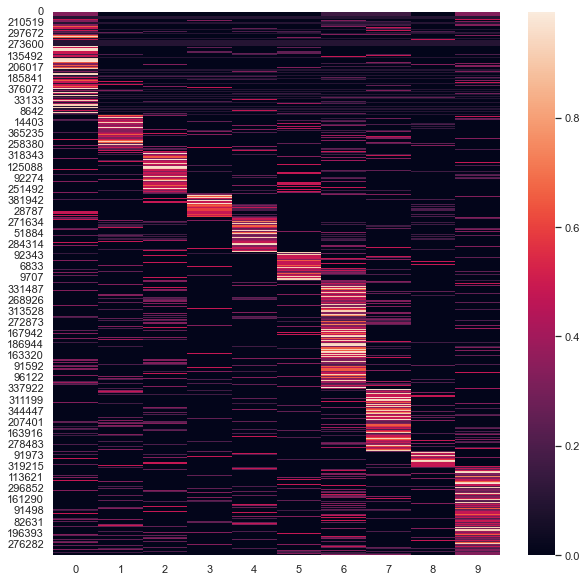

In [61]:
%matplotlib inline
import seaborn as sns; sns.set(rc={'figure.figsize':(10,10)})
sns.heatmap(document_topic.loc[document_topic.idxmax(axis=1).sort_values().index])

<AxesSubplot:>

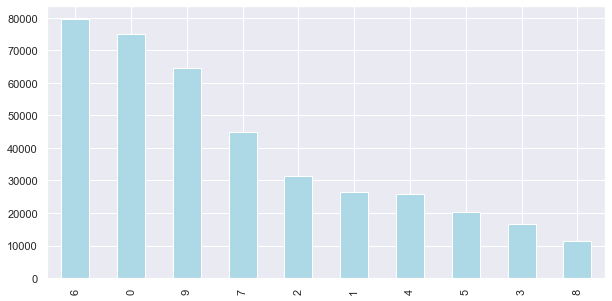

In [62]:
sns.set(rc={'figure.figsize':(10,5)})
document_topic.idxmax(axis=1).value_counts().plot.bar(color='lightblue')

#### Visualizing topics

In [63]:
!pip3 install pyLDAvis

In [64]:
%matplotlib inline
import pyLDAvis
import pyLDAvis.gensim_models
vis = pyLDAvis.gensim_models.prepare(topic_model=lda_model, corpus=corpus, dictionary=dictionary_LDA)
pyLDAvis.enable_notebook()
pyLDAvis.display(vis)

/Users/avinash/opt/anaconda3/lib/python3.9/site-packages/pyLDAvis/_prepare.py:246: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  default_term_info = default_term_info.sort_values(
/Users/avinash/opt/anaconda3/lib/python3.9/site-packages/past/builtins/misc.py:45: DeprecationWarning: the imp module is deprecated in favour of importlib; see the module's documentation for alternative uses
  from imp import reload
/Users/avinash/opt/anaconda3/lib/python3.9/site-packages/past/builtins/misc.py:45: DeprecationWarning: the imp module is deprecated in favour of importlib; see the module's documentation for alternative uses
  from imp import reload
/Users/avinash/opt/anaconda3/lib/python3.9/site-packages/past/builtins/misc.py:45: DeprecationWarning: the imp module is deprecated in favour of importlib; see the module's documentation for alternative uses
  from imp import reload
/Users/avinash/opt/anaconda3/lib/

### Dominant topic and its percentage contribution

In [65]:
def format_topics_sentences(ldamodel=None, corpus=corpus, texts=data):
    # Init output
    sent_topics_df = pd.DataFrame()
    # Get main topic in each document
    for i, row_list in enumerate(ldamodel[corpus]):
        print("i -->",i)
        row = row_list[0] if ldamodel.per_word_topics else row_list            
        # print(row)
        row = sorted(row, key=lambda x: (x[1]), reverse=True)
        # Get the Dominant topic, Perc Contribution and Keywords for each document
        for j, (topic_num, prop_topic) in enumerate(row):
            if j == 0:  # => dominant topic
                wp = ldamodel.show_topic(topic_num)
                topic_keywords = ", ".join([word for word, prop in wp])
                sent_topics_df = sent_topics_df.append(pd.Series([int(topic_num), round(prop_topic,4), topic_keywords]), ignore_index=True)
            else:
                break
    sent_topics_df.columns = ['Dominant_Topic', 'Perc_Contribution', 'Topic_Keywords']

    # Add original text to the end of the output
    contents = pd.Series(texts)
    sent_topics_df = pd.concat([sent_topics_df, contents], axis=1)
    sent_topics_df
    return(sent_topics_df)


df_topic_sents_keywords = format_topics_sentences(ldamodel=lda_model, corpus=corpus, texts=tokens)
# Format
df_dominant_topic = df_topic_sents_keywords.reset_index()
df_dominant_topic.columns = ['Document_No', 'Dominant_Topic', 'Topic_Perc_Contrib', 'Keywords', 'Text']
df_dominant_topic.head(10)

i --> 0
i --> 1
i --> 2
i --> 3
i --> 4
i --> 5
i --> 6
i --> 7
i --> 8
i --> 9
i --> 10
i --> 11
i --> 12
i --> 13
i --> 14
i --> 15
i --> 16
i --> 17


/var/folders/b8/_n0wmgqx529ccytp_4mtnhsh0000gn/T/ipykernel_1464/2134684025.py:17: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  sent_topics_df = sent_topics_df.append(pd.Series([int(topic_num), round(prop_topic,4), topic_keywords]), ignore_index=True)
/var/folders/b8/_n0wmgqx529ccytp_4mtnhsh0000gn/T/ipykernel_1464/2134684025.py:17: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  sent_topics_df = sent_topics_df.append(pd.Series([int(topic_num), round(prop_topic,4), topic_keywords]), ignore_index=True)


i --> 18
i --> 19
i --> 20
i --> 21
i --> 22
i --> 23
i --> 24
i --> 25
i --> 26
i --> 27
i --> 28
i --> 29
i --> 30
i --> 31
i --> 32
i --> 33
i --> 34
i --> 35
i --> 36
i --> 37
i --> 38
i --> 39
i --> 40
i --> 41
i --> 42
i --> 43
i --> 44
i --> 45
i --> 46
i --> 47
i --> 48
i --> 49
i --> 50
i --> 51
i --> 52
i --> 53
i --> 54
i --> 55
i --> 56
i --> 57
i --> 58
i --> 59
i --> 60
i --> 61
i --> 62
i --> 63
i --> 64
i --> 65
i --> 66
i --> 67
i --> 68
i --> 69
i --> 70
i --> 71
i --> 72
i --> 73
i --> 74
i --> 75
i --> 76
i --> 77
i --> 78
i --> 79
i --> 80
i --> 81
i --> 82
i --> 83
i --> 84
i --> 85
i --> 86
i --> 87
i --> 88
i --> 89
i --> 90
i --> 91
i --> 92
i --> 93
i --> 94
i --> 95
i --> 96
i --> 97
i --> 98
i --> 99
i --> 100
i --> 101
i --> 102
i --> 103
i --> 104
i --> 105
i --> 106
i --> 107
i --> 108
i --> 109
i --> 110
i --> 111
i --> 112
i --> 113
i --> 114
i --> 115
i --> 116
i --> 117
i --> 118
i --> 119
i --> 120
i --> 121
i --> 122
i --> 123
i --> 124
i --> 125
i 

i --> 850
i --> 851
i --> 852
i --> 853
i --> 854
i --> 855
i --> 856
i --> 857
i --> 858
i --> 859
i --> 860
i --> 861
i --> 862
i --> 863
i --> 864
i --> 865
i --> 866
i --> 867
i --> 868
i --> 869
i --> 870
i --> 871
i --> 872
i --> 873
i --> 874
i --> 875
i --> 876
i --> 877
i --> 878
i --> 879
i --> 880
i --> 881
i --> 882
i --> 883
i --> 884
i --> 885
i --> 886
i --> 887
i --> 888
i --> 889
i --> 890
i --> 891
i --> 892
i --> 893
i --> 894
i --> 895
i --> 896
i --> 897
i --> 898
i --> 899
i --> 900
i --> 901
i --> 902
i --> 903
i --> 904
i --> 905
i --> 906
i --> 907
i --> 908
i --> 909
i --> 910
i --> 911
i --> 912
i --> 913
i --> 914
i --> 915
i --> 916
i --> 917
i --> 918
i --> 919
i --> 920
i --> 921
i --> 922
i --> 923
i --> 924
i --> 925
i --> 926
i --> 927
i --> 928
i --> 929
i --> 930
i --> 931
i --> 932
i --> 933
i --> 934
i --> 935
i --> 936
i --> 937
i --> 938
i --> 939
i --> 940
i --> 941
i --> 942
i --> 943
i --> 944
i --> 945
i --> 946
i --> 947
i --> 948
i --> 949


i --> 1610
i --> 1611
i --> 1612
i --> 1613
i --> 1614
i --> 1615
i --> 1616
i --> 1617
i --> 1618
i --> 1619
i --> 1620
i --> 1621
i --> 1622
i --> 1623
i --> 1624
i --> 1625
i --> 1626
i --> 1627
i --> 1628
i --> 1629
i --> 1630
i --> 1631
i --> 1632
i --> 1633
i --> 1634
i --> 1635
i --> 1636
i --> 1637
i --> 1638
i --> 1639
i --> 1640
i --> 1641
i --> 1642
i --> 1643
i --> 1644
i --> 1645
i --> 1646
i --> 1647
i --> 1648
i --> 1649
i --> 1650
i --> 1651
i --> 1652
i --> 1653
i --> 1654
i --> 1655
i --> 1656
i --> 1657
i --> 1658
i --> 1659
i --> 1660
i --> 1661
i --> 1662
i --> 1663
i --> 1664
i --> 1665
i --> 1666
i --> 1667
i --> 1668
i --> 1669
i --> 1670
i --> 1671
i --> 1672
i --> 1673
i --> 1674
i --> 1675
i --> 1676
i --> 1677
i --> 1678
i --> 1679
i --> 1680
i --> 1681
i --> 1682
i --> 1683
i --> 1684
i --> 1685
i --> 1686
i --> 1687
i --> 1688
i --> 1689
i --> 1690
i --> 1691
i --> 1692
i --> 1693
i --> 1694
i --> 1695
i --> 1696
i --> 1697
i --> 1698
i --> 1699
i --> 1700

i --> 2381
i --> 2382
i --> 2383
i --> 2384
i --> 2385
i --> 2386
i --> 2387
i --> 2388
i --> 2389
i --> 2390
i --> 2391
i --> 2392
i --> 2393
i --> 2394
i --> 2395
i --> 2396
i --> 2397
i --> 2398
i --> 2399
i --> 2400
i --> 2401
i --> 2402
i --> 2403
i --> 2404
i --> 2405
i --> 2406
i --> 2407
i --> 2408
i --> 2409
i --> 2410
i --> 2411
i --> 2412
i --> 2413
i --> 2414
i --> 2415
i --> 2416
i --> 2417
i --> 2418
i --> 2419
i --> 2420
i --> 2421
i --> 2422
i --> 2423
i --> 2424
i --> 2425
i --> 2426
i --> 2427
i --> 2428
i --> 2429
i --> 2430
i --> 2431
i --> 2432
i --> 2433
i --> 2434
i --> 2435
i --> 2436
i --> 2437
i --> 2438
i --> 2439
i --> 2440
i --> 2441
i --> 2442
i --> 2443
i --> 2444
i --> 2445
i --> 2446
i --> 2447
i --> 2448
i --> 2449
i --> 2450
i --> 2451
i --> 2452
i --> 2453
i --> 2454
i --> 2455
i --> 2456
i --> 2457
i --> 2458
i --> 2459
i --> 2460
i --> 2461
i --> 2462
i --> 2463
i --> 2464
i --> 2465
i --> 2466
i --> 2467
i --> 2468
i --> 2469
i --> 2470
i --> 2471

i --> 3139
i --> 3140
i --> 3141
i --> 3142
i --> 3143
i --> 3144
i --> 3145
i --> 3146
i --> 3147
i --> 3148
i --> 3149
i --> 3150
i --> 3151
i --> 3152
i --> 3153
i --> 3154
i --> 3155
i --> 3156
i --> 3157
i --> 3158
i --> 3159
i --> 3160
i --> 3161
i --> 3162
i --> 3163
i --> 3164
i --> 3165
i --> 3166
i --> 3167
i --> 3168
i --> 3169
i --> 3170
i --> 3171
i --> 3172
i --> 3173
i --> 3174
i --> 3175
i --> 3176
i --> 3177
i --> 3178
i --> 3179
i --> 3180
i --> 3181
i --> 3182
i --> 3183
i --> 3184
i --> 3185
i --> 3186
i --> 3187
i --> 3188
i --> 3189
i --> 3190
i --> 3191
i --> 3192
i --> 3193
i --> 3194
i --> 3195
i --> 3196
i --> 3197
i --> 3198
i --> 3199
i --> 3200
i --> 3201
i --> 3202
i --> 3203
i --> 3204
i --> 3205
i --> 3206
i --> 3207
i --> 3208
i --> 3209
i --> 3210
i --> 3211
i --> 3212
i --> 3213
i --> 3214
i --> 3215
i --> 3216
i --> 3217
i --> 3218
i --> 3219
i --> 3220
i --> 3221
i --> 3222
i --> 3223
i --> 3224
i --> 3225
i --> 3226
i --> 3227
i --> 3228
i --> 3229

i --> 3893
i --> 3894
i --> 3895
i --> 3896
i --> 3897
i --> 3898
i --> 3899
i --> 3900
i --> 3901
i --> 3902
i --> 3903
i --> 3904
i --> 3905
i --> 3906
i --> 3907
i --> 3908
i --> 3909
i --> 3910
i --> 3911
i --> 3912
i --> 3913
i --> 3914
i --> 3915
i --> 3916
i --> 3917
i --> 3918
i --> 3919
i --> 3920
i --> 3921
i --> 3922
i --> 3923
i --> 3924
i --> 3925
i --> 3926
i --> 3927
i --> 3928
i --> 3929
i --> 3930
i --> 3931
i --> 3932
i --> 3933
i --> 3934
i --> 3935
i --> 3936
i --> 3937
i --> 3938
i --> 3939
i --> 3940
i --> 3941
i --> 3942
i --> 3943
i --> 3944
i --> 3945
i --> 3946
i --> 3947
i --> 3948
i --> 3949
i --> 3950
i --> 3951
i --> 3952
i --> 3953
i --> 3954
i --> 3955
i --> 3956
i --> 3957
i --> 3958
i --> 3959
i --> 3960
i --> 3961
i --> 3962
i --> 3963
i --> 3964
i --> 3965
i --> 3966
i --> 3967
i --> 3968
i --> 3969
i --> 3970
i --> 3971
i --> 3972
i --> 3973
i --> 3974
i --> 3975
i --> 3976
i --> 3977
i --> 3978
i --> 3979
i --> 3980
i --> 3981
i --> 3982
i --> 3983

i --> 4655
i --> 4656
i --> 4657
i --> 4658
i --> 4659
i --> 4660
i --> 4661
i --> 4662
i --> 4663
i --> 4664
i --> 4665
i --> 4666
i --> 4667
i --> 4668
i --> 4669
i --> 4670
i --> 4671
i --> 4672
i --> 4673
i --> 4674
i --> 4675
i --> 4676
i --> 4677
i --> 4678
i --> 4679
i --> 4680
i --> 4681
i --> 4682
i --> 4683
i --> 4684
i --> 4685
i --> 4686
i --> 4687
i --> 4688
i --> 4689
i --> 4690
i --> 4691
i --> 4692
i --> 4693
i --> 4694
i --> 4695
i --> 4696
i --> 4697
i --> 4698
i --> 4699
i --> 4700
i --> 4701
i --> 4702
i --> 4703
i --> 4704
i --> 4705
i --> 4706
i --> 4707
i --> 4708
i --> 4709
i --> 4710
i --> 4711
i --> 4712
i --> 4713
i --> 4714
i --> 4715
i --> 4716
i --> 4717
i --> 4718
i --> 4719
i --> 4720
i --> 4721
i --> 4722
i --> 4723
i --> 4724
i --> 4725
i --> 4726
i --> 4727
i --> 4728
i --> 4729
i --> 4730
i --> 4731
i --> 4732
i --> 4733
i --> 4734
i --> 4735
i --> 4736
i --> 4737
i --> 4738
i --> 4739
i --> 4740
i --> 4741
i --> 4742
i --> 4743
i --> 4744
i --> 4745

i --> 5415
i --> 5416
i --> 5417
i --> 5418
i --> 5419
i --> 5420
i --> 5421
i --> 5422
i --> 5423
i --> 5424
i --> 5425
i --> 5426
i --> 5427
i --> 5428
i --> 5429
i --> 5430
i --> 5431
i --> 5432
i --> 5433
i --> 5434
i --> 5435
i --> 5436
i --> 5437
i --> 5438
i --> 5439
i --> 5440
i --> 5441
i --> 5442
i --> 5443
i --> 5444
i --> 5445
i --> 5446
i --> 5447
i --> 5448
i --> 5449
i --> 5450
i --> 5451
i --> 5452
i --> 5453
i --> 5454
i --> 5455
i --> 5456
i --> 5457
i --> 5458
i --> 5459
i --> 5460
i --> 5461
i --> 5462
i --> 5463
i --> 5464
i --> 5465
i --> 5466
i --> 5467
i --> 5468
i --> 5469
i --> 5470
i --> 5471
i --> 5472
i --> 5473
i --> 5474
i --> 5475
i --> 5476
i --> 5477
i --> 5478
i --> 5479
i --> 5480
i --> 5481
i --> 5482
i --> 5483
i --> 5484
i --> 5485
i --> 5486
i --> 5487
i --> 5488
i --> 5489
i --> 5490
i --> 5491
i --> 5492
i --> 5493
i --> 5494
i --> 5495
i --> 5496
i --> 5497
i --> 5498
i --> 5499
i --> 5500
i --> 5501
i --> 5502
i --> 5503
i --> 5504
i --> 5505

i --> 6171
i --> 6172
i --> 6173
i --> 6174
i --> 6175
i --> 6176
i --> 6177
i --> 6178
i --> 6179
i --> 6180
i --> 6181
i --> 6182
i --> 6183
i --> 6184
i --> 6185
i --> 6186
i --> 6187
i --> 6188
i --> 6189
i --> 6190
i --> 6191
i --> 6192
i --> 6193
i --> 6194
i --> 6195
i --> 6196
i --> 6197
i --> 6198
i --> 6199
i --> 6200
i --> 6201
i --> 6202
i --> 6203
i --> 6204
i --> 6205
i --> 6206
i --> 6207
i --> 6208
i --> 6209
i --> 6210
i --> 6211
i --> 6212
i --> 6213
i --> 6214
i --> 6215
i --> 6216
i --> 6217
i --> 6218
i --> 6219
i --> 6220
i --> 6221
i --> 6222
i --> 6223
i --> 6224
i --> 6225
i --> 6226
i --> 6227
i --> 6228
i --> 6229
i --> 6230
i --> 6231
i --> 6232
i --> 6233
i --> 6234
i --> 6235
i --> 6236
i --> 6237
i --> 6238
i --> 6239
i --> 6240
i --> 6241
i --> 6242
i --> 6243
i --> 6244
i --> 6245
i --> 6246
i --> 6247
i --> 6248
i --> 6249
i --> 6250
i --> 6251
i --> 6252
i --> 6253
i --> 6254
i --> 6255
i --> 6256
i --> 6257
i --> 6258
i --> 6259
i --> 6260
i --> 6261

i --> 6919
i --> 6920
i --> 6921
i --> 6922
i --> 6923
i --> 6924
i --> 6925
i --> 6926
i --> 6927
i --> 6928
i --> 6929
i --> 6930
i --> 6931
i --> 6932
i --> 6933
i --> 6934
i --> 6935
i --> 6936
i --> 6937
i --> 6938
i --> 6939
i --> 6940
i --> 6941
i --> 6942
i --> 6943
i --> 6944
i --> 6945
i --> 6946
i --> 6947
i --> 6948
i --> 6949
i --> 6950
i --> 6951
i --> 6952
i --> 6953
i --> 6954
i --> 6955
i --> 6956
i --> 6957
i --> 6958
i --> 6959
i --> 6960
i --> 6961
i --> 6962
i --> 6963
i --> 6964
i --> 6965
i --> 6966
i --> 6967
i --> 6968
i --> 6969
i --> 6970
i --> 6971
i --> 6972
i --> 6973
i --> 6974
i --> 6975
i --> 6976
i --> 6977
i --> 6978
i --> 6979
i --> 6980
i --> 6981
i --> 6982
i --> 6983
i --> 6984
i --> 6985
i --> 6986
i --> 6987
i --> 6988
i --> 6989
i --> 6990
i --> 6991
i --> 6992
i --> 6993
i --> 6994
i --> 6995
i --> 6996
i --> 6997
i --> 6998
i --> 6999
i --> 7000
i --> 7001
i --> 7002
i --> 7003
i --> 7004
i --> 7005
i --> 7006
i --> 7007
i --> 7008
i --> 7009

i --> 7673
i --> 7674
i --> 7675
i --> 7676
i --> 7677
i --> 7678
i --> 7679
i --> 7680
i --> 7681
i --> 7682
i --> 7683
i --> 7684
i --> 7685
i --> 7686
i --> 7687
i --> 7688
i --> 7689
i --> 7690
i --> 7691
i --> 7692
i --> 7693
i --> 7694
i --> 7695
i --> 7696
i --> 7697
i --> 7698
i --> 7699
i --> 7700
i --> 7701
i --> 7702
i --> 7703
i --> 7704
i --> 7705
i --> 7706
i --> 7707
i --> 7708
i --> 7709
i --> 7710
i --> 7711
i --> 7712
i --> 7713
i --> 7714
i --> 7715
i --> 7716
i --> 7717
i --> 7718
i --> 7719
i --> 7720
i --> 7721
i --> 7722
i --> 7723
i --> 7724
i --> 7725
i --> 7726
i --> 7727
i --> 7728
i --> 7729
i --> 7730
i --> 7731
i --> 7732
i --> 7733
i --> 7734
i --> 7735
i --> 7736
i --> 7737
i --> 7738
i --> 7739
i --> 7740
i --> 7741
i --> 7742
i --> 7743
i --> 7744
i --> 7745
i --> 7746
i --> 7747
i --> 7748
i --> 7749
i --> 7750
i --> 7751
i --> 7752
i --> 7753
i --> 7754
i --> 7755
i --> 7756
i --> 7757
i --> 7758
i --> 7759
i --> 7760
i --> 7761
i --> 7762
i --> 7763

i --> 8425
i --> 8426
i --> 8427
i --> 8428
i --> 8429
i --> 8430
i --> 8431
i --> 8432
i --> 8433
i --> 8434
i --> 8435
i --> 8436
i --> 8437
i --> 8438
i --> 8439
i --> 8440
i --> 8441
i --> 8442
i --> 8443
i --> 8444
i --> 8445
i --> 8446
i --> 8447
i --> 8448
i --> 8449
i --> 8450
i --> 8451
i --> 8452
i --> 8453
i --> 8454
i --> 8455
i --> 8456
i --> 8457
i --> 8458
i --> 8459
i --> 8460
i --> 8461
i --> 8462
i --> 8463
i --> 8464
i --> 8465
i --> 8466
i --> 8467
i --> 8468
i --> 8469
i --> 8470
i --> 8471
i --> 8472
i --> 8473
i --> 8474
i --> 8475
i --> 8476
i --> 8477
i --> 8478
i --> 8479
i --> 8480
i --> 8481
i --> 8482
i --> 8483
i --> 8484
i --> 8485
i --> 8486
i --> 8487
i --> 8488
i --> 8489
i --> 8490
i --> 8491
i --> 8492
i --> 8493
i --> 8494
i --> 8495
i --> 8496
i --> 8497
i --> 8498
i --> 8499
i --> 8500
i --> 8501
i --> 8502
i --> 8503
i --> 8504
i --> 8505
i --> 8506
i --> 8507
i --> 8508
i --> 8509
i --> 8510
i --> 8511
i --> 8512
i --> 8513
i --> 8514
i --> 8515

i --> 9191
i --> 9192
i --> 9193
i --> 9194
i --> 9195
i --> 9196
i --> 9197
i --> 9198
i --> 9199
i --> 9200
i --> 9201
i --> 9202
i --> 9203
i --> 9204
i --> 9205
i --> 9206
i --> 9207
i --> 9208
i --> 9209
i --> 9210
i --> 9211
i --> 9212
i --> 9213
i --> 9214
i --> 9215
i --> 9216
i --> 9217
i --> 9218
i --> 9219
i --> 9220
i --> 9221
i --> 9222
i --> 9223
i --> 9224
i --> 9225
i --> 9226
i --> 9227
i --> 9228
i --> 9229
i --> 9230
i --> 9231
i --> 9232
i --> 9233
i --> 9234
i --> 9235
i --> 9236
i --> 9237
i --> 9238
i --> 9239
i --> 9240
i --> 9241
i --> 9242
i --> 9243
i --> 9244
i --> 9245
i --> 9246
i --> 9247
i --> 9248
i --> 9249
i --> 9250
i --> 9251
i --> 9252
i --> 9253
i --> 9254
i --> 9255
i --> 9256
i --> 9257
i --> 9258
i --> 9259
i --> 9260
i --> 9261
i --> 9262
i --> 9263
i --> 9264
i --> 9265
i --> 9266
i --> 9267
i --> 9268
i --> 9269
i --> 9270
i --> 9271
i --> 9272
i --> 9273
i --> 9274
i --> 9275
i --> 9276
i --> 9277
i --> 9278
i --> 9279
i --> 9280
i --> 9281

i --> 9945
i --> 9946
i --> 9947
i --> 9948
i --> 9949
i --> 9950
i --> 9951
i --> 9952
i --> 9953
i --> 9954
i --> 9955
i --> 9956
i --> 9957
i --> 9958
i --> 9959
i --> 9960
i --> 9961
i --> 9962
i --> 9963
i --> 9964
i --> 9965
i --> 9966
i --> 9967
i --> 9968
i --> 9969
i --> 9970
i --> 9971
i --> 9972
i --> 9973
i --> 9974
i --> 9975
i --> 9976
i --> 9977
i --> 9978
i --> 9979
i --> 9980
i --> 9981
i --> 9982
i --> 9983
i --> 9984
i --> 9985
i --> 9986
i --> 9987
i --> 9988
i --> 9989
i --> 9990
i --> 9991
i --> 9992
i --> 9993
i --> 9994
i --> 9995
i --> 9996
i --> 9997
i --> 9998
i --> 9999
i --> 10000
i --> 10001
i --> 10002
i --> 10003
i --> 10004
i --> 10005
i --> 10006
i --> 10007
i --> 10008
i --> 10009
i --> 10010
i --> 10011
i --> 10012
i --> 10013
i --> 10014
i --> 10015
i --> 10016
i --> 10017
i --> 10018
i --> 10019
i --> 10020
i --> 10021
i --> 10022
i --> 10023
i --> 10024
i --> 10025
i --> 10026
i --> 10027
i --> 10028
i --> 10029
i --> 10030
i --> 10031
i --> 10032

i --> 10640
i --> 10641
i --> 10642
i --> 10643
i --> 10644
i --> 10645
i --> 10646
i --> 10647
i --> 10648
i --> 10649
i --> 10650
i --> 10651
i --> 10652
i --> 10653
i --> 10654
i --> 10655
i --> 10656
i --> 10657
i --> 10658
i --> 10659
i --> 10660
i --> 10661
i --> 10662
i --> 10663
i --> 10664
i --> 10665
i --> 10666
i --> 10667
i --> 10668
i --> 10669
i --> 10670
i --> 10671
i --> 10672
i --> 10673
i --> 10674
i --> 10675
i --> 10676
i --> 10677
i --> 10678
i --> 10679
i --> 10680
i --> 10681
i --> 10682
i --> 10683
i --> 10684
i --> 10685
i --> 10686
i --> 10687
i --> 10688
i --> 10689
i --> 10690
i --> 10691
i --> 10692
i --> 10693
i --> 10694
i --> 10695
i --> 10696
i --> 10697
i --> 10698
i --> 10699
i --> 10700
i --> 10701
i --> 10702
i --> 10703
i --> 10704
i --> 10705
i --> 10706
i --> 10707
i --> 10708
i --> 10709
i --> 10710
i --> 10711
i --> 10712
i --> 10713
i --> 10714
i --> 10715
i --> 10716
i --> 10717
i --> 10718
i --> 10719
i --> 10720
i --> 10721
i --> 10722
i --

i --> 11331
i --> 11332
i --> 11333
i --> 11334
i --> 11335
i --> 11336
i --> 11337
i --> 11338
i --> 11339
i --> 11340
i --> 11341
i --> 11342
i --> 11343
i --> 11344
i --> 11345
i --> 11346
i --> 11347
i --> 11348
i --> 11349
i --> 11350
i --> 11351
i --> 11352
i --> 11353
i --> 11354
i --> 11355
i --> 11356
i --> 11357
i --> 11358
i --> 11359
i --> 11360
i --> 11361
i --> 11362
i --> 11363
i --> 11364
i --> 11365
i --> 11366
i --> 11367
i --> 11368
i --> 11369
i --> 11370
i --> 11371
i --> 11372
i --> 11373
i --> 11374
i --> 11375
i --> 11376
i --> 11377
i --> 11378
i --> 11379
i --> 11380
i --> 11381
i --> 11382
i --> 11383
i --> 11384
i --> 11385
i --> 11386
i --> 11387
i --> 11388
i --> 11389
i --> 11390
i --> 11391
i --> 11392
i --> 11393
i --> 11394
i --> 11395
i --> 11396
i --> 11397
i --> 11398
i --> 11399
i --> 11400
i --> 11401
i --> 11402
i --> 11403
i --> 11404
i --> 11405
i --> 11406
i --> 11407
i --> 11408
i --> 11409
i --> 11410
i --> 11411
i --> 11412
i --> 11413
i --

i --> 12026
i --> 12027
i --> 12028
i --> 12029
i --> 12030
i --> 12031
i --> 12032
i --> 12033
i --> 12034
i --> 12035
i --> 12036
i --> 12037
i --> 12038
i --> 12039
i --> 12040
i --> 12041
i --> 12042
i --> 12043
i --> 12044
i --> 12045
i --> 12046
i --> 12047
i --> 12048
i --> 12049
i --> 12050
i --> 12051
i --> 12052
i --> 12053
i --> 12054
i --> 12055
i --> 12056
i --> 12057
i --> 12058
i --> 12059
i --> 12060
i --> 12061
i --> 12062
i --> 12063
i --> 12064
i --> 12065
i --> 12066
i --> 12067
i --> 12068
i --> 12069
i --> 12070
i --> 12071
i --> 12072
i --> 12073
i --> 12074
i --> 12075
i --> 12076
i --> 12077
i --> 12078
i --> 12079
i --> 12080
i --> 12081
i --> 12082
i --> 12083
i --> 12084
i --> 12085
i --> 12086
i --> 12087
i --> 12088
i --> 12089
i --> 12090
i --> 12091
i --> 12092
i --> 12093
i --> 12094
i --> 12095
i --> 12096
i --> 12097
i --> 12098
i --> 12099
i --> 12100
i --> 12101
i --> 12102
i --> 12103
i --> 12104
i --> 12105
i --> 12106
i --> 12107
i --> 12108
i --

i --> 12718
i --> 12719
i --> 12720
i --> 12721
i --> 12722
i --> 12723
i --> 12724
i --> 12725
i --> 12726
i --> 12727
i --> 12728
i --> 12729
i --> 12730
i --> 12731
i --> 12732
i --> 12733
i --> 12734
i --> 12735
i --> 12736
i --> 12737
i --> 12738
i --> 12739
i --> 12740
i --> 12741
i --> 12742
i --> 12743
i --> 12744
i --> 12745
i --> 12746
i --> 12747
i --> 12748
i --> 12749
i --> 12750
i --> 12751
i --> 12752
i --> 12753
i --> 12754
i --> 12755
i --> 12756
i --> 12757
i --> 12758
i --> 12759
i --> 12760
i --> 12761
i --> 12762
i --> 12763
i --> 12764
i --> 12765
i --> 12766
i --> 12767
i --> 12768
i --> 12769
i --> 12770
i --> 12771
i --> 12772
i --> 12773
i --> 12774
i --> 12775
i --> 12776
i --> 12777
i --> 12778
i --> 12779
i --> 12780
i --> 12781
i --> 12782
i --> 12783
i --> 12784
i --> 12785
i --> 12786
i --> 12787
i --> 12788
i --> 12789
i --> 12790
i --> 12791
i --> 12792
i --> 12793
i --> 12794
i --> 12795
i --> 12796
i --> 12797
i --> 12798
i --> 12799
i --> 12800
i --

i --> 13401
i --> 13402
i --> 13403
i --> 13404
i --> 13405
i --> 13406
i --> 13407
i --> 13408
i --> 13409
i --> 13410
i --> 13411
i --> 13412
i --> 13413
i --> 13414
i --> 13415
i --> 13416
i --> 13417
i --> 13418
i --> 13419
i --> 13420
i --> 13421
i --> 13422
i --> 13423
i --> 13424
i --> 13425
i --> 13426
i --> 13427
i --> 13428
i --> 13429
i --> 13430
i --> 13431
i --> 13432
i --> 13433
i --> 13434
i --> 13435
i --> 13436
i --> 13437
i --> 13438
i --> 13439
i --> 13440
i --> 13441
i --> 13442
i --> 13443
i --> 13444
i --> 13445
i --> 13446
i --> 13447
i --> 13448
i --> 13449
i --> 13450
i --> 13451
i --> 13452
i --> 13453
i --> 13454
i --> 13455
i --> 13456
i --> 13457
i --> 13458
i --> 13459
i --> 13460
i --> 13461
i --> 13462
i --> 13463
i --> 13464
i --> 13465
i --> 13466
i --> 13467
i --> 13468
i --> 13469
i --> 13470
i --> 13471
i --> 13472
i --> 13473
i --> 13474
i --> 13475
i --> 13476
i --> 13477
i --> 13478
i --> 13479
i --> 13480
i --> 13481
i --> 13482
i --> 13483
i --

i --> 14087
i --> 14088
i --> 14089
i --> 14090
i --> 14091
i --> 14092
i --> 14093
i --> 14094
i --> 14095
i --> 14096
i --> 14097
i --> 14098
i --> 14099
i --> 14100
i --> 14101
i --> 14102
i --> 14103
i --> 14104
i --> 14105
i --> 14106
i --> 14107
i --> 14108
i --> 14109
i --> 14110
i --> 14111
i --> 14112
i --> 14113
i --> 14114
i --> 14115
i --> 14116
i --> 14117
i --> 14118
i --> 14119
i --> 14120
i --> 14121
i --> 14122
i --> 14123
i --> 14124
i --> 14125
i --> 14126
i --> 14127
i --> 14128
i --> 14129
i --> 14130
i --> 14131
i --> 14132
i --> 14133
i --> 14134
i --> 14135
i --> 14136
i --> 14137
i --> 14138
i --> 14139
i --> 14140
i --> 14141
i --> 14142
i --> 14143
i --> 14144
i --> 14145
i --> 14146
i --> 14147
i --> 14148
i --> 14149
i --> 14150
i --> 14151
i --> 14152
i --> 14153
i --> 14154
i --> 14155
i --> 14156
i --> 14157
i --> 14158
i --> 14159
i --> 14160
i --> 14161
i --> 14162
i --> 14163
i --> 14164
i --> 14165
i --> 14166
i --> 14167
i --> 14168
i --> 14169
i --

i --> 14780
i --> 14781
i --> 14782
i --> 14783
i --> 14784
i --> 14785
i --> 14786
i --> 14787
i --> 14788
i --> 14789
i --> 14790
i --> 14791
i --> 14792
i --> 14793
i --> 14794
i --> 14795
i --> 14796
i --> 14797
i --> 14798
i --> 14799
i --> 14800
i --> 14801
i --> 14802
i --> 14803
i --> 14804
i --> 14805
i --> 14806
i --> 14807
i --> 14808
i --> 14809
i --> 14810
i --> 14811
i --> 14812
i --> 14813
i --> 14814
i --> 14815
i --> 14816
i --> 14817
i --> 14818
i --> 14819
i --> 14820
i --> 14821
i --> 14822
i --> 14823
i --> 14824
i --> 14825
i --> 14826
i --> 14827
i --> 14828
i --> 14829
i --> 14830
i --> 14831
i --> 14832
i --> 14833
i --> 14834
i --> 14835
i --> 14836
i --> 14837
i --> 14838
i --> 14839
i --> 14840
i --> 14841
i --> 14842
i --> 14843
i --> 14844
i --> 14845
i --> 14846
i --> 14847
i --> 14848
i --> 14849
i --> 14850
i --> 14851
i --> 14852
i --> 14853
i --> 14854
i --> 14855
i --> 14856
i --> 14857
i --> 14858
i --> 14859
i --> 14860
i --> 14861
i --> 14862
i --

i --> 15481
i --> 15482
i --> 15483
i --> 15484
i --> 15485
i --> 15486
i --> 15487
i --> 15488
i --> 15489
i --> 15490
i --> 15491
i --> 15492
i --> 15493
i --> 15494
i --> 15495
i --> 15496
i --> 15497
i --> 15498
i --> 15499
i --> 15500
i --> 15501
i --> 15502
i --> 15503
i --> 15504
i --> 15505
i --> 15506
i --> 15507
i --> 15508
i --> 15509
i --> 15510
i --> 15511
i --> 15512
i --> 15513
i --> 15514
i --> 15515
i --> 15516
i --> 15517
i --> 15518
i --> 15519
i --> 15520
i --> 15521
i --> 15522
i --> 15523
i --> 15524
i --> 15525
i --> 15526
i --> 15527
i --> 15528
i --> 15529
i --> 15530
i --> 15531
i --> 15532
i --> 15533
i --> 15534
i --> 15535
i --> 15536
i --> 15537
i --> 15538
i --> 15539
i --> 15540
i --> 15541
i --> 15542
i --> 15543
i --> 15544
i --> 15545
i --> 15546
i --> 15547
i --> 15548
i --> 15549
i --> 15550
i --> 15551
i --> 15552
i --> 15553
i --> 15554
i --> 15555
i --> 15556
i --> 15557
i --> 15558
i --> 15559
i --> 15560
i --> 15561
i --> 15562
i --> 15563
i --

i --> 16181
i --> 16182
i --> 16183
i --> 16184
i --> 16185
i --> 16186
i --> 16187
i --> 16188
i --> 16189
i --> 16190
i --> 16191
i --> 16192
i --> 16193
i --> 16194
i --> 16195
i --> 16196
i --> 16197
i --> 16198
i --> 16199
i --> 16200
i --> 16201
i --> 16202
i --> 16203
i --> 16204
i --> 16205
i --> 16206
i --> 16207
i --> 16208
i --> 16209
i --> 16210
i --> 16211
i --> 16212
i --> 16213
i --> 16214
i --> 16215
i --> 16216
i --> 16217
i --> 16218
i --> 16219
i --> 16220
i --> 16221
i --> 16222
i --> 16223
i --> 16224
i --> 16225
i --> 16226
i --> 16227
i --> 16228
i --> 16229
i --> 16230
i --> 16231
i --> 16232
i --> 16233
i --> 16234
i --> 16235
i --> 16236
i --> 16237
i --> 16238
i --> 16239
i --> 16240
i --> 16241
i --> 16242
i --> 16243
i --> 16244
i --> 16245
i --> 16246
i --> 16247
i --> 16248
i --> 16249
i --> 16250
i --> 16251
i --> 16252
i --> 16253
i --> 16254
i --> 16255
i --> 16256
i --> 16257
i --> 16258
i --> 16259
i --> 16260
i --> 16261
i --> 16262
i --> 16263
i --

i --> 16883
i --> 16884
i --> 16885
i --> 16886
i --> 16887
i --> 16888
i --> 16889
i --> 16890
i --> 16891
i --> 16892
i --> 16893
i --> 16894
i --> 16895
i --> 16896
i --> 16897
i --> 16898
i --> 16899
i --> 16900
i --> 16901
i --> 16902
i --> 16903
i --> 16904
i --> 16905
i --> 16906
i --> 16907
i --> 16908
i --> 16909
i --> 16910
i --> 16911
i --> 16912
i --> 16913
i --> 16914
i --> 16915
i --> 16916
i --> 16917
i --> 16918
i --> 16919
i --> 16920
i --> 16921
i --> 16922
i --> 16923
i --> 16924
i --> 16925
i --> 16926
i --> 16927
i --> 16928
i --> 16929
i --> 16930
i --> 16931
i --> 16932
i --> 16933
i --> 16934
i --> 16935
i --> 16936
i --> 16937
i --> 16938
i --> 16939
i --> 16940
i --> 16941
i --> 16942
i --> 16943
i --> 16944
i --> 16945
i --> 16946
i --> 16947
i --> 16948
i --> 16949
i --> 16950
i --> 16951
i --> 16952
i --> 16953
i --> 16954
i --> 16955
i --> 16956
i --> 16957
i --> 16958
i --> 16959
i --> 16960
i --> 16961
i --> 16962
i --> 16963
i --> 16964
i --> 16965
i --

i --> 17585
i --> 17586
i --> 17587
i --> 17588
i --> 17589
i --> 17590
i --> 17591
i --> 17592
i --> 17593
i --> 17594
i --> 17595
i --> 17596
i --> 17597
i --> 17598
i --> 17599
i --> 17600
i --> 17601
i --> 17602
i --> 17603
i --> 17604
i --> 17605
i --> 17606
i --> 17607
i --> 17608
i --> 17609
i --> 17610
i --> 17611
i --> 17612
i --> 17613
i --> 17614
i --> 17615
i --> 17616
i --> 17617
i --> 17618
i --> 17619
i --> 17620
i --> 17621
i --> 17622
i --> 17623
i --> 17624
i --> 17625
i --> 17626
i --> 17627
i --> 17628
i --> 17629
i --> 17630
i --> 17631
i --> 17632
i --> 17633
i --> 17634
i --> 17635
i --> 17636
i --> 17637
i --> 17638
i --> 17639
i --> 17640
i --> 17641
i --> 17642
i --> 17643
i --> 17644
i --> 17645
i --> 17646
i --> 17647
i --> 17648
i --> 17649
i --> 17650
i --> 17651
i --> 17652
i --> 17653
i --> 17654
i --> 17655
i --> 17656
i --> 17657
i --> 17658
i --> 17659
i --> 17660
i --> 17661
i --> 17662
i --> 17663
i --> 17664
i --> 17665
i --> 17666
i --> 17667
i --

i --> 18288
i --> 18289
i --> 18290
i --> 18291
i --> 18292
i --> 18293
i --> 18294
i --> 18295
i --> 18296
i --> 18297
i --> 18298
i --> 18299
i --> 18300
i --> 18301
i --> 18302
i --> 18303
i --> 18304
i --> 18305
i --> 18306
i --> 18307
i --> 18308
i --> 18309
i --> 18310
i --> 18311
i --> 18312
i --> 18313
i --> 18314
i --> 18315
i --> 18316
i --> 18317
i --> 18318
i --> 18319
i --> 18320
i --> 18321
i --> 18322
i --> 18323
i --> 18324
i --> 18325
i --> 18326
i --> 18327
i --> 18328
i --> 18329
i --> 18330
i --> 18331
i --> 18332
i --> 18333
i --> 18334
i --> 18335
i --> 18336
i --> 18337
i --> 18338
i --> 18339
i --> 18340
i --> 18341
i --> 18342
i --> 18343
i --> 18344
i --> 18345
i --> 18346
i --> 18347
i --> 18348
i --> 18349
i --> 18350
i --> 18351
i --> 18352
i --> 18353
i --> 18354
i --> 18355
i --> 18356
i --> 18357
i --> 18358
i --> 18359
i --> 18360
i --> 18361
i --> 18362
i --> 18363
i --> 18364
i --> 18365
i --> 18366
i --> 18367
i --> 18368
i --> 18369
i --> 18370
i --

i --> 18990
i --> 18991
i --> 18992
i --> 18993
i --> 18994
i --> 18995
i --> 18996
i --> 18997
i --> 18998
i --> 18999
i --> 19000
i --> 19001
i --> 19002
i --> 19003
i --> 19004
i --> 19005
i --> 19006
i --> 19007
i --> 19008
i --> 19009
i --> 19010
i --> 19011
i --> 19012
i --> 19013
i --> 19014
i --> 19015
i --> 19016
i --> 19017
i --> 19018
i --> 19019
i --> 19020
i --> 19021
i --> 19022
i --> 19023
i --> 19024
i --> 19025
i --> 19026
i --> 19027
i --> 19028
i --> 19029
i --> 19030
i --> 19031
i --> 19032
i --> 19033
i --> 19034
i --> 19035
i --> 19036
i --> 19037
i --> 19038
i --> 19039
i --> 19040
i --> 19041
i --> 19042
i --> 19043
i --> 19044
i --> 19045
i --> 19046
i --> 19047
i --> 19048
i --> 19049
i --> 19050
i --> 19051
i --> 19052
i --> 19053
i --> 19054
i --> 19055
i --> 19056
i --> 19057
i --> 19058
i --> 19059
i --> 19060
i --> 19061
i --> 19062
i --> 19063
i --> 19064
i --> 19065
i --> 19066
i --> 19067
i --> 19068
i --> 19069
i --> 19070
i --> 19071
i --> 19072
i --

i --> 19693
i --> 19694
i --> 19695
i --> 19696
i --> 19697
i --> 19698
i --> 19699
i --> 19700
i --> 19701
i --> 19702
i --> 19703
i --> 19704
i --> 19705
i --> 19706
i --> 19707
i --> 19708
i --> 19709
i --> 19710
i --> 19711
i --> 19712
i --> 19713
i --> 19714
i --> 19715
i --> 19716
i --> 19717
i --> 19718
i --> 19719
i --> 19720
i --> 19721
i --> 19722
i --> 19723
i --> 19724
i --> 19725
i --> 19726
i --> 19727
i --> 19728
i --> 19729
i --> 19730
i --> 19731
i --> 19732
i --> 19733
i --> 19734
i --> 19735
i --> 19736
i --> 19737
i --> 19738
i --> 19739
i --> 19740
i --> 19741
i --> 19742
i --> 19743
i --> 19744
i --> 19745
i --> 19746
i --> 19747
i --> 19748
i --> 19749
i --> 19750
i --> 19751
i --> 19752
i --> 19753
i --> 19754
i --> 19755
i --> 19756
i --> 19757
i --> 19758
i --> 19759
i --> 19760
i --> 19761
i --> 19762
i --> 19763
i --> 19764
i --> 19765
i --> 19766
i --> 19767
i --> 19768
i --> 19769
i --> 19770
i --> 19771
i --> 19772
i --> 19773
i --> 19774
i --> 19775
i --

i --> 20395
i --> 20396
i --> 20397
i --> 20398
i --> 20399
i --> 20400
i --> 20401
i --> 20402
i --> 20403
i --> 20404
i --> 20405
i --> 20406
i --> 20407
i --> 20408
i --> 20409
i --> 20410
i --> 20411
i --> 20412
i --> 20413
i --> 20414
i --> 20415
i --> 20416
i --> 20417
i --> 20418
i --> 20419
i --> 20420
i --> 20421
i --> 20422
i --> 20423
i --> 20424
i --> 20425
i --> 20426
i --> 20427
i --> 20428
i --> 20429
i --> 20430
i --> 20431
i --> 20432
i --> 20433
i --> 20434
i --> 20435
i --> 20436
i --> 20437
i --> 20438
i --> 20439
i --> 20440
i --> 20441
i --> 20442
i --> 20443
i --> 20444
i --> 20445
i --> 20446
i --> 20447
i --> 20448
i --> 20449
i --> 20450
i --> 20451
i --> 20452
i --> 20453
i --> 20454
i --> 20455
i --> 20456
i --> 20457
i --> 20458
i --> 20459
i --> 20460
i --> 20461
i --> 20462
i --> 20463
i --> 20464
i --> 20465
i --> 20466
i --> 20467
i --> 20468
i --> 20469
i --> 20470
i --> 20471
i --> 20472
i --> 20473
i --> 20474
i --> 20475
i --> 20476
i --> 20477
i --

i --> 21097
i --> 21098
i --> 21099
i --> 21100
i --> 21101
i --> 21102
i --> 21103
i --> 21104
i --> 21105
i --> 21106
i --> 21107
i --> 21108
i --> 21109
i --> 21110
i --> 21111
i --> 21112
i --> 21113
i --> 21114
i --> 21115
i --> 21116
i --> 21117
i --> 21118
i --> 21119
i --> 21120
i --> 21121
i --> 21122
i --> 21123
i --> 21124
i --> 21125
i --> 21126
i --> 21127
i --> 21128
i --> 21129
i --> 21130
i --> 21131
i --> 21132
i --> 21133
i --> 21134
i --> 21135
i --> 21136
i --> 21137
i --> 21138
i --> 21139
i --> 21140
i --> 21141
i --> 21142
i --> 21143
i --> 21144
i --> 21145
i --> 21146
i --> 21147
i --> 21148
i --> 21149
i --> 21150
i --> 21151
i --> 21152
i --> 21153
i --> 21154
i --> 21155
i --> 21156
i --> 21157
i --> 21158
i --> 21159
i --> 21160
i --> 21161
i --> 21162
i --> 21163
i --> 21164
i --> 21165
i --> 21166
i --> 21167
i --> 21168
i --> 21169
i --> 21170
i --> 21171
i --> 21172
i --> 21173
i --> 21174
i --> 21175
i --> 21176
i --> 21177
i --> 21178
i --> 21179
i --

i --> 21799
i --> 21800
i --> 21801
i --> 21802
i --> 21803
i --> 21804
i --> 21805
i --> 21806
i --> 21807
i --> 21808
i --> 21809
i --> 21810
i --> 21811
i --> 21812
i --> 21813
i --> 21814
i --> 21815
i --> 21816
i --> 21817
i --> 21818
i --> 21819
i --> 21820
i --> 21821
i --> 21822
i --> 21823
i --> 21824
i --> 21825
i --> 21826
i --> 21827
i --> 21828
i --> 21829
i --> 21830
i --> 21831
i --> 21832
i --> 21833
i --> 21834
i --> 21835
i --> 21836
i --> 21837
i --> 21838
i --> 21839
i --> 21840
i --> 21841
i --> 21842
i --> 21843
i --> 21844
i --> 21845
i --> 21846
i --> 21847
i --> 21848
i --> 21849
i --> 21850
i --> 21851
i --> 21852
i --> 21853
i --> 21854
i --> 21855
i --> 21856
i --> 21857
i --> 21858
i --> 21859
i --> 21860
i --> 21861
i --> 21862
i --> 21863
i --> 21864
i --> 21865
i --> 21866
i --> 21867
i --> 21868
i --> 21869
i --> 21870
i --> 21871
i --> 21872
i --> 21873
i --> 21874
i --> 21875
i --> 21876
i --> 21877
i --> 21878
i --> 21879
i --> 21880
i --> 21881
i --

i --> 22487
i --> 22488
i --> 22489
i --> 22490
i --> 22491
i --> 22492
i --> 22493
i --> 22494
i --> 22495
i --> 22496
i --> 22497
i --> 22498
i --> 22499
i --> 22500
i --> 22501
i --> 22502
i --> 22503
i --> 22504
i --> 22505
i --> 22506
i --> 22507
i --> 22508
i --> 22509
i --> 22510
i --> 22511
i --> 22512
i --> 22513
i --> 22514
i --> 22515
i --> 22516
i --> 22517
i --> 22518
i --> 22519
i --> 22520
i --> 22521
i --> 22522
i --> 22523
i --> 22524
i --> 22525
i --> 22526
i --> 22527
i --> 22528
i --> 22529
i --> 22530
i --> 22531
i --> 22532
i --> 22533
i --> 22534
i --> 22535
i --> 22536
i --> 22537
i --> 22538
i --> 22539
i --> 22540
i --> 22541
i --> 22542
i --> 22543
i --> 22544
i --> 22545
i --> 22546
i --> 22547
i --> 22548
i --> 22549
i --> 22550
i --> 22551
i --> 22552
i --> 22553
i --> 22554
i --> 22555
i --> 22556
i --> 22557
i --> 22558
i --> 22559
i --> 22560
i --> 22561
i --> 22562
i --> 22563
i --> 22564
i --> 22565
i --> 22566
i --> 22567
i --> 22568
i --> 22569
i --

i --> 23188
i --> 23189
i --> 23190
i --> 23191
i --> 23192
i --> 23193
i --> 23194
i --> 23195
i --> 23196
i --> 23197
i --> 23198
i --> 23199
i --> 23200
i --> 23201
i --> 23202
i --> 23203
i --> 23204
i --> 23205
i --> 23206
i --> 23207
i --> 23208
i --> 23209
i --> 23210
i --> 23211
i --> 23212
i --> 23213
i --> 23214
i --> 23215
i --> 23216
i --> 23217
i --> 23218
i --> 23219
i --> 23220
i --> 23221
i --> 23222
i --> 23223
i --> 23224
i --> 23225
i --> 23226
i --> 23227
i --> 23228
i --> 23229
i --> 23230
i --> 23231
i --> 23232
i --> 23233
i --> 23234
i --> 23235
i --> 23236
i --> 23237
i --> 23238
i --> 23239
i --> 23240
i --> 23241
i --> 23242
i --> 23243
i --> 23244
i --> 23245
i --> 23246
i --> 23247
i --> 23248
i --> 23249
i --> 23250
i --> 23251
i --> 23252
i --> 23253
i --> 23254
i --> 23255
i --> 23256
i --> 23257
i --> 23258
i --> 23259
i --> 23260
i --> 23261
i --> 23262
i --> 23263
i --> 23264
i --> 23265
i --> 23266
i --> 23267
i --> 23268
i --> 23269
i --> 23270
i --

i --> 23874
i --> 23875
i --> 23876
i --> 23877
i --> 23878
i --> 23879
i --> 23880
i --> 23881
i --> 23882
i --> 23883
i --> 23884
i --> 23885
i --> 23886
i --> 23887
i --> 23888
i --> 23889
i --> 23890
i --> 23891
i --> 23892
i --> 23893
i --> 23894
i --> 23895
i --> 23896
i --> 23897
i --> 23898
i --> 23899
i --> 23900
i --> 23901
i --> 23902
i --> 23903
i --> 23904
i --> 23905
i --> 23906
i --> 23907
i --> 23908
i --> 23909
i --> 23910
i --> 23911
i --> 23912
i --> 23913
i --> 23914
i --> 23915
i --> 23916
i --> 23917
i --> 23918
i --> 23919
i --> 23920
i --> 23921
i --> 23922
i --> 23923
i --> 23924
i --> 23925
i --> 23926
i --> 23927
i --> 23928
i --> 23929
i --> 23930
i --> 23931
i --> 23932
i --> 23933
i --> 23934
i --> 23935
i --> 23936
i --> 23937
i --> 23938
i --> 23939
i --> 23940
i --> 23941
i --> 23942
i --> 23943
i --> 23944
i --> 23945
i --> 23946
i --> 23947
i --> 23948
i --> 23949
i --> 23950
i --> 23951
i --> 23952
i --> 23953
i --> 23954
i --> 23955
i --> 23956
i --

i --> 24572
i --> 24573
i --> 24574
i --> 24575
i --> 24576
i --> 24577
i --> 24578
i --> 24579
i --> 24580
i --> 24581
i --> 24582
i --> 24583
i --> 24584
i --> 24585
i --> 24586
i --> 24587
i --> 24588
i --> 24589
i --> 24590
i --> 24591
i --> 24592
i --> 24593
i --> 24594
i --> 24595
i --> 24596
i --> 24597
i --> 24598
i --> 24599
i --> 24600
i --> 24601
i --> 24602
i --> 24603
i --> 24604
i --> 24605
i --> 24606
i --> 24607
i --> 24608
i --> 24609
i --> 24610
i --> 24611
i --> 24612
i --> 24613
i --> 24614
i --> 24615
i --> 24616
i --> 24617
i --> 24618
i --> 24619
i --> 24620
i --> 24621
i --> 24622
i --> 24623
i --> 24624
i --> 24625
i --> 24626
i --> 24627
i --> 24628
i --> 24629
i --> 24630
i --> 24631
i --> 24632
i --> 24633
i --> 24634
i --> 24635
i --> 24636
i --> 24637
i --> 24638
i --> 24639
i --> 24640
i --> 24641
i --> 24642
i --> 24643
i --> 24644
i --> 24645
i --> 24646
i --> 24647
i --> 24648
i --> 24649
i --> 24650
i --> 24651
i --> 24652
i --> 24653
i --> 24654
i --

i --> 25274
i --> 25275
i --> 25276
i --> 25277
i --> 25278
i --> 25279
i --> 25280
i --> 25281
i --> 25282
i --> 25283
i --> 25284
i --> 25285
i --> 25286
i --> 25287
i --> 25288
i --> 25289
i --> 25290
i --> 25291
i --> 25292
i --> 25293
i --> 25294
i --> 25295
i --> 25296
i --> 25297
i --> 25298
i --> 25299
i --> 25300
i --> 25301
i --> 25302
i --> 25303
i --> 25304
i --> 25305
i --> 25306
i --> 25307
i --> 25308
i --> 25309
i --> 25310
i --> 25311
i --> 25312
i --> 25313
i --> 25314
i --> 25315
i --> 25316
i --> 25317
i --> 25318
i --> 25319
i --> 25320
i --> 25321
i --> 25322
i --> 25323
i --> 25324
i --> 25325
i --> 25326
i --> 25327
i --> 25328
i --> 25329
i --> 25330
i --> 25331
i --> 25332
i --> 25333
i --> 25334
i --> 25335
i --> 25336
i --> 25337
i --> 25338
i --> 25339
i --> 25340
i --> 25341
i --> 25342
i --> 25343
i --> 25344
i --> 25345
i --> 25346
i --> 25347
i --> 25348
i --> 25349
i --> 25350
i --> 25351
i --> 25352
i --> 25353
i --> 25354
i --> 25355
i --> 25356
i --

i --> 25976
i --> 25977
i --> 25978
i --> 25979
i --> 25980
i --> 25981
i --> 25982
i --> 25983
i --> 25984
i --> 25985
i --> 25986
i --> 25987
i --> 25988
i --> 25989
i --> 25990
i --> 25991
i --> 25992
i --> 25993
i --> 25994
i --> 25995
i --> 25996
i --> 25997
i --> 25998
i --> 25999
i --> 26000
i --> 26001
i --> 26002
i --> 26003
i --> 26004
i --> 26005
i --> 26006
i --> 26007
i --> 26008
i --> 26009
i --> 26010
i --> 26011
i --> 26012
i --> 26013
i --> 26014
i --> 26015
i --> 26016
i --> 26017
i --> 26018
i --> 26019
i --> 26020
i --> 26021
i --> 26022
i --> 26023
i --> 26024
i --> 26025
i --> 26026
i --> 26027
i --> 26028
i --> 26029
i --> 26030
i --> 26031
i --> 26032
i --> 26033
i --> 26034
i --> 26035
i --> 26036
i --> 26037
i --> 26038
i --> 26039
i --> 26040
i --> 26041
i --> 26042
i --> 26043
i --> 26044
i --> 26045
i --> 26046
i --> 26047
i --> 26048
i --> 26049
i --> 26050
i --> 26051
i --> 26052
i --> 26053
i --> 26054
i --> 26055
i --> 26056
i --> 26057
i --> 26058
i --

i --> 26678
i --> 26679
i --> 26680
i --> 26681
i --> 26682
i --> 26683
i --> 26684
i --> 26685
i --> 26686
i --> 26687
i --> 26688
i --> 26689
i --> 26690
i --> 26691
i --> 26692
i --> 26693
i --> 26694
i --> 26695
i --> 26696
i --> 26697
i --> 26698
i --> 26699
i --> 26700
i --> 26701
i --> 26702
i --> 26703
i --> 26704
i --> 26705
i --> 26706
i --> 26707
i --> 26708
i --> 26709
i --> 26710
i --> 26711
i --> 26712
i --> 26713
i --> 26714
i --> 26715
i --> 26716
i --> 26717
i --> 26718
i --> 26719
i --> 26720
i --> 26721
i --> 26722
i --> 26723
i --> 26724
i --> 26725
i --> 26726
i --> 26727
i --> 26728
i --> 26729
i --> 26730
i --> 26731
i --> 26732
i --> 26733
i --> 26734
i --> 26735
i --> 26736
i --> 26737
i --> 26738
i --> 26739
i --> 26740
i --> 26741
i --> 26742
i --> 26743
i --> 26744
i --> 26745
i --> 26746
i --> 26747
i --> 26748
i --> 26749
i --> 26750
i --> 26751
i --> 26752
i --> 26753
i --> 26754
i --> 26755
i --> 26756
i --> 26757
i --> 26758
i --> 26759
i --> 26760
i --

i --> 27380
i --> 27381
i --> 27382
i --> 27383
i --> 27384
i --> 27385
i --> 27386
i --> 27387
i --> 27388
i --> 27389
i --> 27390
i --> 27391
i --> 27392
i --> 27393
i --> 27394
i --> 27395
i --> 27396
i --> 27397
i --> 27398
i --> 27399
i --> 27400
i --> 27401
i --> 27402
i --> 27403
i --> 27404
i --> 27405
i --> 27406
i --> 27407
i --> 27408
i --> 27409
i --> 27410
i --> 27411
i --> 27412
i --> 27413
i --> 27414
i --> 27415
i --> 27416
i --> 27417
i --> 27418
i --> 27419
i --> 27420
i --> 27421
i --> 27422
i --> 27423
i --> 27424
i --> 27425
i --> 27426
i --> 27427
i --> 27428
i --> 27429
i --> 27430
i --> 27431
i --> 27432
i --> 27433
i --> 27434
i --> 27435
i --> 27436
i --> 27437
i --> 27438
i --> 27439
i --> 27440
i --> 27441
i --> 27442
i --> 27443
i --> 27444
i --> 27445
i --> 27446
i --> 27447
i --> 27448
i --> 27449
i --> 27450
i --> 27451
i --> 27452
i --> 27453
i --> 27454
i --> 27455
i --> 27456
i --> 27457
i --> 27458
i --> 27459
i --> 27460
i --> 27461
i --> 27462
i --

i --> 28077
i --> 28078
i --> 28079
i --> 28080
i --> 28081
i --> 28082
i --> 28083
i --> 28084
i --> 28085
i --> 28086
i --> 28087
i --> 28088
i --> 28089
i --> 28090
i --> 28091
i --> 28092
i --> 28093
i --> 28094
i --> 28095
i --> 28096
i --> 28097
i --> 28098
i --> 28099
i --> 28100
i --> 28101
i --> 28102
i --> 28103
i --> 28104
i --> 28105
i --> 28106
i --> 28107
i --> 28108
i --> 28109
i --> 28110
i --> 28111
i --> 28112
i --> 28113
i --> 28114
i --> 28115
i --> 28116
i --> 28117
i --> 28118
i --> 28119
i --> 28120
i --> 28121
i --> 28122
i --> 28123
i --> 28124
i --> 28125
i --> 28126
i --> 28127
i --> 28128
i --> 28129
i --> 28130
i --> 28131
i --> 28132
i --> 28133
i --> 28134
i --> 28135
i --> 28136
i --> 28137
i --> 28138
i --> 28139
i --> 28140
i --> 28141
i --> 28142
i --> 28143
i --> 28144
i --> 28145
i --> 28146
i --> 28147
i --> 28148
i --> 28149
i --> 28150
i --> 28151
i --> 28152
i --> 28153
i --> 28154
i --> 28155
i --> 28156
i --> 28157
i --> 28158
i --> 28159
i --

i --> 28779
i --> 28780
i --> 28781
i --> 28782
i --> 28783
i --> 28784
i --> 28785
i --> 28786
i --> 28787
i --> 28788
i --> 28789
i --> 28790
i --> 28791
i --> 28792
i --> 28793
i --> 28794
i --> 28795
i --> 28796
i --> 28797
i --> 28798
i --> 28799
i --> 28800
i --> 28801
i --> 28802
i --> 28803
i --> 28804
i --> 28805
i --> 28806
i --> 28807
i --> 28808
i --> 28809
i --> 28810
i --> 28811
i --> 28812
i --> 28813
i --> 28814
i --> 28815
i --> 28816
i --> 28817
i --> 28818
i --> 28819
i --> 28820
i --> 28821
i --> 28822
i --> 28823
i --> 28824
i --> 28825
i --> 28826
i --> 28827
i --> 28828
i --> 28829
i --> 28830
i --> 28831
i --> 28832
i --> 28833
i --> 28834
i --> 28835
i --> 28836
i --> 28837
i --> 28838
i --> 28839
i --> 28840
i --> 28841
i --> 28842
i --> 28843
i --> 28844
i --> 28845
i --> 28846
i --> 28847
i --> 28848
i --> 28849
i --> 28850
i --> 28851
i --> 28852
i --> 28853
i --> 28854
i --> 28855
i --> 28856
i --> 28857
i --> 28858
i --> 28859
i --> 28860
i --> 28861
i --

i --> 29463
i --> 29464
i --> 29465
i --> 29466
i --> 29467
i --> 29468
i --> 29469
i --> 29470
i --> 29471
i --> 29472
i --> 29473
i --> 29474
i --> 29475
i --> 29476
i --> 29477
i --> 29478
i --> 29479
i --> 29480
i --> 29481
i --> 29482
i --> 29483
i --> 29484
i --> 29485
i --> 29486
i --> 29487
i --> 29488
i --> 29489
i --> 29490
i --> 29491
i --> 29492
i --> 29493
i --> 29494
i --> 29495
i --> 29496
i --> 29497
i --> 29498
i --> 29499
i --> 29500
i --> 29501
i --> 29502
i --> 29503
i --> 29504
i --> 29505
i --> 29506
i --> 29507
i --> 29508
i --> 29509
i --> 29510
i --> 29511
i --> 29512
i --> 29513
i --> 29514
i --> 29515
i --> 29516
i --> 29517
i --> 29518
i --> 29519
i --> 29520
i --> 29521
i --> 29522
i --> 29523
i --> 29524
i --> 29525
i --> 29526
i --> 29527
i --> 29528
i --> 29529
i --> 29530
i --> 29531
i --> 29532
i --> 29533
i --> 29534
i --> 29535
i --> 29536
i --> 29537
i --> 29538
i --> 29539
i --> 29540
i --> 29541
i --> 29542
i --> 29543
i --> 29544
i --> 29545
i --

i --> 30161
i --> 30162
i --> 30163
i --> 30164
i --> 30165
i --> 30166
i --> 30167
i --> 30168
i --> 30169
i --> 30170
i --> 30171
i --> 30172
i --> 30173
i --> 30174
i --> 30175
i --> 30176
i --> 30177
i --> 30178
i --> 30179
i --> 30180
i --> 30181
i --> 30182
i --> 30183
i --> 30184
i --> 30185
i --> 30186
i --> 30187
i --> 30188
i --> 30189
i --> 30190
i --> 30191
i --> 30192
i --> 30193
i --> 30194
i --> 30195
i --> 30196
i --> 30197
i --> 30198
i --> 30199
i --> 30200
i --> 30201
i --> 30202
i --> 30203
i --> 30204
i --> 30205
i --> 30206
i --> 30207
i --> 30208
i --> 30209
i --> 30210
i --> 30211
i --> 30212
i --> 30213
i --> 30214
i --> 30215
i --> 30216
i --> 30217
i --> 30218
i --> 30219
i --> 30220
i --> 30221
i --> 30222
i --> 30223
i --> 30224
i --> 30225
i --> 30226
i --> 30227
i --> 30228
i --> 30229
i --> 30230
i --> 30231
i --> 30232
i --> 30233
i --> 30234
i --> 30235
i --> 30236
i --> 30237
i --> 30238
i --> 30239
i --> 30240
i --> 30241
i --> 30242
i --> 30243
i --

i --> 30863
i --> 30864
i --> 30865
i --> 30866
i --> 30867
i --> 30868
i --> 30869
i --> 30870
i --> 30871
i --> 30872
i --> 30873
i --> 30874
i --> 30875
i --> 30876
i --> 30877
i --> 30878
i --> 30879
i --> 30880
i --> 30881
i --> 30882
i --> 30883
i --> 30884
i --> 30885
i --> 30886
i --> 30887
i --> 30888
i --> 30889
i --> 30890
i --> 30891
i --> 30892
i --> 30893
i --> 30894
i --> 30895
i --> 30896
i --> 30897
i --> 30898
i --> 30899
i --> 30900
i --> 30901
i --> 30902
i --> 30903
i --> 30904
i --> 30905
i --> 30906
i --> 30907
i --> 30908
i --> 30909
i --> 30910
i --> 30911
i --> 30912
i --> 30913
i --> 30914
i --> 30915
i --> 30916
i --> 30917
i --> 30918
i --> 30919
i --> 30920
i --> 30921
i --> 30922
i --> 30923
i --> 30924
i --> 30925
i --> 30926
i --> 30927
i --> 30928
i --> 30929
i --> 30930
i --> 30931
i --> 30932
i --> 30933
i --> 30934
i --> 30935
i --> 30936
i --> 30937
i --> 30938
i --> 30939
i --> 30940
i --> 30941
i --> 30942
i --> 30943
i --> 30944
i --> 30945
i --

i --> 31565
i --> 31566
i --> 31567
i --> 31568
i --> 31569
i --> 31570
i --> 31571
i --> 31572
i --> 31573
i --> 31574
i --> 31575
i --> 31576
i --> 31577
i --> 31578
i --> 31579
i --> 31580
i --> 31581
i --> 31582
i --> 31583
i --> 31584
i --> 31585
i --> 31586
i --> 31587
i --> 31588
i --> 31589
i --> 31590
i --> 31591
i --> 31592
i --> 31593
i --> 31594
i --> 31595
i --> 31596
i --> 31597
i --> 31598
i --> 31599
i --> 31600
i --> 31601
i --> 31602
i --> 31603
i --> 31604
i --> 31605
i --> 31606
i --> 31607
i --> 31608
i --> 31609
i --> 31610
i --> 31611
i --> 31612
i --> 31613
i --> 31614
i --> 31615
i --> 31616
i --> 31617
i --> 31618
i --> 31619
i --> 31620
i --> 31621
i --> 31622
i --> 31623
i --> 31624
i --> 31625
i --> 31626
i --> 31627
i --> 31628
i --> 31629
i --> 31630
i --> 31631
i --> 31632
i --> 31633
i --> 31634
i --> 31635
i --> 31636
i --> 31637
i --> 31638
i --> 31639
i --> 31640
i --> 31641
i --> 31642
i --> 31643
i --> 31644
i --> 31645
i --> 31646
i --> 31647
i --

i --> 32267
i --> 32268
i --> 32269
i --> 32270
i --> 32271
i --> 32272
i --> 32273
i --> 32274
i --> 32275
i --> 32276
i --> 32277
i --> 32278
i --> 32279
i --> 32280
i --> 32281
i --> 32282
i --> 32283
i --> 32284
i --> 32285
i --> 32286
i --> 32287
i --> 32288
i --> 32289
i --> 32290
i --> 32291
i --> 32292
i --> 32293
i --> 32294
i --> 32295
i --> 32296
i --> 32297
i --> 32298
i --> 32299
i --> 32300
i --> 32301
i --> 32302
i --> 32303
i --> 32304
i --> 32305
i --> 32306
i --> 32307
i --> 32308
i --> 32309
i --> 32310
i --> 32311
i --> 32312
i --> 32313
i --> 32314
i --> 32315
i --> 32316
i --> 32317
i --> 32318
i --> 32319
i --> 32320
i --> 32321
i --> 32322
i --> 32323
i --> 32324
i --> 32325
i --> 32326
i --> 32327
i --> 32328
i --> 32329
i --> 32330
i --> 32331
i --> 32332
i --> 32333
i --> 32334
i --> 32335
i --> 32336
i --> 32337
i --> 32338
i --> 32339
i --> 32340
i --> 32341
i --> 32342
i --> 32343
i --> 32344
i --> 32345
i --> 32346
i --> 32347
i --> 32348
i --> 32349
i --

i --> 32969
i --> 32970
i --> 32971
i --> 32972
i --> 32973
i --> 32974
i --> 32975
i --> 32976
i --> 32977
i --> 32978
i --> 32979
i --> 32980
i --> 32981
i --> 32982
i --> 32983
i --> 32984
i --> 32985
i --> 32986
i --> 32987
i --> 32988
i --> 32989
i --> 32990
i --> 32991
i --> 32992
i --> 32993
i --> 32994
i --> 32995
i --> 32996
i --> 32997
i --> 32998
i --> 32999
i --> 33000
i --> 33001
i --> 33002
i --> 33003
i --> 33004
i --> 33005
i --> 33006
i --> 33007
i --> 33008
i --> 33009
i --> 33010
i --> 33011
i --> 33012
i --> 33013
i --> 33014
i --> 33015
i --> 33016
i --> 33017
i --> 33018
i --> 33019
i --> 33020
i --> 33021
i --> 33022
i --> 33023
i --> 33024
i --> 33025
i --> 33026
i --> 33027
i --> 33028
i --> 33029
i --> 33030
i --> 33031
i --> 33032
i --> 33033
i --> 33034
i --> 33035
i --> 33036
i --> 33037
i --> 33038
i --> 33039
i --> 33040
i --> 33041
i --> 33042
i --> 33043
i --> 33044
i --> 33045
i --> 33046
i --> 33047
i --> 33048
i --> 33049
i --> 33050
i --> 33051
i --

i --> 33671
i --> 33672
i --> 33673
i --> 33674
i --> 33675
i --> 33676
i --> 33677
i --> 33678
i --> 33679
i --> 33680
i --> 33681
i --> 33682
i --> 33683
i --> 33684
i --> 33685
i --> 33686
i --> 33687
i --> 33688
i --> 33689
i --> 33690
i --> 33691
i --> 33692
i --> 33693
i --> 33694
i --> 33695
i --> 33696
i --> 33697
i --> 33698
i --> 33699
i --> 33700
i --> 33701
i --> 33702
i --> 33703
i --> 33704
i --> 33705
i --> 33706
i --> 33707
i --> 33708
i --> 33709
i --> 33710
i --> 33711
i --> 33712
i --> 33713
i --> 33714
i --> 33715
i --> 33716
i --> 33717
i --> 33718
i --> 33719
i --> 33720
i --> 33721
i --> 33722
i --> 33723
i --> 33724
i --> 33725
i --> 33726
i --> 33727
i --> 33728
i --> 33729
i --> 33730
i --> 33731
i --> 33732
i --> 33733
i --> 33734
i --> 33735
i --> 33736
i --> 33737
i --> 33738
i --> 33739
i --> 33740
i --> 33741
i --> 33742
i --> 33743
i --> 33744
i --> 33745
i --> 33746
i --> 33747
i --> 33748
i --> 33749
i --> 33750
i --> 33751
i --> 33752
i --> 33753
i --

i --> 34373
i --> 34374
i --> 34375
i --> 34376
i --> 34377
i --> 34378
i --> 34379
i --> 34380
i --> 34381
i --> 34382
i --> 34383
i --> 34384
i --> 34385
i --> 34386
i --> 34387
i --> 34388
i --> 34389
i --> 34390
i --> 34391
i --> 34392
i --> 34393
i --> 34394
i --> 34395
i --> 34396
i --> 34397
i --> 34398
i --> 34399
i --> 34400
i --> 34401
i --> 34402
i --> 34403
i --> 34404
i --> 34405
i --> 34406
i --> 34407
i --> 34408
i --> 34409
i --> 34410
i --> 34411
i --> 34412
i --> 34413
i --> 34414
i --> 34415
i --> 34416
i --> 34417
i --> 34418
i --> 34419
i --> 34420
i --> 34421
i --> 34422
i --> 34423
i --> 34424
i --> 34425
i --> 34426
i --> 34427
i --> 34428
i --> 34429
i --> 34430
i --> 34431
i --> 34432
i --> 34433
i --> 34434
i --> 34435
i --> 34436
i --> 34437
i --> 34438
i --> 34439
i --> 34440
i --> 34441
i --> 34442
i --> 34443
i --> 34444
i --> 34445
i --> 34446
i --> 34447
i --> 34448
i --> 34449
i --> 34450
i --> 34451
i --> 34452
i --> 34453
i --> 34454
i --> 34455
i --

i --> 35075
i --> 35076
i --> 35077
i --> 35078
i --> 35079
i --> 35080
i --> 35081
i --> 35082
i --> 35083
i --> 35084
i --> 35085
i --> 35086
i --> 35087
i --> 35088
i --> 35089
i --> 35090
i --> 35091
i --> 35092
i --> 35093
i --> 35094
i --> 35095
i --> 35096
i --> 35097
i --> 35098
i --> 35099
i --> 35100
i --> 35101
i --> 35102
i --> 35103
i --> 35104
i --> 35105
i --> 35106
i --> 35107
i --> 35108
i --> 35109
i --> 35110
i --> 35111
i --> 35112
i --> 35113
i --> 35114
i --> 35115
i --> 35116
i --> 35117
i --> 35118
i --> 35119
i --> 35120
i --> 35121
i --> 35122
i --> 35123
i --> 35124
i --> 35125
i --> 35126
i --> 35127
i --> 35128
i --> 35129
i --> 35130
i --> 35131
i --> 35132
i --> 35133
i --> 35134
i --> 35135
i --> 35136
i --> 35137
i --> 35138
i --> 35139
i --> 35140
i --> 35141
i --> 35142
i --> 35143
i --> 35144
i --> 35145
i --> 35146
i --> 35147
i --> 35148
i --> 35149
i --> 35150
i --> 35151
i --> 35152
i --> 35153
i --> 35154
i --> 35155
i --> 35156
i --> 35157
i --

i --> 35774
i --> 35775
i --> 35776
i --> 35777
i --> 35778
i --> 35779
i --> 35780
i --> 35781
i --> 35782
i --> 35783
i --> 35784
i --> 35785
i --> 35786
i --> 35787
i --> 35788
i --> 35789
i --> 35790
i --> 35791
i --> 35792
i --> 35793
i --> 35794
i --> 35795
i --> 35796
i --> 35797
i --> 35798
i --> 35799
i --> 35800
i --> 35801
i --> 35802
i --> 35803
i --> 35804
i --> 35805
i --> 35806
i --> 35807
i --> 35808
i --> 35809
i --> 35810
i --> 35811
i --> 35812
i --> 35813
i --> 35814
i --> 35815
i --> 35816
i --> 35817
i --> 35818
i --> 35819
i --> 35820
i --> 35821
i --> 35822
i --> 35823
i --> 35824
i --> 35825
i --> 35826
i --> 35827
i --> 35828
i --> 35829
i --> 35830
i --> 35831
i --> 35832
i --> 35833
i --> 35834
i --> 35835
i --> 35836
i --> 35837
i --> 35838
i --> 35839
i --> 35840
i --> 35841
i --> 35842
i --> 35843
i --> 35844
i --> 35845
i --> 35846
i --> 35847
i --> 35848
i --> 35849
i --> 35850
i --> 35851
i --> 35852
i --> 35853
i --> 35854
i --> 35855
i --> 35856
i --

i --> 36473
i --> 36474
i --> 36475
i --> 36476
i --> 36477
i --> 36478
i --> 36479
i --> 36480
i --> 36481
i --> 36482
i --> 36483
i --> 36484
i --> 36485
i --> 36486
i --> 36487
i --> 36488
i --> 36489
i --> 36490
i --> 36491
i --> 36492
i --> 36493
i --> 36494
i --> 36495
i --> 36496
i --> 36497
i --> 36498
i --> 36499
i --> 36500
i --> 36501
i --> 36502
i --> 36503
i --> 36504
i --> 36505
i --> 36506
i --> 36507
i --> 36508
i --> 36509
i --> 36510
i --> 36511
i --> 36512
i --> 36513
i --> 36514
i --> 36515
i --> 36516
i --> 36517
i --> 36518
i --> 36519
i --> 36520
i --> 36521
i --> 36522
i --> 36523
i --> 36524
i --> 36525
i --> 36526
i --> 36527
i --> 36528
i --> 36529
i --> 36530
i --> 36531
i --> 36532
i --> 36533
i --> 36534
i --> 36535
i --> 36536
i --> 36537
i --> 36538
i --> 36539
i --> 36540
i --> 36541
i --> 36542
i --> 36543
i --> 36544
i --> 36545
i --> 36546
i --> 36547
i --> 36548
i --> 36549
i --> 36550
i --> 36551
i --> 36552
i --> 36553
i --> 36554
i --> 36555
i --

i --> 37159
i --> 37160
i --> 37161
i --> 37162
i --> 37163
i --> 37164
i --> 37165
i --> 37166
i --> 37167
i --> 37168
i --> 37169
i --> 37170
i --> 37171
i --> 37172
i --> 37173
i --> 37174
i --> 37175
i --> 37176
i --> 37177
i --> 37178
i --> 37179
i --> 37180
i --> 37181
i --> 37182
i --> 37183
i --> 37184
i --> 37185
i --> 37186
i --> 37187
i --> 37188
i --> 37189
i --> 37190
i --> 37191
i --> 37192
i --> 37193
i --> 37194
i --> 37195
i --> 37196
i --> 37197
i --> 37198
i --> 37199
i --> 37200
i --> 37201
i --> 37202
i --> 37203
i --> 37204
i --> 37205
i --> 37206
i --> 37207
i --> 37208
i --> 37209
i --> 37210
i --> 37211
i --> 37212
i --> 37213
i --> 37214
i --> 37215
i --> 37216
i --> 37217
i --> 37218
i --> 37219
i --> 37220
i --> 37221
i --> 37222
i --> 37223
i --> 37224
i --> 37225
i --> 37226
i --> 37227
i --> 37228
i --> 37229
i --> 37230
i --> 37231
i --> 37232
i --> 37233
i --> 37234
i --> 37235
i --> 37236
i --> 37237
i --> 37238
i --> 37239
i --> 37240
i --> 37241
i --

i --> 37852
i --> 37853
i --> 37854
i --> 37855
i --> 37856
i --> 37857
i --> 37858
i --> 37859
i --> 37860
i --> 37861
i --> 37862
i --> 37863
i --> 37864
i --> 37865
i --> 37866
i --> 37867
i --> 37868
i --> 37869
i --> 37870
i --> 37871
i --> 37872
i --> 37873
i --> 37874
i --> 37875
i --> 37876
i --> 37877
i --> 37878
i --> 37879
i --> 37880
i --> 37881
i --> 37882
i --> 37883
i --> 37884
i --> 37885
i --> 37886
i --> 37887
i --> 37888
i --> 37889
i --> 37890
i --> 37891
i --> 37892
i --> 37893
i --> 37894
i --> 37895
i --> 37896
i --> 37897
i --> 37898
i --> 37899
i --> 37900
i --> 37901
i --> 37902
i --> 37903
i --> 37904
i --> 37905
i --> 37906
i --> 37907
i --> 37908
i --> 37909
i --> 37910
i --> 37911
i --> 37912
i --> 37913
i --> 37914
i --> 37915
i --> 37916
i --> 37917
i --> 37918
i --> 37919
i --> 37920
i --> 37921
i --> 37922
i --> 37923
i --> 37924
i --> 37925
i --> 37926
i --> 37927
i --> 37928
i --> 37929
i --> 37930
i --> 37931
i --> 37932
i --> 37933
i --> 37934
i --

i --> 38554
i --> 38555
i --> 38556
i --> 38557
i --> 38558
i --> 38559
i --> 38560
i --> 38561
i --> 38562
i --> 38563
i --> 38564
i --> 38565
i --> 38566
i --> 38567
i --> 38568
i --> 38569
i --> 38570
i --> 38571
i --> 38572
i --> 38573
i --> 38574
i --> 38575
i --> 38576
i --> 38577
i --> 38578
i --> 38579
i --> 38580
i --> 38581
i --> 38582
i --> 38583
i --> 38584
i --> 38585
i --> 38586
i --> 38587
i --> 38588
i --> 38589
i --> 38590
i --> 38591
i --> 38592
i --> 38593
i --> 38594
i --> 38595
i --> 38596
i --> 38597
i --> 38598
i --> 38599
i --> 38600
i --> 38601
i --> 38602
i --> 38603
i --> 38604
i --> 38605
i --> 38606
i --> 38607
i --> 38608
i --> 38609
i --> 38610
i --> 38611
i --> 38612
i --> 38613
i --> 38614
i --> 38615
i --> 38616
i --> 38617
i --> 38618
i --> 38619
i --> 38620
i --> 38621
i --> 38622
i --> 38623
i --> 38624
i --> 38625
i --> 38626
i --> 38627
i --> 38628
i --> 38629
i --> 38630
i --> 38631
i --> 38632
i --> 38633
i --> 38634
i --> 38635
i --> 38636
i --

i --> 39257
i --> 39258
i --> 39259
i --> 39260
i --> 39261
i --> 39262
i --> 39263
i --> 39264
i --> 39265
i --> 39266
i --> 39267
i --> 39268
i --> 39269
i --> 39270
i --> 39271
i --> 39272
i --> 39273
i --> 39274
i --> 39275
i --> 39276
i --> 39277
i --> 39278
i --> 39279
i --> 39280
i --> 39281
i --> 39282
i --> 39283
i --> 39284
i --> 39285
i --> 39286
i --> 39287
i --> 39288
i --> 39289
i --> 39290
i --> 39291
i --> 39292
i --> 39293
i --> 39294
i --> 39295
i --> 39296
i --> 39297
i --> 39298
i --> 39299
i --> 39300
i --> 39301
i --> 39302
i --> 39303
i --> 39304
i --> 39305
i --> 39306
i --> 39307
i --> 39308
i --> 39309
i --> 39310
i --> 39311
i --> 39312
i --> 39313
i --> 39314
i --> 39315
i --> 39316
i --> 39317
i --> 39318
i --> 39319
i --> 39320
i --> 39321
i --> 39322
i --> 39323
i --> 39324
i --> 39325
i --> 39326
i --> 39327
i --> 39328
i --> 39329
i --> 39330
i --> 39331
i --> 39332
i --> 39333
i --> 39334
i --> 39335
i --> 39336
i --> 39337
i --> 39338
i --> 39339
i --

i --> 39959
i --> 39960
i --> 39961
i --> 39962
i --> 39963
i --> 39964
i --> 39965
i --> 39966
i --> 39967
i --> 39968
i --> 39969
i --> 39970
i --> 39971
i --> 39972
i --> 39973
i --> 39974
i --> 39975
i --> 39976
i --> 39977
i --> 39978
i --> 39979
i --> 39980
i --> 39981
i --> 39982
i --> 39983
i --> 39984
i --> 39985
i --> 39986
i --> 39987
i --> 39988
i --> 39989
i --> 39990
i --> 39991
i --> 39992
i --> 39993
i --> 39994
i --> 39995
i --> 39996
i --> 39997
i --> 39998
i --> 39999
i --> 40000
i --> 40001
i --> 40002
i --> 40003
i --> 40004
i --> 40005
i --> 40006
i --> 40007
i --> 40008
i --> 40009
i --> 40010
i --> 40011
i --> 40012
i --> 40013
i --> 40014
i --> 40015
i --> 40016
i --> 40017
i --> 40018
i --> 40019
i --> 40020
i --> 40021
i --> 40022
i --> 40023
i --> 40024
i --> 40025
i --> 40026
i --> 40027
i --> 40028
i --> 40029
i --> 40030
i --> 40031
i --> 40032
i --> 40033
i --> 40034
i --> 40035
i --> 40036
i --> 40037
i --> 40038
i --> 40039
i --> 40040
i --> 40041
i --

i --> 40659
i --> 40660
i --> 40661
i --> 40662
i --> 40663
i --> 40664
i --> 40665
i --> 40666
i --> 40667
i --> 40668
i --> 40669
i --> 40670
i --> 40671
i --> 40672
i --> 40673
i --> 40674
i --> 40675
i --> 40676
i --> 40677
i --> 40678
i --> 40679
i --> 40680
i --> 40681
i --> 40682
i --> 40683
i --> 40684
i --> 40685
i --> 40686
i --> 40687
i --> 40688
i --> 40689
i --> 40690
i --> 40691
i --> 40692
i --> 40693
i --> 40694
i --> 40695
i --> 40696
i --> 40697
i --> 40698
i --> 40699
i --> 40700
i --> 40701
i --> 40702
i --> 40703
i --> 40704
i --> 40705
i --> 40706
i --> 40707
i --> 40708
i --> 40709
i --> 40710
i --> 40711
i --> 40712
i --> 40713
i --> 40714
i --> 40715
i --> 40716
i --> 40717
i --> 40718
i --> 40719
i --> 40720
i --> 40721
i --> 40722
i --> 40723
i --> 40724
i --> 40725
i --> 40726
i --> 40727
i --> 40728
i --> 40729
i --> 40730
i --> 40731
i --> 40732
i --> 40733
i --> 40734
i --> 40735
i --> 40736
i --> 40737
i --> 40738
i --> 40739
i --> 40740
i --> 40741
i --

i --> 41345
i --> 41346
i --> 41347
i --> 41348
i --> 41349
i --> 41350
i --> 41351
i --> 41352
i --> 41353
i --> 41354
i --> 41355
i --> 41356
i --> 41357
i --> 41358
i --> 41359
i --> 41360
i --> 41361
i --> 41362
i --> 41363
i --> 41364
i --> 41365
i --> 41366
i --> 41367
i --> 41368
i --> 41369
i --> 41370
i --> 41371
i --> 41372
i --> 41373
i --> 41374
i --> 41375
i --> 41376
i --> 41377
i --> 41378
i --> 41379
i --> 41380
i --> 41381
i --> 41382
i --> 41383
i --> 41384
i --> 41385
i --> 41386
i --> 41387
i --> 41388
i --> 41389
i --> 41390
i --> 41391
i --> 41392
i --> 41393
i --> 41394
i --> 41395
i --> 41396
i --> 41397
i --> 41398
i --> 41399
i --> 41400
i --> 41401
i --> 41402
i --> 41403
i --> 41404
i --> 41405
i --> 41406
i --> 41407
i --> 41408
i --> 41409
i --> 41410
i --> 41411
i --> 41412
i --> 41413
i --> 41414
i --> 41415
i --> 41416
i --> 41417
i --> 41418
i --> 41419
i --> 41420
i --> 41421
i --> 41422
i --> 41423
i --> 41424
i --> 41425
i --> 41426
i --> 41427
i --

i --> 42034
i --> 42035
i --> 42036
i --> 42037
i --> 42038
i --> 42039
i --> 42040
i --> 42041
i --> 42042
i --> 42043
i --> 42044
i --> 42045
i --> 42046
i --> 42047
i --> 42048
i --> 42049
i --> 42050
i --> 42051
i --> 42052
i --> 42053
i --> 42054
i --> 42055
i --> 42056
i --> 42057
i --> 42058
i --> 42059
i --> 42060
i --> 42061
i --> 42062
i --> 42063
i --> 42064
i --> 42065
i --> 42066
i --> 42067
i --> 42068
i --> 42069
i --> 42070
i --> 42071
i --> 42072
i --> 42073
i --> 42074
i --> 42075
i --> 42076
i --> 42077
i --> 42078
i --> 42079
i --> 42080
i --> 42081
i --> 42082
i --> 42083
i --> 42084
i --> 42085
i --> 42086
i --> 42087
i --> 42088
i --> 42089
i --> 42090
i --> 42091
i --> 42092
i --> 42093
i --> 42094
i --> 42095
i --> 42096
i --> 42097
i --> 42098
i --> 42099
i --> 42100
i --> 42101
i --> 42102
i --> 42103
i --> 42104
i --> 42105
i --> 42106
i --> 42107
i --> 42108
i --> 42109
i --> 42110
i --> 42111
i --> 42112
i --> 42113
i --> 42114
i --> 42115
i --> 42116
i --

i --> 42732
i --> 42733
i --> 42734
i --> 42735
i --> 42736
i --> 42737
i --> 42738
i --> 42739
i --> 42740
i --> 42741
i --> 42742
i --> 42743
i --> 42744
i --> 42745
i --> 42746
i --> 42747
i --> 42748
i --> 42749
i --> 42750
i --> 42751
i --> 42752
i --> 42753
i --> 42754
i --> 42755
i --> 42756
i --> 42757
i --> 42758
i --> 42759
i --> 42760
i --> 42761
i --> 42762
i --> 42763
i --> 42764
i --> 42765
i --> 42766
i --> 42767
i --> 42768
i --> 42769
i --> 42770
i --> 42771
i --> 42772
i --> 42773
i --> 42774
i --> 42775
i --> 42776
i --> 42777
i --> 42778
i --> 42779
i --> 42780
i --> 42781
i --> 42782
i --> 42783
i --> 42784
i --> 42785
i --> 42786
i --> 42787
i --> 42788
i --> 42789
i --> 42790
i --> 42791
i --> 42792
i --> 42793
i --> 42794
i --> 42795
i --> 42796
i --> 42797
i --> 42798
i --> 42799
i --> 42800
i --> 42801
i --> 42802
i --> 42803
i --> 42804
i --> 42805
i --> 42806
i --> 42807
i --> 42808
i --> 42809
i --> 42810
i --> 42811
i --> 42812
i --> 42813
i --> 42814
i --

i --> 43417
i --> 43418
i --> 43419
i --> 43420
i --> 43421
i --> 43422
i --> 43423
i --> 43424
i --> 43425
i --> 43426
i --> 43427
i --> 43428
i --> 43429
i --> 43430
i --> 43431
i --> 43432
i --> 43433
i --> 43434
i --> 43435
i --> 43436
i --> 43437
i --> 43438
i --> 43439
i --> 43440
i --> 43441
i --> 43442
i --> 43443
i --> 43444
i --> 43445
i --> 43446
i --> 43447
i --> 43448
i --> 43449
i --> 43450
i --> 43451
i --> 43452
i --> 43453
i --> 43454
i --> 43455
i --> 43456
i --> 43457
i --> 43458
i --> 43459
i --> 43460
i --> 43461
i --> 43462
i --> 43463
i --> 43464
i --> 43465
i --> 43466
i --> 43467
i --> 43468
i --> 43469
i --> 43470
i --> 43471
i --> 43472
i --> 43473
i --> 43474
i --> 43475
i --> 43476
i --> 43477
i --> 43478
i --> 43479
i --> 43480
i --> 43481
i --> 43482
i --> 43483
i --> 43484
i --> 43485
i --> 43486
i --> 43487
i --> 43488
i --> 43489
i --> 43490
i --> 43491
i --> 43492
i --> 43493
i --> 43494
i --> 43495
i --> 43496
i --> 43497
i --> 43498
i --> 43499
i --

i --> 44119
i --> 44120
i --> 44121
i --> 44122
i --> 44123
i --> 44124
i --> 44125
i --> 44126
i --> 44127
i --> 44128
i --> 44129
i --> 44130
i --> 44131
i --> 44132
i --> 44133
i --> 44134
i --> 44135
i --> 44136
i --> 44137
i --> 44138
i --> 44139
i --> 44140
i --> 44141
i --> 44142
i --> 44143
i --> 44144
i --> 44145
i --> 44146
i --> 44147
i --> 44148
i --> 44149
i --> 44150
i --> 44151
i --> 44152
i --> 44153
i --> 44154
i --> 44155
i --> 44156
i --> 44157
i --> 44158
i --> 44159
i --> 44160
i --> 44161
i --> 44162
i --> 44163
i --> 44164
i --> 44165
i --> 44166
i --> 44167
i --> 44168
i --> 44169
i --> 44170
i --> 44171
i --> 44172
i --> 44173
i --> 44174
i --> 44175
i --> 44176
i --> 44177
i --> 44178
i --> 44179
i --> 44180
i --> 44181
i --> 44182
i --> 44183
i --> 44184
i --> 44185
i --> 44186
i --> 44187
i --> 44188
i --> 44189
i --> 44190
i --> 44191
i --> 44192
i --> 44193
i --> 44194
i --> 44195
i --> 44196
i --> 44197
i --> 44198
i --> 44199
i --> 44200
i --> 44201
i --

i --> 44821
i --> 44822
i --> 44823
i --> 44824
i --> 44825
i --> 44826
i --> 44827
i --> 44828
i --> 44829
i --> 44830
i --> 44831
i --> 44832
i --> 44833
i --> 44834
i --> 44835
i --> 44836
i --> 44837
i --> 44838
i --> 44839
i --> 44840
i --> 44841
i --> 44842
i --> 44843
i --> 44844
i --> 44845
i --> 44846
i --> 44847
i --> 44848
i --> 44849
i --> 44850
i --> 44851
i --> 44852
i --> 44853
i --> 44854
i --> 44855
i --> 44856
i --> 44857
i --> 44858
i --> 44859
i --> 44860
i --> 44861
i --> 44862
i --> 44863
i --> 44864
i --> 44865
i --> 44866
i --> 44867
i --> 44868
i --> 44869
i --> 44870
i --> 44871
i --> 44872
i --> 44873
i --> 44874
i --> 44875
i --> 44876
i --> 44877
i --> 44878
i --> 44879
i --> 44880
i --> 44881
i --> 44882
i --> 44883
i --> 44884
i --> 44885
i --> 44886
i --> 44887
i --> 44888
i --> 44889
i --> 44890
i --> 44891
i --> 44892
i --> 44893
i --> 44894
i --> 44895
i --> 44896
i --> 44897
i --> 44898
i --> 44899
i --> 44900
i --> 44901
i --> 44902
i --> 44903
i --

i --> 45519
i --> 45520
i --> 45521
i --> 45522
i --> 45523
i --> 45524
i --> 45525
i --> 45526
i --> 45527
i --> 45528
i --> 45529
i --> 45530
i --> 45531
i --> 45532
i --> 45533
i --> 45534
i --> 45535
i --> 45536
i --> 45537
i --> 45538
i --> 45539
i --> 45540
i --> 45541
i --> 45542
i --> 45543
i --> 45544
i --> 45545
i --> 45546
i --> 45547
i --> 45548
i --> 45549
i --> 45550
i --> 45551
i --> 45552
i --> 45553
i --> 45554
i --> 45555
i --> 45556
i --> 45557
i --> 45558
i --> 45559
i --> 45560
i --> 45561
i --> 45562
i --> 45563
i --> 45564
i --> 45565
i --> 45566
i --> 45567
i --> 45568
i --> 45569
i --> 45570
i --> 45571
i --> 45572
i --> 45573
i --> 45574
i --> 45575
i --> 45576
i --> 45577
i --> 45578
i --> 45579
i --> 45580
i --> 45581
i --> 45582
i --> 45583
i --> 45584
i --> 45585
i --> 45586
i --> 45587
i --> 45588
i --> 45589
i --> 45590
i --> 45591
i --> 45592
i --> 45593
i --> 45594
i --> 45595
i --> 45596
i --> 45597
i --> 45598
i --> 45599
i --> 45600
i --> 45601
i --

i --> 46221
i --> 46222
i --> 46223
i --> 46224
i --> 46225
i --> 46226
i --> 46227
i --> 46228
i --> 46229
i --> 46230
i --> 46231
i --> 46232
i --> 46233
i --> 46234
i --> 46235
i --> 46236
i --> 46237
i --> 46238
i --> 46239
i --> 46240
i --> 46241
i --> 46242
i --> 46243
i --> 46244
i --> 46245
i --> 46246
i --> 46247
i --> 46248
i --> 46249
i --> 46250
i --> 46251
i --> 46252
i --> 46253
i --> 46254
i --> 46255
i --> 46256
i --> 46257
i --> 46258
i --> 46259
i --> 46260
i --> 46261
i --> 46262
i --> 46263
i --> 46264
i --> 46265
i --> 46266
i --> 46267
i --> 46268
i --> 46269
i --> 46270
i --> 46271
i --> 46272
i --> 46273
i --> 46274
i --> 46275
i --> 46276
i --> 46277
i --> 46278
i --> 46279
i --> 46280
i --> 46281
i --> 46282
i --> 46283
i --> 46284
i --> 46285
i --> 46286
i --> 46287
i --> 46288
i --> 46289
i --> 46290
i --> 46291
i --> 46292
i --> 46293
i --> 46294
i --> 46295
i --> 46296
i --> 46297
i --> 46298
i --> 46299
i --> 46300
i --> 46301
i --> 46302
i --> 46303
i --

i --> 46923
i --> 46924
i --> 46925
i --> 46926
i --> 46927
i --> 46928
i --> 46929
i --> 46930
i --> 46931
i --> 46932
i --> 46933
i --> 46934
i --> 46935
i --> 46936
i --> 46937
i --> 46938
i --> 46939
i --> 46940
i --> 46941
i --> 46942
i --> 46943
i --> 46944
i --> 46945
i --> 46946
i --> 46947
i --> 46948
i --> 46949
i --> 46950
i --> 46951
i --> 46952
i --> 46953
i --> 46954
i --> 46955
i --> 46956
i --> 46957
i --> 46958
i --> 46959
i --> 46960
i --> 46961
i --> 46962
i --> 46963
i --> 46964
i --> 46965
i --> 46966
i --> 46967
i --> 46968
i --> 46969
i --> 46970
i --> 46971
i --> 46972
i --> 46973
i --> 46974
i --> 46975
i --> 46976
i --> 46977
i --> 46978
i --> 46979
i --> 46980
i --> 46981
i --> 46982
i --> 46983
i --> 46984
i --> 46985
i --> 46986
i --> 46987
i --> 46988
i --> 46989
i --> 46990
i --> 46991
i --> 46992
i --> 46993
i --> 46994
i --> 46995
i --> 46996
i --> 46997
i --> 46998
i --> 46999
i --> 47000
i --> 47001
i --> 47002
i --> 47003
i --> 47004
i --> 47005
i --

i --> 47606
i --> 47607
i --> 47608
i --> 47609
i --> 47610
i --> 47611
i --> 47612
i --> 47613
i --> 47614
i --> 47615
i --> 47616
i --> 47617
i --> 47618
i --> 47619
i --> 47620
i --> 47621
i --> 47622
i --> 47623
i --> 47624
i --> 47625
i --> 47626
i --> 47627
i --> 47628
i --> 47629
i --> 47630
i --> 47631
i --> 47632
i --> 47633
i --> 47634
i --> 47635
i --> 47636
i --> 47637
i --> 47638
i --> 47639
i --> 47640
i --> 47641
i --> 47642
i --> 47643
i --> 47644
i --> 47645
i --> 47646
i --> 47647
i --> 47648
i --> 47649
i --> 47650
i --> 47651
i --> 47652
i --> 47653
i --> 47654
i --> 47655
i --> 47656
i --> 47657
i --> 47658
i --> 47659
i --> 47660
i --> 47661
i --> 47662
i --> 47663
i --> 47664
i --> 47665
i --> 47666
i --> 47667
i --> 47668
i --> 47669
i --> 47670
i --> 47671
i --> 47672
i --> 47673
i --> 47674
i --> 47675
i --> 47676
i --> 47677
i --> 47678
i --> 47679
i --> 47680
i --> 47681
i --> 47682
i --> 47683
i --> 47684
i --> 47685
i --> 47686
i --> 47687
i --> 47688
i --

i --> 48292
i --> 48293
i --> 48294
i --> 48295
i --> 48296
i --> 48297
i --> 48298
i --> 48299
i --> 48300
i --> 48301
i --> 48302
i --> 48303
i --> 48304
i --> 48305
i --> 48306
i --> 48307
i --> 48308
i --> 48309
i --> 48310
i --> 48311
i --> 48312
i --> 48313
i --> 48314
i --> 48315
i --> 48316
i --> 48317
i --> 48318
i --> 48319
i --> 48320
i --> 48321
i --> 48322
i --> 48323
i --> 48324
i --> 48325
i --> 48326
i --> 48327
i --> 48328
i --> 48329
i --> 48330
i --> 48331
i --> 48332
i --> 48333
i --> 48334
i --> 48335
i --> 48336
i --> 48337
i --> 48338
i --> 48339
i --> 48340
i --> 48341
i --> 48342
i --> 48343
i --> 48344
i --> 48345
i --> 48346
i --> 48347
i --> 48348
i --> 48349
i --> 48350
i --> 48351
i --> 48352
i --> 48353
i --> 48354
i --> 48355
i --> 48356
i --> 48357
i --> 48358
i --> 48359
i --> 48360
i --> 48361
i --> 48362
i --> 48363
i --> 48364
i --> 48365
i --> 48366
i --> 48367
i --> 48368
i --> 48369
i --> 48370
i --> 48371
i --> 48372
i --> 48373
i --> 48374
i --

i --> 48977
i --> 48978
i --> 48979
i --> 48980
i --> 48981
i --> 48982
i --> 48983
i --> 48984
i --> 48985
i --> 48986
i --> 48987
i --> 48988
i --> 48989
i --> 48990
i --> 48991
i --> 48992
i --> 48993
i --> 48994
i --> 48995
i --> 48996
i --> 48997
i --> 48998
i --> 48999
i --> 49000
i --> 49001
i --> 49002
i --> 49003
i --> 49004
i --> 49005
i --> 49006
i --> 49007
i --> 49008
i --> 49009
i --> 49010
i --> 49011
i --> 49012
i --> 49013
i --> 49014
i --> 49015
i --> 49016
i --> 49017
i --> 49018
i --> 49019
i --> 49020
i --> 49021
i --> 49022
i --> 49023
i --> 49024
i --> 49025
i --> 49026
i --> 49027
i --> 49028
i --> 49029
i --> 49030
i --> 49031
i --> 49032
i --> 49033
i --> 49034
i --> 49035
i --> 49036
i --> 49037
i --> 49038
i --> 49039
i --> 49040
i --> 49041
i --> 49042
i --> 49043
i --> 49044
i --> 49045
i --> 49046
i --> 49047
i --> 49048
i --> 49049
i --> 49050
i --> 49051
i --> 49052
i --> 49053
i --> 49054
i --> 49055
i --> 49056
i --> 49057
i --> 49058
i --> 49059
i --

i --> 49679
i --> 49680
i --> 49681
i --> 49682
i --> 49683
i --> 49684
i --> 49685
i --> 49686
i --> 49687
i --> 49688
i --> 49689
i --> 49690
i --> 49691
i --> 49692
i --> 49693
i --> 49694
i --> 49695
i --> 49696
i --> 49697
i --> 49698
i --> 49699
i --> 49700
i --> 49701
i --> 49702
i --> 49703
i --> 49704
i --> 49705
i --> 49706
i --> 49707
i --> 49708
i --> 49709
i --> 49710
i --> 49711
i --> 49712
i --> 49713
i --> 49714
i --> 49715
i --> 49716
i --> 49717
i --> 49718
i --> 49719
i --> 49720
i --> 49721
i --> 49722
i --> 49723
i --> 49724
i --> 49725
i --> 49726
i --> 49727
i --> 49728
i --> 49729
i --> 49730
i --> 49731
i --> 49732
i --> 49733
i --> 49734
i --> 49735
i --> 49736
i --> 49737
i --> 49738
i --> 49739
i --> 49740
i --> 49741
i --> 49742
i --> 49743
i --> 49744
i --> 49745
i --> 49746
i --> 49747
i --> 49748
i --> 49749
i --> 49750
i --> 49751
i --> 49752
i --> 49753
i --> 49754
i --> 49755
i --> 49756
i --> 49757
i --> 49758
i --> 49759
i --> 49760
i --> 49761
i --

i --> 50380
i --> 50381
i --> 50382
i --> 50383
i --> 50384
i --> 50385
i --> 50386
i --> 50387
i --> 50388
i --> 50389
i --> 50390
i --> 50391
i --> 50392
i --> 50393
i --> 50394
i --> 50395
i --> 50396
i --> 50397
i --> 50398
i --> 50399
i --> 50400
i --> 50401
i --> 50402
i --> 50403
i --> 50404
i --> 50405
i --> 50406
i --> 50407
i --> 50408
i --> 50409
i --> 50410
i --> 50411
i --> 50412
i --> 50413
i --> 50414
i --> 50415
i --> 50416
i --> 50417
i --> 50418
i --> 50419
i --> 50420
i --> 50421
i --> 50422
i --> 50423
i --> 50424
i --> 50425
i --> 50426
i --> 50427
i --> 50428
i --> 50429
i --> 50430
i --> 50431
i --> 50432
i --> 50433
i --> 50434
i --> 50435
i --> 50436
i --> 50437
i --> 50438
i --> 50439
i --> 50440
i --> 50441
i --> 50442
i --> 50443
i --> 50444
i --> 50445
i --> 50446
i --> 50447
i --> 50448
i --> 50449
i --> 50450
i --> 50451
i --> 50452
i --> 50453
i --> 50454
i --> 50455
i --> 50456
i --> 50457
i --> 50458
i --> 50459
i --> 50460
i --> 50461
i --> 50462
i --

i --> 51081
i --> 51082
i --> 51083
i --> 51084
i --> 51085
i --> 51086
i --> 51087
i --> 51088
i --> 51089
i --> 51090
i --> 51091
i --> 51092
i --> 51093
i --> 51094
i --> 51095
i --> 51096
i --> 51097
i --> 51098
i --> 51099
i --> 51100
i --> 51101
i --> 51102
i --> 51103
i --> 51104
i --> 51105
i --> 51106
i --> 51107
i --> 51108
i --> 51109
i --> 51110
i --> 51111
i --> 51112
i --> 51113
i --> 51114
i --> 51115
i --> 51116
i --> 51117
i --> 51118
i --> 51119
i --> 51120
i --> 51121
i --> 51122
i --> 51123
i --> 51124
i --> 51125
i --> 51126
i --> 51127
i --> 51128
i --> 51129
i --> 51130
i --> 51131
i --> 51132
i --> 51133
i --> 51134
i --> 51135
i --> 51136
i --> 51137
i --> 51138
i --> 51139
i --> 51140
i --> 51141
i --> 51142
i --> 51143
i --> 51144
i --> 51145
i --> 51146
i --> 51147
i --> 51148
i --> 51149
i --> 51150
i --> 51151
i --> 51152
i --> 51153
i --> 51154
i --> 51155
i --> 51156
i --> 51157
i --> 51158
i --> 51159
i --> 51160
i --> 51161
i --> 51162
i --> 51163
i --

i --> 51784
i --> 51785
i --> 51786
i --> 51787
i --> 51788
i --> 51789
i --> 51790
i --> 51791
i --> 51792
i --> 51793
i --> 51794
i --> 51795
i --> 51796
i --> 51797
i --> 51798
i --> 51799
i --> 51800
i --> 51801
i --> 51802
i --> 51803
i --> 51804
i --> 51805
i --> 51806
i --> 51807
i --> 51808
i --> 51809
i --> 51810
i --> 51811
i --> 51812
i --> 51813
i --> 51814
i --> 51815
i --> 51816
i --> 51817
i --> 51818
i --> 51819
i --> 51820
i --> 51821
i --> 51822
i --> 51823
i --> 51824
i --> 51825
i --> 51826
i --> 51827
i --> 51828
i --> 51829
i --> 51830
i --> 51831
i --> 51832
i --> 51833
i --> 51834
i --> 51835
i --> 51836
i --> 51837
i --> 51838
i --> 51839
i --> 51840
i --> 51841
i --> 51842
i --> 51843
i --> 51844
i --> 51845
i --> 51846
i --> 51847
i --> 51848
i --> 51849
i --> 51850
i --> 51851
i --> 51852
i --> 51853
i --> 51854
i --> 51855
i --> 51856
i --> 51857
i --> 51858
i --> 51859
i --> 51860
i --> 51861
i --> 51862
i --> 51863
i --> 51864
i --> 51865
i --> 51866
i --

i --> 52484
i --> 52485
i --> 52486
i --> 52487
i --> 52488
i --> 52489
i --> 52490
i --> 52491
i --> 52492
i --> 52493
i --> 52494
i --> 52495
i --> 52496
i --> 52497
i --> 52498
i --> 52499
i --> 52500
i --> 52501
i --> 52502
i --> 52503
i --> 52504
i --> 52505
i --> 52506
i --> 52507
i --> 52508
i --> 52509
i --> 52510
i --> 52511
i --> 52512
i --> 52513
i --> 52514
i --> 52515
i --> 52516
i --> 52517
i --> 52518
i --> 52519
i --> 52520
i --> 52521
i --> 52522
i --> 52523
i --> 52524
i --> 52525
i --> 52526
i --> 52527
i --> 52528
i --> 52529
i --> 52530
i --> 52531
i --> 52532
i --> 52533
i --> 52534
i --> 52535
i --> 52536
i --> 52537
i --> 52538
i --> 52539
i --> 52540
i --> 52541
i --> 52542
i --> 52543
i --> 52544
i --> 52545
i --> 52546
i --> 52547
i --> 52548
i --> 52549
i --> 52550
i --> 52551
i --> 52552
i --> 52553
i --> 52554
i --> 52555
i --> 52556
i --> 52557
i --> 52558
i --> 52559
i --> 52560
i --> 52561
i --> 52562
i --> 52563
i --> 52564
i --> 52565
i --> 52566
i --

i --> 53168
i --> 53169
i --> 53170
i --> 53171
i --> 53172
i --> 53173
i --> 53174
i --> 53175
i --> 53176
i --> 53177
i --> 53178
i --> 53179
i --> 53180
i --> 53181
i --> 53182
i --> 53183
i --> 53184
i --> 53185
i --> 53186
i --> 53187
i --> 53188
i --> 53189
i --> 53190
i --> 53191
i --> 53192
i --> 53193
i --> 53194
i --> 53195
i --> 53196
i --> 53197
i --> 53198
i --> 53199
i --> 53200
i --> 53201
i --> 53202
i --> 53203
i --> 53204
i --> 53205
i --> 53206
i --> 53207
i --> 53208
i --> 53209
i --> 53210
i --> 53211
i --> 53212
i --> 53213
i --> 53214
i --> 53215
i --> 53216
i --> 53217
i --> 53218
i --> 53219
i --> 53220
i --> 53221
i --> 53222
i --> 53223
i --> 53224
i --> 53225
i --> 53226
i --> 53227
i --> 53228
i --> 53229
i --> 53230
i --> 53231
i --> 53232
i --> 53233
i --> 53234
i --> 53235
i --> 53236
i --> 53237
i --> 53238
i --> 53239
i --> 53240
i --> 53241
i --> 53242
i --> 53243
i --> 53244
i --> 53245
i --> 53246
i --> 53247
i --> 53248
i --> 53249
i --> 53250
i --

i --> 53862
i --> 53863
i --> 53864
i --> 53865
i --> 53866
i --> 53867
i --> 53868
i --> 53869
i --> 53870
i --> 53871
i --> 53872
i --> 53873
i --> 53874
i --> 53875
i --> 53876
i --> 53877
i --> 53878
i --> 53879
i --> 53880
i --> 53881
i --> 53882
i --> 53883
i --> 53884
i --> 53885
i --> 53886
i --> 53887
i --> 53888
i --> 53889
i --> 53890
i --> 53891
i --> 53892
i --> 53893
i --> 53894
i --> 53895
i --> 53896
i --> 53897
i --> 53898
i --> 53899
i --> 53900
i --> 53901
i --> 53902
i --> 53903
i --> 53904
i --> 53905
i --> 53906
i --> 53907
i --> 53908
i --> 53909
i --> 53910
i --> 53911
i --> 53912
i --> 53913
i --> 53914
i --> 53915
i --> 53916
i --> 53917
i --> 53918
i --> 53919
i --> 53920
i --> 53921
i --> 53922
i --> 53923
i --> 53924
i --> 53925
i --> 53926
i --> 53927
i --> 53928
i --> 53929
i --> 53930
i --> 53931
i --> 53932
i --> 53933
i --> 53934
i --> 53935
i --> 53936
i --> 53937
i --> 53938
i --> 53939
i --> 53940
i --> 53941
i --> 53942
i --> 53943
i --> 53944
i --

i --> 54561
i --> 54562
i --> 54563
i --> 54564
i --> 54565
i --> 54566
i --> 54567
i --> 54568
i --> 54569
i --> 54570
i --> 54571
i --> 54572
i --> 54573
i --> 54574
i --> 54575
i --> 54576
i --> 54577
i --> 54578
i --> 54579
i --> 54580
i --> 54581
i --> 54582
i --> 54583
i --> 54584
i --> 54585
i --> 54586
i --> 54587
i --> 54588
i --> 54589
i --> 54590
i --> 54591
i --> 54592
i --> 54593
i --> 54594
i --> 54595
i --> 54596
i --> 54597
i --> 54598
i --> 54599
i --> 54600
i --> 54601
i --> 54602
i --> 54603
i --> 54604
i --> 54605
i --> 54606
i --> 54607
i --> 54608
i --> 54609
i --> 54610
i --> 54611
i --> 54612
i --> 54613
i --> 54614
i --> 54615
i --> 54616
i --> 54617
i --> 54618
i --> 54619
i --> 54620
i --> 54621
i --> 54622
i --> 54623
i --> 54624
i --> 54625
i --> 54626
i --> 54627
i --> 54628
i --> 54629
i --> 54630
i --> 54631
i --> 54632
i --> 54633
i --> 54634
i --> 54635
i --> 54636
i --> 54637
i --> 54638
i --> 54639
i --> 54640
i --> 54641
i --> 54642
i --> 54643
i --

i --> 55254
i --> 55255
i --> 55256
i --> 55257
i --> 55258
i --> 55259
i --> 55260
i --> 55261
i --> 55262
i --> 55263
i --> 55264
i --> 55265
i --> 55266
i --> 55267
i --> 55268
i --> 55269
i --> 55270
i --> 55271
i --> 55272
i --> 55273
i --> 55274
i --> 55275
i --> 55276
i --> 55277
i --> 55278
i --> 55279
i --> 55280
i --> 55281
i --> 55282
i --> 55283
i --> 55284
i --> 55285
i --> 55286
i --> 55287
i --> 55288
i --> 55289
i --> 55290
i --> 55291
i --> 55292
i --> 55293
i --> 55294
i --> 55295
i --> 55296
i --> 55297
i --> 55298
i --> 55299
i --> 55300
i --> 55301
i --> 55302
i --> 55303
i --> 55304
i --> 55305
i --> 55306
i --> 55307
i --> 55308
i --> 55309
i --> 55310
i --> 55311
i --> 55312
i --> 55313
i --> 55314
i --> 55315
i --> 55316
i --> 55317
i --> 55318
i --> 55319
i --> 55320
i --> 55321
i --> 55322
i --> 55323
i --> 55324
i --> 55325
i --> 55326
i --> 55327
i --> 55328
i --> 55329
i --> 55330
i --> 55331
i --> 55332
i --> 55333
i --> 55334
i --> 55335
i --> 55336
i --

i --> 55949
i --> 55950
i --> 55951
i --> 55952
i --> 55953
i --> 55954
i --> 55955
i --> 55956
i --> 55957
i --> 55958
i --> 55959
i --> 55960
i --> 55961
i --> 55962
i --> 55963
i --> 55964
i --> 55965
i --> 55966
i --> 55967
i --> 55968
i --> 55969
i --> 55970
i --> 55971
i --> 55972
i --> 55973
i --> 55974
i --> 55975
i --> 55976
i --> 55977
i --> 55978
i --> 55979
i --> 55980
i --> 55981
i --> 55982
i --> 55983
i --> 55984
i --> 55985
i --> 55986
i --> 55987
i --> 55988
i --> 55989
i --> 55990
i --> 55991
i --> 55992
i --> 55993
i --> 55994
i --> 55995
i --> 55996
i --> 55997
i --> 55998
i --> 55999
i --> 56000
i --> 56001
i --> 56002
i --> 56003
i --> 56004
i --> 56005
i --> 56006
i --> 56007
i --> 56008
i --> 56009
i --> 56010
i --> 56011
i --> 56012
i --> 56013
i --> 56014
i --> 56015
i --> 56016
i --> 56017
i --> 56018
i --> 56019
i --> 56020
i --> 56021
i --> 56022
i --> 56023
i --> 56024
i --> 56025
i --> 56026
i --> 56027
i --> 56028
i --> 56029
i --> 56030
i --> 56031
i --

i --> 56650
i --> 56651
i --> 56652
i --> 56653
i --> 56654
i --> 56655
i --> 56656
i --> 56657
i --> 56658
i --> 56659
i --> 56660
i --> 56661
i --> 56662
i --> 56663
i --> 56664
i --> 56665
i --> 56666
i --> 56667
i --> 56668
i --> 56669
i --> 56670
i --> 56671
i --> 56672
i --> 56673
i --> 56674
i --> 56675
i --> 56676
i --> 56677
i --> 56678
i --> 56679
i --> 56680
i --> 56681
i --> 56682
i --> 56683
i --> 56684
i --> 56685
i --> 56686
i --> 56687
i --> 56688
i --> 56689
i --> 56690
i --> 56691
i --> 56692
i --> 56693
i --> 56694
i --> 56695
i --> 56696
i --> 56697
i --> 56698
i --> 56699
i --> 56700
i --> 56701
i --> 56702
i --> 56703
i --> 56704
i --> 56705
i --> 56706
i --> 56707
i --> 56708
i --> 56709
i --> 56710
i --> 56711
i --> 56712
i --> 56713
i --> 56714
i --> 56715
i --> 56716
i --> 56717
i --> 56718
i --> 56719
i --> 56720
i --> 56721
i --> 56722
i --> 56723
i --> 56724
i --> 56725
i --> 56726
i --> 56727
i --> 56728
i --> 56729
i --> 56730
i --> 56731
i --> 56732
i --

i --> 57349
i --> 57350
i --> 57351
i --> 57352
i --> 57353
i --> 57354
i --> 57355
i --> 57356
i --> 57357
i --> 57358
i --> 57359
i --> 57360
i --> 57361
i --> 57362
i --> 57363
i --> 57364
i --> 57365
i --> 57366
i --> 57367
i --> 57368
i --> 57369
i --> 57370
i --> 57371
i --> 57372
i --> 57373
i --> 57374
i --> 57375
i --> 57376
i --> 57377
i --> 57378
i --> 57379
i --> 57380
i --> 57381
i --> 57382
i --> 57383
i --> 57384
i --> 57385
i --> 57386
i --> 57387
i --> 57388
i --> 57389
i --> 57390
i --> 57391
i --> 57392
i --> 57393
i --> 57394
i --> 57395
i --> 57396
i --> 57397
i --> 57398
i --> 57399
i --> 57400
i --> 57401
i --> 57402
i --> 57403
i --> 57404
i --> 57405
i --> 57406
i --> 57407
i --> 57408
i --> 57409
i --> 57410
i --> 57411
i --> 57412
i --> 57413
i --> 57414
i --> 57415
i --> 57416
i --> 57417
i --> 57418
i --> 57419
i --> 57420
i --> 57421
i --> 57422
i --> 57423
i --> 57424
i --> 57425
i --> 57426
i --> 57427
i --> 57428
i --> 57429
i --> 57430
i --> 57431
i --

i --> 58041
i --> 58042
i --> 58043
i --> 58044
i --> 58045
i --> 58046
i --> 58047
i --> 58048
i --> 58049
i --> 58050
i --> 58051
i --> 58052
i --> 58053
i --> 58054
i --> 58055
i --> 58056
i --> 58057
i --> 58058
i --> 58059
i --> 58060
i --> 58061
i --> 58062
i --> 58063
i --> 58064
i --> 58065
i --> 58066
i --> 58067
i --> 58068
i --> 58069
i --> 58070
i --> 58071
i --> 58072
i --> 58073
i --> 58074
i --> 58075
i --> 58076
i --> 58077
i --> 58078
i --> 58079
i --> 58080
i --> 58081
i --> 58082
i --> 58083
i --> 58084
i --> 58085
i --> 58086
i --> 58087
i --> 58088
i --> 58089
i --> 58090
i --> 58091
i --> 58092
i --> 58093
i --> 58094
i --> 58095
i --> 58096
i --> 58097
i --> 58098
i --> 58099
i --> 58100
i --> 58101
i --> 58102
i --> 58103
i --> 58104
i --> 58105
i --> 58106
i --> 58107
i --> 58108
i --> 58109
i --> 58110
i --> 58111
i --> 58112
i --> 58113
i --> 58114
i --> 58115
i --> 58116
i --> 58117
i --> 58118
i --> 58119
i --> 58120
i --> 58121
i --> 58122
i --> 58123
i --

i --> 58732
i --> 58733
i --> 58734
i --> 58735
i --> 58736
i --> 58737
i --> 58738
i --> 58739
i --> 58740
i --> 58741
i --> 58742
i --> 58743
i --> 58744
i --> 58745
i --> 58746
i --> 58747
i --> 58748
i --> 58749
i --> 58750
i --> 58751
i --> 58752
i --> 58753
i --> 58754
i --> 58755
i --> 58756
i --> 58757
i --> 58758
i --> 58759
i --> 58760
i --> 58761
i --> 58762
i --> 58763
i --> 58764
i --> 58765
i --> 58766
i --> 58767
i --> 58768
i --> 58769
i --> 58770
i --> 58771
i --> 58772
i --> 58773
i --> 58774
i --> 58775
i --> 58776
i --> 58777
i --> 58778
i --> 58779
i --> 58780
i --> 58781
i --> 58782
i --> 58783
i --> 58784
i --> 58785
i --> 58786
i --> 58787
i --> 58788
i --> 58789
i --> 58790
i --> 58791
i --> 58792
i --> 58793
i --> 58794
i --> 58795
i --> 58796
i --> 58797
i --> 58798
i --> 58799
i --> 58800
i --> 58801
i --> 58802
i --> 58803
i --> 58804
i --> 58805
i --> 58806
i --> 58807
i --> 58808
i --> 58809
i --> 58810
i --> 58811
i --> 58812
i --> 58813
i --> 58814
i --

i --> 59421
i --> 59422
i --> 59423
i --> 59424
i --> 59425
i --> 59426
i --> 59427
i --> 59428
i --> 59429
i --> 59430
i --> 59431
i --> 59432
i --> 59433
i --> 59434
i --> 59435
i --> 59436
i --> 59437
i --> 59438
i --> 59439
i --> 59440
i --> 59441
i --> 59442
i --> 59443
i --> 59444
i --> 59445
i --> 59446
i --> 59447
i --> 59448
i --> 59449
i --> 59450
i --> 59451
i --> 59452
i --> 59453
i --> 59454
i --> 59455
i --> 59456
i --> 59457
i --> 59458
i --> 59459
i --> 59460
i --> 59461
i --> 59462
i --> 59463
i --> 59464
i --> 59465
i --> 59466
i --> 59467
i --> 59468
i --> 59469
i --> 59470
i --> 59471
i --> 59472
i --> 59473
i --> 59474
i --> 59475
i --> 59476
i --> 59477
i --> 59478
i --> 59479
i --> 59480
i --> 59481
i --> 59482
i --> 59483
i --> 59484
i --> 59485
i --> 59486
i --> 59487
i --> 59488
i --> 59489
i --> 59490
i --> 59491
i --> 59492
i --> 59493
i --> 59494
i --> 59495
i --> 59496
i --> 59497
i --> 59498
i --> 59499
i --> 59500
i --> 59501
i --> 59502
i --> 59503
i --

i --> 60124
i --> 60125
i --> 60126
i --> 60127
i --> 60128
i --> 60129
i --> 60130
i --> 60131
i --> 60132
i --> 60133
i --> 60134
i --> 60135
i --> 60136
i --> 60137
i --> 60138
i --> 60139
i --> 60140
i --> 60141
i --> 60142
i --> 60143
i --> 60144
i --> 60145
i --> 60146
i --> 60147
i --> 60148
i --> 60149
i --> 60150
i --> 60151
i --> 60152
i --> 60153
i --> 60154
i --> 60155
i --> 60156
i --> 60157
i --> 60158
i --> 60159
i --> 60160
i --> 60161
i --> 60162
i --> 60163
i --> 60164
i --> 60165
i --> 60166
i --> 60167
i --> 60168
i --> 60169
i --> 60170
i --> 60171
i --> 60172
i --> 60173
i --> 60174
i --> 60175
i --> 60176
i --> 60177
i --> 60178
i --> 60179
i --> 60180
i --> 60181
i --> 60182
i --> 60183
i --> 60184
i --> 60185
i --> 60186
i --> 60187
i --> 60188
i --> 60189
i --> 60190
i --> 60191
i --> 60192
i --> 60193
i --> 60194
i --> 60195
i --> 60196
i --> 60197
i --> 60198
i --> 60199
i --> 60200
i --> 60201
i --> 60202
i --> 60203
i --> 60204
i --> 60205
i --> 60206
i --

i --> 60829
i --> 60830
i --> 60831
i --> 60832
i --> 60833
i --> 60834
i --> 60835
i --> 60836
i --> 60837
i --> 60838
i --> 60839
i --> 60840
i --> 60841
i --> 60842
i --> 60843
i --> 60844
i --> 60845
i --> 60846
i --> 60847
i --> 60848
i --> 60849
i --> 60850
i --> 60851
i --> 60852
i --> 60853
i --> 60854
i --> 60855
i --> 60856
i --> 60857
i --> 60858
i --> 60859
i --> 60860
i --> 60861
i --> 60862
i --> 60863
i --> 60864
i --> 60865
i --> 60866
i --> 60867
i --> 60868
i --> 60869
i --> 60870
i --> 60871
i --> 60872
i --> 60873
i --> 60874
i --> 60875
i --> 60876
i --> 60877
i --> 60878
i --> 60879
i --> 60880
i --> 60881
i --> 60882
i --> 60883
i --> 60884
i --> 60885
i --> 60886
i --> 60887
i --> 60888
i --> 60889
i --> 60890
i --> 60891
i --> 60892
i --> 60893
i --> 60894
i --> 60895
i --> 60896
i --> 60897
i --> 60898
i --> 60899
i --> 60900
i --> 60901
i --> 60902
i --> 60903
i --> 60904
i --> 60905
i --> 60906
i --> 60907
i --> 60908
i --> 60909
i --> 60910
i --> 60911
i --

i --> 61526
i --> 61527
i --> 61528
i --> 61529
i --> 61530
i --> 61531
i --> 61532
i --> 61533
i --> 61534
i --> 61535
i --> 61536
i --> 61537
i --> 61538
i --> 61539
i --> 61540
i --> 61541
i --> 61542
i --> 61543
i --> 61544
i --> 61545
i --> 61546
i --> 61547
i --> 61548
i --> 61549
i --> 61550
i --> 61551
i --> 61552
i --> 61553
i --> 61554
i --> 61555
i --> 61556
i --> 61557
i --> 61558
i --> 61559
i --> 61560
i --> 61561
i --> 61562
i --> 61563
i --> 61564
i --> 61565
i --> 61566
i --> 61567
i --> 61568
i --> 61569
i --> 61570
i --> 61571
i --> 61572
i --> 61573
i --> 61574
i --> 61575
i --> 61576
i --> 61577
i --> 61578
i --> 61579
i --> 61580
i --> 61581
i --> 61582
i --> 61583
i --> 61584
i --> 61585
i --> 61586
i --> 61587
i --> 61588
i --> 61589
i --> 61590
i --> 61591
i --> 61592
i --> 61593
i --> 61594
i --> 61595
i --> 61596
i --> 61597
i --> 61598
i --> 61599
i --> 61600
i --> 61601
i --> 61602
i --> 61603
i --> 61604
i --> 61605
i --> 61606
i --> 61607
i --> 61608
i --

i --> 62226
i --> 62227
i --> 62228
i --> 62229
i --> 62230
i --> 62231
i --> 62232
i --> 62233
i --> 62234
i --> 62235
i --> 62236
i --> 62237
i --> 62238
i --> 62239
i --> 62240
i --> 62241
i --> 62242
i --> 62243
i --> 62244
i --> 62245
i --> 62246
i --> 62247
i --> 62248
i --> 62249
i --> 62250
i --> 62251
i --> 62252
i --> 62253
i --> 62254
i --> 62255
i --> 62256
i --> 62257
i --> 62258
i --> 62259
i --> 62260
i --> 62261
i --> 62262
i --> 62263
i --> 62264
i --> 62265
i --> 62266
i --> 62267
i --> 62268
i --> 62269
i --> 62270
i --> 62271
i --> 62272
i --> 62273
i --> 62274
i --> 62275
i --> 62276
i --> 62277
i --> 62278
i --> 62279
i --> 62280
i --> 62281
i --> 62282
i --> 62283
i --> 62284
i --> 62285
i --> 62286
i --> 62287
i --> 62288
i --> 62289
i --> 62290
i --> 62291
i --> 62292
i --> 62293
i --> 62294
i --> 62295
i --> 62296
i --> 62297
i --> 62298
i --> 62299
i --> 62300
i --> 62301
i --> 62302
i --> 62303
i --> 62304
i --> 62305
i --> 62306
i --> 62307
i --> 62308
i --

i --> 62926
i --> 62927
i --> 62928
i --> 62929
i --> 62930
i --> 62931
i --> 62932
i --> 62933
i --> 62934
i --> 62935
i --> 62936
i --> 62937
i --> 62938
i --> 62939
i --> 62940
i --> 62941
i --> 62942
i --> 62943
i --> 62944
i --> 62945
i --> 62946
i --> 62947
i --> 62948
i --> 62949
i --> 62950
i --> 62951
i --> 62952
i --> 62953
i --> 62954
i --> 62955
i --> 62956
i --> 62957
i --> 62958
i --> 62959
i --> 62960
i --> 62961
i --> 62962
i --> 62963
i --> 62964
i --> 62965
i --> 62966
i --> 62967
i --> 62968
i --> 62969
i --> 62970
i --> 62971
i --> 62972
i --> 62973
i --> 62974
i --> 62975
i --> 62976
i --> 62977
i --> 62978
i --> 62979
i --> 62980
i --> 62981
i --> 62982
i --> 62983
i --> 62984
i --> 62985
i --> 62986
i --> 62987
i --> 62988
i --> 62989
i --> 62990
i --> 62991
i --> 62992
i --> 62993
i --> 62994
i --> 62995
i --> 62996
i --> 62997
i --> 62998
i --> 62999
i --> 63000
i --> 63001
i --> 63002
i --> 63003
i --> 63004
i --> 63005
i --> 63006
i --> 63007
i --> 63008
i --

i --> 63626
i --> 63627
i --> 63628
i --> 63629
i --> 63630
i --> 63631
i --> 63632
i --> 63633
i --> 63634
i --> 63635
i --> 63636
i --> 63637
i --> 63638
i --> 63639
i --> 63640
i --> 63641
i --> 63642
i --> 63643
i --> 63644
i --> 63645
i --> 63646
i --> 63647
i --> 63648
i --> 63649
i --> 63650
i --> 63651
i --> 63652
i --> 63653
i --> 63654
i --> 63655
i --> 63656
i --> 63657
i --> 63658
i --> 63659
i --> 63660
i --> 63661
i --> 63662
i --> 63663
i --> 63664
i --> 63665
i --> 63666
i --> 63667
i --> 63668
i --> 63669
i --> 63670
i --> 63671
i --> 63672
i --> 63673
i --> 63674
i --> 63675
i --> 63676
i --> 63677
i --> 63678
i --> 63679
i --> 63680
i --> 63681
i --> 63682
i --> 63683
i --> 63684
i --> 63685
i --> 63686
i --> 63687
i --> 63688
i --> 63689
i --> 63690
i --> 63691
i --> 63692
i --> 63693
i --> 63694
i --> 63695
i --> 63696
i --> 63697
i --> 63698
i --> 63699
i --> 63700
i --> 63701
i --> 63702
i --> 63703
i --> 63704
i --> 63705
i --> 63706
i --> 63707
i --> 63708
i --

i --> 64326
i --> 64327
i --> 64328
i --> 64329
i --> 64330
i --> 64331
i --> 64332
i --> 64333
i --> 64334
i --> 64335
i --> 64336
i --> 64337
i --> 64338
i --> 64339
i --> 64340
i --> 64341
i --> 64342
i --> 64343
i --> 64344
i --> 64345
i --> 64346
i --> 64347
i --> 64348
i --> 64349
i --> 64350
i --> 64351
i --> 64352
i --> 64353
i --> 64354
i --> 64355
i --> 64356
i --> 64357
i --> 64358
i --> 64359
i --> 64360
i --> 64361
i --> 64362
i --> 64363
i --> 64364
i --> 64365
i --> 64366
i --> 64367
i --> 64368
i --> 64369
i --> 64370
i --> 64371
i --> 64372
i --> 64373
i --> 64374
i --> 64375
i --> 64376
i --> 64377
i --> 64378
i --> 64379
i --> 64380
i --> 64381
i --> 64382
i --> 64383
i --> 64384
i --> 64385
i --> 64386
i --> 64387
i --> 64388
i --> 64389
i --> 64390
i --> 64391
i --> 64392
i --> 64393
i --> 64394
i --> 64395
i --> 64396
i --> 64397
i --> 64398
i --> 64399
i --> 64400
i --> 64401
i --> 64402
i --> 64403
i --> 64404
i --> 64405
i --> 64406
i --> 64407
i --> 64408
i --

i --> 65015
i --> 65016
i --> 65017
i --> 65018
i --> 65019
i --> 65020
i --> 65021
i --> 65022
i --> 65023
i --> 65024
i --> 65025
i --> 65026
i --> 65027
i --> 65028
i --> 65029
i --> 65030
i --> 65031
i --> 65032
i --> 65033
i --> 65034
i --> 65035
i --> 65036
i --> 65037
i --> 65038
i --> 65039
i --> 65040
i --> 65041
i --> 65042
i --> 65043
i --> 65044
i --> 65045
i --> 65046
i --> 65047
i --> 65048
i --> 65049
i --> 65050
i --> 65051
i --> 65052
i --> 65053
i --> 65054
i --> 65055
i --> 65056
i --> 65057
i --> 65058
i --> 65059
i --> 65060
i --> 65061
i --> 65062
i --> 65063
i --> 65064
i --> 65065
i --> 65066
i --> 65067
i --> 65068
i --> 65069
i --> 65070
i --> 65071
i --> 65072
i --> 65073
i --> 65074
i --> 65075
i --> 65076
i --> 65077
i --> 65078
i --> 65079
i --> 65080
i --> 65081
i --> 65082
i --> 65083
i --> 65084
i --> 65085
i --> 65086
i --> 65087
i --> 65088
i --> 65089
i --> 65090
i --> 65091
i --> 65092
i --> 65093
i --> 65094
i --> 65095
i --> 65096
i --> 65097
i --

i --> 65702
i --> 65703
i --> 65704
i --> 65705
i --> 65706
i --> 65707
i --> 65708
i --> 65709
i --> 65710
i --> 65711
i --> 65712
i --> 65713
i --> 65714
i --> 65715
i --> 65716
i --> 65717
i --> 65718
i --> 65719
i --> 65720
i --> 65721
i --> 65722
i --> 65723
i --> 65724
i --> 65725
i --> 65726
i --> 65727
i --> 65728
i --> 65729
i --> 65730
i --> 65731
i --> 65732
i --> 65733
i --> 65734
i --> 65735
i --> 65736
i --> 65737
i --> 65738
i --> 65739
i --> 65740
i --> 65741
i --> 65742
i --> 65743
i --> 65744
i --> 65745
i --> 65746
i --> 65747
i --> 65748
i --> 65749
i --> 65750
i --> 65751
i --> 65752
i --> 65753
i --> 65754
i --> 65755
i --> 65756
i --> 65757
i --> 65758
i --> 65759
i --> 65760
i --> 65761
i --> 65762
i --> 65763
i --> 65764
i --> 65765
i --> 65766
i --> 65767
i --> 65768
i --> 65769
i --> 65770
i --> 65771
i --> 65772
i --> 65773
i --> 65774
i --> 65775
i --> 65776
i --> 65777
i --> 65778
i --> 65779
i --> 65780
i --> 65781
i --> 65782
i --> 65783
i --> 65784
i --

i --> 66393
i --> 66394
i --> 66395
i --> 66396
i --> 66397
i --> 66398
i --> 66399
i --> 66400
i --> 66401
i --> 66402
i --> 66403
i --> 66404
i --> 66405
i --> 66406
i --> 66407
i --> 66408
i --> 66409
i --> 66410
i --> 66411
i --> 66412
i --> 66413
i --> 66414
i --> 66415
i --> 66416
i --> 66417
i --> 66418
i --> 66419
i --> 66420
i --> 66421
i --> 66422
i --> 66423
i --> 66424
i --> 66425
i --> 66426
i --> 66427
i --> 66428
i --> 66429
i --> 66430
i --> 66431
i --> 66432
i --> 66433
i --> 66434
i --> 66435
i --> 66436
i --> 66437
i --> 66438
i --> 66439
i --> 66440
i --> 66441
i --> 66442
i --> 66443
i --> 66444
i --> 66445
i --> 66446
i --> 66447
i --> 66448
i --> 66449
i --> 66450
i --> 66451
i --> 66452
i --> 66453
i --> 66454
i --> 66455
i --> 66456
i --> 66457
i --> 66458
i --> 66459
i --> 66460
i --> 66461
i --> 66462
i --> 66463
i --> 66464
i --> 66465
i --> 66466
i --> 66467
i --> 66468
i --> 66469
i --> 66470
i --> 66471
i --> 66472
i --> 66473
i --> 66474
i --> 66475
i --

i --> 67083
i --> 67084
i --> 67085
i --> 67086
i --> 67087
i --> 67088
i --> 67089
i --> 67090
i --> 67091
i --> 67092
i --> 67093
i --> 67094
i --> 67095
i --> 67096
i --> 67097
i --> 67098
i --> 67099
i --> 67100
i --> 67101
i --> 67102
i --> 67103
i --> 67104
i --> 67105
i --> 67106
i --> 67107
i --> 67108
i --> 67109
i --> 67110
i --> 67111
i --> 67112
i --> 67113
i --> 67114
i --> 67115
i --> 67116
i --> 67117
i --> 67118
i --> 67119
i --> 67120
i --> 67121
i --> 67122
i --> 67123
i --> 67124
i --> 67125
i --> 67126
i --> 67127
i --> 67128
i --> 67129
i --> 67130
i --> 67131
i --> 67132
i --> 67133
i --> 67134
i --> 67135
i --> 67136
i --> 67137
i --> 67138
i --> 67139
i --> 67140
i --> 67141
i --> 67142
i --> 67143
i --> 67144
i --> 67145
i --> 67146
i --> 67147
i --> 67148
i --> 67149
i --> 67150
i --> 67151
i --> 67152
i --> 67153
i --> 67154
i --> 67155
i --> 67156
i --> 67157
i --> 67158
i --> 67159
i --> 67160
i --> 67161
i --> 67162
i --> 67163
i --> 67164
i --> 67165
i --

i --> 67783
i --> 67784
i --> 67785
i --> 67786
i --> 67787
i --> 67788
i --> 67789
i --> 67790
i --> 67791
i --> 67792
i --> 67793
i --> 67794
i --> 67795
i --> 67796
i --> 67797
i --> 67798
i --> 67799
i --> 67800
i --> 67801
i --> 67802
i --> 67803
i --> 67804
i --> 67805
i --> 67806
i --> 67807
i --> 67808
i --> 67809
i --> 67810
i --> 67811
i --> 67812
i --> 67813
i --> 67814
i --> 67815
i --> 67816
i --> 67817
i --> 67818
i --> 67819
i --> 67820
i --> 67821
i --> 67822
i --> 67823
i --> 67824
i --> 67825
i --> 67826
i --> 67827
i --> 67828
i --> 67829
i --> 67830
i --> 67831
i --> 67832
i --> 67833
i --> 67834
i --> 67835
i --> 67836
i --> 67837
i --> 67838
i --> 67839
i --> 67840
i --> 67841
i --> 67842
i --> 67843
i --> 67844
i --> 67845
i --> 67846
i --> 67847
i --> 67848
i --> 67849
i --> 67850
i --> 67851
i --> 67852
i --> 67853
i --> 67854
i --> 67855
i --> 67856
i --> 67857
i --> 67858
i --> 67859
i --> 67860
i --> 67861
i --> 67862
i --> 67863
i --> 67864
i --> 67865
i --

i --> 68469
i --> 68470
i --> 68471
i --> 68472
i --> 68473
i --> 68474
i --> 68475
i --> 68476
i --> 68477
i --> 68478
i --> 68479
i --> 68480
i --> 68481
i --> 68482
i --> 68483
i --> 68484
i --> 68485
i --> 68486
i --> 68487
i --> 68488
i --> 68489
i --> 68490
i --> 68491
i --> 68492
i --> 68493
i --> 68494
i --> 68495
i --> 68496
i --> 68497
i --> 68498
i --> 68499
i --> 68500
i --> 68501
i --> 68502
i --> 68503
i --> 68504
i --> 68505
i --> 68506
i --> 68507
i --> 68508
i --> 68509
i --> 68510
i --> 68511
i --> 68512
i --> 68513
i --> 68514
i --> 68515
i --> 68516
i --> 68517
i --> 68518
i --> 68519
i --> 68520
i --> 68521
i --> 68522
i --> 68523
i --> 68524
i --> 68525
i --> 68526
i --> 68527
i --> 68528
i --> 68529
i --> 68530
i --> 68531
i --> 68532
i --> 68533
i --> 68534
i --> 68535
i --> 68536
i --> 68537
i --> 68538
i --> 68539
i --> 68540
i --> 68541
i --> 68542
i --> 68543
i --> 68544
i --> 68545
i --> 68546
i --> 68547
i --> 68548
i --> 68549
i --> 68550
i --> 68551
i --

i --> 69157
i --> 69158
i --> 69159
i --> 69160
i --> 69161
i --> 69162
i --> 69163
i --> 69164
i --> 69165
i --> 69166
i --> 69167
i --> 69168
i --> 69169
i --> 69170
i --> 69171
i --> 69172
i --> 69173
i --> 69174
i --> 69175
i --> 69176
i --> 69177
i --> 69178
i --> 69179
i --> 69180
i --> 69181
i --> 69182
i --> 69183
i --> 69184
i --> 69185
i --> 69186
i --> 69187
i --> 69188
i --> 69189
i --> 69190
i --> 69191
i --> 69192
i --> 69193
i --> 69194
i --> 69195
i --> 69196
i --> 69197
i --> 69198
i --> 69199
i --> 69200
i --> 69201
i --> 69202
i --> 69203
i --> 69204
i --> 69205
i --> 69206
i --> 69207
i --> 69208
i --> 69209
i --> 69210
i --> 69211
i --> 69212
i --> 69213
i --> 69214
i --> 69215
i --> 69216
i --> 69217
i --> 69218
i --> 69219
i --> 69220
i --> 69221
i --> 69222
i --> 69223
i --> 69224
i --> 69225
i --> 69226
i --> 69227
i --> 69228
i --> 69229
i --> 69230
i --> 69231
i --> 69232
i --> 69233
i --> 69234
i --> 69235
i --> 69236
i --> 69237
i --> 69238
i --> 69239
i --

i --> 69858
i --> 69859
i --> 69860
i --> 69861
i --> 69862
i --> 69863
i --> 69864
i --> 69865
i --> 69866
i --> 69867
i --> 69868
i --> 69869
i --> 69870
i --> 69871
i --> 69872
i --> 69873
i --> 69874
i --> 69875
i --> 69876
i --> 69877
i --> 69878
i --> 69879
i --> 69880
i --> 69881
i --> 69882
i --> 69883
i --> 69884
i --> 69885
i --> 69886
i --> 69887
i --> 69888
i --> 69889
i --> 69890
i --> 69891
i --> 69892
i --> 69893
i --> 69894
i --> 69895
i --> 69896
i --> 69897
i --> 69898
i --> 69899
i --> 69900
i --> 69901
i --> 69902
i --> 69903
i --> 69904
i --> 69905
i --> 69906
i --> 69907
i --> 69908
i --> 69909
i --> 69910
i --> 69911
i --> 69912
i --> 69913
i --> 69914
i --> 69915
i --> 69916
i --> 69917
i --> 69918
i --> 69919
i --> 69920
i --> 69921
i --> 69922
i --> 69923
i --> 69924
i --> 69925
i --> 69926
i --> 69927
i --> 69928
i --> 69929
i --> 69930
i --> 69931
i --> 69932
i --> 69933
i --> 69934
i --> 69935
i --> 69936
i --> 69937
i --> 69938
i --> 69939
i --> 69940
i --

i --> 70552
i --> 70553
i --> 70554
i --> 70555
i --> 70556
i --> 70557
i --> 70558
i --> 70559
i --> 70560
i --> 70561
i --> 70562
i --> 70563
i --> 70564
i --> 70565
i --> 70566
i --> 70567
i --> 70568
i --> 70569
i --> 70570
i --> 70571
i --> 70572
i --> 70573
i --> 70574
i --> 70575
i --> 70576
i --> 70577
i --> 70578
i --> 70579
i --> 70580
i --> 70581
i --> 70582
i --> 70583
i --> 70584
i --> 70585
i --> 70586
i --> 70587
i --> 70588
i --> 70589
i --> 70590
i --> 70591
i --> 70592
i --> 70593
i --> 70594
i --> 70595
i --> 70596
i --> 70597
i --> 70598
i --> 70599
i --> 70600
i --> 70601
i --> 70602
i --> 70603
i --> 70604
i --> 70605
i --> 70606
i --> 70607
i --> 70608
i --> 70609
i --> 70610
i --> 70611
i --> 70612
i --> 70613
i --> 70614
i --> 70615
i --> 70616
i --> 70617
i --> 70618
i --> 70619
i --> 70620
i --> 70621
i --> 70622
i --> 70623
i --> 70624
i --> 70625
i --> 70626
i --> 70627
i --> 70628
i --> 70629
i --> 70630
i --> 70631
i --> 70632
i --> 70633
i --> 70634
i --

i --> 71250
i --> 71251
i --> 71252
i --> 71253
i --> 71254
i --> 71255
i --> 71256
i --> 71257
i --> 71258
i --> 71259
i --> 71260
i --> 71261
i --> 71262
i --> 71263
i --> 71264
i --> 71265
i --> 71266
i --> 71267
i --> 71268
i --> 71269
i --> 71270
i --> 71271
i --> 71272
i --> 71273
i --> 71274
i --> 71275
i --> 71276
i --> 71277
i --> 71278
i --> 71279
i --> 71280
i --> 71281
i --> 71282
i --> 71283
i --> 71284
i --> 71285
i --> 71286
i --> 71287
i --> 71288
i --> 71289
i --> 71290
i --> 71291
i --> 71292
i --> 71293
i --> 71294
i --> 71295
i --> 71296
i --> 71297
i --> 71298
i --> 71299
i --> 71300
i --> 71301
i --> 71302
i --> 71303
i --> 71304
i --> 71305
i --> 71306
i --> 71307
i --> 71308
i --> 71309
i --> 71310
i --> 71311
i --> 71312
i --> 71313
i --> 71314
i --> 71315
i --> 71316
i --> 71317
i --> 71318
i --> 71319
i --> 71320
i --> 71321
i --> 71322
i --> 71323
i --> 71324
i --> 71325
i --> 71326
i --> 71327
i --> 71328
i --> 71329
i --> 71330
i --> 71331
i --> 71332
i --

i --> 71944
i --> 71945
i --> 71946
i --> 71947
i --> 71948
i --> 71949
i --> 71950
i --> 71951
i --> 71952
i --> 71953
i --> 71954
i --> 71955
i --> 71956
i --> 71957
i --> 71958
i --> 71959
i --> 71960
i --> 71961
i --> 71962
i --> 71963
i --> 71964
i --> 71965
i --> 71966
i --> 71967
i --> 71968
i --> 71969
i --> 71970
i --> 71971
i --> 71972
i --> 71973
i --> 71974
i --> 71975
i --> 71976
i --> 71977
i --> 71978
i --> 71979
i --> 71980
i --> 71981
i --> 71982
i --> 71983
i --> 71984
i --> 71985
i --> 71986
i --> 71987
i --> 71988
i --> 71989
i --> 71990
i --> 71991
i --> 71992
i --> 71993
i --> 71994
i --> 71995
i --> 71996
i --> 71997
i --> 71998
i --> 71999
i --> 72000
i --> 72001
i --> 72002
i --> 72003
i --> 72004
i --> 72005
i --> 72006
i --> 72007
i --> 72008
i --> 72009
i --> 72010
i --> 72011
i --> 72012
i --> 72013
i --> 72014
i --> 72015
i --> 72016
i --> 72017
i --> 72018
i --> 72019
i --> 72020
i --> 72021
i --> 72022
i --> 72023
i --> 72024
i --> 72025
i --> 72026
i --

i --> 72633
i --> 72634
i --> 72635
i --> 72636
i --> 72637
i --> 72638
i --> 72639
i --> 72640
i --> 72641
i --> 72642
i --> 72643
i --> 72644
i --> 72645
i --> 72646
i --> 72647
i --> 72648
i --> 72649
i --> 72650
i --> 72651
i --> 72652
i --> 72653
i --> 72654
i --> 72655
i --> 72656
i --> 72657
i --> 72658
i --> 72659
i --> 72660
i --> 72661
i --> 72662
i --> 72663
i --> 72664
i --> 72665
i --> 72666
i --> 72667
i --> 72668
i --> 72669
i --> 72670
i --> 72671
i --> 72672
i --> 72673
i --> 72674
i --> 72675
i --> 72676
i --> 72677
i --> 72678
i --> 72679
i --> 72680
i --> 72681
i --> 72682
i --> 72683
i --> 72684
i --> 72685
i --> 72686
i --> 72687
i --> 72688
i --> 72689
i --> 72690
i --> 72691
i --> 72692
i --> 72693
i --> 72694
i --> 72695
i --> 72696
i --> 72697
i --> 72698
i --> 72699
i --> 72700
i --> 72701
i --> 72702
i --> 72703
i --> 72704
i --> 72705
i --> 72706
i --> 72707
i --> 72708
i --> 72709
i --> 72710
i --> 72711
i --> 72712
i --> 72713
i --> 72714
i --> 72715
i --

i --> 73323
i --> 73324
i --> 73325
i --> 73326
i --> 73327
i --> 73328
i --> 73329
i --> 73330
i --> 73331
i --> 73332
i --> 73333
i --> 73334
i --> 73335
i --> 73336
i --> 73337
i --> 73338
i --> 73339
i --> 73340
i --> 73341
i --> 73342
i --> 73343
i --> 73344
i --> 73345
i --> 73346
i --> 73347
i --> 73348
i --> 73349
i --> 73350
i --> 73351
i --> 73352
i --> 73353
i --> 73354
i --> 73355
i --> 73356
i --> 73357
i --> 73358
i --> 73359
i --> 73360
i --> 73361
i --> 73362
i --> 73363
i --> 73364
i --> 73365
i --> 73366
i --> 73367
i --> 73368
i --> 73369
i --> 73370
i --> 73371
i --> 73372
i --> 73373
i --> 73374
i --> 73375
i --> 73376
i --> 73377
i --> 73378
i --> 73379
i --> 73380
i --> 73381
i --> 73382
i --> 73383
i --> 73384
i --> 73385
i --> 73386
i --> 73387
i --> 73388
i --> 73389
i --> 73390
i --> 73391
i --> 73392
i --> 73393
i --> 73394
i --> 73395
i --> 73396
i --> 73397
i --> 73398
i --> 73399
i --> 73400
i --> 73401
i --> 73402
i --> 73403
i --> 73404
i --> 73405
i --

i --> 74016
i --> 74017
i --> 74018
i --> 74019
i --> 74020
i --> 74021
i --> 74022
i --> 74023
i --> 74024
i --> 74025
i --> 74026
i --> 74027
i --> 74028
i --> 74029
i --> 74030
i --> 74031
i --> 74032
i --> 74033
i --> 74034
i --> 74035
i --> 74036
i --> 74037
i --> 74038
i --> 74039
i --> 74040
i --> 74041
i --> 74042
i --> 74043
i --> 74044
i --> 74045
i --> 74046
i --> 74047
i --> 74048
i --> 74049
i --> 74050
i --> 74051
i --> 74052
i --> 74053
i --> 74054
i --> 74055
i --> 74056
i --> 74057
i --> 74058
i --> 74059
i --> 74060
i --> 74061
i --> 74062
i --> 74063
i --> 74064
i --> 74065
i --> 74066
i --> 74067
i --> 74068
i --> 74069
i --> 74070
i --> 74071
i --> 74072
i --> 74073
i --> 74074
i --> 74075
i --> 74076
i --> 74077
i --> 74078
i --> 74079
i --> 74080
i --> 74081
i --> 74082
i --> 74083
i --> 74084
i --> 74085
i --> 74086
i --> 74087
i --> 74088
i --> 74089
i --> 74090
i --> 74091
i --> 74092
i --> 74093
i --> 74094
i --> 74095
i --> 74096
i --> 74097
i --> 74098
i --

i --> 74709
i --> 74710
i --> 74711
i --> 74712
i --> 74713
i --> 74714
i --> 74715
i --> 74716
i --> 74717
i --> 74718
i --> 74719
i --> 74720
i --> 74721
i --> 74722
i --> 74723
i --> 74724
i --> 74725
i --> 74726
i --> 74727
i --> 74728
i --> 74729
i --> 74730
i --> 74731
i --> 74732
i --> 74733
i --> 74734
i --> 74735
i --> 74736
i --> 74737
i --> 74738
i --> 74739
i --> 74740
i --> 74741
i --> 74742
i --> 74743
i --> 74744
i --> 74745
i --> 74746
i --> 74747
i --> 74748
i --> 74749
i --> 74750
i --> 74751
i --> 74752
i --> 74753
i --> 74754
i --> 74755
i --> 74756
i --> 74757
i --> 74758
i --> 74759
i --> 74760
i --> 74761
i --> 74762
i --> 74763
i --> 74764
i --> 74765
i --> 74766
i --> 74767
i --> 74768
i --> 74769
i --> 74770
i --> 74771
i --> 74772
i --> 74773
i --> 74774
i --> 74775
i --> 74776
i --> 74777
i --> 74778
i --> 74779
i --> 74780
i --> 74781
i --> 74782
i --> 74783
i --> 74784
i --> 74785
i --> 74786
i --> 74787
i --> 74788
i --> 74789
i --> 74790
i --> 74791
i --

i --> 75393
i --> 75394
i --> 75395
i --> 75396
i --> 75397
i --> 75398
i --> 75399
i --> 75400
i --> 75401
i --> 75402
i --> 75403
i --> 75404
i --> 75405
i --> 75406
i --> 75407
i --> 75408
i --> 75409
i --> 75410
i --> 75411
i --> 75412
i --> 75413
i --> 75414
i --> 75415
i --> 75416
i --> 75417
i --> 75418
i --> 75419
i --> 75420
i --> 75421
i --> 75422
i --> 75423
i --> 75424
i --> 75425
i --> 75426
i --> 75427
i --> 75428
i --> 75429
i --> 75430
i --> 75431
i --> 75432
i --> 75433
i --> 75434
i --> 75435
i --> 75436
i --> 75437
i --> 75438
i --> 75439
i --> 75440
i --> 75441
i --> 75442
i --> 75443
i --> 75444
i --> 75445
i --> 75446
i --> 75447
i --> 75448
i --> 75449
i --> 75450
i --> 75451
i --> 75452
i --> 75453
i --> 75454
i --> 75455
i --> 75456
i --> 75457
i --> 75458
i --> 75459
i --> 75460
i --> 75461
i --> 75462
i --> 75463
i --> 75464
i --> 75465
i --> 75466
i --> 75467
i --> 75468
i --> 75469
i --> 75470
i --> 75471
i --> 75472
i --> 75473
i --> 75474
i --> 75475
i --

i --> 76079
i --> 76080
i --> 76081
i --> 76082
i --> 76083
i --> 76084
i --> 76085
i --> 76086
i --> 76087
i --> 76088
i --> 76089
i --> 76090
i --> 76091
i --> 76092
i --> 76093
i --> 76094
i --> 76095
i --> 76096
i --> 76097
i --> 76098
i --> 76099
i --> 76100
i --> 76101
i --> 76102
i --> 76103
i --> 76104
i --> 76105
i --> 76106
i --> 76107
i --> 76108
i --> 76109
i --> 76110
i --> 76111
i --> 76112
i --> 76113
i --> 76114
i --> 76115
i --> 76116
i --> 76117
i --> 76118
i --> 76119
i --> 76120
i --> 76121
i --> 76122
i --> 76123
i --> 76124
i --> 76125
i --> 76126
i --> 76127
i --> 76128
i --> 76129
i --> 76130
i --> 76131
i --> 76132
i --> 76133
i --> 76134
i --> 76135
i --> 76136
i --> 76137
i --> 76138
i --> 76139
i --> 76140
i --> 76141
i --> 76142
i --> 76143
i --> 76144
i --> 76145
i --> 76146
i --> 76147
i --> 76148
i --> 76149
i --> 76150
i --> 76151
i --> 76152
i --> 76153
i --> 76154
i --> 76155
i --> 76156
i --> 76157
i --> 76158
i --> 76159
i --> 76160
i --> 76161
i --

i --> 76780
i --> 76781
i --> 76782
i --> 76783
i --> 76784
i --> 76785
i --> 76786
i --> 76787
i --> 76788
i --> 76789
i --> 76790
i --> 76791
i --> 76792
i --> 76793
i --> 76794
i --> 76795
i --> 76796
i --> 76797
i --> 76798
i --> 76799
i --> 76800
i --> 76801
i --> 76802
i --> 76803
i --> 76804
i --> 76805
i --> 76806
i --> 76807
i --> 76808
i --> 76809
i --> 76810
i --> 76811
i --> 76812
i --> 76813
i --> 76814
i --> 76815
i --> 76816
i --> 76817
i --> 76818
i --> 76819
i --> 76820
i --> 76821
i --> 76822
i --> 76823
i --> 76824
i --> 76825
i --> 76826
i --> 76827
i --> 76828
i --> 76829
i --> 76830
i --> 76831
i --> 76832
i --> 76833
i --> 76834
i --> 76835
i --> 76836
i --> 76837
i --> 76838
i --> 76839
i --> 76840
i --> 76841
i --> 76842
i --> 76843
i --> 76844
i --> 76845
i --> 76846
i --> 76847
i --> 76848
i --> 76849
i --> 76850
i --> 76851
i --> 76852
i --> 76853
i --> 76854
i --> 76855
i --> 76856
i --> 76857
i --> 76858
i --> 76859
i --> 76860
i --> 76861
i --> 76862
i --

i --> 77466
i --> 77467
i --> 77468
i --> 77469
i --> 77470
i --> 77471
i --> 77472
i --> 77473
i --> 77474
i --> 77475
i --> 77476
i --> 77477
i --> 77478
i --> 77479
i --> 77480
i --> 77481
i --> 77482
i --> 77483
i --> 77484
i --> 77485
i --> 77486
i --> 77487
i --> 77488
i --> 77489
i --> 77490
i --> 77491
i --> 77492
i --> 77493
i --> 77494
i --> 77495
i --> 77496
i --> 77497
i --> 77498
i --> 77499
i --> 77500
i --> 77501
i --> 77502
i --> 77503
i --> 77504
i --> 77505
i --> 77506
i --> 77507
i --> 77508
i --> 77509
i --> 77510
i --> 77511
i --> 77512
i --> 77513
i --> 77514
i --> 77515
i --> 77516
i --> 77517
i --> 77518
i --> 77519
i --> 77520
i --> 77521
i --> 77522
i --> 77523
i --> 77524
i --> 77525
i --> 77526
i --> 77527
i --> 77528
i --> 77529
i --> 77530
i --> 77531
i --> 77532
i --> 77533
i --> 77534
i --> 77535
i --> 77536
i --> 77537
i --> 77538
i --> 77539
i --> 77540
i --> 77541
i --> 77542
i --> 77543
i --> 77544
i --> 77545
i --> 77546
i --> 77547
i --> 77548
i --

i --> 78161
i --> 78162
i --> 78163
i --> 78164
i --> 78165
i --> 78166
i --> 78167
i --> 78168
i --> 78169
i --> 78170
i --> 78171
i --> 78172
i --> 78173
i --> 78174
i --> 78175
i --> 78176
i --> 78177
i --> 78178
i --> 78179
i --> 78180
i --> 78181
i --> 78182
i --> 78183
i --> 78184
i --> 78185
i --> 78186
i --> 78187
i --> 78188
i --> 78189
i --> 78190
i --> 78191
i --> 78192
i --> 78193
i --> 78194
i --> 78195
i --> 78196
i --> 78197
i --> 78198
i --> 78199
i --> 78200
i --> 78201
i --> 78202
i --> 78203
i --> 78204
i --> 78205
i --> 78206
i --> 78207
i --> 78208
i --> 78209
i --> 78210
i --> 78211
i --> 78212
i --> 78213
i --> 78214
i --> 78215
i --> 78216
i --> 78217
i --> 78218
i --> 78219
i --> 78220
i --> 78221
i --> 78222
i --> 78223
i --> 78224
i --> 78225
i --> 78226
i --> 78227
i --> 78228
i --> 78229
i --> 78230
i --> 78231
i --> 78232
i --> 78233
i --> 78234
i --> 78235
i --> 78236
i --> 78237
i --> 78238
i --> 78239
i --> 78240
i --> 78241
i --> 78242
i --> 78243
i --

i --> 78844
i --> 78845
i --> 78846
i --> 78847
i --> 78848
i --> 78849
i --> 78850
i --> 78851
i --> 78852
i --> 78853
i --> 78854
i --> 78855
i --> 78856
i --> 78857
i --> 78858
i --> 78859
i --> 78860
i --> 78861
i --> 78862
i --> 78863
i --> 78864
i --> 78865
i --> 78866
i --> 78867
i --> 78868
i --> 78869
i --> 78870
i --> 78871
i --> 78872
i --> 78873
i --> 78874
i --> 78875
i --> 78876
i --> 78877
i --> 78878
i --> 78879
i --> 78880
i --> 78881
i --> 78882
i --> 78883
i --> 78884
i --> 78885
i --> 78886
i --> 78887
i --> 78888
i --> 78889
i --> 78890
i --> 78891
i --> 78892
i --> 78893
i --> 78894
i --> 78895
i --> 78896
i --> 78897
i --> 78898
i --> 78899
i --> 78900
i --> 78901
i --> 78902
i --> 78903
i --> 78904
i --> 78905
i --> 78906
i --> 78907
i --> 78908
i --> 78909
i --> 78910
i --> 78911
i --> 78912
i --> 78913
i --> 78914
i --> 78915
i --> 78916
i --> 78917
i --> 78918
i --> 78919
i --> 78920
i --> 78921
i --> 78922
i --> 78923
i --> 78924
i --> 78925
i --> 78926
i --

i --> 79546
i --> 79547
i --> 79548
i --> 79549
i --> 79550
i --> 79551
i --> 79552
i --> 79553
i --> 79554
i --> 79555
i --> 79556
i --> 79557
i --> 79558
i --> 79559
i --> 79560
i --> 79561
i --> 79562
i --> 79563
i --> 79564
i --> 79565
i --> 79566
i --> 79567
i --> 79568
i --> 79569
i --> 79570
i --> 79571
i --> 79572
i --> 79573
i --> 79574
i --> 79575
i --> 79576
i --> 79577
i --> 79578
i --> 79579
i --> 79580
i --> 79581
i --> 79582
i --> 79583
i --> 79584
i --> 79585
i --> 79586
i --> 79587
i --> 79588
i --> 79589
i --> 79590
i --> 79591
i --> 79592
i --> 79593
i --> 79594
i --> 79595
i --> 79596
i --> 79597
i --> 79598
i --> 79599
i --> 79600
i --> 79601
i --> 79602
i --> 79603
i --> 79604
i --> 79605
i --> 79606
i --> 79607
i --> 79608
i --> 79609
i --> 79610
i --> 79611
i --> 79612
i --> 79613
i --> 79614
i --> 79615
i --> 79616
i --> 79617
i --> 79618
i --> 79619
i --> 79620
i --> 79621
i --> 79622
i --> 79623
i --> 79624
i --> 79625
i --> 79626
i --> 79627
i --> 79628
i --

i --> 80233
i --> 80234
i --> 80235
i --> 80236
i --> 80237
i --> 80238
i --> 80239
i --> 80240
i --> 80241
i --> 80242
i --> 80243
i --> 80244
i --> 80245
i --> 80246
i --> 80247
i --> 80248
i --> 80249
i --> 80250
i --> 80251
i --> 80252
i --> 80253
i --> 80254
i --> 80255
i --> 80256
i --> 80257
i --> 80258
i --> 80259
i --> 80260
i --> 80261
i --> 80262
i --> 80263
i --> 80264
i --> 80265
i --> 80266
i --> 80267
i --> 80268
i --> 80269
i --> 80270
i --> 80271
i --> 80272
i --> 80273
i --> 80274
i --> 80275
i --> 80276
i --> 80277
i --> 80278
i --> 80279
i --> 80280
i --> 80281
i --> 80282
i --> 80283
i --> 80284
i --> 80285
i --> 80286
i --> 80287
i --> 80288
i --> 80289
i --> 80290
i --> 80291
i --> 80292
i --> 80293
i --> 80294
i --> 80295
i --> 80296
i --> 80297
i --> 80298
i --> 80299
i --> 80300
i --> 80301
i --> 80302
i --> 80303
i --> 80304
i --> 80305
i --> 80306
i --> 80307
i --> 80308
i --> 80309
i --> 80310
i --> 80311
i --> 80312
i --> 80313
i --> 80314
i --> 80315
i --

i --> 80935
i --> 80936
i --> 80937
i --> 80938
i --> 80939
i --> 80940
i --> 80941
i --> 80942
i --> 80943
i --> 80944
i --> 80945
i --> 80946
i --> 80947
i --> 80948
i --> 80949
i --> 80950
i --> 80951
i --> 80952
i --> 80953
i --> 80954
i --> 80955
i --> 80956
i --> 80957
i --> 80958
i --> 80959
i --> 80960
i --> 80961
i --> 80962
i --> 80963
i --> 80964
i --> 80965
i --> 80966
i --> 80967
i --> 80968
i --> 80969
i --> 80970
i --> 80971
i --> 80972
i --> 80973
i --> 80974
i --> 80975
i --> 80976
i --> 80977
i --> 80978
i --> 80979
i --> 80980
i --> 80981
i --> 80982
i --> 80983
i --> 80984
i --> 80985
i --> 80986
i --> 80987
i --> 80988
i --> 80989
i --> 80990
i --> 80991
i --> 80992
i --> 80993
i --> 80994
i --> 80995
i --> 80996
i --> 80997
i --> 80998
i --> 80999
i --> 81000
i --> 81001
i --> 81002
i --> 81003
i --> 81004
i --> 81005
i --> 81006
i --> 81007
i --> 81008
i --> 81009
i --> 81010
i --> 81011
i --> 81012
i --> 81013
i --> 81014
i --> 81015
i --> 81016
i --> 81017
i --

i --> 81631
i --> 81632
i --> 81633
i --> 81634
i --> 81635
i --> 81636
i --> 81637
i --> 81638
i --> 81639
i --> 81640
i --> 81641
i --> 81642
i --> 81643
i --> 81644
i --> 81645
i --> 81646
i --> 81647
i --> 81648
i --> 81649
i --> 81650
i --> 81651
i --> 81652
i --> 81653
i --> 81654
i --> 81655
i --> 81656
i --> 81657
i --> 81658
i --> 81659
i --> 81660
i --> 81661
i --> 81662
i --> 81663
i --> 81664
i --> 81665
i --> 81666
i --> 81667
i --> 81668
i --> 81669
i --> 81670
i --> 81671
i --> 81672
i --> 81673
i --> 81674
i --> 81675
i --> 81676
i --> 81677
i --> 81678
i --> 81679
i --> 81680
i --> 81681
i --> 81682
i --> 81683
i --> 81684
i --> 81685
i --> 81686
i --> 81687
i --> 81688
i --> 81689
i --> 81690
i --> 81691
i --> 81692
i --> 81693
i --> 81694
i --> 81695
i --> 81696
i --> 81697
i --> 81698
i --> 81699
i --> 81700
i --> 81701
i --> 81702
i --> 81703
i --> 81704
i --> 81705
i --> 81706
i --> 81707
i --> 81708
i --> 81709
i --> 81710
i --> 81711
i --> 81712
i --> 81713
i --

i --> 82319
i --> 82320
i --> 82321
i --> 82322
i --> 82323
i --> 82324
i --> 82325
i --> 82326
i --> 82327
i --> 82328
i --> 82329
i --> 82330
i --> 82331
i --> 82332
i --> 82333
i --> 82334
i --> 82335
i --> 82336
i --> 82337
i --> 82338
i --> 82339
i --> 82340
i --> 82341
i --> 82342
i --> 82343
i --> 82344
i --> 82345
i --> 82346
i --> 82347
i --> 82348
i --> 82349
i --> 82350
i --> 82351
i --> 82352
i --> 82353
i --> 82354
i --> 82355
i --> 82356
i --> 82357
i --> 82358
i --> 82359
i --> 82360
i --> 82361
i --> 82362
i --> 82363
i --> 82364
i --> 82365
i --> 82366
i --> 82367
i --> 82368
i --> 82369
i --> 82370
i --> 82371
i --> 82372
i --> 82373
i --> 82374
i --> 82375
i --> 82376
i --> 82377
i --> 82378
i --> 82379
i --> 82380
i --> 82381
i --> 82382
i --> 82383
i --> 82384
i --> 82385
i --> 82386
i --> 82387
i --> 82388
i --> 82389
i --> 82390
i --> 82391
i --> 82392
i --> 82393
i --> 82394
i --> 82395
i --> 82396
i --> 82397
i --> 82398
i --> 82399
i --> 82400
i --> 82401
i --

i --> 83006
i --> 83007
i --> 83008
i --> 83009
i --> 83010
i --> 83011
i --> 83012
i --> 83013
i --> 83014
i --> 83015
i --> 83016
i --> 83017
i --> 83018
i --> 83019
i --> 83020
i --> 83021
i --> 83022
i --> 83023
i --> 83024
i --> 83025
i --> 83026
i --> 83027
i --> 83028
i --> 83029
i --> 83030
i --> 83031
i --> 83032
i --> 83033
i --> 83034
i --> 83035
i --> 83036
i --> 83037
i --> 83038
i --> 83039
i --> 83040
i --> 83041
i --> 83042
i --> 83043
i --> 83044
i --> 83045
i --> 83046
i --> 83047
i --> 83048
i --> 83049
i --> 83050
i --> 83051
i --> 83052
i --> 83053
i --> 83054
i --> 83055
i --> 83056
i --> 83057
i --> 83058
i --> 83059
i --> 83060
i --> 83061
i --> 83062
i --> 83063
i --> 83064
i --> 83065
i --> 83066
i --> 83067
i --> 83068
i --> 83069
i --> 83070
i --> 83071
i --> 83072
i --> 83073
i --> 83074
i --> 83075
i --> 83076
i --> 83077
i --> 83078
i --> 83079
i --> 83080
i --> 83081
i --> 83082
i --> 83083
i --> 83084
i --> 83085
i --> 83086
i --> 83087
i --> 83088
i --

i --> 83707
i --> 83708
i --> 83709
i --> 83710
i --> 83711
i --> 83712
i --> 83713
i --> 83714
i --> 83715
i --> 83716
i --> 83717
i --> 83718
i --> 83719
i --> 83720
i --> 83721
i --> 83722
i --> 83723
i --> 83724
i --> 83725
i --> 83726
i --> 83727
i --> 83728
i --> 83729
i --> 83730
i --> 83731
i --> 83732
i --> 83733
i --> 83734
i --> 83735
i --> 83736
i --> 83737
i --> 83738
i --> 83739
i --> 83740
i --> 83741
i --> 83742
i --> 83743
i --> 83744
i --> 83745
i --> 83746
i --> 83747
i --> 83748
i --> 83749
i --> 83750
i --> 83751
i --> 83752
i --> 83753
i --> 83754
i --> 83755
i --> 83756
i --> 83757
i --> 83758
i --> 83759
i --> 83760
i --> 83761
i --> 83762
i --> 83763
i --> 83764
i --> 83765
i --> 83766
i --> 83767
i --> 83768
i --> 83769
i --> 83770
i --> 83771
i --> 83772
i --> 83773
i --> 83774
i --> 83775
i --> 83776
i --> 83777
i --> 83778
i --> 83779
i --> 83780
i --> 83781
i --> 83782
i --> 83783
i --> 83784
i --> 83785
i --> 83786
i --> 83787
i --> 83788
i --> 83789
i --

i --> 84393
i --> 84394
i --> 84395
i --> 84396
i --> 84397
i --> 84398
i --> 84399
i --> 84400
i --> 84401
i --> 84402
i --> 84403
i --> 84404
i --> 84405
i --> 84406
i --> 84407
i --> 84408
i --> 84409
i --> 84410
i --> 84411
i --> 84412
i --> 84413
i --> 84414
i --> 84415
i --> 84416
i --> 84417
i --> 84418
i --> 84419
i --> 84420
i --> 84421
i --> 84422
i --> 84423
i --> 84424
i --> 84425
i --> 84426
i --> 84427
i --> 84428
i --> 84429
i --> 84430
i --> 84431
i --> 84432
i --> 84433
i --> 84434
i --> 84435
i --> 84436
i --> 84437
i --> 84438
i --> 84439
i --> 84440
i --> 84441
i --> 84442
i --> 84443
i --> 84444
i --> 84445
i --> 84446
i --> 84447
i --> 84448
i --> 84449
i --> 84450
i --> 84451
i --> 84452
i --> 84453
i --> 84454
i --> 84455
i --> 84456
i --> 84457
i --> 84458
i --> 84459
i --> 84460
i --> 84461
i --> 84462
i --> 84463
i --> 84464
i --> 84465
i --> 84466
i --> 84467
i --> 84468
i --> 84469
i --> 84470
i --> 84471
i --> 84472
i --> 84473
i --> 84474
i --> 84475
i --

i --> 85078
i --> 85079
i --> 85080
i --> 85081
i --> 85082
i --> 85083
i --> 85084
i --> 85085
i --> 85086
i --> 85087
i --> 85088
i --> 85089
i --> 85090
i --> 85091
i --> 85092
i --> 85093
i --> 85094
i --> 85095
i --> 85096
i --> 85097
i --> 85098
i --> 85099
i --> 85100
i --> 85101
i --> 85102
i --> 85103
i --> 85104
i --> 85105
i --> 85106
i --> 85107
i --> 85108
i --> 85109
i --> 85110
i --> 85111
i --> 85112
i --> 85113
i --> 85114
i --> 85115
i --> 85116
i --> 85117
i --> 85118
i --> 85119
i --> 85120
i --> 85121
i --> 85122
i --> 85123
i --> 85124
i --> 85125
i --> 85126
i --> 85127
i --> 85128
i --> 85129
i --> 85130
i --> 85131
i --> 85132
i --> 85133
i --> 85134
i --> 85135
i --> 85136
i --> 85137
i --> 85138
i --> 85139
i --> 85140
i --> 85141
i --> 85142
i --> 85143
i --> 85144
i --> 85145
i --> 85146
i --> 85147
i --> 85148
i --> 85149
i --> 85150
i --> 85151
i --> 85152
i --> 85153
i --> 85154
i --> 85155
i --> 85156
i --> 85157
i --> 85158
i --> 85159
i --> 85160
i --

i --> 85772
i --> 85773
i --> 85774
i --> 85775
i --> 85776
i --> 85777
i --> 85778
i --> 85779
i --> 85780
i --> 85781
i --> 85782
i --> 85783
i --> 85784
i --> 85785
i --> 85786
i --> 85787
i --> 85788
i --> 85789
i --> 85790
i --> 85791
i --> 85792
i --> 85793
i --> 85794
i --> 85795
i --> 85796
i --> 85797
i --> 85798
i --> 85799
i --> 85800
i --> 85801
i --> 85802
i --> 85803
i --> 85804
i --> 85805
i --> 85806
i --> 85807
i --> 85808
i --> 85809
i --> 85810
i --> 85811
i --> 85812
i --> 85813
i --> 85814
i --> 85815
i --> 85816
i --> 85817
i --> 85818
i --> 85819
i --> 85820
i --> 85821
i --> 85822
i --> 85823
i --> 85824
i --> 85825
i --> 85826
i --> 85827
i --> 85828
i --> 85829
i --> 85830
i --> 85831
i --> 85832
i --> 85833
i --> 85834
i --> 85835
i --> 85836
i --> 85837
i --> 85838
i --> 85839
i --> 85840
i --> 85841
i --> 85842
i --> 85843
i --> 85844
i --> 85845
i --> 85846
i --> 85847
i --> 85848
i --> 85849
i --> 85850
i --> 85851
i --> 85852
i --> 85853
i --> 85854
i --

i --> 86457
i --> 86458
i --> 86459
i --> 86460
i --> 86461
i --> 86462
i --> 86463
i --> 86464
i --> 86465
i --> 86466
i --> 86467
i --> 86468
i --> 86469
i --> 86470
i --> 86471
i --> 86472
i --> 86473
i --> 86474
i --> 86475
i --> 86476
i --> 86477
i --> 86478
i --> 86479
i --> 86480
i --> 86481
i --> 86482
i --> 86483
i --> 86484
i --> 86485
i --> 86486
i --> 86487
i --> 86488
i --> 86489
i --> 86490
i --> 86491
i --> 86492
i --> 86493
i --> 86494
i --> 86495
i --> 86496
i --> 86497
i --> 86498
i --> 86499
i --> 86500
i --> 86501
i --> 86502
i --> 86503
i --> 86504
i --> 86505
i --> 86506
i --> 86507
i --> 86508
i --> 86509
i --> 86510
i --> 86511
i --> 86512
i --> 86513
i --> 86514
i --> 86515
i --> 86516
i --> 86517
i --> 86518
i --> 86519
i --> 86520
i --> 86521
i --> 86522
i --> 86523
i --> 86524
i --> 86525
i --> 86526
i --> 86527
i --> 86528
i --> 86529
i --> 86530
i --> 86531
i --> 86532
i --> 86533
i --> 86534
i --> 86535
i --> 86536
i --> 86537
i --> 86538
i --> 86539
i --

i --> 87151
i --> 87152
i --> 87153
i --> 87154
i --> 87155
i --> 87156
i --> 87157
i --> 87158
i --> 87159
i --> 87160
i --> 87161
i --> 87162
i --> 87163
i --> 87164
i --> 87165
i --> 87166
i --> 87167
i --> 87168
i --> 87169
i --> 87170
i --> 87171
i --> 87172
i --> 87173
i --> 87174
i --> 87175
i --> 87176
i --> 87177
i --> 87178
i --> 87179
i --> 87180
i --> 87181
i --> 87182
i --> 87183
i --> 87184
i --> 87185
i --> 87186
i --> 87187
i --> 87188
i --> 87189
i --> 87190
i --> 87191
i --> 87192
i --> 87193
i --> 87194
i --> 87195
i --> 87196
i --> 87197
i --> 87198
i --> 87199
i --> 87200
i --> 87201
i --> 87202
i --> 87203
i --> 87204
i --> 87205
i --> 87206
i --> 87207
i --> 87208
i --> 87209
i --> 87210
i --> 87211
i --> 87212
i --> 87213
i --> 87214
i --> 87215
i --> 87216
i --> 87217
i --> 87218
i --> 87219
i --> 87220
i --> 87221
i --> 87222
i --> 87223
i --> 87224
i --> 87225
i --> 87226
i --> 87227
i --> 87228
i --> 87229
i --> 87230
i --> 87231
i --> 87232
i --> 87233
i --

i --> 87845
i --> 87846
i --> 87847
i --> 87848
i --> 87849
i --> 87850
i --> 87851
i --> 87852
i --> 87853
i --> 87854
i --> 87855
i --> 87856
i --> 87857
i --> 87858
i --> 87859
i --> 87860
i --> 87861
i --> 87862
i --> 87863
i --> 87864
i --> 87865
i --> 87866
i --> 87867
i --> 87868
i --> 87869
i --> 87870
i --> 87871
i --> 87872
i --> 87873
i --> 87874
i --> 87875
i --> 87876
i --> 87877
i --> 87878
i --> 87879
i --> 87880
i --> 87881
i --> 87882
i --> 87883
i --> 87884
i --> 87885
i --> 87886
i --> 87887
i --> 87888
i --> 87889
i --> 87890
i --> 87891
i --> 87892
i --> 87893
i --> 87894
i --> 87895
i --> 87896
i --> 87897
i --> 87898
i --> 87899
i --> 87900
i --> 87901
i --> 87902
i --> 87903
i --> 87904
i --> 87905
i --> 87906
i --> 87907
i --> 87908
i --> 87909
i --> 87910
i --> 87911
i --> 87912
i --> 87913
i --> 87914
i --> 87915
i --> 87916
i --> 87917
i --> 87918
i --> 87919
i --> 87920
i --> 87921
i --> 87922
i --> 87923
i --> 87924
i --> 87925
i --> 87926
i --> 87927
i --

i --> 88542
i --> 88543
i --> 88544
i --> 88545
i --> 88546
i --> 88547
i --> 88548
i --> 88549
i --> 88550
i --> 88551
i --> 88552
i --> 88553
i --> 88554
i --> 88555
i --> 88556
i --> 88557
i --> 88558
i --> 88559
i --> 88560
i --> 88561
i --> 88562
i --> 88563
i --> 88564
i --> 88565
i --> 88566
i --> 88567
i --> 88568
i --> 88569
i --> 88570
i --> 88571
i --> 88572
i --> 88573
i --> 88574
i --> 88575
i --> 88576
i --> 88577
i --> 88578
i --> 88579
i --> 88580
i --> 88581
i --> 88582
i --> 88583
i --> 88584
i --> 88585
i --> 88586
i --> 88587
i --> 88588
i --> 88589
i --> 88590
i --> 88591
i --> 88592
i --> 88593
i --> 88594
i --> 88595
i --> 88596
i --> 88597
i --> 88598
i --> 88599
i --> 88600
i --> 88601
i --> 88602
i --> 88603
i --> 88604
i --> 88605
i --> 88606
i --> 88607
i --> 88608
i --> 88609
i --> 88610
i --> 88611
i --> 88612
i --> 88613
i --> 88614
i --> 88615
i --> 88616
i --> 88617
i --> 88618
i --> 88619
i --> 88620
i --> 88621
i --> 88622
i --> 88623
i --> 88624
i --

i --> 89238
i --> 89239
i --> 89240
i --> 89241
i --> 89242
i --> 89243
i --> 89244
i --> 89245
i --> 89246
i --> 89247
i --> 89248
i --> 89249
i --> 89250
i --> 89251
i --> 89252
i --> 89253
i --> 89254
i --> 89255
i --> 89256
i --> 89257
i --> 89258
i --> 89259
i --> 89260
i --> 89261
i --> 89262
i --> 89263
i --> 89264
i --> 89265
i --> 89266
i --> 89267
i --> 89268
i --> 89269
i --> 89270
i --> 89271
i --> 89272
i --> 89273
i --> 89274
i --> 89275
i --> 89276
i --> 89277
i --> 89278
i --> 89279
i --> 89280
i --> 89281
i --> 89282
i --> 89283
i --> 89284
i --> 89285
i --> 89286
i --> 89287
i --> 89288
i --> 89289
i --> 89290
i --> 89291
i --> 89292
i --> 89293
i --> 89294
i --> 89295
i --> 89296
i --> 89297
i --> 89298
i --> 89299
i --> 89300
i --> 89301
i --> 89302
i --> 89303
i --> 89304
i --> 89305
i --> 89306
i --> 89307
i --> 89308
i --> 89309
i --> 89310
i --> 89311
i --> 89312
i --> 89313
i --> 89314
i --> 89315
i --> 89316
i --> 89317
i --> 89318
i --> 89319
i --> 89320
i --

i --> 89941
i --> 89942
i --> 89943
i --> 89944
i --> 89945
i --> 89946
i --> 89947
i --> 89948
i --> 89949
i --> 89950
i --> 89951
i --> 89952
i --> 89953
i --> 89954
i --> 89955
i --> 89956
i --> 89957
i --> 89958
i --> 89959
i --> 89960
i --> 89961
i --> 89962
i --> 89963
i --> 89964
i --> 89965
i --> 89966
i --> 89967
i --> 89968
i --> 89969
i --> 89970
i --> 89971
i --> 89972
i --> 89973
i --> 89974
i --> 89975
i --> 89976
i --> 89977
i --> 89978
i --> 89979
i --> 89980
i --> 89981
i --> 89982
i --> 89983
i --> 89984
i --> 89985
i --> 89986
i --> 89987
i --> 89988
i --> 89989
i --> 89990
i --> 89991
i --> 89992
i --> 89993
i --> 89994
i --> 89995
i --> 89996
i --> 89997
i --> 89998
i --> 89999
i --> 90000
i --> 90001
i --> 90002
i --> 90003
i --> 90004
i --> 90005
i --> 90006
i --> 90007
i --> 90008
i --> 90009
i --> 90010
i --> 90011
i --> 90012
i --> 90013
i --> 90014
i --> 90015
i --> 90016
i --> 90017
i --> 90018
i --> 90019
i --> 90020
i --> 90021
i --> 90022
i --> 90023
i --

i --> 90640
i --> 90641
i --> 90642
i --> 90643
i --> 90644
i --> 90645
i --> 90646
i --> 90647
i --> 90648
i --> 90649
i --> 90650
i --> 90651
i --> 90652
i --> 90653
i --> 90654
i --> 90655
i --> 90656
i --> 90657
i --> 90658
i --> 90659
i --> 90660
i --> 90661
i --> 90662
i --> 90663
i --> 90664
i --> 90665
i --> 90666
i --> 90667
i --> 90668
i --> 90669
i --> 90670
i --> 90671
i --> 90672
i --> 90673
i --> 90674
i --> 90675
i --> 90676
i --> 90677
i --> 90678
i --> 90679
i --> 90680
i --> 90681
i --> 90682
i --> 90683
i --> 90684
i --> 90685
i --> 90686
i --> 90687
i --> 90688
i --> 90689
i --> 90690
i --> 90691
i --> 90692
i --> 90693
i --> 90694
i --> 90695
i --> 90696
i --> 90697
i --> 90698
i --> 90699
i --> 90700
i --> 90701
i --> 90702
i --> 90703
i --> 90704
i --> 90705
i --> 90706
i --> 90707
i --> 90708
i --> 90709
i --> 90710
i --> 90711
i --> 90712
i --> 90713
i --> 90714
i --> 90715
i --> 90716
i --> 90717
i --> 90718
i --> 90719
i --> 90720
i --> 90721
i --> 90722
i --

i --> 91339
i --> 91340
i --> 91341
i --> 91342
i --> 91343
i --> 91344
i --> 91345
i --> 91346
i --> 91347
i --> 91348
i --> 91349
i --> 91350
i --> 91351
i --> 91352
i --> 91353
i --> 91354
i --> 91355
i --> 91356
i --> 91357
i --> 91358
i --> 91359
i --> 91360
i --> 91361
i --> 91362
i --> 91363
i --> 91364
i --> 91365
i --> 91366
i --> 91367
i --> 91368
i --> 91369
i --> 91370
i --> 91371
i --> 91372
i --> 91373
i --> 91374
i --> 91375
i --> 91376
i --> 91377
i --> 91378
i --> 91379
i --> 91380
i --> 91381
i --> 91382
i --> 91383
i --> 91384
i --> 91385
i --> 91386
i --> 91387
i --> 91388
i --> 91389
i --> 91390
i --> 91391
i --> 91392
i --> 91393
i --> 91394
i --> 91395
i --> 91396
i --> 91397
i --> 91398
i --> 91399
i --> 91400
i --> 91401
i --> 91402
i --> 91403
i --> 91404
i --> 91405
i --> 91406
i --> 91407
i --> 91408
i --> 91409
i --> 91410
i --> 91411
i --> 91412
i --> 91413
i --> 91414
i --> 91415
i --> 91416
i --> 91417
i --> 91418
i --> 91419
i --> 91420
i --> 91421
i --

i --> 92028
i --> 92029
i --> 92030
i --> 92031
i --> 92032
i --> 92033
i --> 92034
i --> 92035
i --> 92036
i --> 92037
i --> 92038
i --> 92039
i --> 92040
i --> 92041
i --> 92042
i --> 92043
i --> 92044
i --> 92045
i --> 92046
i --> 92047
i --> 92048
i --> 92049
i --> 92050
i --> 92051
i --> 92052
i --> 92053
i --> 92054
i --> 92055
i --> 92056
i --> 92057
i --> 92058
i --> 92059
i --> 92060
i --> 92061
i --> 92062
i --> 92063
i --> 92064
i --> 92065
i --> 92066
i --> 92067
i --> 92068
i --> 92069
i --> 92070
i --> 92071
i --> 92072
i --> 92073
i --> 92074
i --> 92075
i --> 92076
i --> 92077
i --> 92078
i --> 92079
i --> 92080
i --> 92081
i --> 92082
i --> 92083
i --> 92084
i --> 92085
i --> 92086
i --> 92087
i --> 92088
i --> 92089
i --> 92090
i --> 92091
i --> 92092
i --> 92093
i --> 92094
i --> 92095
i --> 92096
i --> 92097
i --> 92098
i --> 92099
i --> 92100
i --> 92101
i --> 92102
i --> 92103
i --> 92104
i --> 92105
i --> 92106
i --> 92107
i --> 92108
i --> 92109
i --> 92110
i --

i --> 92726
i --> 92727
i --> 92728
i --> 92729
i --> 92730
i --> 92731
i --> 92732
i --> 92733
i --> 92734
i --> 92735
i --> 92736
i --> 92737
i --> 92738
i --> 92739
i --> 92740
i --> 92741
i --> 92742
i --> 92743
i --> 92744
i --> 92745
i --> 92746
i --> 92747
i --> 92748
i --> 92749
i --> 92750
i --> 92751
i --> 92752
i --> 92753
i --> 92754
i --> 92755
i --> 92756
i --> 92757
i --> 92758
i --> 92759
i --> 92760
i --> 92761
i --> 92762
i --> 92763
i --> 92764
i --> 92765
i --> 92766
i --> 92767
i --> 92768
i --> 92769
i --> 92770
i --> 92771
i --> 92772
i --> 92773
i --> 92774
i --> 92775
i --> 92776
i --> 92777
i --> 92778
i --> 92779
i --> 92780
i --> 92781
i --> 92782
i --> 92783
i --> 92784
i --> 92785
i --> 92786
i --> 92787
i --> 92788
i --> 92789
i --> 92790
i --> 92791
i --> 92792
i --> 92793
i --> 92794
i --> 92795
i --> 92796
i --> 92797
i --> 92798
i --> 92799
i --> 92800
i --> 92801
i --> 92802
i --> 92803
i --> 92804
i --> 92805
i --> 92806
i --> 92807
i --> 92808
i --

i --> 93411
i --> 93412
i --> 93413
i --> 93414
i --> 93415
i --> 93416
i --> 93417
i --> 93418
i --> 93419
i --> 93420
i --> 93421
i --> 93422
i --> 93423
i --> 93424
i --> 93425
i --> 93426
i --> 93427
i --> 93428
i --> 93429
i --> 93430
i --> 93431
i --> 93432
i --> 93433
i --> 93434
i --> 93435
i --> 93436
i --> 93437
i --> 93438
i --> 93439
i --> 93440
i --> 93441
i --> 93442
i --> 93443
i --> 93444
i --> 93445
i --> 93446
i --> 93447
i --> 93448
i --> 93449
i --> 93450
i --> 93451
i --> 93452
i --> 93453
i --> 93454
i --> 93455
i --> 93456
i --> 93457
i --> 93458
i --> 93459
i --> 93460
i --> 93461
i --> 93462
i --> 93463
i --> 93464
i --> 93465
i --> 93466
i --> 93467
i --> 93468
i --> 93469
i --> 93470
i --> 93471
i --> 93472
i --> 93473
i --> 93474
i --> 93475
i --> 93476
i --> 93477
i --> 93478
i --> 93479
i --> 93480
i --> 93481
i --> 93482
i --> 93483
i --> 93484
i --> 93485
i --> 93486
i --> 93487
i --> 93488
i --> 93489
i --> 93490
i --> 93491
i --> 93492
i --> 93493
i --

i --> 94106
i --> 94107
i --> 94108
i --> 94109
i --> 94110
i --> 94111
i --> 94112
i --> 94113
i --> 94114
i --> 94115
i --> 94116
i --> 94117
i --> 94118
i --> 94119
i --> 94120
i --> 94121
i --> 94122
i --> 94123
i --> 94124
i --> 94125
i --> 94126
i --> 94127
i --> 94128
i --> 94129
i --> 94130
i --> 94131
i --> 94132
i --> 94133
i --> 94134
i --> 94135
i --> 94136
i --> 94137
i --> 94138
i --> 94139
i --> 94140
i --> 94141
i --> 94142
i --> 94143
i --> 94144
i --> 94145
i --> 94146
i --> 94147
i --> 94148
i --> 94149
i --> 94150
i --> 94151
i --> 94152
i --> 94153
i --> 94154
i --> 94155
i --> 94156
i --> 94157
i --> 94158
i --> 94159
i --> 94160
i --> 94161
i --> 94162
i --> 94163
i --> 94164
i --> 94165
i --> 94166
i --> 94167
i --> 94168
i --> 94169
i --> 94170
i --> 94171
i --> 94172
i --> 94173
i --> 94174
i --> 94175
i --> 94176
i --> 94177
i --> 94178
i --> 94179
i --> 94180
i --> 94181
i --> 94182
i --> 94183
i --> 94184
i --> 94185
i --> 94186
i --> 94187
i --> 94188
i --

i --> 94801
i --> 94802
i --> 94803
i --> 94804
i --> 94805
i --> 94806
i --> 94807
i --> 94808
i --> 94809
i --> 94810
i --> 94811
i --> 94812
i --> 94813
i --> 94814
i --> 94815
i --> 94816
i --> 94817
i --> 94818
i --> 94819
i --> 94820
i --> 94821
i --> 94822
i --> 94823
i --> 94824
i --> 94825
i --> 94826
i --> 94827
i --> 94828
i --> 94829
i --> 94830
i --> 94831
i --> 94832
i --> 94833
i --> 94834
i --> 94835
i --> 94836
i --> 94837
i --> 94838
i --> 94839
i --> 94840
i --> 94841
i --> 94842
i --> 94843
i --> 94844
i --> 94845
i --> 94846
i --> 94847
i --> 94848
i --> 94849
i --> 94850
i --> 94851
i --> 94852
i --> 94853
i --> 94854
i --> 94855
i --> 94856
i --> 94857
i --> 94858
i --> 94859
i --> 94860
i --> 94861
i --> 94862
i --> 94863
i --> 94864
i --> 94865
i --> 94866
i --> 94867
i --> 94868
i --> 94869
i --> 94870
i --> 94871
i --> 94872
i --> 94873
i --> 94874
i --> 94875
i --> 94876
i --> 94877
i --> 94878
i --> 94879
i --> 94880
i --> 94881
i --> 94882
i --> 94883
i --

i --> 95497
i --> 95498
i --> 95499
i --> 95500
i --> 95501
i --> 95502
i --> 95503
i --> 95504
i --> 95505
i --> 95506
i --> 95507
i --> 95508
i --> 95509
i --> 95510
i --> 95511
i --> 95512
i --> 95513
i --> 95514
i --> 95515
i --> 95516
i --> 95517
i --> 95518
i --> 95519
i --> 95520
i --> 95521
i --> 95522
i --> 95523
i --> 95524
i --> 95525
i --> 95526
i --> 95527
i --> 95528
i --> 95529
i --> 95530
i --> 95531
i --> 95532
i --> 95533
i --> 95534
i --> 95535
i --> 95536
i --> 95537
i --> 95538
i --> 95539
i --> 95540
i --> 95541
i --> 95542
i --> 95543
i --> 95544
i --> 95545
i --> 95546
i --> 95547
i --> 95548
i --> 95549
i --> 95550
i --> 95551
i --> 95552
i --> 95553
i --> 95554
i --> 95555
i --> 95556
i --> 95557
i --> 95558
i --> 95559
i --> 95560
i --> 95561
i --> 95562
i --> 95563
i --> 95564
i --> 95565
i --> 95566
i --> 95567
i --> 95568
i --> 95569
i --> 95570
i --> 95571
i --> 95572
i --> 95573
i --> 95574
i --> 95575
i --> 95576
i --> 95577
i --> 95578
i --> 95579
i --

i --> 96192
i --> 96193
i --> 96194
i --> 96195
i --> 96196
i --> 96197
i --> 96198
i --> 96199
i --> 96200
i --> 96201
i --> 96202
i --> 96203
i --> 96204
i --> 96205
i --> 96206
i --> 96207
i --> 96208
i --> 96209
i --> 96210
i --> 96211
i --> 96212
i --> 96213
i --> 96214
i --> 96215
i --> 96216
i --> 96217
i --> 96218
i --> 96219
i --> 96220
i --> 96221
i --> 96222
i --> 96223
i --> 96224
i --> 96225
i --> 96226
i --> 96227
i --> 96228
i --> 96229
i --> 96230
i --> 96231
i --> 96232
i --> 96233
i --> 96234
i --> 96235
i --> 96236
i --> 96237
i --> 96238
i --> 96239
i --> 96240
i --> 96241
i --> 96242
i --> 96243
i --> 96244
i --> 96245
i --> 96246
i --> 96247
i --> 96248
i --> 96249
i --> 96250
i --> 96251
i --> 96252
i --> 96253
i --> 96254
i --> 96255
i --> 96256
i --> 96257
i --> 96258
i --> 96259
i --> 96260
i --> 96261
i --> 96262
i --> 96263
i --> 96264
i --> 96265
i --> 96266
i --> 96267
i --> 96268
i --> 96269
i --> 96270
i --> 96271
i --> 96272
i --> 96273
i --> 96274
i --

i --> 96885
i --> 96886
i --> 96887
i --> 96888
i --> 96889
i --> 96890
i --> 96891
i --> 96892
i --> 96893
i --> 96894
i --> 96895
i --> 96896
i --> 96897
i --> 96898
i --> 96899
i --> 96900
i --> 96901
i --> 96902
i --> 96903
i --> 96904
i --> 96905
i --> 96906
i --> 96907
i --> 96908
i --> 96909
i --> 96910
i --> 96911
i --> 96912
i --> 96913
i --> 96914
i --> 96915
i --> 96916
i --> 96917
i --> 96918
i --> 96919
i --> 96920
i --> 96921
i --> 96922
i --> 96923
i --> 96924
i --> 96925
i --> 96926
i --> 96927
i --> 96928
i --> 96929
i --> 96930
i --> 96931
i --> 96932
i --> 96933
i --> 96934
i --> 96935
i --> 96936
i --> 96937
i --> 96938
i --> 96939
i --> 96940
i --> 96941
i --> 96942
i --> 96943
i --> 96944
i --> 96945
i --> 96946
i --> 96947
i --> 96948
i --> 96949
i --> 96950
i --> 96951
i --> 96952
i --> 96953
i --> 96954
i --> 96955
i --> 96956
i --> 96957
i --> 96958
i --> 96959
i --> 96960
i --> 96961
i --> 96962
i --> 96963
i --> 96964
i --> 96965
i --> 96966
i --> 96967
i --

i --> 97576
i --> 97577
i --> 97578
i --> 97579
i --> 97580
i --> 97581
i --> 97582
i --> 97583
i --> 97584
i --> 97585
i --> 97586
i --> 97587
i --> 97588
i --> 97589
i --> 97590
i --> 97591
i --> 97592
i --> 97593
i --> 97594
i --> 97595
i --> 97596
i --> 97597
i --> 97598
i --> 97599
i --> 97600
i --> 97601
i --> 97602
i --> 97603
i --> 97604
i --> 97605
i --> 97606
i --> 97607
i --> 97608
i --> 97609
i --> 97610
i --> 97611
i --> 97612
i --> 97613
i --> 97614
i --> 97615
i --> 97616
i --> 97617
i --> 97618
i --> 97619
i --> 97620
i --> 97621
i --> 97622
i --> 97623
i --> 97624
i --> 97625
i --> 97626
i --> 97627
i --> 97628
i --> 97629
i --> 97630
i --> 97631
i --> 97632
i --> 97633
i --> 97634
i --> 97635
i --> 97636
i --> 97637
i --> 97638
i --> 97639
i --> 97640
i --> 97641
i --> 97642
i --> 97643
i --> 97644
i --> 97645
i --> 97646
i --> 97647
i --> 97648
i --> 97649
i --> 97650
i --> 97651
i --> 97652
i --> 97653
i --> 97654
i --> 97655
i --> 97656
i --> 97657
i --> 97658
i --

i --> 98274
i --> 98275
i --> 98276
i --> 98277
i --> 98278
i --> 98279
i --> 98280
i --> 98281
i --> 98282
i --> 98283
i --> 98284
i --> 98285
i --> 98286
i --> 98287
i --> 98288
i --> 98289
i --> 98290
i --> 98291
i --> 98292
i --> 98293
i --> 98294
i --> 98295
i --> 98296
i --> 98297
i --> 98298
i --> 98299
i --> 98300
i --> 98301
i --> 98302
i --> 98303
i --> 98304
i --> 98305
i --> 98306
i --> 98307
i --> 98308
i --> 98309
i --> 98310
i --> 98311
i --> 98312
i --> 98313
i --> 98314
i --> 98315
i --> 98316
i --> 98317
i --> 98318
i --> 98319
i --> 98320
i --> 98321
i --> 98322
i --> 98323
i --> 98324
i --> 98325
i --> 98326
i --> 98327
i --> 98328
i --> 98329
i --> 98330
i --> 98331
i --> 98332
i --> 98333
i --> 98334
i --> 98335
i --> 98336
i --> 98337
i --> 98338
i --> 98339
i --> 98340
i --> 98341
i --> 98342
i --> 98343
i --> 98344
i --> 98345
i --> 98346
i --> 98347
i --> 98348
i --> 98349
i --> 98350
i --> 98351
i --> 98352
i --> 98353
i --> 98354
i --> 98355
i --> 98356
i --

i --> 98974
i --> 98975
i --> 98976
i --> 98977
i --> 98978
i --> 98979
i --> 98980
i --> 98981
i --> 98982
i --> 98983
i --> 98984
i --> 98985
i --> 98986
i --> 98987
i --> 98988
i --> 98989
i --> 98990
i --> 98991
i --> 98992
i --> 98993
i --> 98994
i --> 98995
i --> 98996
i --> 98997
i --> 98998
i --> 98999
i --> 99000
i --> 99001
i --> 99002
i --> 99003
i --> 99004
i --> 99005
i --> 99006
i --> 99007
i --> 99008
i --> 99009
i --> 99010
i --> 99011
i --> 99012
i --> 99013
i --> 99014
i --> 99015
i --> 99016
i --> 99017
i --> 99018
i --> 99019
i --> 99020
i --> 99021
i --> 99022
i --> 99023
i --> 99024
i --> 99025
i --> 99026
i --> 99027
i --> 99028
i --> 99029
i --> 99030
i --> 99031
i --> 99032
i --> 99033
i --> 99034
i --> 99035
i --> 99036
i --> 99037
i --> 99038
i --> 99039
i --> 99040
i --> 99041
i --> 99042
i --> 99043
i --> 99044
i --> 99045
i --> 99046
i --> 99047
i --> 99048
i --> 99049
i --> 99050
i --> 99051
i --> 99052
i --> 99053
i --> 99054
i --> 99055
i --> 99056
i --

i --> 99667
i --> 99668
i --> 99669
i --> 99670
i --> 99671
i --> 99672
i --> 99673
i --> 99674
i --> 99675
i --> 99676
i --> 99677
i --> 99678
i --> 99679
i --> 99680
i --> 99681
i --> 99682
i --> 99683
i --> 99684
i --> 99685
i --> 99686
i --> 99687
i --> 99688
i --> 99689
i --> 99690
i --> 99691
i --> 99692
i --> 99693
i --> 99694
i --> 99695
i --> 99696
i --> 99697
i --> 99698
i --> 99699
i --> 99700
i --> 99701
i --> 99702
i --> 99703
i --> 99704
i --> 99705
i --> 99706
i --> 99707
i --> 99708
i --> 99709
i --> 99710
i --> 99711
i --> 99712
i --> 99713
i --> 99714
i --> 99715
i --> 99716
i --> 99717
i --> 99718
i --> 99719
i --> 99720
i --> 99721
i --> 99722
i --> 99723
i --> 99724
i --> 99725
i --> 99726
i --> 99727
i --> 99728
i --> 99729
i --> 99730
i --> 99731
i --> 99732
i --> 99733
i --> 99734
i --> 99735
i --> 99736
i --> 99737
i --> 99738
i --> 99739
i --> 99740
i --> 99741
i --> 99742
i --> 99743
i --> 99744
i --> 99745
i --> 99746
i --> 99747
i --> 99748
i --> 99749
i --

i --> 100343
i --> 100344
i --> 100345
i --> 100346
i --> 100347
i --> 100348
i --> 100349
i --> 100350
i --> 100351
i --> 100352
i --> 100353
i --> 100354
i --> 100355
i --> 100356
i --> 100357
i --> 100358
i --> 100359
i --> 100360
i --> 100361
i --> 100362
i --> 100363
i --> 100364
i --> 100365
i --> 100366
i --> 100367
i --> 100368
i --> 100369
i --> 100370
i --> 100371
i --> 100372
i --> 100373
i --> 100374
i --> 100375
i --> 100376
i --> 100377
i --> 100378
i --> 100379
i --> 100380
i --> 100381
i --> 100382
i --> 100383
i --> 100384
i --> 100385
i --> 100386
i --> 100387
i --> 100388
i --> 100389
i --> 100390
i --> 100391
i --> 100392
i --> 100393
i --> 100394
i --> 100395
i --> 100396
i --> 100397
i --> 100398
i --> 100399
i --> 100400
i --> 100401
i --> 100402
i --> 100403
i --> 100404
i --> 100405
i --> 100406
i --> 100407
i --> 100408
i --> 100409
i --> 100410
i --> 100411
i --> 100412
i --> 100413
i --> 100414
i --> 100415
i --> 100416
i --> 100417
i --> 100418
i --> 100419

i --> 100985
i --> 100986
i --> 100987
i --> 100988
i --> 100989
i --> 100990
i --> 100991
i --> 100992
i --> 100993
i --> 100994
i --> 100995
i --> 100996
i --> 100997
i --> 100998
i --> 100999
i --> 101000
i --> 101001
i --> 101002
i --> 101003
i --> 101004
i --> 101005
i --> 101006
i --> 101007
i --> 101008
i --> 101009
i --> 101010
i --> 101011
i --> 101012
i --> 101013
i --> 101014
i --> 101015
i --> 101016
i --> 101017
i --> 101018
i --> 101019
i --> 101020
i --> 101021
i --> 101022
i --> 101023
i --> 101024
i --> 101025
i --> 101026
i --> 101027
i --> 101028
i --> 101029
i --> 101030
i --> 101031
i --> 101032
i --> 101033
i --> 101034
i --> 101035
i --> 101036
i --> 101037
i --> 101038
i --> 101039
i --> 101040
i --> 101041
i --> 101042
i --> 101043
i --> 101044
i --> 101045
i --> 101046
i --> 101047
i --> 101048
i --> 101049
i --> 101050
i --> 101051
i --> 101052
i --> 101053
i --> 101054
i --> 101055
i --> 101056
i --> 101057
i --> 101058
i --> 101059
i --> 101060
i --> 101061

i --> 101619
i --> 101620
i --> 101621
i --> 101622
i --> 101623
i --> 101624
i --> 101625
i --> 101626
i --> 101627
i --> 101628
i --> 101629
i --> 101630
i --> 101631
i --> 101632
i --> 101633
i --> 101634
i --> 101635
i --> 101636
i --> 101637
i --> 101638
i --> 101639
i --> 101640
i --> 101641
i --> 101642
i --> 101643
i --> 101644
i --> 101645
i --> 101646
i --> 101647
i --> 101648
i --> 101649
i --> 101650
i --> 101651
i --> 101652
i --> 101653
i --> 101654
i --> 101655
i --> 101656
i --> 101657
i --> 101658
i --> 101659
i --> 101660
i --> 101661
i --> 101662
i --> 101663
i --> 101664
i --> 101665
i --> 101666
i --> 101667
i --> 101668
i --> 101669
i --> 101670
i --> 101671
i --> 101672
i --> 101673
i --> 101674
i --> 101675
i --> 101676
i --> 101677
i --> 101678
i --> 101679
i --> 101680
i --> 101681
i --> 101682
i --> 101683
i --> 101684
i --> 101685
i --> 101686
i --> 101687
i --> 101688
i --> 101689
i --> 101690
i --> 101691
i --> 101692
i --> 101693
i --> 101694
i --> 101695

i --> 102252
i --> 102253
i --> 102254
i --> 102255
i --> 102256
i --> 102257
i --> 102258
i --> 102259
i --> 102260
i --> 102261
i --> 102262
i --> 102263
i --> 102264
i --> 102265
i --> 102266
i --> 102267
i --> 102268
i --> 102269
i --> 102270
i --> 102271
i --> 102272
i --> 102273
i --> 102274
i --> 102275
i --> 102276
i --> 102277
i --> 102278
i --> 102279
i --> 102280
i --> 102281
i --> 102282
i --> 102283
i --> 102284
i --> 102285
i --> 102286
i --> 102287
i --> 102288
i --> 102289
i --> 102290
i --> 102291
i --> 102292
i --> 102293
i --> 102294
i --> 102295
i --> 102296
i --> 102297
i --> 102298
i --> 102299
i --> 102300
i --> 102301
i --> 102302
i --> 102303
i --> 102304
i --> 102305
i --> 102306
i --> 102307
i --> 102308
i --> 102309
i --> 102310
i --> 102311
i --> 102312
i --> 102313
i --> 102314
i --> 102315
i --> 102316
i --> 102317
i --> 102318
i --> 102319
i --> 102320
i --> 102321
i --> 102322
i --> 102323
i --> 102324
i --> 102325
i --> 102326
i --> 102327
i --> 102328

i --> 102886
i --> 102887
i --> 102888
i --> 102889
i --> 102890
i --> 102891
i --> 102892
i --> 102893
i --> 102894
i --> 102895
i --> 102896
i --> 102897
i --> 102898
i --> 102899
i --> 102900
i --> 102901
i --> 102902
i --> 102903
i --> 102904
i --> 102905
i --> 102906
i --> 102907
i --> 102908
i --> 102909
i --> 102910
i --> 102911
i --> 102912
i --> 102913
i --> 102914
i --> 102915
i --> 102916
i --> 102917
i --> 102918
i --> 102919
i --> 102920
i --> 102921
i --> 102922
i --> 102923
i --> 102924
i --> 102925
i --> 102926
i --> 102927
i --> 102928
i --> 102929
i --> 102930
i --> 102931
i --> 102932
i --> 102933
i --> 102934
i --> 102935
i --> 102936
i --> 102937
i --> 102938
i --> 102939
i --> 102940
i --> 102941
i --> 102942
i --> 102943
i --> 102944
i --> 102945
i --> 102946
i --> 102947
i --> 102948
i --> 102949
i --> 102950
i --> 102951
i --> 102952
i --> 102953
i --> 102954
i --> 102955
i --> 102956
i --> 102957
i --> 102958
i --> 102959
i --> 102960
i --> 102961
i --> 102962

i --> 103518
i --> 103519
i --> 103520
i --> 103521
i --> 103522
i --> 103523
i --> 103524
i --> 103525
i --> 103526
i --> 103527
i --> 103528
i --> 103529
i --> 103530
i --> 103531
i --> 103532
i --> 103533
i --> 103534
i --> 103535
i --> 103536
i --> 103537
i --> 103538
i --> 103539
i --> 103540
i --> 103541
i --> 103542
i --> 103543
i --> 103544
i --> 103545
i --> 103546
i --> 103547
i --> 103548
i --> 103549
i --> 103550
i --> 103551
i --> 103552
i --> 103553
i --> 103554
i --> 103555
i --> 103556
i --> 103557
i --> 103558
i --> 103559
i --> 103560
i --> 103561
i --> 103562
i --> 103563
i --> 103564
i --> 103565
i --> 103566
i --> 103567
i --> 103568
i --> 103569
i --> 103570
i --> 103571
i --> 103572
i --> 103573
i --> 103574
i --> 103575
i --> 103576
i --> 103577
i --> 103578
i --> 103579
i --> 103580
i --> 103581
i --> 103582
i --> 103583
i --> 103584
i --> 103585
i --> 103586
i --> 103587
i --> 103588
i --> 103589
i --> 103590
i --> 103591
i --> 103592
i --> 103593
i --> 103594

i --> 104169
i --> 104170
i --> 104171
i --> 104172
i --> 104173
i --> 104174
i --> 104175
i --> 104176
i --> 104177
i --> 104178
i --> 104179
i --> 104180
i --> 104181
i --> 104182
i --> 104183
i --> 104184
i --> 104185
i --> 104186
i --> 104187
i --> 104188
i --> 104189
i --> 104190
i --> 104191
i --> 104192
i --> 104193
i --> 104194
i --> 104195
i --> 104196
i --> 104197
i --> 104198
i --> 104199
i --> 104200
i --> 104201
i --> 104202
i --> 104203
i --> 104204
i --> 104205
i --> 104206
i --> 104207
i --> 104208
i --> 104209
i --> 104210
i --> 104211
i --> 104212
i --> 104213
i --> 104214
i --> 104215
i --> 104216
i --> 104217
i --> 104218
i --> 104219
i --> 104220
i --> 104221
i --> 104222
i --> 104223
i --> 104224
i --> 104225
i --> 104226
i --> 104227
i --> 104228
i --> 104229
i --> 104230
i --> 104231
i --> 104232
i --> 104233
i --> 104234
i --> 104235
i --> 104236
i --> 104237
i --> 104238
i --> 104239
i --> 104240
i --> 104241
i --> 104242
i --> 104243
i --> 104244
i --> 104245

i --> 104821
i --> 104822
i --> 104823
i --> 104824
i --> 104825
i --> 104826
i --> 104827
i --> 104828
i --> 104829
i --> 104830
i --> 104831
i --> 104832
i --> 104833
i --> 104834
i --> 104835
i --> 104836
i --> 104837
i --> 104838
i --> 104839
i --> 104840
i --> 104841
i --> 104842
i --> 104843
i --> 104844
i --> 104845
i --> 104846
i --> 104847
i --> 104848
i --> 104849
i --> 104850
i --> 104851
i --> 104852
i --> 104853
i --> 104854
i --> 104855
i --> 104856
i --> 104857
i --> 104858
i --> 104859
i --> 104860
i --> 104861
i --> 104862
i --> 104863
i --> 104864
i --> 104865
i --> 104866
i --> 104867
i --> 104868
i --> 104869
i --> 104870
i --> 104871
i --> 104872
i --> 104873
i --> 104874
i --> 104875
i --> 104876
i --> 104877
i --> 104878
i --> 104879
i --> 104880
i --> 104881
i --> 104882
i --> 104883
i --> 104884
i --> 104885
i --> 104886
i --> 104887
i --> 104888
i --> 104889
i --> 104890
i --> 104891
i --> 104892
i --> 104893
i --> 104894
i --> 104895
i --> 104896
i --> 104897

i --> 105470
i --> 105471
i --> 105472
i --> 105473
i --> 105474
i --> 105475
i --> 105476
i --> 105477
i --> 105478
i --> 105479
i --> 105480
i --> 105481
i --> 105482
i --> 105483
i --> 105484
i --> 105485
i --> 105486
i --> 105487
i --> 105488
i --> 105489
i --> 105490
i --> 105491
i --> 105492
i --> 105493
i --> 105494
i --> 105495
i --> 105496
i --> 105497
i --> 105498
i --> 105499
i --> 105500
i --> 105501
i --> 105502
i --> 105503
i --> 105504
i --> 105505
i --> 105506
i --> 105507
i --> 105508
i --> 105509
i --> 105510
i --> 105511
i --> 105512
i --> 105513
i --> 105514
i --> 105515
i --> 105516
i --> 105517
i --> 105518
i --> 105519
i --> 105520
i --> 105521
i --> 105522
i --> 105523
i --> 105524
i --> 105525
i --> 105526
i --> 105527
i --> 105528
i --> 105529
i --> 105530
i --> 105531
i --> 105532
i --> 105533
i --> 105534
i --> 105535
i --> 105536
i --> 105537
i --> 105538
i --> 105539
i --> 105540
i --> 105541
i --> 105542
i --> 105543
i --> 105544
i --> 105545
i --> 105546

i --> 106120
i --> 106121
i --> 106122
i --> 106123
i --> 106124
i --> 106125
i --> 106126
i --> 106127
i --> 106128
i --> 106129
i --> 106130
i --> 106131
i --> 106132
i --> 106133
i --> 106134
i --> 106135
i --> 106136
i --> 106137
i --> 106138
i --> 106139
i --> 106140
i --> 106141
i --> 106142
i --> 106143
i --> 106144
i --> 106145
i --> 106146
i --> 106147
i --> 106148
i --> 106149
i --> 106150
i --> 106151
i --> 106152
i --> 106153
i --> 106154
i --> 106155
i --> 106156
i --> 106157
i --> 106158
i --> 106159
i --> 106160
i --> 106161
i --> 106162
i --> 106163
i --> 106164
i --> 106165
i --> 106166
i --> 106167
i --> 106168
i --> 106169
i --> 106170
i --> 106171
i --> 106172
i --> 106173
i --> 106174
i --> 106175
i --> 106176
i --> 106177
i --> 106178
i --> 106179
i --> 106180
i --> 106181
i --> 106182
i --> 106183
i --> 106184
i --> 106185
i --> 106186
i --> 106187
i --> 106188
i --> 106189
i --> 106190
i --> 106191
i --> 106192
i --> 106193
i --> 106194
i --> 106195
i --> 106196

i --> 106762
i --> 106763
i --> 106764
i --> 106765
i --> 106766
i --> 106767
i --> 106768
i --> 106769
i --> 106770
i --> 106771
i --> 106772
i --> 106773
i --> 106774
i --> 106775
i --> 106776
i --> 106777
i --> 106778
i --> 106779
i --> 106780
i --> 106781
i --> 106782
i --> 106783
i --> 106784
i --> 106785
i --> 106786
i --> 106787
i --> 106788
i --> 106789
i --> 106790
i --> 106791
i --> 106792
i --> 106793
i --> 106794
i --> 106795
i --> 106796
i --> 106797
i --> 106798
i --> 106799
i --> 106800
i --> 106801
i --> 106802
i --> 106803
i --> 106804
i --> 106805
i --> 106806
i --> 106807
i --> 106808
i --> 106809
i --> 106810
i --> 106811
i --> 106812
i --> 106813
i --> 106814
i --> 106815
i --> 106816
i --> 106817
i --> 106818
i --> 106819
i --> 106820
i --> 106821
i --> 106822
i --> 106823
i --> 106824
i --> 106825
i --> 106826
i --> 106827
i --> 106828
i --> 106829
i --> 106830
i --> 106831
i --> 106832
i --> 106833
i --> 106834
i --> 106835
i --> 106836
i --> 106837
i --> 106838

i --> 107402
i --> 107403
i --> 107404
i --> 107405
i --> 107406
i --> 107407
i --> 107408
i --> 107409
i --> 107410
i --> 107411
i --> 107412
i --> 107413
i --> 107414
i --> 107415
i --> 107416
i --> 107417
i --> 107418
i --> 107419
i --> 107420
i --> 107421
i --> 107422
i --> 107423
i --> 107424
i --> 107425
i --> 107426
i --> 107427
i --> 107428
i --> 107429
i --> 107430
i --> 107431
i --> 107432
i --> 107433
i --> 107434
i --> 107435
i --> 107436
i --> 107437
i --> 107438
i --> 107439
i --> 107440
i --> 107441
i --> 107442
i --> 107443
i --> 107444
i --> 107445
i --> 107446
i --> 107447
i --> 107448
i --> 107449
i --> 107450
i --> 107451
i --> 107452
i --> 107453
i --> 107454
i --> 107455
i --> 107456
i --> 107457
i --> 107458
i --> 107459
i --> 107460
i --> 107461
i --> 107462
i --> 107463
i --> 107464
i --> 107465
i --> 107466
i --> 107467
i --> 107468
i --> 107469
i --> 107470
i --> 107471
i --> 107472
i --> 107473
i --> 107474
i --> 107475
i --> 107476
i --> 107477
i --> 107478

i --> 108038
i --> 108039
i --> 108040
i --> 108041
i --> 108042
i --> 108043
i --> 108044
i --> 108045
i --> 108046
i --> 108047
i --> 108048
i --> 108049
i --> 108050
i --> 108051
i --> 108052
i --> 108053
i --> 108054
i --> 108055
i --> 108056
i --> 108057
i --> 108058
i --> 108059
i --> 108060
i --> 108061
i --> 108062
i --> 108063
i --> 108064
i --> 108065
i --> 108066
i --> 108067
i --> 108068
i --> 108069
i --> 108070
i --> 108071
i --> 108072
i --> 108073
i --> 108074
i --> 108075
i --> 108076
i --> 108077
i --> 108078
i --> 108079
i --> 108080
i --> 108081
i --> 108082
i --> 108083
i --> 108084
i --> 108085
i --> 108086
i --> 108087
i --> 108088
i --> 108089
i --> 108090
i --> 108091
i --> 108092
i --> 108093
i --> 108094
i --> 108095
i --> 108096
i --> 108097
i --> 108098
i --> 108099
i --> 108100
i --> 108101
i --> 108102
i --> 108103
i --> 108104
i --> 108105
i --> 108106
i --> 108107
i --> 108108
i --> 108109
i --> 108110
i --> 108111
i --> 108112
i --> 108113
i --> 108114

i --> 108684
i --> 108685
i --> 108686
i --> 108687
i --> 108688
i --> 108689
i --> 108690
i --> 108691
i --> 108692
i --> 108693
i --> 108694
i --> 108695
i --> 108696
i --> 108697
i --> 108698
i --> 108699
i --> 108700
i --> 108701
i --> 108702
i --> 108703
i --> 108704
i --> 108705
i --> 108706
i --> 108707
i --> 108708
i --> 108709
i --> 108710
i --> 108711
i --> 108712
i --> 108713
i --> 108714
i --> 108715
i --> 108716
i --> 108717
i --> 108718
i --> 108719
i --> 108720
i --> 108721
i --> 108722
i --> 108723
i --> 108724
i --> 108725
i --> 108726
i --> 108727
i --> 108728
i --> 108729
i --> 108730
i --> 108731
i --> 108732
i --> 108733
i --> 108734
i --> 108735
i --> 108736
i --> 108737
i --> 108738
i --> 108739
i --> 108740
i --> 108741
i --> 108742
i --> 108743
i --> 108744
i --> 108745
i --> 108746
i --> 108747
i --> 108748
i --> 108749
i --> 108750
i --> 108751
i --> 108752
i --> 108753
i --> 108754
i --> 108755
i --> 108756
i --> 108757
i --> 108758
i --> 108759
i --> 108760

i --> 109329
i --> 109330
i --> 109331
i --> 109332
i --> 109333
i --> 109334
i --> 109335
i --> 109336
i --> 109337
i --> 109338
i --> 109339
i --> 109340
i --> 109341
i --> 109342
i --> 109343
i --> 109344
i --> 109345
i --> 109346
i --> 109347
i --> 109348
i --> 109349
i --> 109350
i --> 109351
i --> 109352
i --> 109353
i --> 109354
i --> 109355
i --> 109356
i --> 109357
i --> 109358
i --> 109359
i --> 109360
i --> 109361
i --> 109362
i --> 109363
i --> 109364
i --> 109365
i --> 109366
i --> 109367
i --> 109368
i --> 109369
i --> 109370
i --> 109371
i --> 109372
i --> 109373
i --> 109374
i --> 109375
i --> 109376
i --> 109377
i --> 109378
i --> 109379
i --> 109380
i --> 109381
i --> 109382
i --> 109383
i --> 109384
i --> 109385
i --> 109386
i --> 109387
i --> 109388
i --> 109389
i --> 109390
i --> 109391
i --> 109392
i --> 109393
i --> 109394
i --> 109395
i --> 109396
i --> 109397
i --> 109398
i --> 109399
i --> 109400
i --> 109401
i --> 109402
i --> 109403
i --> 109404
i --> 109405

i --> 109973
i --> 109974
i --> 109975
i --> 109976
i --> 109977
i --> 109978
i --> 109979
i --> 109980
i --> 109981
i --> 109982
i --> 109983
i --> 109984
i --> 109985
i --> 109986
i --> 109987
i --> 109988
i --> 109989
i --> 109990
i --> 109991
i --> 109992
i --> 109993
i --> 109994
i --> 109995
i --> 109996
i --> 109997
i --> 109998
i --> 109999
i --> 110000
i --> 110001
i --> 110002
i --> 110003
i --> 110004
i --> 110005
i --> 110006
i --> 110007
i --> 110008
i --> 110009
i --> 110010
i --> 110011
i --> 110012
i --> 110013
i --> 110014
i --> 110015
i --> 110016
i --> 110017
i --> 110018
i --> 110019
i --> 110020
i --> 110021
i --> 110022
i --> 110023
i --> 110024
i --> 110025
i --> 110026
i --> 110027
i --> 110028
i --> 110029
i --> 110030
i --> 110031
i --> 110032
i --> 110033
i --> 110034
i --> 110035
i --> 110036
i --> 110037
i --> 110038
i --> 110039
i --> 110040
i --> 110041
i --> 110042
i --> 110043
i --> 110044
i --> 110045
i --> 110046
i --> 110047
i --> 110048
i --> 110049

i --> 110617
i --> 110618
i --> 110619
i --> 110620
i --> 110621
i --> 110622
i --> 110623
i --> 110624
i --> 110625
i --> 110626
i --> 110627
i --> 110628
i --> 110629
i --> 110630
i --> 110631
i --> 110632
i --> 110633
i --> 110634
i --> 110635
i --> 110636
i --> 110637
i --> 110638
i --> 110639
i --> 110640
i --> 110641
i --> 110642
i --> 110643
i --> 110644
i --> 110645
i --> 110646
i --> 110647
i --> 110648
i --> 110649
i --> 110650
i --> 110651
i --> 110652
i --> 110653
i --> 110654
i --> 110655
i --> 110656
i --> 110657
i --> 110658
i --> 110659
i --> 110660
i --> 110661
i --> 110662
i --> 110663
i --> 110664
i --> 110665
i --> 110666
i --> 110667
i --> 110668
i --> 110669
i --> 110670
i --> 110671
i --> 110672
i --> 110673
i --> 110674
i --> 110675
i --> 110676
i --> 110677
i --> 110678
i --> 110679
i --> 110680
i --> 110681
i --> 110682
i --> 110683
i --> 110684
i --> 110685
i --> 110686
i --> 110687
i --> 110688
i --> 110689
i --> 110690
i --> 110691
i --> 110692
i --> 110693

i --> 111253
i --> 111254
i --> 111255
i --> 111256
i --> 111257
i --> 111258
i --> 111259
i --> 111260
i --> 111261
i --> 111262
i --> 111263
i --> 111264
i --> 111265
i --> 111266
i --> 111267
i --> 111268
i --> 111269
i --> 111270
i --> 111271
i --> 111272
i --> 111273
i --> 111274
i --> 111275
i --> 111276
i --> 111277
i --> 111278
i --> 111279
i --> 111280
i --> 111281
i --> 111282
i --> 111283
i --> 111284
i --> 111285
i --> 111286
i --> 111287
i --> 111288
i --> 111289
i --> 111290
i --> 111291
i --> 111292
i --> 111293
i --> 111294
i --> 111295
i --> 111296
i --> 111297
i --> 111298
i --> 111299
i --> 111300
i --> 111301
i --> 111302
i --> 111303
i --> 111304
i --> 111305
i --> 111306
i --> 111307
i --> 111308
i --> 111309
i --> 111310
i --> 111311
i --> 111312
i --> 111313
i --> 111314
i --> 111315
i --> 111316
i --> 111317
i --> 111318
i --> 111319
i --> 111320
i --> 111321
i --> 111322
i --> 111323
i --> 111324
i --> 111325
i --> 111326
i --> 111327
i --> 111328
i --> 111329

i --> 111893
i --> 111894
i --> 111895
i --> 111896
i --> 111897
i --> 111898
i --> 111899
i --> 111900
i --> 111901
i --> 111902
i --> 111903
i --> 111904
i --> 111905
i --> 111906
i --> 111907
i --> 111908
i --> 111909
i --> 111910
i --> 111911
i --> 111912
i --> 111913
i --> 111914
i --> 111915
i --> 111916
i --> 111917
i --> 111918
i --> 111919
i --> 111920
i --> 111921
i --> 111922
i --> 111923
i --> 111924
i --> 111925
i --> 111926
i --> 111927
i --> 111928
i --> 111929
i --> 111930
i --> 111931
i --> 111932
i --> 111933
i --> 111934
i --> 111935
i --> 111936
i --> 111937
i --> 111938
i --> 111939
i --> 111940
i --> 111941
i --> 111942
i --> 111943
i --> 111944
i --> 111945
i --> 111946
i --> 111947
i --> 111948
i --> 111949
i --> 111950
i --> 111951
i --> 111952
i --> 111953
i --> 111954
i --> 111955
i --> 111956
i --> 111957
i --> 111958
i --> 111959
i --> 111960
i --> 111961
i --> 111962
i --> 111963
i --> 111964
i --> 111965
i --> 111966
i --> 111967
i --> 111968
i --> 111969

i --> 112537
i --> 112538
i --> 112539
i --> 112540
i --> 112541
i --> 112542
i --> 112543
i --> 112544
i --> 112545
i --> 112546
i --> 112547
i --> 112548
i --> 112549
i --> 112550
i --> 112551
i --> 112552
i --> 112553
i --> 112554
i --> 112555
i --> 112556
i --> 112557
i --> 112558
i --> 112559
i --> 112560
i --> 112561
i --> 112562
i --> 112563
i --> 112564
i --> 112565
i --> 112566
i --> 112567
i --> 112568
i --> 112569
i --> 112570
i --> 112571
i --> 112572
i --> 112573
i --> 112574
i --> 112575
i --> 112576
i --> 112577
i --> 112578
i --> 112579
i --> 112580
i --> 112581
i --> 112582
i --> 112583
i --> 112584
i --> 112585
i --> 112586
i --> 112587
i --> 112588
i --> 112589
i --> 112590
i --> 112591
i --> 112592
i --> 112593
i --> 112594
i --> 112595
i --> 112596
i --> 112597
i --> 112598
i --> 112599
i --> 112600
i --> 112601
i --> 112602
i --> 112603
i --> 112604
i --> 112605
i --> 112606
i --> 112607
i --> 112608
i --> 112609
i --> 112610
i --> 112611
i --> 112612
i --> 112613

i --> 113181
i --> 113182
i --> 113183
i --> 113184
i --> 113185
i --> 113186
i --> 113187
i --> 113188
i --> 113189
i --> 113190
i --> 113191
i --> 113192
i --> 113193
i --> 113194
i --> 113195
i --> 113196
i --> 113197
i --> 113198
i --> 113199
i --> 113200
i --> 113201
i --> 113202
i --> 113203
i --> 113204
i --> 113205
i --> 113206
i --> 113207
i --> 113208
i --> 113209
i --> 113210
i --> 113211
i --> 113212
i --> 113213
i --> 113214
i --> 113215
i --> 113216
i --> 113217
i --> 113218
i --> 113219
i --> 113220
i --> 113221
i --> 113222
i --> 113223
i --> 113224
i --> 113225
i --> 113226
i --> 113227
i --> 113228
i --> 113229
i --> 113230
i --> 113231
i --> 113232
i --> 113233
i --> 113234
i --> 113235
i --> 113236
i --> 113237
i --> 113238
i --> 113239
i --> 113240
i --> 113241
i --> 113242
i --> 113243
i --> 113244
i --> 113245
i --> 113246
i --> 113247
i --> 113248
i --> 113249
i --> 113250
i --> 113251
i --> 113252
i --> 113253
i --> 113254
i --> 113255
i --> 113256
i --> 113257

i --> 113825
i --> 113826
i --> 113827
i --> 113828
i --> 113829
i --> 113830
i --> 113831
i --> 113832
i --> 113833
i --> 113834
i --> 113835
i --> 113836
i --> 113837
i --> 113838
i --> 113839
i --> 113840
i --> 113841
i --> 113842
i --> 113843
i --> 113844
i --> 113845
i --> 113846
i --> 113847
i --> 113848
i --> 113849
i --> 113850
i --> 113851
i --> 113852
i --> 113853
i --> 113854
i --> 113855
i --> 113856
i --> 113857
i --> 113858
i --> 113859
i --> 113860
i --> 113861
i --> 113862
i --> 113863
i --> 113864
i --> 113865
i --> 113866
i --> 113867
i --> 113868
i --> 113869
i --> 113870
i --> 113871
i --> 113872
i --> 113873
i --> 113874
i --> 113875
i --> 113876
i --> 113877
i --> 113878
i --> 113879
i --> 113880
i --> 113881
i --> 113882
i --> 113883
i --> 113884
i --> 113885
i --> 113886
i --> 113887
i --> 113888
i --> 113889
i --> 113890
i --> 113891
i --> 113892
i --> 113893
i --> 113894
i --> 113895
i --> 113896
i --> 113897
i --> 113898
i --> 113899
i --> 113900
i --> 113901

i --> 114469
i --> 114470
i --> 114471
i --> 114472
i --> 114473
i --> 114474
i --> 114475
i --> 114476
i --> 114477
i --> 114478
i --> 114479
i --> 114480
i --> 114481
i --> 114482
i --> 114483
i --> 114484
i --> 114485
i --> 114486
i --> 114487
i --> 114488
i --> 114489
i --> 114490
i --> 114491
i --> 114492
i --> 114493
i --> 114494
i --> 114495
i --> 114496
i --> 114497
i --> 114498
i --> 114499
i --> 114500
i --> 114501
i --> 114502
i --> 114503
i --> 114504
i --> 114505
i --> 114506
i --> 114507
i --> 114508
i --> 114509
i --> 114510
i --> 114511
i --> 114512
i --> 114513
i --> 114514
i --> 114515
i --> 114516
i --> 114517
i --> 114518
i --> 114519
i --> 114520
i --> 114521
i --> 114522
i --> 114523
i --> 114524
i --> 114525
i --> 114526
i --> 114527
i --> 114528
i --> 114529
i --> 114530
i --> 114531
i --> 114532
i --> 114533
i --> 114534
i --> 114535
i --> 114536
i --> 114537
i --> 114538
i --> 114539
i --> 114540
i --> 114541
i --> 114542
i --> 114543
i --> 114544
i --> 114545

i --> 115113
i --> 115114
i --> 115115
i --> 115116
i --> 115117
i --> 115118
i --> 115119
i --> 115120
i --> 115121
i --> 115122
i --> 115123
i --> 115124
i --> 115125
i --> 115126
i --> 115127
i --> 115128
i --> 115129
i --> 115130
i --> 115131
i --> 115132
i --> 115133
i --> 115134
i --> 115135
i --> 115136
i --> 115137
i --> 115138
i --> 115139
i --> 115140
i --> 115141
i --> 115142
i --> 115143
i --> 115144
i --> 115145
i --> 115146
i --> 115147
i --> 115148
i --> 115149
i --> 115150
i --> 115151
i --> 115152
i --> 115153
i --> 115154
i --> 115155
i --> 115156
i --> 115157
i --> 115158
i --> 115159
i --> 115160
i --> 115161
i --> 115162
i --> 115163
i --> 115164
i --> 115165
i --> 115166
i --> 115167
i --> 115168
i --> 115169
i --> 115170
i --> 115171
i --> 115172
i --> 115173
i --> 115174
i --> 115175
i --> 115176
i --> 115177
i --> 115178
i --> 115179
i --> 115180
i --> 115181
i --> 115182
i --> 115183
i --> 115184
i --> 115185
i --> 115186
i --> 115187
i --> 115188
i --> 115189

i --> 115757
i --> 115758
i --> 115759
i --> 115760
i --> 115761
i --> 115762
i --> 115763
i --> 115764
i --> 115765
i --> 115766
i --> 115767
i --> 115768
i --> 115769
i --> 115770
i --> 115771
i --> 115772
i --> 115773
i --> 115774
i --> 115775
i --> 115776
i --> 115777
i --> 115778
i --> 115779
i --> 115780
i --> 115781
i --> 115782
i --> 115783
i --> 115784
i --> 115785
i --> 115786
i --> 115787
i --> 115788
i --> 115789
i --> 115790
i --> 115791
i --> 115792
i --> 115793
i --> 115794
i --> 115795
i --> 115796
i --> 115797
i --> 115798
i --> 115799
i --> 115800
i --> 115801
i --> 115802
i --> 115803
i --> 115804
i --> 115805
i --> 115806
i --> 115807
i --> 115808
i --> 115809
i --> 115810
i --> 115811
i --> 115812
i --> 115813
i --> 115814
i --> 115815
i --> 115816
i --> 115817
i --> 115818
i --> 115819
i --> 115820
i --> 115821
i --> 115822
i --> 115823
i --> 115824
i --> 115825
i --> 115826
i --> 115827
i --> 115828
i --> 115829
i --> 115830
i --> 115831
i --> 115832
i --> 115833

i --> 116401
i --> 116402
i --> 116403
i --> 116404
i --> 116405
i --> 116406
i --> 116407
i --> 116408
i --> 116409
i --> 116410
i --> 116411
i --> 116412
i --> 116413
i --> 116414
i --> 116415
i --> 116416
i --> 116417
i --> 116418
i --> 116419
i --> 116420
i --> 116421
i --> 116422
i --> 116423
i --> 116424
i --> 116425
i --> 116426
i --> 116427
i --> 116428
i --> 116429
i --> 116430
i --> 116431
i --> 116432
i --> 116433
i --> 116434
i --> 116435
i --> 116436
i --> 116437
i --> 116438
i --> 116439
i --> 116440
i --> 116441
i --> 116442
i --> 116443
i --> 116444
i --> 116445
i --> 116446
i --> 116447
i --> 116448
i --> 116449
i --> 116450
i --> 116451
i --> 116452
i --> 116453
i --> 116454
i --> 116455
i --> 116456
i --> 116457
i --> 116458
i --> 116459
i --> 116460
i --> 116461
i --> 116462
i --> 116463
i --> 116464
i --> 116465
i --> 116466
i --> 116467
i --> 116468
i --> 116469
i --> 116470
i --> 116471
i --> 116472
i --> 116473
i --> 116474
i --> 116475
i --> 116476
i --> 116477

i --> 117045
i --> 117046
i --> 117047
i --> 117048
i --> 117049
i --> 117050
i --> 117051
i --> 117052
i --> 117053
i --> 117054
i --> 117055
i --> 117056
i --> 117057
i --> 117058
i --> 117059
i --> 117060
i --> 117061
i --> 117062
i --> 117063
i --> 117064
i --> 117065
i --> 117066
i --> 117067
i --> 117068
i --> 117069
i --> 117070
i --> 117071
i --> 117072
i --> 117073
i --> 117074
i --> 117075
i --> 117076
i --> 117077
i --> 117078
i --> 117079
i --> 117080
i --> 117081
i --> 117082
i --> 117083
i --> 117084
i --> 117085
i --> 117086
i --> 117087
i --> 117088
i --> 117089
i --> 117090
i --> 117091
i --> 117092
i --> 117093
i --> 117094
i --> 117095
i --> 117096
i --> 117097
i --> 117098
i --> 117099
i --> 117100
i --> 117101
i --> 117102
i --> 117103
i --> 117104
i --> 117105
i --> 117106
i --> 117107
i --> 117108
i --> 117109
i --> 117110
i --> 117111
i --> 117112
i --> 117113
i --> 117114
i --> 117115
i --> 117116
i --> 117117
i --> 117118
i --> 117119
i --> 117120
i --> 117121

i --> 117689
i --> 117690
i --> 117691
i --> 117692
i --> 117693
i --> 117694
i --> 117695
i --> 117696
i --> 117697
i --> 117698
i --> 117699
i --> 117700
i --> 117701
i --> 117702
i --> 117703
i --> 117704
i --> 117705
i --> 117706
i --> 117707
i --> 117708
i --> 117709
i --> 117710
i --> 117711
i --> 117712
i --> 117713
i --> 117714
i --> 117715
i --> 117716
i --> 117717
i --> 117718
i --> 117719
i --> 117720
i --> 117721
i --> 117722
i --> 117723
i --> 117724
i --> 117725
i --> 117726
i --> 117727
i --> 117728
i --> 117729
i --> 117730
i --> 117731
i --> 117732
i --> 117733
i --> 117734
i --> 117735
i --> 117736
i --> 117737
i --> 117738
i --> 117739
i --> 117740
i --> 117741
i --> 117742
i --> 117743
i --> 117744
i --> 117745
i --> 117746
i --> 117747
i --> 117748
i --> 117749
i --> 117750
i --> 117751
i --> 117752
i --> 117753
i --> 117754
i --> 117755
i --> 117756
i --> 117757
i --> 117758
i --> 117759
i --> 117760
i --> 117761
i --> 117762
i --> 117763
i --> 117764
i --> 117765

i --> 118333
i --> 118334
i --> 118335
i --> 118336
i --> 118337
i --> 118338
i --> 118339
i --> 118340
i --> 118341
i --> 118342
i --> 118343
i --> 118344
i --> 118345
i --> 118346
i --> 118347
i --> 118348
i --> 118349
i --> 118350
i --> 118351
i --> 118352
i --> 118353
i --> 118354
i --> 118355
i --> 118356
i --> 118357
i --> 118358
i --> 118359
i --> 118360
i --> 118361
i --> 118362
i --> 118363
i --> 118364
i --> 118365
i --> 118366
i --> 118367
i --> 118368
i --> 118369
i --> 118370
i --> 118371
i --> 118372
i --> 118373
i --> 118374
i --> 118375
i --> 118376
i --> 118377
i --> 118378
i --> 118379
i --> 118380
i --> 118381
i --> 118382
i --> 118383
i --> 118384
i --> 118385
i --> 118386
i --> 118387
i --> 118388
i --> 118389
i --> 118390
i --> 118391
i --> 118392
i --> 118393
i --> 118394
i --> 118395
i --> 118396
i --> 118397
i --> 118398
i --> 118399
i --> 118400
i --> 118401
i --> 118402
i --> 118403
i --> 118404
i --> 118405
i --> 118406
i --> 118407
i --> 118408
i --> 118409

i --> 118976
i --> 118977
i --> 118978
i --> 118979
i --> 118980
i --> 118981
i --> 118982
i --> 118983
i --> 118984
i --> 118985
i --> 118986
i --> 118987
i --> 118988
i --> 118989
i --> 118990
i --> 118991
i --> 118992
i --> 118993
i --> 118994
i --> 118995
i --> 118996
i --> 118997
i --> 118998
i --> 118999
i --> 119000
i --> 119001
i --> 119002
i --> 119003
i --> 119004
i --> 119005
i --> 119006
i --> 119007
i --> 119008
i --> 119009
i --> 119010
i --> 119011
i --> 119012
i --> 119013
i --> 119014
i --> 119015
i --> 119016
i --> 119017
i --> 119018
i --> 119019
i --> 119020
i --> 119021
i --> 119022
i --> 119023
i --> 119024
i --> 119025
i --> 119026
i --> 119027
i --> 119028
i --> 119029
i --> 119030
i --> 119031
i --> 119032
i --> 119033
i --> 119034
i --> 119035
i --> 119036
i --> 119037
i --> 119038
i --> 119039
i --> 119040
i --> 119041
i --> 119042
i --> 119043
i --> 119044
i --> 119045
i --> 119046
i --> 119047
i --> 119048
i --> 119049
i --> 119050
i --> 119051
i --> 119052

i --> 119615
i --> 119616
i --> 119617
i --> 119618
i --> 119619
i --> 119620
i --> 119621
i --> 119622
i --> 119623
i --> 119624
i --> 119625
i --> 119626
i --> 119627
i --> 119628
i --> 119629
i --> 119630
i --> 119631
i --> 119632
i --> 119633
i --> 119634
i --> 119635
i --> 119636
i --> 119637
i --> 119638
i --> 119639
i --> 119640
i --> 119641
i --> 119642
i --> 119643
i --> 119644
i --> 119645
i --> 119646
i --> 119647
i --> 119648
i --> 119649
i --> 119650
i --> 119651
i --> 119652
i --> 119653
i --> 119654
i --> 119655
i --> 119656
i --> 119657
i --> 119658
i --> 119659
i --> 119660
i --> 119661
i --> 119662
i --> 119663
i --> 119664
i --> 119665
i --> 119666
i --> 119667
i --> 119668
i --> 119669
i --> 119670
i --> 119671
i --> 119672
i --> 119673
i --> 119674
i --> 119675
i --> 119676
i --> 119677
i --> 119678
i --> 119679
i --> 119680
i --> 119681
i --> 119682
i --> 119683
i --> 119684
i --> 119685
i --> 119686
i --> 119687
i --> 119688
i --> 119689
i --> 119690
i --> 119691

i --> 120258
i --> 120259
i --> 120260
i --> 120261
i --> 120262
i --> 120263
i --> 120264
i --> 120265
i --> 120266
i --> 120267
i --> 120268
i --> 120269
i --> 120270
i --> 120271
i --> 120272
i --> 120273
i --> 120274
i --> 120275
i --> 120276
i --> 120277
i --> 120278
i --> 120279
i --> 120280
i --> 120281
i --> 120282
i --> 120283
i --> 120284
i --> 120285
i --> 120286
i --> 120287
i --> 120288
i --> 120289
i --> 120290
i --> 120291
i --> 120292
i --> 120293
i --> 120294
i --> 120295
i --> 120296
i --> 120297
i --> 120298
i --> 120299
i --> 120300
i --> 120301
i --> 120302
i --> 120303
i --> 120304
i --> 120305
i --> 120306
i --> 120307
i --> 120308
i --> 120309
i --> 120310
i --> 120311
i --> 120312
i --> 120313
i --> 120314
i --> 120315
i --> 120316
i --> 120317
i --> 120318
i --> 120319
i --> 120320
i --> 120321
i --> 120322
i --> 120323
i --> 120324
i --> 120325
i --> 120326
i --> 120327
i --> 120328
i --> 120329
i --> 120330
i --> 120331
i --> 120332
i --> 120333
i --> 120334

i --> 120898
i --> 120899
i --> 120900
i --> 120901
i --> 120902
i --> 120903
i --> 120904
i --> 120905
i --> 120906
i --> 120907
i --> 120908
i --> 120909
i --> 120910
i --> 120911
i --> 120912
i --> 120913
i --> 120914
i --> 120915
i --> 120916
i --> 120917
i --> 120918
i --> 120919
i --> 120920
i --> 120921
i --> 120922
i --> 120923
i --> 120924
i --> 120925
i --> 120926
i --> 120927
i --> 120928
i --> 120929
i --> 120930
i --> 120931
i --> 120932
i --> 120933
i --> 120934
i --> 120935
i --> 120936
i --> 120937
i --> 120938
i --> 120939
i --> 120940
i --> 120941
i --> 120942
i --> 120943
i --> 120944
i --> 120945
i --> 120946
i --> 120947
i --> 120948
i --> 120949
i --> 120950
i --> 120951
i --> 120952
i --> 120953
i --> 120954
i --> 120955
i --> 120956
i --> 120957
i --> 120958
i --> 120959
i --> 120960
i --> 120961
i --> 120962
i --> 120963
i --> 120964
i --> 120965
i --> 120966
i --> 120967
i --> 120968
i --> 120969
i --> 120970
i --> 120971
i --> 120972
i --> 120973
i --> 120974

i --> 121532
i --> 121533
i --> 121534
i --> 121535
i --> 121536
i --> 121537
i --> 121538
i --> 121539
i --> 121540
i --> 121541
i --> 121542
i --> 121543
i --> 121544
i --> 121545
i --> 121546
i --> 121547
i --> 121548
i --> 121549
i --> 121550
i --> 121551
i --> 121552
i --> 121553
i --> 121554
i --> 121555
i --> 121556
i --> 121557
i --> 121558
i --> 121559
i --> 121560
i --> 121561
i --> 121562
i --> 121563
i --> 121564
i --> 121565
i --> 121566
i --> 121567
i --> 121568
i --> 121569
i --> 121570
i --> 121571
i --> 121572
i --> 121573
i --> 121574
i --> 121575
i --> 121576
i --> 121577
i --> 121578
i --> 121579
i --> 121580
i --> 121581
i --> 121582
i --> 121583
i --> 121584
i --> 121585
i --> 121586
i --> 121587
i --> 121588
i --> 121589
i --> 121590
i --> 121591
i --> 121592
i --> 121593
i --> 121594
i --> 121595
i --> 121596
i --> 121597
i --> 121598
i --> 121599
i --> 121600
i --> 121601
i --> 121602
i --> 121603
i --> 121604
i --> 121605
i --> 121606
i --> 121607
i --> 121608

i --> 122167
i --> 122168
i --> 122169
i --> 122170
i --> 122171
i --> 122172
i --> 122173
i --> 122174
i --> 122175
i --> 122176
i --> 122177
i --> 122178
i --> 122179
i --> 122180
i --> 122181
i --> 122182
i --> 122183
i --> 122184
i --> 122185
i --> 122186
i --> 122187
i --> 122188
i --> 122189
i --> 122190
i --> 122191
i --> 122192
i --> 122193
i --> 122194
i --> 122195
i --> 122196
i --> 122197
i --> 122198
i --> 122199
i --> 122200
i --> 122201
i --> 122202
i --> 122203
i --> 122204
i --> 122205
i --> 122206
i --> 122207
i --> 122208
i --> 122209
i --> 122210
i --> 122211
i --> 122212
i --> 122213
i --> 122214
i --> 122215
i --> 122216
i --> 122217
i --> 122218
i --> 122219
i --> 122220
i --> 122221
i --> 122222
i --> 122223
i --> 122224
i --> 122225
i --> 122226
i --> 122227
i --> 122228
i --> 122229
i --> 122230
i --> 122231
i --> 122232
i --> 122233
i --> 122234
i --> 122235
i --> 122236
i --> 122237
i --> 122238
i --> 122239
i --> 122240
i --> 122241
i --> 122242
i --> 122243

i --> 122801
i --> 122802
i --> 122803
i --> 122804
i --> 122805
i --> 122806
i --> 122807
i --> 122808
i --> 122809
i --> 122810
i --> 122811
i --> 122812
i --> 122813
i --> 122814
i --> 122815
i --> 122816
i --> 122817
i --> 122818
i --> 122819
i --> 122820
i --> 122821
i --> 122822
i --> 122823
i --> 122824
i --> 122825
i --> 122826
i --> 122827
i --> 122828
i --> 122829
i --> 122830
i --> 122831
i --> 122832
i --> 122833
i --> 122834
i --> 122835
i --> 122836
i --> 122837
i --> 122838
i --> 122839
i --> 122840
i --> 122841
i --> 122842
i --> 122843
i --> 122844
i --> 122845
i --> 122846
i --> 122847
i --> 122848
i --> 122849
i --> 122850
i --> 122851
i --> 122852
i --> 122853
i --> 122854
i --> 122855
i --> 122856
i --> 122857
i --> 122858
i --> 122859
i --> 122860
i --> 122861
i --> 122862
i --> 122863
i --> 122864
i --> 122865
i --> 122866
i --> 122867
i --> 122868
i --> 122869
i --> 122870
i --> 122871
i --> 122872
i --> 122873
i --> 122874
i --> 122875
i --> 122876
i --> 122877

i --> 123454
i --> 123455
i --> 123456
i --> 123457
i --> 123458
i --> 123459
i --> 123460
i --> 123461
i --> 123462
i --> 123463
i --> 123464
i --> 123465
i --> 123466
i --> 123467
i --> 123468
i --> 123469
i --> 123470
i --> 123471
i --> 123472
i --> 123473
i --> 123474
i --> 123475
i --> 123476
i --> 123477
i --> 123478
i --> 123479
i --> 123480
i --> 123481
i --> 123482
i --> 123483
i --> 123484
i --> 123485
i --> 123486
i --> 123487
i --> 123488
i --> 123489
i --> 123490
i --> 123491
i --> 123492
i --> 123493
i --> 123494
i --> 123495
i --> 123496
i --> 123497
i --> 123498
i --> 123499
i --> 123500
i --> 123501
i --> 123502
i --> 123503
i --> 123504
i --> 123505
i --> 123506
i --> 123507
i --> 123508
i --> 123509
i --> 123510
i --> 123511
i --> 123512
i --> 123513
i --> 123514
i --> 123515
i --> 123516
i --> 123517
i --> 123518
i --> 123519
i --> 123520
i --> 123521
i --> 123522
i --> 123523
i --> 123524
i --> 123525
i --> 123526
i --> 123527
i --> 123528
i --> 123529
i --> 123530

i --> 124101
i --> 124102
i --> 124103
i --> 124104
i --> 124105
i --> 124106
i --> 124107
i --> 124108
i --> 124109
i --> 124110
i --> 124111
i --> 124112
i --> 124113
i --> 124114
i --> 124115
i --> 124116
i --> 124117
i --> 124118
i --> 124119
i --> 124120
i --> 124121
i --> 124122
i --> 124123
i --> 124124
i --> 124125
i --> 124126
i --> 124127
i --> 124128
i --> 124129
i --> 124130
i --> 124131
i --> 124132
i --> 124133
i --> 124134
i --> 124135
i --> 124136
i --> 124137
i --> 124138
i --> 124139
i --> 124140
i --> 124141
i --> 124142
i --> 124143
i --> 124144
i --> 124145
i --> 124146
i --> 124147
i --> 124148
i --> 124149
i --> 124150
i --> 124151
i --> 124152
i --> 124153
i --> 124154
i --> 124155
i --> 124156
i --> 124157
i --> 124158
i --> 124159
i --> 124160
i --> 124161
i --> 124162
i --> 124163
i --> 124164
i --> 124165
i --> 124166
i --> 124167
i --> 124168
i --> 124169
i --> 124170
i --> 124171
i --> 124172
i --> 124173
i --> 124174
i --> 124175
i --> 124176
i --> 124177

i --> 124746
i --> 124747
i --> 124748
i --> 124749
i --> 124750
i --> 124751
i --> 124752
i --> 124753
i --> 124754
i --> 124755
i --> 124756
i --> 124757
i --> 124758
i --> 124759
i --> 124760
i --> 124761
i --> 124762
i --> 124763
i --> 124764
i --> 124765
i --> 124766
i --> 124767
i --> 124768
i --> 124769
i --> 124770
i --> 124771
i --> 124772
i --> 124773
i --> 124774
i --> 124775
i --> 124776
i --> 124777
i --> 124778
i --> 124779
i --> 124780
i --> 124781
i --> 124782
i --> 124783
i --> 124784
i --> 124785
i --> 124786
i --> 124787
i --> 124788
i --> 124789
i --> 124790
i --> 124791
i --> 124792
i --> 124793
i --> 124794
i --> 124795
i --> 124796
i --> 124797
i --> 124798
i --> 124799
i --> 124800
i --> 124801
i --> 124802
i --> 124803
i --> 124804
i --> 124805
i --> 124806
i --> 124807
i --> 124808
i --> 124809
i --> 124810
i --> 124811
i --> 124812
i --> 124813
i --> 124814
i --> 124815
i --> 124816
i --> 124817
i --> 124818
i --> 124819
i --> 124820
i --> 124821
i --> 124822

i --> 125377
i --> 125378
i --> 125379
i --> 125380
i --> 125381
i --> 125382
i --> 125383
i --> 125384
i --> 125385
i --> 125386
i --> 125387
i --> 125388
i --> 125389
i --> 125390
i --> 125391
i --> 125392
i --> 125393
i --> 125394
i --> 125395
i --> 125396
i --> 125397
i --> 125398
i --> 125399
i --> 125400
i --> 125401
i --> 125402
i --> 125403
i --> 125404
i --> 125405
i --> 125406
i --> 125407
i --> 125408
i --> 125409
i --> 125410
i --> 125411
i --> 125412
i --> 125413
i --> 125414
i --> 125415
i --> 125416
i --> 125417
i --> 125418
i --> 125419
i --> 125420
i --> 125421
i --> 125422
i --> 125423
i --> 125424
i --> 125425
i --> 125426
i --> 125427
i --> 125428
i --> 125429
i --> 125430
i --> 125431
i --> 125432
i --> 125433
i --> 125434
i --> 125435
i --> 125436
i --> 125437
i --> 125438
i --> 125439
i --> 125440
i --> 125441
i --> 125442
i --> 125443
i --> 125444
i --> 125445
i --> 125446
i --> 125447
i --> 125448
i --> 125449
i --> 125450
i --> 125451
i --> 125452
i --> 125453

i --> 126008
i --> 126009
i --> 126010
i --> 126011
i --> 126012
i --> 126013
i --> 126014
i --> 126015
i --> 126016
i --> 126017
i --> 126018
i --> 126019
i --> 126020
i --> 126021
i --> 126022
i --> 126023
i --> 126024
i --> 126025
i --> 126026
i --> 126027
i --> 126028
i --> 126029
i --> 126030
i --> 126031
i --> 126032
i --> 126033
i --> 126034
i --> 126035
i --> 126036
i --> 126037
i --> 126038
i --> 126039
i --> 126040
i --> 126041
i --> 126042
i --> 126043
i --> 126044
i --> 126045
i --> 126046
i --> 126047
i --> 126048
i --> 126049
i --> 126050
i --> 126051
i --> 126052
i --> 126053
i --> 126054
i --> 126055
i --> 126056
i --> 126057
i --> 126058
i --> 126059
i --> 126060
i --> 126061
i --> 126062
i --> 126063
i --> 126064
i --> 126065
i --> 126066
i --> 126067
i --> 126068
i --> 126069
i --> 126070
i --> 126071
i --> 126072
i --> 126073
i --> 126074
i --> 126075
i --> 126076
i --> 126077
i --> 126078
i --> 126079
i --> 126080
i --> 126081
i --> 126082
i --> 126083
i --> 126084

i --> 126660
i --> 126661
i --> 126662
i --> 126663
i --> 126664
i --> 126665
i --> 126666
i --> 126667
i --> 126668
i --> 126669
i --> 126670
i --> 126671
i --> 126672
i --> 126673
i --> 126674
i --> 126675
i --> 126676
i --> 126677
i --> 126678
i --> 126679
i --> 126680
i --> 126681
i --> 126682
i --> 126683
i --> 126684
i --> 126685
i --> 126686
i --> 126687
i --> 126688
i --> 126689
i --> 126690
i --> 126691
i --> 126692
i --> 126693
i --> 126694
i --> 126695
i --> 126696
i --> 126697
i --> 126698
i --> 126699
i --> 126700
i --> 126701
i --> 126702
i --> 126703
i --> 126704
i --> 126705
i --> 126706
i --> 126707
i --> 126708
i --> 126709
i --> 126710
i --> 126711
i --> 126712
i --> 126713
i --> 126714
i --> 126715
i --> 126716
i --> 126717
i --> 126718
i --> 126719
i --> 126720
i --> 126721
i --> 126722
i --> 126723
i --> 126724
i --> 126725
i --> 126726
i --> 126727
i --> 126728
i --> 126729
i --> 126730
i --> 126731
i --> 126732
i --> 126733
i --> 126734
i --> 126735
i --> 126736

i --> 127298
i --> 127299
i --> 127300
i --> 127301
i --> 127302
i --> 127303
i --> 127304
i --> 127305
i --> 127306
i --> 127307
i --> 127308
i --> 127309
i --> 127310
i --> 127311
i --> 127312
i --> 127313
i --> 127314
i --> 127315
i --> 127316
i --> 127317
i --> 127318
i --> 127319
i --> 127320
i --> 127321
i --> 127322
i --> 127323
i --> 127324
i --> 127325
i --> 127326
i --> 127327
i --> 127328
i --> 127329
i --> 127330
i --> 127331
i --> 127332
i --> 127333
i --> 127334
i --> 127335
i --> 127336
i --> 127337
i --> 127338
i --> 127339
i --> 127340
i --> 127341
i --> 127342
i --> 127343
i --> 127344
i --> 127345
i --> 127346
i --> 127347
i --> 127348
i --> 127349
i --> 127350
i --> 127351
i --> 127352
i --> 127353
i --> 127354
i --> 127355
i --> 127356
i --> 127357
i --> 127358
i --> 127359
i --> 127360
i --> 127361
i --> 127362
i --> 127363
i --> 127364
i --> 127365
i --> 127366
i --> 127367
i --> 127368
i --> 127369
i --> 127370
i --> 127371
i --> 127372
i --> 127373
i --> 127374

i --> 127929
i --> 127930
i --> 127931
i --> 127932
i --> 127933
i --> 127934
i --> 127935
i --> 127936
i --> 127937
i --> 127938
i --> 127939
i --> 127940
i --> 127941
i --> 127942
i --> 127943
i --> 127944
i --> 127945
i --> 127946
i --> 127947
i --> 127948
i --> 127949
i --> 127950
i --> 127951
i --> 127952
i --> 127953
i --> 127954
i --> 127955
i --> 127956
i --> 127957
i --> 127958
i --> 127959
i --> 127960
i --> 127961
i --> 127962
i --> 127963
i --> 127964
i --> 127965
i --> 127966
i --> 127967
i --> 127968
i --> 127969
i --> 127970
i --> 127971
i --> 127972
i --> 127973
i --> 127974
i --> 127975
i --> 127976
i --> 127977
i --> 127978
i --> 127979
i --> 127980
i --> 127981
i --> 127982
i --> 127983
i --> 127984
i --> 127985
i --> 127986
i --> 127987
i --> 127988
i --> 127989
i --> 127990
i --> 127991
i --> 127992
i --> 127993
i --> 127994
i --> 127995
i --> 127996
i --> 127997
i --> 127998
i --> 127999
i --> 128000
i --> 128001
i --> 128002
i --> 128003
i --> 128004
i --> 128005

i --> 128582
i --> 128583
i --> 128584
i --> 128585
i --> 128586
i --> 128587
i --> 128588
i --> 128589
i --> 128590
i --> 128591
i --> 128592
i --> 128593
i --> 128594
i --> 128595
i --> 128596
i --> 128597
i --> 128598
i --> 128599
i --> 128600
i --> 128601
i --> 128602
i --> 128603
i --> 128604
i --> 128605
i --> 128606
i --> 128607
i --> 128608
i --> 128609
i --> 128610
i --> 128611
i --> 128612
i --> 128613
i --> 128614
i --> 128615
i --> 128616
i --> 128617
i --> 128618
i --> 128619
i --> 128620
i --> 128621
i --> 128622
i --> 128623
i --> 128624
i --> 128625
i --> 128626
i --> 128627
i --> 128628
i --> 128629
i --> 128630
i --> 128631
i --> 128632
i --> 128633
i --> 128634
i --> 128635
i --> 128636
i --> 128637
i --> 128638
i --> 128639
i --> 128640
i --> 128641
i --> 128642
i --> 128643
i --> 128644
i --> 128645
i --> 128646
i --> 128647
i --> 128648
i --> 128649
i --> 128650
i --> 128651
i --> 128652
i --> 128653
i --> 128654
i --> 128655
i --> 128656
i --> 128657
i --> 128658

i --> 129234
i --> 129235
i --> 129236
i --> 129237
i --> 129238
i --> 129239
i --> 129240
i --> 129241
i --> 129242
i --> 129243
i --> 129244
i --> 129245
i --> 129246
i --> 129247
i --> 129248
i --> 129249
i --> 129250
i --> 129251
i --> 129252
i --> 129253
i --> 129254
i --> 129255
i --> 129256
i --> 129257
i --> 129258
i --> 129259
i --> 129260
i --> 129261
i --> 129262
i --> 129263
i --> 129264
i --> 129265
i --> 129266
i --> 129267
i --> 129268
i --> 129269
i --> 129270
i --> 129271
i --> 129272
i --> 129273
i --> 129274
i --> 129275
i --> 129276
i --> 129277
i --> 129278
i --> 129279
i --> 129280
i --> 129281
i --> 129282
i --> 129283
i --> 129284
i --> 129285
i --> 129286
i --> 129287
i --> 129288
i --> 129289
i --> 129290
i --> 129291
i --> 129292
i --> 129293
i --> 129294
i --> 129295
i --> 129296
i --> 129297
i --> 129298
i --> 129299
i --> 129300
i --> 129301
i --> 129302
i --> 129303
i --> 129304
i --> 129305
i --> 129306
i --> 129307
i --> 129308
i --> 129309
i --> 129310

i --> 129887
i --> 129888
i --> 129889
i --> 129890
i --> 129891
i --> 129892
i --> 129893
i --> 129894
i --> 129895
i --> 129896
i --> 129897
i --> 129898
i --> 129899
i --> 129900
i --> 129901
i --> 129902
i --> 129903
i --> 129904
i --> 129905
i --> 129906
i --> 129907
i --> 129908
i --> 129909
i --> 129910
i --> 129911
i --> 129912
i --> 129913
i --> 129914
i --> 129915
i --> 129916
i --> 129917
i --> 129918
i --> 129919
i --> 129920
i --> 129921
i --> 129922
i --> 129923
i --> 129924
i --> 129925
i --> 129926
i --> 129927
i --> 129928
i --> 129929
i --> 129930
i --> 129931
i --> 129932
i --> 129933
i --> 129934
i --> 129935
i --> 129936
i --> 129937
i --> 129938
i --> 129939
i --> 129940
i --> 129941
i --> 129942
i --> 129943
i --> 129944
i --> 129945
i --> 129946
i --> 129947
i --> 129948
i --> 129949
i --> 129950
i --> 129951
i --> 129952
i --> 129953
i --> 129954
i --> 129955
i --> 129956
i --> 129957
i --> 129958
i --> 129959
i --> 129960
i --> 129961
i --> 129962
i --> 129963

i --> 130539
i --> 130540
i --> 130541
i --> 130542
i --> 130543
i --> 130544
i --> 130545
i --> 130546
i --> 130547
i --> 130548
i --> 130549
i --> 130550
i --> 130551
i --> 130552
i --> 130553
i --> 130554
i --> 130555
i --> 130556
i --> 130557
i --> 130558
i --> 130559
i --> 130560
i --> 130561
i --> 130562
i --> 130563
i --> 130564
i --> 130565
i --> 130566
i --> 130567
i --> 130568
i --> 130569
i --> 130570
i --> 130571
i --> 130572
i --> 130573
i --> 130574
i --> 130575
i --> 130576
i --> 130577
i --> 130578
i --> 130579
i --> 130580
i --> 130581
i --> 130582
i --> 130583
i --> 130584
i --> 130585
i --> 130586
i --> 130587
i --> 130588
i --> 130589
i --> 130590
i --> 130591
i --> 130592
i --> 130593
i --> 130594
i --> 130595
i --> 130596
i --> 130597
i --> 130598
i --> 130599
i --> 130600
i --> 130601
i --> 130602
i --> 130603
i --> 130604
i --> 130605
i --> 130606
i --> 130607
i --> 130608
i --> 130609
i --> 130610
i --> 130611
i --> 130612
i --> 130613
i --> 130614
i --> 130615

i --> 131189
i --> 131190
i --> 131191
i --> 131192
i --> 131193
i --> 131194
i --> 131195
i --> 131196
i --> 131197
i --> 131198
i --> 131199
i --> 131200
i --> 131201
i --> 131202
i --> 131203
i --> 131204
i --> 131205
i --> 131206
i --> 131207
i --> 131208
i --> 131209
i --> 131210
i --> 131211
i --> 131212
i --> 131213
i --> 131214
i --> 131215
i --> 131216
i --> 131217
i --> 131218
i --> 131219
i --> 131220
i --> 131221
i --> 131222
i --> 131223
i --> 131224
i --> 131225
i --> 131226
i --> 131227
i --> 131228
i --> 131229
i --> 131230
i --> 131231
i --> 131232
i --> 131233
i --> 131234
i --> 131235
i --> 131236
i --> 131237
i --> 131238
i --> 131239
i --> 131240
i --> 131241
i --> 131242
i --> 131243
i --> 131244
i --> 131245
i --> 131246
i --> 131247
i --> 131248
i --> 131249
i --> 131250
i --> 131251
i --> 131252
i --> 131253
i --> 131254
i --> 131255
i --> 131256
i --> 131257
i --> 131258
i --> 131259
i --> 131260
i --> 131261
i --> 131262
i --> 131263
i --> 131264
i --> 131265

i --> 131837
i --> 131838
i --> 131839
i --> 131840
i --> 131841
i --> 131842
i --> 131843
i --> 131844
i --> 131845
i --> 131846
i --> 131847
i --> 131848
i --> 131849
i --> 131850
i --> 131851
i --> 131852
i --> 131853
i --> 131854
i --> 131855
i --> 131856
i --> 131857
i --> 131858
i --> 131859
i --> 131860
i --> 131861
i --> 131862
i --> 131863
i --> 131864
i --> 131865
i --> 131866
i --> 131867
i --> 131868
i --> 131869
i --> 131870
i --> 131871
i --> 131872
i --> 131873
i --> 131874
i --> 131875
i --> 131876
i --> 131877
i --> 131878
i --> 131879
i --> 131880
i --> 131881
i --> 131882
i --> 131883
i --> 131884
i --> 131885
i --> 131886
i --> 131887
i --> 131888
i --> 131889
i --> 131890
i --> 131891
i --> 131892
i --> 131893
i --> 131894
i --> 131895
i --> 131896
i --> 131897
i --> 131898
i --> 131899
i --> 131900
i --> 131901
i --> 131902
i --> 131903
i --> 131904
i --> 131905
i --> 131906
i --> 131907
i --> 131908
i --> 131909
i --> 131910
i --> 131911
i --> 131912
i --> 131913

i --> 132488
i --> 132489
i --> 132490
i --> 132491
i --> 132492
i --> 132493
i --> 132494
i --> 132495
i --> 132496
i --> 132497
i --> 132498
i --> 132499
i --> 132500
i --> 132501
i --> 132502
i --> 132503
i --> 132504
i --> 132505
i --> 132506
i --> 132507
i --> 132508
i --> 132509
i --> 132510
i --> 132511
i --> 132512
i --> 132513
i --> 132514
i --> 132515
i --> 132516
i --> 132517
i --> 132518
i --> 132519
i --> 132520
i --> 132521
i --> 132522
i --> 132523
i --> 132524
i --> 132525
i --> 132526
i --> 132527
i --> 132528
i --> 132529
i --> 132530
i --> 132531
i --> 132532
i --> 132533
i --> 132534
i --> 132535
i --> 132536
i --> 132537
i --> 132538
i --> 132539
i --> 132540
i --> 132541
i --> 132542
i --> 132543
i --> 132544
i --> 132545
i --> 132546
i --> 132547
i --> 132548
i --> 132549
i --> 132550
i --> 132551
i --> 132552
i --> 132553
i --> 132554
i --> 132555
i --> 132556
i --> 132557
i --> 132558
i --> 132559
i --> 132560
i --> 132561
i --> 132562
i --> 132563
i --> 132564

i --> 133127
i --> 133128
i --> 133129
i --> 133130
i --> 133131
i --> 133132
i --> 133133
i --> 133134
i --> 133135
i --> 133136
i --> 133137
i --> 133138
i --> 133139
i --> 133140
i --> 133141
i --> 133142
i --> 133143
i --> 133144
i --> 133145
i --> 133146
i --> 133147
i --> 133148
i --> 133149
i --> 133150
i --> 133151
i --> 133152
i --> 133153
i --> 133154
i --> 133155
i --> 133156
i --> 133157
i --> 133158
i --> 133159
i --> 133160
i --> 133161
i --> 133162
i --> 133163
i --> 133164
i --> 133165
i --> 133166
i --> 133167
i --> 133168
i --> 133169
i --> 133170
i --> 133171
i --> 133172
i --> 133173
i --> 133174
i --> 133175
i --> 133176
i --> 133177
i --> 133178
i --> 133179
i --> 133180
i --> 133181
i --> 133182
i --> 133183
i --> 133184
i --> 133185
i --> 133186
i --> 133187
i --> 133188
i --> 133189
i --> 133190
i --> 133191
i --> 133192
i --> 133193
i --> 133194
i --> 133195
i --> 133196
i --> 133197
i --> 133198
i --> 133199
i --> 133200
i --> 133201
i --> 133202
i --> 133203

i --> 133769
i --> 133770
i --> 133771
i --> 133772
i --> 133773
i --> 133774
i --> 133775
i --> 133776
i --> 133777
i --> 133778
i --> 133779
i --> 133780
i --> 133781
i --> 133782
i --> 133783
i --> 133784
i --> 133785
i --> 133786
i --> 133787
i --> 133788
i --> 133789
i --> 133790
i --> 133791
i --> 133792
i --> 133793
i --> 133794
i --> 133795
i --> 133796
i --> 133797
i --> 133798
i --> 133799
i --> 133800
i --> 133801
i --> 133802
i --> 133803
i --> 133804
i --> 133805
i --> 133806
i --> 133807
i --> 133808
i --> 133809
i --> 133810
i --> 133811
i --> 133812
i --> 133813
i --> 133814
i --> 133815
i --> 133816
i --> 133817
i --> 133818
i --> 133819
i --> 133820
i --> 133821
i --> 133822
i --> 133823
i --> 133824
i --> 133825
i --> 133826
i --> 133827
i --> 133828
i --> 133829
i --> 133830
i --> 133831
i --> 133832
i --> 133833
i --> 133834
i --> 133835
i --> 133836
i --> 133837
i --> 133838
i --> 133839
i --> 133840
i --> 133841
i --> 133842
i --> 133843
i --> 133844
i --> 133845

i --> 134414
i --> 134415
i --> 134416
i --> 134417
i --> 134418
i --> 134419
i --> 134420
i --> 134421
i --> 134422
i --> 134423
i --> 134424
i --> 134425
i --> 134426
i --> 134427
i --> 134428
i --> 134429
i --> 134430
i --> 134431
i --> 134432
i --> 134433
i --> 134434
i --> 134435
i --> 134436
i --> 134437
i --> 134438
i --> 134439
i --> 134440
i --> 134441
i --> 134442
i --> 134443
i --> 134444
i --> 134445
i --> 134446
i --> 134447
i --> 134448
i --> 134449
i --> 134450
i --> 134451
i --> 134452
i --> 134453
i --> 134454
i --> 134455
i --> 134456
i --> 134457
i --> 134458
i --> 134459
i --> 134460
i --> 134461
i --> 134462
i --> 134463
i --> 134464
i --> 134465
i --> 134466
i --> 134467
i --> 134468
i --> 134469
i --> 134470
i --> 134471
i --> 134472
i --> 134473
i --> 134474
i --> 134475
i --> 134476
i --> 134477
i --> 134478
i --> 134479
i --> 134480
i --> 134481
i --> 134482
i --> 134483
i --> 134484
i --> 134485
i --> 134486
i --> 134487
i --> 134488
i --> 134489
i --> 134490

i --> 135054
i --> 135055
i --> 135056
i --> 135057
i --> 135058
i --> 135059
i --> 135060
i --> 135061
i --> 135062
i --> 135063
i --> 135064
i --> 135065
i --> 135066
i --> 135067
i --> 135068
i --> 135069
i --> 135070
i --> 135071
i --> 135072
i --> 135073
i --> 135074
i --> 135075
i --> 135076
i --> 135077
i --> 135078
i --> 135079
i --> 135080
i --> 135081
i --> 135082
i --> 135083
i --> 135084
i --> 135085
i --> 135086
i --> 135087
i --> 135088
i --> 135089
i --> 135090
i --> 135091
i --> 135092
i --> 135093
i --> 135094
i --> 135095
i --> 135096
i --> 135097
i --> 135098
i --> 135099
i --> 135100
i --> 135101
i --> 135102
i --> 135103
i --> 135104
i --> 135105
i --> 135106
i --> 135107
i --> 135108
i --> 135109
i --> 135110
i --> 135111
i --> 135112
i --> 135113
i --> 135114
i --> 135115
i --> 135116
i --> 135117
i --> 135118
i --> 135119
i --> 135120
i --> 135121
i --> 135122
i --> 135123
i --> 135124
i --> 135125
i --> 135126
i --> 135127
i --> 135128
i --> 135129
i --> 135130

i --> 135696
i --> 135697
i --> 135698
i --> 135699
i --> 135700
i --> 135701
i --> 135702
i --> 135703
i --> 135704
i --> 135705
i --> 135706
i --> 135707
i --> 135708
i --> 135709
i --> 135710
i --> 135711
i --> 135712
i --> 135713
i --> 135714
i --> 135715
i --> 135716
i --> 135717
i --> 135718
i --> 135719
i --> 135720
i --> 135721
i --> 135722
i --> 135723
i --> 135724
i --> 135725
i --> 135726
i --> 135727
i --> 135728
i --> 135729
i --> 135730
i --> 135731
i --> 135732
i --> 135733
i --> 135734
i --> 135735
i --> 135736
i --> 135737
i --> 135738
i --> 135739
i --> 135740
i --> 135741
i --> 135742
i --> 135743
i --> 135744
i --> 135745
i --> 135746
i --> 135747
i --> 135748
i --> 135749
i --> 135750
i --> 135751
i --> 135752
i --> 135753
i --> 135754
i --> 135755
i --> 135756
i --> 135757
i --> 135758
i --> 135759
i --> 135760
i --> 135761
i --> 135762
i --> 135763
i --> 135764
i --> 135765
i --> 135766
i --> 135767
i --> 135768
i --> 135769
i --> 135770
i --> 135771
i --> 135772

i --> 136339
i --> 136340
i --> 136341
i --> 136342
i --> 136343
i --> 136344
i --> 136345
i --> 136346
i --> 136347
i --> 136348
i --> 136349
i --> 136350
i --> 136351
i --> 136352
i --> 136353
i --> 136354
i --> 136355
i --> 136356
i --> 136357
i --> 136358
i --> 136359
i --> 136360
i --> 136361
i --> 136362
i --> 136363
i --> 136364
i --> 136365
i --> 136366
i --> 136367
i --> 136368
i --> 136369
i --> 136370
i --> 136371
i --> 136372
i --> 136373
i --> 136374
i --> 136375
i --> 136376
i --> 136377
i --> 136378
i --> 136379
i --> 136380
i --> 136381
i --> 136382
i --> 136383
i --> 136384
i --> 136385
i --> 136386
i --> 136387
i --> 136388
i --> 136389
i --> 136390
i --> 136391
i --> 136392
i --> 136393
i --> 136394
i --> 136395
i --> 136396
i --> 136397
i --> 136398
i --> 136399
i --> 136400
i --> 136401
i --> 136402
i --> 136403
i --> 136404
i --> 136405
i --> 136406
i --> 136407
i --> 136408
i --> 136409
i --> 136410
i --> 136411
i --> 136412
i --> 136413
i --> 136414
i --> 136415

i --> 136981
i --> 136982
i --> 136983
i --> 136984
i --> 136985
i --> 136986
i --> 136987
i --> 136988
i --> 136989
i --> 136990
i --> 136991
i --> 136992
i --> 136993
i --> 136994
i --> 136995
i --> 136996
i --> 136997
i --> 136998
i --> 136999
i --> 137000
i --> 137001
i --> 137002
i --> 137003
i --> 137004
i --> 137005
i --> 137006
i --> 137007
i --> 137008
i --> 137009
i --> 137010
i --> 137011
i --> 137012
i --> 137013
i --> 137014
i --> 137015
i --> 137016
i --> 137017
i --> 137018
i --> 137019
i --> 137020
i --> 137021
i --> 137022
i --> 137023
i --> 137024
i --> 137025
i --> 137026
i --> 137027
i --> 137028
i --> 137029
i --> 137030
i --> 137031
i --> 137032
i --> 137033
i --> 137034
i --> 137035
i --> 137036
i --> 137037
i --> 137038
i --> 137039
i --> 137040
i --> 137041
i --> 137042
i --> 137043
i --> 137044
i --> 137045
i --> 137046
i --> 137047
i --> 137048
i --> 137049
i --> 137050
i --> 137051
i --> 137052
i --> 137053
i --> 137054
i --> 137055
i --> 137056
i --> 137057

i --> 137621
i --> 137622
i --> 137623
i --> 137624
i --> 137625
i --> 137626
i --> 137627
i --> 137628
i --> 137629
i --> 137630
i --> 137631
i --> 137632
i --> 137633
i --> 137634
i --> 137635
i --> 137636
i --> 137637
i --> 137638
i --> 137639
i --> 137640
i --> 137641
i --> 137642
i --> 137643
i --> 137644
i --> 137645
i --> 137646
i --> 137647
i --> 137648
i --> 137649
i --> 137650
i --> 137651
i --> 137652
i --> 137653
i --> 137654
i --> 137655
i --> 137656
i --> 137657
i --> 137658
i --> 137659
i --> 137660
i --> 137661
i --> 137662
i --> 137663
i --> 137664
i --> 137665
i --> 137666
i --> 137667
i --> 137668
i --> 137669
i --> 137670
i --> 137671
i --> 137672
i --> 137673
i --> 137674
i --> 137675
i --> 137676
i --> 137677
i --> 137678
i --> 137679
i --> 137680
i --> 137681
i --> 137682
i --> 137683
i --> 137684
i --> 137685
i --> 137686
i --> 137687
i --> 137688
i --> 137689
i --> 137690
i --> 137691
i --> 137692
i --> 137693
i --> 137694
i --> 137695
i --> 137696
i --> 137697

i --> 138259
i --> 138260
i --> 138261
i --> 138262
i --> 138263
i --> 138264
i --> 138265
i --> 138266
i --> 138267
i --> 138268
i --> 138269
i --> 138270
i --> 138271
i --> 138272
i --> 138273
i --> 138274
i --> 138275
i --> 138276
i --> 138277
i --> 138278
i --> 138279
i --> 138280
i --> 138281
i --> 138282
i --> 138283
i --> 138284
i --> 138285
i --> 138286
i --> 138287
i --> 138288
i --> 138289
i --> 138290
i --> 138291
i --> 138292
i --> 138293
i --> 138294
i --> 138295
i --> 138296
i --> 138297
i --> 138298
i --> 138299
i --> 138300
i --> 138301
i --> 138302
i --> 138303
i --> 138304
i --> 138305
i --> 138306
i --> 138307
i --> 138308
i --> 138309
i --> 138310
i --> 138311
i --> 138312
i --> 138313
i --> 138314
i --> 138315
i --> 138316
i --> 138317
i --> 138318
i --> 138319
i --> 138320
i --> 138321
i --> 138322
i --> 138323
i --> 138324
i --> 138325
i --> 138326
i --> 138327
i --> 138328
i --> 138329
i --> 138330
i --> 138331
i --> 138332
i --> 138333
i --> 138334
i --> 138335

i --> 138905
i --> 138906
i --> 138907
i --> 138908
i --> 138909
i --> 138910
i --> 138911
i --> 138912
i --> 138913
i --> 138914
i --> 138915
i --> 138916
i --> 138917
i --> 138918
i --> 138919
i --> 138920
i --> 138921
i --> 138922
i --> 138923
i --> 138924
i --> 138925
i --> 138926
i --> 138927
i --> 138928
i --> 138929
i --> 138930
i --> 138931
i --> 138932
i --> 138933
i --> 138934
i --> 138935
i --> 138936
i --> 138937
i --> 138938
i --> 138939
i --> 138940
i --> 138941
i --> 138942
i --> 138943
i --> 138944
i --> 138945
i --> 138946
i --> 138947
i --> 138948
i --> 138949
i --> 138950
i --> 138951
i --> 138952
i --> 138953
i --> 138954
i --> 138955
i --> 138956
i --> 138957
i --> 138958
i --> 138959
i --> 138960
i --> 138961
i --> 138962
i --> 138963
i --> 138964
i --> 138965
i --> 138966
i --> 138967
i --> 138968
i --> 138969
i --> 138970
i --> 138971
i --> 138972
i --> 138973
i --> 138974
i --> 138975
i --> 138976
i --> 138977
i --> 138978
i --> 138979
i --> 138980
i --> 138981

i --> 139556
i --> 139557
i --> 139558
i --> 139559
i --> 139560
i --> 139561
i --> 139562
i --> 139563
i --> 139564
i --> 139565
i --> 139566
i --> 139567
i --> 139568
i --> 139569
i --> 139570
i --> 139571
i --> 139572
i --> 139573
i --> 139574
i --> 139575
i --> 139576
i --> 139577
i --> 139578
i --> 139579
i --> 139580
i --> 139581
i --> 139582
i --> 139583
i --> 139584
i --> 139585
i --> 139586
i --> 139587
i --> 139588
i --> 139589
i --> 139590
i --> 139591
i --> 139592
i --> 139593
i --> 139594
i --> 139595
i --> 139596
i --> 139597
i --> 139598
i --> 139599
i --> 139600
i --> 139601
i --> 139602
i --> 139603
i --> 139604
i --> 139605
i --> 139606
i --> 139607
i --> 139608
i --> 139609
i --> 139610
i --> 139611
i --> 139612
i --> 139613
i --> 139614
i --> 139615
i --> 139616
i --> 139617
i --> 139618
i --> 139619
i --> 139620
i --> 139621
i --> 139622
i --> 139623
i --> 139624
i --> 139625
i --> 139626
i --> 139627
i --> 139628
i --> 139629
i --> 139630
i --> 139631
i --> 139632

i --> 140194
i --> 140195
i --> 140196
i --> 140197
i --> 140198
i --> 140199
i --> 140200
i --> 140201
i --> 140202
i --> 140203
i --> 140204
i --> 140205
i --> 140206
i --> 140207
i --> 140208
i --> 140209
i --> 140210
i --> 140211
i --> 140212
i --> 140213
i --> 140214
i --> 140215
i --> 140216
i --> 140217
i --> 140218
i --> 140219
i --> 140220
i --> 140221
i --> 140222
i --> 140223
i --> 140224
i --> 140225
i --> 140226
i --> 140227
i --> 140228
i --> 140229
i --> 140230
i --> 140231
i --> 140232
i --> 140233
i --> 140234
i --> 140235
i --> 140236
i --> 140237
i --> 140238
i --> 140239
i --> 140240
i --> 140241
i --> 140242
i --> 140243
i --> 140244
i --> 140245
i --> 140246
i --> 140247
i --> 140248
i --> 140249
i --> 140250
i --> 140251
i --> 140252
i --> 140253
i --> 140254
i --> 140255
i --> 140256
i --> 140257
i --> 140258
i --> 140259
i --> 140260
i --> 140261
i --> 140262
i --> 140263
i --> 140264
i --> 140265
i --> 140266
i --> 140267
i --> 140268
i --> 140269
i --> 140270

i --> 140831
i --> 140832
i --> 140833
i --> 140834
i --> 140835
i --> 140836
i --> 140837
i --> 140838
i --> 140839
i --> 140840
i --> 140841
i --> 140842
i --> 140843
i --> 140844
i --> 140845
i --> 140846
i --> 140847
i --> 140848
i --> 140849
i --> 140850
i --> 140851
i --> 140852
i --> 140853
i --> 140854
i --> 140855
i --> 140856
i --> 140857
i --> 140858
i --> 140859
i --> 140860
i --> 140861
i --> 140862
i --> 140863
i --> 140864
i --> 140865
i --> 140866
i --> 140867
i --> 140868
i --> 140869
i --> 140870
i --> 140871
i --> 140872
i --> 140873
i --> 140874
i --> 140875
i --> 140876
i --> 140877
i --> 140878
i --> 140879
i --> 140880
i --> 140881
i --> 140882
i --> 140883
i --> 140884
i --> 140885
i --> 140886
i --> 140887
i --> 140888
i --> 140889
i --> 140890
i --> 140891
i --> 140892
i --> 140893
i --> 140894
i --> 140895
i --> 140896
i --> 140897
i --> 140898
i --> 140899
i --> 140900
i --> 140901
i --> 140902
i --> 140903
i --> 140904
i --> 140905
i --> 140906
i --> 140907

i --> 141469
i --> 141470
i --> 141471
i --> 141472
i --> 141473
i --> 141474
i --> 141475
i --> 141476
i --> 141477
i --> 141478
i --> 141479
i --> 141480
i --> 141481
i --> 141482
i --> 141483
i --> 141484
i --> 141485
i --> 141486
i --> 141487
i --> 141488
i --> 141489
i --> 141490
i --> 141491
i --> 141492
i --> 141493
i --> 141494
i --> 141495
i --> 141496
i --> 141497
i --> 141498
i --> 141499
i --> 141500
i --> 141501
i --> 141502
i --> 141503
i --> 141504
i --> 141505
i --> 141506
i --> 141507
i --> 141508
i --> 141509
i --> 141510
i --> 141511
i --> 141512
i --> 141513
i --> 141514
i --> 141515
i --> 141516
i --> 141517
i --> 141518
i --> 141519
i --> 141520
i --> 141521
i --> 141522
i --> 141523
i --> 141524
i --> 141525
i --> 141526
i --> 141527
i --> 141528
i --> 141529
i --> 141530
i --> 141531
i --> 141532
i --> 141533
i --> 141534
i --> 141535
i --> 141536
i --> 141537
i --> 141538
i --> 141539
i --> 141540
i --> 141541
i --> 141542
i --> 141543
i --> 141544
i --> 141545

i --> 142107
i --> 142108
i --> 142109
i --> 142110
i --> 142111
i --> 142112
i --> 142113
i --> 142114
i --> 142115
i --> 142116
i --> 142117
i --> 142118
i --> 142119
i --> 142120
i --> 142121
i --> 142122
i --> 142123
i --> 142124
i --> 142125
i --> 142126
i --> 142127
i --> 142128
i --> 142129
i --> 142130
i --> 142131
i --> 142132
i --> 142133
i --> 142134
i --> 142135
i --> 142136
i --> 142137
i --> 142138
i --> 142139
i --> 142140
i --> 142141
i --> 142142
i --> 142143
i --> 142144
i --> 142145
i --> 142146
i --> 142147
i --> 142148
i --> 142149
i --> 142150
i --> 142151
i --> 142152
i --> 142153
i --> 142154
i --> 142155
i --> 142156
i --> 142157
i --> 142158
i --> 142159
i --> 142160
i --> 142161
i --> 142162
i --> 142163
i --> 142164
i --> 142165
i --> 142166
i --> 142167
i --> 142168
i --> 142169
i --> 142170
i --> 142171
i --> 142172
i --> 142173
i --> 142174
i --> 142175
i --> 142176
i --> 142177
i --> 142178
i --> 142179
i --> 142180
i --> 142181
i --> 142182
i --> 142183

i --> 142743
i --> 142744
i --> 142745
i --> 142746
i --> 142747
i --> 142748
i --> 142749
i --> 142750
i --> 142751
i --> 142752
i --> 142753
i --> 142754
i --> 142755
i --> 142756
i --> 142757
i --> 142758
i --> 142759
i --> 142760
i --> 142761
i --> 142762
i --> 142763
i --> 142764
i --> 142765
i --> 142766
i --> 142767
i --> 142768
i --> 142769
i --> 142770
i --> 142771
i --> 142772
i --> 142773
i --> 142774
i --> 142775
i --> 142776
i --> 142777
i --> 142778
i --> 142779
i --> 142780
i --> 142781
i --> 142782
i --> 142783
i --> 142784
i --> 142785
i --> 142786
i --> 142787
i --> 142788
i --> 142789
i --> 142790
i --> 142791
i --> 142792
i --> 142793
i --> 142794
i --> 142795
i --> 142796
i --> 142797
i --> 142798
i --> 142799
i --> 142800
i --> 142801
i --> 142802
i --> 142803
i --> 142804
i --> 142805
i --> 142806
i --> 142807
i --> 142808
i --> 142809
i --> 142810
i --> 142811
i --> 142812
i --> 142813
i --> 142814
i --> 142815
i --> 142816
i --> 142817
i --> 142818
i --> 142819

i --> 143385
i --> 143386
i --> 143387
i --> 143388
i --> 143389
i --> 143390
i --> 143391
i --> 143392
i --> 143393
i --> 143394
i --> 143395
i --> 143396
i --> 143397
i --> 143398
i --> 143399
i --> 143400
i --> 143401
i --> 143402
i --> 143403
i --> 143404
i --> 143405
i --> 143406
i --> 143407
i --> 143408
i --> 143409
i --> 143410
i --> 143411
i --> 143412
i --> 143413
i --> 143414
i --> 143415
i --> 143416
i --> 143417
i --> 143418
i --> 143419
i --> 143420
i --> 143421
i --> 143422
i --> 143423
i --> 143424
i --> 143425
i --> 143426
i --> 143427
i --> 143428
i --> 143429
i --> 143430
i --> 143431
i --> 143432
i --> 143433
i --> 143434
i --> 143435
i --> 143436
i --> 143437
i --> 143438
i --> 143439
i --> 143440
i --> 143441
i --> 143442
i --> 143443
i --> 143444
i --> 143445
i --> 143446
i --> 143447
i --> 143448
i --> 143449
i --> 143450
i --> 143451
i --> 143452
i --> 143453
i --> 143454
i --> 143455
i --> 143456
i --> 143457
i --> 143458
i --> 143459
i --> 143460
i --> 143461

i --> 144030
i --> 144031
i --> 144032
i --> 144033
i --> 144034
i --> 144035
i --> 144036
i --> 144037
i --> 144038
i --> 144039
i --> 144040
i --> 144041
i --> 144042
i --> 144043
i --> 144044
i --> 144045
i --> 144046
i --> 144047
i --> 144048
i --> 144049
i --> 144050
i --> 144051
i --> 144052
i --> 144053
i --> 144054
i --> 144055
i --> 144056
i --> 144057
i --> 144058
i --> 144059
i --> 144060
i --> 144061
i --> 144062
i --> 144063
i --> 144064
i --> 144065
i --> 144066
i --> 144067
i --> 144068
i --> 144069
i --> 144070
i --> 144071
i --> 144072
i --> 144073
i --> 144074
i --> 144075
i --> 144076
i --> 144077
i --> 144078
i --> 144079
i --> 144080
i --> 144081
i --> 144082
i --> 144083
i --> 144084
i --> 144085
i --> 144086
i --> 144087
i --> 144088
i --> 144089
i --> 144090
i --> 144091
i --> 144092
i --> 144093
i --> 144094
i --> 144095
i --> 144096
i --> 144097
i --> 144098
i --> 144099
i --> 144100
i --> 144101
i --> 144102
i --> 144103
i --> 144104
i --> 144105
i --> 144106

i --> 144665
i --> 144666
i --> 144667
i --> 144668
i --> 144669
i --> 144670
i --> 144671
i --> 144672
i --> 144673
i --> 144674
i --> 144675
i --> 144676
i --> 144677
i --> 144678
i --> 144679
i --> 144680
i --> 144681
i --> 144682
i --> 144683
i --> 144684
i --> 144685
i --> 144686
i --> 144687
i --> 144688
i --> 144689
i --> 144690
i --> 144691
i --> 144692
i --> 144693
i --> 144694
i --> 144695
i --> 144696
i --> 144697
i --> 144698
i --> 144699
i --> 144700
i --> 144701
i --> 144702
i --> 144703
i --> 144704
i --> 144705
i --> 144706
i --> 144707
i --> 144708
i --> 144709
i --> 144710
i --> 144711
i --> 144712
i --> 144713
i --> 144714
i --> 144715
i --> 144716
i --> 144717
i --> 144718
i --> 144719
i --> 144720
i --> 144721
i --> 144722
i --> 144723
i --> 144724
i --> 144725
i --> 144726
i --> 144727
i --> 144728
i --> 144729
i --> 144730
i --> 144731
i --> 144732
i --> 144733
i --> 144734
i --> 144735
i --> 144736
i --> 144737
i --> 144738
i --> 144739
i --> 144740
i --> 144741

i --> 145301
i --> 145302
i --> 145303
i --> 145304
i --> 145305
i --> 145306
i --> 145307
i --> 145308
i --> 145309
i --> 145310
i --> 145311
i --> 145312
i --> 145313
i --> 145314
i --> 145315
i --> 145316
i --> 145317
i --> 145318
i --> 145319
i --> 145320
i --> 145321
i --> 145322
i --> 145323
i --> 145324
i --> 145325
i --> 145326
i --> 145327
i --> 145328
i --> 145329
i --> 145330
i --> 145331
i --> 145332
i --> 145333
i --> 145334
i --> 145335
i --> 145336
i --> 145337
i --> 145338
i --> 145339
i --> 145340
i --> 145341
i --> 145342
i --> 145343
i --> 145344
i --> 145345
i --> 145346
i --> 145347
i --> 145348
i --> 145349
i --> 145350
i --> 145351
i --> 145352
i --> 145353
i --> 145354
i --> 145355
i --> 145356
i --> 145357
i --> 145358
i --> 145359
i --> 145360
i --> 145361
i --> 145362
i --> 145363
i --> 145364
i --> 145365
i --> 145366
i --> 145367
i --> 145368
i --> 145369
i --> 145370
i --> 145371
i --> 145372
i --> 145373
i --> 145374
i --> 145375
i --> 145376
i --> 145377

i --> 145936
i --> 145937
i --> 145938
i --> 145939
i --> 145940
i --> 145941
i --> 145942
i --> 145943
i --> 145944
i --> 145945
i --> 145946
i --> 145947
i --> 145948
i --> 145949
i --> 145950
i --> 145951
i --> 145952
i --> 145953
i --> 145954
i --> 145955
i --> 145956
i --> 145957
i --> 145958
i --> 145959
i --> 145960
i --> 145961
i --> 145962
i --> 145963
i --> 145964
i --> 145965
i --> 145966
i --> 145967
i --> 145968
i --> 145969
i --> 145970
i --> 145971
i --> 145972
i --> 145973
i --> 145974
i --> 145975
i --> 145976
i --> 145977
i --> 145978
i --> 145979
i --> 145980
i --> 145981
i --> 145982
i --> 145983
i --> 145984
i --> 145985
i --> 145986
i --> 145987
i --> 145988
i --> 145989
i --> 145990
i --> 145991
i --> 145992
i --> 145993
i --> 145994
i --> 145995
i --> 145996
i --> 145997
i --> 145998
i --> 145999
i --> 146000
i --> 146001
i --> 146002
i --> 146003
i --> 146004
i --> 146005
i --> 146006
i --> 146007
i --> 146008
i --> 146009
i --> 146010
i --> 146011
i --> 146012

i --> 146570
i --> 146571
i --> 146572
i --> 146573
i --> 146574
i --> 146575
i --> 146576
i --> 146577
i --> 146578
i --> 146579
i --> 146580
i --> 146581
i --> 146582
i --> 146583
i --> 146584
i --> 146585
i --> 146586
i --> 146587
i --> 146588
i --> 146589
i --> 146590
i --> 146591
i --> 146592
i --> 146593
i --> 146594
i --> 146595
i --> 146596
i --> 146597
i --> 146598
i --> 146599
i --> 146600
i --> 146601
i --> 146602
i --> 146603
i --> 146604
i --> 146605
i --> 146606
i --> 146607
i --> 146608
i --> 146609
i --> 146610
i --> 146611
i --> 146612
i --> 146613
i --> 146614
i --> 146615
i --> 146616
i --> 146617
i --> 146618
i --> 146619
i --> 146620
i --> 146621
i --> 146622
i --> 146623
i --> 146624
i --> 146625
i --> 146626
i --> 146627
i --> 146628
i --> 146629
i --> 146630
i --> 146631
i --> 146632
i --> 146633
i --> 146634
i --> 146635
i --> 146636
i --> 146637
i --> 146638
i --> 146639
i --> 146640
i --> 146641
i --> 146642
i --> 146643
i --> 146644
i --> 146645
i --> 146646

i --> 147222
i --> 147223
i --> 147224
i --> 147225
i --> 147226
i --> 147227
i --> 147228
i --> 147229
i --> 147230
i --> 147231
i --> 147232
i --> 147233
i --> 147234
i --> 147235
i --> 147236
i --> 147237
i --> 147238
i --> 147239
i --> 147240
i --> 147241
i --> 147242
i --> 147243
i --> 147244
i --> 147245
i --> 147246
i --> 147247
i --> 147248
i --> 147249
i --> 147250
i --> 147251
i --> 147252
i --> 147253
i --> 147254
i --> 147255
i --> 147256
i --> 147257
i --> 147258
i --> 147259
i --> 147260
i --> 147261
i --> 147262
i --> 147263
i --> 147264
i --> 147265
i --> 147266
i --> 147267
i --> 147268
i --> 147269
i --> 147270
i --> 147271
i --> 147272
i --> 147273
i --> 147274
i --> 147275
i --> 147276
i --> 147277
i --> 147278
i --> 147279
i --> 147280
i --> 147281
i --> 147282
i --> 147283
i --> 147284
i --> 147285
i --> 147286
i --> 147287
i --> 147288
i --> 147289
i --> 147290
i --> 147291
i --> 147292
i --> 147293
i --> 147294
i --> 147295
i --> 147296
i --> 147297
i --> 147298

i --> 147860
i --> 147861
i --> 147862
i --> 147863
i --> 147864
i --> 147865
i --> 147866
i --> 147867
i --> 147868
i --> 147869
i --> 147870
i --> 147871
i --> 147872
i --> 147873
i --> 147874
i --> 147875
i --> 147876
i --> 147877
i --> 147878
i --> 147879
i --> 147880
i --> 147881
i --> 147882
i --> 147883
i --> 147884
i --> 147885
i --> 147886
i --> 147887
i --> 147888
i --> 147889
i --> 147890
i --> 147891
i --> 147892
i --> 147893
i --> 147894
i --> 147895
i --> 147896
i --> 147897
i --> 147898
i --> 147899
i --> 147900
i --> 147901
i --> 147902
i --> 147903
i --> 147904
i --> 147905
i --> 147906
i --> 147907
i --> 147908
i --> 147909
i --> 147910
i --> 147911
i --> 147912
i --> 147913
i --> 147914
i --> 147915
i --> 147916
i --> 147917
i --> 147918
i --> 147919
i --> 147920
i --> 147921
i --> 147922
i --> 147923
i --> 147924
i --> 147925
i --> 147926
i --> 147927
i --> 147928
i --> 147929
i --> 147930
i --> 147931
i --> 147932
i --> 147933
i --> 147934
i --> 147935
i --> 147936

i --> 148492
i --> 148493
i --> 148494
i --> 148495
i --> 148496
i --> 148497
i --> 148498
i --> 148499
i --> 148500
i --> 148501
i --> 148502
i --> 148503
i --> 148504
i --> 148505
i --> 148506
i --> 148507
i --> 148508
i --> 148509
i --> 148510
i --> 148511
i --> 148512
i --> 148513
i --> 148514
i --> 148515
i --> 148516
i --> 148517
i --> 148518
i --> 148519
i --> 148520
i --> 148521
i --> 148522
i --> 148523
i --> 148524
i --> 148525
i --> 148526
i --> 148527
i --> 148528
i --> 148529
i --> 148530
i --> 148531
i --> 148532
i --> 148533
i --> 148534
i --> 148535
i --> 148536
i --> 148537
i --> 148538
i --> 148539
i --> 148540
i --> 148541
i --> 148542
i --> 148543
i --> 148544
i --> 148545
i --> 148546
i --> 148547
i --> 148548
i --> 148549
i --> 148550
i --> 148551
i --> 148552
i --> 148553
i --> 148554
i --> 148555
i --> 148556
i --> 148557
i --> 148558
i --> 148559
i --> 148560
i --> 148561
i --> 148562
i --> 148563
i --> 148564
i --> 148565
i --> 148566
i --> 148567
i --> 148568

i --> 149137
i --> 149138
i --> 149139
i --> 149140
i --> 149141
i --> 149142
i --> 149143
i --> 149144
i --> 149145
i --> 149146
i --> 149147
i --> 149148
i --> 149149
i --> 149150
i --> 149151
i --> 149152
i --> 149153
i --> 149154
i --> 149155
i --> 149156
i --> 149157
i --> 149158
i --> 149159
i --> 149160
i --> 149161
i --> 149162
i --> 149163
i --> 149164
i --> 149165
i --> 149166
i --> 149167
i --> 149168
i --> 149169
i --> 149170
i --> 149171
i --> 149172
i --> 149173
i --> 149174
i --> 149175
i --> 149176
i --> 149177
i --> 149178
i --> 149179
i --> 149180
i --> 149181
i --> 149182
i --> 149183
i --> 149184
i --> 149185
i --> 149186
i --> 149187
i --> 149188
i --> 149189
i --> 149190
i --> 149191
i --> 149192
i --> 149193
i --> 149194
i --> 149195
i --> 149196
i --> 149197
i --> 149198
i --> 149199
i --> 149200
i --> 149201
i --> 149202
i --> 149203
i --> 149204
i --> 149205
i --> 149206
i --> 149207
i --> 149208
i --> 149209
i --> 149210
i --> 149211
i --> 149212
i --> 149213

i --> 149787
i --> 149788
i --> 149789
i --> 149790
i --> 149791
i --> 149792
i --> 149793
i --> 149794
i --> 149795
i --> 149796
i --> 149797
i --> 149798
i --> 149799
i --> 149800
i --> 149801
i --> 149802
i --> 149803
i --> 149804
i --> 149805
i --> 149806
i --> 149807
i --> 149808
i --> 149809
i --> 149810
i --> 149811
i --> 149812
i --> 149813
i --> 149814
i --> 149815
i --> 149816
i --> 149817
i --> 149818
i --> 149819
i --> 149820
i --> 149821
i --> 149822
i --> 149823
i --> 149824
i --> 149825
i --> 149826
i --> 149827
i --> 149828
i --> 149829
i --> 149830
i --> 149831
i --> 149832
i --> 149833
i --> 149834
i --> 149835
i --> 149836
i --> 149837
i --> 149838
i --> 149839
i --> 149840
i --> 149841
i --> 149842
i --> 149843
i --> 149844
i --> 149845
i --> 149846
i --> 149847
i --> 149848
i --> 149849
i --> 149850
i --> 149851
i --> 149852
i --> 149853
i --> 149854
i --> 149855
i --> 149856
i --> 149857
i --> 149858
i --> 149859
i --> 149860
i --> 149861
i --> 149862
i --> 149863

i --> 150435
i --> 150436
i --> 150437
i --> 150438
i --> 150439
i --> 150440
i --> 150441
i --> 150442
i --> 150443
i --> 150444
i --> 150445
i --> 150446
i --> 150447
i --> 150448
i --> 150449
i --> 150450
i --> 150451
i --> 150452
i --> 150453
i --> 150454
i --> 150455
i --> 150456
i --> 150457
i --> 150458
i --> 150459
i --> 150460
i --> 150461
i --> 150462
i --> 150463
i --> 150464
i --> 150465
i --> 150466
i --> 150467
i --> 150468
i --> 150469
i --> 150470
i --> 150471
i --> 150472
i --> 150473
i --> 150474
i --> 150475
i --> 150476
i --> 150477
i --> 150478
i --> 150479
i --> 150480
i --> 150481
i --> 150482
i --> 150483
i --> 150484
i --> 150485
i --> 150486
i --> 150487
i --> 150488
i --> 150489
i --> 150490
i --> 150491
i --> 150492
i --> 150493
i --> 150494
i --> 150495
i --> 150496
i --> 150497
i --> 150498
i --> 150499
i --> 150500
i --> 150501
i --> 150502
i --> 150503
i --> 150504
i --> 150505
i --> 150506
i --> 150507
i --> 150508
i --> 150509
i --> 150510
i --> 150511

i --> 151082
i --> 151083
i --> 151084
i --> 151085
i --> 151086
i --> 151087
i --> 151088
i --> 151089
i --> 151090
i --> 151091
i --> 151092
i --> 151093
i --> 151094
i --> 151095
i --> 151096
i --> 151097
i --> 151098
i --> 151099
i --> 151100
i --> 151101
i --> 151102
i --> 151103
i --> 151104
i --> 151105
i --> 151106
i --> 151107
i --> 151108
i --> 151109
i --> 151110
i --> 151111
i --> 151112
i --> 151113
i --> 151114
i --> 151115
i --> 151116
i --> 151117
i --> 151118
i --> 151119
i --> 151120
i --> 151121
i --> 151122
i --> 151123
i --> 151124
i --> 151125
i --> 151126
i --> 151127
i --> 151128
i --> 151129
i --> 151130
i --> 151131
i --> 151132
i --> 151133
i --> 151134
i --> 151135
i --> 151136
i --> 151137
i --> 151138
i --> 151139
i --> 151140
i --> 151141
i --> 151142
i --> 151143
i --> 151144
i --> 151145
i --> 151146
i --> 151147
i --> 151148
i --> 151149
i --> 151150
i --> 151151
i --> 151152
i --> 151153
i --> 151154
i --> 151155
i --> 151156
i --> 151157
i --> 151158

i --> 151729
i --> 151730
i --> 151731
i --> 151732
i --> 151733
i --> 151734
i --> 151735
i --> 151736
i --> 151737
i --> 151738
i --> 151739
i --> 151740
i --> 151741
i --> 151742
i --> 151743
i --> 151744
i --> 151745
i --> 151746
i --> 151747
i --> 151748
i --> 151749
i --> 151750
i --> 151751
i --> 151752
i --> 151753
i --> 151754
i --> 151755
i --> 151756
i --> 151757
i --> 151758
i --> 151759
i --> 151760
i --> 151761
i --> 151762
i --> 151763
i --> 151764
i --> 151765
i --> 151766
i --> 151767
i --> 151768
i --> 151769
i --> 151770
i --> 151771
i --> 151772
i --> 151773
i --> 151774
i --> 151775
i --> 151776
i --> 151777
i --> 151778
i --> 151779
i --> 151780
i --> 151781
i --> 151782
i --> 151783
i --> 151784
i --> 151785
i --> 151786
i --> 151787
i --> 151788
i --> 151789
i --> 151790
i --> 151791
i --> 151792
i --> 151793
i --> 151794
i --> 151795
i --> 151796
i --> 151797
i --> 151798
i --> 151799
i --> 151800
i --> 151801
i --> 151802
i --> 151803
i --> 151804
i --> 151805

i --> 152368
i --> 152369
i --> 152370
i --> 152371
i --> 152372
i --> 152373
i --> 152374
i --> 152375
i --> 152376
i --> 152377
i --> 152378
i --> 152379
i --> 152380
i --> 152381
i --> 152382
i --> 152383
i --> 152384
i --> 152385
i --> 152386
i --> 152387
i --> 152388
i --> 152389
i --> 152390
i --> 152391
i --> 152392
i --> 152393
i --> 152394
i --> 152395
i --> 152396
i --> 152397
i --> 152398
i --> 152399
i --> 152400
i --> 152401
i --> 152402
i --> 152403
i --> 152404
i --> 152405
i --> 152406
i --> 152407
i --> 152408
i --> 152409
i --> 152410
i --> 152411
i --> 152412
i --> 152413
i --> 152414
i --> 152415
i --> 152416
i --> 152417
i --> 152418
i --> 152419
i --> 152420
i --> 152421
i --> 152422
i --> 152423
i --> 152424
i --> 152425
i --> 152426
i --> 152427
i --> 152428
i --> 152429
i --> 152430
i --> 152431
i --> 152432
i --> 152433
i --> 152434
i --> 152435
i --> 152436
i --> 152437
i --> 152438
i --> 152439
i --> 152440
i --> 152441
i --> 152442
i --> 152443
i --> 152444

i --> 153005
i --> 153006
i --> 153007
i --> 153008
i --> 153009
i --> 153010
i --> 153011
i --> 153012
i --> 153013
i --> 153014
i --> 153015
i --> 153016
i --> 153017
i --> 153018
i --> 153019
i --> 153020
i --> 153021
i --> 153022
i --> 153023
i --> 153024
i --> 153025
i --> 153026
i --> 153027
i --> 153028
i --> 153029
i --> 153030
i --> 153031
i --> 153032
i --> 153033
i --> 153034
i --> 153035
i --> 153036
i --> 153037
i --> 153038
i --> 153039
i --> 153040
i --> 153041
i --> 153042
i --> 153043
i --> 153044
i --> 153045
i --> 153046
i --> 153047
i --> 153048
i --> 153049
i --> 153050
i --> 153051
i --> 153052
i --> 153053
i --> 153054
i --> 153055
i --> 153056
i --> 153057
i --> 153058
i --> 153059
i --> 153060
i --> 153061
i --> 153062
i --> 153063
i --> 153064
i --> 153065
i --> 153066
i --> 153067
i --> 153068
i --> 153069
i --> 153070
i --> 153071
i --> 153072
i --> 153073
i --> 153074
i --> 153075
i --> 153076
i --> 153077
i --> 153078
i --> 153079
i --> 153080
i --> 153081

i --> 153654
i --> 153655
i --> 153656
i --> 153657
i --> 153658
i --> 153659
i --> 153660
i --> 153661
i --> 153662
i --> 153663
i --> 153664
i --> 153665
i --> 153666
i --> 153667
i --> 153668
i --> 153669
i --> 153670
i --> 153671
i --> 153672
i --> 153673
i --> 153674
i --> 153675
i --> 153676
i --> 153677
i --> 153678
i --> 153679
i --> 153680
i --> 153681
i --> 153682
i --> 153683
i --> 153684
i --> 153685
i --> 153686
i --> 153687
i --> 153688
i --> 153689
i --> 153690
i --> 153691
i --> 153692
i --> 153693
i --> 153694
i --> 153695
i --> 153696
i --> 153697
i --> 153698
i --> 153699
i --> 153700
i --> 153701
i --> 153702
i --> 153703
i --> 153704
i --> 153705
i --> 153706
i --> 153707
i --> 153708
i --> 153709
i --> 153710
i --> 153711
i --> 153712
i --> 153713
i --> 153714
i --> 153715
i --> 153716
i --> 153717
i --> 153718
i --> 153719
i --> 153720
i --> 153721
i --> 153722
i --> 153723
i --> 153724
i --> 153725
i --> 153726
i --> 153727
i --> 153728
i --> 153729
i --> 153730

i --> 154290
i --> 154291
i --> 154292
i --> 154293
i --> 154294
i --> 154295
i --> 154296
i --> 154297
i --> 154298
i --> 154299
i --> 154300
i --> 154301
i --> 154302
i --> 154303
i --> 154304
i --> 154305
i --> 154306
i --> 154307
i --> 154308
i --> 154309
i --> 154310
i --> 154311
i --> 154312
i --> 154313
i --> 154314
i --> 154315
i --> 154316
i --> 154317
i --> 154318
i --> 154319
i --> 154320
i --> 154321
i --> 154322
i --> 154323
i --> 154324
i --> 154325
i --> 154326
i --> 154327
i --> 154328
i --> 154329
i --> 154330
i --> 154331
i --> 154332
i --> 154333
i --> 154334
i --> 154335
i --> 154336
i --> 154337
i --> 154338
i --> 154339
i --> 154340
i --> 154341
i --> 154342
i --> 154343
i --> 154344
i --> 154345
i --> 154346
i --> 154347
i --> 154348
i --> 154349
i --> 154350
i --> 154351
i --> 154352
i --> 154353
i --> 154354
i --> 154355
i --> 154356
i --> 154357
i --> 154358
i --> 154359
i --> 154360
i --> 154361
i --> 154362
i --> 154363
i --> 154364
i --> 154365
i --> 154366

i --> 154931
i --> 154932
i --> 154933
i --> 154934
i --> 154935
i --> 154936
i --> 154937
i --> 154938
i --> 154939
i --> 154940
i --> 154941
i --> 154942
i --> 154943
i --> 154944
i --> 154945
i --> 154946
i --> 154947
i --> 154948
i --> 154949
i --> 154950
i --> 154951
i --> 154952
i --> 154953
i --> 154954
i --> 154955
i --> 154956
i --> 154957
i --> 154958
i --> 154959
i --> 154960
i --> 154961
i --> 154962
i --> 154963
i --> 154964
i --> 154965
i --> 154966
i --> 154967
i --> 154968
i --> 154969
i --> 154970
i --> 154971
i --> 154972
i --> 154973
i --> 154974
i --> 154975
i --> 154976
i --> 154977
i --> 154978
i --> 154979
i --> 154980
i --> 154981
i --> 154982
i --> 154983
i --> 154984
i --> 154985
i --> 154986
i --> 154987
i --> 154988
i --> 154989
i --> 154990
i --> 154991
i --> 154992
i --> 154993
i --> 154994
i --> 154995
i --> 154996
i --> 154997
i --> 154998
i --> 154999
i --> 155000
i --> 155001
i --> 155002
i --> 155003
i --> 155004
i --> 155005
i --> 155006
i --> 155007

i --> 155571
i --> 155572
i --> 155573
i --> 155574
i --> 155575
i --> 155576
i --> 155577
i --> 155578
i --> 155579
i --> 155580
i --> 155581
i --> 155582
i --> 155583
i --> 155584
i --> 155585
i --> 155586
i --> 155587
i --> 155588
i --> 155589
i --> 155590
i --> 155591
i --> 155592
i --> 155593
i --> 155594
i --> 155595
i --> 155596
i --> 155597
i --> 155598
i --> 155599
i --> 155600
i --> 155601
i --> 155602
i --> 155603
i --> 155604
i --> 155605
i --> 155606
i --> 155607
i --> 155608
i --> 155609
i --> 155610
i --> 155611
i --> 155612
i --> 155613
i --> 155614
i --> 155615
i --> 155616
i --> 155617
i --> 155618
i --> 155619
i --> 155620
i --> 155621
i --> 155622
i --> 155623
i --> 155624
i --> 155625
i --> 155626
i --> 155627
i --> 155628
i --> 155629
i --> 155630
i --> 155631
i --> 155632
i --> 155633
i --> 155634
i --> 155635
i --> 155636
i --> 155637
i --> 155638
i --> 155639
i --> 155640
i --> 155641
i --> 155642
i --> 155643
i --> 155644
i --> 155645
i --> 155646
i --> 155647

i --> 156221
i --> 156222
i --> 156223
i --> 156224
i --> 156225
i --> 156226
i --> 156227
i --> 156228
i --> 156229
i --> 156230
i --> 156231
i --> 156232
i --> 156233
i --> 156234
i --> 156235
i --> 156236
i --> 156237
i --> 156238
i --> 156239
i --> 156240
i --> 156241
i --> 156242
i --> 156243
i --> 156244
i --> 156245
i --> 156246
i --> 156247
i --> 156248
i --> 156249
i --> 156250
i --> 156251
i --> 156252
i --> 156253
i --> 156254
i --> 156255
i --> 156256
i --> 156257
i --> 156258
i --> 156259
i --> 156260
i --> 156261
i --> 156262
i --> 156263
i --> 156264
i --> 156265
i --> 156266
i --> 156267
i --> 156268
i --> 156269
i --> 156270
i --> 156271
i --> 156272
i --> 156273
i --> 156274
i --> 156275
i --> 156276
i --> 156277
i --> 156278
i --> 156279
i --> 156280
i --> 156281
i --> 156282
i --> 156283
i --> 156284
i --> 156285
i --> 156286
i --> 156287
i --> 156288
i --> 156289
i --> 156290
i --> 156291
i --> 156292
i --> 156293
i --> 156294
i --> 156295
i --> 156296
i --> 156297

i --> 156854
i --> 156855
i --> 156856
i --> 156857
i --> 156858
i --> 156859
i --> 156860
i --> 156861
i --> 156862
i --> 156863
i --> 156864
i --> 156865
i --> 156866
i --> 156867
i --> 156868
i --> 156869
i --> 156870
i --> 156871
i --> 156872
i --> 156873
i --> 156874
i --> 156875
i --> 156876
i --> 156877
i --> 156878
i --> 156879
i --> 156880
i --> 156881
i --> 156882
i --> 156883
i --> 156884
i --> 156885
i --> 156886
i --> 156887
i --> 156888
i --> 156889
i --> 156890
i --> 156891
i --> 156892
i --> 156893
i --> 156894
i --> 156895
i --> 156896
i --> 156897
i --> 156898
i --> 156899
i --> 156900
i --> 156901
i --> 156902
i --> 156903
i --> 156904
i --> 156905
i --> 156906
i --> 156907
i --> 156908
i --> 156909
i --> 156910
i --> 156911
i --> 156912
i --> 156913
i --> 156914
i --> 156915
i --> 156916
i --> 156917
i --> 156918
i --> 156919
i --> 156920
i --> 156921
i --> 156922
i --> 156923
i --> 156924
i --> 156925
i --> 156926
i --> 156927
i --> 156928
i --> 156929
i --> 156930

i --> 157502
i --> 157503
i --> 157504
i --> 157505
i --> 157506
i --> 157507
i --> 157508
i --> 157509
i --> 157510
i --> 157511
i --> 157512
i --> 157513
i --> 157514
i --> 157515
i --> 157516
i --> 157517
i --> 157518
i --> 157519
i --> 157520
i --> 157521
i --> 157522
i --> 157523
i --> 157524
i --> 157525
i --> 157526
i --> 157527
i --> 157528
i --> 157529
i --> 157530
i --> 157531
i --> 157532
i --> 157533
i --> 157534
i --> 157535
i --> 157536
i --> 157537
i --> 157538
i --> 157539
i --> 157540
i --> 157541
i --> 157542
i --> 157543
i --> 157544
i --> 157545
i --> 157546
i --> 157547
i --> 157548
i --> 157549
i --> 157550
i --> 157551
i --> 157552
i --> 157553
i --> 157554
i --> 157555
i --> 157556
i --> 157557
i --> 157558
i --> 157559
i --> 157560
i --> 157561
i --> 157562
i --> 157563
i --> 157564
i --> 157565
i --> 157566
i --> 157567
i --> 157568
i --> 157569
i --> 157570
i --> 157571
i --> 157572
i --> 157573
i --> 157574
i --> 157575
i --> 157576
i --> 157577
i --> 157578

i --> 158148
i --> 158149
i --> 158150
i --> 158151
i --> 158152
i --> 158153
i --> 158154
i --> 158155
i --> 158156
i --> 158157
i --> 158158
i --> 158159
i --> 158160
i --> 158161
i --> 158162
i --> 158163
i --> 158164
i --> 158165
i --> 158166
i --> 158167
i --> 158168
i --> 158169
i --> 158170
i --> 158171
i --> 158172
i --> 158173
i --> 158174
i --> 158175
i --> 158176
i --> 158177
i --> 158178
i --> 158179
i --> 158180
i --> 158181
i --> 158182
i --> 158183
i --> 158184
i --> 158185
i --> 158186
i --> 158187
i --> 158188
i --> 158189
i --> 158190
i --> 158191
i --> 158192
i --> 158193
i --> 158194
i --> 158195
i --> 158196
i --> 158197
i --> 158198
i --> 158199
i --> 158200
i --> 158201
i --> 158202
i --> 158203
i --> 158204
i --> 158205
i --> 158206
i --> 158207
i --> 158208
i --> 158209
i --> 158210
i --> 158211
i --> 158212
i --> 158213
i --> 158214
i --> 158215
i --> 158216
i --> 158217
i --> 158218
i --> 158219
i --> 158220
i --> 158221
i --> 158222
i --> 158223
i --> 158224

i --> 158787
i --> 158788
i --> 158789
i --> 158790
i --> 158791
i --> 158792
i --> 158793
i --> 158794
i --> 158795
i --> 158796
i --> 158797
i --> 158798
i --> 158799
i --> 158800
i --> 158801
i --> 158802
i --> 158803
i --> 158804
i --> 158805
i --> 158806
i --> 158807
i --> 158808
i --> 158809
i --> 158810
i --> 158811
i --> 158812
i --> 158813
i --> 158814
i --> 158815
i --> 158816
i --> 158817
i --> 158818
i --> 158819
i --> 158820
i --> 158821
i --> 158822
i --> 158823
i --> 158824
i --> 158825
i --> 158826
i --> 158827
i --> 158828
i --> 158829
i --> 158830
i --> 158831
i --> 158832
i --> 158833
i --> 158834
i --> 158835
i --> 158836
i --> 158837
i --> 158838
i --> 158839
i --> 158840
i --> 158841
i --> 158842
i --> 158843
i --> 158844
i --> 158845
i --> 158846
i --> 158847
i --> 158848
i --> 158849
i --> 158850
i --> 158851
i --> 158852
i --> 158853
i --> 158854
i --> 158855
i --> 158856
i --> 158857
i --> 158858
i --> 158859
i --> 158860
i --> 158861
i --> 158862
i --> 158863

i --> 159424
i --> 159425
i --> 159426
i --> 159427
i --> 159428
i --> 159429
i --> 159430
i --> 159431
i --> 159432
i --> 159433
i --> 159434
i --> 159435
i --> 159436
i --> 159437
i --> 159438
i --> 159439
i --> 159440
i --> 159441
i --> 159442
i --> 159443
i --> 159444
i --> 159445
i --> 159446
i --> 159447
i --> 159448
i --> 159449
i --> 159450
i --> 159451
i --> 159452
i --> 159453
i --> 159454
i --> 159455
i --> 159456
i --> 159457
i --> 159458
i --> 159459
i --> 159460
i --> 159461
i --> 159462
i --> 159463
i --> 159464
i --> 159465
i --> 159466
i --> 159467
i --> 159468
i --> 159469
i --> 159470
i --> 159471
i --> 159472
i --> 159473
i --> 159474
i --> 159475
i --> 159476
i --> 159477
i --> 159478
i --> 159479
i --> 159480
i --> 159481
i --> 159482
i --> 159483
i --> 159484
i --> 159485
i --> 159486
i --> 159487
i --> 159488
i --> 159489
i --> 159490
i --> 159491
i --> 159492
i --> 159493
i --> 159494
i --> 159495
i --> 159496
i --> 159497
i --> 159498
i --> 159499
i --> 159500

i --> 160058
i --> 160059
i --> 160060
i --> 160061
i --> 160062
i --> 160063
i --> 160064
i --> 160065
i --> 160066
i --> 160067
i --> 160068
i --> 160069
i --> 160070
i --> 160071
i --> 160072
i --> 160073
i --> 160074
i --> 160075
i --> 160076
i --> 160077
i --> 160078
i --> 160079
i --> 160080
i --> 160081
i --> 160082
i --> 160083
i --> 160084
i --> 160085
i --> 160086
i --> 160087
i --> 160088
i --> 160089
i --> 160090
i --> 160091
i --> 160092
i --> 160093
i --> 160094
i --> 160095
i --> 160096
i --> 160097
i --> 160098
i --> 160099
i --> 160100
i --> 160101
i --> 160102
i --> 160103
i --> 160104
i --> 160105
i --> 160106
i --> 160107
i --> 160108
i --> 160109
i --> 160110
i --> 160111
i --> 160112
i --> 160113
i --> 160114
i --> 160115
i --> 160116
i --> 160117
i --> 160118
i --> 160119
i --> 160120
i --> 160121
i --> 160122
i --> 160123
i --> 160124
i --> 160125
i --> 160126
i --> 160127
i --> 160128
i --> 160129
i --> 160130
i --> 160131
i --> 160132
i --> 160133
i --> 160134

i --> 160691
i --> 160692
i --> 160693
i --> 160694
i --> 160695
i --> 160696
i --> 160697
i --> 160698
i --> 160699
i --> 160700
i --> 160701
i --> 160702
i --> 160703
i --> 160704
i --> 160705
i --> 160706
i --> 160707
i --> 160708
i --> 160709
i --> 160710
i --> 160711
i --> 160712
i --> 160713
i --> 160714
i --> 160715
i --> 160716
i --> 160717
i --> 160718
i --> 160719
i --> 160720
i --> 160721
i --> 160722
i --> 160723
i --> 160724
i --> 160725
i --> 160726
i --> 160727
i --> 160728
i --> 160729
i --> 160730
i --> 160731
i --> 160732
i --> 160733
i --> 160734
i --> 160735
i --> 160736
i --> 160737
i --> 160738
i --> 160739
i --> 160740
i --> 160741
i --> 160742
i --> 160743
i --> 160744
i --> 160745
i --> 160746
i --> 160747
i --> 160748
i --> 160749
i --> 160750
i --> 160751
i --> 160752
i --> 160753
i --> 160754
i --> 160755
i --> 160756
i --> 160757
i --> 160758
i --> 160759
i --> 160760
i --> 160761
i --> 160762
i --> 160763
i --> 160764
i --> 160765
i --> 160766
i --> 160767

i --> 161324
i --> 161325
i --> 161326
i --> 161327
i --> 161328
i --> 161329
i --> 161330
i --> 161331
i --> 161332
i --> 161333
i --> 161334
i --> 161335
i --> 161336
i --> 161337
i --> 161338
i --> 161339
i --> 161340
i --> 161341
i --> 161342
i --> 161343
i --> 161344
i --> 161345
i --> 161346
i --> 161347
i --> 161348
i --> 161349
i --> 161350
i --> 161351
i --> 161352
i --> 161353
i --> 161354
i --> 161355
i --> 161356
i --> 161357
i --> 161358
i --> 161359
i --> 161360
i --> 161361
i --> 161362
i --> 161363
i --> 161364
i --> 161365
i --> 161366
i --> 161367
i --> 161368
i --> 161369
i --> 161370
i --> 161371
i --> 161372
i --> 161373
i --> 161374
i --> 161375
i --> 161376
i --> 161377
i --> 161378
i --> 161379
i --> 161380
i --> 161381
i --> 161382
i --> 161383
i --> 161384
i --> 161385
i --> 161386
i --> 161387
i --> 161388
i --> 161389
i --> 161390
i --> 161391
i --> 161392
i --> 161393
i --> 161394
i --> 161395
i --> 161396
i --> 161397
i --> 161398
i --> 161399
i --> 161400

i --> 161961
i --> 161962
i --> 161963
i --> 161964
i --> 161965
i --> 161966
i --> 161967
i --> 161968
i --> 161969
i --> 161970
i --> 161971
i --> 161972
i --> 161973
i --> 161974
i --> 161975
i --> 161976
i --> 161977
i --> 161978
i --> 161979
i --> 161980
i --> 161981
i --> 161982
i --> 161983
i --> 161984
i --> 161985
i --> 161986
i --> 161987
i --> 161988
i --> 161989
i --> 161990
i --> 161991
i --> 161992
i --> 161993
i --> 161994
i --> 161995
i --> 161996
i --> 161997
i --> 161998
i --> 161999
i --> 162000
i --> 162001
i --> 162002
i --> 162003
i --> 162004
i --> 162005
i --> 162006
i --> 162007
i --> 162008
i --> 162009
i --> 162010
i --> 162011
i --> 162012
i --> 162013
i --> 162014
i --> 162015
i --> 162016
i --> 162017
i --> 162018
i --> 162019
i --> 162020
i --> 162021
i --> 162022
i --> 162023
i --> 162024
i --> 162025
i --> 162026
i --> 162027
i --> 162028
i --> 162029
i --> 162030
i --> 162031
i --> 162032
i --> 162033
i --> 162034
i --> 162035
i --> 162036
i --> 162037

i --> 162596
i --> 162597
i --> 162598
i --> 162599
i --> 162600
i --> 162601
i --> 162602
i --> 162603
i --> 162604
i --> 162605
i --> 162606
i --> 162607
i --> 162608
i --> 162609
i --> 162610
i --> 162611
i --> 162612
i --> 162613
i --> 162614
i --> 162615
i --> 162616
i --> 162617
i --> 162618
i --> 162619
i --> 162620
i --> 162621
i --> 162622
i --> 162623
i --> 162624
i --> 162625
i --> 162626
i --> 162627
i --> 162628
i --> 162629
i --> 162630
i --> 162631
i --> 162632
i --> 162633
i --> 162634
i --> 162635
i --> 162636
i --> 162637
i --> 162638
i --> 162639
i --> 162640
i --> 162641
i --> 162642
i --> 162643
i --> 162644
i --> 162645
i --> 162646
i --> 162647
i --> 162648
i --> 162649
i --> 162650
i --> 162651
i --> 162652
i --> 162653
i --> 162654
i --> 162655
i --> 162656
i --> 162657
i --> 162658
i --> 162659
i --> 162660
i --> 162661
i --> 162662
i --> 162663
i --> 162664
i --> 162665
i --> 162666
i --> 162667
i --> 162668
i --> 162669
i --> 162670
i --> 162671
i --> 162672

i --> 163228
i --> 163229
i --> 163230
i --> 163231
i --> 163232
i --> 163233
i --> 163234
i --> 163235
i --> 163236
i --> 163237
i --> 163238
i --> 163239
i --> 163240
i --> 163241
i --> 163242
i --> 163243
i --> 163244
i --> 163245
i --> 163246
i --> 163247
i --> 163248
i --> 163249
i --> 163250
i --> 163251
i --> 163252
i --> 163253
i --> 163254
i --> 163255
i --> 163256
i --> 163257
i --> 163258
i --> 163259
i --> 163260
i --> 163261
i --> 163262
i --> 163263
i --> 163264
i --> 163265
i --> 163266
i --> 163267
i --> 163268
i --> 163269
i --> 163270
i --> 163271
i --> 163272
i --> 163273
i --> 163274
i --> 163275
i --> 163276
i --> 163277
i --> 163278
i --> 163279
i --> 163280
i --> 163281
i --> 163282
i --> 163283
i --> 163284
i --> 163285
i --> 163286
i --> 163287
i --> 163288
i --> 163289
i --> 163290
i --> 163291
i --> 163292
i --> 163293
i --> 163294
i --> 163295
i --> 163296
i --> 163297
i --> 163298
i --> 163299
i --> 163300
i --> 163301
i --> 163302
i --> 163303
i --> 163304

i --> 163878
i --> 163879
i --> 163880
i --> 163881
i --> 163882
i --> 163883
i --> 163884
i --> 163885
i --> 163886
i --> 163887
i --> 163888
i --> 163889
i --> 163890
i --> 163891
i --> 163892
i --> 163893
i --> 163894
i --> 163895
i --> 163896
i --> 163897
i --> 163898
i --> 163899
i --> 163900
i --> 163901
i --> 163902
i --> 163903
i --> 163904
i --> 163905
i --> 163906
i --> 163907
i --> 163908
i --> 163909
i --> 163910
i --> 163911
i --> 163912
i --> 163913
i --> 163914
i --> 163915
i --> 163916
i --> 163917
i --> 163918
i --> 163919
i --> 163920
i --> 163921
i --> 163922
i --> 163923
i --> 163924
i --> 163925
i --> 163926
i --> 163927
i --> 163928
i --> 163929
i --> 163930
i --> 163931
i --> 163932
i --> 163933
i --> 163934
i --> 163935
i --> 163936
i --> 163937
i --> 163938
i --> 163939
i --> 163940
i --> 163941
i --> 163942
i --> 163943
i --> 163944
i --> 163945
i --> 163946
i --> 163947
i --> 163948
i --> 163949
i --> 163950
i --> 163951
i --> 163952
i --> 163953
i --> 163954

i --> 164520
i --> 164521
i --> 164522
i --> 164523
i --> 164524
i --> 164525
i --> 164526
i --> 164527
i --> 164528
i --> 164529
i --> 164530
i --> 164531
i --> 164532
i --> 164533
i --> 164534
i --> 164535
i --> 164536
i --> 164537
i --> 164538
i --> 164539
i --> 164540
i --> 164541
i --> 164542
i --> 164543
i --> 164544
i --> 164545
i --> 164546
i --> 164547
i --> 164548
i --> 164549
i --> 164550
i --> 164551
i --> 164552
i --> 164553
i --> 164554
i --> 164555
i --> 164556
i --> 164557
i --> 164558
i --> 164559
i --> 164560
i --> 164561
i --> 164562
i --> 164563
i --> 164564
i --> 164565
i --> 164566
i --> 164567
i --> 164568
i --> 164569
i --> 164570
i --> 164571
i --> 164572
i --> 164573
i --> 164574
i --> 164575
i --> 164576
i --> 164577
i --> 164578
i --> 164579
i --> 164580
i --> 164581
i --> 164582
i --> 164583
i --> 164584
i --> 164585
i --> 164586
i --> 164587
i --> 164588
i --> 164589
i --> 164590
i --> 164591
i --> 164592
i --> 164593
i --> 164594
i --> 164595
i --> 164596

i --> 165157
i --> 165158
i --> 165159
i --> 165160
i --> 165161
i --> 165162
i --> 165163
i --> 165164
i --> 165165
i --> 165166
i --> 165167
i --> 165168
i --> 165169
i --> 165170
i --> 165171
i --> 165172
i --> 165173
i --> 165174
i --> 165175
i --> 165176
i --> 165177
i --> 165178
i --> 165179
i --> 165180
i --> 165181
i --> 165182
i --> 165183
i --> 165184
i --> 165185
i --> 165186
i --> 165187
i --> 165188
i --> 165189
i --> 165190
i --> 165191
i --> 165192
i --> 165193
i --> 165194
i --> 165195
i --> 165196
i --> 165197
i --> 165198
i --> 165199
i --> 165200
i --> 165201
i --> 165202
i --> 165203
i --> 165204
i --> 165205
i --> 165206
i --> 165207
i --> 165208
i --> 165209
i --> 165210
i --> 165211
i --> 165212
i --> 165213
i --> 165214
i --> 165215
i --> 165216
i --> 165217
i --> 165218
i --> 165219
i --> 165220
i --> 165221
i --> 165222
i --> 165223
i --> 165224
i --> 165225
i --> 165226
i --> 165227
i --> 165228
i --> 165229
i --> 165230
i --> 165231
i --> 165232
i --> 165233

i --> 165796
i --> 165797
i --> 165798
i --> 165799
i --> 165800
i --> 165801
i --> 165802
i --> 165803
i --> 165804
i --> 165805
i --> 165806
i --> 165807
i --> 165808
i --> 165809
i --> 165810
i --> 165811
i --> 165812
i --> 165813
i --> 165814
i --> 165815
i --> 165816
i --> 165817
i --> 165818
i --> 165819
i --> 165820
i --> 165821
i --> 165822
i --> 165823
i --> 165824
i --> 165825
i --> 165826
i --> 165827
i --> 165828
i --> 165829
i --> 165830
i --> 165831
i --> 165832
i --> 165833
i --> 165834
i --> 165835
i --> 165836
i --> 165837
i --> 165838
i --> 165839
i --> 165840
i --> 165841
i --> 165842
i --> 165843
i --> 165844
i --> 165845
i --> 165846
i --> 165847
i --> 165848
i --> 165849
i --> 165850
i --> 165851
i --> 165852
i --> 165853
i --> 165854
i --> 165855
i --> 165856
i --> 165857
i --> 165858
i --> 165859
i --> 165860
i --> 165861
i --> 165862
i --> 165863
i --> 165864
i --> 165865
i --> 165866
i --> 165867
i --> 165868
i --> 165869
i --> 165870
i --> 165871
i --> 165872

i --> 166444
i --> 166445
i --> 166446
i --> 166447
i --> 166448
i --> 166449
i --> 166450
i --> 166451
i --> 166452
i --> 166453
i --> 166454
i --> 166455
i --> 166456
i --> 166457
i --> 166458
i --> 166459
i --> 166460
i --> 166461
i --> 166462
i --> 166463
i --> 166464
i --> 166465
i --> 166466
i --> 166467
i --> 166468
i --> 166469
i --> 166470
i --> 166471
i --> 166472
i --> 166473
i --> 166474
i --> 166475
i --> 166476
i --> 166477
i --> 166478
i --> 166479
i --> 166480
i --> 166481
i --> 166482
i --> 166483
i --> 166484
i --> 166485
i --> 166486
i --> 166487
i --> 166488
i --> 166489
i --> 166490
i --> 166491
i --> 166492
i --> 166493
i --> 166494
i --> 166495
i --> 166496
i --> 166497
i --> 166498
i --> 166499
i --> 166500
i --> 166501
i --> 166502
i --> 166503
i --> 166504
i --> 166505
i --> 166506
i --> 166507
i --> 166508
i --> 166509
i --> 166510
i --> 166511
i --> 166512
i --> 166513
i --> 166514
i --> 166515
i --> 166516
i --> 166517
i --> 166518
i --> 166519
i --> 166520

i --> 167083
i --> 167084
i --> 167085
i --> 167086
i --> 167087
i --> 167088
i --> 167089
i --> 167090
i --> 167091
i --> 167092
i --> 167093
i --> 167094
i --> 167095
i --> 167096
i --> 167097
i --> 167098
i --> 167099
i --> 167100
i --> 167101
i --> 167102
i --> 167103
i --> 167104
i --> 167105
i --> 167106
i --> 167107
i --> 167108
i --> 167109
i --> 167110
i --> 167111
i --> 167112
i --> 167113
i --> 167114
i --> 167115
i --> 167116
i --> 167117
i --> 167118
i --> 167119
i --> 167120
i --> 167121
i --> 167122
i --> 167123
i --> 167124
i --> 167125
i --> 167126
i --> 167127
i --> 167128
i --> 167129
i --> 167130
i --> 167131
i --> 167132
i --> 167133
i --> 167134
i --> 167135
i --> 167136
i --> 167137
i --> 167138
i --> 167139
i --> 167140
i --> 167141
i --> 167142
i --> 167143
i --> 167144
i --> 167145
i --> 167146
i --> 167147
i --> 167148
i --> 167149
i --> 167150
i --> 167151
i --> 167152
i --> 167153
i --> 167154
i --> 167155
i --> 167156
i --> 167157
i --> 167158
i --> 167159

i --> 167714
i --> 167715
i --> 167716
i --> 167717
i --> 167718
i --> 167719
i --> 167720
i --> 167721
i --> 167722
i --> 167723
i --> 167724
i --> 167725
i --> 167726
i --> 167727
i --> 167728
i --> 167729
i --> 167730
i --> 167731
i --> 167732
i --> 167733
i --> 167734
i --> 167735
i --> 167736
i --> 167737
i --> 167738
i --> 167739
i --> 167740
i --> 167741
i --> 167742
i --> 167743
i --> 167744
i --> 167745
i --> 167746
i --> 167747
i --> 167748
i --> 167749
i --> 167750
i --> 167751
i --> 167752
i --> 167753
i --> 167754
i --> 167755
i --> 167756
i --> 167757
i --> 167758
i --> 167759
i --> 167760
i --> 167761
i --> 167762
i --> 167763
i --> 167764
i --> 167765
i --> 167766
i --> 167767
i --> 167768
i --> 167769
i --> 167770
i --> 167771
i --> 167772
i --> 167773
i --> 167774
i --> 167775
i --> 167776
i --> 167777
i --> 167778
i --> 167779
i --> 167780
i --> 167781
i --> 167782
i --> 167783
i --> 167784
i --> 167785
i --> 167786
i --> 167787
i --> 167788
i --> 167789
i --> 167790

i --> 168352
i --> 168353
i --> 168354
i --> 168355
i --> 168356
i --> 168357
i --> 168358
i --> 168359
i --> 168360
i --> 168361
i --> 168362
i --> 168363
i --> 168364
i --> 168365
i --> 168366
i --> 168367
i --> 168368
i --> 168369
i --> 168370
i --> 168371
i --> 168372
i --> 168373
i --> 168374
i --> 168375
i --> 168376
i --> 168377
i --> 168378
i --> 168379
i --> 168380
i --> 168381
i --> 168382
i --> 168383
i --> 168384
i --> 168385
i --> 168386
i --> 168387
i --> 168388
i --> 168389
i --> 168390
i --> 168391
i --> 168392
i --> 168393
i --> 168394
i --> 168395
i --> 168396
i --> 168397
i --> 168398
i --> 168399
i --> 168400
i --> 168401
i --> 168402
i --> 168403
i --> 168404
i --> 168405
i --> 168406
i --> 168407
i --> 168408
i --> 168409
i --> 168410
i --> 168411
i --> 168412
i --> 168413
i --> 168414
i --> 168415
i --> 168416
i --> 168417
i --> 168418
i --> 168419
i --> 168420
i --> 168421
i --> 168422
i --> 168423
i --> 168424
i --> 168425
i --> 168426
i --> 168427
i --> 168428

i --> 169003
i --> 169004
i --> 169005
i --> 169006
i --> 169007
i --> 169008
i --> 169009
i --> 169010
i --> 169011
i --> 169012
i --> 169013
i --> 169014
i --> 169015
i --> 169016
i --> 169017
i --> 169018
i --> 169019
i --> 169020
i --> 169021
i --> 169022
i --> 169023
i --> 169024
i --> 169025
i --> 169026
i --> 169027
i --> 169028
i --> 169029
i --> 169030
i --> 169031
i --> 169032
i --> 169033
i --> 169034
i --> 169035
i --> 169036
i --> 169037
i --> 169038
i --> 169039
i --> 169040
i --> 169041
i --> 169042
i --> 169043
i --> 169044
i --> 169045
i --> 169046
i --> 169047
i --> 169048
i --> 169049
i --> 169050
i --> 169051
i --> 169052
i --> 169053
i --> 169054
i --> 169055
i --> 169056
i --> 169057
i --> 169058
i --> 169059
i --> 169060
i --> 169061
i --> 169062
i --> 169063
i --> 169064
i --> 169065
i --> 169066
i --> 169067
i --> 169068
i --> 169069
i --> 169070
i --> 169071
i --> 169072
i --> 169073
i --> 169074
i --> 169075
i --> 169076
i --> 169077
i --> 169078
i --> 169079

i --> 169634
i --> 169635
i --> 169636
i --> 169637
i --> 169638
i --> 169639
i --> 169640
i --> 169641
i --> 169642
i --> 169643
i --> 169644
i --> 169645
i --> 169646
i --> 169647
i --> 169648
i --> 169649
i --> 169650
i --> 169651
i --> 169652
i --> 169653
i --> 169654
i --> 169655
i --> 169656
i --> 169657
i --> 169658
i --> 169659
i --> 169660
i --> 169661
i --> 169662
i --> 169663
i --> 169664
i --> 169665
i --> 169666
i --> 169667
i --> 169668
i --> 169669
i --> 169670
i --> 169671
i --> 169672
i --> 169673
i --> 169674
i --> 169675
i --> 169676
i --> 169677
i --> 169678
i --> 169679
i --> 169680
i --> 169681
i --> 169682
i --> 169683
i --> 169684
i --> 169685
i --> 169686
i --> 169687
i --> 169688
i --> 169689
i --> 169690
i --> 169691
i --> 169692
i --> 169693
i --> 169694
i --> 169695
i --> 169696
i --> 169697
i --> 169698
i --> 169699
i --> 169700
i --> 169701
i --> 169702
i --> 169703
i --> 169704
i --> 169705
i --> 169706
i --> 169707
i --> 169708
i --> 169709
i --> 169710

i --> 170284
i --> 170285
i --> 170286
i --> 170287
i --> 170288
i --> 170289
i --> 170290
i --> 170291
i --> 170292
i --> 170293
i --> 170294
i --> 170295
i --> 170296
i --> 170297
i --> 170298
i --> 170299
i --> 170300
i --> 170301
i --> 170302
i --> 170303
i --> 170304
i --> 170305
i --> 170306
i --> 170307
i --> 170308
i --> 170309
i --> 170310
i --> 170311
i --> 170312
i --> 170313
i --> 170314
i --> 170315
i --> 170316
i --> 170317
i --> 170318
i --> 170319
i --> 170320
i --> 170321
i --> 170322
i --> 170323
i --> 170324
i --> 170325
i --> 170326
i --> 170327
i --> 170328
i --> 170329
i --> 170330
i --> 170331
i --> 170332
i --> 170333
i --> 170334
i --> 170335
i --> 170336
i --> 170337
i --> 170338
i --> 170339
i --> 170340
i --> 170341
i --> 170342
i --> 170343
i --> 170344
i --> 170345
i --> 170346
i --> 170347
i --> 170348
i --> 170349
i --> 170350
i --> 170351
i --> 170352
i --> 170353
i --> 170354
i --> 170355
i --> 170356
i --> 170357
i --> 170358
i --> 170359
i --> 170360

i --> 170922
i --> 170923
i --> 170924
i --> 170925
i --> 170926
i --> 170927
i --> 170928
i --> 170929
i --> 170930
i --> 170931
i --> 170932
i --> 170933
i --> 170934
i --> 170935
i --> 170936
i --> 170937
i --> 170938
i --> 170939
i --> 170940
i --> 170941
i --> 170942
i --> 170943
i --> 170944
i --> 170945
i --> 170946
i --> 170947
i --> 170948
i --> 170949
i --> 170950
i --> 170951
i --> 170952
i --> 170953
i --> 170954
i --> 170955
i --> 170956
i --> 170957
i --> 170958
i --> 170959
i --> 170960
i --> 170961
i --> 170962
i --> 170963
i --> 170964
i --> 170965
i --> 170966
i --> 170967
i --> 170968
i --> 170969
i --> 170970
i --> 170971
i --> 170972
i --> 170973
i --> 170974
i --> 170975
i --> 170976
i --> 170977
i --> 170978
i --> 170979
i --> 170980
i --> 170981
i --> 170982
i --> 170983
i --> 170984
i --> 170985
i --> 170986
i --> 170987
i --> 170988
i --> 170989
i --> 170990
i --> 170991
i --> 170992
i --> 170993
i --> 170994
i --> 170995
i --> 170996
i --> 170997
i --> 170998

i --> 171567
i --> 171568
i --> 171569
i --> 171570
i --> 171571
i --> 171572
i --> 171573
i --> 171574
i --> 171575
i --> 171576
i --> 171577
i --> 171578
i --> 171579
i --> 171580
i --> 171581
i --> 171582
i --> 171583
i --> 171584
i --> 171585
i --> 171586
i --> 171587
i --> 171588
i --> 171589
i --> 171590
i --> 171591
i --> 171592
i --> 171593
i --> 171594
i --> 171595
i --> 171596
i --> 171597
i --> 171598
i --> 171599
i --> 171600
i --> 171601
i --> 171602
i --> 171603
i --> 171604
i --> 171605
i --> 171606
i --> 171607
i --> 171608
i --> 171609
i --> 171610
i --> 171611
i --> 171612
i --> 171613
i --> 171614
i --> 171615
i --> 171616
i --> 171617
i --> 171618
i --> 171619
i --> 171620
i --> 171621
i --> 171622
i --> 171623
i --> 171624
i --> 171625
i --> 171626
i --> 171627
i --> 171628
i --> 171629
i --> 171630
i --> 171631
i --> 171632
i --> 171633
i --> 171634
i --> 171635
i --> 171636
i --> 171637
i --> 171638
i --> 171639
i --> 171640
i --> 171641
i --> 171642
i --> 171643

i --> 172218
i --> 172219
i --> 172220
i --> 172221
i --> 172222
i --> 172223
i --> 172224
i --> 172225
i --> 172226
i --> 172227
i --> 172228
i --> 172229
i --> 172230
i --> 172231
i --> 172232
i --> 172233
i --> 172234
i --> 172235
i --> 172236
i --> 172237
i --> 172238
i --> 172239
i --> 172240
i --> 172241
i --> 172242
i --> 172243
i --> 172244
i --> 172245
i --> 172246
i --> 172247
i --> 172248
i --> 172249
i --> 172250
i --> 172251
i --> 172252
i --> 172253
i --> 172254
i --> 172255
i --> 172256
i --> 172257
i --> 172258
i --> 172259
i --> 172260
i --> 172261
i --> 172262
i --> 172263
i --> 172264
i --> 172265
i --> 172266
i --> 172267
i --> 172268
i --> 172269
i --> 172270
i --> 172271
i --> 172272
i --> 172273
i --> 172274
i --> 172275
i --> 172276
i --> 172277
i --> 172278
i --> 172279
i --> 172280
i --> 172281
i --> 172282
i --> 172283
i --> 172284
i --> 172285
i --> 172286
i --> 172287
i --> 172288
i --> 172289
i --> 172290
i --> 172291
i --> 172292
i --> 172293
i --> 172294

i --> 172868
i --> 172869
i --> 172870
i --> 172871
i --> 172872
i --> 172873
i --> 172874
i --> 172875
i --> 172876
i --> 172877
i --> 172878
i --> 172879
i --> 172880
i --> 172881
i --> 172882
i --> 172883
i --> 172884
i --> 172885
i --> 172886
i --> 172887
i --> 172888
i --> 172889
i --> 172890
i --> 172891
i --> 172892
i --> 172893
i --> 172894
i --> 172895
i --> 172896
i --> 172897
i --> 172898
i --> 172899
i --> 172900
i --> 172901
i --> 172902
i --> 172903
i --> 172904
i --> 172905
i --> 172906
i --> 172907
i --> 172908
i --> 172909
i --> 172910
i --> 172911
i --> 172912
i --> 172913
i --> 172914
i --> 172915
i --> 172916
i --> 172917
i --> 172918
i --> 172919
i --> 172920
i --> 172921
i --> 172922
i --> 172923
i --> 172924
i --> 172925
i --> 172926
i --> 172927
i --> 172928
i --> 172929
i --> 172930
i --> 172931
i --> 172932
i --> 172933
i --> 172934
i --> 172935
i --> 172936
i --> 172937
i --> 172938
i --> 172939
i --> 172940
i --> 172941
i --> 172942
i --> 172943
i --> 172944

i --> 173518
i --> 173519
i --> 173520
i --> 173521
i --> 173522
i --> 173523
i --> 173524
i --> 173525
i --> 173526
i --> 173527
i --> 173528
i --> 173529
i --> 173530
i --> 173531
i --> 173532
i --> 173533
i --> 173534
i --> 173535
i --> 173536
i --> 173537
i --> 173538
i --> 173539
i --> 173540
i --> 173541
i --> 173542
i --> 173543
i --> 173544
i --> 173545
i --> 173546
i --> 173547
i --> 173548
i --> 173549
i --> 173550
i --> 173551
i --> 173552
i --> 173553
i --> 173554
i --> 173555
i --> 173556
i --> 173557
i --> 173558
i --> 173559
i --> 173560
i --> 173561
i --> 173562
i --> 173563
i --> 173564
i --> 173565
i --> 173566
i --> 173567
i --> 173568
i --> 173569
i --> 173570
i --> 173571
i --> 173572
i --> 173573
i --> 173574
i --> 173575
i --> 173576
i --> 173577
i --> 173578
i --> 173579
i --> 173580
i --> 173581
i --> 173582
i --> 173583
i --> 173584
i --> 173585
i --> 173586
i --> 173587
i --> 173588
i --> 173589
i --> 173590
i --> 173591
i --> 173592
i --> 173593
i --> 173594

i --> 174169
i --> 174170
i --> 174171
i --> 174172
i --> 174173
i --> 174174
i --> 174175
i --> 174176
i --> 174177
i --> 174178
i --> 174179
i --> 174180
i --> 174181
i --> 174182
i --> 174183
i --> 174184
i --> 174185
i --> 174186
i --> 174187
i --> 174188
i --> 174189
i --> 174190
i --> 174191
i --> 174192
i --> 174193
i --> 174194
i --> 174195
i --> 174196
i --> 174197
i --> 174198
i --> 174199
i --> 174200
i --> 174201
i --> 174202
i --> 174203
i --> 174204
i --> 174205
i --> 174206
i --> 174207
i --> 174208
i --> 174209
i --> 174210
i --> 174211
i --> 174212
i --> 174213
i --> 174214
i --> 174215
i --> 174216
i --> 174217
i --> 174218
i --> 174219
i --> 174220
i --> 174221
i --> 174222
i --> 174223
i --> 174224
i --> 174225
i --> 174226
i --> 174227
i --> 174228
i --> 174229
i --> 174230
i --> 174231
i --> 174232
i --> 174233
i --> 174234
i --> 174235
i --> 174236
i --> 174237
i --> 174238
i --> 174239
i --> 174240
i --> 174241
i --> 174242
i --> 174243
i --> 174244
i --> 174245

i --> 174815
i --> 174816
i --> 174817
i --> 174818
i --> 174819
i --> 174820
i --> 174821
i --> 174822
i --> 174823
i --> 174824
i --> 174825
i --> 174826
i --> 174827
i --> 174828
i --> 174829
i --> 174830
i --> 174831
i --> 174832
i --> 174833
i --> 174834
i --> 174835
i --> 174836
i --> 174837
i --> 174838
i --> 174839
i --> 174840
i --> 174841
i --> 174842
i --> 174843
i --> 174844
i --> 174845
i --> 174846
i --> 174847
i --> 174848
i --> 174849
i --> 174850
i --> 174851
i --> 174852
i --> 174853
i --> 174854
i --> 174855
i --> 174856
i --> 174857
i --> 174858
i --> 174859
i --> 174860
i --> 174861
i --> 174862
i --> 174863
i --> 174864
i --> 174865
i --> 174866
i --> 174867
i --> 174868
i --> 174869
i --> 174870
i --> 174871
i --> 174872
i --> 174873
i --> 174874
i --> 174875
i --> 174876
i --> 174877
i --> 174878
i --> 174879
i --> 174880
i --> 174881
i --> 174882
i --> 174883
i --> 174884
i --> 174885
i --> 174886
i --> 174887
i --> 174888
i --> 174889
i --> 174890
i --> 174891

i --> 175453
i --> 175454
i --> 175455
i --> 175456
i --> 175457
i --> 175458
i --> 175459
i --> 175460
i --> 175461
i --> 175462
i --> 175463
i --> 175464
i --> 175465
i --> 175466
i --> 175467
i --> 175468
i --> 175469
i --> 175470
i --> 175471
i --> 175472
i --> 175473
i --> 175474
i --> 175475
i --> 175476
i --> 175477
i --> 175478
i --> 175479
i --> 175480
i --> 175481
i --> 175482
i --> 175483
i --> 175484
i --> 175485
i --> 175486
i --> 175487
i --> 175488
i --> 175489
i --> 175490
i --> 175491
i --> 175492
i --> 175493
i --> 175494
i --> 175495
i --> 175496
i --> 175497
i --> 175498
i --> 175499
i --> 175500
i --> 175501
i --> 175502
i --> 175503
i --> 175504
i --> 175505
i --> 175506
i --> 175507
i --> 175508
i --> 175509
i --> 175510
i --> 175511
i --> 175512
i --> 175513
i --> 175514
i --> 175515
i --> 175516
i --> 175517
i --> 175518
i --> 175519
i --> 175520
i --> 175521
i --> 175522
i --> 175523
i --> 175524
i --> 175525
i --> 175526
i --> 175527
i --> 175528
i --> 175529

i --> 176104
i --> 176105
i --> 176106
i --> 176107
i --> 176108
i --> 176109
i --> 176110
i --> 176111
i --> 176112
i --> 176113
i --> 176114
i --> 176115
i --> 176116
i --> 176117
i --> 176118
i --> 176119
i --> 176120
i --> 176121
i --> 176122
i --> 176123
i --> 176124
i --> 176125
i --> 176126
i --> 176127
i --> 176128
i --> 176129
i --> 176130
i --> 176131
i --> 176132
i --> 176133
i --> 176134
i --> 176135
i --> 176136
i --> 176137
i --> 176138
i --> 176139
i --> 176140
i --> 176141
i --> 176142
i --> 176143
i --> 176144
i --> 176145
i --> 176146
i --> 176147
i --> 176148
i --> 176149
i --> 176150
i --> 176151
i --> 176152
i --> 176153
i --> 176154
i --> 176155
i --> 176156
i --> 176157
i --> 176158
i --> 176159
i --> 176160
i --> 176161
i --> 176162
i --> 176163
i --> 176164
i --> 176165
i --> 176166
i --> 176167
i --> 176168
i --> 176169
i --> 176170
i --> 176171
i --> 176172
i --> 176173
i --> 176174
i --> 176175
i --> 176176
i --> 176177
i --> 176178
i --> 176179
i --> 176180

i --> 176754
i --> 176755
i --> 176756
i --> 176757
i --> 176758
i --> 176759
i --> 176760
i --> 176761
i --> 176762
i --> 176763
i --> 176764
i --> 176765
i --> 176766
i --> 176767
i --> 176768
i --> 176769
i --> 176770
i --> 176771
i --> 176772
i --> 176773
i --> 176774
i --> 176775
i --> 176776
i --> 176777
i --> 176778
i --> 176779
i --> 176780
i --> 176781
i --> 176782
i --> 176783
i --> 176784
i --> 176785
i --> 176786
i --> 176787
i --> 176788
i --> 176789
i --> 176790
i --> 176791
i --> 176792
i --> 176793
i --> 176794
i --> 176795
i --> 176796
i --> 176797
i --> 176798
i --> 176799
i --> 176800
i --> 176801
i --> 176802
i --> 176803
i --> 176804
i --> 176805
i --> 176806
i --> 176807
i --> 176808
i --> 176809
i --> 176810
i --> 176811
i --> 176812
i --> 176813
i --> 176814
i --> 176815
i --> 176816
i --> 176817
i --> 176818
i --> 176819
i --> 176820
i --> 176821
i --> 176822
i --> 176823
i --> 176824
i --> 176825
i --> 176826
i --> 176827
i --> 176828
i --> 176829
i --> 176830

i --> 177403
i --> 177404
i --> 177405
i --> 177406
i --> 177407
i --> 177408
i --> 177409
i --> 177410
i --> 177411
i --> 177412
i --> 177413
i --> 177414
i --> 177415
i --> 177416
i --> 177417
i --> 177418
i --> 177419
i --> 177420
i --> 177421
i --> 177422
i --> 177423
i --> 177424
i --> 177425
i --> 177426
i --> 177427
i --> 177428
i --> 177429
i --> 177430
i --> 177431
i --> 177432
i --> 177433
i --> 177434
i --> 177435
i --> 177436
i --> 177437
i --> 177438
i --> 177439
i --> 177440
i --> 177441
i --> 177442
i --> 177443
i --> 177444
i --> 177445
i --> 177446
i --> 177447
i --> 177448
i --> 177449
i --> 177450
i --> 177451
i --> 177452
i --> 177453
i --> 177454
i --> 177455
i --> 177456
i --> 177457
i --> 177458
i --> 177459
i --> 177460
i --> 177461
i --> 177462
i --> 177463
i --> 177464
i --> 177465
i --> 177466
i --> 177467
i --> 177468
i --> 177469
i --> 177470
i --> 177471
i --> 177472
i --> 177473
i --> 177474
i --> 177475
i --> 177476
i --> 177477
i --> 177478
i --> 177479

i --> 178054
i --> 178055
i --> 178056
i --> 178057
i --> 178058
i --> 178059
i --> 178060
i --> 178061
i --> 178062
i --> 178063
i --> 178064
i --> 178065
i --> 178066
i --> 178067
i --> 178068
i --> 178069
i --> 178070
i --> 178071
i --> 178072
i --> 178073
i --> 178074
i --> 178075
i --> 178076
i --> 178077
i --> 178078
i --> 178079
i --> 178080
i --> 178081
i --> 178082
i --> 178083
i --> 178084
i --> 178085
i --> 178086
i --> 178087
i --> 178088
i --> 178089
i --> 178090
i --> 178091
i --> 178092
i --> 178093
i --> 178094
i --> 178095
i --> 178096
i --> 178097
i --> 178098
i --> 178099
i --> 178100
i --> 178101
i --> 178102
i --> 178103
i --> 178104
i --> 178105
i --> 178106
i --> 178107
i --> 178108
i --> 178109
i --> 178110
i --> 178111
i --> 178112
i --> 178113
i --> 178114
i --> 178115
i --> 178116
i --> 178117
i --> 178118
i --> 178119
i --> 178120
i --> 178121
i --> 178122
i --> 178123
i --> 178124
i --> 178125
i --> 178126
i --> 178127
i --> 178128
i --> 178129
i --> 178130

i --> 178705
i --> 178706
i --> 178707
i --> 178708
i --> 178709
i --> 178710
i --> 178711
i --> 178712
i --> 178713
i --> 178714
i --> 178715
i --> 178716
i --> 178717
i --> 178718
i --> 178719
i --> 178720
i --> 178721
i --> 178722
i --> 178723
i --> 178724
i --> 178725
i --> 178726
i --> 178727
i --> 178728
i --> 178729
i --> 178730
i --> 178731
i --> 178732
i --> 178733
i --> 178734
i --> 178735
i --> 178736
i --> 178737
i --> 178738
i --> 178739
i --> 178740
i --> 178741
i --> 178742
i --> 178743
i --> 178744
i --> 178745
i --> 178746
i --> 178747
i --> 178748
i --> 178749
i --> 178750
i --> 178751
i --> 178752
i --> 178753
i --> 178754
i --> 178755
i --> 178756
i --> 178757
i --> 178758
i --> 178759
i --> 178760
i --> 178761
i --> 178762
i --> 178763
i --> 178764
i --> 178765
i --> 178766
i --> 178767
i --> 178768
i --> 178769
i --> 178770
i --> 178771
i --> 178772
i --> 178773
i --> 178774
i --> 178775
i --> 178776
i --> 178777
i --> 178778
i --> 178779
i --> 178780
i --> 178781

i --> 179354
i --> 179355
i --> 179356
i --> 179357
i --> 179358
i --> 179359
i --> 179360
i --> 179361
i --> 179362
i --> 179363
i --> 179364
i --> 179365
i --> 179366
i --> 179367
i --> 179368
i --> 179369
i --> 179370
i --> 179371
i --> 179372
i --> 179373
i --> 179374
i --> 179375
i --> 179376
i --> 179377
i --> 179378
i --> 179379
i --> 179380
i --> 179381
i --> 179382
i --> 179383
i --> 179384
i --> 179385
i --> 179386
i --> 179387
i --> 179388
i --> 179389
i --> 179390
i --> 179391
i --> 179392
i --> 179393
i --> 179394
i --> 179395
i --> 179396
i --> 179397
i --> 179398
i --> 179399
i --> 179400
i --> 179401
i --> 179402
i --> 179403
i --> 179404
i --> 179405
i --> 179406
i --> 179407
i --> 179408
i --> 179409
i --> 179410
i --> 179411
i --> 179412
i --> 179413
i --> 179414
i --> 179415
i --> 179416
i --> 179417
i --> 179418
i --> 179419
i --> 179420
i --> 179421
i --> 179422
i --> 179423
i --> 179424
i --> 179425
i --> 179426
i --> 179427
i --> 179428
i --> 179429
i --> 179430

i --> 180005
i --> 180006
i --> 180007
i --> 180008
i --> 180009
i --> 180010
i --> 180011
i --> 180012
i --> 180013
i --> 180014
i --> 180015
i --> 180016
i --> 180017
i --> 180018
i --> 180019
i --> 180020
i --> 180021
i --> 180022
i --> 180023
i --> 180024
i --> 180025
i --> 180026
i --> 180027
i --> 180028
i --> 180029
i --> 180030
i --> 180031
i --> 180032
i --> 180033
i --> 180034
i --> 180035
i --> 180036
i --> 180037
i --> 180038
i --> 180039
i --> 180040
i --> 180041
i --> 180042
i --> 180043
i --> 180044
i --> 180045
i --> 180046
i --> 180047
i --> 180048
i --> 180049
i --> 180050
i --> 180051
i --> 180052
i --> 180053
i --> 180054
i --> 180055
i --> 180056
i --> 180057
i --> 180058
i --> 180059
i --> 180060
i --> 180061
i --> 180062
i --> 180063
i --> 180064
i --> 180065
i --> 180066
i --> 180067
i --> 180068
i --> 180069
i --> 180070
i --> 180071
i --> 180072
i --> 180073
i --> 180074
i --> 180075
i --> 180076
i --> 180077
i --> 180078
i --> 180079
i --> 180080
i --> 180081

i --> 180643
i --> 180644
i --> 180645
i --> 180646
i --> 180647
i --> 180648
i --> 180649
i --> 180650
i --> 180651
i --> 180652
i --> 180653
i --> 180654
i --> 180655
i --> 180656
i --> 180657
i --> 180658
i --> 180659
i --> 180660
i --> 180661
i --> 180662
i --> 180663
i --> 180664
i --> 180665
i --> 180666
i --> 180667
i --> 180668
i --> 180669
i --> 180670
i --> 180671
i --> 180672
i --> 180673
i --> 180674
i --> 180675
i --> 180676
i --> 180677
i --> 180678
i --> 180679
i --> 180680
i --> 180681
i --> 180682
i --> 180683
i --> 180684
i --> 180685
i --> 180686
i --> 180687
i --> 180688
i --> 180689
i --> 180690
i --> 180691
i --> 180692
i --> 180693
i --> 180694
i --> 180695
i --> 180696
i --> 180697
i --> 180698
i --> 180699
i --> 180700
i --> 180701
i --> 180702
i --> 180703
i --> 180704
i --> 180705
i --> 180706
i --> 180707
i --> 180708
i --> 180709
i --> 180710
i --> 180711
i --> 180712
i --> 180713
i --> 180714
i --> 180715
i --> 180716
i --> 180717
i --> 180718
i --> 180719

i --> 181280
i --> 181281
i --> 181282
i --> 181283
i --> 181284
i --> 181285
i --> 181286
i --> 181287
i --> 181288
i --> 181289
i --> 181290
i --> 181291
i --> 181292
i --> 181293
i --> 181294
i --> 181295
i --> 181296
i --> 181297
i --> 181298
i --> 181299
i --> 181300
i --> 181301
i --> 181302
i --> 181303
i --> 181304
i --> 181305
i --> 181306
i --> 181307
i --> 181308
i --> 181309
i --> 181310
i --> 181311
i --> 181312
i --> 181313
i --> 181314
i --> 181315
i --> 181316
i --> 181317
i --> 181318
i --> 181319
i --> 181320
i --> 181321
i --> 181322
i --> 181323
i --> 181324
i --> 181325
i --> 181326
i --> 181327
i --> 181328
i --> 181329
i --> 181330
i --> 181331
i --> 181332
i --> 181333
i --> 181334
i --> 181335
i --> 181336
i --> 181337
i --> 181338
i --> 181339
i --> 181340
i --> 181341
i --> 181342
i --> 181343
i --> 181344
i --> 181345
i --> 181346
i --> 181347
i --> 181348
i --> 181349
i --> 181350
i --> 181351
i --> 181352
i --> 181353
i --> 181354
i --> 181355
i --> 181356

i --> 181912
i --> 181913
i --> 181914
i --> 181915
i --> 181916
i --> 181917
i --> 181918
i --> 181919
i --> 181920
i --> 181921
i --> 181922
i --> 181923
i --> 181924
i --> 181925
i --> 181926
i --> 181927
i --> 181928
i --> 181929
i --> 181930
i --> 181931
i --> 181932
i --> 181933
i --> 181934
i --> 181935
i --> 181936
i --> 181937
i --> 181938
i --> 181939
i --> 181940
i --> 181941
i --> 181942
i --> 181943
i --> 181944
i --> 181945
i --> 181946
i --> 181947
i --> 181948
i --> 181949
i --> 181950
i --> 181951
i --> 181952
i --> 181953
i --> 181954
i --> 181955
i --> 181956
i --> 181957
i --> 181958
i --> 181959
i --> 181960
i --> 181961
i --> 181962
i --> 181963
i --> 181964
i --> 181965
i --> 181966
i --> 181967
i --> 181968
i --> 181969
i --> 181970
i --> 181971
i --> 181972
i --> 181973
i --> 181974
i --> 181975
i --> 181976
i --> 181977
i --> 181978
i --> 181979
i --> 181980
i --> 181981
i --> 181982
i --> 181983
i --> 181984
i --> 181985
i --> 181986
i --> 181987
i --> 181988

i --> 182563
i --> 182564
i --> 182565
i --> 182566
i --> 182567
i --> 182568
i --> 182569
i --> 182570
i --> 182571
i --> 182572
i --> 182573
i --> 182574
i --> 182575
i --> 182576
i --> 182577
i --> 182578
i --> 182579
i --> 182580
i --> 182581
i --> 182582
i --> 182583
i --> 182584
i --> 182585
i --> 182586
i --> 182587
i --> 182588
i --> 182589
i --> 182590
i --> 182591
i --> 182592
i --> 182593
i --> 182594
i --> 182595
i --> 182596
i --> 182597
i --> 182598
i --> 182599
i --> 182600
i --> 182601
i --> 182602
i --> 182603
i --> 182604
i --> 182605
i --> 182606
i --> 182607
i --> 182608
i --> 182609
i --> 182610
i --> 182611
i --> 182612
i --> 182613
i --> 182614
i --> 182615
i --> 182616
i --> 182617
i --> 182618
i --> 182619
i --> 182620
i --> 182621
i --> 182622
i --> 182623
i --> 182624
i --> 182625
i --> 182626
i --> 182627
i --> 182628
i --> 182629
i --> 182630
i --> 182631
i --> 182632
i --> 182633
i --> 182634
i --> 182635
i --> 182636
i --> 182637
i --> 182638
i --> 182639

i --> 183214
i --> 183215
i --> 183216
i --> 183217
i --> 183218
i --> 183219
i --> 183220
i --> 183221
i --> 183222
i --> 183223
i --> 183224
i --> 183225
i --> 183226
i --> 183227
i --> 183228
i --> 183229
i --> 183230
i --> 183231
i --> 183232
i --> 183233
i --> 183234
i --> 183235
i --> 183236
i --> 183237
i --> 183238
i --> 183239
i --> 183240
i --> 183241
i --> 183242
i --> 183243
i --> 183244
i --> 183245
i --> 183246
i --> 183247
i --> 183248
i --> 183249
i --> 183250
i --> 183251
i --> 183252
i --> 183253
i --> 183254
i --> 183255
i --> 183256
i --> 183257
i --> 183258
i --> 183259
i --> 183260
i --> 183261
i --> 183262
i --> 183263
i --> 183264
i --> 183265
i --> 183266
i --> 183267
i --> 183268
i --> 183269
i --> 183270
i --> 183271
i --> 183272
i --> 183273
i --> 183274
i --> 183275
i --> 183276
i --> 183277
i --> 183278
i --> 183279
i --> 183280
i --> 183281
i --> 183282
i --> 183283
i --> 183284
i --> 183285
i --> 183286
i --> 183287
i --> 183288
i --> 183289
i --> 183290

i --> 183846
i --> 183847
i --> 183848
i --> 183849
i --> 183850
i --> 183851
i --> 183852
i --> 183853
i --> 183854
i --> 183855
i --> 183856
i --> 183857
i --> 183858
i --> 183859
i --> 183860
i --> 183861
i --> 183862
i --> 183863
i --> 183864
i --> 183865
i --> 183866
i --> 183867
i --> 183868
i --> 183869
i --> 183870
i --> 183871
i --> 183872
i --> 183873
i --> 183874
i --> 183875
i --> 183876
i --> 183877
i --> 183878
i --> 183879
i --> 183880
i --> 183881
i --> 183882
i --> 183883
i --> 183884
i --> 183885
i --> 183886
i --> 183887
i --> 183888
i --> 183889
i --> 183890
i --> 183891
i --> 183892
i --> 183893
i --> 183894
i --> 183895
i --> 183896
i --> 183897
i --> 183898
i --> 183899
i --> 183900
i --> 183901
i --> 183902
i --> 183903
i --> 183904
i --> 183905
i --> 183906
i --> 183907
i --> 183908
i --> 183909
i --> 183910
i --> 183911
i --> 183912
i --> 183913
i --> 183914
i --> 183915
i --> 183916
i --> 183917
i --> 183918
i --> 183919
i --> 183920
i --> 183921
i --> 183922

i --> 184480
i --> 184481
i --> 184482
i --> 184483
i --> 184484
i --> 184485
i --> 184486
i --> 184487
i --> 184488
i --> 184489
i --> 184490
i --> 184491
i --> 184492
i --> 184493
i --> 184494
i --> 184495
i --> 184496
i --> 184497
i --> 184498
i --> 184499
i --> 184500
i --> 184501
i --> 184502
i --> 184503
i --> 184504
i --> 184505
i --> 184506
i --> 184507
i --> 184508
i --> 184509
i --> 184510
i --> 184511
i --> 184512
i --> 184513
i --> 184514
i --> 184515
i --> 184516
i --> 184517
i --> 184518
i --> 184519
i --> 184520
i --> 184521
i --> 184522
i --> 184523
i --> 184524
i --> 184525
i --> 184526
i --> 184527
i --> 184528
i --> 184529
i --> 184530
i --> 184531
i --> 184532
i --> 184533
i --> 184534
i --> 184535
i --> 184536
i --> 184537
i --> 184538
i --> 184539
i --> 184540
i --> 184541
i --> 184542
i --> 184543
i --> 184544
i --> 184545
i --> 184546
i --> 184547
i --> 184548
i --> 184549
i --> 184550
i --> 184551
i --> 184552
i --> 184553
i --> 184554
i --> 184555
i --> 184556

i --> 185119
i --> 185120
i --> 185121
i --> 185122
i --> 185123
i --> 185124
i --> 185125
i --> 185126
i --> 185127
i --> 185128
i --> 185129
i --> 185130
i --> 185131
i --> 185132
i --> 185133
i --> 185134
i --> 185135
i --> 185136
i --> 185137
i --> 185138
i --> 185139
i --> 185140
i --> 185141
i --> 185142
i --> 185143
i --> 185144
i --> 185145
i --> 185146
i --> 185147
i --> 185148
i --> 185149
i --> 185150
i --> 185151
i --> 185152
i --> 185153
i --> 185154
i --> 185155
i --> 185156
i --> 185157
i --> 185158
i --> 185159
i --> 185160
i --> 185161
i --> 185162
i --> 185163
i --> 185164
i --> 185165
i --> 185166
i --> 185167
i --> 185168
i --> 185169
i --> 185170
i --> 185171
i --> 185172
i --> 185173
i --> 185174
i --> 185175
i --> 185176
i --> 185177
i --> 185178
i --> 185179
i --> 185180
i --> 185181
i --> 185182
i --> 185183
i --> 185184
i --> 185185
i --> 185186
i --> 185187
i --> 185188
i --> 185189
i --> 185190
i --> 185191
i --> 185192
i --> 185193
i --> 185194
i --> 185195

i --> 185770
i --> 185771
i --> 185772
i --> 185773
i --> 185774
i --> 185775
i --> 185776
i --> 185777
i --> 185778
i --> 185779
i --> 185780
i --> 185781
i --> 185782
i --> 185783
i --> 185784
i --> 185785
i --> 185786
i --> 185787
i --> 185788
i --> 185789
i --> 185790
i --> 185791
i --> 185792
i --> 185793
i --> 185794
i --> 185795
i --> 185796
i --> 185797
i --> 185798
i --> 185799
i --> 185800
i --> 185801
i --> 185802
i --> 185803
i --> 185804
i --> 185805
i --> 185806
i --> 185807
i --> 185808
i --> 185809
i --> 185810
i --> 185811
i --> 185812
i --> 185813
i --> 185814
i --> 185815
i --> 185816
i --> 185817
i --> 185818
i --> 185819
i --> 185820
i --> 185821
i --> 185822
i --> 185823
i --> 185824
i --> 185825
i --> 185826
i --> 185827
i --> 185828
i --> 185829
i --> 185830
i --> 185831
i --> 185832
i --> 185833
i --> 185834
i --> 185835
i --> 185836
i --> 185837
i --> 185838
i --> 185839
i --> 185840
i --> 185841
i --> 185842
i --> 185843
i --> 185844
i --> 185845
i --> 185846

i --> 186421
i --> 186422
i --> 186423
i --> 186424
i --> 186425
i --> 186426
i --> 186427
i --> 186428
i --> 186429
i --> 186430
i --> 186431
i --> 186432
i --> 186433
i --> 186434
i --> 186435
i --> 186436
i --> 186437
i --> 186438
i --> 186439
i --> 186440
i --> 186441
i --> 186442
i --> 186443
i --> 186444
i --> 186445
i --> 186446
i --> 186447
i --> 186448
i --> 186449
i --> 186450
i --> 186451
i --> 186452
i --> 186453
i --> 186454
i --> 186455
i --> 186456
i --> 186457
i --> 186458
i --> 186459
i --> 186460
i --> 186461
i --> 186462
i --> 186463
i --> 186464
i --> 186465
i --> 186466
i --> 186467
i --> 186468
i --> 186469
i --> 186470
i --> 186471
i --> 186472
i --> 186473
i --> 186474
i --> 186475
i --> 186476
i --> 186477
i --> 186478
i --> 186479
i --> 186480
i --> 186481
i --> 186482
i --> 186483
i --> 186484
i --> 186485
i --> 186486
i --> 186487
i --> 186488
i --> 186489
i --> 186490
i --> 186491
i --> 186492
i --> 186493
i --> 186494
i --> 186495
i --> 186496
i --> 186497

i --> 187055
i --> 187056
i --> 187057
i --> 187058
i --> 187059
i --> 187060
i --> 187061
i --> 187062
i --> 187063
i --> 187064
i --> 187065
i --> 187066
i --> 187067
i --> 187068
i --> 187069
i --> 187070
i --> 187071
i --> 187072
i --> 187073
i --> 187074
i --> 187075
i --> 187076
i --> 187077
i --> 187078
i --> 187079
i --> 187080
i --> 187081
i --> 187082
i --> 187083
i --> 187084
i --> 187085
i --> 187086
i --> 187087
i --> 187088
i --> 187089
i --> 187090
i --> 187091
i --> 187092
i --> 187093
i --> 187094
i --> 187095
i --> 187096
i --> 187097
i --> 187098
i --> 187099
i --> 187100
i --> 187101
i --> 187102
i --> 187103
i --> 187104
i --> 187105
i --> 187106
i --> 187107
i --> 187108
i --> 187109
i --> 187110
i --> 187111
i --> 187112
i --> 187113
i --> 187114
i --> 187115
i --> 187116
i --> 187117
i --> 187118
i --> 187119
i --> 187120
i --> 187121
i --> 187122
i --> 187123
i --> 187124
i --> 187125
i --> 187126
i --> 187127
i --> 187128
i --> 187129
i --> 187130
i --> 187131

i --> 187688
i --> 187689
i --> 187690
i --> 187691
i --> 187692
i --> 187693
i --> 187694
i --> 187695
i --> 187696
i --> 187697
i --> 187698
i --> 187699
i --> 187700
i --> 187701
i --> 187702
i --> 187703
i --> 187704
i --> 187705
i --> 187706
i --> 187707
i --> 187708
i --> 187709
i --> 187710
i --> 187711
i --> 187712
i --> 187713
i --> 187714
i --> 187715
i --> 187716
i --> 187717
i --> 187718
i --> 187719
i --> 187720
i --> 187721
i --> 187722
i --> 187723
i --> 187724
i --> 187725
i --> 187726
i --> 187727
i --> 187728
i --> 187729
i --> 187730
i --> 187731
i --> 187732
i --> 187733
i --> 187734
i --> 187735
i --> 187736
i --> 187737
i --> 187738
i --> 187739
i --> 187740
i --> 187741
i --> 187742
i --> 187743
i --> 187744
i --> 187745
i --> 187746
i --> 187747
i --> 187748
i --> 187749
i --> 187750
i --> 187751
i --> 187752
i --> 187753
i --> 187754
i --> 187755
i --> 187756
i --> 187757
i --> 187758
i --> 187759
i --> 187760
i --> 187761
i --> 187762
i --> 187763
i --> 187764

i --> 188328
i --> 188329
i --> 188330
i --> 188331
i --> 188332
i --> 188333
i --> 188334
i --> 188335
i --> 188336
i --> 188337
i --> 188338
i --> 188339
i --> 188340
i --> 188341
i --> 188342
i --> 188343
i --> 188344
i --> 188345
i --> 188346
i --> 188347
i --> 188348
i --> 188349
i --> 188350
i --> 188351
i --> 188352
i --> 188353
i --> 188354
i --> 188355
i --> 188356
i --> 188357
i --> 188358
i --> 188359
i --> 188360
i --> 188361
i --> 188362
i --> 188363
i --> 188364
i --> 188365
i --> 188366
i --> 188367
i --> 188368
i --> 188369
i --> 188370
i --> 188371
i --> 188372
i --> 188373
i --> 188374
i --> 188375
i --> 188376
i --> 188377
i --> 188378
i --> 188379
i --> 188380
i --> 188381
i --> 188382
i --> 188383
i --> 188384
i --> 188385
i --> 188386
i --> 188387
i --> 188388
i --> 188389
i --> 188390
i --> 188391
i --> 188392
i --> 188393
i --> 188394
i --> 188395
i --> 188396
i --> 188397
i --> 188398
i --> 188399
i --> 188400
i --> 188401
i --> 188402
i --> 188403
i --> 188404

i --> 188969
i --> 188970
i --> 188971
i --> 188972
i --> 188973
i --> 188974
i --> 188975
i --> 188976
i --> 188977
i --> 188978
i --> 188979
i --> 188980
i --> 188981
i --> 188982
i --> 188983
i --> 188984
i --> 188985
i --> 188986
i --> 188987
i --> 188988
i --> 188989
i --> 188990
i --> 188991
i --> 188992
i --> 188993
i --> 188994
i --> 188995
i --> 188996
i --> 188997
i --> 188998
i --> 188999
i --> 189000
i --> 189001
i --> 189002
i --> 189003
i --> 189004
i --> 189005
i --> 189006
i --> 189007
i --> 189008
i --> 189009
i --> 189010
i --> 189011
i --> 189012
i --> 189013
i --> 189014
i --> 189015
i --> 189016
i --> 189017
i --> 189018
i --> 189019
i --> 189020
i --> 189021
i --> 189022
i --> 189023
i --> 189024
i --> 189025
i --> 189026
i --> 189027
i --> 189028
i --> 189029
i --> 189030
i --> 189031
i --> 189032
i --> 189033
i --> 189034
i --> 189035
i --> 189036
i --> 189037
i --> 189038
i --> 189039
i --> 189040
i --> 189041
i --> 189042
i --> 189043
i --> 189044
i --> 189045

i --> 189602
i --> 189603
i --> 189604
i --> 189605
i --> 189606
i --> 189607
i --> 189608
i --> 189609
i --> 189610
i --> 189611
i --> 189612
i --> 189613
i --> 189614
i --> 189615
i --> 189616
i --> 189617
i --> 189618
i --> 189619
i --> 189620
i --> 189621
i --> 189622
i --> 189623
i --> 189624
i --> 189625
i --> 189626
i --> 189627
i --> 189628
i --> 189629
i --> 189630
i --> 189631
i --> 189632
i --> 189633
i --> 189634
i --> 189635
i --> 189636
i --> 189637
i --> 189638
i --> 189639
i --> 189640
i --> 189641
i --> 189642
i --> 189643
i --> 189644
i --> 189645
i --> 189646
i --> 189647
i --> 189648
i --> 189649
i --> 189650
i --> 189651
i --> 189652
i --> 189653
i --> 189654
i --> 189655
i --> 189656
i --> 189657
i --> 189658
i --> 189659
i --> 189660
i --> 189661
i --> 189662
i --> 189663
i --> 189664
i --> 189665
i --> 189666
i --> 189667
i --> 189668
i --> 189669
i --> 189670
i --> 189671
i --> 189672
i --> 189673
i --> 189674
i --> 189675
i --> 189676
i --> 189677
i --> 189678

i --> 190233
i --> 190234
i --> 190235
i --> 190236
i --> 190237
i --> 190238
i --> 190239
i --> 190240
i --> 190241
i --> 190242
i --> 190243
i --> 190244
i --> 190245
i --> 190246
i --> 190247
i --> 190248
i --> 190249
i --> 190250
i --> 190251
i --> 190252
i --> 190253
i --> 190254
i --> 190255
i --> 190256
i --> 190257
i --> 190258
i --> 190259
i --> 190260
i --> 190261
i --> 190262
i --> 190263
i --> 190264
i --> 190265
i --> 190266
i --> 190267
i --> 190268
i --> 190269
i --> 190270
i --> 190271
i --> 190272
i --> 190273
i --> 190274
i --> 190275
i --> 190276
i --> 190277
i --> 190278
i --> 190279
i --> 190280
i --> 190281
i --> 190282
i --> 190283
i --> 190284
i --> 190285
i --> 190286
i --> 190287
i --> 190288
i --> 190289
i --> 190290
i --> 190291
i --> 190292
i --> 190293
i --> 190294
i --> 190295
i --> 190296
i --> 190297
i --> 190298
i --> 190299
i --> 190300
i --> 190301
i --> 190302
i --> 190303
i --> 190304
i --> 190305
i --> 190306
i --> 190307
i --> 190308
i --> 190309

i --> 190879
i --> 190880
i --> 190881
i --> 190882
i --> 190883
i --> 190884
i --> 190885
i --> 190886
i --> 190887
i --> 190888
i --> 190889
i --> 190890
i --> 190891
i --> 190892
i --> 190893
i --> 190894
i --> 190895
i --> 190896
i --> 190897
i --> 190898
i --> 190899
i --> 190900
i --> 190901
i --> 190902
i --> 190903
i --> 190904
i --> 190905
i --> 190906
i --> 190907
i --> 190908
i --> 190909
i --> 190910
i --> 190911
i --> 190912
i --> 190913
i --> 190914
i --> 190915
i --> 190916
i --> 190917
i --> 190918
i --> 190919
i --> 190920
i --> 190921
i --> 190922
i --> 190923
i --> 190924
i --> 190925
i --> 190926
i --> 190927
i --> 190928
i --> 190929
i --> 190930
i --> 190931
i --> 190932
i --> 190933
i --> 190934
i --> 190935
i --> 190936
i --> 190937
i --> 190938
i --> 190939
i --> 190940
i --> 190941
i --> 190942
i --> 190943
i --> 190944
i --> 190945
i --> 190946
i --> 190947
i --> 190948
i --> 190949
i --> 190950
i --> 190951
i --> 190952
i --> 190953
i --> 190954
i --> 190955

i --> 191521
i --> 191522
i --> 191523
i --> 191524
i --> 191525
i --> 191526
i --> 191527
i --> 191528
i --> 191529
i --> 191530
i --> 191531
i --> 191532
i --> 191533
i --> 191534
i --> 191535
i --> 191536
i --> 191537
i --> 191538
i --> 191539
i --> 191540
i --> 191541
i --> 191542
i --> 191543
i --> 191544
i --> 191545
i --> 191546
i --> 191547
i --> 191548
i --> 191549
i --> 191550
i --> 191551
i --> 191552
i --> 191553
i --> 191554
i --> 191555
i --> 191556
i --> 191557
i --> 191558
i --> 191559
i --> 191560
i --> 191561
i --> 191562
i --> 191563
i --> 191564
i --> 191565
i --> 191566
i --> 191567
i --> 191568
i --> 191569
i --> 191570
i --> 191571
i --> 191572
i --> 191573
i --> 191574
i --> 191575
i --> 191576
i --> 191577
i --> 191578
i --> 191579
i --> 191580
i --> 191581
i --> 191582
i --> 191583
i --> 191584
i --> 191585
i --> 191586
i --> 191587
i --> 191588
i --> 191589
i --> 191590
i --> 191591
i --> 191592
i --> 191593
i --> 191594
i --> 191595
i --> 191596
i --> 191597

i --> 192163
i --> 192164
i --> 192165
i --> 192166
i --> 192167
i --> 192168
i --> 192169
i --> 192170
i --> 192171
i --> 192172
i --> 192173
i --> 192174
i --> 192175
i --> 192176
i --> 192177
i --> 192178
i --> 192179
i --> 192180
i --> 192181
i --> 192182
i --> 192183
i --> 192184
i --> 192185
i --> 192186
i --> 192187
i --> 192188
i --> 192189
i --> 192190
i --> 192191
i --> 192192
i --> 192193
i --> 192194
i --> 192195
i --> 192196
i --> 192197
i --> 192198
i --> 192199
i --> 192200
i --> 192201
i --> 192202
i --> 192203
i --> 192204
i --> 192205
i --> 192206
i --> 192207
i --> 192208
i --> 192209
i --> 192210
i --> 192211
i --> 192212
i --> 192213
i --> 192214
i --> 192215
i --> 192216
i --> 192217
i --> 192218
i --> 192219
i --> 192220
i --> 192221
i --> 192222
i --> 192223
i --> 192224
i --> 192225
i --> 192226
i --> 192227
i --> 192228
i --> 192229
i --> 192230
i --> 192231
i --> 192232
i --> 192233
i --> 192234
i --> 192235
i --> 192236
i --> 192237
i --> 192238
i --> 192239

i --> 192802
i --> 192803
i --> 192804
i --> 192805
i --> 192806
i --> 192807
i --> 192808
i --> 192809
i --> 192810
i --> 192811
i --> 192812
i --> 192813
i --> 192814
i --> 192815
i --> 192816
i --> 192817
i --> 192818
i --> 192819
i --> 192820
i --> 192821
i --> 192822
i --> 192823
i --> 192824
i --> 192825
i --> 192826
i --> 192827
i --> 192828
i --> 192829
i --> 192830
i --> 192831
i --> 192832
i --> 192833
i --> 192834
i --> 192835
i --> 192836
i --> 192837
i --> 192838
i --> 192839
i --> 192840
i --> 192841
i --> 192842
i --> 192843
i --> 192844
i --> 192845
i --> 192846
i --> 192847
i --> 192848
i --> 192849
i --> 192850
i --> 192851
i --> 192852
i --> 192853
i --> 192854
i --> 192855
i --> 192856
i --> 192857
i --> 192858
i --> 192859
i --> 192860
i --> 192861
i --> 192862
i --> 192863
i --> 192864
i --> 192865
i --> 192866
i --> 192867
i --> 192868
i --> 192869
i --> 192870
i --> 192871
i --> 192872
i --> 192873
i --> 192874
i --> 192875
i --> 192876
i --> 192877
i --> 192878

i --> 193437
i --> 193438
i --> 193439
i --> 193440
i --> 193441
i --> 193442
i --> 193443
i --> 193444
i --> 193445
i --> 193446
i --> 193447
i --> 193448
i --> 193449
i --> 193450
i --> 193451
i --> 193452
i --> 193453
i --> 193454
i --> 193455
i --> 193456
i --> 193457
i --> 193458
i --> 193459
i --> 193460
i --> 193461
i --> 193462
i --> 193463
i --> 193464
i --> 193465
i --> 193466
i --> 193467
i --> 193468
i --> 193469
i --> 193470
i --> 193471
i --> 193472
i --> 193473
i --> 193474
i --> 193475
i --> 193476
i --> 193477
i --> 193478
i --> 193479
i --> 193480
i --> 193481
i --> 193482
i --> 193483
i --> 193484
i --> 193485
i --> 193486
i --> 193487
i --> 193488
i --> 193489
i --> 193490
i --> 193491
i --> 193492
i --> 193493
i --> 193494
i --> 193495
i --> 193496
i --> 193497
i --> 193498
i --> 193499
i --> 193500
i --> 193501
i --> 193502
i --> 193503
i --> 193504
i --> 193505
i --> 193506
i --> 193507
i --> 193508
i --> 193509
i --> 193510
i --> 193511
i --> 193512
i --> 193513

i --> 194074
i --> 194075
i --> 194076
i --> 194077
i --> 194078
i --> 194079
i --> 194080
i --> 194081
i --> 194082
i --> 194083
i --> 194084
i --> 194085
i --> 194086
i --> 194087
i --> 194088
i --> 194089
i --> 194090
i --> 194091
i --> 194092
i --> 194093
i --> 194094
i --> 194095
i --> 194096
i --> 194097
i --> 194098
i --> 194099
i --> 194100
i --> 194101
i --> 194102
i --> 194103
i --> 194104
i --> 194105
i --> 194106
i --> 194107
i --> 194108
i --> 194109
i --> 194110
i --> 194111
i --> 194112
i --> 194113
i --> 194114
i --> 194115
i --> 194116
i --> 194117
i --> 194118
i --> 194119
i --> 194120
i --> 194121
i --> 194122
i --> 194123
i --> 194124
i --> 194125
i --> 194126
i --> 194127
i --> 194128
i --> 194129
i --> 194130
i --> 194131
i --> 194132
i --> 194133
i --> 194134
i --> 194135
i --> 194136
i --> 194137
i --> 194138
i --> 194139
i --> 194140
i --> 194141
i --> 194142
i --> 194143
i --> 194144
i --> 194145
i --> 194146
i --> 194147
i --> 194148
i --> 194149
i --> 194150

i --> 194716
i --> 194717
i --> 194718
i --> 194719
i --> 194720
i --> 194721
i --> 194722
i --> 194723
i --> 194724
i --> 194725
i --> 194726
i --> 194727
i --> 194728
i --> 194729
i --> 194730
i --> 194731
i --> 194732
i --> 194733
i --> 194734
i --> 194735
i --> 194736
i --> 194737
i --> 194738
i --> 194739
i --> 194740
i --> 194741
i --> 194742
i --> 194743
i --> 194744
i --> 194745
i --> 194746
i --> 194747
i --> 194748
i --> 194749
i --> 194750
i --> 194751
i --> 194752
i --> 194753
i --> 194754
i --> 194755
i --> 194756
i --> 194757
i --> 194758
i --> 194759
i --> 194760
i --> 194761
i --> 194762
i --> 194763
i --> 194764
i --> 194765
i --> 194766
i --> 194767
i --> 194768
i --> 194769
i --> 194770
i --> 194771
i --> 194772
i --> 194773
i --> 194774
i --> 194775
i --> 194776
i --> 194777
i --> 194778
i --> 194779
i --> 194780
i --> 194781
i --> 194782
i --> 194783
i --> 194784
i --> 194785
i --> 194786
i --> 194787
i --> 194788
i --> 194789
i --> 194790
i --> 194791
i --> 194792

i --> 195356
i --> 195357
i --> 195358
i --> 195359
i --> 195360
i --> 195361
i --> 195362
i --> 195363
i --> 195364
i --> 195365
i --> 195366
i --> 195367
i --> 195368
i --> 195369
i --> 195370
i --> 195371
i --> 195372
i --> 195373
i --> 195374
i --> 195375
i --> 195376
i --> 195377
i --> 195378
i --> 195379
i --> 195380
i --> 195381
i --> 195382
i --> 195383
i --> 195384
i --> 195385
i --> 195386
i --> 195387
i --> 195388
i --> 195389
i --> 195390
i --> 195391
i --> 195392
i --> 195393
i --> 195394
i --> 195395
i --> 195396
i --> 195397
i --> 195398
i --> 195399
i --> 195400
i --> 195401
i --> 195402
i --> 195403
i --> 195404
i --> 195405
i --> 195406
i --> 195407
i --> 195408
i --> 195409
i --> 195410
i --> 195411
i --> 195412
i --> 195413
i --> 195414
i --> 195415
i --> 195416
i --> 195417
i --> 195418
i --> 195419
i --> 195420
i --> 195421
i --> 195422
i --> 195423
i --> 195424
i --> 195425
i --> 195426
i --> 195427
i --> 195428
i --> 195429
i --> 195430
i --> 195431
i --> 195432

i --> 195998
i --> 195999
i --> 196000
i --> 196001
i --> 196002
i --> 196003
i --> 196004
i --> 196005
i --> 196006
i --> 196007
i --> 196008
i --> 196009
i --> 196010
i --> 196011
i --> 196012
i --> 196013
i --> 196014
i --> 196015
i --> 196016
i --> 196017
i --> 196018
i --> 196019
i --> 196020
i --> 196021
i --> 196022
i --> 196023
i --> 196024
i --> 196025
i --> 196026
i --> 196027
i --> 196028
i --> 196029
i --> 196030
i --> 196031
i --> 196032
i --> 196033
i --> 196034
i --> 196035
i --> 196036
i --> 196037
i --> 196038
i --> 196039
i --> 196040
i --> 196041
i --> 196042
i --> 196043
i --> 196044
i --> 196045
i --> 196046
i --> 196047
i --> 196048
i --> 196049
i --> 196050
i --> 196051
i --> 196052
i --> 196053
i --> 196054
i --> 196055
i --> 196056
i --> 196057
i --> 196058
i --> 196059
i --> 196060
i --> 196061
i --> 196062
i --> 196063
i --> 196064
i --> 196065
i --> 196066
i --> 196067
i --> 196068
i --> 196069
i --> 196070
i --> 196071
i --> 196072
i --> 196073
i --> 196074

i --> 196630
i --> 196631
i --> 196632
i --> 196633
i --> 196634
i --> 196635
i --> 196636
i --> 196637
i --> 196638
i --> 196639
i --> 196640
i --> 196641
i --> 196642
i --> 196643
i --> 196644
i --> 196645
i --> 196646
i --> 196647
i --> 196648
i --> 196649
i --> 196650
i --> 196651
i --> 196652
i --> 196653
i --> 196654
i --> 196655
i --> 196656
i --> 196657
i --> 196658
i --> 196659
i --> 196660
i --> 196661
i --> 196662
i --> 196663
i --> 196664
i --> 196665
i --> 196666
i --> 196667
i --> 196668
i --> 196669
i --> 196670
i --> 196671
i --> 196672
i --> 196673
i --> 196674
i --> 196675
i --> 196676
i --> 196677
i --> 196678
i --> 196679
i --> 196680
i --> 196681
i --> 196682
i --> 196683
i --> 196684
i --> 196685
i --> 196686
i --> 196687
i --> 196688
i --> 196689
i --> 196690
i --> 196691
i --> 196692
i --> 196693
i --> 196694
i --> 196695
i --> 196696
i --> 196697
i --> 196698
i --> 196699
i --> 196700
i --> 196701
i --> 196702
i --> 196703
i --> 196704
i --> 196705
i --> 196706

i --> 197278
i --> 197279
i --> 197280
i --> 197281
i --> 197282
i --> 197283
i --> 197284
i --> 197285
i --> 197286
i --> 197287
i --> 197288
i --> 197289
i --> 197290
i --> 197291
i --> 197292
i --> 197293
i --> 197294
i --> 197295
i --> 197296
i --> 197297
i --> 197298
i --> 197299
i --> 197300
i --> 197301
i --> 197302
i --> 197303
i --> 197304
i --> 197305
i --> 197306
i --> 197307
i --> 197308
i --> 197309
i --> 197310
i --> 197311
i --> 197312
i --> 197313
i --> 197314
i --> 197315
i --> 197316
i --> 197317
i --> 197318
i --> 197319
i --> 197320
i --> 197321
i --> 197322
i --> 197323
i --> 197324
i --> 197325
i --> 197326
i --> 197327
i --> 197328
i --> 197329
i --> 197330
i --> 197331
i --> 197332
i --> 197333
i --> 197334
i --> 197335
i --> 197336
i --> 197337
i --> 197338
i --> 197339
i --> 197340
i --> 197341
i --> 197342
i --> 197343
i --> 197344
i --> 197345
i --> 197346
i --> 197347
i --> 197348
i --> 197349
i --> 197350
i --> 197351
i --> 197352
i --> 197353
i --> 197354

i --> 197922
i --> 197923
i --> 197924
i --> 197925
i --> 197926
i --> 197927
i --> 197928
i --> 197929
i --> 197930
i --> 197931
i --> 197932
i --> 197933
i --> 197934
i --> 197935
i --> 197936
i --> 197937
i --> 197938
i --> 197939
i --> 197940
i --> 197941
i --> 197942
i --> 197943
i --> 197944
i --> 197945
i --> 197946
i --> 197947
i --> 197948
i --> 197949
i --> 197950
i --> 197951
i --> 197952
i --> 197953
i --> 197954
i --> 197955
i --> 197956
i --> 197957
i --> 197958
i --> 197959
i --> 197960
i --> 197961
i --> 197962
i --> 197963
i --> 197964
i --> 197965
i --> 197966
i --> 197967
i --> 197968
i --> 197969
i --> 197970
i --> 197971
i --> 197972
i --> 197973
i --> 197974
i --> 197975
i --> 197976
i --> 197977
i --> 197978
i --> 197979
i --> 197980
i --> 197981
i --> 197982
i --> 197983
i --> 197984
i --> 197985
i --> 197986
i --> 197987
i --> 197988
i --> 197989
i --> 197990
i --> 197991
i --> 197992
i --> 197993
i --> 197994
i --> 197995
i --> 197996
i --> 197997
i --> 197998

i --> 198567
i --> 198568
i --> 198569
i --> 198570
i --> 198571
i --> 198572
i --> 198573
i --> 198574
i --> 198575
i --> 198576
i --> 198577
i --> 198578
i --> 198579
i --> 198580
i --> 198581
i --> 198582
i --> 198583
i --> 198584
i --> 198585
i --> 198586
i --> 198587
i --> 198588
i --> 198589
i --> 198590
i --> 198591
i --> 198592
i --> 198593
i --> 198594
i --> 198595
i --> 198596
i --> 198597
i --> 198598
i --> 198599
i --> 198600
i --> 198601
i --> 198602
i --> 198603
i --> 198604
i --> 198605
i --> 198606
i --> 198607
i --> 198608
i --> 198609
i --> 198610
i --> 198611
i --> 198612
i --> 198613
i --> 198614
i --> 198615
i --> 198616
i --> 198617
i --> 198618
i --> 198619
i --> 198620
i --> 198621
i --> 198622
i --> 198623
i --> 198624
i --> 198625
i --> 198626
i --> 198627
i --> 198628
i --> 198629
i --> 198630
i --> 198631
i --> 198632
i --> 198633
i --> 198634
i --> 198635
i --> 198636
i --> 198637
i --> 198638
i --> 198639
i --> 198640
i --> 198641
i --> 198642
i --> 198643

i --> 199210
i --> 199211
i --> 199212
i --> 199213
i --> 199214
i --> 199215
i --> 199216
i --> 199217
i --> 199218
i --> 199219
i --> 199220
i --> 199221
i --> 199222
i --> 199223
i --> 199224
i --> 199225
i --> 199226
i --> 199227
i --> 199228
i --> 199229
i --> 199230
i --> 199231
i --> 199232
i --> 199233
i --> 199234
i --> 199235
i --> 199236
i --> 199237
i --> 199238
i --> 199239
i --> 199240
i --> 199241
i --> 199242
i --> 199243
i --> 199244
i --> 199245
i --> 199246
i --> 199247
i --> 199248
i --> 199249
i --> 199250
i --> 199251
i --> 199252
i --> 199253
i --> 199254
i --> 199255
i --> 199256
i --> 199257
i --> 199258
i --> 199259
i --> 199260
i --> 199261
i --> 199262
i --> 199263
i --> 199264
i --> 199265
i --> 199266
i --> 199267
i --> 199268
i --> 199269
i --> 199270
i --> 199271
i --> 199272
i --> 199273
i --> 199274
i --> 199275
i --> 199276
i --> 199277
i --> 199278
i --> 199279
i --> 199280
i --> 199281
i --> 199282
i --> 199283
i --> 199284
i --> 199285
i --> 199286

i --> 199850
i --> 199851
i --> 199852
i --> 199853
i --> 199854
i --> 199855
i --> 199856
i --> 199857
i --> 199858
i --> 199859
i --> 199860
i --> 199861
i --> 199862
i --> 199863
i --> 199864
i --> 199865
i --> 199866
i --> 199867
i --> 199868
i --> 199869
i --> 199870
i --> 199871
i --> 199872
i --> 199873
i --> 199874
i --> 199875
i --> 199876
i --> 199877
i --> 199878
i --> 199879
i --> 199880
i --> 199881
i --> 199882
i --> 199883
i --> 199884
i --> 199885
i --> 199886
i --> 199887
i --> 199888
i --> 199889
i --> 199890
i --> 199891
i --> 199892
i --> 199893
i --> 199894
i --> 199895
i --> 199896
i --> 199897
i --> 199898
i --> 199899
i --> 199900
i --> 199901
i --> 199902
i --> 199903
i --> 199904
i --> 199905
i --> 199906
i --> 199907
i --> 199908
i --> 199909
i --> 199910
i --> 199911
i --> 199912
i --> 199913
i --> 199914
i --> 199915
i --> 199916
i --> 199917
i --> 199918
i --> 199919
i --> 199920
i --> 199921
i --> 199922
i --> 199923
i --> 199924
i --> 199925
i --> 199926

i --> 200483
i --> 200484
i --> 200485
i --> 200486
i --> 200487
i --> 200488
i --> 200489
i --> 200490
i --> 200491
i --> 200492
i --> 200493
i --> 200494
i --> 200495
i --> 200496
i --> 200497
i --> 200498
i --> 200499
i --> 200500
i --> 200501
i --> 200502
i --> 200503
i --> 200504
i --> 200505
i --> 200506
i --> 200507
i --> 200508
i --> 200509
i --> 200510
i --> 200511
i --> 200512
i --> 200513
i --> 200514
i --> 200515
i --> 200516
i --> 200517
i --> 200518
i --> 200519
i --> 200520
i --> 200521
i --> 200522
i --> 200523
i --> 200524
i --> 200525
i --> 200526
i --> 200527
i --> 200528
i --> 200529
i --> 200530
i --> 200531
i --> 200532
i --> 200533
i --> 200534
i --> 200535
i --> 200536
i --> 200537
i --> 200538
i --> 200539
i --> 200540
i --> 200541
i --> 200542
i --> 200543
i --> 200544
i --> 200545
i --> 200546
i --> 200547
i --> 200548
i --> 200549
i --> 200550
i --> 200551
i --> 200552
i --> 200553
i --> 200554
i --> 200555
i --> 200556
i --> 200557
i --> 200558
i --> 200559

i --> 201131
i --> 201132
i --> 201133
i --> 201134
i --> 201135
i --> 201136
i --> 201137
i --> 201138
i --> 201139
i --> 201140
i --> 201141
i --> 201142
i --> 201143
i --> 201144
i --> 201145
i --> 201146
i --> 201147
i --> 201148
i --> 201149
i --> 201150
i --> 201151
i --> 201152
i --> 201153
i --> 201154
i --> 201155
i --> 201156
i --> 201157
i --> 201158
i --> 201159
i --> 201160
i --> 201161
i --> 201162
i --> 201163
i --> 201164
i --> 201165
i --> 201166
i --> 201167
i --> 201168
i --> 201169
i --> 201170
i --> 201171
i --> 201172
i --> 201173
i --> 201174
i --> 201175
i --> 201176
i --> 201177
i --> 201178
i --> 201179
i --> 201180
i --> 201181
i --> 201182
i --> 201183
i --> 201184
i --> 201185
i --> 201186
i --> 201187
i --> 201188
i --> 201189
i --> 201190
i --> 201191
i --> 201192
i --> 201193
i --> 201194
i --> 201195
i --> 201196
i --> 201197
i --> 201198
i --> 201199
i --> 201200
i --> 201201
i --> 201202
i --> 201203
i --> 201204
i --> 201205
i --> 201206
i --> 201207

i --> 201764
i --> 201765
i --> 201766
i --> 201767
i --> 201768
i --> 201769
i --> 201770
i --> 201771
i --> 201772
i --> 201773
i --> 201774
i --> 201775
i --> 201776
i --> 201777
i --> 201778
i --> 201779
i --> 201780
i --> 201781
i --> 201782
i --> 201783
i --> 201784
i --> 201785
i --> 201786
i --> 201787
i --> 201788
i --> 201789
i --> 201790
i --> 201791
i --> 201792
i --> 201793
i --> 201794
i --> 201795
i --> 201796
i --> 201797
i --> 201798
i --> 201799
i --> 201800
i --> 201801
i --> 201802
i --> 201803
i --> 201804
i --> 201805
i --> 201806
i --> 201807
i --> 201808
i --> 201809
i --> 201810
i --> 201811
i --> 201812
i --> 201813
i --> 201814
i --> 201815
i --> 201816
i --> 201817
i --> 201818
i --> 201819
i --> 201820
i --> 201821
i --> 201822
i --> 201823
i --> 201824
i --> 201825
i --> 201826
i --> 201827
i --> 201828
i --> 201829
i --> 201830
i --> 201831
i --> 201832
i --> 201833
i --> 201834
i --> 201835
i --> 201836
i --> 201837
i --> 201838
i --> 201839
i --> 201840

i --> 202396
i --> 202397
i --> 202398
i --> 202399
i --> 202400
i --> 202401
i --> 202402
i --> 202403
i --> 202404
i --> 202405
i --> 202406
i --> 202407
i --> 202408
i --> 202409
i --> 202410
i --> 202411
i --> 202412
i --> 202413
i --> 202414
i --> 202415
i --> 202416
i --> 202417
i --> 202418
i --> 202419
i --> 202420
i --> 202421
i --> 202422
i --> 202423
i --> 202424
i --> 202425
i --> 202426
i --> 202427
i --> 202428
i --> 202429
i --> 202430
i --> 202431
i --> 202432
i --> 202433
i --> 202434
i --> 202435
i --> 202436
i --> 202437
i --> 202438
i --> 202439
i --> 202440
i --> 202441
i --> 202442
i --> 202443
i --> 202444
i --> 202445
i --> 202446
i --> 202447
i --> 202448
i --> 202449
i --> 202450
i --> 202451
i --> 202452
i --> 202453
i --> 202454
i --> 202455
i --> 202456
i --> 202457
i --> 202458
i --> 202459
i --> 202460
i --> 202461
i --> 202462
i --> 202463
i --> 202464
i --> 202465
i --> 202466
i --> 202467
i --> 202468
i --> 202469
i --> 202470
i --> 202471
i --> 202472

i --> 203035
i --> 203036
i --> 203037
i --> 203038
i --> 203039
i --> 203040
i --> 203041
i --> 203042
i --> 203043
i --> 203044
i --> 203045
i --> 203046
i --> 203047
i --> 203048
i --> 203049
i --> 203050
i --> 203051
i --> 203052
i --> 203053
i --> 203054
i --> 203055
i --> 203056
i --> 203057
i --> 203058
i --> 203059
i --> 203060
i --> 203061
i --> 203062
i --> 203063
i --> 203064
i --> 203065
i --> 203066
i --> 203067
i --> 203068
i --> 203069
i --> 203070
i --> 203071
i --> 203072
i --> 203073
i --> 203074
i --> 203075
i --> 203076
i --> 203077
i --> 203078
i --> 203079
i --> 203080
i --> 203081
i --> 203082
i --> 203083
i --> 203084
i --> 203085
i --> 203086
i --> 203087
i --> 203088
i --> 203089
i --> 203090
i --> 203091
i --> 203092
i --> 203093
i --> 203094
i --> 203095
i --> 203096
i --> 203097
i --> 203098
i --> 203099
i --> 203100
i --> 203101
i --> 203102
i --> 203103
i --> 203104
i --> 203105
i --> 203106
i --> 203107
i --> 203108
i --> 203109
i --> 203110
i --> 203111

i --> 203672
i --> 203673
i --> 203674
i --> 203675
i --> 203676
i --> 203677
i --> 203678
i --> 203679
i --> 203680
i --> 203681
i --> 203682
i --> 203683
i --> 203684
i --> 203685
i --> 203686
i --> 203687
i --> 203688
i --> 203689
i --> 203690
i --> 203691
i --> 203692
i --> 203693
i --> 203694
i --> 203695
i --> 203696
i --> 203697
i --> 203698
i --> 203699
i --> 203700
i --> 203701
i --> 203702
i --> 203703
i --> 203704
i --> 203705
i --> 203706
i --> 203707
i --> 203708
i --> 203709
i --> 203710
i --> 203711
i --> 203712
i --> 203713
i --> 203714
i --> 203715
i --> 203716
i --> 203717
i --> 203718
i --> 203719
i --> 203720
i --> 203721
i --> 203722
i --> 203723
i --> 203724
i --> 203725
i --> 203726
i --> 203727
i --> 203728
i --> 203729
i --> 203730
i --> 203731
i --> 203732
i --> 203733
i --> 203734
i --> 203735
i --> 203736
i --> 203737
i --> 203738
i --> 203739
i --> 203740
i --> 203741
i --> 203742
i --> 203743
i --> 203744
i --> 203745
i --> 203746
i --> 203747
i --> 203748

i --> 204308
i --> 204309
i --> 204310
i --> 204311
i --> 204312
i --> 204313
i --> 204314
i --> 204315
i --> 204316
i --> 204317
i --> 204318
i --> 204319
i --> 204320
i --> 204321
i --> 204322
i --> 204323
i --> 204324
i --> 204325
i --> 204326
i --> 204327
i --> 204328
i --> 204329
i --> 204330
i --> 204331
i --> 204332
i --> 204333
i --> 204334
i --> 204335
i --> 204336
i --> 204337
i --> 204338
i --> 204339
i --> 204340
i --> 204341
i --> 204342
i --> 204343
i --> 204344
i --> 204345
i --> 204346
i --> 204347
i --> 204348
i --> 204349
i --> 204350
i --> 204351
i --> 204352
i --> 204353
i --> 204354
i --> 204355
i --> 204356
i --> 204357
i --> 204358
i --> 204359
i --> 204360
i --> 204361
i --> 204362
i --> 204363
i --> 204364
i --> 204365
i --> 204366
i --> 204367
i --> 204368
i --> 204369
i --> 204370
i --> 204371
i --> 204372
i --> 204373
i --> 204374
i --> 204375
i --> 204376
i --> 204377
i --> 204378
i --> 204379
i --> 204380
i --> 204381
i --> 204382
i --> 204383
i --> 204384

i --> 204945
i --> 204946
i --> 204947
i --> 204948
i --> 204949
i --> 204950
i --> 204951
i --> 204952
i --> 204953
i --> 204954
i --> 204955
i --> 204956
i --> 204957
i --> 204958
i --> 204959
i --> 204960
i --> 204961
i --> 204962
i --> 204963
i --> 204964
i --> 204965
i --> 204966
i --> 204967
i --> 204968
i --> 204969
i --> 204970
i --> 204971
i --> 204972
i --> 204973
i --> 204974
i --> 204975
i --> 204976
i --> 204977
i --> 204978
i --> 204979
i --> 204980
i --> 204981
i --> 204982
i --> 204983
i --> 204984
i --> 204985
i --> 204986
i --> 204987
i --> 204988
i --> 204989
i --> 204990
i --> 204991
i --> 204992
i --> 204993
i --> 204994
i --> 204995
i --> 204996
i --> 204997
i --> 204998
i --> 204999
i --> 205000
i --> 205001
i --> 205002
i --> 205003
i --> 205004
i --> 205005
i --> 205006
i --> 205007
i --> 205008
i --> 205009
i --> 205010
i --> 205011
i --> 205012
i --> 205013
i --> 205014
i --> 205015
i --> 205016
i --> 205017
i --> 205018
i --> 205019
i --> 205020
i --> 205021

i --> 205580
i --> 205581
i --> 205582
i --> 205583
i --> 205584
i --> 205585
i --> 205586
i --> 205587
i --> 205588
i --> 205589
i --> 205590
i --> 205591
i --> 205592
i --> 205593
i --> 205594
i --> 205595
i --> 205596
i --> 205597
i --> 205598
i --> 205599
i --> 205600
i --> 205601
i --> 205602
i --> 205603
i --> 205604
i --> 205605
i --> 205606
i --> 205607
i --> 205608
i --> 205609
i --> 205610
i --> 205611
i --> 205612
i --> 205613
i --> 205614
i --> 205615
i --> 205616
i --> 205617
i --> 205618
i --> 205619
i --> 205620
i --> 205621
i --> 205622
i --> 205623
i --> 205624
i --> 205625
i --> 205626
i --> 205627
i --> 205628
i --> 205629
i --> 205630
i --> 205631
i --> 205632
i --> 205633
i --> 205634
i --> 205635
i --> 205636
i --> 205637
i --> 205638
i --> 205639
i --> 205640
i --> 205641
i --> 205642
i --> 205643
i --> 205644
i --> 205645
i --> 205646
i --> 205647
i --> 205648
i --> 205649
i --> 205650
i --> 205651
i --> 205652
i --> 205653
i --> 205654
i --> 205655
i --> 205656

i --> 206214
i --> 206215
i --> 206216
i --> 206217
i --> 206218
i --> 206219
i --> 206220
i --> 206221
i --> 206222
i --> 206223
i --> 206224
i --> 206225
i --> 206226
i --> 206227
i --> 206228
i --> 206229
i --> 206230
i --> 206231
i --> 206232
i --> 206233
i --> 206234
i --> 206235
i --> 206236
i --> 206237
i --> 206238
i --> 206239
i --> 206240
i --> 206241
i --> 206242
i --> 206243
i --> 206244
i --> 206245
i --> 206246
i --> 206247
i --> 206248
i --> 206249
i --> 206250
i --> 206251
i --> 206252
i --> 206253
i --> 206254
i --> 206255
i --> 206256
i --> 206257
i --> 206258
i --> 206259
i --> 206260
i --> 206261
i --> 206262
i --> 206263
i --> 206264
i --> 206265
i --> 206266
i --> 206267
i --> 206268
i --> 206269
i --> 206270
i --> 206271
i --> 206272
i --> 206273
i --> 206274
i --> 206275
i --> 206276
i --> 206277
i --> 206278
i --> 206279
i --> 206280
i --> 206281
i --> 206282
i --> 206283
i --> 206284
i --> 206285
i --> 206286
i --> 206287
i --> 206288
i --> 206289
i --> 206290

i --> 206848
i --> 206849
i --> 206850
i --> 206851
i --> 206852
i --> 206853
i --> 206854
i --> 206855
i --> 206856
i --> 206857
i --> 206858
i --> 206859
i --> 206860
i --> 206861
i --> 206862
i --> 206863
i --> 206864
i --> 206865
i --> 206866
i --> 206867
i --> 206868
i --> 206869
i --> 206870
i --> 206871
i --> 206872
i --> 206873
i --> 206874
i --> 206875
i --> 206876
i --> 206877
i --> 206878
i --> 206879
i --> 206880
i --> 206881
i --> 206882
i --> 206883
i --> 206884
i --> 206885
i --> 206886
i --> 206887
i --> 206888
i --> 206889
i --> 206890
i --> 206891
i --> 206892
i --> 206893
i --> 206894
i --> 206895
i --> 206896
i --> 206897
i --> 206898
i --> 206899
i --> 206900
i --> 206901
i --> 206902
i --> 206903
i --> 206904
i --> 206905
i --> 206906
i --> 206907
i --> 206908
i --> 206909
i --> 206910
i --> 206911
i --> 206912
i --> 206913
i --> 206914
i --> 206915
i --> 206916
i --> 206917
i --> 206918
i --> 206919
i --> 206920
i --> 206921
i --> 206922
i --> 206923
i --> 206924

i --> 207481
i --> 207482
i --> 207483
i --> 207484
i --> 207485
i --> 207486
i --> 207487
i --> 207488
i --> 207489
i --> 207490
i --> 207491
i --> 207492
i --> 207493
i --> 207494
i --> 207495
i --> 207496
i --> 207497
i --> 207498
i --> 207499
i --> 207500
i --> 207501
i --> 207502
i --> 207503
i --> 207504
i --> 207505
i --> 207506
i --> 207507
i --> 207508
i --> 207509
i --> 207510
i --> 207511
i --> 207512
i --> 207513
i --> 207514
i --> 207515
i --> 207516
i --> 207517
i --> 207518
i --> 207519
i --> 207520
i --> 207521
i --> 207522
i --> 207523
i --> 207524
i --> 207525
i --> 207526
i --> 207527
i --> 207528
i --> 207529
i --> 207530
i --> 207531
i --> 207532
i --> 207533
i --> 207534
i --> 207535
i --> 207536
i --> 207537
i --> 207538
i --> 207539
i --> 207540
i --> 207541
i --> 207542
i --> 207543
i --> 207544
i --> 207545
i --> 207546
i --> 207547
i --> 207548
i --> 207549
i --> 207550
i --> 207551
i --> 207552
i --> 207553
i --> 207554
i --> 207555
i --> 207556
i --> 207557

i --> 208112
i --> 208113
i --> 208114
i --> 208115
i --> 208116
i --> 208117
i --> 208118
i --> 208119
i --> 208120
i --> 208121
i --> 208122
i --> 208123
i --> 208124
i --> 208125
i --> 208126
i --> 208127
i --> 208128
i --> 208129
i --> 208130
i --> 208131
i --> 208132
i --> 208133
i --> 208134
i --> 208135
i --> 208136
i --> 208137
i --> 208138
i --> 208139
i --> 208140
i --> 208141
i --> 208142
i --> 208143
i --> 208144
i --> 208145
i --> 208146
i --> 208147
i --> 208148
i --> 208149
i --> 208150
i --> 208151
i --> 208152
i --> 208153
i --> 208154
i --> 208155
i --> 208156
i --> 208157
i --> 208158
i --> 208159
i --> 208160
i --> 208161
i --> 208162
i --> 208163
i --> 208164
i --> 208165
i --> 208166
i --> 208167
i --> 208168
i --> 208169
i --> 208170
i --> 208171
i --> 208172
i --> 208173
i --> 208174
i --> 208175
i --> 208176
i --> 208177
i --> 208178
i --> 208179
i --> 208180
i --> 208181
i --> 208182
i --> 208183
i --> 208184
i --> 208185
i --> 208186
i --> 208187
i --> 208188

i --> 208750
i --> 208751
i --> 208752
i --> 208753
i --> 208754
i --> 208755
i --> 208756
i --> 208757
i --> 208758
i --> 208759
i --> 208760
i --> 208761
i --> 208762
i --> 208763
i --> 208764
i --> 208765
i --> 208766
i --> 208767
i --> 208768
i --> 208769
i --> 208770
i --> 208771
i --> 208772
i --> 208773
i --> 208774
i --> 208775
i --> 208776
i --> 208777
i --> 208778
i --> 208779
i --> 208780
i --> 208781
i --> 208782
i --> 208783
i --> 208784
i --> 208785
i --> 208786
i --> 208787
i --> 208788
i --> 208789
i --> 208790
i --> 208791
i --> 208792
i --> 208793
i --> 208794
i --> 208795
i --> 208796
i --> 208797
i --> 208798
i --> 208799
i --> 208800
i --> 208801
i --> 208802
i --> 208803
i --> 208804
i --> 208805
i --> 208806
i --> 208807
i --> 208808
i --> 208809
i --> 208810
i --> 208811
i --> 208812
i --> 208813
i --> 208814
i --> 208815
i --> 208816
i --> 208817
i --> 208818
i --> 208819
i --> 208820
i --> 208821
i --> 208822
i --> 208823
i --> 208824
i --> 208825
i --> 208826

i --> 209383
i --> 209384
i --> 209385
i --> 209386
i --> 209387
i --> 209388
i --> 209389
i --> 209390
i --> 209391
i --> 209392
i --> 209393
i --> 209394
i --> 209395
i --> 209396
i --> 209397
i --> 209398
i --> 209399
i --> 209400
i --> 209401
i --> 209402
i --> 209403
i --> 209404
i --> 209405
i --> 209406
i --> 209407
i --> 209408
i --> 209409
i --> 209410
i --> 209411
i --> 209412
i --> 209413
i --> 209414
i --> 209415
i --> 209416
i --> 209417
i --> 209418
i --> 209419
i --> 209420
i --> 209421
i --> 209422
i --> 209423
i --> 209424
i --> 209425
i --> 209426
i --> 209427
i --> 209428
i --> 209429
i --> 209430
i --> 209431
i --> 209432
i --> 209433
i --> 209434
i --> 209435
i --> 209436
i --> 209437
i --> 209438
i --> 209439
i --> 209440
i --> 209441
i --> 209442
i --> 209443
i --> 209444
i --> 209445
i --> 209446
i --> 209447
i --> 209448
i --> 209449
i --> 209450
i --> 209451
i --> 209452
i --> 209453
i --> 209454
i --> 209455
i --> 209456
i --> 209457
i --> 209458
i --> 209459

i --> 210017
i --> 210018
i --> 210019
i --> 210020
i --> 210021
i --> 210022
i --> 210023
i --> 210024
i --> 210025
i --> 210026
i --> 210027
i --> 210028
i --> 210029
i --> 210030
i --> 210031
i --> 210032
i --> 210033
i --> 210034
i --> 210035
i --> 210036
i --> 210037
i --> 210038
i --> 210039
i --> 210040
i --> 210041
i --> 210042
i --> 210043
i --> 210044
i --> 210045
i --> 210046
i --> 210047
i --> 210048
i --> 210049
i --> 210050
i --> 210051
i --> 210052
i --> 210053
i --> 210054
i --> 210055
i --> 210056
i --> 210057
i --> 210058
i --> 210059
i --> 210060
i --> 210061
i --> 210062
i --> 210063
i --> 210064
i --> 210065
i --> 210066
i --> 210067
i --> 210068
i --> 210069
i --> 210070
i --> 210071
i --> 210072
i --> 210073
i --> 210074
i --> 210075
i --> 210076
i --> 210077
i --> 210078
i --> 210079
i --> 210080
i --> 210081
i --> 210082
i --> 210083
i --> 210084
i --> 210085
i --> 210086
i --> 210087
i --> 210088
i --> 210089
i --> 210090
i --> 210091
i --> 210092
i --> 210093

i --> 210651
i --> 210652
i --> 210653
i --> 210654
i --> 210655
i --> 210656
i --> 210657
i --> 210658
i --> 210659
i --> 210660
i --> 210661
i --> 210662
i --> 210663
i --> 210664
i --> 210665
i --> 210666
i --> 210667
i --> 210668
i --> 210669
i --> 210670
i --> 210671
i --> 210672
i --> 210673
i --> 210674
i --> 210675
i --> 210676
i --> 210677
i --> 210678
i --> 210679
i --> 210680
i --> 210681
i --> 210682
i --> 210683
i --> 210684
i --> 210685
i --> 210686
i --> 210687
i --> 210688
i --> 210689
i --> 210690
i --> 210691
i --> 210692
i --> 210693
i --> 210694
i --> 210695
i --> 210696
i --> 210697
i --> 210698
i --> 210699
i --> 210700
i --> 210701
i --> 210702
i --> 210703
i --> 210704
i --> 210705
i --> 210706
i --> 210707
i --> 210708
i --> 210709
i --> 210710
i --> 210711
i --> 210712
i --> 210713
i --> 210714
i --> 210715
i --> 210716
i --> 210717
i --> 210718
i --> 210719
i --> 210720
i --> 210721
i --> 210722
i --> 210723
i --> 210724
i --> 210725
i --> 210726
i --> 210727

i --> 211285
i --> 211286
i --> 211287
i --> 211288
i --> 211289
i --> 211290
i --> 211291
i --> 211292
i --> 211293
i --> 211294
i --> 211295
i --> 211296
i --> 211297
i --> 211298
i --> 211299
i --> 211300
i --> 211301
i --> 211302
i --> 211303
i --> 211304
i --> 211305
i --> 211306
i --> 211307
i --> 211308
i --> 211309
i --> 211310
i --> 211311
i --> 211312
i --> 211313
i --> 211314
i --> 211315
i --> 211316
i --> 211317
i --> 211318
i --> 211319
i --> 211320
i --> 211321
i --> 211322
i --> 211323
i --> 211324
i --> 211325
i --> 211326
i --> 211327
i --> 211328
i --> 211329
i --> 211330
i --> 211331
i --> 211332
i --> 211333
i --> 211334
i --> 211335
i --> 211336
i --> 211337
i --> 211338
i --> 211339
i --> 211340
i --> 211341
i --> 211342
i --> 211343
i --> 211344
i --> 211345
i --> 211346
i --> 211347
i --> 211348
i --> 211349
i --> 211350
i --> 211351
i --> 211352
i --> 211353
i --> 211354
i --> 211355
i --> 211356
i --> 211357
i --> 211358
i --> 211359
i --> 211360
i --> 211361

i --> 211918
i --> 211919
i --> 211920
i --> 211921
i --> 211922
i --> 211923
i --> 211924
i --> 211925
i --> 211926
i --> 211927
i --> 211928
i --> 211929
i --> 211930
i --> 211931
i --> 211932
i --> 211933
i --> 211934
i --> 211935
i --> 211936
i --> 211937
i --> 211938
i --> 211939
i --> 211940
i --> 211941
i --> 211942
i --> 211943
i --> 211944
i --> 211945
i --> 211946
i --> 211947
i --> 211948
i --> 211949
i --> 211950
i --> 211951
i --> 211952
i --> 211953
i --> 211954
i --> 211955
i --> 211956
i --> 211957
i --> 211958
i --> 211959
i --> 211960
i --> 211961
i --> 211962
i --> 211963
i --> 211964
i --> 211965
i --> 211966
i --> 211967
i --> 211968
i --> 211969
i --> 211970
i --> 211971
i --> 211972
i --> 211973
i --> 211974
i --> 211975
i --> 211976
i --> 211977
i --> 211978
i --> 211979
i --> 211980
i --> 211981
i --> 211982
i --> 211983
i --> 211984
i --> 211985
i --> 211986
i --> 211987
i --> 211988
i --> 211989
i --> 211990
i --> 211991
i --> 211992
i --> 211993
i --> 211994

i --> 212564
i --> 212565
i --> 212566
i --> 212567
i --> 212568
i --> 212569
i --> 212570
i --> 212571
i --> 212572
i --> 212573
i --> 212574
i --> 212575
i --> 212576
i --> 212577
i --> 212578
i --> 212579
i --> 212580
i --> 212581
i --> 212582
i --> 212583
i --> 212584
i --> 212585
i --> 212586
i --> 212587
i --> 212588
i --> 212589
i --> 212590
i --> 212591
i --> 212592
i --> 212593
i --> 212594
i --> 212595
i --> 212596
i --> 212597
i --> 212598
i --> 212599
i --> 212600
i --> 212601
i --> 212602
i --> 212603
i --> 212604
i --> 212605
i --> 212606
i --> 212607
i --> 212608
i --> 212609
i --> 212610
i --> 212611
i --> 212612
i --> 212613
i --> 212614
i --> 212615
i --> 212616
i --> 212617
i --> 212618
i --> 212619
i --> 212620
i --> 212621
i --> 212622
i --> 212623
i --> 212624
i --> 212625
i --> 212626
i --> 212627
i --> 212628
i --> 212629
i --> 212630
i --> 212631
i --> 212632
i --> 212633
i --> 212634
i --> 212635
i --> 212636
i --> 212637
i --> 212638
i --> 212639
i --> 212640

i --> 213202
i --> 213203
i --> 213204
i --> 213205
i --> 213206
i --> 213207
i --> 213208
i --> 213209
i --> 213210
i --> 213211
i --> 213212
i --> 213213
i --> 213214
i --> 213215
i --> 213216
i --> 213217
i --> 213218
i --> 213219
i --> 213220
i --> 213221
i --> 213222
i --> 213223
i --> 213224
i --> 213225
i --> 213226
i --> 213227
i --> 213228
i --> 213229
i --> 213230
i --> 213231
i --> 213232
i --> 213233
i --> 213234
i --> 213235
i --> 213236
i --> 213237
i --> 213238
i --> 213239
i --> 213240
i --> 213241
i --> 213242
i --> 213243
i --> 213244
i --> 213245
i --> 213246
i --> 213247
i --> 213248
i --> 213249
i --> 213250
i --> 213251
i --> 213252
i --> 213253
i --> 213254
i --> 213255
i --> 213256
i --> 213257
i --> 213258
i --> 213259
i --> 213260
i --> 213261
i --> 213262
i --> 213263
i --> 213264
i --> 213265
i --> 213266
i --> 213267
i --> 213268
i --> 213269
i --> 213270
i --> 213271
i --> 213272
i --> 213273
i --> 213274
i --> 213275
i --> 213276
i --> 213277
i --> 213278

i --> 213835
i --> 213836
i --> 213837
i --> 213838
i --> 213839
i --> 213840
i --> 213841
i --> 213842
i --> 213843
i --> 213844
i --> 213845
i --> 213846
i --> 213847
i --> 213848
i --> 213849
i --> 213850
i --> 213851
i --> 213852
i --> 213853
i --> 213854
i --> 213855
i --> 213856
i --> 213857
i --> 213858
i --> 213859
i --> 213860
i --> 213861
i --> 213862
i --> 213863
i --> 213864
i --> 213865
i --> 213866
i --> 213867
i --> 213868
i --> 213869
i --> 213870
i --> 213871
i --> 213872
i --> 213873
i --> 213874
i --> 213875
i --> 213876
i --> 213877
i --> 213878
i --> 213879
i --> 213880
i --> 213881
i --> 213882
i --> 213883
i --> 213884
i --> 213885
i --> 213886
i --> 213887
i --> 213888
i --> 213889
i --> 213890
i --> 213891
i --> 213892
i --> 213893
i --> 213894
i --> 213895
i --> 213896
i --> 213897
i --> 213898
i --> 213899
i --> 213900
i --> 213901
i --> 213902
i --> 213903
i --> 213904
i --> 213905
i --> 213906
i --> 213907
i --> 213908
i --> 213909
i --> 213910
i --> 213911

i --> 214469
i --> 214470
i --> 214471
i --> 214472
i --> 214473
i --> 214474
i --> 214475
i --> 214476
i --> 214477
i --> 214478
i --> 214479
i --> 214480
i --> 214481
i --> 214482
i --> 214483
i --> 214484
i --> 214485
i --> 214486
i --> 214487
i --> 214488
i --> 214489
i --> 214490
i --> 214491
i --> 214492
i --> 214493
i --> 214494
i --> 214495
i --> 214496
i --> 214497
i --> 214498
i --> 214499
i --> 214500
i --> 214501
i --> 214502
i --> 214503
i --> 214504
i --> 214505
i --> 214506
i --> 214507
i --> 214508
i --> 214509
i --> 214510
i --> 214511
i --> 214512
i --> 214513
i --> 214514
i --> 214515
i --> 214516
i --> 214517
i --> 214518
i --> 214519
i --> 214520
i --> 214521
i --> 214522
i --> 214523
i --> 214524
i --> 214525
i --> 214526
i --> 214527
i --> 214528
i --> 214529
i --> 214530
i --> 214531
i --> 214532
i --> 214533
i --> 214534
i --> 214535
i --> 214536
i --> 214537
i --> 214538
i --> 214539
i --> 214540
i --> 214541
i --> 214542
i --> 214543
i --> 214544
i --> 214545

i --> 215119
i --> 215120
i --> 215121
i --> 215122
i --> 215123
i --> 215124
i --> 215125
i --> 215126
i --> 215127
i --> 215128
i --> 215129
i --> 215130
i --> 215131
i --> 215132
i --> 215133
i --> 215134
i --> 215135
i --> 215136
i --> 215137
i --> 215138
i --> 215139
i --> 215140
i --> 215141
i --> 215142
i --> 215143
i --> 215144
i --> 215145
i --> 215146
i --> 215147
i --> 215148
i --> 215149
i --> 215150
i --> 215151
i --> 215152
i --> 215153
i --> 215154
i --> 215155
i --> 215156
i --> 215157
i --> 215158
i --> 215159
i --> 215160
i --> 215161
i --> 215162
i --> 215163
i --> 215164
i --> 215165
i --> 215166
i --> 215167
i --> 215168
i --> 215169
i --> 215170
i --> 215171
i --> 215172
i --> 215173
i --> 215174
i --> 215175
i --> 215176
i --> 215177
i --> 215178
i --> 215179
i --> 215180
i --> 215181
i --> 215182
i --> 215183
i --> 215184
i --> 215185
i --> 215186
i --> 215187
i --> 215188
i --> 215189
i --> 215190
i --> 215191
i --> 215192
i --> 215193
i --> 215194
i --> 215195

i --> 215752
i --> 215753
i --> 215754
i --> 215755
i --> 215756
i --> 215757
i --> 215758
i --> 215759
i --> 215760
i --> 215761
i --> 215762
i --> 215763
i --> 215764
i --> 215765
i --> 215766
i --> 215767
i --> 215768
i --> 215769
i --> 215770
i --> 215771
i --> 215772
i --> 215773
i --> 215774
i --> 215775
i --> 215776
i --> 215777
i --> 215778
i --> 215779
i --> 215780
i --> 215781
i --> 215782
i --> 215783
i --> 215784
i --> 215785
i --> 215786
i --> 215787
i --> 215788
i --> 215789
i --> 215790
i --> 215791
i --> 215792
i --> 215793
i --> 215794
i --> 215795
i --> 215796
i --> 215797
i --> 215798
i --> 215799
i --> 215800
i --> 215801
i --> 215802
i --> 215803
i --> 215804
i --> 215805
i --> 215806
i --> 215807
i --> 215808
i --> 215809
i --> 215810
i --> 215811
i --> 215812
i --> 215813
i --> 215814
i --> 215815
i --> 215816
i --> 215817
i --> 215818
i --> 215819
i --> 215820
i --> 215821
i --> 215822
i --> 215823
i --> 215824
i --> 215825
i --> 215826
i --> 215827
i --> 215828

i --> 216386
i --> 216387
i --> 216388
i --> 216389
i --> 216390
i --> 216391
i --> 216392
i --> 216393
i --> 216394
i --> 216395
i --> 216396
i --> 216397
i --> 216398
i --> 216399
i --> 216400
i --> 216401
i --> 216402
i --> 216403
i --> 216404
i --> 216405
i --> 216406
i --> 216407
i --> 216408
i --> 216409
i --> 216410
i --> 216411
i --> 216412
i --> 216413
i --> 216414
i --> 216415
i --> 216416
i --> 216417
i --> 216418
i --> 216419
i --> 216420
i --> 216421
i --> 216422
i --> 216423
i --> 216424
i --> 216425
i --> 216426
i --> 216427
i --> 216428
i --> 216429
i --> 216430
i --> 216431
i --> 216432
i --> 216433
i --> 216434
i --> 216435
i --> 216436
i --> 216437
i --> 216438
i --> 216439
i --> 216440
i --> 216441
i --> 216442
i --> 216443
i --> 216444
i --> 216445
i --> 216446
i --> 216447
i --> 216448
i --> 216449
i --> 216450
i --> 216451
i --> 216452
i --> 216453
i --> 216454
i --> 216455
i --> 216456
i --> 216457
i --> 216458
i --> 216459
i --> 216460
i --> 216461
i --> 216462

i --> 217019
i --> 217020
i --> 217021
i --> 217022
i --> 217023
i --> 217024
i --> 217025
i --> 217026
i --> 217027
i --> 217028
i --> 217029
i --> 217030
i --> 217031
i --> 217032
i --> 217033
i --> 217034
i --> 217035
i --> 217036
i --> 217037
i --> 217038
i --> 217039
i --> 217040
i --> 217041
i --> 217042
i --> 217043
i --> 217044
i --> 217045
i --> 217046
i --> 217047
i --> 217048
i --> 217049
i --> 217050
i --> 217051
i --> 217052
i --> 217053
i --> 217054
i --> 217055
i --> 217056
i --> 217057
i --> 217058
i --> 217059
i --> 217060
i --> 217061
i --> 217062
i --> 217063
i --> 217064
i --> 217065
i --> 217066
i --> 217067
i --> 217068
i --> 217069
i --> 217070
i --> 217071
i --> 217072
i --> 217073
i --> 217074
i --> 217075
i --> 217076
i --> 217077
i --> 217078
i --> 217079
i --> 217080
i --> 217081
i --> 217082
i --> 217083
i --> 217084
i --> 217085
i --> 217086
i --> 217087
i --> 217088
i --> 217089
i --> 217090
i --> 217091
i --> 217092
i --> 217093
i --> 217094
i --> 217095

i --> 217653
i --> 217654
i --> 217655
i --> 217656
i --> 217657
i --> 217658
i --> 217659
i --> 217660
i --> 217661
i --> 217662
i --> 217663
i --> 217664
i --> 217665
i --> 217666
i --> 217667
i --> 217668
i --> 217669
i --> 217670
i --> 217671
i --> 217672
i --> 217673
i --> 217674
i --> 217675
i --> 217676
i --> 217677
i --> 217678
i --> 217679
i --> 217680
i --> 217681
i --> 217682
i --> 217683
i --> 217684
i --> 217685
i --> 217686
i --> 217687
i --> 217688
i --> 217689
i --> 217690
i --> 217691
i --> 217692
i --> 217693
i --> 217694
i --> 217695
i --> 217696
i --> 217697
i --> 217698
i --> 217699
i --> 217700
i --> 217701
i --> 217702
i --> 217703
i --> 217704
i --> 217705
i --> 217706
i --> 217707
i --> 217708
i --> 217709
i --> 217710
i --> 217711
i --> 217712
i --> 217713
i --> 217714
i --> 217715
i --> 217716
i --> 217717
i --> 217718
i --> 217719
i --> 217720
i --> 217721
i --> 217722
i --> 217723
i --> 217724
i --> 217725
i --> 217726
i --> 217727
i --> 217728
i --> 217729

i --> 218287
i --> 218288
i --> 218289
i --> 218290
i --> 218291
i --> 218292
i --> 218293
i --> 218294
i --> 218295
i --> 218296
i --> 218297
i --> 218298
i --> 218299
i --> 218300
i --> 218301
i --> 218302
i --> 218303
i --> 218304
i --> 218305
i --> 218306
i --> 218307
i --> 218308
i --> 218309
i --> 218310
i --> 218311
i --> 218312
i --> 218313
i --> 218314
i --> 218315
i --> 218316
i --> 218317
i --> 218318
i --> 218319
i --> 218320
i --> 218321
i --> 218322
i --> 218323
i --> 218324
i --> 218325
i --> 218326
i --> 218327
i --> 218328
i --> 218329
i --> 218330
i --> 218331
i --> 218332
i --> 218333
i --> 218334
i --> 218335
i --> 218336
i --> 218337
i --> 218338
i --> 218339
i --> 218340
i --> 218341
i --> 218342
i --> 218343
i --> 218344
i --> 218345
i --> 218346
i --> 218347
i --> 218348
i --> 218349
i --> 218350
i --> 218351
i --> 218352
i --> 218353
i --> 218354
i --> 218355
i --> 218356
i --> 218357
i --> 218358
i --> 218359
i --> 218360
i --> 218361
i --> 218362
i --> 218363

i --> 218920
i --> 218921
i --> 218922
i --> 218923
i --> 218924
i --> 218925
i --> 218926
i --> 218927
i --> 218928
i --> 218929
i --> 218930
i --> 218931
i --> 218932
i --> 218933
i --> 218934
i --> 218935
i --> 218936
i --> 218937
i --> 218938
i --> 218939
i --> 218940
i --> 218941
i --> 218942
i --> 218943
i --> 218944
i --> 218945
i --> 218946
i --> 218947
i --> 218948
i --> 218949
i --> 218950
i --> 218951
i --> 218952
i --> 218953
i --> 218954
i --> 218955
i --> 218956
i --> 218957
i --> 218958
i --> 218959
i --> 218960
i --> 218961
i --> 218962
i --> 218963
i --> 218964
i --> 218965
i --> 218966
i --> 218967
i --> 218968
i --> 218969
i --> 218970
i --> 218971
i --> 218972
i --> 218973
i --> 218974
i --> 218975
i --> 218976
i --> 218977
i --> 218978
i --> 218979
i --> 218980
i --> 218981
i --> 218982
i --> 218983
i --> 218984
i --> 218985
i --> 218986
i --> 218987
i --> 218988
i --> 218989
i --> 218990
i --> 218991
i --> 218992
i --> 218993
i --> 218994
i --> 218995
i --> 218996

i --> 219554
i --> 219555
i --> 219556
i --> 219557
i --> 219558
i --> 219559
i --> 219560
i --> 219561
i --> 219562
i --> 219563
i --> 219564
i --> 219565
i --> 219566
i --> 219567
i --> 219568
i --> 219569
i --> 219570
i --> 219571
i --> 219572
i --> 219573
i --> 219574
i --> 219575
i --> 219576
i --> 219577
i --> 219578
i --> 219579
i --> 219580
i --> 219581
i --> 219582
i --> 219583
i --> 219584
i --> 219585
i --> 219586
i --> 219587
i --> 219588
i --> 219589
i --> 219590
i --> 219591
i --> 219592
i --> 219593
i --> 219594
i --> 219595
i --> 219596
i --> 219597
i --> 219598
i --> 219599
i --> 219600
i --> 219601
i --> 219602
i --> 219603
i --> 219604
i --> 219605
i --> 219606
i --> 219607
i --> 219608
i --> 219609
i --> 219610
i --> 219611
i --> 219612
i --> 219613
i --> 219614
i --> 219615
i --> 219616
i --> 219617
i --> 219618
i --> 219619
i --> 219620
i --> 219621
i --> 219622
i --> 219623
i --> 219624
i --> 219625
i --> 219626
i --> 219627
i --> 219628
i --> 219629
i --> 219630

i --> 220200
i --> 220201
i --> 220202
i --> 220203
i --> 220204
i --> 220205
i --> 220206
i --> 220207
i --> 220208
i --> 220209
i --> 220210
i --> 220211
i --> 220212
i --> 220213
i --> 220214
i --> 220215
i --> 220216
i --> 220217
i --> 220218
i --> 220219
i --> 220220
i --> 220221
i --> 220222
i --> 220223
i --> 220224
i --> 220225
i --> 220226
i --> 220227
i --> 220228
i --> 220229
i --> 220230
i --> 220231
i --> 220232
i --> 220233
i --> 220234
i --> 220235
i --> 220236
i --> 220237
i --> 220238
i --> 220239
i --> 220240
i --> 220241
i --> 220242
i --> 220243
i --> 220244
i --> 220245
i --> 220246
i --> 220247
i --> 220248
i --> 220249
i --> 220250
i --> 220251
i --> 220252
i --> 220253
i --> 220254
i --> 220255
i --> 220256
i --> 220257
i --> 220258
i --> 220259
i --> 220260
i --> 220261
i --> 220262
i --> 220263
i --> 220264
i --> 220265
i --> 220266
i --> 220267
i --> 220268
i --> 220269
i --> 220270
i --> 220271
i --> 220272
i --> 220273
i --> 220274
i --> 220275
i --> 220276

i --> 220835
i --> 220836
i --> 220837
i --> 220838
i --> 220839
i --> 220840
i --> 220841
i --> 220842
i --> 220843
i --> 220844
i --> 220845
i --> 220846
i --> 220847
i --> 220848
i --> 220849
i --> 220850
i --> 220851
i --> 220852
i --> 220853
i --> 220854
i --> 220855
i --> 220856
i --> 220857
i --> 220858
i --> 220859
i --> 220860
i --> 220861
i --> 220862
i --> 220863
i --> 220864
i --> 220865
i --> 220866
i --> 220867
i --> 220868
i --> 220869
i --> 220870
i --> 220871
i --> 220872
i --> 220873
i --> 220874
i --> 220875
i --> 220876
i --> 220877
i --> 220878
i --> 220879
i --> 220880
i --> 220881
i --> 220882
i --> 220883
i --> 220884
i --> 220885
i --> 220886
i --> 220887
i --> 220888
i --> 220889
i --> 220890
i --> 220891
i --> 220892
i --> 220893
i --> 220894
i --> 220895
i --> 220896
i --> 220897
i --> 220898
i --> 220899
i --> 220900
i --> 220901
i --> 220902
i --> 220903
i --> 220904
i --> 220905
i --> 220906
i --> 220907
i --> 220908
i --> 220909
i --> 220910
i --> 220911

i --> 221476
i --> 221477
i --> 221478
i --> 221479
i --> 221480
i --> 221481
i --> 221482
i --> 221483
i --> 221484
i --> 221485
i --> 221486
i --> 221487
i --> 221488
i --> 221489
i --> 221490
i --> 221491
i --> 221492
i --> 221493
i --> 221494
i --> 221495
i --> 221496
i --> 221497
i --> 221498
i --> 221499
i --> 221500
i --> 221501
i --> 221502
i --> 221503
i --> 221504
i --> 221505
i --> 221506
i --> 221507
i --> 221508
i --> 221509
i --> 221510
i --> 221511
i --> 221512
i --> 221513
i --> 221514
i --> 221515
i --> 221516
i --> 221517
i --> 221518
i --> 221519
i --> 221520
i --> 221521
i --> 221522
i --> 221523
i --> 221524
i --> 221525
i --> 221526
i --> 221527
i --> 221528
i --> 221529
i --> 221530
i --> 221531
i --> 221532
i --> 221533
i --> 221534
i --> 221535
i --> 221536
i --> 221537
i --> 221538
i --> 221539
i --> 221540
i --> 221541
i --> 221542
i --> 221543
i --> 221544
i --> 221545
i --> 221546
i --> 221547
i --> 221548
i --> 221549
i --> 221550
i --> 221551
i --> 221552

i --> 222110
i --> 222111
i --> 222112
i --> 222113
i --> 222114
i --> 222115
i --> 222116
i --> 222117
i --> 222118
i --> 222119
i --> 222120
i --> 222121
i --> 222122
i --> 222123
i --> 222124
i --> 222125
i --> 222126
i --> 222127
i --> 222128
i --> 222129
i --> 222130
i --> 222131
i --> 222132
i --> 222133
i --> 222134
i --> 222135
i --> 222136
i --> 222137
i --> 222138
i --> 222139
i --> 222140
i --> 222141
i --> 222142
i --> 222143
i --> 222144
i --> 222145
i --> 222146
i --> 222147
i --> 222148
i --> 222149
i --> 222150
i --> 222151
i --> 222152
i --> 222153
i --> 222154
i --> 222155
i --> 222156
i --> 222157
i --> 222158
i --> 222159
i --> 222160
i --> 222161
i --> 222162
i --> 222163
i --> 222164
i --> 222165
i --> 222166
i --> 222167
i --> 222168
i --> 222169
i --> 222170
i --> 222171
i --> 222172
i --> 222173
i --> 222174
i --> 222175
i --> 222176
i --> 222177
i --> 222178
i --> 222179
i --> 222180
i --> 222181
i --> 222182
i --> 222183
i --> 222184
i --> 222185
i --> 222186

i --> 222743
i --> 222744
i --> 222745
i --> 222746
i --> 222747
i --> 222748
i --> 222749
i --> 222750
i --> 222751
i --> 222752
i --> 222753
i --> 222754
i --> 222755
i --> 222756
i --> 222757
i --> 222758
i --> 222759
i --> 222760
i --> 222761
i --> 222762
i --> 222763
i --> 222764
i --> 222765
i --> 222766
i --> 222767
i --> 222768
i --> 222769
i --> 222770
i --> 222771
i --> 222772
i --> 222773
i --> 222774
i --> 222775
i --> 222776
i --> 222777
i --> 222778
i --> 222779
i --> 222780
i --> 222781
i --> 222782
i --> 222783
i --> 222784
i --> 222785
i --> 222786
i --> 222787
i --> 222788
i --> 222789
i --> 222790
i --> 222791
i --> 222792
i --> 222793
i --> 222794
i --> 222795
i --> 222796
i --> 222797
i --> 222798
i --> 222799
i --> 222800
i --> 222801
i --> 222802
i --> 222803
i --> 222804
i --> 222805
i --> 222806
i --> 222807
i --> 222808
i --> 222809
i --> 222810
i --> 222811
i --> 222812
i --> 222813
i --> 222814
i --> 222815
i --> 222816
i --> 222817
i --> 222818
i --> 222819

i --> 223377
i --> 223378
i --> 223379
i --> 223380
i --> 223381
i --> 223382
i --> 223383
i --> 223384
i --> 223385
i --> 223386
i --> 223387
i --> 223388
i --> 223389
i --> 223390
i --> 223391
i --> 223392
i --> 223393
i --> 223394
i --> 223395
i --> 223396
i --> 223397
i --> 223398
i --> 223399
i --> 223400
i --> 223401
i --> 223402
i --> 223403
i --> 223404
i --> 223405
i --> 223406
i --> 223407
i --> 223408
i --> 223409
i --> 223410
i --> 223411
i --> 223412
i --> 223413
i --> 223414
i --> 223415
i --> 223416
i --> 223417
i --> 223418
i --> 223419
i --> 223420
i --> 223421
i --> 223422
i --> 223423
i --> 223424
i --> 223425
i --> 223426
i --> 223427
i --> 223428
i --> 223429
i --> 223430
i --> 223431
i --> 223432
i --> 223433
i --> 223434
i --> 223435
i --> 223436
i --> 223437
i --> 223438
i --> 223439
i --> 223440
i --> 223441
i --> 223442
i --> 223443
i --> 223444
i --> 223445
i --> 223446
i --> 223447
i --> 223448
i --> 223449
i --> 223450
i --> 223451
i --> 223452
i --> 223453

i --> 224011
i --> 224012
i --> 224013
i --> 224014
i --> 224015
i --> 224016
i --> 224017
i --> 224018
i --> 224019
i --> 224020
i --> 224021
i --> 224022
i --> 224023
i --> 224024
i --> 224025
i --> 224026
i --> 224027
i --> 224028
i --> 224029
i --> 224030
i --> 224031
i --> 224032
i --> 224033
i --> 224034
i --> 224035
i --> 224036
i --> 224037
i --> 224038
i --> 224039
i --> 224040
i --> 224041
i --> 224042
i --> 224043
i --> 224044
i --> 224045
i --> 224046
i --> 224047
i --> 224048
i --> 224049
i --> 224050
i --> 224051
i --> 224052
i --> 224053
i --> 224054
i --> 224055
i --> 224056
i --> 224057
i --> 224058
i --> 224059
i --> 224060
i --> 224061
i --> 224062
i --> 224063
i --> 224064
i --> 224065
i --> 224066
i --> 224067
i --> 224068
i --> 224069
i --> 224070
i --> 224071
i --> 224072
i --> 224073
i --> 224074
i --> 224075
i --> 224076
i --> 224077
i --> 224078
i --> 224079
i --> 224080
i --> 224081
i --> 224082
i --> 224083
i --> 224084
i --> 224085
i --> 224086
i --> 224087

i --> 224644
i --> 224645
i --> 224646
i --> 224647
i --> 224648
i --> 224649
i --> 224650
i --> 224651
i --> 224652
i --> 224653
i --> 224654
i --> 224655
i --> 224656
i --> 224657
i --> 224658
i --> 224659
i --> 224660
i --> 224661
i --> 224662
i --> 224663
i --> 224664
i --> 224665
i --> 224666
i --> 224667
i --> 224668
i --> 224669
i --> 224670
i --> 224671
i --> 224672
i --> 224673
i --> 224674
i --> 224675
i --> 224676
i --> 224677
i --> 224678
i --> 224679
i --> 224680
i --> 224681
i --> 224682
i --> 224683
i --> 224684
i --> 224685
i --> 224686
i --> 224687
i --> 224688
i --> 224689
i --> 224690
i --> 224691
i --> 224692
i --> 224693
i --> 224694
i --> 224695
i --> 224696
i --> 224697
i --> 224698
i --> 224699
i --> 224700
i --> 224701
i --> 224702
i --> 224703
i --> 224704
i --> 224705
i --> 224706
i --> 224707
i --> 224708
i --> 224709
i --> 224710
i --> 224711
i --> 224712
i --> 224713
i --> 224714
i --> 224715
i --> 224716
i --> 224717
i --> 224718
i --> 224719
i --> 224720

i --> 225277
i --> 225278
i --> 225279
i --> 225280
i --> 225281
i --> 225282
i --> 225283
i --> 225284
i --> 225285
i --> 225286
i --> 225287
i --> 225288
i --> 225289
i --> 225290
i --> 225291
i --> 225292
i --> 225293
i --> 225294
i --> 225295
i --> 225296
i --> 225297
i --> 225298
i --> 225299
i --> 225300
i --> 225301
i --> 225302
i --> 225303
i --> 225304
i --> 225305
i --> 225306
i --> 225307
i --> 225308
i --> 225309
i --> 225310
i --> 225311
i --> 225312
i --> 225313
i --> 225314
i --> 225315
i --> 225316
i --> 225317
i --> 225318
i --> 225319
i --> 225320
i --> 225321
i --> 225322
i --> 225323
i --> 225324
i --> 225325
i --> 225326
i --> 225327
i --> 225328
i --> 225329
i --> 225330
i --> 225331
i --> 225332
i --> 225333
i --> 225334
i --> 225335
i --> 225336
i --> 225337
i --> 225338
i --> 225339
i --> 225340
i --> 225341
i --> 225342
i --> 225343
i --> 225344
i --> 225345
i --> 225346
i --> 225347
i --> 225348
i --> 225349
i --> 225350
i --> 225351
i --> 225352
i --> 225353

i --> 225910
i --> 225911
i --> 225912
i --> 225913
i --> 225914
i --> 225915
i --> 225916
i --> 225917
i --> 225918
i --> 225919
i --> 225920
i --> 225921
i --> 225922
i --> 225923
i --> 225924
i --> 225925
i --> 225926
i --> 225927
i --> 225928
i --> 225929
i --> 225930
i --> 225931
i --> 225932
i --> 225933
i --> 225934
i --> 225935
i --> 225936
i --> 225937
i --> 225938
i --> 225939
i --> 225940
i --> 225941
i --> 225942
i --> 225943
i --> 225944
i --> 225945
i --> 225946
i --> 225947
i --> 225948
i --> 225949
i --> 225950
i --> 225951
i --> 225952
i --> 225953
i --> 225954
i --> 225955
i --> 225956
i --> 225957
i --> 225958
i --> 225959
i --> 225960
i --> 225961
i --> 225962
i --> 225963
i --> 225964
i --> 225965
i --> 225966
i --> 225967
i --> 225968
i --> 225969
i --> 225970
i --> 225971
i --> 225972
i --> 225973
i --> 225974
i --> 225975
i --> 225976
i --> 225977
i --> 225978
i --> 225979
i --> 225980
i --> 225981
i --> 225982
i --> 225983
i --> 225984
i --> 225985
i --> 225986

i --> 226559
i --> 226560
i --> 226561
i --> 226562
i --> 226563
i --> 226564
i --> 226565
i --> 226566
i --> 226567
i --> 226568
i --> 226569
i --> 226570
i --> 226571
i --> 226572
i --> 226573
i --> 226574
i --> 226575
i --> 226576
i --> 226577
i --> 226578
i --> 226579
i --> 226580
i --> 226581
i --> 226582
i --> 226583
i --> 226584
i --> 226585
i --> 226586
i --> 226587
i --> 226588
i --> 226589
i --> 226590
i --> 226591
i --> 226592
i --> 226593
i --> 226594
i --> 226595
i --> 226596
i --> 226597
i --> 226598
i --> 226599
i --> 226600
i --> 226601
i --> 226602
i --> 226603
i --> 226604
i --> 226605
i --> 226606
i --> 226607
i --> 226608
i --> 226609
i --> 226610
i --> 226611
i --> 226612
i --> 226613
i --> 226614
i --> 226615
i --> 226616
i --> 226617
i --> 226618
i --> 226619
i --> 226620
i --> 226621
i --> 226622
i --> 226623
i --> 226624
i --> 226625
i --> 226626
i --> 226627
i --> 226628
i --> 226629
i --> 226630
i --> 226631
i --> 226632
i --> 226633
i --> 226634
i --> 226635

i --> 227190
i --> 227191
i --> 227192
i --> 227193
i --> 227194
i --> 227195
i --> 227196
i --> 227197
i --> 227198
i --> 227199
i --> 227200
i --> 227201
i --> 227202
i --> 227203
i --> 227204
i --> 227205
i --> 227206
i --> 227207
i --> 227208
i --> 227209
i --> 227210
i --> 227211
i --> 227212
i --> 227213
i --> 227214
i --> 227215
i --> 227216
i --> 227217
i --> 227218
i --> 227219
i --> 227220
i --> 227221
i --> 227222
i --> 227223
i --> 227224
i --> 227225
i --> 227226
i --> 227227
i --> 227228
i --> 227229
i --> 227230
i --> 227231
i --> 227232
i --> 227233
i --> 227234
i --> 227235
i --> 227236
i --> 227237
i --> 227238
i --> 227239
i --> 227240
i --> 227241
i --> 227242
i --> 227243
i --> 227244
i --> 227245
i --> 227246
i --> 227247
i --> 227248
i --> 227249
i --> 227250
i --> 227251
i --> 227252
i --> 227253
i --> 227254
i --> 227255
i --> 227256
i --> 227257
i --> 227258
i --> 227259
i --> 227260
i --> 227261
i --> 227262
i --> 227263
i --> 227264
i --> 227265
i --> 227266

i --> 227838
i --> 227839
i --> 227840
i --> 227841
i --> 227842
i --> 227843
i --> 227844
i --> 227845
i --> 227846
i --> 227847
i --> 227848
i --> 227849
i --> 227850
i --> 227851
i --> 227852
i --> 227853
i --> 227854
i --> 227855
i --> 227856
i --> 227857
i --> 227858
i --> 227859
i --> 227860
i --> 227861
i --> 227862
i --> 227863
i --> 227864
i --> 227865
i --> 227866
i --> 227867
i --> 227868
i --> 227869
i --> 227870
i --> 227871
i --> 227872
i --> 227873
i --> 227874
i --> 227875
i --> 227876
i --> 227877
i --> 227878
i --> 227879
i --> 227880
i --> 227881
i --> 227882
i --> 227883
i --> 227884
i --> 227885
i --> 227886
i --> 227887
i --> 227888
i --> 227889
i --> 227890
i --> 227891
i --> 227892
i --> 227893
i --> 227894
i --> 227895
i --> 227896
i --> 227897
i --> 227898
i --> 227899
i --> 227900
i --> 227901
i --> 227902
i --> 227903
i --> 227904
i --> 227905
i --> 227906
i --> 227907
i --> 227908
i --> 227909
i --> 227910
i --> 227911
i --> 227912
i --> 227913
i --> 227914

i --> 228475
i --> 228476
i --> 228477
i --> 228478
i --> 228479
i --> 228480
i --> 228481
i --> 228482
i --> 228483
i --> 228484
i --> 228485
i --> 228486
i --> 228487
i --> 228488
i --> 228489
i --> 228490
i --> 228491
i --> 228492
i --> 228493
i --> 228494
i --> 228495
i --> 228496
i --> 228497
i --> 228498
i --> 228499
i --> 228500
i --> 228501
i --> 228502
i --> 228503
i --> 228504
i --> 228505
i --> 228506
i --> 228507
i --> 228508
i --> 228509
i --> 228510
i --> 228511
i --> 228512
i --> 228513
i --> 228514
i --> 228515
i --> 228516
i --> 228517
i --> 228518
i --> 228519
i --> 228520
i --> 228521
i --> 228522
i --> 228523
i --> 228524
i --> 228525
i --> 228526
i --> 228527
i --> 228528
i --> 228529
i --> 228530
i --> 228531
i --> 228532
i --> 228533
i --> 228534
i --> 228535
i --> 228536
i --> 228537
i --> 228538
i --> 228539
i --> 228540
i --> 228541
i --> 228542
i --> 228543
i --> 228544
i --> 228545
i --> 228546
i --> 228547
i --> 228548
i --> 228549
i --> 228550
i --> 228551

i --> 229121
i --> 229122
i --> 229123
i --> 229124
i --> 229125
i --> 229126
i --> 229127
i --> 229128
i --> 229129
i --> 229130
i --> 229131
i --> 229132
i --> 229133
i --> 229134
i --> 229135
i --> 229136
i --> 229137
i --> 229138
i --> 229139
i --> 229140
i --> 229141
i --> 229142
i --> 229143
i --> 229144
i --> 229145
i --> 229146
i --> 229147
i --> 229148
i --> 229149
i --> 229150
i --> 229151
i --> 229152
i --> 229153
i --> 229154
i --> 229155
i --> 229156
i --> 229157
i --> 229158
i --> 229159
i --> 229160
i --> 229161
i --> 229162
i --> 229163
i --> 229164
i --> 229165
i --> 229166
i --> 229167
i --> 229168
i --> 229169
i --> 229170
i --> 229171
i --> 229172
i --> 229173
i --> 229174
i --> 229175
i --> 229176
i --> 229177
i --> 229178
i --> 229179
i --> 229180
i --> 229181
i --> 229182
i --> 229183
i --> 229184
i --> 229185
i --> 229186
i --> 229187
i --> 229188
i --> 229189
i --> 229190
i --> 229191
i --> 229192
i --> 229193
i --> 229194
i --> 229195
i --> 229196
i --> 229197

i --> 229765
i --> 229766
i --> 229767
i --> 229768
i --> 229769
i --> 229770
i --> 229771
i --> 229772
i --> 229773
i --> 229774
i --> 229775
i --> 229776
i --> 229777
i --> 229778
i --> 229779
i --> 229780
i --> 229781
i --> 229782
i --> 229783
i --> 229784
i --> 229785
i --> 229786
i --> 229787
i --> 229788
i --> 229789
i --> 229790
i --> 229791
i --> 229792
i --> 229793
i --> 229794
i --> 229795
i --> 229796
i --> 229797
i --> 229798
i --> 229799
i --> 229800
i --> 229801
i --> 229802
i --> 229803
i --> 229804
i --> 229805
i --> 229806
i --> 229807
i --> 229808
i --> 229809
i --> 229810
i --> 229811
i --> 229812
i --> 229813
i --> 229814
i --> 229815
i --> 229816
i --> 229817
i --> 229818
i --> 229819
i --> 229820
i --> 229821
i --> 229822
i --> 229823
i --> 229824
i --> 229825
i --> 229826
i --> 229827
i --> 229828
i --> 229829
i --> 229830
i --> 229831
i --> 229832
i --> 229833
i --> 229834
i --> 229835
i --> 229836
i --> 229837
i --> 229838
i --> 229839
i --> 229840
i --> 229841

i --> 230411
i --> 230412
i --> 230413
i --> 230414
i --> 230415
i --> 230416
i --> 230417
i --> 230418
i --> 230419
i --> 230420
i --> 230421
i --> 230422
i --> 230423
i --> 230424
i --> 230425
i --> 230426
i --> 230427
i --> 230428
i --> 230429
i --> 230430
i --> 230431
i --> 230432
i --> 230433
i --> 230434
i --> 230435
i --> 230436
i --> 230437
i --> 230438
i --> 230439
i --> 230440
i --> 230441
i --> 230442
i --> 230443
i --> 230444
i --> 230445
i --> 230446
i --> 230447
i --> 230448
i --> 230449
i --> 230450
i --> 230451
i --> 230452
i --> 230453
i --> 230454
i --> 230455
i --> 230456
i --> 230457
i --> 230458
i --> 230459
i --> 230460
i --> 230461
i --> 230462
i --> 230463
i --> 230464
i --> 230465
i --> 230466
i --> 230467
i --> 230468
i --> 230469
i --> 230470
i --> 230471
i --> 230472
i --> 230473
i --> 230474
i --> 230475
i --> 230476
i --> 230477
i --> 230478
i --> 230479
i --> 230480
i --> 230481
i --> 230482
i --> 230483
i --> 230484
i --> 230485
i --> 230486
i --> 230487

i --> 231046
i --> 231047
i --> 231048
i --> 231049
i --> 231050
i --> 231051
i --> 231052
i --> 231053
i --> 231054
i --> 231055
i --> 231056
i --> 231057
i --> 231058
i --> 231059
i --> 231060
i --> 231061
i --> 231062
i --> 231063
i --> 231064
i --> 231065
i --> 231066
i --> 231067
i --> 231068
i --> 231069
i --> 231070
i --> 231071
i --> 231072
i --> 231073
i --> 231074
i --> 231075
i --> 231076
i --> 231077
i --> 231078
i --> 231079
i --> 231080
i --> 231081
i --> 231082
i --> 231083
i --> 231084
i --> 231085
i --> 231086
i --> 231087
i --> 231088
i --> 231089
i --> 231090
i --> 231091
i --> 231092
i --> 231093
i --> 231094
i --> 231095
i --> 231096
i --> 231097
i --> 231098
i --> 231099
i --> 231100
i --> 231101
i --> 231102
i --> 231103
i --> 231104
i --> 231105
i --> 231106
i --> 231107
i --> 231108
i --> 231109
i --> 231110
i --> 231111
i --> 231112
i --> 231113
i --> 231114
i --> 231115
i --> 231116
i --> 231117
i --> 231118
i --> 231119
i --> 231120
i --> 231121
i --> 231122

i --> 231677
i --> 231678
i --> 231679
i --> 231680
i --> 231681
i --> 231682
i --> 231683
i --> 231684
i --> 231685
i --> 231686
i --> 231687
i --> 231688
i --> 231689
i --> 231690
i --> 231691
i --> 231692
i --> 231693
i --> 231694
i --> 231695
i --> 231696
i --> 231697
i --> 231698
i --> 231699
i --> 231700
i --> 231701
i --> 231702
i --> 231703
i --> 231704
i --> 231705
i --> 231706
i --> 231707
i --> 231708
i --> 231709
i --> 231710
i --> 231711
i --> 231712
i --> 231713
i --> 231714
i --> 231715
i --> 231716
i --> 231717
i --> 231718
i --> 231719
i --> 231720
i --> 231721
i --> 231722
i --> 231723
i --> 231724
i --> 231725
i --> 231726
i --> 231727
i --> 231728
i --> 231729
i --> 231730
i --> 231731
i --> 231732
i --> 231733
i --> 231734
i --> 231735
i --> 231736
i --> 231737
i --> 231738
i --> 231739
i --> 231740
i --> 231741
i --> 231742
i --> 231743
i --> 231744
i --> 231745
i --> 231746
i --> 231747
i --> 231748
i --> 231749
i --> 231750
i --> 231751
i --> 231752
i --> 231753

i --> 232308
i --> 232309
i --> 232310
i --> 232311
i --> 232312
i --> 232313
i --> 232314
i --> 232315
i --> 232316
i --> 232317
i --> 232318
i --> 232319
i --> 232320
i --> 232321
i --> 232322
i --> 232323
i --> 232324
i --> 232325
i --> 232326
i --> 232327
i --> 232328
i --> 232329
i --> 232330
i --> 232331
i --> 232332
i --> 232333
i --> 232334
i --> 232335
i --> 232336
i --> 232337
i --> 232338
i --> 232339
i --> 232340
i --> 232341
i --> 232342
i --> 232343
i --> 232344
i --> 232345
i --> 232346
i --> 232347
i --> 232348
i --> 232349
i --> 232350
i --> 232351
i --> 232352
i --> 232353
i --> 232354
i --> 232355
i --> 232356
i --> 232357
i --> 232358
i --> 232359
i --> 232360
i --> 232361
i --> 232362
i --> 232363
i --> 232364
i --> 232365
i --> 232366
i --> 232367
i --> 232368
i --> 232369
i --> 232370
i --> 232371
i --> 232372
i --> 232373
i --> 232374
i --> 232375
i --> 232376
i --> 232377
i --> 232378
i --> 232379
i --> 232380
i --> 232381
i --> 232382
i --> 232383
i --> 232384

i --> 232955
i --> 232956
i --> 232957
i --> 232958
i --> 232959
i --> 232960
i --> 232961
i --> 232962
i --> 232963
i --> 232964
i --> 232965
i --> 232966
i --> 232967
i --> 232968
i --> 232969
i --> 232970
i --> 232971
i --> 232972
i --> 232973
i --> 232974
i --> 232975
i --> 232976
i --> 232977
i --> 232978
i --> 232979
i --> 232980
i --> 232981
i --> 232982
i --> 232983
i --> 232984
i --> 232985
i --> 232986
i --> 232987
i --> 232988
i --> 232989
i --> 232990
i --> 232991
i --> 232992
i --> 232993
i --> 232994
i --> 232995
i --> 232996
i --> 232997
i --> 232998
i --> 232999
i --> 233000
i --> 233001
i --> 233002
i --> 233003
i --> 233004
i --> 233005
i --> 233006
i --> 233007
i --> 233008
i --> 233009
i --> 233010
i --> 233011
i --> 233012
i --> 233013
i --> 233014
i --> 233015
i --> 233016
i --> 233017
i --> 233018
i --> 233019
i --> 233020
i --> 233021
i --> 233022
i --> 233023
i --> 233024
i --> 233025
i --> 233026
i --> 233027
i --> 233028
i --> 233029
i --> 233030
i --> 233031

i --> 233604
i --> 233605
i --> 233606
i --> 233607
i --> 233608
i --> 233609
i --> 233610
i --> 233611
i --> 233612
i --> 233613
i --> 233614
i --> 233615
i --> 233616
i --> 233617
i --> 233618
i --> 233619
i --> 233620
i --> 233621
i --> 233622
i --> 233623
i --> 233624
i --> 233625
i --> 233626
i --> 233627
i --> 233628
i --> 233629
i --> 233630
i --> 233631
i --> 233632
i --> 233633
i --> 233634
i --> 233635
i --> 233636
i --> 233637
i --> 233638
i --> 233639
i --> 233640
i --> 233641
i --> 233642
i --> 233643
i --> 233644
i --> 233645
i --> 233646
i --> 233647
i --> 233648
i --> 233649
i --> 233650
i --> 233651
i --> 233652
i --> 233653
i --> 233654
i --> 233655
i --> 233656
i --> 233657
i --> 233658
i --> 233659
i --> 233660
i --> 233661
i --> 233662
i --> 233663
i --> 233664
i --> 233665
i --> 233666
i --> 233667
i --> 233668
i --> 233669
i --> 233670
i --> 233671
i --> 233672
i --> 233673
i --> 233674
i --> 233675
i --> 233676
i --> 233677
i --> 233678
i --> 233679
i --> 233680

i --> 234250
i --> 234251
i --> 234252
i --> 234253
i --> 234254
i --> 234255
i --> 234256
i --> 234257
i --> 234258
i --> 234259
i --> 234260
i --> 234261
i --> 234262
i --> 234263
i --> 234264
i --> 234265
i --> 234266
i --> 234267
i --> 234268
i --> 234269
i --> 234270
i --> 234271
i --> 234272
i --> 234273
i --> 234274
i --> 234275
i --> 234276
i --> 234277
i --> 234278
i --> 234279
i --> 234280
i --> 234281
i --> 234282
i --> 234283
i --> 234284
i --> 234285
i --> 234286
i --> 234287
i --> 234288
i --> 234289
i --> 234290
i --> 234291
i --> 234292
i --> 234293
i --> 234294
i --> 234295
i --> 234296
i --> 234297
i --> 234298
i --> 234299
i --> 234300
i --> 234301
i --> 234302
i --> 234303
i --> 234304
i --> 234305
i --> 234306
i --> 234307
i --> 234308
i --> 234309
i --> 234310
i --> 234311
i --> 234312
i --> 234313
i --> 234314
i --> 234315
i --> 234316
i --> 234317
i --> 234318
i --> 234319
i --> 234320
i --> 234321
i --> 234322
i --> 234323
i --> 234324
i --> 234325
i --> 234326

i --> 234896
i --> 234897
i --> 234898
i --> 234899
i --> 234900
i --> 234901
i --> 234902
i --> 234903
i --> 234904
i --> 234905
i --> 234906
i --> 234907
i --> 234908
i --> 234909
i --> 234910
i --> 234911
i --> 234912
i --> 234913
i --> 234914
i --> 234915
i --> 234916
i --> 234917
i --> 234918
i --> 234919
i --> 234920
i --> 234921
i --> 234922
i --> 234923
i --> 234924
i --> 234925
i --> 234926
i --> 234927
i --> 234928
i --> 234929
i --> 234930
i --> 234931
i --> 234932
i --> 234933
i --> 234934
i --> 234935
i --> 234936
i --> 234937
i --> 234938
i --> 234939
i --> 234940
i --> 234941
i --> 234942
i --> 234943
i --> 234944
i --> 234945
i --> 234946
i --> 234947
i --> 234948
i --> 234949
i --> 234950
i --> 234951
i --> 234952
i --> 234953
i --> 234954
i --> 234955
i --> 234956
i --> 234957
i --> 234958
i --> 234959
i --> 234960
i --> 234961
i --> 234962
i --> 234963
i --> 234964
i --> 234965
i --> 234966
i --> 234967
i --> 234968
i --> 234969
i --> 234970
i --> 234971
i --> 234972

i --> 235542
i --> 235543
i --> 235544
i --> 235545
i --> 235546
i --> 235547
i --> 235548
i --> 235549
i --> 235550
i --> 235551
i --> 235552
i --> 235553
i --> 235554
i --> 235555
i --> 235556
i --> 235557
i --> 235558
i --> 235559
i --> 235560
i --> 235561
i --> 235562
i --> 235563
i --> 235564
i --> 235565
i --> 235566
i --> 235567
i --> 235568
i --> 235569
i --> 235570
i --> 235571
i --> 235572
i --> 235573
i --> 235574
i --> 235575
i --> 235576
i --> 235577
i --> 235578
i --> 235579
i --> 235580
i --> 235581
i --> 235582
i --> 235583
i --> 235584
i --> 235585
i --> 235586
i --> 235587
i --> 235588
i --> 235589
i --> 235590
i --> 235591
i --> 235592
i --> 235593
i --> 235594
i --> 235595
i --> 235596
i --> 235597
i --> 235598
i --> 235599
i --> 235600
i --> 235601
i --> 235602
i --> 235603
i --> 235604
i --> 235605
i --> 235606
i --> 235607
i --> 235608
i --> 235609
i --> 235610
i --> 235611
i --> 235612
i --> 235613
i --> 235614
i --> 235615
i --> 235616
i --> 235617
i --> 235618

i --> 236188
i --> 236189
i --> 236190
i --> 236191
i --> 236192
i --> 236193
i --> 236194
i --> 236195
i --> 236196
i --> 236197
i --> 236198
i --> 236199
i --> 236200
i --> 236201
i --> 236202
i --> 236203
i --> 236204
i --> 236205
i --> 236206
i --> 236207
i --> 236208
i --> 236209
i --> 236210
i --> 236211
i --> 236212
i --> 236213
i --> 236214
i --> 236215
i --> 236216
i --> 236217
i --> 236218
i --> 236219
i --> 236220
i --> 236221
i --> 236222
i --> 236223
i --> 236224
i --> 236225
i --> 236226
i --> 236227
i --> 236228
i --> 236229
i --> 236230
i --> 236231
i --> 236232
i --> 236233
i --> 236234
i --> 236235
i --> 236236
i --> 236237
i --> 236238
i --> 236239
i --> 236240
i --> 236241
i --> 236242
i --> 236243
i --> 236244
i --> 236245
i --> 236246
i --> 236247
i --> 236248
i --> 236249
i --> 236250
i --> 236251
i --> 236252
i --> 236253
i --> 236254
i --> 236255
i --> 236256
i --> 236257
i --> 236258
i --> 236259
i --> 236260
i --> 236261
i --> 236262
i --> 236263
i --> 236264

i --> 236823
i --> 236824
i --> 236825
i --> 236826
i --> 236827
i --> 236828
i --> 236829
i --> 236830
i --> 236831
i --> 236832
i --> 236833
i --> 236834
i --> 236835
i --> 236836
i --> 236837
i --> 236838
i --> 236839
i --> 236840
i --> 236841
i --> 236842
i --> 236843
i --> 236844
i --> 236845
i --> 236846
i --> 236847
i --> 236848
i --> 236849
i --> 236850
i --> 236851
i --> 236852
i --> 236853
i --> 236854
i --> 236855
i --> 236856
i --> 236857
i --> 236858
i --> 236859
i --> 236860
i --> 236861
i --> 236862
i --> 236863
i --> 236864
i --> 236865
i --> 236866
i --> 236867
i --> 236868
i --> 236869
i --> 236870
i --> 236871
i --> 236872
i --> 236873
i --> 236874
i --> 236875
i --> 236876
i --> 236877
i --> 236878
i --> 236879
i --> 236880
i --> 236881
i --> 236882
i --> 236883
i --> 236884
i --> 236885
i --> 236886
i --> 236887
i --> 236888
i --> 236889
i --> 236890
i --> 236891
i --> 236892
i --> 236893
i --> 236894
i --> 236895
i --> 236896
i --> 236897
i --> 236898
i --> 236899

i --> 237469
i --> 237470
i --> 237471
i --> 237472
i --> 237473
i --> 237474
i --> 237475
i --> 237476
i --> 237477
i --> 237478
i --> 237479
i --> 237480
i --> 237481
i --> 237482
i --> 237483
i --> 237484
i --> 237485
i --> 237486
i --> 237487
i --> 237488
i --> 237489
i --> 237490
i --> 237491
i --> 237492
i --> 237493
i --> 237494
i --> 237495
i --> 237496
i --> 237497
i --> 237498
i --> 237499
i --> 237500
i --> 237501
i --> 237502
i --> 237503
i --> 237504
i --> 237505
i --> 237506
i --> 237507
i --> 237508
i --> 237509
i --> 237510
i --> 237511
i --> 237512
i --> 237513
i --> 237514
i --> 237515
i --> 237516
i --> 237517
i --> 237518
i --> 237519
i --> 237520
i --> 237521
i --> 237522
i --> 237523
i --> 237524
i --> 237525
i --> 237526
i --> 237527
i --> 237528
i --> 237529
i --> 237530
i --> 237531
i --> 237532
i --> 237533
i --> 237534
i --> 237535
i --> 237536
i --> 237537
i --> 237538
i --> 237539
i --> 237540
i --> 237541
i --> 237542
i --> 237543
i --> 237544
i --> 237545

i --> 238115
i --> 238116
i --> 238117
i --> 238118
i --> 238119
i --> 238120
i --> 238121
i --> 238122
i --> 238123
i --> 238124
i --> 238125
i --> 238126
i --> 238127
i --> 238128
i --> 238129
i --> 238130
i --> 238131
i --> 238132
i --> 238133
i --> 238134
i --> 238135
i --> 238136
i --> 238137
i --> 238138
i --> 238139
i --> 238140
i --> 238141
i --> 238142
i --> 238143
i --> 238144
i --> 238145
i --> 238146
i --> 238147
i --> 238148
i --> 238149
i --> 238150
i --> 238151
i --> 238152
i --> 238153
i --> 238154
i --> 238155
i --> 238156
i --> 238157
i --> 238158
i --> 238159
i --> 238160
i --> 238161
i --> 238162
i --> 238163
i --> 238164
i --> 238165
i --> 238166
i --> 238167
i --> 238168
i --> 238169
i --> 238170
i --> 238171
i --> 238172
i --> 238173
i --> 238174
i --> 238175
i --> 238176
i --> 238177
i --> 238178
i --> 238179
i --> 238180
i --> 238181
i --> 238182
i --> 238183
i --> 238184
i --> 238185
i --> 238186
i --> 238187
i --> 238188
i --> 238189
i --> 238190
i --> 238191

i --> 238761
i --> 238762
i --> 238763
i --> 238764
i --> 238765
i --> 238766
i --> 238767
i --> 238768
i --> 238769
i --> 238770
i --> 238771
i --> 238772
i --> 238773
i --> 238774
i --> 238775
i --> 238776
i --> 238777
i --> 238778
i --> 238779
i --> 238780
i --> 238781
i --> 238782
i --> 238783
i --> 238784
i --> 238785
i --> 238786
i --> 238787
i --> 238788
i --> 238789
i --> 238790
i --> 238791
i --> 238792
i --> 238793
i --> 238794
i --> 238795
i --> 238796
i --> 238797
i --> 238798
i --> 238799
i --> 238800
i --> 238801
i --> 238802
i --> 238803
i --> 238804
i --> 238805
i --> 238806
i --> 238807
i --> 238808
i --> 238809
i --> 238810
i --> 238811
i --> 238812
i --> 238813
i --> 238814
i --> 238815
i --> 238816
i --> 238817
i --> 238818
i --> 238819
i --> 238820
i --> 238821
i --> 238822
i --> 238823
i --> 238824
i --> 238825
i --> 238826
i --> 238827
i --> 238828
i --> 238829
i --> 238830
i --> 238831
i --> 238832
i --> 238833
i --> 238834
i --> 238835
i --> 238836
i --> 238837

i --> 239407
i --> 239408
i --> 239409
i --> 239410
i --> 239411
i --> 239412
i --> 239413
i --> 239414
i --> 239415
i --> 239416
i --> 239417
i --> 239418
i --> 239419
i --> 239420
i --> 239421
i --> 239422
i --> 239423
i --> 239424
i --> 239425
i --> 239426
i --> 239427
i --> 239428
i --> 239429
i --> 239430
i --> 239431
i --> 239432
i --> 239433
i --> 239434
i --> 239435
i --> 239436
i --> 239437
i --> 239438
i --> 239439
i --> 239440
i --> 239441
i --> 239442
i --> 239443
i --> 239444
i --> 239445
i --> 239446
i --> 239447
i --> 239448
i --> 239449
i --> 239450
i --> 239451
i --> 239452
i --> 239453
i --> 239454
i --> 239455
i --> 239456
i --> 239457
i --> 239458
i --> 239459
i --> 239460
i --> 239461
i --> 239462
i --> 239463
i --> 239464
i --> 239465
i --> 239466
i --> 239467
i --> 239468
i --> 239469
i --> 239470
i --> 239471
i --> 239472
i --> 239473
i --> 239474
i --> 239475
i --> 239476
i --> 239477
i --> 239478
i --> 239479
i --> 239480
i --> 239481
i --> 239482
i --> 239483

i --> 240053
i --> 240054
i --> 240055
i --> 240056
i --> 240057
i --> 240058
i --> 240059
i --> 240060
i --> 240061
i --> 240062
i --> 240063
i --> 240064
i --> 240065
i --> 240066
i --> 240067
i --> 240068
i --> 240069
i --> 240070
i --> 240071
i --> 240072
i --> 240073
i --> 240074
i --> 240075
i --> 240076
i --> 240077
i --> 240078
i --> 240079
i --> 240080
i --> 240081
i --> 240082
i --> 240083
i --> 240084
i --> 240085
i --> 240086
i --> 240087
i --> 240088
i --> 240089
i --> 240090
i --> 240091
i --> 240092
i --> 240093
i --> 240094
i --> 240095
i --> 240096
i --> 240097
i --> 240098
i --> 240099
i --> 240100
i --> 240101
i --> 240102
i --> 240103
i --> 240104
i --> 240105
i --> 240106
i --> 240107
i --> 240108
i --> 240109
i --> 240110
i --> 240111
i --> 240112
i --> 240113
i --> 240114
i --> 240115
i --> 240116
i --> 240117
i --> 240118
i --> 240119
i --> 240120
i --> 240121
i --> 240122
i --> 240123
i --> 240124
i --> 240125
i --> 240126
i --> 240127
i --> 240128
i --> 240129

i --> 240699
i --> 240700
i --> 240701
i --> 240702
i --> 240703
i --> 240704
i --> 240705
i --> 240706
i --> 240707
i --> 240708
i --> 240709
i --> 240710
i --> 240711
i --> 240712
i --> 240713
i --> 240714
i --> 240715
i --> 240716
i --> 240717
i --> 240718
i --> 240719
i --> 240720
i --> 240721
i --> 240722
i --> 240723
i --> 240724
i --> 240725
i --> 240726
i --> 240727
i --> 240728
i --> 240729
i --> 240730
i --> 240731
i --> 240732
i --> 240733
i --> 240734
i --> 240735
i --> 240736
i --> 240737
i --> 240738
i --> 240739
i --> 240740
i --> 240741
i --> 240742
i --> 240743
i --> 240744
i --> 240745
i --> 240746
i --> 240747
i --> 240748
i --> 240749
i --> 240750
i --> 240751
i --> 240752
i --> 240753
i --> 240754
i --> 240755
i --> 240756
i --> 240757
i --> 240758
i --> 240759
i --> 240760
i --> 240761
i --> 240762
i --> 240763
i --> 240764
i --> 240765
i --> 240766
i --> 240767
i --> 240768
i --> 240769
i --> 240770
i --> 240771
i --> 240772
i --> 240773
i --> 240774
i --> 240775

i --> 241345
i --> 241346
i --> 241347
i --> 241348
i --> 241349
i --> 241350
i --> 241351
i --> 241352
i --> 241353
i --> 241354
i --> 241355
i --> 241356
i --> 241357
i --> 241358
i --> 241359
i --> 241360
i --> 241361
i --> 241362
i --> 241363
i --> 241364
i --> 241365
i --> 241366
i --> 241367
i --> 241368
i --> 241369
i --> 241370
i --> 241371
i --> 241372
i --> 241373
i --> 241374
i --> 241375
i --> 241376
i --> 241377
i --> 241378
i --> 241379
i --> 241380
i --> 241381
i --> 241382
i --> 241383
i --> 241384
i --> 241385
i --> 241386
i --> 241387
i --> 241388
i --> 241389
i --> 241390
i --> 241391
i --> 241392
i --> 241393
i --> 241394
i --> 241395
i --> 241396
i --> 241397
i --> 241398
i --> 241399
i --> 241400
i --> 241401
i --> 241402
i --> 241403
i --> 241404
i --> 241405
i --> 241406
i --> 241407
i --> 241408
i --> 241409
i --> 241410
i --> 241411
i --> 241412
i --> 241413
i --> 241414
i --> 241415
i --> 241416
i --> 241417
i --> 241418
i --> 241419
i --> 241420
i --> 241421

i --> 241991
i --> 241992
i --> 241993
i --> 241994
i --> 241995
i --> 241996
i --> 241997
i --> 241998
i --> 241999
i --> 242000
i --> 242001
i --> 242002
i --> 242003
i --> 242004
i --> 242005
i --> 242006
i --> 242007
i --> 242008
i --> 242009
i --> 242010
i --> 242011
i --> 242012
i --> 242013
i --> 242014
i --> 242015
i --> 242016
i --> 242017
i --> 242018
i --> 242019
i --> 242020
i --> 242021
i --> 242022
i --> 242023
i --> 242024
i --> 242025
i --> 242026
i --> 242027
i --> 242028
i --> 242029
i --> 242030
i --> 242031
i --> 242032
i --> 242033
i --> 242034
i --> 242035
i --> 242036
i --> 242037
i --> 242038
i --> 242039
i --> 242040
i --> 242041
i --> 242042
i --> 242043
i --> 242044
i --> 242045
i --> 242046
i --> 242047
i --> 242048
i --> 242049
i --> 242050
i --> 242051
i --> 242052
i --> 242053
i --> 242054
i --> 242055
i --> 242056
i --> 242057
i --> 242058
i --> 242059
i --> 242060
i --> 242061
i --> 242062
i --> 242063
i --> 242064
i --> 242065
i --> 242066
i --> 242067

i --> 242630
i --> 242631
i --> 242632
i --> 242633
i --> 242634
i --> 242635
i --> 242636
i --> 242637
i --> 242638
i --> 242639
i --> 242640
i --> 242641
i --> 242642
i --> 242643
i --> 242644
i --> 242645
i --> 242646
i --> 242647
i --> 242648
i --> 242649
i --> 242650
i --> 242651
i --> 242652
i --> 242653
i --> 242654
i --> 242655
i --> 242656
i --> 242657
i --> 242658
i --> 242659
i --> 242660
i --> 242661
i --> 242662
i --> 242663
i --> 242664
i --> 242665
i --> 242666
i --> 242667
i --> 242668
i --> 242669
i --> 242670
i --> 242671
i --> 242672
i --> 242673
i --> 242674
i --> 242675
i --> 242676
i --> 242677
i --> 242678
i --> 242679
i --> 242680
i --> 242681
i --> 242682
i --> 242683
i --> 242684
i --> 242685
i --> 242686
i --> 242687
i --> 242688
i --> 242689
i --> 242690
i --> 242691
i --> 242692
i --> 242693
i --> 242694
i --> 242695
i --> 242696
i --> 242697
i --> 242698
i --> 242699
i --> 242700
i --> 242701
i --> 242702
i --> 242703
i --> 242704
i --> 242705
i --> 242706

i --> 243274
i --> 243275
i --> 243276
i --> 243277
i --> 243278
i --> 243279
i --> 243280
i --> 243281
i --> 243282
i --> 243283
i --> 243284
i --> 243285
i --> 243286
i --> 243287
i --> 243288
i --> 243289
i --> 243290
i --> 243291
i --> 243292
i --> 243293
i --> 243294
i --> 243295
i --> 243296
i --> 243297
i --> 243298
i --> 243299
i --> 243300
i --> 243301
i --> 243302
i --> 243303
i --> 243304
i --> 243305
i --> 243306
i --> 243307
i --> 243308
i --> 243309
i --> 243310
i --> 243311
i --> 243312
i --> 243313
i --> 243314
i --> 243315
i --> 243316
i --> 243317
i --> 243318
i --> 243319
i --> 243320
i --> 243321
i --> 243322
i --> 243323
i --> 243324
i --> 243325
i --> 243326
i --> 243327
i --> 243328
i --> 243329
i --> 243330
i --> 243331
i --> 243332
i --> 243333
i --> 243334
i --> 243335
i --> 243336
i --> 243337
i --> 243338
i --> 243339
i --> 243340
i --> 243341
i --> 243342
i --> 243343
i --> 243344
i --> 243345
i --> 243346
i --> 243347
i --> 243348
i --> 243349
i --> 243350

i --> 243920
i --> 243921
i --> 243922
i --> 243923
i --> 243924
i --> 243925
i --> 243926
i --> 243927
i --> 243928
i --> 243929
i --> 243930
i --> 243931
i --> 243932
i --> 243933
i --> 243934
i --> 243935
i --> 243936
i --> 243937
i --> 243938
i --> 243939
i --> 243940
i --> 243941
i --> 243942
i --> 243943
i --> 243944
i --> 243945
i --> 243946
i --> 243947
i --> 243948
i --> 243949
i --> 243950
i --> 243951
i --> 243952
i --> 243953
i --> 243954
i --> 243955
i --> 243956
i --> 243957
i --> 243958
i --> 243959
i --> 243960
i --> 243961
i --> 243962
i --> 243963
i --> 243964
i --> 243965
i --> 243966
i --> 243967
i --> 243968
i --> 243969
i --> 243970
i --> 243971
i --> 243972
i --> 243973
i --> 243974
i --> 243975
i --> 243976
i --> 243977
i --> 243978
i --> 243979
i --> 243980
i --> 243981
i --> 243982
i --> 243983
i --> 243984
i --> 243985
i --> 243986
i --> 243987
i --> 243988
i --> 243989
i --> 243990
i --> 243991
i --> 243992
i --> 243993
i --> 243994
i --> 243995
i --> 243996

i --> 244563
i --> 244564
i --> 244565
i --> 244566
i --> 244567
i --> 244568
i --> 244569
i --> 244570
i --> 244571
i --> 244572
i --> 244573
i --> 244574
i --> 244575
i --> 244576
i --> 244577
i --> 244578
i --> 244579
i --> 244580
i --> 244581
i --> 244582
i --> 244583
i --> 244584
i --> 244585
i --> 244586
i --> 244587
i --> 244588
i --> 244589
i --> 244590
i --> 244591
i --> 244592
i --> 244593
i --> 244594
i --> 244595
i --> 244596
i --> 244597
i --> 244598
i --> 244599
i --> 244600
i --> 244601
i --> 244602
i --> 244603
i --> 244604
i --> 244605
i --> 244606
i --> 244607
i --> 244608
i --> 244609
i --> 244610
i --> 244611
i --> 244612
i --> 244613
i --> 244614
i --> 244615
i --> 244616
i --> 244617
i --> 244618
i --> 244619
i --> 244620
i --> 244621
i --> 244622
i --> 244623
i --> 244624
i --> 244625
i --> 244626
i --> 244627
i --> 244628
i --> 244629
i --> 244630
i --> 244631
i --> 244632
i --> 244633
i --> 244634
i --> 244635
i --> 244636
i --> 244637
i --> 244638
i --> 244639

i --> 245209
i --> 245210
i --> 245211
i --> 245212
i --> 245213
i --> 245214
i --> 245215
i --> 245216
i --> 245217
i --> 245218
i --> 245219
i --> 245220
i --> 245221
i --> 245222
i --> 245223
i --> 245224
i --> 245225
i --> 245226
i --> 245227
i --> 245228
i --> 245229
i --> 245230
i --> 245231
i --> 245232
i --> 245233
i --> 245234
i --> 245235
i --> 245236
i --> 245237
i --> 245238
i --> 245239
i --> 245240
i --> 245241
i --> 245242
i --> 245243
i --> 245244
i --> 245245
i --> 245246
i --> 245247
i --> 245248
i --> 245249
i --> 245250
i --> 245251
i --> 245252
i --> 245253
i --> 245254
i --> 245255
i --> 245256
i --> 245257
i --> 245258
i --> 245259
i --> 245260
i --> 245261
i --> 245262
i --> 245263
i --> 245264
i --> 245265
i --> 245266
i --> 245267
i --> 245268
i --> 245269
i --> 245270
i --> 245271
i --> 245272
i --> 245273
i --> 245274
i --> 245275
i --> 245276
i --> 245277
i --> 245278
i --> 245279
i --> 245280
i --> 245281
i --> 245282
i --> 245283
i --> 245284
i --> 245285

i --> 245857
i --> 245858
i --> 245859
i --> 245860
i --> 245861
i --> 245862
i --> 245863
i --> 245864
i --> 245865
i --> 245866
i --> 245867
i --> 245868
i --> 245869
i --> 245870
i --> 245871
i --> 245872
i --> 245873
i --> 245874
i --> 245875
i --> 245876
i --> 245877
i --> 245878
i --> 245879
i --> 245880
i --> 245881
i --> 245882
i --> 245883
i --> 245884
i --> 245885
i --> 245886
i --> 245887
i --> 245888
i --> 245889
i --> 245890
i --> 245891
i --> 245892
i --> 245893
i --> 245894
i --> 245895
i --> 245896
i --> 245897
i --> 245898
i --> 245899
i --> 245900
i --> 245901
i --> 245902
i --> 245903
i --> 245904
i --> 245905
i --> 245906
i --> 245907
i --> 245908
i --> 245909
i --> 245910
i --> 245911
i --> 245912
i --> 245913
i --> 245914
i --> 245915
i --> 245916
i --> 245917
i --> 245918
i --> 245919
i --> 245920
i --> 245921
i --> 245922
i --> 245923
i --> 245924
i --> 245925
i --> 245926
i --> 245927
i --> 245928
i --> 245929
i --> 245930
i --> 245931
i --> 245932
i --> 245933

i --> 246504
i --> 246505
i --> 246506
i --> 246507
i --> 246508
i --> 246509
i --> 246510
i --> 246511
i --> 246512
i --> 246513
i --> 246514
i --> 246515
i --> 246516
i --> 246517
i --> 246518
i --> 246519
i --> 246520
i --> 246521
i --> 246522
i --> 246523
i --> 246524
i --> 246525
i --> 246526
i --> 246527
i --> 246528
i --> 246529
i --> 246530
i --> 246531
i --> 246532
i --> 246533
i --> 246534
i --> 246535
i --> 246536
i --> 246537
i --> 246538
i --> 246539
i --> 246540
i --> 246541
i --> 246542
i --> 246543
i --> 246544
i --> 246545
i --> 246546
i --> 246547
i --> 246548
i --> 246549
i --> 246550
i --> 246551
i --> 246552
i --> 246553
i --> 246554
i --> 246555
i --> 246556
i --> 246557
i --> 246558
i --> 246559
i --> 246560
i --> 246561
i --> 246562
i --> 246563
i --> 246564
i --> 246565
i --> 246566
i --> 246567
i --> 246568
i --> 246569
i --> 246570
i --> 246571
i --> 246572
i --> 246573
i --> 246574
i --> 246575
i --> 246576
i --> 246577
i --> 246578
i --> 246579
i --> 246580

i --> 247146
i --> 247147
i --> 247148
i --> 247149
i --> 247150
i --> 247151
i --> 247152
i --> 247153
i --> 247154
i --> 247155
i --> 247156
i --> 247157
i --> 247158
i --> 247159
i --> 247160
i --> 247161
i --> 247162
i --> 247163
i --> 247164
i --> 247165
i --> 247166
i --> 247167
i --> 247168
i --> 247169
i --> 247170
i --> 247171
i --> 247172
i --> 247173
i --> 247174
i --> 247175
i --> 247176
i --> 247177
i --> 247178
i --> 247179
i --> 247180
i --> 247181
i --> 247182
i --> 247183
i --> 247184
i --> 247185
i --> 247186
i --> 247187
i --> 247188
i --> 247189
i --> 247190
i --> 247191
i --> 247192
i --> 247193
i --> 247194
i --> 247195
i --> 247196
i --> 247197
i --> 247198
i --> 247199
i --> 247200
i --> 247201
i --> 247202
i --> 247203
i --> 247204
i --> 247205
i --> 247206
i --> 247207
i --> 247208
i --> 247209
i --> 247210
i --> 247211
i --> 247212
i --> 247213
i --> 247214
i --> 247215
i --> 247216
i --> 247217
i --> 247218
i --> 247219
i --> 247220
i --> 247221
i --> 247222

i --> 247786
i --> 247787
i --> 247788
i --> 247789
i --> 247790
i --> 247791
i --> 247792
i --> 247793
i --> 247794
i --> 247795
i --> 247796
i --> 247797
i --> 247798
i --> 247799
i --> 247800
i --> 247801
i --> 247802
i --> 247803
i --> 247804
i --> 247805
i --> 247806
i --> 247807
i --> 247808
i --> 247809
i --> 247810
i --> 247811
i --> 247812
i --> 247813
i --> 247814
i --> 247815
i --> 247816
i --> 247817
i --> 247818
i --> 247819
i --> 247820
i --> 247821
i --> 247822
i --> 247823
i --> 247824
i --> 247825
i --> 247826
i --> 247827
i --> 247828
i --> 247829
i --> 247830
i --> 247831
i --> 247832
i --> 247833
i --> 247834
i --> 247835
i --> 247836
i --> 247837
i --> 247838
i --> 247839
i --> 247840
i --> 247841
i --> 247842
i --> 247843
i --> 247844
i --> 247845
i --> 247846
i --> 247847
i --> 247848
i --> 247849
i --> 247850
i --> 247851
i --> 247852
i --> 247853
i --> 247854
i --> 247855
i --> 247856
i --> 247857
i --> 247858
i --> 247859
i --> 247860
i --> 247861
i --> 247862

i --> 248433
i --> 248434
i --> 248435
i --> 248436
i --> 248437
i --> 248438
i --> 248439
i --> 248440
i --> 248441
i --> 248442
i --> 248443
i --> 248444
i --> 248445
i --> 248446
i --> 248447
i --> 248448
i --> 248449
i --> 248450
i --> 248451
i --> 248452
i --> 248453
i --> 248454
i --> 248455
i --> 248456
i --> 248457
i --> 248458
i --> 248459
i --> 248460
i --> 248461
i --> 248462
i --> 248463
i --> 248464
i --> 248465
i --> 248466
i --> 248467
i --> 248468
i --> 248469
i --> 248470
i --> 248471
i --> 248472
i --> 248473
i --> 248474
i --> 248475
i --> 248476
i --> 248477
i --> 248478
i --> 248479
i --> 248480
i --> 248481
i --> 248482
i --> 248483
i --> 248484
i --> 248485
i --> 248486
i --> 248487
i --> 248488
i --> 248489
i --> 248490
i --> 248491
i --> 248492
i --> 248493
i --> 248494
i --> 248495
i --> 248496
i --> 248497
i --> 248498
i --> 248499
i --> 248500
i --> 248501
i --> 248502
i --> 248503
i --> 248504
i --> 248505
i --> 248506
i --> 248507
i --> 248508
i --> 248509

i --> 249077
i --> 249078
i --> 249079
i --> 249080
i --> 249081
i --> 249082
i --> 249083
i --> 249084
i --> 249085
i --> 249086
i --> 249087
i --> 249088
i --> 249089
i --> 249090
i --> 249091
i --> 249092
i --> 249093
i --> 249094
i --> 249095
i --> 249096
i --> 249097
i --> 249098
i --> 249099
i --> 249100
i --> 249101
i --> 249102
i --> 249103
i --> 249104
i --> 249105
i --> 249106
i --> 249107
i --> 249108
i --> 249109
i --> 249110
i --> 249111
i --> 249112
i --> 249113
i --> 249114
i --> 249115
i --> 249116
i --> 249117
i --> 249118
i --> 249119
i --> 249120
i --> 249121
i --> 249122
i --> 249123
i --> 249124
i --> 249125
i --> 249126
i --> 249127
i --> 249128
i --> 249129
i --> 249130
i --> 249131
i --> 249132
i --> 249133
i --> 249134
i --> 249135
i --> 249136
i --> 249137
i --> 249138
i --> 249139
i --> 249140
i --> 249141
i --> 249142
i --> 249143
i --> 249144
i --> 249145
i --> 249146
i --> 249147
i --> 249148
i --> 249149
i --> 249150
i --> 249151
i --> 249152
i --> 249153

i --> 249716
i --> 249717
i --> 249718
i --> 249719
i --> 249720
i --> 249721
i --> 249722
i --> 249723
i --> 249724
i --> 249725
i --> 249726
i --> 249727
i --> 249728
i --> 249729
i --> 249730
i --> 249731
i --> 249732
i --> 249733
i --> 249734
i --> 249735
i --> 249736
i --> 249737
i --> 249738
i --> 249739
i --> 249740
i --> 249741
i --> 249742
i --> 249743
i --> 249744
i --> 249745
i --> 249746
i --> 249747
i --> 249748
i --> 249749
i --> 249750
i --> 249751
i --> 249752
i --> 249753
i --> 249754
i --> 249755
i --> 249756
i --> 249757
i --> 249758
i --> 249759
i --> 249760
i --> 249761
i --> 249762
i --> 249763
i --> 249764
i --> 249765
i --> 249766
i --> 249767
i --> 249768
i --> 249769
i --> 249770
i --> 249771
i --> 249772
i --> 249773
i --> 249774
i --> 249775
i --> 249776
i --> 249777
i --> 249778
i --> 249779
i --> 249780
i --> 249781
i --> 249782
i --> 249783
i --> 249784
i --> 249785
i --> 249786
i --> 249787
i --> 249788
i --> 249789
i --> 249790
i --> 249791
i --> 249792

i --> 250359
i --> 250360
i --> 250361
i --> 250362
i --> 250363
i --> 250364
i --> 250365
i --> 250366
i --> 250367
i --> 250368
i --> 250369
i --> 250370
i --> 250371
i --> 250372
i --> 250373
i --> 250374
i --> 250375
i --> 250376
i --> 250377
i --> 250378
i --> 250379
i --> 250380
i --> 250381
i --> 250382
i --> 250383
i --> 250384
i --> 250385
i --> 250386
i --> 250387
i --> 250388
i --> 250389
i --> 250390
i --> 250391
i --> 250392
i --> 250393
i --> 250394
i --> 250395
i --> 250396
i --> 250397
i --> 250398
i --> 250399
i --> 250400
i --> 250401
i --> 250402
i --> 250403
i --> 250404
i --> 250405
i --> 250406
i --> 250407
i --> 250408
i --> 250409
i --> 250410
i --> 250411
i --> 250412
i --> 250413
i --> 250414
i --> 250415
i --> 250416
i --> 250417
i --> 250418
i --> 250419
i --> 250420
i --> 250421
i --> 250422
i --> 250423
i --> 250424
i --> 250425
i --> 250426
i --> 250427
i --> 250428
i --> 250429
i --> 250430
i --> 250431
i --> 250432
i --> 250433
i --> 250434
i --> 250435

i --> 250991
i --> 250992
i --> 250993
i --> 250994
i --> 250995
i --> 250996
i --> 250997
i --> 250998
i --> 250999
i --> 251000
i --> 251001
i --> 251002
i --> 251003
i --> 251004
i --> 251005
i --> 251006
i --> 251007
i --> 251008
i --> 251009
i --> 251010
i --> 251011
i --> 251012
i --> 251013
i --> 251014
i --> 251015
i --> 251016
i --> 251017
i --> 251018
i --> 251019
i --> 251020
i --> 251021
i --> 251022
i --> 251023
i --> 251024
i --> 251025
i --> 251026
i --> 251027
i --> 251028
i --> 251029
i --> 251030
i --> 251031
i --> 251032
i --> 251033
i --> 251034
i --> 251035
i --> 251036
i --> 251037
i --> 251038
i --> 251039
i --> 251040
i --> 251041
i --> 251042
i --> 251043
i --> 251044
i --> 251045
i --> 251046
i --> 251047
i --> 251048
i --> 251049
i --> 251050
i --> 251051
i --> 251052
i --> 251053
i --> 251054
i --> 251055
i --> 251056
i --> 251057
i --> 251058
i --> 251059
i --> 251060
i --> 251061
i --> 251062
i --> 251063
i --> 251064
i --> 251065
i --> 251066
i --> 251067

i --> 251639
i --> 251640
i --> 251641
i --> 251642
i --> 251643
i --> 251644
i --> 251645
i --> 251646
i --> 251647
i --> 251648
i --> 251649
i --> 251650
i --> 251651
i --> 251652
i --> 251653
i --> 251654
i --> 251655
i --> 251656
i --> 251657
i --> 251658
i --> 251659
i --> 251660
i --> 251661
i --> 251662
i --> 251663
i --> 251664
i --> 251665
i --> 251666
i --> 251667
i --> 251668
i --> 251669
i --> 251670
i --> 251671
i --> 251672
i --> 251673
i --> 251674
i --> 251675
i --> 251676
i --> 251677
i --> 251678
i --> 251679
i --> 251680
i --> 251681
i --> 251682
i --> 251683
i --> 251684
i --> 251685
i --> 251686
i --> 251687
i --> 251688
i --> 251689
i --> 251690
i --> 251691
i --> 251692
i --> 251693
i --> 251694
i --> 251695
i --> 251696
i --> 251697
i --> 251698
i --> 251699
i --> 251700
i --> 251701
i --> 251702
i --> 251703
i --> 251704
i --> 251705
i --> 251706
i --> 251707
i --> 251708
i --> 251709
i --> 251710
i --> 251711
i --> 251712
i --> 251713
i --> 251714
i --> 251715

i --> 252285
i --> 252286
i --> 252287
i --> 252288
i --> 252289
i --> 252290
i --> 252291
i --> 252292
i --> 252293
i --> 252294
i --> 252295
i --> 252296
i --> 252297
i --> 252298
i --> 252299
i --> 252300
i --> 252301
i --> 252302
i --> 252303
i --> 252304
i --> 252305
i --> 252306
i --> 252307
i --> 252308
i --> 252309
i --> 252310
i --> 252311
i --> 252312
i --> 252313
i --> 252314
i --> 252315
i --> 252316
i --> 252317
i --> 252318
i --> 252319
i --> 252320
i --> 252321
i --> 252322
i --> 252323
i --> 252324
i --> 252325
i --> 252326
i --> 252327
i --> 252328
i --> 252329
i --> 252330
i --> 252331
i --> 252332
i --> 252333
i --> 252334
i --> 252335
i --> 252336
i --> 252337
i --> 252338
i --> 252339
i --> 252340
i --> 252341
i --> 252342
i --> 252343
i --> 252344
i --> 252345
i --> 252346
i --> 252347
i --> 252348
i --> 252349
i --> 252350
i --> 252351
i --> 252352
i --> 252353
i --> 252354
i --> 252355
i --> 252356
i --> 252357
i --> 252358
i --> 252359
i --> 252360
i --> 252361

i --> 252931
i --> 252932
i --> 252933
i --> 252934
i --> 252935
i --> 252936
i --> 252937
i --> 252938
i --> 252939
i --> 252940
i --> 252941
i --> 252942
i --> 252943
i --> 252944
i --> 252945
i --> 252946
i --> 252947
i --> 252948
i --> 252949
i --> 252950
i --> 252951
i --> 252952
i --> 252953
i --> 252954
i --> 252955
i --> 252956
i --> 252957
i --> 252958
i --> 252959
i --> 252960
i --> 252961
i --> 252962
i --> 252963
i --> 252964
i --> 252965
i --> 252966
i --> 252967
i --> 252968
i --> 252969
i --> 252970
i --> 252971
i --> 252972
i --> 252973
i --> 252974
i --> 252975
i --> 252976
i --> 252977
i --> 252978
i --> 252979
i --> 252980
i --> 252981
i --> 252982
i --> 252983
i --> 252984
i --> 252985
i --> 252986
i --> 252987
i --> 252988
i --> 252989
i --> 252990
i --> 252991
i --> 252992
i --> 252993
i --> 252994
i --> 252995
i --> 252996
i --> 252997
i --> 252998
i --> 252999
i --> 253000
i --> 253001
i --> 253002
i --> 253003
i --> 253004
i --> 253005
i --> 253006
i --> 253007

i --> 253573
i --> 253574
i --> 253575
i --> 253576
i --> 253577
i --> 253578
i --> 253579
i --> 253580
i --> 253581
i --> 253582
i --> 253583
i --> 253584
i --> 253585
i --> 253586
i --> 253587
i --> 253588
i --> 253589
i --> 253590
i --> 253591
i --> 253592
i --> 253593
i --> 253594
i --> 253595
i --> 253596
i --> 253597
i --> 253598
i --> 253599
i --> 253600
i --> 253601
i --> 253602
i --> 253603
i --> 253604
i --> 253605
i --> 253606
i --> 253607
i --> 253608
i --> 253609
i --> 253610
i --> 253611
i --> 253612
i --> 253613
i --> 253614
i --> 253615
i --> 253616
i --> 253617
i --> 253618
i --> 253619
i --> 253620
i --> 253621
i --> 253622
i --> 253623
i --> 253624
i --> 253625
i --> 253626
i --> 253627
i --> 253628
i --> 253629
i --> 253630
i --> 253631
i --> 253632
i --> 253633
i --> 253634
i --> 253635
i --> 253636
i --> 253637
i --> 253638
i --> 253639
i --> 253640
i --> 253641
i --> 253642
i --> 253643
i --> 253644
i --> 253645
i --> 253646
i --> 253647
i --> 253648
i --> 253649

i --> 254219
i --> 254220
i --> 254221
i --> 254222
i --> 254223
i --> 254224
i --> 254225
i --> 254226
i --> 254227
i --> 254228
i --> 254229
i --> 254230
i --> 254231
i --> 254232
i --> 254233
i --> 254234
i --> 254235
i --> 254236
i --> 254237
i --> 254238
i --> 254239
i --> 254240
i --> 254241
i --> 254242
i --> 254243
i --> 254244
i --> 254245
i --> 254246
i --> 254247
i --> 254248
i --> 254249
i --> 254250
i --> 254251
i --> 254252
i --> 254253
i --> 254254
i --> 254255
i --> 254256
i --> 254257
i --> 254258
i --> 254259
i --> 254260
i --> 254261
i --> 254262
i --> 254263
i --> 254264
i --> 254265
i --> 254266
i --> 254267
i --> 254268
i --> 254269
i --> 254270
i --> 254271
i --> 254272
i --> 254273
i --> 254274
i --> 254275
i --> 254276
i --> 254277
i --> 254278
i --> 254279
i --> 254280
i --> 254281
i --> 254282
i --> 254283
i --> 254284
i --> 254285
i --> 254286
i --> 254287
i --> 254288
i --> 254289
i --> 254290
i --> 254291
i --> 254292
i --> 254293
i --> 254294
i --> 254295

i --> 254864
i --> 254865
i --> 254866
i --> 254867
i --> 254868
i --> 254869
i --> 254870
i --> 254871
i --> 254872
i --> 254873
i --> 254874
i --> 254875
i --> 254876
i --> 254877
i --> 254878
i --> 254879
i --> 254880
i --> 254881
i --> 254882
i --> 254883
i --> 254884
i --> 254885
i --> 254886
i --> 254887
i --> 254888
i --> 254889
i --> 254890
i --> 254891
i --> 254892
i --> 254893
i --> 254894
i --> 254895
i --> 254896
i --> 254897
i --> 254898
i --> 254899
i --> 254900
i --> 254901
i --> 254902
i --> 254903
i --> 254904
i --> 254905
i --> 254906
i --> 254907
i --> 254908
i --> 254909
i --> 254910
i --> 254911
i --> 254912
i --> 254913
i --> 254914
i --> 254915
i --> 254916
i --> 254917
i --> 254918
i --> 254919
i --> 254920
i --> 254921
i --> 254922
i --> 254923
i --> 254924
i --> 254925
i --> 254926
i --> 254927
i --> 254928
i --> 254929
i --> 254930
i --> 254931
i --> 254932
i --> 254933
i --> 254934
i --> 254935
i --> 254936
i --> 254937
i --> 254938
i --> 254939
i --> 254940

i --> 255510
i --> 255511
i --> 255512
i --> 255513
i --> 255514
i --> 255515
i --> 255516
i --> 255517
i --> 255518
i --> 255519
i --> 255520
i --> 255521
i --> 255522
i --> 255523
i --> 255524
i --> 255525
i --> 255526
i --> 255527
i --> 255528
i --> 255529
i --> 255530
i --> 255531
i --> 255532
i --> 255533
i --> 255534
i --> 255535
i --> 255536
i --> 255537
i --> 255538
i --> 255539
i --> 255540
i --> 255541
i --> 255542
i --> 255543
i --> 255544
i --> 255545
i --> 255546
i --> 255547
i --> 255548
i --> 255549
i --> 255550
i --> 255551
i --> 255552
i --> 255553
i --> 255554
i --> 255555
i --> 255556
i --> 255557
i --> 255558
i --> 255559
i --> 255560
i --> 255561
i --> 255562
i --> 255563
i --> 255564
i --> 255565
i --> 255566
i --> 255567
i --> 255568
i --> 255569
i --> 255570
i --> 255571
i --> 255572
i --> 255573
i --> 255574
i --> 255575
i --> 255576
i --> 255577
i --> 255578
i --> 255579
i --> 255580
i --> 255581
i --> 255582
i --> 255583
i --> 255584
i --> 255585
i --> 255586

i --> 256156
i --> 256157
i --> 256158
i --> 256159
i --> 256160
i --> 256161
i --> 256162
i --> 256163
i --> 256164
i --> 256165
i --> 256166
i --> 256167
i --> 256168
i --> 256169
i --> 256170
i --> 256171
i --> 256172
i --> 256173
i --> 256174
i --> 256175
i --> 256176
i --> 256177
i --> 256178
i --> 256179
i --> 256180
i --> 256181
i --> 256182
i --> 256183
i --> 256184
i --> 256185
i --> 256186
i --> 256187
i --> 256188
i --> 256189
i --> 256190
i --> 256191
i --> 256192
i --> 256193
i --> 256194
i --> 256195
i --> 256196
i --> 256197
i --> 256198
i --> 256199
i --> 256200
i --> 256201
i --> 256202
i --> 256203
i --> 256204
i --> 256205
i --> 256206
i --> 256207
i --> 256208
i --> 256209
i --> 256210
i --> 256211
i --> 256212
i --> 256213
i --> 256214
i --> 256215
i --> 256216
i --> 256217
i --> 256218
i --> 256219
i --> 256220
i --> 256221
i --> 256222
i --> 256223
i --> 256224
i --> 256225
i --> 256226
i --> 256227
i --> 256228
i --> 256229
i --> 256230
i --> 256231
i --> 256232

i --> 256802
i --> 256803
i --> 256804
i --> 256805
i --> 256806
i --> 256807
i --> 256808
i --> 256809
i --> 256810
i --> 256811
i --> 256812
i --> 256813
i --> 256814
i --> 256815
i --> 256816
i --> 256817
i --> 256818
i --> 256819
i --> 256820
i --> 256821
i --> 256822
i --> 256823
i --> 256824
i --> 256825
i --> 256826
i --> 256827
i --> 256828
i --> 256829
i --> 256830
i --> 256831
i --> 256832
i --> 256833
i --> 256834
i --> 256835
i --> 256836
i --> 256837
i --> 256838
i --> 256839
i --> 256840
i --> 256841
i --> 256842
i --> 256843
i --> 256844
i --> 256845
i --> 256846
i --> 256847
i --> 256848
i --> 256849
i --> 256850
i --> 256851
i --> 256852
i --> 256853
i --> 256854
i --> 256855
i --> 256856
i --> 256857
i --> 256858
i --> 256859
i --> 256860
i --> 256861
i --> 256862
i --> 256863
i --> 256864
i --> 256865
i --> 256866
i --> 256867
i --> 256868
i --> 256869
i --> 256870
i --> 256871
i --> 256872
i --> 256873
i --> 256874
i --> 256875
i --> 256876
i --> 256877
i --> 256878

i --> 257448
i --> 257449
i --> 257450
i --> 257451
i --> 257452
i --> 257453
i --> 257454
i --> 257455
i --> 257456
i --> 257457
i --> 257458
i --> 257459
i --> 257460
i --> 257461
i --> 257462
i --> 257463
i --> 257464
i --> 257465
i --> 257466
i --> 257467
i --> 257468
i --> 257469
i --> 257470
i --> 257471
i --> 257472
i --> 257473
i --> 257474
i --> 257475
i --> 257476
i --> 257477
i --> 257478
i --> 257479
i --> 257480
i --> 257481
i --> 257482
i --> 257483
i --> 257484
i --> 257485
i --> 257486
i --> 257487
i --> 257488
i --> 257489
i --> 257490
i --> 257491
i --> 257492
i --> 257493
i --> 257494
i --> 257495
i --> 257496
i --> 257497
i --> 257498
i --> 257499
i --> 257500
i --> 257501
i --> 257502
i --> 257503
i --> 257504
i --> 257505
i --> 257506
i --> 257507
i --> 257508
i --> 257509
i --> 257510
i --> 257511
i --> 257512
i --> 257513
i --> 257514
i --> 257515
i --> 257516
i --> 257517
i --> 257518
i --> 257519
i --> 257520
i --> 257521
i --> 257522
i --> 257523
i --> 257524

i --> 258092
i --> 258093
i --> 258094
i --> 258095
i --> 258096
i --> 258097
i --> 258098
i --> 258099
i --> 258100
i --> 258101
i --> 258102
i --> 258103
i --> 258104
i --> 258105
i --> 258106
i --> 258107
i --> 258108
i --> 258109
i --> 258110
i --> 258111
i --> 258112
i --> 258113
i --> 258114
i --> 258115
i --> 258116
i --> 258117
i --> 258118
i --> 258119
i --> 258120
i --> 258121
i --> 258122
i --> 258123
i --> 258124
i --> 258125
i --> 258126
i --> 258127
i --> 258128
i --> 258129
i --> 258130
i --> 258131
i --> 258132
i --> 258133
i --> 258134
i --> 258135
i --> 258136
i --> 258137
i --> 258138
i --> 258139
i --> 258140
i --> 258141
i --> 258142
i --> 258143
i --> 258144
i --> 258145
i --> 258146
i --> 258147
i --> 258148
i --> 258149
i --> 258150
i --> 258151
i --> 258152
i --> 258153
i --> 258154
i --> 258155
i --> 258156
i --> 258157
i --> 258158
i --> 258159
i --> 258160
i --> 258161
i --> 258162
i --> 258163
i --> 258164
i --> 258165
i --> 258166
i --> 258167
i --> 258168

i --> 258737
i --> 258738
i --> 258739
i --> 258740
i --> 258741
i --> 258742
i --> 258743
i --> 258744
i --> 258745
i --> 258746
i --> 258747
i --> 258748
i --> 258749
i --> 258750
i --> 258751
i --> 258752
i --> 258753
i --> 258754
i --> 258755
i --> 258756
i --> 258757
i --> 258758
i --> 258759
i --> 258760
i --> 258761
i --> 258762
i --> 258763
i --> 258764
i --> 258765
i --> 258766
i --> 258767
i --> 258768
i --> 258769
i --> 258770
i --> 258771
i --> 258772
i --> 258773
i --> 258774
i --> 258775
i --> 258776
i --> 258777
i --> 258778
i --> 258779
i --> 258780
i --> 258781
i --> 258782
i --> 258783
i --> 258784
i --> 258785
i --> 258786
i --> 258787
i --> 258788
i --> 258789
i --> 258790
i --> 258791
i --> 258792
i --> 258793
i --> 258794
i --> 258795
i --> 258796
i --> 258797
i --> 258798
i --> 258799
i --> 258800
i --> 258801
i --> 258802
i --> 258803
i --> 258804
i --> 258805
i --> 258806
i --> 258807
i --> 258808
i --> 258809
i --> 258810
i --> 258811
i --> 258812
i --> 258813

i --> 259382
i --> 259383
i --> 259384
i --> 259385
i --> 259386
i --> 259387
i --> 259388
i --> 259389
i --> 259390
i --> 259391
i --> 259392
i --> 259393
i --> 259394
i --> 259395
i --> 259396
i --> 259397
i --> 259398
i --> 259399
i --> 259400
i --> 259401
i --> 259402
i --> 259403
i --> 259404
i --> 259405
i --> 259406
i --> 259407
i --> 259408
i --> 259409
i --> 259410
i --> 259411
i --> 259412
i --> 259413
i --> 259414
i --> 259415
i --> 259416
i --> 259417
i --> 259418
i --> 259419
i --> 259420
i --> 259421
i --> 259422
i --> 259423
i --> 259424
i --> 259425
i --> 259426
i --> 259427
i --> 259428
i --> 259429
i --> 259430
i --> 259431
i --> 259432
i --> 259433
i --> 259434
i --> 259435
i --> 259436
i --> 259437
i --> 259438
i --> 259439
i --> 259440
i --> 259441
i --> 259442
i --> 259443
i --> 259444
i --> 259445
i --> 259446
i --> 259447
i --> 259448
i --> 259449
i --> 259450
i --> 259451
i --> 259452
i --> 259453
i --> 259454
i --> 259455
i --> 259456
i --> 259457
i --> 259458

i --> 260028
i --> 260029
i --> 260030
i --> 260031
i --> 260032
i --> 260033
i --> 260034
i --> 260035
i --> 260036
i --> 260037
i --> 260038
i --> 260039
i --> 260040
i --> 260041
i --> 260042
i --> 260043
i --> 260044
i --> 260045
i --> 260046
i --> 260047
i --> 260048
i --> 260049
i --> 260050
i --> 260051
i --> 260052
i --> 260053
i --> 260054
i --> 260055
i --> 260056
i --> 260057
i --> 260058
i --> 260059
i --> 260060
i --> 260061
i --> 260062
i --> 260063
i --> 260064
i --> 260065
i --> 260066
i --> 260067
i --> 260068
i --> 260069
i --> 260070
i --> 260071
i --> 260072
i --> 260073
i --> 260074
i --> 260075
i --> 260076
i --> 260077
i --> 260078
i --> 260079
i --> 260080
i --> 260081
i --> 260082
i --> 260083
i --> 260084
i --> 260085
i --> 260086
i --> 260087
i --> 260088
i --> 260089
i --> 260090
i --> 260091
i --> 260092
i --> 260093
i --> 260094
i --> 260095
i --> 260096
i --> 260097
i --> 260098
i --> 260099
i --> 260100
i --> 260101
i --> 260102
i --> 260103
i --> 260104

i --> 260673
i --> 260674
i --> 260675
i --> 260676
i --> 260677
i --> 260678
i --> 260679
i --> 260680
i --> 260681
i --> 260682
i --> 260683
i --> 260684
i --> 260685
i --> 260686
i --> 260687
i --> 260688
i --> 260689
i --> 260690
i --> 260691
i --> 260692
i --> 260693
i --> 260694
i --> 260695
i --> 260696
i --> 260697
i --> 260698
i --> 260699
i --> 260700
i --> 260701
i --> 260702
i --> 260703
i --> 260704
i --> 260705
i --> 260706
i --> 260707
i --> 260708
i --> 260709
i --> 260710
i --> 260711
i --> 260712
i --> 260713
i --> 260714
i --> 260715
i --> 260716
i --> 260717
i --> 260718
i --> 260719
i --> 260720
i --> 260721
i --> 260722
i --> 260723
i --> 260724
i --> 260725
i --> 260726
i --> 260727
i --> 260728
i --> 260729
i --> 260730
i --> 260731
i --> 260732
i --> 260733
i --> 260734
i --> 260735
i --> 260736
i --> 260737
i --> 260738
i --> 260739
i --> 260740
i --> 260741
i --> 260742
i --> 260743
i --> 260744
i --> 260745
i --> 260746
i --> 260747
i --> 260748
i --> 260749

i --> 261316
i --> 261317
i --> 261318
i --> 261319
i --> 261320
i --> 261321
i --> 261322
i --> 261323
i --> 261324
i --> 261325
i --> 261326
i --> 261327
i --> 261328
i --> 261329
i --> 261330
i --> 261331
i --> 261332
i --> 261333
i --> 261334
i --> 261335
i --> 261336
i --> 261337
i --> 261338
i --> 261339
i --> 261340
i --> 261341
i --> 261342
i --> 261343
i --> 261344
i --> 261345
i --> 261346
i --> 261347
i --> 261348
i --> 261349
i --> 261350
i --> 261351
i --> 261352
i --> 261353
i --> 261354
i --> 261355
i --> 261356
i --> 261357
i --> 261358
i --> 261359
i --> 261360
i --> 261361
i --> 261362
i --> 261363
i --> 261364
i --> 261365
i --> 261366
i --> 261367
i --> 261368
i --> 261369
i --> 261370
i --> 261371
i --> 261372
i --> 261373
i --> 261374
i --> 261375
i --> 261376
i --> 261377
i --> 261378
i --> 261379
i --> 261380
i --> 261381
i --> 261382
i --> 261383
i --> 261384
i --> 261385
i --> 261386
i --> 261387
i --> 261388
i --> 261389
i --> 261390
i --> 261391
i --> 261392

i --> 261962
i --> 261963
i --> 261964
i --> 261965
i --> 261966
i --> 261967
i --> 261968
i --> 261969
i --> 261970
i --> 261971
i --> 261972
i --> 261973
i --> 261974
i --> 261975
i --> 261976
i --> 261977
i --> 261978
i --> 261979
i --> 261980
i --> 261981
i --> 261982
i --> 261983
i --> 261984
i --> 261985
i --> 261986
i --> 261987
i --> 261988
i --> 261989
i --> 261990
i --> 261991
i --> 261992
i --> 261993
i --> 261994
i --> 261995
i --> 261996
i --> 261997
i --> 261998
i --> 261999
i --> 262000
i --> 262001
i --> 262002
i --> 262003
i --> 262004
i --> 262005
i --> 262006
i --> 262007
i --> 262008
i --> 262009
i --> 262010
i --> 262011
i --> 262012
i --> 262013
i --> 262014
i --> 262015
i --> 262016
i --> 262017
i --> 262018
i --> 262019
i --> 262020
i --> 262021
i --> 262022
i --> 262023
i --> 262024
i --> 262025
i --> 262026
i --> 262027
i --> 262028
i --> 262029
i --> 262030
i --> 262031
i --> 262032
i --> 262033
i --> 262034
i --> 262035
i --> 262036
i --> 262037
i --> 262038

i --> 262607
i --> 262608
i --> 262609
i --> 262610
i --> 262611
i --> 262612
i --> 262613
i --> 262614
i --> 262615
i --> 262616
i --> 262617
i --> 262618
i --> 262619
i --> 262620
i --> 262621
i --> 262622
i --> 262623
i --> 262624
i --> 262625
i --> 262626
i --> 262627
i --> 262628
i --> 262629
i --> 262630
i --> 262631
i --> 262632
i --> 262633
i --> 262634
i --> 262635
i --> 262636
i --> 262637
i --> 262638
i --> 262639
i --> 262640
i --> 262641
i --> 262642
i --> 262643
i --> 262644
i --> 262645
i --> 262646
i --> 262647
i --> 262648
i --> 262649
i --> 262650
i --> 262651
i --> 262652
i --> 262653
i --> 262654
i --> 262655
i --> 262656
i --> 262657
i --> 262658
i --> 262659
i --> 262660
i --> 262661
i --> 262662
i --> 262663
i --> 262664
i --> 262665
i --> 262666
i --> 262667
i --> 262668
i --> 262669
i --> 262670
i --> 262671
i --> 262672
i --> 262673
i --> 262674
i --> 262675
i --> 262676
i --> 262677
i --> 262678
i --> 262679
i --> 262680
i --> 262681
i --> 262682
i --> 262683

i --> 263252
i --> 263253
i --> 263254
i --> 263255
i --> 263256
i --> 263257
i --> 263258
i --> 263259
i --> 263260
i --> 263261
i --> 263262
i --> 263263
i --> 263264
i --> 263265
i --> 263266
i --> 263267
i --> 263268
i --> 263269
i --> 263270
i --> 263271
i --> 263272
i --> 263273
i --> 263274
i --> 263275
i --> 263276
i --> 263277
i --> 263278
i --> 263279
i --> 263280
i --> 263281
i --> 263282
i --> 263283
i --> 263284
i --> 263285
i --> 263286
i --> 263287
i --> 263288
i --> 263289
i --> 263290
i --> 263291
i --> 263292
i --> 263293
i --> 263294
i --> 263295
i --> 263296
i --> 263297
i --> 263298
i --> 263299
i --> 263300
i --> 263301
i --> 263302
i --> 263303
i --> 263304
i --> 263305
i --> 263306
i --> 263307
i --> 263308
i --> 263309
i --> 263310
i --> 263311
i --> 263312
i --> 263313
i --> 263314
i --> 263315
i --> 263316
i --> 263317
i --> 263318
i --> 263319
i --> 263320
i --> 263321
i --> 263322
i --> 263323
i --> 263324
i --> 263325
i --> 263326
i --> 263327
i --> 263328

i --> 263896
i --> 263897
i --> 263898
i --> 263899
i --> 263900
i --> 263901
i --> 263902
i --> 263903
i --> 263904
i --> 263905
i --> 263906
i --> 263907
i --> 263908
i --> 263909
i --> 263910
i --> 263911
i --> 263912
i --> 263913
i --> 263914
i --> 263915
i --> 263916
i --> 263917
i --> 263918
i --> 263919
i --> 263920
i --> 263921
i --> 263922
i --> 263923
i --> 263924
i --> 263925
i --> 263926
i --> 263927
i --> 263928
i --> 263929
i --> 263930
i --> 263931
i --> 263932
i --> 263933
i --> 263934
i --> 263935
i --> 263936
i --> 263937
i --> 263938
i --> 263939
i --> 263940
i --> 263941
i --> 263942
i --> 263943
i --> 263944
i --> 263945
i --> 263946
i --> 263947
i --> 263948
i --> 263949
i --> 263950
i --> 263951
i --> 263952
i --> 263953
i --> 263954
i --> 263955
i --> 263956
i --> 263957
i --> 263958
i --> 263959
i --> 263960
i --> 263961
i --> 263962
i --> 263963
i --> 263964
i --> 263965
i --> 263966
i --> 263967
i --> 263968
i --> 263969
i --> 263970
i --> 263971
i --> 263972

i --> 264529
i --> 264530
i --> 264531
i --> 264532
i --> 264533
i --> 264534
i --> 264535
i --> 264536
i --> 264537
i --> 264538
i --> 264539
i --> 264540
i --> 264541
i --> 264542
i --> 264543
i --> 264544
i --> 264545
i --> 264546
i --> 264547
i --> 264548
i --> 264549
i --> 264550
i --> 264551
i --> 264552
i --> 264553
i --> 264554
i --> 264555
i --> 264556
i --> 264557
i --> 264558
i --> 264559
i --> 264560
i --> 264561
i --> 264562
i --> 264563
i --> 264564
i --> 264565
i --> 264566
i --> 264567
i --> 264568
i --> 264569
i --> 264570
i --> 264571
i --> 264572
i --> 264573
i --> 264574
i --> 264575
i --> 264576
i --> 264577
i --> 264578
i --> 264579
i --> 264580
i --> 264581
i --> 264582
i --> 264583
i --> 264584
i --> 264585
i --> 264586
i --> 264587
i --> 264588
i --> 264589
i --> 264590
i --> 264591
i --> 264592
i --> 264593
i --> 264594
i --> 264595
i --> 264596
i --> 264597
i --> 264598
i --> 264599
i --> 264600
i --> 264601
i --> 264602
i --> 264603
i --> 264604
i --> 264605

i --> 265171
i --> 265172
i --> 265173
i --> 265174
i --> 265175
i --> 265176
i --> 265177
i --> 265178
i --> 265179
i --> 265180
i --> 265181
i --> 265182
i --> 265183
i --> 265184
i --> 265185
i --> 265186
i --> 265187
i --> 265188
i --> 265189
i --> 265190
i --> 265191
i --> 265192
i --> 265193
i --> 265194
i --> 265195
i --> 265196
i --> 265197
i --> 265198
i --> 265199
i --> 265200
i --> 265201
i --> 265202
i --> 265203
i --> 265204
i --> 265205
i --> 265206
i --> 265207
i --> 265208
i --> 265209
i --> 265210
i --> 265211
i --> 265212
i --> 265213
i --> 265214
i --> 265215
i --> 265216
i --> 265217
i --> 265218
i --> 265219
i --> 265220
i --> 265221
i --> 265222
i --> 265223
i --> 265224
i --> 265225
i --> 265226
i --> 265227
i --> 265228
i --> 265229
i --> 265230
i --> 265231
i --> 265232
i --> 265233
i --> 265234
i --> 265235
i --> 265236
i --> 265237
i --> 265238
i --> 265239
i --> 265240
i --> 265241
i --> 265242
i --> 265243
i --> 265244
i --> 265245
i --> 265246
i --> 265247

i --> 265805
i --> 265806
i --> 265807
i --> 265808
i --> 265809
i --> 265810
i --> 265811
i --> 265812
i --> 265813
i --> 265814
i --> 265815
i --> 265816
i --> 265817
i --> 265818
i --> 265819
i --> 265820
i --> 265821
i --> 265822
i --> 265823
i --> 265824
i --> 265825
i --> 265826
i --> 265827
i --> 265828
i --> 265829
i --> 265830
i --> 265831
i --> 265832
i --> 265833
i --> 265834
i --> 265835
i --> 265836
i --> 265837
i --> 265838
i --> 265839
i --> 265840
i --> 265841
i --> 265842
i --> 265843
i --> 265844
i --> 265845
i --> 265846
i --> 265847
i --> 265848
i --> 265849
i --> 265850
i --> 265851
i --> 265852
i --> 265853
i --> 265854
i --> 265855
i --> 265856
i --> 265857
i --> 265858
i --> 265859
i --> 265860
i --> 265861
i --> 265862
i --> 265863
i --> 265864
i --> 265865
i --> 265866
i --> 265867
i --> 265868
i --> 265869
i --> 265870
i --> 265871
i --> 265872
i --> 265873
i --> 265874
i --> 265875
i --> 265876
i --> 265877
i --> 265878
i --> 265879
i --> 265880
i --> 265881

i --> 266448
i --> 266449
i --> 266450
i --> 266451
i --> 266452
i --> 266453
i --> 266454
i --> 266455
i --> 266456
i --> 266457
i --> 266458
i --> 266459
i --> 266460
i --> 266461
i --> 266462
i --> 266463
i --> 266464
i --> 266465
i --> 266466
i --> 266467
i --> 266468
i --> 266469
i --> 266470
i --> 266471
i --> 266472
i --> 266473
i --> 266474
i --> 266475
i --> 266476
i --> 266477
i --> 266478
i --> 266479
i --> 266480
i --> 266481
i --> 266482
i --> 266483
i --> 266484
i --> 266485
i --> 266486
i --> 266487
i --> 266488
i --> 266489
i --> 266490
i --> 266491
i --> 266492
i --> 266493
i --> 266494
i --> 266495
i --> 266496
i --> 266497
i --> 266498
i --> 266499
i --> 266500
i --> 266501
i --> 266502
i --> 266503
i --> 266504
i --> 266505
i --> 266506
i --> 266507
i --> 266508
i --> 266509
i --> 266510
i --> 266511
i --> 266512
i --> 266513
i --> 266514
i --> 266515
i --> 266516
i --> 266517
i --> 266518
i --> 266519
i --> 266520
i --> 266521
i --> 266522
i --> 266523
i --> 266524

i --> 267086
i --> 267087
i --> 267088
i --> 267089
i --> 267090
i --> 267091
i --> 267092
i --> 267093
i --> 267094
i --> 267095
i --> 267096
i --> 267097
i --> 267098
i --> 267099
i --> 267100
i --> 267101
i --> 267102
i --> 267103
i --> 267104
i --> 267105
i --> 267106
i --> 267107
i --> 267108
i --> 267109
i --> 267110
i --> 267111
i --> 267112
i --> 267113
i --> 267114
i --> 267115
i --> 267116
i --> 267117
i --> 267118
i --> 267119
i --> 267120
i --> 267121
i --> 267122
i --> 267123
i --> 267124
i --> 267125
i --> 267126
i --> 267127
i --> 267128
i --> 267129
i --> 267130
i --> 267131
i --> 267132
i --> 267133
i --> 267134
i --> 267135
i --> 267136
i --> 267137
i --> 267138
i --> 267139
i --> 267140
i --> 267141
i --> 267142
i --> 267143
i --> 267144
i --> 267145
i --> 267146
i --> 267147
i --> 267148
i --> 267149
i --> 267150
i --> 267151
i --> 267152
i --> 267153
i --> 267154
i --> 267155
i --> 267156
i --> 267157
i --> 267158
i --> 267159
i --> 267160
i --> 267161
i --> 267162

i --> 267725
i --> 267726
i --> 267727
i --> 267728
i --> 267729
i --> 267730
i --> 267731
i --> 267732
i --> 267733
i --> 267734
i --> 267735
i --> 267736
i --> 267737
i --> 267738
i --> 267739
i --> 267740
i --> 267741
i --> 267742
i --> 267743
i --> 267744
i --> 267745
i --> 267746
i --> 267747
i --> 267748
i --> 267749
i --> 267750
i --> 267751
i --> 267752
i --> 267753
i --> 267754
i --> 267755
i --> 267756
i --> 267757
i --> 267758
i --> 267759
i --> 267760
i --> 267761
i --> 267762
i --> 267763
i --> 267764
i --> 267765
i --> 267766
i --> 267767
i --> 267768
i --> 267769
i --> 267770
i --> 267771
i --> 267772
i --> 267773
i --> 267774
i --> 267775
i --> 267776
i --> 267777
i --> 267778
i --> 267779
i --> 267780
i --> 267781
i --> 267782
i --> 267783
i --> 267784
i --> 267785
i --> 267786
i --> 267787
i --> 267788
i --> 267789
i --> 267790
i --> 267791
i --> 267792
i --> 267793
i --> 267794
i --> 267795
i --> 267796
i --> 267797
i --> 267798
i --> 267799
i --> 267800
i --> 267801

i --> 268373
i --> 268374
i --> 268375
i --> 268376
i --> 268377
i --> 268378
i --> 268379
i --> 268380
i --> 268381
i --> 268382
i --> 268383
i --> 268384
i --> 268385
i --> 268386
i --> 268387
i --> 268388
i --> 268389
i --> 268390
i --> 268391
i --> 268392
i --> 268393
i --> 268394
i --> 268395
i --> 268396
i --> 268397
i --> 268398
i --> 268399
i --> 268400
i --> 268401
i --> 268402
i --> 268403
i --> 268404
i --> 268405
i --> 268406
i --> 268407
i --> 268408
i --> 268409
i --> 268410
i --> 268411
i --> 268412
i --> 268413
i --> 268414
i --> 268415
i --> 268416
i --> 268417
i --> 268418
i --> 268419
i --> 268420
i --> 268421
i --> 268422
i --> 268423
i --> 268424
i --> 268425
i --> 268426
i --> 268427
i --> 268428
i --> 268429
i --> 268430
i --> 268431
i --> 268432
i --> 268433
i --> 268434
i --> 268435
i --> 268436
i --> 268437
i --> 268438
i --> 268439
i --> 268440
i --> 268441
i --> 268442
i --> 268443
i --> 268444
i --> 268445
i --> 268446
i --> 268447
i --> 268448
i --> 268449

i --> 269021
i --> 269022
i --> 269023
i --> 269024
i --> 269025
i --> 269026
i --> 269027
i --> 269028
i --> 269029
i --> 269030
i --> 269031
i --> 269032
i --> 269033
i --> 269034
i --> 269035
i --> 269036
i --> 269037
i --> 269038
i --> 269039
i --> 269040
i --> 269041
i --> 269042
i --> 269043
i --> 269044
i --> 269045
i --> 269046
i --> 269047
i --> 269048
i --> 269049
i --> 269050
i --> 269051
i --> 269052
i --> 269053
i --> 269054
i --> 269055
i --> 269056
i --> 269057
i --> 269058
i --> 269059
i --> 269060
i --> 269061
i --> 269062
i --> 269063
i --> 269064
i --> 269065
i --> 269066
i --> 269067
i --> 269068
i --> 269069
i --> 269070
i --> 269071
i --> 269072
i --> 269073
i --> 269074
i --> 269075
i --> 269076
i --> 269077
i --> 269078
i --> 269079
i --> 269080
i --> 269081
i --> 269082
i --> 269083
i --> 269084
i --> 269085
i --> 269086
i --> 269087
i --> 269088
i --> 269089
i --> 269090
i --> 269091
i --> 269092
i --> 269093
i --> 269094
i --> 269095
i --> 269096
i --> 269097

i --> 269662
i --> 269663
i --> 269664
i --> 269665
i --> 269666
i --> 269667
i --> 269668
i --> 269669
i --> 269670
i --> 269671
i --> 269672
i --> 269673
i --> 269674
i --> 269675
i --> 269676
i --> 269677
i --> 269678
i --> 269679
i --> 269680
i --> 269681
i --> 269682
i --> 269683
i --> 269684
i --> 269685
i --> 269686
i --> 269687
i --> 269688
i --> 269689
i --> 269690
i --> 269691
i --> 269692
i --> 269693
i --> 269694
i --> 269695
i --> 269696
i --> 269697
i --> 269698
i --> 269699
i --> 269700
i --> 269701
i --> 269702
i --> 269703
i --> 269704
i --> 269705
i --> 269706
i --> 269707
i --> 269708
i --> 269709
i --> 269710
i --> 269711
i --> 269712
i --> 269713
i --> 269714
i --> 269715
i --> 269716
i --> 269717
i --> 269718
i --> 269719
i --> 269720
i --> 269721
i --> 269722
i --> 269723
i --> 269724
i --> 269725
i --> 269726
i --> 269727
i --> 269728
i --> 269729
i --> 269730
i --> 269731
i --> 269732
i --> 269733
i --> 269734
i --> 269735
i --> 269736
i --> 269737
i --> 269738

i --> 270310
i --> 270311
i --> 270312
i --> 270313
i --> 270314
i --> 270315
i --> 270316
i --> 270317
i --> 270318
i --> 270319
i --> 270320
i --> 270321
i --> 270322
i --> 270323
i --> 270324
i --> 270325
i --> 270326
i --> 270327
i --> 270328
i --> 270329
i --> 270330
i --> 270331
i --> 270332
i --> 270333
i --> 270334
i --> 270335
i --> 270336
i --> 270337
i --> 270338
i --> 270339
i --> 270340
i --> 270341
i --> 270342
i --> 270343
i --> 270344
i --> 270345
i --> 270346
i --> 270347
i --> 270348
i --> 270349
i --> 270350
i --> 270351
i --> 270352
i --> 270353
i --> 270354
i --> 270355
i --> 270356
i --> 270357
i --> 270358
i --> 270359
i --> 270360
i --> 270361
i --> 270362
i --> 270363
i --> 270364
i --> 270365
i --> 270366
i --> 270367
i --> 270368
i --> 270369
i --> 270370
i --> 270371
i --> 270372
i --> 270373
i --> 270374
i --> 270375
i --> 270376
i --> 270377
i --> 270378
i --> 270379
i --> 270380
i --> 270381
i --> 270382
i --> 270383
i --> 270384
i --> 270385
i --> 270386

i --> 270941
i --> 270942
i --> 270943
i --> 270944
i --> 270945
i --> 270946
i --> 270947
i --> 270948
i --> 270949
i --> 270950
i --> 270951
i --> 270952
i --> 270953
i --> 270954
i --> 270955
i --> 270956
i --> 270957
i --> 270958
i --> 270959
i --> 270960
i --> 270961
i --> 270962
i --> 270963
i --> 270964
i --> 270965
i --> 270966
i --> 270967
i --> 270968
i --> 270969
i --> 270970
i --> 270971
i --> 270972
i --> 270973
i --> 270974
i --> 270975
i --> 270976
i --> 270977
i --> 270978
i --> 270979
i --> 270980
i --> 270981
i --> 270982
i --> 270983
i --> 270984
i --> 270985
i --> 270986
i --> 270987
i --> 270988
i --> 270989
i --> 270990
i --> 270991
i --> 270992
i --> 270993
i --> 270994
i --> 270995
i --> 270996
i --> 270997
i --> 270998
i --> 270999
i --> 271000
i --> 271001
i --> 271002
i --> 271003
i --> 271004
i --> 271005
i --> 271006
i --> 271007
i --> 271008
i --> 271009
i --> 271010
i --> 271011
i --> 271012
i --> 271013
i --> 271014
i --> 271015
i --> 271016
i --> 271017

i --> 271589
i --> 271590
i --> 271591
i --> 271592
i --> 271593
i --> 271594
i --> 271595
i --> 271596
i --> 271597
i --> 271598
i --> 271599
i --> 271600
i --> 271601
i --> 271602
i --> 271603
i --> 271604
i --> 271605
i --> 271606
i --> 271607
i --> 271608
i --> 271609
i --> 271610
i --> 271611
i --> 271612
i --> 271613
i --> 271614
i --> 271615
i --> 271616
i --> 271617
i --> 271618
i --> 271619
i --> 271620
i --> 271621
i --> 271622
i --> 271623
i --> 271624
i --> 271625
i --> 271626
i --> 271627
i --> 271628
i --> 271629
i --> 271630
i --> 271631
i --> 271632
i --> 271633
i --> 271634
i --> 271635
i --> 271636
i --> 271637
i --> 271638
i --> 271639
i --> 271640
i --> 271641
i --> 271642
i --> 271643
i --> 271644
i --> 271645
i --> 271646
i --> 271647
i --> 271648
i --> 271649
i --> 271650
i --> 271651
i --> 271652
i --> 271653
i --> 271654
i --> 271655
i --> 271656
i --> 271657
i --> 271658
i --> 271659
i --> 271660
i --> 271661
i --> 271662
i --> 271663
i --> 271664
i --> 271665

i --> 272237
i --> 272238
i --> 272239
i --> 272240
i --> 272241
i --> 272242
i --> 272243
i --> 272244
i --> 272245
i --> 272246
i --> 272247
i --> 272248
i --> 272249
i --> 272250
i --> 272251
i --> 272252
i --> 272253
i --> 272254
i --> 272255
i --> 272256
i --> 272257
i --> 272258
i --> 272259
i --> 272260
i --> 272261
i --> 272262
i --> 272263
i --> 272264
i --> 272265
i --> 272266
i --> 272267
i --> 272268
i --> 272269
i --> 272270
i --> 272271
i --> 272272
i --> 272273
i --> 272274
i --> 272275
i --> 272276
i --> 272277
i --> 272278
i --> 272279
i --> 272280
i --> 272281
i --> 272282
i --> 272283
i --> 272284
i --> 272285
i --> 272286
i --> 272287
i --> 272288
i --> 272289
i --> 272290
i --> 272291
i --> 272292
i --> 272293
i --> 272294
i --> 272295
i --> 272296
i --> 272297
i --> 272298
i --> 272299
i --> 272300
i --> 272301
i --> 272302
i --> 272303
i --> 272304
i --> 272305
i --> 272306
i --> 272307
i --> 272308
i --> 272309
i --> 272310
i --> 272311
i --> 272312
i --> 272313

i --> 272885
i --> 272886
i --> 272887
i --> 272888
i --> 272889
i --> 272890
i --> 272891
i --> 272892
i --> 272893
i --> 272894
i --> 272895
i --> 272896
i --> 272897
i --> 272898
i --> 272899
i --> 272900
i --> 272901
i --> 272902
i --> 272903
i --> 272904
i --> 272905
i --> 272906
i --> 272907
i --> 272908
i --> 272909
i --> 272910
i --> 272911
i --> 272912
i --> 272913
i --> 272914
i --> 272915
i --> 272916
i --> 272917
i --> 272918
i --> 272919
i --> 272920
i --> 272921
i --> 272922
i --> 272923
i --> 272924
i --> 272925
i --> 272926
i --> 272927
i --> 272928
i --> 272929
i --> 272930
i --> 272931
i --> 272932
i --> 272933
i --> 272934
i --> 272935
i --> 272936
i --> 272937
i --> 272938
i --> 272939
i --> 272940
i --> 272941
i --> 272942
i --> 272943
i --> 272944
i --> 272945
i --> 272946
i --> 272947
i --> 272948
i --> 272949
i --> 272950
i --> 272951
i --> 272952
i --> 272953
i --> 272954
i --> 272955
i --> 272956
i --> 272957
i --> 272958
i --> 272959
i --> 272960
i --> 272961

i --> 273533
i --> 273534
i --> 273535
i --> 273536
i --> 273537
i --> 273538
i --> 273539
i --> 273540
i --> 273541
i --> 273542
i --> 273543
i --> 273544
i --> 273545
i --> 273546
i --> 273547
i --> 273548
i --> 273549
i --> 273550
i --> 273551
i --> 273552
i --> 273553
i --> 273554
i --> 273555
i --> 273556
i --> 273557
i --> 273558
i --> 273559
i --> 273560
i --> 273561
i --> 273562
i --> 273563
i --> 273564
i --> 273565
i --> 273566
i --> 273567
i --> 273568
i --> 273569
i --> 273570
i --> 273571
i --> 273572
i --> 273573
i --> 273574
i --> 273575
i --> 273576
i --> 273577
i --> 273578
i --> 273579
i --> 273580
i --> 273581
i --> 273582
i --> 273583
i --> 273584
i --> 273585
i --> 273586
i --> 273587
i --> 273588
i --> 273589
i --> 273590
i --> 273591
i --> 273592
i --> 273593
i --> 273594
i --> 273595
i --> 273596
i --> 273597
i --> 273598
i --> 273599
i --> 273600
i --> 273601
i --> 273602
i --> 273603
i --> 273604
i --> 273605
i --> 273606
i --> 273607
i --> 273608
i --> 273609

i --> 274181
i --> 274182
i --> 274183
i --> 274184
i --> 274185
i --> 274186
i --> 274187
i --> 274188
i --> 274189
i --> 274190
i --> 274191
i --> 274192
i --> 274193
i --> 274194
i --> 274195
i --> 274196
i --> 274197
i --> 274198
i --> 274199
i --> 274200
i --> 274201
i --> 274202
i --> 274203
i --> 274204
i --> 274205
i --> 274206
i --> 274207
i --> 274208
i --> 274209
i --> 274210
i --> 274211
i --> 274212
i --> 274213
i --> 274214
i --> 274215
i --> 274216
i --> 274217
i --> 274218
i --> 274219
i --> 274220
i --> 274221
i --> 274222
i --> 274223
i --> 274224
i --> 274225
i --> 274226
i --> 274227
i --> 274228
i --> 274229
i --> 274230
i --> 274231
i --> 274232
i --> 274233
i --> 274234
i --> 274235
i --> 274236
i --> 274237
i --> 274238
i --> 274239
i --> 274240
i --> 274241
i --> 274242
i --> 274243
i --> 274244
i --> 274245
i --> 274246
i --> 274247
i --> 274248
i --> 274249
i --> 274250
i --> 274251
i --> 274252
i --> 274253
i --> 274254
i --> 274255
i --> 274256
i --> 274257

i --> 274829
i --> 274830
i --> 274831
i --> 274832
i --> 274833
i --> 274834
i --> 274835
i --> 274836
i --> 274837
i --> 274838
i --> 274839
i --> 274840
i --> 274841
i --> 274842
i --> 274843
i --> 274844
i --> 274845
i --> 274846
i --> 274847
i --> 274848
i --> 274849
i --> 274850
i --> 274851
i --> 274852
i --> 274853
i --> 274854
i --> 274855
i --> 274856
i --> 274857
i --> 274858
i --> 274859
i --> 274860
i --> 274861
i --> 274862
i --> 274863
i --> 274864
i --> 274865
i --> 274866
i --> 274867
i --> 274868
i --> 274869
i --> 274870
i --> 274871
i --> 274872
i --> 274873
i --> 274874
i --> 274875
i --> 274876
i --> 274877
i --> 274878
i --> 274879
i --> 274880
i --> 274881
i --> 274882
i --> 274883
i --> 274884
i --> 274885
i --> 274886
i --> 274887
i --> 274888
i --> 274889
i --> 274890
i --> 274891
i --> 274892
i --> 274893
i --> 274894
i --> 274895
i --> 274896
i --> 274897
i --> 274898
i --> 274899
i --> 274900
i --> 274901
i --> 274902
i --> 274903
i --> 274904
i --> 274905

i --> 275475
i --> 275476
i --> 275477
i --> 275478
i --> 275479
i --> 275480
i --> 275481
i --> 275482
i --> 275483
i --> 275484
i --> 275485
i --> 275486
i --> 275487
i --> 275488
i --> 275489
i --> 275490
i --> 275491
i --> 275492
i --> 275493
i --> 275494
i --> 275495
i --> 275496
i --> 275497
i --> 275498
i --> 275499
i --> 275500
i --> 275501
i --> 275502
i --> 275503
i --> 275504
i --> 275505
i --> 275506
i --> 275507
i --> 275508
i --> 275509
i --> 275510
i --> 275511
i --> 275512
i --> 275513
i --> 275514
i --> 275515
i --> 275516
i --> 275517
i --> 275518
i --> 275519
i --> 275520
i --> 275521
i --> 275522
i --> 275523
i --> 275524
i --> 275525
i --> 275526
i --> 275527
i --> 275528
i --> 275529
i --> 275530
i --> 275531
i --> 275532
i --> 275533
i --> 275534
i --> 275535
i --> 275536
i --> 275537
i --> 275538
i --> 275539
i --> 275540
i --> 275541
i --> 275542
i --> 275543
i --> 275544
i --> 275545
i --> 275546
i --> 275547
i --> 275548
i --> 275549
i --> 275550
i --> 275551

i --> 276123
i --> 276124
i --> 276125
i --> 276126
i --> 276127
i --> 276128
i --> 276129
i --> 276130
i --> 276131
i --> 276132
i --> 276133
i --> 276134
i --> 276135
i --> 276136
i --> 276137
i --> 276138
i --> 276139
i --> 276140
i --> 276141
i --> 276142
i --> 276143
i --> 276144
i --> 276145
i --> 276146
i --> 276147
i --> 276148
i --> 276149
i --> 276150
i --> 276151
i --> 276152
i --> 276153
i --> 276154
i --> 276155
i --> 276156
i --> 276157
i --> 276158
i --> 276159
i --> 276160
i --> 276161
i --> 276162
i --> 276163
i --> 276164
i --> 276165
i --> 276166
i --> 276167
i --> 276168
i --> 276169
i --> 276170
i --> 276171
i --> 276172
i --> 276173
i --> 276174
i --> 276175
i --> 276176
i --> 276177
i --> 276178
i --> 276179
i --> 276180
i --> 276181
i --> 276182
i --> 276183
i --> 276184
i --> 276185
i --> 276186
i --> 276187
i --> 276188
i --> 276189
i --> 276190
i --> 276191
i --> 276192
i --> 276193
i --> 276194
i --> 276195
i --> 276196
i --> 276197
i --> 276198
i --> 276199

i --> 276771
i --> 276772
i --> 276773
i --> 276774
i --> 276775
i --> 276776
i --> 276777
i --> 276778
i --> 276779
i --> 276780
i --> 276781
i --> 276782
i --> 276783
i --> 276784
i --> 276785
i --> 276786
i --> 276787
i --> 276788
i --> 276789
i --> 276790
i --> 276791
i --> 276792
i --> 276793
i --> 276794
i --> 276795
i --> 276796
i --> 276797
i --> 276798
i --> 276799
i --> 276800
i --> 276801
i --> 276802
i --> 276803
i --> 276804
i --> 276805
i --> 276806
i --> 276807
i --> 276808
i --> 276809
i --> 276810
i --> 276811
i --> 276812
i --> 276813
i --> 276814
i --> 276815
i --> 276816
i --> 276817
i --> 276818
i --> 276819
i --> 276820
i --> 276821
i --> 276822
i --> 276823
i --> 276824
i --> 276825
i --> 276826
i --> 276827
i --> 276828
i --> 276829
i --> 276830
i --> 276831
i --> 276832
i --> 276833
i --> 276834
i --> 276835
i --> 276836
i --> 276837
i --> 276838
i --> 276839
i --> 276840
i --> 276841
i --> 276842
i --> 276843
i --> 276844
i --> 276845
i --> 276846
i --> 276847

i --> 277419
i --> 277420
i --> 277421
i --> 277422
i --> 277423
i --> 277424
i --> 277425
i --> 277426
i --> 277427
i --> 277428
i --> 277429
i --> 277430
i --> 277431
i --> 277432
i --> 277433
i --> 277434
i --> 277435
i --> 277436
i --> 277437
i --> 277438
i --> 277439
i --> 277440
i --> 277441
i --> 277442
i --> 277443
i --> 277444
i --> 277445
i --> 277446
i --> 277447
i --> 277448
i --> 277449
i --> 277450
i --> 277451
i --> 277452
i --> 277453
i --> 277454
i --> 277455
i --> 277456
i --> 277457
i --> 277458
i --> 277459
i --> 277460
i --> 277461
i --> 277462
i --> 277463
i --> 277464
i --> 277465
i --> 277466
i --> 277467
i --> 277468
i --> 277469
i --> 277470
i --> 277471
i --> 277472
i --> 277473
i --> 277474
i --> 277475
i --> 277476
i --> 277477
i --> 277478
i --> 277479
i --> 277480
i --> 277481
i --> 277482
i --> 277483
i --> 277484
i --> 277485
i --> 277486
i --> 277487
i --> 277488
i --> 277489
i --> 277490
i --> 277491
i --> 277492
i --> 277493
i --> 277494
i --> 277495

i --> 278067
i --> 278068
i --> 278069
i --> 278070
i --> 278071
i --> 278072
i --> 278073
i --> 278074
i --> 278075
i --> 278076
i --> 278077
i --> 278078
i --> 278079
i --> 278080
i --> 278081
i --> 278082
i --> 278083
i --> 278084
i --> 278085
i --> 278086
i --> 278087
i --> 278088
i --> 278089
i --> 278090
i --> 278091
i --> 278092
i --> 278093
i --> 278094
i --> 278095
i --> 278096
i --> 278097
i --> 278098
i --> 278099
i --> 278100
i --> 278101
i --> 278102
i --> 278103
i --> 278104
i --> 278105
i --> 278106
i --> 278107
i --> 278108
i --> 278109
i --> 278110
i --> 278111
i --> 278112
i --> 278113
i --> 278114
i --> 278115
i --> 278116
i --> 278117
i --> 278118
i --> 278119
i --> 278120
i --> 278121
i --> 278122
i --> 278123
i --> 278124
i --> 278125
i --> 278126
i --> 278127
i --> 278128
i --> 278129
i --> 278130
i --> 278131
i --> 278132
i --> 278133
i --> 278134
i --> 278135
i --> 278136
i --> 278137
i --> 278138
i --> 278139
i --> 278140
i --> 278141
i --> 278142
i --> 278143

i --> 278715
i --> 278716
i --> 278717
i --> 278718
i --> 278719
i --> 278720
i --> 278721
i --> 278722
i --> 278723
i --> 278724
i --> 278725
i --> 278726
i --> 278727
i --> 278728
i --> 278729
i --> 278730
i --> 278731
i --> 278732
i --> 278733
i --> 278734
i --> 278735
i --> 278736
i --> 278737
i --> 278738
i --> 278739
i --> 278740
i --> 278741
i --> 278742
i --> 278743
i --> 278744
i --> 278745
i --> 278746
i --> 278747
i --> 278748
i --> 278749
i --> 278750
i --> 278751
i --> 278752
i --> 278753
i --> 278754
i --> 278755
i --> 278756
i --> 278757
i --> 278758
i --> 278759
i --> 278760
i --> 278761
i --> 278762
i --> 278763
i --> 278764
i --> 278765
i --> 278766
i --> 278767
i --> 278768
i --> 278769
i --> 278770
i --> 278771
i --> 278772
i --> 278773
i --> 278774
i --> 278775
i --> 278776
i --> 278777
i --> 278778
i --> 278779
i --> 278780
i --> 278781
i --> 278782
i --> 278783
i --> 278784
i --> 278785
i --> 278786
i --> 278787
i --> 278788
i --> 278789
i --> 278790
i --> 278791

i --> 279363
i --> 279364
i --> 279365
i --> 279366
i --> 279367
i --> 279368
i --> 279369
i --> 279370
i --> 279371
i --> 279372
i --> 279373
i --> 279374
i --> 279375
i --> 279376
i --> 279377
i --> 279378
i --> 279379
i --> 279380
i --> 279381
i --> 279382
i --> 279383
i --> 279384
i --> 279385
i --> 279386
i --> 279387
i --> 279388
i --> 279389
i --> 279390
i --> 279391
i --> 279392
i --> 279393
i --> 279394
i --> 279395
i --> 279396
i --> 279397
i --> 279398
i --> 279399
i --> 279400
i --> 279401
i --> 279402
i --> 279403
i --> 279404
i --> 279405
i --> 279406
i --> 279407
i --> 279408
i --> 279409
i --> 279410
i --> 279411
i --> 279412
i --> 279413
i --> 279414
i --> 279415
i --> 279416
i --> 279417
i --> 279418
i --> 279419
i --> 279420
i --> 279421
i --> 279422
i --> 279423
i --> 279424
i --> 279425
i --> 279426
i --> 279427
i --> 279428
i --> 279429
i --> 279430
i --> 279431
i --> 279432
i --> 279433
i --> 279434
i --> 279435
i --> 279436
i --> 279437
i --> 279438
i --> 279439

i --> 280011
i --> 280012
i --> 280013
i --> 280014
i --> 280015
i --> 280016
i --> 280017
i --> 280018
i --> 280019
i --> 280020
i --> 280021
i --> 280022
i --> 280023
i --> 280024
i --> 280025
i --> 280026
i --> 280027
i --> 280028
i --> 280029
i --> 280030
i --> 280031
i --> 280032
i --> 280033
i --> 280034
i --> 280035
i --> 280036
i --> 280037
i --> 280038
i --> 280039
i --> 280040
i --> 280041
i --> 280042
i --> 280043
i --> 280044
i --> 280045
i --> 280046
i --> 280047
i --> 280048
i --> 280049
i --> 280050
i --> 280051
i --> 280052
i --> 280053
i --> 280054
i --> 280055
i --> 280056
i --> 280057
i --> 280058
i --> 280059
i --> 280060
i --> 280061
i --> 280062
i --> 280063
i --> 280064
i --> 280065
i --> 280066
i --> 280067
i --> 280068
i --> 280069
i --> 280070
i --> 280071
i --> 280072
i --> 280073
i --> 280074
i --> 280075
i --> 280076
i --> 280077
i --> 280078
i --> 280079
i --> 280080
i --> 280081
i --> 280082
i --> 280083
i --> 280084
i --> 280085
i --> 280086
i --> 280087

i --> 280659
i --> 280660
i --> 280661
i --> 280662
i --> 280663
i --> 280664
i --> 280665
i --> 280666
i --> 280667
i --> 280668
i --> 280669
i --> 280670
i --> 280671
i --> 280672
i --> 280673
i --> 280674
i --> 280675
i --> 280676
i --> 280677
i --> 280678
i --> 280679
i --> 280680
i --> 280681
i --> 280682
i --> 280683
i --> 280684
i --> 280685
i --> 280686
i --> 280687
i --> 280688
i --> 280689
i --> 280690
i --> 280691
i --> 280692
i --> 280693
i --> 280694
i --> 280695
i --> 280696
i --> 280697
i --> 280698
i --> 280699
i --> 280700
i --> 280701
i --> 280702
i --> 280703
i --> 280704
i --> 280705
i --> 280706
i --> 280707
i --> 280708
i --> 280709
i --> 280710
i --> 280711
i --> 280712
i --> 280713
i --> 280714
i --> 280715
i --> 280716
i --> 280717
i --> 280718
i --> 280719
i --> 280720
i --> 280721
i --> 280722
i --> 280723
i --> 280724
i --> 280725
i --> 280726
i --> 280727
i --> 280728
i --> 280729
i --> 280730
i --> 280731
i --> 280732
i --> 280733
i --> 280734
i --> 280735

i --> 281301
i --> 281302
i --> 281303
i --> 281304
i --> 281305
i --> 281306
i --> 281307
i --> 281308
i --> 281309
i --> 281310
i --> 281311
i --> 281312
i --> 281313
i --> 281314
i --> 281315
i --> 281316
i --> 281317
i --> 281318
i --> 281319
i --> 281320
i --> 281321
i --> 281322
i --> 281323
i --> 281324
i --> 281325
i --> 281326
i --> 281327
i --> 281328
i --> 281329
i --> 281330
i --> 281331
i --> 281332
i --> 281333
i --> 281334
i --> 281335
i --> 281336
i --> 281337
i --> 281338
i --> 281339
i --> 281340
i --> 281341
i --> 281342
i --> 281343
i --> 281344
i --> 281345
i --> 281346
i --> 281347
i --> 281348
i --> 281349
i --> 281350
i --> 281351
i --> 281352
i --> 281353
i --> 281354
i --> 281355
i --> 281356
i --> 281357
i --> 281358
i --> 281359
i --> 281360
i --> 281361
i --> 281362
i --> 281363
i --> 281364
i --> 281365
i --> 281366
i --> 281367
i --> 281368
i --> 281369
i --> 281370
i --> 281371
i --> 281372
i --> 281373
i --> 281374
i --> 281375
i --> 281376
i --> 281377

i --> 281940
i --> 281941
i --> 281942
i --> 281943
i --> 281944
i --> 281945
i --> 281946
i --> 281947
i --> 281948
i --> 281949
i --> 281950
i --> 281951
i --> 281952
i --> 281953
i --> 281954
i --> 281955
i --> 281956
i --> 281957
i --> 281958
i --> 281959
i --> 281960
i --> 281961
i --> 281962
i --> 281963
i --> 281964
i --> 281965
i --> 281966
i --> 281967
i --> 281968
i --> 281969
i --> 281970
i --> 281971
i --> 281972
i --> 281973
i --> 281974
i --> 281975
i --> 281976
i --> 281977
i --> 281978
i --> 281979
i --> 281980
i --> 281981
i --> 281982
i --> 281983
i --> 281984
i --> 281985
i --> 281986
i --> 281987
i --> 281988
i --> 281989
i --> 281990
i --> 281991
i --> 281992
i --> 281993
i --> 281994
i --> 281995
i --> 281996
i --> 281997
i --> 281998
i --> 281999
i --> 282000
i --> 282001
i --> 282002
i --> 282003
i --> 282004
i --> 282005
i --> 282006
i --> 282007
i --> 282008
i --> 282009
i --> 282010
i --> 282011
i --> 282012
i --> 282013
i --> 282014
i --> 282015
i --> 282016

i --> 282574
i --> 282575
i --> 282576
i --> 282577
i --> 282578
i --> 282579
i --> 282580
i --> 282581
i --> 282582
i --> 282583
i --> 282584
i --> 282585
i --> 282586
i --> 282587
i --> 282588
i --> 282589
i --> 282590
i --> 282591
i --> 282592
i --> 282593
i --> 282594
i --> 282595
i --> 282596
i --> 282597
i --> 282598
i --> 282599
i --> 282600
i --> 282601
i --> 282602
i --> 282603
i --> 282604
i --> 282605
i --> 282606
i --> 282607
i --> 282608
i --> 282609
i --> 282610
i --> 282611
i --> 282612
i --> 282613
i --> 282614
i --> 282615
i --> 282616
i --> 282617
i --> 282618
i --> 282619
i --> 282620
i --> 282621
i --> 282622
i --> 282623
i --> 282624
i --> 282625
i --> 282626
i --> 282627
i --> 282628
i --> 282629
i --> 282630
i --> 282631
i --> 282632
i --> 282633
i --> 282634
i --> 282635
i --> 282636
i --> 282637
i --> 282638
i --> 282639
i --> 282640
i --> 282641
i --> 282642
i --> 282643
i --> 282644
i --> 282645
i --> 282646
i --> 282647
i --> 282648
i --> 282649
i --> 282650

i --> 283206
i --> 283207
i --> 283208
i --> 283209
i --> 283210
i --> 283211
i --> 283212
i --> 283213
i --> 283214
i --> 283215
i --> 283216
i --> 283217
i --> 283218
i --> 283219
i --> 283220
i --> 283221
i --> 283222
i --> 283223
i --> 283224
i --> 283225
i --> 283226
i --> 283227
i --> 283228
i --> 283229
i --> 283230
i --> 283231
i --> 283232
i --> 283233
i --> 283234
i --> 283235
i --> 283236
i --> 283237
i --> 283238
i --> 283239
i --> 283240
i --> 283241
i --> 283242
i --> 283243
i --> 283244
i --> 283245
i --> 283246
i --> 283247
i --> 283248
i --> 283249
i --> 283250
i --> 283251
i --> 283252
i --> 283253
i --> 283254
i --> 283255
i --> 283256
i --> 283257
i --> 283258
i --> 283259
i --> 283260
i --> 283261
i --> 283262
i --> 283263
i --> 283264
i --> 283265
i --> 283266
i --> 283267
i --> 283268
i --> 283269
i --> 283270
i --> 283271
i --> 283272
i --> 283273
i --> 283274
i --> 283275
i --> 283276
i --> 283277
i --> 283278
i --> 283279
i --> 283280
i --> 283281
i --> 283282

i --> 283848
i --> 283849
i --> 283850
i --> 283851
i --> 283852
i --> 283853
i --> 283854
i --> 283855
i --> 283856
i --> 283857
i --> 283858
i --> 283859
i --> 283860
i --> 283861
i --> 283862
i --> 283863
i --> 283864
i --> 283865
i --> 283866
i --> 283867
i --> 283868
i --> 283869
i --> 283870
i --> 283871
i --> 283872
i --> 283873
i --> 283874
i --> 283875
i --> 283876
i --> 283877
i --> 283878
i --> 283879
i --> 283880
i --> 283881
i --> 283882
i --> 283883
i --> 283884
i --> 283885
i --> 283886
i --> 283887
i --> 283888
i --> 283889
i --> 283890
i --> 283891
i --> 283892
i --> 283893
i --> 283894
i --> 283895
i --> 283896
i --> 283897
i --> 283898
i --> 283899
i --> 283900
i --> 283901
i --> 283902
i --> 283903
i --> 283904
i --> 283905
i --> 283906
i --> 283907
i --> 283908
i --> 283909
i --> 283910
i --> 283911
i --> 283912
i --> 283913
i --> 283914
i --> 283915
i --> 283916
i --> 283917
i --> 283918
i --> 283919
i --> 283920
i --> 283921
i --> 283922
i --> 283923
i --> 283924

i --> 284488
i --> 284489
i --> 284490
i --> 284491
i --> 284492
i --> 284493
i --> 284494
i --> 284495
i --> 284496
i --> 284497
i --> 284498
i --> 284499
i --> 284500
i --> 284501
i --> 284502
i --> 284503
i --> 284504
i --> 284505
i --> 284506
i --> 284507
i --> 284508
i --> 284509
i --> 284510
i --> 284511
i --> 284512
i --> 284513
i --> 284514
i --> 284515
i --> 284516
i --> 284517
i --> 284518
i --> 284519
i --> 284520
i --> 284521
i --> 284522
i --> 284523
i --> 284524
i --> 284525
i --> 284526
i --> 284527
i --> 284528
i --> 284529
i --> 284530
i --> 284531
i --> 284532
i --> 284533
i --> 284534
i --> 284535
i --> 284536
i --> 284537
i --> 284538
i --> 284539
i --> 284540
i --> 284541
i --> 284542
i --> 284543
i --> 284544
i --> 284545
i --> 284546
i --> 284547
i --> 284548
i --> 284549
i --> 284550
i --> 284551
i --> 284552
i --> 284553
i --> 284554
i --> 284555
i --> 284556
i --> 284557
i --> 284558
i --> 284559
i --> 284560
i --> 284561
i --> 284562
i --> 284563
i --> 284564

i --> 285134
i --> 285135
i --> 285136
i --> 285137
i --> 285138
i --> 285139
i --> 285140
i --> 285141
i --> 285142
i --> 285143
i --> 285144
i --> 285145
i --> 285146
i --> 285147
i --> 285148
i --> 285149
i --> 285150
i --> 285151
i --> 285152
i --> 285153
i --> 285154
i --> 285155
i --> 285156
i --> 285157
i --> 285158
i --> 285159
i --> 285160
i --> 285161
i --> 285162
i --> 285163
i --> 285164
i --> 285165
i --> 285166
i --> 285167
i --> 285168
i --> 285169
i --> 285170
i --> 285171
i --> 285172
i --> 285173
i --> 285174
i --> 285175
i --> 285176
i --> 285177
i --> 285178
i --> 285179
i --> 285180
i --> 285181
i --> 285182
i --> 285183
i --> 285184
i --> 285185
i --> 285186
i --> 285187
i --> 285188
i --> 285189
i --> 285190
i --> 285191
i --> 285192
i --> 285193
i --> 285194
i --> 285195
i --> 285196
i --> 285197
i --> 285198
i --> 285199
i --> 285200
i --> 285201
i --> 285202
i --> 285203
i --> 285204
i --> 285205
i --> 285206
i --> 285207
i --> 285208
i --> 285209
i --> 285210

i --> 285772
i --> 285773
i --> 285774
i --> 285775
i --> 285776
i --> 285777
i --> 285778
i --> 285779
i --> 285780
i --> 285781
i --> 285782
i --> 285783
i --> 285784
i --> 285785
i --> 285786
i --> 285787
i --> 285788
i --> 285789
i --> 285790
i --> 285791
i --> 285792
i --> 285793
i --> 285794
i --> 285795
i --> 285796
i --> 285797
i --> 285798
i --> 285799
i --> 285800
i --> 285801
i --> 285802
i --> 285803
i --> 285804
i --> 285805
i --> 285806
i --> 285807
i --> 285808
i --> 285809
i --> 285810
i --> 285811
i --> 285812
i --> 285813
i --> 285814
i --> 285815
i --> 285816
i --> 285817
i --> 285818
i --> 285819
i --> 285820
i --> 285821
i --> 285822
i --> 285823
i --> 285824
i --> 285825
i --> 285826
i --> 285827
i --> 285828
i --> 285829
i --> 285830
i --> 285831
i --> 285832
i --> 285833
i --> 285834
i --> 285835
i --> 285836
i --> 285837
i --> 285838
i --> 285839
i --> 285840
i --> 285841
i --> 285842
i --> 285843
i --> 285844
i --> 285845
i --> 285846
i --> 285847
i --> 285848

i --> 286421
i --> 286422
i --> 286423
i --> 286424
i --> 286425
i --> 286426
i --> 286427
i --> 286428
i --> 286429
i --> 286430
i --> 286431
i --> 286432
i --> 286433
i --> 286434
i --> 286435
i --> 286436
i --> 286437
i --> 286438
i --> 286439
i --> 286440
i --> 286441
i --> 286442
i --> 286443
i --> 286444
i --> 286445
i --> 286446
i --> 286447
i --> 286448
i --> 286449
i --> 286450
i --> 286451
i --> 286452
i --> 286453
i --> 286454
i --> 286455
i --> 286456
i --> 286457
i --> 286458
i --> 286459
i --> 286460
i --> 286461
i --> 286462
i --> 286463
i --> 286464
i --> 286465
i --> 286466
i --> 286467
i --> 286468
i --> 286469
i --> 286470
i --> 286471
i --> 286472
i --> 286473
i --> 286474
i --> 286475
i --> 286476
i --> 286477
i --> 286478
i --> 286479
i --> 286480
i --> 286481
i --> 286482
i --> 286483
i --> 286484
i --> 286485
i --> 286486
i --> 286487
i --> 286488
i --> 286489
i --> 286490
i --> 286491
i --> 286492
i --> 286493
i --> 286494
i --> 286495
i --> 286496
i --> 286497

i --> 287070
i --> 287071
i --> 287072
i --> 287073
i --> 287074
i --> 287075
i --> 287076
i --> 287077
i --> 287078
i --> 287079
i --> 287080
i --> 287081
i --> 287082
i --> 287083
i --> 287084
i --> 287085
i --> 287086
i --> 287087
i --> 287088
i --> 287089
i --> 287090
i --> 287091
i --> 287092
i --> 287093
i --> 287094
i --> 287095
i --> 287096
i --> 287097
i --> 287098
i --> 287099
i --> 287100
i --> 287101
i --> 287102
i --> 287103
i --> 287104
i --> 287105
i --> 287106
i --> 287107
i --> 287108
i --> 287109
i --> 287110
i --> 287111
i --> 287112
i --> 287113
i --> 287114
i --> 287115
i --> 287116
i --> 287117
i --> 287118
i --> 287119
i --> 287120
i --> 287121
i --> 287122
i --> 287123
i --> 287124
i --> 287125
i --> 287126
i --> 287127
i --> 287128
i --> 287129
i --> 287130
i --> 287131
i --> 287132
i --> 287133
i --> 287134
i --> 287135
i --> 287136
i --> 287137
i --> 287138
i --> 287139
i --> 287140
i --> 287141
i --> 287142
i --> 287143
i --> 287144
i --> 287145
i --> 287146

i --> 287711
i --> 287712
i --> 287713
i --> 287714
i --> 287715
i --> 287716
i --> 287717
i --> 287718
i --> 287719
i --> 287720
i --> 287721
i --> 287722
i --> 287723
i --> 287724
i --> 287725
i --> 287726
i --> 287727
i --> 287728
i --> 287729
i --> 287730
i --> 287731
i --> 287732
i --> 287733
i --> 287734
i --> 287735
i --> 287736
i --> 287737
i --> 287738
i --> 287739
i --> 287740
i --> 287741
i --> 287742
i --> 287743
i --> 287744
i --> 287745
i --> 287746
i --> 287747
i --> 287748
i --> 287749
i --> 287750
i --> 287751
i --> 287752
i --> 287753
i --> 287754
i --> 287755
i --> 287756
i --> 287757
i --> 287758
i --> 287759
i --> 287760
i --> 287761
i --> 287762
i --> 287763
i --> 287764
i --> 287765
i --> 287766
i --> 287767
i --> 287768
i --> 287769
i --> 287770
i --> 287771
i --> 287772
i --> 287773
i --> 287774
i --> 287775
i --> 287776
i --> 287777
i --> 287778
i --> 287779
i --> 287780
i --> 287781
i --> 287782
i --> 287783
i --> 287784
i --> 287785
i --> 287786
i --> 287787

i --> 288349
i --> 288350
i --> 288351
i --> 288352
i --> 288353
i --> 288354
i --> 288355
i --> 288356
i --> 288357
i --> 288358
i --> 288359
i --> 288360
i --> 288361
i --> 288362
i --> 288363
i --> 288364
i --> 288365
i --> 288366
i --> 288367
i --> 288368
i --> 288369
i --> 288370
i --> 288371
i --> 288372
i --> 288373
i --> 288374
i --> 288375
i --> 288376
i --> 288377
i --> 288378
i --> 288379
i --> 288380
i --> 288381
i --> 288382
i --> 288383
i --> 288384
i --> 288385
i --> 288386
i --> 288387
i --> 288388
i --> 288389
i --> 288390
i --> 288391
i --> 288392
i --> 288393
i --> 288394
i --> 288395
i --> 288396
i --> 288397
i --> 288398
i --> 288399
i --> 288400
i --> 288401
i --> 288402
i --> 288403
i --> 288404
i --> 288405
i --> 288406
i --> 288407
i --> 288408
i --> 288409
i --> 288410
i --> 288411
i --> 288412
i --> 288413
i --> 288414
i --> 288415
i --> 288416
i --> 288417
i --> 288418
i --> 288419
i --> 288420
i --> 288421
i --> 288422
i --> 288423
i --> 288424
i --> 288425

i --> 288997
i --> 288998
i --> 288999
i --> 289000
i --> 289001
i --> 289002
i --> 289003
i --> 289004
i --> 289005
i --> 289006
i --> 289007
i --> 289008
i --> 289009
i --> 289010
i --> 289011
i --> 289012
i --> 289013
i --> 289014
i --> 289015
i --> 289016
i --> 289017
i --> 289018
i --> 289019
i --> 289020
i --> 289021
i --> 289022
i --> 289023
i --> 289024
i --> 289025
i --> 289026
i --> 289027
i --> 289028
i --> 289029
i --> 289030
i --> 289031
i --> 289032
i --> 289033
i --> 289034
i --> 289035
i --> 289036
i --> 289037
i --> 289038
i --> 289039
i --> 289040
i --> 289041
i --> 289042
i --> 289043
i --> 289044
i --> 289045
i --> 289046
i --> 289047
i --> 289048
i --> 289049
i --> 289050
i --> 289051
i --> 289052
i --> 289053
i --> 289054
i --> 289055
i --> 289056
i --> 289057
i --> 289058
i --> 289059
i --> 289060
i --> 289061
i --> 289062
i --> 289063
i --> 289064
i --> 289065
i --> 289066
i --> 289067
i --> 289068
i --> 289069
i --> 289070
i --> 289071
i --> 289072
i --> 289073

i --> 289632
i --> 289633
i --> 289634
i --> 289635
i --> 289636
i --> 289637
i --> 289638
i --> 289639
i --> 289640
i --> 289641
i --> 289642
i --> 289643
i --> 289644
i --> 289645
i --> 289646
i --> 289647
i --> 289648
i --> 289649
i --> 289650
i --> 289651
i --> 289652
i --> 289653
i --> 289654
i --> 289655
i --> 289656
i --> 289657
i --> 289658
i --> 289659
i --> 289660
i --> 289661
i --> 289662
i --> 289663
i --> 289664
i --> 289665
i --> 289666
i --> 289667
i --> 289668
i --> 289669
i --> 289670
i --> 289671
i --> 289672
i --> 289673
i --> 289674
i --> 289675
i --> 289676
i --> 289677
i --> 289678
i --> 289679
i --> 289680
i --> 289681
i --> 289682
i --> 289683
i --> 289684
i --> 289685
i --> 289686
i --> 289687
i --> 289688
i --> 289689
i --> 289690
i --> 289691
i --> 289692
i --> 289693
i --> 289694
i --> 289695
i --> 289696
i --> 289697
i --> 289698
i --> 289699
i --> 289700
i --> 289701
i --> 289702
i --> 289703
i --> 289704
i --> 289705
i --> 289706
i --> 289707
i --> 289708

i --> 290265
i --> 290266
i --> 290267
i --> 290268
i --> 290269
i --> 290270
i --> 290271
i --> 290272
i --> 290273
i --> 290274
i --> 290275
i --> 290276
i --> 290277
i --> 290278
i --> 290279
i --> 290280
i --> 290281
i --> 290282
i --> 290283
i --> 290284
i --> 290285
i --> 290286
i --> 290287
i --> 290288
i --> 290289
i --> 290290
i --> 290291
i --> 290292
i --> 290293
i --> 290294
i --> 290295
i --> 290296
i --> 290297
i --> 290298
i --> 290299
i --> 290300
i --> 290301
i --> 290302
i --> 290303
i --> 290304
i --> 290305
i --> 290306
i --> 290307
i --> 290308
i --> 290309
i --> 290310
i --> 290311
i --> 290312
i --> 290313
i --> 290314
i --> 290315
i --> 290316
i --> 290317
i --> 290318
i --> 290319
i --> 290320
i --> 290321
i --> 290322
i --> 290323
i --> 290324
i --> 290325
i --> 290326
i --> 290327
i --> 290328
i --> 290329
i --> 290330
i --> 290331
i --> 290332
i --> 290333
i --> 290334
i --> 290335
i --> 290336
i --> 290337
i --> 290338
i --> 290339
i --> 290340
i --> 290341

i --> 290896
i --> 290897
i --> 290898
i --> 290899
i --> 290900
i --> 290901
i --> 290902
i --> 290903
i --> 290904
i --> 290905
i --> 290906
i --> 290907
i --> 290908
i --> 290909
i --> 290910
i --> 290911
i --> 290912
i --> 290913
i --> 290914
i --> 290915
i --> 290916
i --> 290917
i --> 290918
i --> 290919
i --> 290920
i --> 290921
i --> 290922
i --> 290923
i --> 290924
i --> 290925
i --> 290926
i --> 290927
i --> 290928
i --> 290929
i --> 290930
i --> 290931
i --> 290932
i --> 290933
i --> 290934
i --> 290935
i --> 290936
i --> 290937
i --> 290938
i --> 290939
i --> 290940
i --> 290941
i --> 290942
i --> 290943
i --> 290944
i --> 290945
i --> 290946
i --> 290947
i --> 290948
i --> 290949
i --> 290950
i --> 290951
i --> 290952
i --> 290953
i --> 290954
i --> 290955
i --> 290956
i --> 290957
i --> 290958
i --> 290959
i --> 290960
i --> 290961
i --> 290962
i --> 290963
i --> 290964
i --> 290965
i --> 290966
i --> 290967
i --> 290968
i --> 290969
i --> 290970
i --> 290971
i --> 290972

i --> 291529
i --> 291530
i --> 291531
i --> 291532
i --> 291533
i --> 291534
i --> 291535
i --> 291536
i --> 291537
i --> 291538
i --> 291539
i --> 291540
i --> 291541
i --> 291542
i --> 291543
i --> 291544
i --> 291545
i --> 291546
i --> 291547
i --> 291548
i --> 291549
i --> 291550
i --> 291551
i --> 291552
i --> 291553
i --> 291554
i --> 291555
i --> 291556
i --> 291557
i --> 291558
i --> 291559
i --> 291560
i --> 291561
i --> 291562
i --> 291563
i --> 291564
i --> 291565
i --> 291566
i --> 291567
i --> 291568
i --> 291569
i --> 291570
i --> 291571
i --> 291572
i --> 291573
i --> 291574
i --> 291575
i --> 291576
i --> 291577
i --> 291578
i --> 291579
i --> 291580
i --> 291581
i --> 291582
i --> 291583
i --> 291584
i --> 291585
i --> 291586
i --> 291587
i --> 291588
i --> 291589
i --> 291590
i --> 291591
i --> 291592
i --> 291593
i --> 291594
i --> 291595
i --> 291596
i --> 291597
i --> 291598
i --> 291599
i --> 291600
i --> 291601
i --> 291602
i --> 291603
i --> 291604
i --> 291605

i --> 292177
i --> 292178
i --> 292179
i --> 292180
i --> 292181
i --> 292182
i --> 292183
i --> 292184
i --> 292185
i --> 292186
i --> 292187
i --> 292188
i --> 292189
i --> 292190
i --> 292191
i --> 292192
i --> 292193
i --> 292194
i --> 292195
i --> 292196
i --> 292197
i --> 292198
i --> 292199
i --> 292200
i --> 292201
i --> 292202
i --> 292203
i --> 292204
i --> 292205
i --> 292206
i --> 292207
i --> 292208
i --> 292209
i --> 292210
i --> 292211
i --> 292212
i --> 292213
i --> 292214
i --> 292215
i --> 292216
i --> 292217
i --> 292218
i --> 292219
i --> 292220
i --> 292221
i --> 292222
i --> 292223
i --> 292224
i --> 292225
i --> 292226
i --> 292227
i --> 292228
i --> 292229
i --> 292230
i --> 292231
i --> 292232
i --> 292233
i --> 292234
i --> 292235
i --> 292236
i --> 292237
i --> 292238
i --> 292239
i --> 292240
i --> 292241
i --> 292242
i --> 292243
i --> 292244
i --> 292245
i --> 292246
i --> 292247
i --> 292248
i --> 292249
i --> 292250
i --> 292251
i --> 292252
i --> 292253

i --> 292819
i --> 292820
i --> 292821
i --> 292822
i --> 292823
i --> 292824
i --> 292825
i --> 292826
i --> 292827
i --> 292828
i --> 292829
i --> 292830
i --> 292831
i --> 292832
i --> 292833
i --> 292834
i --> 292835
i --> 292836
i --> 292837
i --> 292838
i --> 292839
i --> 292840
i --> 292841
i --> 292842
i --> 292843
i --> 292844
i --> 292845
i --> 292846
i --> 292847
i --> 292848
i --> 292849
i --> 292850
i --> 292851
i --> 292852
i --> 292853
i --> 292854
i --> 292855
i --> 292856
i --> 292857
i --> 292858
i --> 292859
i --> 292860
i --> 292861
i --> 292862
i --> 292863
i --> 292864
i --> 292865
i --> 292866
i --> 292867
i --> 292868
i --> 292869
i --> 292870
i --> 292871
i --> 292872
i --> 292873
i --> 292874
i --> 292875
i --> 292876
i --> 292877
i --> 292878
i --> 292879
i --> 292880
i --> 292881
i --> 292882
i --> 292883
i --> 292884
i --> 292885
i --> 292886
i --> 292887
i --> 292888
i --> 292889
i --> 292890
i --> 292891
i --> 292892
i --> 292893
i --> 292894
i --> 292895

i --> 293463
i --> 293464
i --> 293465
i --> 293466
i --> 293467
i --> 293468
i --> 293469
i --> 293470
i --> 293471
i --> 293472
i --> 293473
i --> 293474
i --> 293475
i --> 293476
i --> 293477
i --> 293478
i --> 293479
i --> 293480
i --> 293481
i --> 293482
i --> 293483
i --> 293484
i --> 293485
i --> 293486
i --> 293487
i --> 293488
i --> 293489
i --> 293490
i --> 293491
i --> 293492
i --> 293493
i --> 293494
i --> 293495
i --> 293496
i --> 293497
i --> 293498
i --> 293499
i --> 293500
i --> 293501
i --> 293502
i --> 293503
i --> 293504
i --> 293505
i --> 293506
i --> 293507
i --> 293508
i --> 293509
i --> 293510
i --> 293511
i --> 293512
i --> 293513
i --> 293514
i --> 293515
i --> 293516
i --> 293517
i --> 293518
i --> 293519
i --> 293520
i --> 293521
i --> 293522
i --> 293523
i --> 293524
i --> 293525
i --> 293526
i --> 293527
i --> 293528
i --> 293529
i --> 293530
i --> 293531
i --> 293532
i --> 293533
i --> 293534
i --> 293535
i --> 293536
i --> 293537
i --> 293538
i --> 293539

i --> 294100
i --> 294101
i --> 294102
i --> 294103
i --> 294104
i --> 294105
i --> 294106
i --> 294107
i --> 294108
i --> 294109
i --> 294110
i --> 294111
i --> 294112
i --> 294113
i --> 294114
i --> 294115
i --> 294116
i --> 294117
i --> 294118
i --> 294119
i --> 294120
i --> 294121
i --> 294122
i --> 294123
i --> 294124
i --> 294125
i --> 294126
i --> 294127
i --> 294128
i --> 294129
i --> 294130
i --> 294131
i --> 294132
i --> 294133
i --> 294134
i --> 294135
i --> 294136
i --> 294137
i --> 294138
i --> 294139
i --> 294140
i --> 294141
i --> 294142
i --> 294143
i --> 294144
i --> 294145
i --> 294146
i --> 294147
i --> 294148
i --> 294149
i --> 294150
i --> 294151
i --> 294152
i --> 294153
i --> 294154
i --> 294155
i --> 294156
i --> 294157
i --> 294158
i --> 294159
i --> 294160
i --> 294161
i --> 294162
i --> 294163
i --> 294164
i --> 294165
i --> 294166
i --> 294167
i --> 294168
i --> 294169
i --> 294170
i --> 294171
i --> 294172
i --> 294173
i --> 294174
i --> 294175
i --> 294176

i --> 294738
i --> 294739
i --> 294740
i --> 294741
i --> 294742
i --> 294743
i --> 294744
i --> 294745
i --> 294746
i --> 294747
i --> 294748
i --> 294749
i --> 294750
i --> 294751
i --> 294752
i --> 294753
i --> 294754
i --> 294755
i --> 294756
i --> 294757
i --> 294758
i --> 294759
i --> 294760
i --> 294761
i --> 294762
i --> 294763
i --> 294764
i --> 294765
i --> 294766
i --> 294767
i --> 294768
i --> 294769
i --> 294770
i --> 294771
i --> 294772
i --> 294773
i --> 294774
i --> 294775
i --> 294776
i --> 294777
i --> 294778
i --> 294779
i --> 294780
i --> 294781
i --> 294782
i --> 294783
i --> 294784
i --> 294785
i --> 294786
i --> 294787
i --> 294788
i --> 294789
i --> 294790
i --> 294791
i --> 294792
i --> 294793
i --> 294794
i --> 294795
i --> 294796
i --> 294797
i --> 294798
i --> 294799
i --> 294800
i --> 294801
i --> 294802
i --> 294803
i --> 294804
i --> 294805
i --> 294806
i --> 294807
i --> 294808
i --> 294809
i --> 294810
i --> 294811
i --> 294812
i --> 294813
i --> 294814

i --> 295386
i --> 295387
i --> 295388
i --> 295389
i --> 295390
i --> 295391
i --> 295392
i --> 295393
i --> 295394
i --> 295395
i --> 295396
i --> 295397
i --> 295398
i --> 295399
i --> 295400
i --> 295401
i --> 295402
i --> 295403
i --> 295404
i --> 295405
i --> 295406
i --> 295407
i --> 295408
i --> 295409
i --> 295410
i --> 295411
i --> 295412
i --> 295413
i --> 295414
i --> 295415
i --> 295416
i --> 295417
i --> 295418
i --> 295419
i --> 295420
i --> 295421
i --> 295422
i --> 295423
i --> 295424
i --> 295425
i --> 295426
i --> 295427
i --> 295428
i --> 295429
i --> 295430
i --> 295431
i --> 295432
i --> 295433
i --> 295434
i --> 295435
i --> 295436
i --> 295437
i --> 295438
i --> 295439
i --> 295440
i --> 295441
i --> 295442
i --> 295443
i --> 295444
i --> 295445
i --> 295446
i --> 295447
i --> 295448
i --> 295449
i --> 295450
i --> 295451
i --> 295452
i --> 295453
i --> 295454
i --> 295455
i --> 295456
i --> 295457
i --> 295458
i --> 295459
i --> 295460
i --> 295461
i --> 295462

i --> 296034
i --> 296035
i --> 296036
i --> 296037
i --> 296038
i --> 296039
i --> 296040
i --> 296041
i --> 296042
i --> 296043
i --> 296044
i --> 296045
i --> 296046
i --> 296047
i --> 296048
i --> 296049
i --> 296050
i --> 296051
i --> 296052
i --> 296053
i --> 296054
i --> 296055
i --> 296056
i --> 296057
i --> 296058
i --> 296059
i --> 296060
i --> 296061
i --> 296062
i --> 296063
i --> 296064
i --> 296065
i --> 296066
i --> 296067
i --> 296068
i --> 296069
i --> 296070
i --> 296071
i --> 296072
i --> 296073
i --> 296074
i --> 296075
i --> 296076
i --> 296077
i --> 296078
i --> 296079
i --> 296080
i --> 296081
i --> 296082
i --> 296083
i --> 296084
i --> 296085
i --> 296086
i --> 296087
i --> 296088
i --> 296089
i --> 296090
i --> 296091
i --> 296092
i --> 296093
i --> 296094
i --> 296095
i --> 296096
i --> 296097
i --> 296098
i --> 296099
i --> 296100
i --> 296101
i --> 296102
i --> 296103
i --> 296104
i --> 296105
i --> 296106
i --> 296107
i --> 296108
i --> 296109
i --> 296110

i --> 296674
i --> 296675
i --> 296676
i --> 296677
i --> 296678
i --> 296679
i --> 296680
i --> 296681
i --> 296682
i --> 296683
i --> 296684
i --> 296685
i --> 296686
i --> 296687
i --> 296688
i --> 296689
i --> 296690
i --> 296691
i --> 296692
i --> 296693
i --> 296694
i --> 296695
i --> 296696
i --> 296697
i --> 296698
i --> 296699
i --> 296700
i --> 296701
i --> 296702
i --> 296703
i --> 296704
i --> 296705
i --> 296706
i --> 296707
i --> 296708
i --> 296709
i --> 296710
i --> 296711
i --> 296712
i --> 296713
i --> 296714
i --> 296715
i --> 296716
i --> 296717
i --> 296718
i --> 296719
i --> 296720
i --> 296721
i --> 296722
i --> 296723
i --> 296724
i --> 296725
i --> 296726
i --> 296727
i --> 296728
i --> 296729
i --> 296730
i --> 296731
i --> 296732
i --> 296733
i --> 296734
i --> 296735
i --> 296736
i --> 296737
i --> 296738
i --> 296739
i --> 296740
i --> 296741
i --> 296742
i --> 296743
i --> 296744
i --> 296745
i --> 296746
i --> 296747
i --> 296748
i --> 296749
i --> 296750

i --> 297310
i --> 297311
i --> 297312
i --> 297313
i --> 297314
i --> 297315
i --> 297316
i --> 297317
i --> 297318
i --> 297319
i --> 297320
i --> 297321
i --> 297322
i --> 297323
i --> 297324
i --> 297325
i --> 297326
i --> 297327
i --> 297328
i --> 297329
i --> 297330
i --> 297331
i --> 297332
i --> 297333
i --> 297334
i --> 297335
i --> 297336
i --> 297337
i --> 297338
i --> 297339
i --> 297340
i --> 297341
i --> 297342
i --> 297343
i --> 297344
i --> 297345
i --> 297346
i --> 297347
i --> 297348
i --> 297349
i --> 297350
i --> 297351
i --> 297352
i --> 297353
i --> 297354
i --> 297355
i --> 297356
i --> 297357
i --> 297358
i --> 297359
i --> 297360
i --> 297361
i --> 297362
i --> 297363
i --> 297364
i --> 297365
i --> 297366
i --> 297367
i --> 297368
i --> 297369
i --> 297370
i --> 297371
i --> 297372
i --> 297373
i --> 297374
i --> 297375
i --> 297376
i --> 297377
i --> 297378
i --> 297379
i --> 297380
i --> 297381
i --> 297382
i --> 297383
i --> 297384
i --> 297385
i --> 297386

i --> 297943
i --> 297944
i --> 297945
i --> 297946
i --> 297947
i --> 297948
i --> 297949
i --> 297950
i --> 297951
i --> 297952
i --> 297953
i --> 297954
i --> 297955
i --> 297956
i --> 297957
i --> 297958
i --> 297959
i --> 297960
i --> 297961
i --> 297962
i --> 297963
i --> 297964
i --> 297965
i --> 297966
i --> 297967
i --> 297968
i --> 297969
i --> 297970
i --> 297971
i --> 297972
i --> 297973
i --> 297974
i --> 297975
i --> 297976
i --> 297977
i --> 297978
i --> 297979
i --> 297980
i --> 297981
i --> 297982
i --> 297983
i --> 297984
i --> 297985
i --> 297986
i --> 297987
i --> 297988
i --> 297989
i --> 297990
i --> 297991
i --> 297992
i --> 297993
i --> 297994
i --> 297995
i --> 297996
i --> 297997
i --> 297998
i --> 297999
i --> 298000
i --> 298001
i --> 298002
i --> 298003
i --> 298004
i --> 298005
i --> 298006
i --> 298007
i --> 298008
i --> 298009
i --> 298010
i --> 298011
i --> 298012
i --> 298013
i --> 298014
i --> 298015
i --> 298016
i --> 298017
i --> 298018
i --> 298019

i --> 298580
i --> 298581
i --> 298582
i --> 298583
i --> 298584
i --> 298585
i --> 298586
i --> 298587
i --> 298588
i --> 298589
i --> 298590
i --> 298591
i --> 298592
i --> 298593
i --> 298594
i --> 298595
i --> 298596
i --> 298597
i --> 298598
i --> 298599
i --> 298600
i --> 298601
i --> 298602
i --> 298603
i --> 298604
i --> 298605
i --> 298606
i --> 298607
i --> 298608
i --> 298609
i --> 298610
i --> 298611
i --> 298612
i --> 298613
i --> 298614
i --> 298615
i --> 298616
i --> 298617
i --> 298618
i --> 298619
i --> 298620
i --> 298621
i --> 298622
i --> 298623
i --> 298624
i --> 298625
i --> 298626
i --> 298627
i --> 298628
i --> 298629
i --> 298630
i --> 298631
i --> 298632
i --> 298633
i --> 298634
i --> 298635
i --> 298636
i --> 298637
i --> 298638
i --> 298639
i --> 298640
i --> 298641
i --> 298642
i --> 298643
i --> 298644
i --> 298645
i --> 298646
i --> 298647
i --> 298648
i --> 298649
i --> 298650
i --> 298651
i --> 298652
i --> 298653
i --> 298654
i --> 298655
i --> 298656

i --> 299214
i --> 299215
i --> 299216
i --> 299217
i --> 299218
i --> 299219
i --> 299220
i --> 299221
i --> 299222
i --> 299223
i --> 299224
i --> 299225
i --> 299226
i --> 299227
i --> 299228
i --> 299229
i --> 299230
i --> 299231
i --> 299232
i --> 299233
i --> 299234
i --> 299235
i --> 299236
i --> 299237
i --> 299238
i --> 299239
i --> 299240
i --> 299241
i --> 299242
i --> 299243
i --> 299244
i --> 299245
i --> 299246
i --> 299247
i --> 299248
i --> 299249
i --> 299250
i --> 299251
i --> 299252
i --> 299253
i --> 299254
i --> 299255
i --> 299256
i --> 299257
i --> 299258
i --> 299259
i --> 299260
i --> 299261
i --> 299262
i --> 299263
i --> 299264
i --> 299265
i --> 299266
i --> 299267
i --> 299268
i --> 299269
i --> 299270
i --> 299271
i --> 299272
i --> 299273
i --> 299274
i --> 299275
i --> 299276
i --> 299277
i --> 299278
i --> 299279
i --> 299280
i --> 299281
i --> 299282
i --> 299283
i --> 299284
i --> 299285
i --> 299286
i --> 299287
i --> 299288
i --> 299289
i --> 299290

i --> 299856
i --> 299857
i --> 299858
i --> 299859
i --> 299860
i --> 299861
i --> 299862
i --> 299863
i --> 299864
i --> 299865
i --> 299866
i --> 299867
i --> 299868
i --> 299869
i --> 299870
i --> 299871
i --> 299872
i --> 299873
i --> 299874
i --> 299875
i --> 299876
i --> 299877
i --> 299878
i --> 299879
i --> 299880
i --> 299881
i --> 299882
i --> 299883
i --> 299884
i --> 299885
i --> 299886
i --> 299887
i --> 299888
i --> 299889
i --> 299890
i --> 299891
i --> 299892
i --> 299893
i --> 299894
i --> 299895
i --> 299896
i --> 299897
i --> 299898
i --> 299899
i --> 299900
i --> 299901
i --> 299902
i --> 299903
i --> 299904
i --> 299905
i --> 299906
i --> 299907
i --> 299908
i --> 299909
i --> 299910
i --> 299911
i --> 299912
i --> 299913
i --> 299914
i --> 299915
i --> 299916
i --> 299917
i --> 299918
i --> 299919
i --> 299920
i --> 299921
i --> 299922
i --> 299923
i --> 299924
i --> 299925
i --> 299926
i --> 299927
i --> 299928
i --> 299929
i --> 299930
i --> 299931
i --> 299932

i --> 300504
i --> 300505
i --> 300506
i --> 300507
i --> 300508
i --> 300509
i --> 300510
i --> 300511
i --> 300512
i --> 300513
i --> 300514
i --> 300515
i --> 300516
i --> 300517
i --> 300518
i --> 300519
i --> 300520
i --> 300521
i --> 300522
i --> 300523
i --> 300524
i --> 300525
i --> 300526
i --> 300527
i --> 300528
i --> 300529
i --> 300530
i --> 300531
i --> 300532
i --> 300533
i --> 300534
i --> 300535
i --> 300536
i --> 300537
i --> 300538
i --> 300539
i --> 300540
i --> 300541
i --> 300542
i --> 300543
i --> 300544
i --> 300545
i --> 300546
i --> 300547
i --> 300548
i --> 300549
i --> 300550
i --> 300551
i --> 300552
i --> 300553
i --> 300554
i --> 300555
i --> 300556
i --> 300557
i --> 300558
i --> 300559
i --> 300560
i --> 300561
i --> 300562
i --> 300563
i --> 300564
i --> 300565
i --> 300566
i --> 300567
i --> 300568
i --> 300569
i --> 300570
i --> 300571
i --> 300572
i --> 300573
i --> 300574
i --> 300575
i --> 300576
i --> 300577
i --> 300578
i --> 300579
i --> 300580

i --> 301135
i --> 301136
i --> 301137
i --> 301138
i --> 301139
i --> 301140
i --> 301141
i --> 301142
i --> 301143
i --> 301144
i --> 301145
i --> 301146
i --> 301147
i --> 301148
i --> 301149
i --> 301150
i --> 301151
i --> 301152
i --> 301153
i --> 301154
i --> 301155
i --> 301156
i --> 301157
i --> 301158
i --> 301159
i --> 301160
i --> 301161
i --> 301162
i --> 301163
i --> 301164
i --> 301165
i --> 301166
i --> 301167
i --> 301168
i --> 301169
i --> 301170
i --> 301171
i --> 301172
i --> 301173
i --> 301174
i --> 301175
i --> 301176
i --> 301177
i --> 301178
i --> 301179
i --> 301180
i --> 301181
i --> 301182
i --> 301183
i --> 301184
i --> 301185
i --> 301186
i --> 301187
i --> 301188
i --> 301189
i --> 301190
i --> 301191
i --> 301192
i --> 301193
i --> 301194
i --> 301195
i --> 301196
i --> 301197
i --> 301198
i --> 301199
i --> 301200
i --> 301201
i --> 301202
i --> 301203
i --> 301204
i --> 301205
i --> 301206
i --> 301207
i --> 301208
i --> 301209
i --> 301210
i --> 301211

i --> 301773
i --> 301774
i --> 301775
i --> 301776
i --> 301777
i --> 301778
i --> 301779
i --> 301780
i --> 301781
i --> 301782
i --> 301783
i --> 301784
i --> 301785
i --> 301786
i --> 301787
i --> 301788
i --> 301789
i --> 301790
i --> 301791
i --> 301792
i --> 301793
i --> 301794
i --> 301795
i --> 301796
i --> 301797
i --> 301798
i --> 301799
i --> 301800
i --> 301801
i --> 301802
i --> 301803
i --> 301804
i --> 301805
i --> 301806
i --> 301807
i --> 301808
i --> 301809
i --> 301810
i --> 301811
i --> 301812
i --> 301813
i --> 301814
i --> 301815
i --> 301816
i --> 301817
i --> 301818
i --> 301819
i --> 301820
i --> 301821
i --> 301822
i --> 301823
i --> 301824
i --> 301825
i --> 301826
i --> 301827
i --> 301828
i --> 301829
i --> 301830
i --> 301831
i --> 301832
i --> 301833
i --> 301834
i --> 301835
i --> 301836
i --> 301837
i --> 301838
i --> 301839
i --> 301840
i --> 301841
i --> 301842
i --> 301843
i --> 301844
i --> 301845
i --> 301846
i --> 301847
i --> 301848
i --> 301849

i --> 302408
i --> 302409
i --> 302410
i --> 302411
i --> 302412
i --> 302413
i --> 302414
i --> 302415
i --> 302416
i --> 302417
i --> 302418
i --> 302419
i --> 302420
i --> 302421
i --> 302422
i --> 302423
i --> 302424
i --> 302425
i --> 302426
i --> 302427
i --> 302428
i --> 302429
i --> 302430
i --> 302431
i --> 302432
i --> 302433
i --> 302434
i --> 302435
i --> 302436
i --> 302437
i --> 302438
i --> 302439
i --> 302440
i --> 302441
i --> 302442
i --> 302443
i --> 302444
i --> 302445
i --> 302446
i --> 302447
i --> 302448
i --> 302449
i --> 302450
i --> 302451
i --> 302452
i --> 302453
i --> 302454
i --> 302455
i --> 302456
i --> 302457
i --> 302458
i --> 302459
i --> 302460
i --> 302461
i --> 302462
i --> 302463
i --> 302464
i --> 302465
i --> 302466
i --> 302467
i --> 302468
i --> 302469
i --> 302470
i --> 302471
i --> 302472
i --> 302473
i --> 302474
i --> 302475
i --> 302476
i --> 302477
i --> 302478
i --> 302479
i --> 302480
i --> 302481
i --> 302482
i --> 302483
i --> 302484

i --> 303056
i --> 303057
i --> 303058
i --> 303059
i --> 303060
i --> 303061
i --> 303062
i --> 303063
i --> 303064
i --> 303065
i --> 303066
i --> 303067
i --> 303068
i --> 303069
i --> 303070
i --> 303071
i --> 303072
i --> 303073
i --> 303074
i --> 303075
i --> 303076
i --> 303077
i --> 303078
i --> 303079
i --> 303080
i --> 303081
i --> 303082
i --> 303083
i --> 303084
i --> 303085
i --> 303086
i --> 303087
i --> 303088
i --> 303089
i --> 303090
i --> 303091
i --> 303092
i --> 303093
i --> 303094
i --> 303095
i --> 303096
i --> 303097
i --> 303098
i --> 303099
i --> 303100
i --> 303101
i --> 303102
i --> 303103
i --> 303104
i --> 303105
i --> 303106
i --> 303107
i --> 303108
i --> 303109
i --> 303110
i --> 303111
i --> 303112
i --> 303113
i --> 303114
i --> 303115
i --> 303116
i --> 303117
i --> 303118
i --> 303119
i --> 303120
i --> 303121
i --> 303122
i --> 303123
i --> 303124
i --> 303125
i --> 303126
i --> 303127
i --> 303128
i --> 303129
i --> 303130
i --> 303131
i --> 303132

i --> 303704
i --> 303705
i --> 303706
i --> 303707
i --> 303708
i --> 303709
i --> 303710
i --> 303711
i --> 303712
i --> 303713
i --> 303714
i --> 303715
i --> 303716
i --> 303717
i --> 303718
i --> 303719
i --> 303720
i --> 303721
i --> 303722
i --> 303723
i --> 303724
i --> 303725
i --> 303726
i --> 303727
i --> 303728
i --> 303729
i --> 303730
i --> 303731
i --> 303732
i --> 303733
i --> 303734
i --> 303735
i --> 303736
i --> 303737
i --> 303738
i --> 303739
i --> 303740
i --> 303741
i --> 303742
i --> 303743
i --> 303744
i --> 303745
i --> 303746
i --> 303747
i --> 303748
i --> 303749
i --> 303750
i --> 303751
i --> 303752
i --> 303753
i --> 303754
i --> 303755
i --> 303756
i --> 303757
i --> 303758
i --> 303759
i --> 303760
i --> 303761
i --> 303762
i --> 303763
i --> 303764
i --> 303765
i --> 303766
i --> 303767
i --> 303768
i --> 303769
i --> 303770
i --> 303771
i --> 303772
i --> 303773
i --> 303774
i --> 303775
i --> 303776
i --> 303777
i --> 303778
i --> 303779
i --> 303780

i --> 304348
i --> 304349
i --> 304350
i --> 304351
i --> 304352
i --> 304353
i --> 304354
i --> 304355
i --> 304356
i --> 304357
i --> 304358
i --> 304359
i --> 304360
i --> 304361
i --> 304362
i --> 304363
i --> 304364
i --> 304365
i --> 304366
i --> 304367
i --> 304368
i --> 304369
i --> 304370
i --> 304371
i --> 304372
i --> 304373
i --> 304374
i --> 304375
i --> 304376
i --> 304377
i --> 304378
i --> 304379
i --> 304380
i --> 304381
i --> 304382
i --> 304383
i --> 304384
i --> 304385
i --> 304386
i --> 304387
i --> 304388
i --> 304389
i --> 304390
i --> 304391
i --> 304392
i --> 304393
i --> 304394
i --> 304395
i --> 304396
i --> 304397
i --> 304398
i --> 304399
i --> 304400
i --> 304401
i --> 304402
i --> 304403
i --> 304404
i --> 304405
i --> 304406
i --> 304407
i --> 304408
i --> 304409
i --> 304410
i --> 304411
i --> 304412
i --> 304413
i --> 304414
i --> 304415
i --> 304416
i --> 304417
i --> 304418
i --> 304419
i --> 304420
i --> 304421
i --> 304422
i --> 304423
i --> 304424

i --> 304996
i --> 304997
i --> 304998
i --> 304999
i --> 305000
i --> 305001
i --> 305002
i --> 305003
i --> 305004
i --> 305005
i --> 305006
i --> 305007
i --> 305008
i --> 305009
i --> 305010
i --> 305011
i --> 305012
i --> 305013
i --> 305014
i --> 305015
i --> 305016
i --> 305017
i --> 305018
i --> 305019
i --> 305020
i --> 305021
i --> 305022
i --> 305023
i --> 305024
i --> 305025
i --> 305026
i --> 305027
i --> 305028
i --> 305029
i --> 305030
i --> 305031
i --> 305032
i --> 305033
i --> 305034
i --> 305035
i --> 305036
i --> 305037
i --> 305038
i --> 305039
i --> 305040
i --> 305041
i --> 305042
i --> 305043
i --> 305044
i --> 305045
i --> 305046
i --> 305047
i --> 305048
i --> 305049
i --> 305050
i --> 305051
i --> 305052
i --> 305053
i --> 305054
i --> 305055
i --> 305056
i --> 305057
i --> 305058
i --> 305059
i --> 305060
i --> 305061
i --> 305062
i --> 305063
i --> 305064
i --> 305065
i --> 305066
i --> 305067
i --> 305068
i --> 305069
i --> 305070
i --> 305071
i --> 305072

i --> 305644
i --> 305645
i --> 305646
i --> 305647
i --> 305648
i --> 305649
i --> 305650
i --> 305651
i --> 305652
i --> 305653
i --> 305654
i --> 305655
i --> 305656
i --> 305657
i --> 305658
i --> 305659
i --> 305660
i --> 305661
i --> 305662
i --> 305663
i --> 305664
i --> 305665
i --> 305666
i --> 305667
i --> 305668
i --> 305669
i --> 305670
i --> 305671
i --> 305672
i --> 305673
i --> 305674
i --> 305675
i --> 305676
i --> 305677
i --> 305678
i --> 305679
i --> 305680
i --> 305681
i --> 305682
i --> 305683
i --> 305684
i --> 305685
i --> 305686
i --> 305687
i --> 305688
i --> 305689
i --> 305690
i --> 305691
i --> 305692
i --> 305693
i --> 305694
i --> 305695
i --> 305696
i --> 305697
i --> 305698
i --> 305699
i --> 305700
i --> 305701
i --> 305702
i --> 305703
i --> 305704
i --> 305705
i --> 305706
i --> 305707
i --> 305708
i --> 305709
i --> 305710
i --> 305711
i --> 305712
i --> 305713
i --> 305714
i --> 305715
i --> 305716
i --> 305717
i --> 305718
i --> 305719
i --> 305720

i --> 306289
i --> 306290
i --> 306291
i --> 306292
i --> 306293
i --> 306294
i --> 306295
i --> 306296
i --> 306297
i --> 306298
i --> 306299
i --> 306300
i --> 306301
i --> 306302
i --> 306303
i --> 306304
i --> 306305
i --> 306306
i --> 306307
i --> 306308
i --> 306309
i --> 306310
i --> 306311
i --> 306312
i --> 306313
i --> 306314
i --> 306315
i --> 306316
i --> 306317
i --> 306318
i --> 306319
i --> 306320
i --> 306321
i --> 306322
i --> 306323
i --> 306324
i --> 306325
i --> 306326
i --> 306327
i --> 306328
i --> 306329
i --> 306330
i --> 306331
i --> 306332
i --> 306333
i --> 306334
i --> 306335
i --> 306336
i --> 306337
i --> 306338
i --> 306339
i --> 306340
i --> 306341
i --> 306342
i --> 306343
i --> 306344
i --> 306345
i --> 306346
i --> 306347
i --> 306348
i --> 306349
i --> 306350
i --> 306351
i --> 306352
i --> 306353
i --> 306354
i --> 306355
i --> 306356
i --> 306357
i --> 306358
i --> 306359
i --> 306360
i --> 306361
i --> 306362
i --> 306363
i --> 306364
i --> 306365

i --> 306921
i --> 306922
i --> 306923
i --> 306924
i --> 306925
i --> 306926
i --> 306927
i --> 306928
i --> 306929
i --> 306930
i --> 306931
i --> 306932
i --> 306933
i --> 306934
i --> 306935
i --> 306936
i --> 306937
i --> 306938
i --> 306939
i --> 306940
i --> 306941
i --> 306942
i --> 306943
i --> 306944
i --> 306945
i --> 306946
i --> 306947
i --> 306948
i --> 306949
i --> 306950
i --> 306951
i --> 306952
i --> 306953
i --> 306954
i --> 306955
i --> 306956
i --> 306957
i --> 306958
i --> 306959
i --> 306960
i --> 306961
i --> 306962
i --> 306963
i --> 306964
i --> 306965
i --> 306966
i --> 306967
i --> 306968
i --> 306969
i --> 306970
i --> 306971
i --> 306972
i --> 306973
i --> 306974
i --> 306975
i --> 306976
i --> 306977
i --> 306978
i --> 306979
i --> 306980
i --> 306981
i --> 306982
i --> 306983
i --> 306984
i --> 306985
i --> 306986
i --> 306987
i --> 306988
i --> 306989
i --> 306990
i --> 306991
i --> 306992
i --> 306993
i --> 306994
i --> 306995
i --> 306996
i --> 306997

i --> 307566
i --> 307567
i --> 307568
i --> 307569
i --> 307570
i --> 307571
i --> 307572
i --> 307573
i --> 307574
i --> 307575
i --> 307576
i --> 307577
i --> 307578
i --> 307579
i --> 307580
i --> 307581
i --> 307582
i --> 307583
i --> 307584
i --> 307585
i --> 307586
i --> 307587
i --> 307588
i --> 307589
i --> 307590
i --> 307591
i --> 307592
i --> 307593
i --> 307594
i --> 307595
i --> 307596
i --> 307597
i --> 307598
i --> 307599
i --> 307600
i --> 307601
i --> 307602
i --> 307603
i --> 307604
i --> 307605
i --> 307606
i --> 307607
i --> 307608
i --> 307609
i --> 307610
i --> 307611
i --> 307612
i --> 307613
i --> 307614
i --> 307615
i --> 307616
i --> 307617
i --> 307618
i --> 307619
i --> 307620
i --> 307621
i --> 307622
i --> 307623
i --> 307624
i --> 307625
i --> 307626
i --> 307627
i --> 307628
i --> 307629
i --> 307630
i --> 307631
i --> 307632
i --> 307633
i --> 307634
i --> 307635
i --> 307636
i --> 307637
i --> 307638
i --> 307639
i --> 307640
i --> 307641
i --> 307642

i --> 308214
i --> 308215
i --> 308216
i --> 308217
i --> 308218
i --> 308219
i --> 308220
i --> 308221
i --> 308222
i --> 308223
i --> 308224
i --> 308225
i --> 308226
i --> 308227
i --> 308228
i --> 308229
i --> 308230
i --> 308231
i --> 308232
i --> 308233
i --> 308234
i --> 308235
i --> 308236
i --> 308237
i --> 308238
i --> 308239
i --> 308240
i --> 308241
i --> 308242
i --> 308243
i --> 308244
i --> 308245
i --> 308246
i --> 308247
i --> 308248
i --> 308249
i --> 308250
i --> 308251
i --> 308252
i --> 308253
i --> 308254
i --> 308255
i --> 308256
i --> 308257
i --> 308258
i --> 308259
i --> 308260
i --> 308261
i --> 308262
i --> 308263
i --> 308264
i --> 308265
i --> 308266
i --> 308267
i --> 308268
i --> 308269
i --> 308270
i --> 308271
i --> 308272
i --> 308273
i --> 308274
i --> 308275
i --> 308276
i --> 308277
i --> 308278
i --> 308279
i --> 308280
i --> 308281
i --> 308282
i --> 308283
i --> 308284
i --> 308285
i --> 308286
i --> 308287
i --> 308288
i --> 308289
i --> 308290

i --> 308852
i --> 308853
i --> 308854
i --> 308855
i --> 308856
i --> 308857
i --> 308858
i --> 308859
i --> 308860
i --> 308861
i --> 308862
i --> 308863
i --> 308864
i --> 308865
i --> 308866
i --> 308867
i --> 308868
i --> 308869
i --> 308870
i --> 308871
i --> 308872
i --> 308873
i --> 308874
i --> 308875
i --> 308876
i --> 308877
i --> 308878
i --> 308879
i --> 308880
i --> 308881
i --> 308882
i --> 308883
i --> 308884
i --> 308885
i --> 308886
i --> 308887
i --> 308888
i --> 308889
i --> 308890
i --> 308891
i --> 308892
i --> 308893
i --> 308894
i --> 308895
i --> 308896
i --> 308897
i --> 308898
i --> 308899
i --> 308900
i --> 308901
i --> 308902
i --> 308903
i --> 308904
i --> 308905
i --> 308906
i --> 308907
i --> 308908
i --> 308909
i --> 308910
i --> 308911
i --> 308912
i --> 308913
i --> 308914
i --> 308915
i --> 308916
i --> 308917
i --> 308918
i --> 308919
i --> 308920
i --> 308921
i --> 308922
i --> 308923
i --> 308924
i --> 308925
i --> 308926
i --> 308927
i --> 308928

i --> 309486
i --> 309487
i --> 309488
i --> 309489
i --> 309490
i --> 309491
i --> 309492
i --> 309493
i --> 309494
i --> 309495
i --> 309496
i --> 309497
i --> 309498
i --> 309499
i --> 309500
i --> 309501
i --> 309502
i --> 309503
i --> 309504
i --> 309505
i --> 309506
i --> 309507
i --> 309508
i --> 309509
i --> 309510
i --> 309511
i --> 309512
i --> 309513
i --> 309514
i --> 309515
i --> 309516
i --> 309517
i --> 309518
i --> 309519
i --> 309520
i --> 309521
i --> 309522
i --> 309523
i --> 309524
i --> 309525
i --> 309526
i --> 309527
i --> 309528
i --> 309529
i --> 309530
i --> 309531
i --> 309532
i --> 309533
i --> 309534
i --> 309535
i --> 309536
i --> 309537
i --> 309538
i --> 309539
i --> 309540
i --> 309541
i --> 309542
i --> 309543
i --> 309544
i --> 309545
i --> 309546
i --> 309547
i --> 309548
i --> 309549
i --> 309550
i --> 309551
i --> 309552
i --> 309553
i --> 309554
i --> 309555
i --> 309556
i --> 309557
i --> 309558
i --> 309559
i --> 309560
i --> 309561
i --> 309562

i --> 310129
i --> 310130
i --> 310131
i --> 310132
i --> 310133
i --> 310134
i --> 310135
i --> 310136
i --> 310137
i --> 310138
i --> 310139
i --> 310140
i --> 310141
i --> 310142
i --> 310143
i --> 310144
i --> 310145
i --> 310146
i --> 310147
i --> 310148
i --> 310149
i --> 310150
i --> 310151
i --> 310152
i --> 310153
i --> 310154
i --> 310155
i --> 310156
i --> 310157
i --> 310158
i --> 310159
i --> 310160
i --> 310161
i --> 310162
i --> 310163
i --> 310164
i --> 310165
i --> 310166
i --> 310167
i --> 310168
i --> 310169
i --> 310170
i --> 310171
i --> 310172
i --> 310173
i --> 310174
i --> 310175
i --> 310176
i --> 310177
i --> 310178
i --> 310179
i --> 310180
i --> 310181
i --> 310182
i --> 310183
i --> 310184
i --> 310185
i --> 310186
i --> 310187
i --> 310188
i --> 310189
i --> 310190
i --> 310191
i --> 310192
i --> 310193
i --> 310194
i --> 310195
i --> 310196
i --> 310197
i --> 310198
i --> 310199
i --> 310200
i --> 310201
i --> 310202
i --> 310203
i --> 310204
i --> 310205

i --> 310768
i --> 310769
i --> 310770
i --> 310771
i --> 310772
i --> 310773
i --> 310774
i --> 310775
i --> 310776
i --> 310777
i --> 310778
i --> 310779
i --> 310780
i --> 310781
i --> 310782
i --> 310783
i --> 310784
i --> 310785
i --> 310786
i --> 310787
i --> 310788
i --> 310789
i --> 310790
i --> 310791
i --> 310792
i --> 310793
i --> 310794
i --> 310795
i --> 310796
i --> 310797
i --> 310798
i --> 310799
i --> 310800
i --> 310801
i --> 310802
i --> 310803
i --> 310804
i --> 310805
i --> 310806
i --> 310807
i --> 310808
i --> 310809
i --> 310810
i --> 310811
i --> 310812
i --> 310813
i --> 310814
i --> 310815
i --> 310816
i --> 310817
i --> 310818
i --> 310819
i --> 310820
i --> 310821
i --> 310822
i --> 310823
i --> 310824
i --> 310825
i --> 310826
i --> 310827
i --> 310828
i --> 310829
i --> 310830
i --> 310831
i --> 310832
i --> 310833
i --> 310834
i --> 310835
i --> 310836
i --> 310837
i --> 310838
i --> 310839
i --> 310840
i --> 310841
i --> 310842
i --> 310843
i --> 310844

i --> 311415
i --> 311416
i --> 311417
i --> 311418
i --> 311419
i --> 311420
i --> 311421
i --> 311422
i --> 311423
i --> 311424
i --> 311425
i --> 311426
i --> 311427
i --> 311428
i --> 311429
i --> 311430
i --> 311431
i --> 311432
i --> 311433
i --> 311434
i --> 311435
i --> 311436
i --> 311437
i --> 311438
i --> 311439
i --> 311440
i --> 311441
i --> 311442
i --> 311443
i --> 311444
i --> 311445
i --> 311446
i --> 311447
i --> 311448
i --> 311449
i --> 311450
i --> 311451
i --> 311452
i --> 311453
i --> 311454
i --> 311455
i --> 311456
i --> 311457
i --> 311458
i --> 311459
i --> 311460
i --> 311461
i --> 311462
i --> 311463
i --> 311464
i --> 311465
i --> 311466
i --> 311467
i --> 311468
i --> 311469
i --> 311470
i --> 311471
i --> 311472
i --> 311473
i --> 311474
i --> 311475
i --> 311476
i --> 311477
i --> 311478
i --> 311479
i --> 311480
i --> 311481
i --> 311482
i --> 311483
i --> 311484
i --> 311485
i --> 311486
i --> 311487
i --> 311488
i --> 311489
i --> 311490
i --> 311491

i --> 312054
i --> 312055
i --> 312056
i --> 312057
i --> 312058
i --> 312059
i --> 312060
i --> 312061
i --> 312062
i --> 312063
i --> 312064
i --> 312065
i --> 312066
i --> 312067
i --> 312068
i --> 312069
i --> 312070
i --> 312071
i --> 312072
i --> 312073
i --> 312074
i --> 312075
i --> 312076
i --> 312077
i --> 312078
i --> 312079
i --> 312080
i --> 312081
i --> 312082
i --> 312083
i --> 312084
i --> 312085
i --> 312086
i --> 312087
i --> 312088
i --> 312089
i --> 312090
i --> 312091
i --> 312092
i --> 312093
i --> 312094
i --> 312095
i --> 312096
i --> 312097
i --> 312098
i --> 312099
i --> 312100
i --> 312101
i --> 312102
i --> 312103
i --> 312104
i --> 312105
i --> 312106
i --> 312107
i --> 312108
i --> 312109
i --> 312110
i --> 312111
i --> 312112
i --> 312113
i --> 312114
i --> 312115
i --> 312116
i --> 312117
i --> 312118
i --> 312119
i --> 312120
i --> 312121
i --> 312122
i --> 312123
i --> 312124
i --> 312125
i --> 312126
i --> 312127
i --> 312128
i --> 312129
i --> 312130

i --> 312686
i --> 312687
i --> 312688
i --> 312689
i --> 312690
i --> 312691
i --> 312692
i --> 312693
i --> 312694
i --> 312695
i --> 312696
i --> 312697
i --> 312698
i --> 312699
i --> 312700
i --> 312701
i --> 312702
i --> 312703
i --> 312704
i --> 312705
i --> 312706
i --> 312707
i --> 312708
i --> 312709
i --> 312710
i --> 312711
i --> 312712
i --> 312713
i --> 312714
i --> 312715
i --> 312716
i --> 312717
i --> 312718
i --> 312719
i --> 312720
i --> 312721
i --> 312722
i --> 312723
i --> 312724
i --> 312725
i --> 312726
i --> 312727
i --> 312728
i --> 312729
i --> 312730
i --> 312731
i --> 312732
i --> 312733
i --> 312734
i --> 312735
i --> 312736
i --> 312737
i --> 312738
i --> 312739
i --> 312740
i --> 312741
i --> 312742
i --> 312743
i --> 312744
i --> 312745
i --> 312746
i --> 312747
i --> 312748
i --> 312749
i --> 312750
i --> 312751
i --> 312752
i --> 312753
i --> 312754
i --> 312755
i --> 312756
i --> 312757
i --> 312758
i --> 312759
i --> 312760
i --> 312761
i --> 312762

i --> 313330
i --> 313331
i --> 313332
i --> 313333
i --> 313334
i --> 313335
i --> 313336
i --> 313337
i --> 313338
i --> 313339
i --> 313340
i --> 313341
i --> 313342
i --> 313343
i --> 313344
i --> 313345
i --> 313346
i --> 313347
i --> 313348
i --> 313349
i --> 313350
i --> 313351
i --> 313352
i --> 313353
i --> 313354
i --> 313355
i --> 313356
i --> 313357
i --> 313358
i --> 313359
i --> 313360
i --> 313361
i --> 313362
i --> 313363
i --> 313364
i --> 313365
i --> 313366
i --> 313367
i --> 313368
i --> 313369
i --> 313370
i --> 313371
i --> 313372
i --> 313373
i --> 313374
i --> 313375
i --> 313376
i --> 313377
i --> 313378
i --> 313379
i --> 313380
i --> 313381
i --> 313382
i --> 313383
i --> 313384
i --> 313385
i --> 313386
i --> 313387
i --> 313388
i --> 313389
i --> 313390
i --> 313391
i --> 313392
i --> 313393
i --> 313394
i --> 313395
i --> 313396
i --> 313397
i --> 313398
i --> 313399
i --> 313400
i --> 313401
i --> 313402
i --> 313403
i --> 313404
i --> 313405
i --> 313406

i --> 313978
i --> 313979
i --> 313980
i --> 313981
i --> 313982
i --> 313983
i --> 313984
i --> 313985
i --> 313986
i --> 313987
i --> 313988
i --> 313989
i --> 313990
i --> 313991
i --> 313992
i --> 313993
i --> 313994
i --> 313995
i --> 313996
i --> 313997
i --> 313998
i --> 313999
i --> 314000
i --> 314001
i --> 314002
i --> 314003
i --> 314004
i --> 314005
i --> 314006
i --> 314007
i --> 314008
i --> 314009
i --> 314010
i --> 314011
i --> 314012
i --> 314013
i --> 314014
i --> 314015
i --> 314016
i --> 314017
i --> 314018
i --> 314019
i --> 314020
i --> 314021
i --> 314022
i --> 314023
i --> 314024
i --> 314025
i --> 314026
i --> 314027
i --> 314028
i --> 314029
i --> 314030
i --> 314031
i --> 314032
i --> 314033
i --> 314034
i --> 314035
i --> 314036
i --> 314037
i --> 314038
i --> 314039
i --> 314040
i --> 314041
i --> 314042
i --> 314043
i --> 314044
i --> 314045
i --> 314046
i --> 314047
i --> 314048
i --> 314049
i --> 314050
i --> 314051
i --> 314052
i --> 314053
i --> 314054

i --> 314626
i --> 314627
i --> 314628
i --> 314629
i --> 314630
i --> 314631
i --> 314632
i --> 314633
i --> 314634
i --> 314635
i --> 314636
i --> 314637
i --> 314638
i --> 314639
i --> 314640
i --> 314641
i --> 314642
i --> 314643
i --> 314644
i --> 314645
i --> 314646
i --> 314647
i --> 314648
i --> 314649
i --> 314650
i --> 314651
i --> 314652
i --> 314653
i --> 314654
i --> 314655
i --> 314656
i --> 314657
i --> 314658
i --> 314659
i --> 314660
i --> 314661
i --> 314662
i --> 314663
i --> 314664
i --> 314665
i --> 314666
i --> 314667
i --> 314668
i --> 314669
i --> 314670
i --> 314671
i --> 314672
i --> 314673
i --> 314674
i --> 314675
i --> 314676
i --> 314677
i --> 314678
i --> 314679
i --> 314680
i --> 314681
i --> 314682
i --> 314683
i --> 314684
i --> 314685
i --> 314686
i --> 314687
i --> 314688
i --> 314689
i --> 314690
i --> 314691
i --> 314692
i --> 314693
i --> 314694
i --> 314695
i --> 314696
i --> 314697
i --> 314698
i --> 314699
i --> 314700
i --> 314701
i --> 314702

i --> 315274
i --> 315275
i --> 315276
i --> 315277
i --> 315278
i --> 315279
i --> 315280
i --> 315281
i --> 315282
i --> 315283
i --> 315284
i --> 315285
i --> 315286
i --> 315287
i --> 315288
i --> 315289
i --> 315290
i --> 315291
i --> 315292
i --> 315293
i --> 315294
i --> 315295
i --> 315296
i --> 315297
i --> 315298
i --> 315299
i --> 315300
i --> 315301
i --> 315302
i --> 315303
i --> 315304
i --> 315305
i --> 315306
i --> 315307
i --> 315308
i --> 315309
i --> 315310
i --> 315311
i --> 315312
i --> 315313
i --> 315314
i --> 315315
i --> 315316
i --> 315317
i --> 315318
i --> 315319
i --> 315320
i --> 315321
i --> 315322
i --> 315323
i --> 315324
i --> 315325
i --> 315326
i --> 315327
i --> 315328
i --> 315329
i --> 315330
i --> 315331
i --> 315332
i --> 315333
i --> 315334
i --> 315335
i --> 315336
i --> 315337
i --> 315338
i --> 315339
i --> 315340
i --> 315341
i --> 315342
i --> 315343
i --> 315344
i --> 315345
i --> 315346
i --> 315347
i --> 315348
i --> 315349
i --> 315350

i --> 315906
i --> 315907
i --> 315908
i --> 315909
i --> 315910
i --> 315911
i --> 315912
i --> 315913
i --> 315914
i --> 315915
i --> 315916
i --> 315917
i --> 315918
i --> 315919
i --> 315920
i --> 315921
i --> 315922
i --> 315923
i --> 315924
i --> 315925
i --> 315926
i --> 315927
i --> 315928
i --> 315929
i --> 315930
i --> 315931
i --> 315932
i --> 315933
i --> 315934
i --> 315935
i --> 315936
i --> 315937
i --> 315938
i --> 315939
i --> 315940
i --> 315941
i --> 315942
i --> 315943
i --> 315944
i --> 315945
i --> 315946
i --> 315947
i --> 315948
i --> 315949
i --> 315950
i --> 315951
i --> 315952
i --> 315953
i --> 315954
i --> 315955
i --> 315956
i --> 315957
i --> 315958
i --> 315959
i --> 315960
i --> 315961
i --> 315962
i --> 315963
i --> 315964
i --> 315965
i --> 315966
i --> 315967
i --> 315968
i --> 315969
i --> 315970
i --> 315971
i --> 315972
i --> 315973
i --> 315974
i --> 315975
i --> 315976
i --> 315977
i --> 315978
i --> 315979
i --> 315980
i --> 315981
i --> 315982

i --> 316542
i --> 316543
i --> 316544
i --> 316545
i --> 316546
i --> 316547
i --> 316548
i --> 316549
i --> 316550
i --> 316551
i --> 316552
i --> 316553
i --> 316554
i --> 316555
i --> 316556
i --> 316557
i --> 316558
i --> 316559
i --> 316560
i --> 316561
i --> 316562
i --> 316563
i --> 316564
i --> 316565
i --> 316566
i --> 316567
i --> 316568
i --> 316569
i --> 316570
i --> 316571
i --> 316572
i --> 316573
i --> 316574
i --> 316575
i --> 316576
i --> 316577
i --> 316578
i --> 316579
i --> 316580
i --> 316581
i --> 316582
i --> 316583
i --> 316584
i --> 316585
i --> 316586
i --> 316587
i --> 316588
i --> 316589
i --> 316590
i --> 316591
i --> 316592
i --> 316593
i --> 316594
i --> 316595
i --> 316596
i --> 316597
i --> 316598
i --> 316599
i --> 316600
i --> 316601
i --> 316602
i --> 316603
i --> 316604
i --> 316605
i --> 316606
i --> 316607
i --> 316608
i --> 316609
i --> 316610
i --> 316611
i --> 316612
i --> 316613
i --> 316614
i --> 316615
i --> 316616
i --> 316617
i --> 316618

i --> 317190
i --> 317191
i --> 317192
i --> 317193
i --> 317194
i --> 317195
i --> 317196
i --> 317197
i --> 317198
i --> 317199
i --> 317200
i --> 317201
i --> 317202
i --> 317203
i --> 317204
i --> 317205
i --> 317206
i --> 317207
i --> 317208
i --> 317209
i --> 317210
i --> 317211
i --> 317212
i --> 317213
i --> 317214
i --> 317215
i --> 317216
i --> 317217
i --> 317218
i --> 317219
i --> 317220
i --> 317221
i --> 317222
i --> 317223
i --> 317224
i --> 317225
i --> 317226
i --> 317227
i --> 317228
i --> 317229
i --> 317230
i --> 317231
i --> 317232
i --> 317233
i --> 317234
i --> 317235
i --> 317236
i --> 317237
i --> 317238
i --> 317239
i --> 317240
i --> 317241
i --> 317242
i --> 317243
i --> 317244
i --> 317245
i --> 317246
i --> 317247
i --> 317248
i --> 317249
i --> 317250
i --> 317251
i --> 317252
i --> 317253
i --> 317254
i --> 317255
i --> 317256
i --> 317257
i --> 317258
i --> 317259
i --> 317260
i --> 317261
i --> 317262
i --> 317263
i --> 317264
i --> 317265
i --> 317266

i --> 317828
i --> 317829
i --> 317830
i --> 317831
i --> 317832
i --> 317833
i --> 317834
i --> 317835
i --> 317836
i --> 317837
i --> 317838
i --> 317839
i --> 317840
i --> 317841
i --> 317842
i --> 317843
i --> 317844
i --> 317845
i --> 317846
i --> 317847
i --> 317848
i --> 317849
i --> 317850
i --> 317851
i --> 317852
i --> 317853
i --> 317854
i --> 317855
i --> 317856
i --> 317857
i --> 317858
i --> 317859
i --> 317860
i --> 317861
i --> 317862
i --> 317863
i --> 317864
i --> 317865
i --> 317866
i --> 317867
i --> 317868
i --> 317869
i --> 317870
i --> 317871
i --> 317872
i --> 317873
i --> 317874
i --> 317875
i --> 317876
i --> 317877
i --> 317878
i --> 317879
i --> 317880
i --> 317881
i --> 317882
i --> 317883
i --> 317884
i --> 317885
i --> 317886
i --> 317887
i --> 317888
i --> 317889
i --> 317890
i --> 317891
i --> 317892
i --> 317893
i --> 317894
i --> 317895
i --> 317896
i --> 317897
i --> 317898
i --> 317899
i --> 317900
i --> 317901
i --> 317902
i --> 317903
i --> 317904

i --> 318459
i --> 318460
i --> 318461
i --> 318462
i --> 318463
i --> 318464
i --> 318465
i --> 318466
i --> 318467
i --> 318468
i --> 318469
i --> 318470
i --> 318471
i --> 318472
i --> 318473
i --> 318474
i --> 318475
i --> 318476
i --> 318477
i --> 318478
i --> 318479
i --> 318480
i --> 318481
i --> 318482
i --> 318483
i --> 318484
i --> 318485
i --> 318486
i --> 318487
i --> 318488
i --> 318489
i --> 318490
i --> 318491
i --> 318492
i --> 318493
i --> 318494
i --> 318495
i --> 318496
i --> 318497
i --> 318498
i --> 318499
i --> 318500
i --> 318501
i --> 318502
i --> 318503
i --> 318504
i --> 318505
i --> 318506
i --> 318507
i --> 318508
i --> 318509
i --> 318510
i --> 318511
i --> 318512
i --> 318513
i --> 318514
i --> 318515
i --> 318516
i --> 318517
i --> 318518
i --> 318519
i --> 318520
i --> 318521
i --> 318522
i --> 318523
i --> 318524
i --> 318525
i --> 318526
i --> 318527
i --> 318528
i --> 318529
i --> 318530
i --> 318531
i --> 318532
i --> 318533
i --> 318534
i --> 318535

i --> 319104
i --> 319105
i --> 319106
i --> 319107
i --> 319108
i --> 319109
i --> 319110
i --> 319111
i --> 319112
i --> 319113
i --> 319114
i --> 319115
i --> 319116
i --> 319117
i --> 319118
i --> 319119
i --> 319120
i --> 319121
i --> 319122
i --> 319123
i --> 319124
i --> 319125
i --> 319126
i --> 319127
i --> 319128
i --> 319129
i --> 319130
i --> 319131
i --> 319132
i --> 319133
i --> 319134
i --> 319135
i --> 319136
i --> 319137
i --> 319138
i --> 319139
i --> 319140
i --> 319141
i --> 319142
i --> 319143
i --> 319144
i --> 319145
i --> 319146
i --> 319147
i --> 319148
i --> 319149
i --> 319150
i --> 319151
i --> 319152
i --> 319153
i --> 319154
i --> 319155
i --> 319156
i --> 319157
i --> 319158
i --> 319159
i --> 319160
i --> 319161
i --> 319162
i --> 319163
i --> 319164
i --> 319165
i --> 319166
i --> 319167
i --> 319168
i --> 319169
i --> 319170
i --> 319171
i --> 319172
i --> 319173
i --> 319174
i --> 319175
i --> 319176
i --> 319177
i --> 319178
i --> 319179
i --> 319180

i --> 319735
i --> 319736
i --> 319737
i --> 319738
i --> 319739
i --> 319740
i --> 319741
i --> 319742
i --> 319743
i --> 319744
i --> 319745
i --> 319746
i --> 319747
i --> 319748
i --> 319749
i --> 319750
i --> 319751
i --> 319752
i --> 319753
i --> 319754
i --> 319755
i --> 319756
i --> 319757
i --> 319758
i --> 319759
i --> 319760
i --> 319761
i --> 319762
i --> 319763
i --> 319764
i --> 319765
i --> 319766
i --> 319767
i --> 319768
i --> 319769
i --> 319770
i --> 319771
i --> 319772
i --> 319773
i --> 319774
i --> 319775
i --> 319776
i --> 319777
i --> 319778
i --> 319779
i --> 319780
i --> 319781
i --> 319782
i --> 319783
i --> 319784
i --> 319785
i --> 319786
i --> 319787
i --> 319788
i --> 319789
i --> 319790
i --> 319791
i --> 319792
i --> 319793
i --> 319794
i --> 319795
i --> 319796
i --> 319797
i --> 319798
i --> 319799
i --> 319800
i --> 319801
i --> 319802
i --> 319803
i --> 319804
i --> 319805
i --> 319806
i --> 319807
i --> 319808
i --> 319809
i --> 319810
i --> 319811

i --> 320382
i --> 320383
i --> 320384
i --> 320385
i --> 320386
i --> 320387
i --> 320388
i --> 320389
i --> 320390
i --> 320391
i --> 320392
i --> 320393
i --> 320394
i --> 320395
i --> 320396
i --> 320397
i --> 320398
i --> 320399
i --> 320400
i --> 320401
i --> 320402
i --> 320403
i --> 320404
i --> 320405
i --> 320406
i --> 320407
i --> 320408
i --> 320409
i --> 320410
i --> 320411
i --> 320412
i --> 320413
i --> 320414
i --> 320415
i --> 320416
i --> 320417
i --> 320418
i --> 320419
i --> 320420
i --> 320421
i --> 320422
i --> 320423
i --> 320424
i --> 320425
i --> 320426
i --> 320427
i --> 320428
i --> 320429
i --> 320430
i --> 320431
i --> 320432
i --> 320433
i --> 320434
i --> 320435
i --> 320436
i --> 320437
i --> 320438
i --> 320439
i --> 320440
i --> 320441
i --> 320442
i --> 320443
i --> 320444
i --> 320445
i --> 320446
i --> 320447
i --> 320448
i --> 320449
i --> 320450
i --> 320451
i --> 320452
i --> 320453
i --> 320454
i --> 320455
i --> 320456
i --> 320457
i --> 320458

i --> 321029
i --> 321030
i --> 321031
i --> 321032
i --> 321033
i --> 321034
i --> 321035
i --> 321036
i --> 321037
i --> 321038
i --> 321039
i --> 321040
i --> 321041
i --> 321042
i --> 321043
i --> 321044
i --> 321045
i --> 321046
i --> 321047
i --> 321048
i --> 321049
i --> 321050
i --> 321051
i --> 321052
i --> 321053
i --> 321054
i --> 321055
i --> 321056
i --> 321057
i --> 321058
i --> 321059
i --> 321060
i --> 321061
i --> 321062
i --> 321063
i --> 321064
i --> 321065
i --> 321066
i --> 321067
i --> 321068
i --> 321069
i --> 321070
i --> 321071
i --> 321072
i --> 321073
i --> 321074
i --> 321075
i --> 321076
i --> 321077
i --> 321078
i --> 321079
i --> 321080
i --> 321081
i --> 321082
i --> 321083
i --> 321084
i --> 321085
i --> 321086
i --> 321087
i --> 321088
i --> 321089
i --> 321090
i --> 321091
i --> 321092
i --> 321093
i --> 321094
i --> 321095
i --> 321096
i --> 321097
i --> 321098
i --> 321099
i --> 321100
i --> 321101
i --> 321102
i --> 321103
i --> 321104
i --> 321105

i --> 321677
i --> 321678
i --> 321679
i --> 321680
i --> 321681
i --> 321682
i --> 321683
i --> 321684
i --> 321685
i --> 321686
i --> 321687
i --> 321688
i --> 321689
i --> 321690
i --> 321691
i --> 321692
i --> 321693
i --> 321694
i --> 321695
i --> 321696
i --> 321697
i --> 321698
i --> 321699
i --> 321700
i --> 321701
i --> 321702
i --> 321703
i --> 321704
i --> 321705
i --> 321706
i --> 321707
i --> 321708
i --> 321709
i --> 321710
i --> 321711
i --> 321712
i --> 321713
i --> 321714
i --> 321715
i --> 321716
i --> 321717
i --> 321718
i --> 321719
i --> 321720
i --> 321721
i --> 321722
i --> 321723
i --> 321724
i --> 321725
i --> 321726
i --> 321727
i --> 321728
i --> 321729
i --> 321730
i --> 321731
i --> 321732
i --> 321733
i --> 321734
i --> 321735
i --> 321736
i --> 321737
i --> 321738
i --> 321739
i --> 321740
i --> 321741
i --> 321742
i --> 321743
i --> 321744
i --> 321745
i --> 321746
i --> 321747
i --> 321748
i --> 321749
i --> 321750
i --> 321751
i --> 321752
i --> 321753

i --> 322325
i --> 322326
i --> 322327
i --> 322328
i --> 322329
i --> 322330
i --> 322331
i --> 322332
i --> 322333
i --> 322334
i --> 322335
i --> 322336
i --> 322337
i --> 322338
i --> 322339
i --> 322340
i --> 322341
i --> 322342
i --> 322343
i --> 322344
i --> 322345
i --> 322346
i --> 322347
i --> 322348
i --> 322349
i --> 322350
i --> 322351
i --> 322352
i --> 322353
i --> 322354
i --> 322355
i --> 322356
i --> 322357
i --> 322358
i --> 322359
i --> 322360
i --> 322361
i --> 322362
i --> 322363
i --> 322364
i --> 322365
i --> 322366
i --> 322367
i --> 322368
i --> 322369
i --> 322370
i --> 322371
i --> 322372
i --> 322373
i --> 322374
i --> 322375
i --> 322376
i --> 322377
i --> 322378
i --> 322379
i --> 322380
i --> 322381
i --> 322382
i --> 322383
i --> 322384
i --> 322385
i --> 322386
i --> 322387
i --> 322388
i --> 322389
i --> 322390
i --> 322391
i --> 322392
i --> 322393
i --> 322394
i --> 322395
i --> 322396
i --> 322397
i --> 322398
i --> 322399
i --> 322400
i --> 322401

i --> 322972
i --> 322973
i --> 322974
i --> 322975
i --> 322976
i --> 322977
i --> 322978
i --> 322979
i --> 322980
i --> 322981
i --> 322982
i --> 322983
i --> 322984
i --> 322985
i --> 322986
i --> 322987
i --> 322988
i --> 322989
i --> 322990
i --> 322991
i --> 322992
i --> 322993
i --> 322994
i --> 322995
i --> 322996
i --> 322997
i --> 322998
i --> 322999
i --> 323000
i --> 323001
i --> 323002
i --> 323003
i --> 323004
i --> 323005
i --> 323006
i --> 323007
i --> 323008
i --> 323009
i --> 323010
i --> 323011
i --> 323012
i --> 323013
i --> 323014
i --> 323015
i --> 323016
i --> 323017
i --> 323018
i --> 323019
i --> 323020
i --> 323021
i --> 323022
i --> 323023
i --> 323024
i --> 323025
i --> 323026
i --> 323027
i --> 323028
i --> 323029
i --> 323030
i --> 323031
i --> 323032
i --> 323033
i --> 323034
i --> 323035
i --> 323036
i --> 323037
i --> 323038
i --> 323039
i --> 323040
i --> 323041
i --> 323042
i --> 323043
i --> 323044
i --> 323045
i --> 323046
i --> 323047
i --> 323048

i --> 323620
i --> 323621
i --> 323622
i --> 323623
i --> 323624
i --> 323625
i --> 323626
i --> 323627
i --> 323628
i --> 323629
i --> 323630
i --> 323631
i --> 323632
i --> 323633
i --> 323634
i --> 323635
i --> 323636
i --> 323637
i --> 323638
i --> 323639
i --> 323640
i --> 323641
i --> 323642
i --> 323643
i --> 323644
i --> 323645
i --> 323646
i --> 323647
i --> 323648
i --> 323649
i --> 323650
i --> 323651
i --> 323652
i --> 323653
i --> 323654
i --> 323655
i --> 323656
i --> 323657
i --> 323658
i --> 323659
i --> 323660
i --> 323661
i --> 323662
i --> 323663
i --> 323664
i --> 323665
i --> 323666
i --> 323667
i --> 323668
i --> 323669
i --> 323670
i --> 323671
i --> 323672
i --> 323673
i --> 323674
i --> 323675
i --> 323676
i --> 323677
i --> 323678
i --> 323679
i --> 323680
i --> 323681
i --> 323682
i --> 323683
i --> 323684
i --> 323685
i --> 323686
i --> 323687
i --> 323688
i --> 323689
i --> 323690
i --> 323691
i --> 323692
i --> 323693
i --> 323694
i --> 323695
i --> 323696

i --> 324259
i --> 324260
i --> 324261
i --> 324262
i --> 324263
i --> 324264
i --> 324265
i --> 324266
i --> 324267
i --> 324268
i --> 324269
i --> 324270
i --> 324271
i --> 324272
i --> 324273
i --> 324274
i --> 324275
i --> 324276
i --> 324277
i --> 324278
i --> 324279
i --> 324280
i --> 324281
i --> 324282
i --> 324283
i --> 324284
i --> 324285
i --> 324286
i --> 324287
i --> 324288
i --> 324289
i --> 324290
i --> 324291
i --> 324292
i --> 324293
i --> 324294
i --> 324295
i --> 324296
i --> 324297
i --> 324298
i --> 324299
i --> 324300
i --> 324301
i --> 324302
i --> 324303
i --> 324304
i --> 324305
i --> 324306
i --> 324307
i --> 324308
i --> 324309
i --> 324310
i --> 324311
i --> 324312
i --> 324313
i --> 324314
i --> 324315
i --> 324316
i --> 324317
i --> 324318
i --> 324319
i --> 324320
i --> 324321
i --> 324322
i --> 324323
i --> 324324
i --> 324325
i --> 324326
i --> 324327
i --> 324328
i --> 324329
i --> 324330
i --> 324331
i --> 324332
i --> 324333
i --> 324334
i --> 324335

i --> 324898
i --> 324899
i --> 324900
i --> 324901
i --> 324902
i --> 324903
i --> 324904
i --> 324905
i --> 324906
i --> 324907
i --> 324908
i --> 324909
i --> 324910
i --> 324911
i --> 324912
i --> 324913
i --> 324914
i --> 324915
i --> 324916
i --> 324917
i --> 324918
i --> 324919
i --> 324920
i --> 324921
i --> 324922
i --> 324923
i --> 324924
i --> 324925
i --> 324926
i --> 324927
i --> 324928
i --> 324929
i --> 324930
i --> 324931
i --> 324932
i --> 324933
i --> 324934
i --> 324935
i --> 324936
i --> 324937
i --> 324938
i --> 324939
i --> 324940
i --> 324941
i --> 324942
i --> 324943
i --> 324944
i --> 324945
i --> 324946
i --> 324947
i --> 324948
i --> 324949
i --> 324950
i --> 324951
i --> 324952
i --> 324953
i --> 324954
i --> 324955
i --> 324956
i --> 324957
i --> 324958
i --> 324959
i --> 324960
i --> 324961
i --> 324962
i --> 324963
i --> 324964
i --> 324965
i --> 324966
i --> 324967
i --> 324968
i --> 324969
i --> 324970
i --> 324971
i --> 324972
i --> 324973
i --> 324974

i --> 325535
i --> 325536
i --> 325537
i --> 325538
i --> 325539
i --> 325540
i --> 325541
i --> 325542
i --> 325543
i --> 325544
i --> 325545
i --> 325546
i --> 325547
i --> 325548
i --> 325549
i --> 325550
i --> 325551
i --> 325552
i --> 325553
i --> 325554
i --> 325555
i --> 325556
i --> 325557
i --> 325558
i --> 325559
i --> 325560
i --> 325561
i --> 325562
i --> 325563
i --> 325564
i --> 325565
i --> 325566
i --> 325567
i --> 325568
i --> 325569
i --> 325570
i --> 325571
i --> 325572
i --> 325573
i --> 325574
i --> 325575
i --> 325576
i --> 325577
i --> 325578
i --> 325579
i --> 325580
i --> 325581
i --> 325582
i --> 325583
i --> 325584
i --> 325585
i --> 325586
i --> 325587
i --> 325588
i --> 325589
i --> 325590
i --> 325591
i --> 325592
i --> 325593
i --> 325594
i --> 325595
i --> 325596
i --> 325597
i --> 325598
i --> 325599
i --> 325600
i --> 325601
i --> 325602
i --> 325603
i --> 325604
i --> 325605
i --> 325606
i --> 325607
i --> 325608
i --> 325609
i --> 325610
i --> 325611

i --> 326167
i --> 326168
i --> 326169
i --> 326170
i --> 326171
i --> 326172
i --> 326173
i --> 326174
i --> 326175
i --> 326176
i --> 326177
i --> 326178
i --> 326179
i --> 326180
i --> 326181
i --> 326182
i --> 326183
i --> 326184
i --> 326185
i --> 326186
i --> 326187
i --> 326188
i --> 326189
i --> 326190
i --> 326191
i --> 326192
i --> 326193
i --> 326194
i --> 326195
i --> 326196
i --> 326197
i --> 326198
i --> 326199
i --> 326200
i --> 326201
i --> 326202
i --> 326203
i --> 326204
i --> 326205
i --> 326206
i --> 326207
i --> 326208
i --> 326209
i --> 326210
i --> 326211
i --> 326212
i --> 326213
i --> 326214
i --> 326215
i --> 326216
i --> 326217
i --> 326218
i --> 326219
i --> 326220
i --> 326221
i --> 326222
i --> 326223
i --> 326224
i --> 326225
i --> 326226
i --> 326227
i --> 326228
i --> 326229
i --> 326230
i --> 326231
i --> 326232
i --> 326233
i --> 326234
i --> 326235
i --> 326236
i --> 326237
i --> 326238
i --> 326239
i --> 326240
i --> 326241
i --> 326242
i --> 326243

i --> 326805
i --> 326806
i --> 326807
i --> 326808
i --> 326809
i --> 326810
i --> 326811
i --> 326812
i --> 326813
i --> 326814
i --> 326815
i --> 326816
i --> 326817
i --> 326818
i --> 326819
i --> 326820
i --> 326821
i --> 326822
i --> 326823
i --> 326824
i --> 326825
i --> 326826
i --> 326827
i --> 326828
i --> 326829
i --> 326830
i --> 326831
i --> 326832
i --> 326833
i --> 326834
i --> 326835
i --> 326836
i --> 326837
i --> 326838
i --> 326839
i --> 326840
i --> 326841
i --> 326842
i --> 326843
i --> 326844
i --> 326845
i --> 326846
i --> 326847
i --> 326848
i --> 326849
i --> 326850
i --> 326851
i --> 326852
i --> 326853
i --> 326854
i --> 326855
i --> 326856
i --> 326857
i --> 326858
i --> 326859
i --> 326860
i --> 326861
i --> 326862
i --> 326863
i --> 326864
i --> 326865
i --> 326866
i --> 326867
i --> 326868
i --> 326869
i --> 326870
i --> 326871
i --> 326872
i --> 326873
i --> 326874
i --> 326875
i --> 326876
i --> 326877
i --> 326878
i --> 326879
i --> 326880
i --> 326881

i --> 327445
i --> 327446
i --> 327447
i --> 327448
i --> 327449
i --> 327450
i --> 327451
i --> 327452
i --> 327453
i --> 327454
i --> 327455
i --> 327456
i --> 327457
i --> 327458
i --> 327459
i --> 327460
i --> 327461
i --> 327462
i --> 327463
i --> 327464
i --> 327465
i --> 327466
i --> 327467
i --> 327468
i --> 327469
i --> 327470
i --> 327471
i --> 327472
i --> 327473
i --> 327474
i --> 327475
i --> 327476
i --> 327477
i --> 327478
i --> 327479
i --> 327480
i --> 327481
i --> 327482
i --> 327483
i --> 327484
i --> 327485
i --> 327486
i --> 327487
i --> 327488
i --> 327489
i --> 327490
i --> 327491
i --> 327492
i --> 327493
i --> 327494
i --> 327495
i --> 327496
i --> 327497
i --> 327498
i --> 327499
i --> 327500
i --> 327501
i --> 327502
i --> 327503
i --> 327504
i --> 327505
i --> 327506
i --> 327507
i --> 327508
i --> 327509
i --> 327510
i --> 327511
i --> 327512
i --> 327513
i --> 327514
i --> 327515
i --> 327516
i --> 327517
i --> 327518
i --> 327519
i --> 327520
i --> 327521

i --> 328085
i --> 328086
i --> 328087
i --> 328088
i --> 328089
i --> 328090
i --> 328091
i --> 328092
i --> 328093
i --> 328094
i --> 328095
i --> 328096
i --> 328097
i --> 328098
i --> 328099
i --> 328100
i --> 328101
i --> 328102
i --> 328103
i --> 328104
i --> 328105
i --> 328106
i --> 328107
i --> 328108
i --> 328109
i --> 328110
i --> 328111
i --> 328112
i --> 328113
i --> 328114
i --> 328115
i --> 328116
i --> 328117
i --> 328118
i --> 328119
i --> 328120
i --> 328121
i --> 328122
i --> 328123
i --> 328124
i --> 328125
i --> 328126
i --> 328127
i --> 328128
i --> 328129
i --> 328130
i --> 328131
i --> 328132
i --> 328133
i --> 328134
i --> 328135
i --> 328136
i --> 328137
i --> 328138
i --> 328139
i --> 328140
i --> 328141
i --> 328142
i --> 328143
i --> 328144
i --> 328145
i --> 328146
i --> 328147
i --> 328148
i --> 328149
i --> 328150
i --> 328151
i --> 328152
i --> 328153
i --> 328154
i --> 328155
i --> 328156
i --> 328157
i --> 328158
i --> 328159
i --> 328160
i --> 328161

i --> 328723
i --> 328724
i --> 328725
i --> 328726
i --> 328727
i --> 328728
i --> 328729
i --> 328730
i --> 328731
i --> 328732
i --> 328733
i --> 328734
i --> 328735
i --> 328736
i --> 328737
i --> 328738
i --> 328739
i --> 328740
i --> 328741
i --> 328742
i --> 328743
i --> 328744
i --> 328745
i --> 328746
i --> 328747
i --> 328748
i --> 328749
i --> 328750
i --> 328751
i --> 328752
i --> 328753
i --> 328754
i --> 328755
i --> 328756
i --> 328757
i --> 328758
i --> 328759
i --> 328760
i --> 328761
i --> 328762
i --> 328763
i --> 328764
i --> 328765
i --> 328766
i --> 328767
i --> 328768
i --> 328769
i --> 328770
i --> 328771
i --> 328772
i --> 328773
i --> 328774
i --> 328775
i --> 328776
i --> 328777
i --> 328778
i --> 328779
i --> 328780
i --> 328781
i --> 328782
i --> 328783
i --> 328784
i --> 328785
i --> 328786
i --> 328787
i --> 328788
i --> 328789
i --> 328790
i --> 328791
i --> 328792
i --> 328793
i --> 328794
i --> 328795
i --> 328796
i --> 328797
i --> 328798
i --> 328799

i --> 329369
i --> 329370
i --> 329371
i --> 329372
i --> 329373
i --> 329374
i --> 329375
i --> 329376
i --> 329377
i --> 329378
i --> 329379
i --> 329380
i --> 329381
i --> 329382
i --> 329383
i --> 329384
i --> 329385
i --> 329386
i --> 329387
i --> 329388
i --> 329389
i --> 329390
i --> 329391
i --> 329392
i --> 329393
i --> 329394
i --> 329395
i --> 329396
i --> 329397
i --> 329398
i --> 329399
i --> 329400
i --> 329401
i --> 329402
i --> 329403
i --> 329404
i --> 329405
i --> 329406
i --> 329407
i --> 329408
i --> 329409
i --> 329410
i --> 329411
i --> 329412
i --> 329413
i --> 329414
i --> 329415
i --> 329416
i --> 329417
i --> 329418
i --> 329419
i --> 329420
i --> 329421
i --> 329422
i --> 329423
i --> 329424
i --> 329425
i --> 329426
i --> 329427
i --> 329428
i --> 329429
i --> 329430
i --> 329431
i --> 329432
i --> 329433
i --> 329434
i --> 329435
i --> 329436
i --> 329437
i --> 329438
i --> 329439
i --> 329440
i --> 329441
i --> 329442
i --> 329443
i --> 329444
i --> 329445

i --> 330017
i --> 330018
i --> 330019
i --> 330020
i --> 330021
i --> 330022
i --> 330023
i --> 330024
i --> 330025
i --> 330026
i --> 330027
i --> 330028
i --> 330029
i --> 330030
i --> 330031
i --> 330032
i --> 330033
i --> 330034
i --> 330035
i --> 330036
i --> 330037
i --> 330038
i --> 330039
i --> 330040
i --> 330041
i --> 330042
i --> 330043
i --> 330044
i --> 330045
i --> 330046
i --> 330047
i --> 330048
i --> 330049
i --> 330050
i --> 330051
i --> 330052
i --> 330053
i --> 330054
i --> 330055
i --> 330056
i --> 330057
i --> 330058
i --> 330059
i --> 330060
i --> 330061
i --> 330062
i --> 330063
i --> 330064
i --> 330065
i --> 330066
i --> 330067
i --> 330068
i --> 330069
i --> 330070
i --> 330071
i --> 330072
i --> 330073
i --> 330074
i --> 330075
i --> 330076
i --> 330077
i --> 330078
i --> 330079
i --> 330080
i --> 330081
i --> 330082
i --> 330083
i --> 330084
i --> 330085
i --> 330086
i --> 330087
i --> 330088
i --> 330089
i --> 330090
i --> 330091
i --> 330092
i --> 330093

i --> 330664
i --> 330665
i --> 330666
i --> 330667
i --> 330668
i --> 330669
i --> 330670
i --> 330671
i --> 330672
i --> 330673
i --> 330674
i --> 330675
i --> 330676
i --> 330677
i --> 330678
i --> 330679
i --> 330680
i --> 330681
i --> 330682
i --> 330683
i --> 330684
i --> 330685
i --> 330686
i --> 330687
i --> 330688
i --> 330689
i --> 330690
i --> 330691
i --> 330692
i --> 330693
i --> 330694
i --> 330695
i --> 330696
i --> 330697
i --> 330698
i --> 330699
i --> 330700
i --> 330701
i --> 330702
i --> 330703
i --> 330704
i --> 330705
i --> 330706
i --> 330707
i --> 330708
i --> 330709
i --> 330710
i --> 330711
i --> 330712
i --> 330713
i --> 330714
i --> 330715
i --> 330716
i --> 330717
i --> 330718
i --> 330719
i --> 330720
i --> 330721
i --> 330722
i --> 330723
i --> 330724
i --> 330725
i --> 330726
i --> 330727
i --> 330728
i --> 330729
i --> 330730
i --> 330731
i --> 330732
i --> 330733
i --> 330734
i --> 330735
i --> 330736
i --> 330737
i --> 330738
i --> 330739
i --> 330740

i --> 331307
i --> 331308
i --> 331309
i --> 331310
i --> 331311
i --> 331312
i --> 331313
i --> 331314
i --> 331315
i --> 331316
i --> 331317
i --> 331318
i --> 331319
i --> 331320
i --> 331321
i --> 331322
i --> 331323
i --> 331324
i --> 331325
i --> 331326
i --> 331327
i --> 331328
i --> 331329
i --> 331330
i --> 331331
i --> 331332
i --> 331333
i --> 331334
i --> 331335
i --> 331336
i --> 331337
i --> 331338
i --> 331339
i --> 331340
i --> 331341
i --> 331342
i --> 331343
i --> 331344
i --> 331345
i --> 331346
i --> 331347
i --> 331348
i --> 331349
i --> 331350
i --> 331351
i --> 331352
i --> 331353
i --> 331354
i --> 331355
i --> 331356
i --> 331357
i --> 331358
i --> 331359
i --> 331360
i --> 331361
i --> 331362
i --> 331363
i --> 331364
i --> 331365
i --> 331366
i --> 331367
i --> 331368
i --> 331369
i --> 331370
i --> 331371
i --> 331372
i --> 331373
i --> 331374
i --> 331375
i --> 331376
i --> 331377
i --> 331378
i --> 331379
i --> 331380
i --> 331381
i --> 331382
i --> 331383

i --> 331938
i --> 331939
i --> 331940
i --> 331941
i --> 331942
i --> 331943
i --> 331944
i --> 331945
i --> 331946
i --> 331947
i --> 331948
i --> 331949
i --> 331950
i --> 331951
i --> 331952
i --> 331953
i --> 331954
i --> 331955
i --> 331956
i --> 331957
i --> 331958
i --> 331959
i --> 331960
i --> 331961
i --> 331962
i --> 331963
i --> 331964
i --> 331965
i --> 331966
i --> 331967
i --> 331968
i --> 331969
i --> 331970
i --> 331971
i --> 331972
i --> 331973
i --> 331974
i --> 331975
i --> 331976
i --> 331977
i --> 331978
i --> 331979
i --> 331980
i --> 331981
i --> 331982
i --> 331983
i --> 331984
i --> 331985
i --> 331986
i --> 331987
i --> 331988
i --> 331989
i --> 331990
i --> 331991
i --> 331992
i --> 331993
i --> 331994
i --> 331995
i --> 331996
i --> 331997
i --> 331998
i --> 331999
i --> 332000
i --> 332001
i --> 332002
i --> 332003
i --> 332004
i --> 332005
i --> 332006
i --> 332007
i --> 332008
i --> 332009
i --> 332010
i --> 332011
i --> 332012
i --> 332013
i --> 332014

i --> 332575
i --> 332576
i --> 332577
i --> 332578
i --> 332579
i --> 332580
i --> 332581
i --> 332582
i --> 332583
i --> 332584
i --> 332585
i --> 332586
i --> 332587
i --> 332588
i --> 332589
i --> 332590
i --> 332591
i --> 332592
i --> 332593
i --> 332594
i --> 332595
i --> 332596
i --> 332597
i --> 332598
i --> 332599
i --> 332600
i --> 332601
i --> 332602
i --> 332603
i --> 332604
i --> 332605
i --> 332606
i --> 332607
i --> 332608
i --> 332609
i --> 332610
i --> 332611
i --> 332612
i --> 332613
i --> 332614
i --> 332615
i --> 332616
i --> 332617
i --> 332618
i --> 332619
i --> 332620
i --> 332621
i --> 332622
i --> 332623
i --> 332624
i --> 332625
i --> 332626
i --> 332627
i --> 332628
i --> 332629
i --> 332630
i --> 332631
i --> 332632
i --> 332633
i --> 332634
i --> 332635
i --> 332636
i --> 332637
i --> 332638
i --> 332639
i --> 332640
i --> 332641
i --> 332642
i --> 332643
i --> 332644
i --> 332645
i --> 332646
i --> 332647
i --> 332648
i --> 332649
i --> 332650
i --> 332651

i --> 333206
i --> 333207
i --> 333208
i --> 333209
i --> 333210
i --> 333211
i --> 333212
i --> 333213
i --> 333214
i --> 333215
i --> 333216
i --> 333217
i --> 333218
i --> 333219
i --> 333220
i --> 333221
i --> 333222
i --> 333223
i --> 333224
i --> 333225
i --> 333226
i --> 333227
i --> 333228
i --> 333229
i --> 333230
i --> 333231
i --> 333232
i --> 333233
i --> 333234
i --> 333235
i --> 333236
i --> 333237
i --> 333238
i --> 333239
i --> 333240
i --> 333241
i --> 333242
i --> 333243
i --> 333244
i --> 333245
i --> 333246
i --> 333247
i --> 333248
i --> 333249
i --> 333250
i --> 333251
i --> 333252
i --> 333253
i --> 333254
i --> 333255
i --> 333256
i --> 333257
i --> 333258
i --> 333259
i --> 333260
i --> 333261
i --> 333262
i --> 333263
i --> 333264
i --> 333265
i --> 333266
i --> 333267
i --> 333268
i --> 333269
i --> 333270
i --> 333271
i --> 333272
i --> 333273
i --> 333274
i --> 333275
i --> 333276
i --> 333277
i --> 333278
i --> 333279
i --> 333280
i --> 333281
i --> 333282

i --> 333844
i --> 333845
i --> 333846
i --> 333847
i --> 333848
i --> 333849
i --> 333850
i --> 333851
i --> 333852
i --> 333853
i --> 333854
i --> 333855
i --> 333856
i --> 333857
i --> 333858
i --> 333859
i --> 333860
i --> 333861
i --> 333862
i --> 333863
i --> 333864
i --> 333865
i --> 333866
i --> 333867
i --> 333868
i --> 333869
i --> 333870
i --> 333871
i --> 333872
i --> 333873
i --> 333874
i --> 333875
i --> 333876
i --> 333877
i --> 333878
i --> 333879
i --> 333880
i --> 333881
i --> 333882
i --> 333883
i --> 333884
i --> 333885
i --> 333886
i --> 333887
i --> 333888
i --> 333889
i --> 333890
i --> 333891
i --> 333892
i --> 333893
i --> 333894
i --> 333895
i --> 333896
i --> 333897
i --> 333898
i --> 333899
i --> 333900
i --> 333901
i --> 333902
i --> 333903
i --> 333904
i --> 333905
i --> 333906
i --> 333907
i --> 333908
i --> 333909
i --> 333910
i --> 333911
i --> 333912
i --> 333913
i --> 333914
i --> 333915
i --> 333916
i --> 333917
i --> 333918
i --> 333919
i --> 333920

i --> 334482
i --> 334483
i --> 334484
i --> 334485
i --> 334486
i --> 334487
i --> 334488
i --> 334489
i --> 334490
i --> 334491
i --> 334492
i --> 334493
i --> 334494
i --> 334495
i --> 334496
i --> 334497
i --> 334498
i --> 334499
i --> 334500
i --> 334501
i --> 334502
i --> 334503
i --> 334504
i --> 334505
i --> 334506
i --> 334507
i --> 334508
i --> 334509
i --> 334510
i --> 334511
i --> 334512
i --> 334513
i --> 334514
i --> 334515
i --> 334516
i --> 334517
i --> 334518
i --> 334519
i --> 334520
i --> 334521
i --> 334522
i --> 334523
i --> 334524
i --> 334525
i --> 334526
i --> 334527
i --> 334528
i --> 334529
i --> 334530
i --> 334531
i --> 334532
i --> 334533
i --> 334534
i --> 334535
i --> 334536
i --> 334537
i --> 334538
i --> 334539
i --> 334540
i --> 334541
i --> 334542
i --> 334543
i --> 334544
i --> 334545
i --> 334546
i --> 334547
i --> 334548
i --> 334549
i --> 334550
i --> 334551
i --> 334552
i --> 334553
i --> 334554
i --> 334555
i --> 334556
i --> 334557
i --> 334558

i --> 335126
i --> 335127
i --> 335128
i --> 335129
i --> 335130
i --> 335131
i --> 335132
i --> 335133
i --> 335134
i --> 335135
i --> 335136
i --> 335137
i --> 335138
i --> 335139
i --> 335140
i --> 335141
i --> 335142
i --> 335143
i --> 335144
i --> 335145
i --> 335146
i --> 335147
i --> 335148
i --> 335149
i --> 335150
i --> 335151
i --> 335152
i --> 335153
i --> 335154
i --> 335155
i --> 335156
i --> 335157
i --> 335158
i --> 335159
i --> 335160
i --> 335161
i --> 335162
i --> 335163
i --> 335164
i --> 335165
i --> 335166
i --> 335167
i --> 335168
i --> 335169
i --> 335170
i --> 335171
i --> 335172
i --> 335173
i --> 335174
i --> 335175
i --> 335176
i --> 335177
i --> 335178
i --> 335179
i --> 335180
i --> 335181
i --> 335182
i --> 335183
i --> 335184
i --> 335185
i --> 335186
i --> 335187
i --> 335188
i --> 335189
i --> 335190
i --> 335191
i --> 335192
i --> 335193
i --> 335194
i --> 335195
i --> 335196
i --> 335197
i --> 335198
i --> 335199
i --> 335200
i --> 335201
i --> 335202

i --> 335758
i --> 335759
i --> 335760
i --> 335761
i --> 335762
i --> 335763
i --> 335764
i --> 335765
i --> 335766
i --> 335767
i --> 335768
i --> 335769
i --> 335770
i --> 335771
i --> 335772
i --> 335773
i --> 335774
i --> 335775
i --> 335776
i --> 335777
i --> 335778
i --> 335779
i --> 335780
i --> 335781
i --> 335782
i --> 335783
i --> 335784
i --> 335785
i --> 335786
i --> 335787
i --> 335788
i --> 335789
i --> 335790
i --> 335791
i --> 335792
i --> 335793
i --> 335794
i --> 335795
i --> 335796
i --> 335797
i --> 335798
i --> 335799
i --> 335800
i --> 335801
i --> 335802
i --> 335803
i --> 335804
i --> 335805
i --> 335806
i --> 335807
i --> 335808
i --> 335809
i --> 335810
i --> 335811
i --> 335812
i --> 335813
i --> 335814
i --> 335815
i --> 335816
i --> 335817
i --> 335818
i --> 335819
i --> 335820
i --> 335821
i --> 335822
i --> 335823
i --> 335824
i --> 335825
i --> 335826
i --> 335827
i --> 335828
i --> 335829
i --> 335830
i --> 335831
i --> 335832
i --> 335833
i --> 335834

i --> 336398
i --> 336399
i --> 336400
i --> 336401
i --> 336402
i --> 336403
i --> 336404
i --> 336405
i --> 336406
i --> 336407
i --> 336408
i --> 336409
i --> 336410
i --> 336411
i --> 336412
i --> 336413
i --> 336414
i --> 336415
i --> 336416
i --> 336417
i --> 336418
i --> 336419
i --> 336420
i --> 336421
i --> 336422
i --> 336423
i --> 336424
i --> 336425
i --> 336426
i --> 336427
i --> 336428
i --> 336429
i --> 336430
i --> 336431
i --> 336432
i --> 336433
i --> 336434
i --> 336435
i --> 336436
i --> 336437
i --> 336438
i --> 336439
i --> 336440
i --> 336441
i --> 336442
i --> 336443
i --> 336444
i --> 336445
i --> 336446
i --> 336447
i --> 336448
i --> 336449
i --> 336450
i --> 336451
i --> 336452
i --> 336453
i --> 336454
i --> 336455
i --> 336456
i --> 336457
i --> 336458
i --> 336459
i --> 336460
i --> 336461
i --> 336462
i --> 336463
i --> 336464
i --> 336465
i --> 336466
i --> 336467
i --> 336468
i --> 336469
i --> 336470
i --> 336471
i --> 336472
i --> 336473
i --> 336474

i --> 337032
i --> 337033
i --> 337034
i --> 337035
i --> 337036
i --> 337037
i --> 337038
i --> 337039
i --> 337040
i --> 337041
i --> 337042
i --> 337043
i --> 337044
i --> 337045
i --> 337046
i --> 337047
i --> 337048
i --> 337049
i --> 337050
i --> 337051
i --> 337052
i --> 337053
i --> 337054
i --> 337055
i --> 337056
i --> 337057
i --> 337058
i --> 337059
i --> 337060
i --> 337061
i --> 337062
i --> 337063
i --> 337064
i --> 337065
i --> 337066
i --> 337067
i --> 337068
i --> 337069
i --> 337070
i --> 337071
i --> 337072
i --> 337073
i --> 337074
i --> 337075
i --> 337076
i --> 337077
i --> 337078
i --> 337079
i --> 337080
i --> 337081
i --> 337082
i --> 337083
i --> 337084
i --> 337085
i --> 337086
i --> 337087
i --> 337088
i --> 337089
i --> 337090
i --> 337091
i --> 337092
i --> 337093
i --> 337094
i --> 337095
i --> 337096
i --> 337097
i --> 337098
i --> 337099
i --> 337100
i --> 337101
i --> 337102
i --> 337103
i --> 337104
i --> 337105
i --> 337106
i --> 337107
i --> 337108

i --> 337665
i --> 337666
i --> 337667
i --> 337668
i --> 337669
i --> 337670
i --> 337671
i --> 337672
i --> 337673
i --> 337674
i --> 337675
i --> 337676
i --> 337677
i --> 337678
i --> 337679
i --> 337680
i --> 337681
i --> 337682
i --> 337683
i --> 337684
i --> 337685
i --> 337686
i --> 337687
i --> 337688
i --> 337689
i --> 337690
i --> 337691
i --> 337692
i --> 337693
i --> 337694
i --> 337695
i --> 337696
i --> 337697
i --> 337698
i --> 337699
i --> 337700
i --> 337701
i --> 337702
i --> 337703
i --> 337704
i --> 337705
i --> 337706
i --> 337707
i --> 337708
i --> 337709
i --> 337710
i --> 337711
i --> 337712
i --> 337713
i --> 337714
i --> 337715
i --> 337716
i --> 337717
i --> 337718
i --> 337719
i --> 337720
i --> 337721
i --> 337722
i --> 337723
i --> 337724
i --> 337725
i --> 337726
i --> 337727
i --> 337728
i --> 337729
i --> 337730
i --> 337731
i --> 337732
i --> 337733
i --> 337734
i --> 337735
i --> 337736
i --> 337737
i --> 337738
i --> 337739
i --> 337740
i --> 337741

i --> 338309
i --> 338310
i --> 338311
i --> 338312
i --> 338313
i --> 338314
i --> 338315
i --> 338316
i --> 338317
i --> 338318
i --> 338319
i --> 338320
i --> 338321
i --> 338322
i --> 338323
i --> 338324
i --> 338325
i --> 338326
i --> 338327
i --> 338328
i --> 338329
i --> 338330
i --> 338331
i --> 338332
i --> 338333
i --> 338334
i --> 338335
i --> 338336
i --> 338337
i --> 338338
i --> 338339
i --> 338340
i --> 338341
i --> 338342
i --> 338343
i --> 338344
i --> 338345
i --> 338346
i --> 338347
i --> 338348
i --> 338349
i --> 338350
i --> 338351
i --> 338352
i --> 338353
i --> 338354
i --> 338355
i --> 338356
i --> 338357
i --> 338358
i --> 338359
i --> 338360
i --> 338361
i --> 338362
i --> 338363
i --> 338364
i --> 338365
i --> 338366
i --> 338367
i --> 338368
i --> 338369
i --> 338370
i --> 338371
i --> 338372
i --> 338373
i --> 338374
i --> 338375
i --> 338376
i --> 338377
i --> 338378
i --> 338379
i --> 338380
i --> 338381
i --> 338382
i --> 338383
i --> 338384
i --> 338385

i --> 338954
i --> 338955
i --> 338956
i --> 338957
i --> 338958
i --> 338959
i --> 338960
i --> 338961
i --> 338962
i --> 338963
i --> 338964
i --> 338965
i --> 338966
i --> 338967
i --> 338968
i --> 338969
i --> 338970
i --> 338971
i --> 338972
i --> 338973
i --> 338974
i --> 338975
i --> 338976
i --> 338977
i --> 338978
i --> 338979
i --> 338980
i --> 338981
i --> 338982
i --> 338983
i --> 338984
i --> 338985
i --> 338986
i --> 338987
i --> 338988
i --> 338989
i --> 338990
i --> 338991
i --> 338992
i --> 338993
i --> 338994
i --> 338995
i --> 338996
i --> 338997
i --> 338998
i --> 338999
i --> 339000
i --> 339001
i --> 339002
i --> 339003
i --> 339004
i --> 339005
i --> 339006
i --> 339007
i --> 339008
i --> 339009
i --> 339010
i --> 339011
i --> 339012
i --> 339013
i --> 339014
i --> 339015
i --> 339016
i --> 339017
i --> 339018
i --> 339019
i --> 339020
i --> 339021
i --> 339022
i --> 339023
i --> 339024
i --> 339025
i --> 339026
i --> 339027
i --> 339028
i --> 339029
i --> 339030

i --> 339597
i --> 339598
i --> 339599
i --> 339600
i --> 339601
i --> 339602
i --> 339603
i --> 339604
i --> 339605
i --> 339606
i --> 339607
i --> 339608
i --> 339609
i --> 339610
i --> 339611
i --> 339612
i --> 339613
i --> 339614
i --> 339615
i --> 339616
i --> 339617
i --> 339618
i --> 339619
i --> 339620
i --> 339621
i --> 339622
i --> 339623
i --> 339624
i --> 339625
i --> 339626
i --> 339627
i --> 339628
i --> 339629
i --> 339630
i --> 339631
i --> 339632
i --> 339633
i --> 339634
i --> 339635
i --> 339636
i --> 339637
i --> 339638
i --> 339639
i --> 339640
i --> 339641
i --> 339642
i --> 339643
i --> 339644
i --> 339645
i --> 339646
i --> 339647
i --> 339648
i --> 339649
i --> 339650
i --> 339651
i --> 339652
i --> 339653
i --> 339654
i --> 339655
i --> 339656
i --> 339657
i --> 339658
i --> 339659
i --> 339660
i --> 339661
i --> 339662
i --> 339663
i --> 339664
i --> 339665
i --> 339666
i --> 339667
i --> 339668
i --> 339669
i --> 339670
i --> 339671
i --> 339672
i --> 339673

i --> 340239
i --> 340240
i --> 340241
i --> 340242
i --> 340243
i --> 340244
i --> 340245
i --> 340246
i --> 340247
i --> 340248
i --> 340249
i --> 340250
i --> 340251
i --> 340252
i --> 340253
i --> 340254
i --> 340255
i --> 340256
i --> 340257
i --> 340258
i --> 340259
i --> 340260
i --> 340261
i --> 340262
i --> 340263
i --> 340264
i --> 340265
i --> 340266
i --> 340267
i --> 340268
i --> 340269
i --> 340270
i --> 340271
i --> 340272
i --> 340273
i --> 340274
i --> 340275
i --> 340276
i --> 340277
i --> 340278
i --> 340279
i --> 340280
i --> 340281
i --> 340282
i --> 340283
i --> 340284
i --> 340285
i --> 340286
i --> 340287
i --> 340288
i --> 340289
i --> 340290
i --> 340291
i --> 340292
i --> 340293
i --> 340294
i --> 340295
i --> 340296
i --> 340297
i --> 340298
i --> 340299
i --> 340300
i --> 340301
i --> 340302
i --> 340303
i --> 340304
i --> 340305
i --> 340306
i --> 340307
i --> 340308
i --> 340309
i --> 340310
i --> 340311
i --> 340312
i --> 340313
i --> 340314
i --> 340315

i --> 340880
i --> 340881
i --> 340882
i --> 340883
i --> 340884
i --> 340885
i --> 340886
i --> 340887
i --> 340888
i --> 340889
i --> 340890
i --> 340891
i --> 340892
i --> 340893
i --> 340894
i --> 340895
i --> 340896
i --> 340897
i --> 340898
i --> 340899
i --> 340900
i --> 340901
i --> 340902
i --> 340903
i --> 340904
i --> 340905
i --> 340906
i --> 340907
i --> 340908
i --> 340909
i --> 340910
i --> 340911
i --> 340912
i --> 340913
i --> 340914
i --> 340915
i --> 340916
i --> 340917
i --> 340918
i --> 340919
i --> 340920
i --> 340921
i --> 340922
i --> 340923
i --> 340924
i --> 340925
i --> 340926
i --> 340927
i --> 340928
i --> 340929
i --> 340930
i --> 340931
i --> 340932
i --> 340933
i --> 340934
i --> 340935
i --> 340936
i --> 340937
i --> 340938
i --> 340939
i --> 340940
i --> 340941
i --> 340942
i --> 340943
i --> 340944
i --> 340945
i --> 340946
i --> 340947
i --> 340948
i --> 340949
i --> 340950
i --> 340951
i --> 340952
i --> 340953
i --> 340954
i --> 340955
i --> 340956

i --> 341519
i --> 341520
i --> 341521
i --> 341522
i --> 341523
i --> 341524
i --> 341525
i --> 341526
i --> 341527
i --> 341528
i --> 341529
i --> 341530
i --> 341531
i --> 341532
i --> 341533
i --> 341534
i --> 341535
i --> 341536
i --> 341537
i --> 341538
i --> 341539
i --> 341540
i --> 341541
i --> 341542
i --> 341543
i --> 341544
i --> 341545
i --> 341546
i --> 341547
i --> 341548
i --> 341549
i --> 341550
i --> 341551
i --> 341552
i --> 341553
i --> 341554
i --> 341555
i --> 341556
i --> 341557
i --> 341558
i --> 341559
i --> 341560
i --> 341561
i --> 341562
i --> 341563
i --> 341564
i --> 341565
i --> 341566
i --> 341567
i --> 341568
i --> 341569
i --> 341570
i --> 341571
i --> 341572
i --> 341573
i --> 341574
i --> 341575
i --> 341576
i --> 341577
i --> 341578
i --> 341579
i --> 341580
i --> 341581
i --> 341582
i --> 341583
i --> 341584
i --> 341585
i --> 341586
i --> 341587
i --> 341588
i --> 341589
i --> 341590
i --> 341591
i --> 341592
i --> 341593
i --> 341594
i --> 341595

i --> 342165
i --> 342166
i --> 342167
i --> 342168
i --> 342169
i --> 342170
i --> 342171
i --> 342172
i --> 342173
i --> 342174
i --> 342175
i --> 342176
i --> 342177
i --> 342178
i --> 342179
i --> 342180
i --> 342181
i --> 342182
i --> 342183
i --> 342184
i --> 342185
i --> 342186
i --> 342187
i --> 342188
i --> 342189
i --> 342190
i --> 342191
i --> 342192
i --> 342193
i --> 342194
i --> 342195
i --> 342196
i --> 342197
i --> 342198
i --> 342199
i --> 342200
i --> 342201
i --> 342202
i --> 342203
i --> 342204
i --> 342205
i --> 342206
i --> 342207
i --> 342208
i --> 342209
i --> 342210
i --> 342211
i --> 342212
i --> 342213
i --> 342214
i --> 342215
i --> 342216
i --> 342217
i --> 342218
i --> 342219
i --> 342220
i --> 342221
i --> 342222
i --> 342223
i --> 342224
i --> 342225
i --> 342226
i --> 342227
i --> 342228
i --> 342229
i --> 342230
i --> 342231
i --> 342232
i --> 342233
i --> 342234
i --> 342235
i --> 342236
i --> 342237
i --> 342238
i --> 342239
i --> 342240
i --> 342241

i --> 342808
i --> 342809
i --> 342810
i --> 342811
i --> 342812
i --> 342813
i --> 342814
i --> 342815
i --> 342816
i --> 342817
i --> 342818
i --> 342819
i --> 342820
i --> 342821
i --> 342822
i --> 342823
i --> 342824
i --> 342825
i --> 342826
i --> 342827
i --> 342828
i --> 342829
i --> 342830
i --> 342831
i --> 342832
i --> 342833
i --> 342834
i --> 342835
i --> 342836
i --> 342837
i --> 342838
i --> 342839
i --> 342840
i --> 342841
i --> 342842
i --> 342843
i --> 342844
i --> 342845
i --> 342846
i --> 342847
i --> 342848
i --> 342849
i --> 342850
i --> 342851
i --> 342852
i --> 342853
i --> 342854
i --> 342855
i --> 342856
i --> 342857
i --> 342858
i --> 342859
i --> 342860
i --> 342861
i --> 342862
i --> 342863
i --> 342864
i --> 342865
i --> 342866
i --> 342867
i --> 342868
i --> 342869
i --> 342870
i --> 342871
i --> 342872
i --> 342873
i --> 342874
i --> 342875
i --> 342876
i --> 342877
i --> 342878
i --> 342879
i --> 342880
i --> 342881
i --> 342882
i --> 342883
i --> 342884

i --> 343454
i --> 343455
i --> 343456
i --> 343457
i --> 343458
i --> 343459
i --> 343460
i --> 343461
i --> 343462
i --> 343463
i --> 343464
i --> 343465
i --> 343466
i --> 343467
i --> 343468
i --> 343469
i --> 343470
i --> 343471
i --> 343472
i --> 343473
i --> 343474
i --> 343475
i --> 343476
i --> 343477
i --> 343478
i --> 343479
i --> 343480
i --> 343481
i --> 343482
i --> 343483
i --> 343484
i --> 343485
i --> 343486
i --> 343487
i --> 343488
i --> 343489
i --> 343490
i --> 343491
i --> 343492
i --> 343493
i --> 343494
i --> 343495
i --> 343496
i --> 343497
i --> 343498
i --> 343499
i --> 343500
i --> 343501
i --> 343502
i --> 343503
i --> 343504
i --> 343505
i --> 343506
i --> 343507
i --> 343508
i --> 343509
i --> 343510
i --> 343511
i --> 343512
i --> 343513
i --> 343514
i --> 343515
i --> 343516
i --> 343517
i --> 343518
i --> 343519
i --> 343520
i --> 343521
i --> 343522
i --> 343523
i --> 343524
i --> 343525
i --> 343526
i --> 343527
i --> 343528
i --> 343529
i --> 343530

i --> 344089
i --> 344090
i --> 344091
i --> 344092
i --> 344093
i --> 344094
i --> 344095
i --> 344096
i --> 344097
i --> 344098
i --> 344099
i --> 344100
i --> 344101
i --> 344102
i --> 344103
i --> 344104
i --> 344105
i --> 344106
i --> 344107
i --> 344108
i --> 344109
i --> 344110
i --> 344111
i --> 344112
i --> 344113
i --> 344114
i --> 344115
i --> 344116
i --> 344117
i --> 344118
i --> 344119
i --> 344120
i --> 344121
i --> 344122
i --> 344123
i --> 344124
i --> 344125
i --> 344126
i --> 344127
i --> 344128
i --> 344129
i --> 344130
i --> 344131
i --> 344132
i --> 344133
i --> 344134
i --> 344135
i --> 344136
i --> 344137
i --> 344138
i --> 344139
i --> 344140
i --> 344141
i --> 344142
i --> 344143
i --> 344144
i --> 344145
i --> 344146
i --> 344147
i --> 344148
i --> 344149
i --> 344150
i --> 344151
i --> 344152
i --> 344153
i --> 344154
i --> 344155
i --> 344156
i --> 344157
i --> 344158
i --> 344159
i --> 344160
i --> 344161
i --> 344162
i --> 344163
i --> 344164
i --> 344165

i --> 344732
i --> 344733
i --> 344734
i --> 344735
i --> 344736
i --> 344737
i --> 344738
i --> 344739
i --> 344740
i --> 344741
i --> 344742
i --> 344743
i --> 344744
i --> 344745
i --> 344746
i --> 344747
i --> 344748
i --> 344749
i --> 344750
i --> 344751
i --> 344752
i --> 344753
i --> 344754
i --> 344755
i --> 344756
i --> 344757
i --> 344758
i --> 344759
i --> 344760
i --> 344761
i --> 344762
i --> 344763
i --> 344764
i --> 344765
i --> 344766
i --> 344767
i --> 344768
i --> 344769
i --> 344770
i --> 344771
i --> 344772
i --> 344773
i --> 344774
i --> 344775
i --> 344776
i --> 344777
i --> 344778
i --> 344779
i --> 344780
i --> 344781
i --> 344782
i --> 344783
i --> 344784
i --> 344785
i --> 344786
i --> 344787
i --> 344788
i --> 344789
i --> 344790
i --> 344791
i --> 344792
i --> 344793
i --> 344794
i --> 344795
i --> 344796
i --> 344797
i --> 344798
i --> 344799
i --> 344800
i --> 344801
i --> 344802
i --> 344803
i --> 344804
i --> 344805
i --> 344806
i --> 344807
i --> 344808

i --> 345371
i --> 345372
i --> 345373
i --> 345374
i --> 345375
i --> 345376
i --> 345377
i --> 345378
i --> 345379
i --> 345380
i --> 345381
i --> 345382
i --> 345383
i --> 345384
i --> 345385
i --> 345386
i --> 345387
i --> 345388
i --> 345389
i --> 345390
i --> 345391
i --> 345392
i --> 345393
i --> 345394
i --> 345395
i --> 345396
i --> 345397
i --> 345398
i --> 345399
i --> 345400
i --> 345401
i --> 345402
i --> 345403
i --> 345404
i --> 345405
i --> 345406
i --> 345407
i --> 345408
i --> 345409
i --> 345410
i --> 345411
i --> 345412
i --> 345413
i --> 345414
i --> 345415
i --> 345416
i --> 345417
i --> 345418
i --> 345419
i --> 345420
i --> 345421
i --> 345422
i --> 345423
i --> 345424
i --> 345425
i --> 345426
i --> 345427
i --> 345428
i --> 345429
i --> 345430
i --> 345431
i --> 345432
i --> 345433
i --> 345434
i --> 345435
i --> 345436
i --> 345437
i --> 345438
i --> 345439
i --> 345440
i --> 345441
i --> 345442
i --> 345443
i --> 345444
i --> 345445
i --> 345446
i --> 345447

i --> 346017
i --> 346018
i --> 346019
i --> 346020
i --> 346021
i --> 346022
i --> 346023
i --> 346024
i --> 346025
i --> 346026
i --> 346027
i --> 346028
i --> 346029
i --> 346030
i --> 346031
i --> 346032
i --> 346033
i --> 346034
i --> 346035
i --> 346036
i --> 346037
i --> 346038
i --> 346039
i --> 346040
i --> 346041
i --> 346042
i --> 346043
i --> 346044
i --> 346045
i --> 346046
i --> 346047
i --> 346048
i --> 346049
i --> 346050
i --> 346051
i --> 346052
i --> 346053
i --> 346054
i --> 346055
i --> 346056
i --> 346057
i --> 346058
i --> 346059
i --> 346060
i --> 346061
i --> 346062
i --> 346063
i --> 346064
i --> 346065
i --> 346066
i --> 346067
i --> 346068
i --> 346069
i --> 346070
i --> 346071
i --> 346072
i --> 346073
i --> 346074
i --> 346075
i --> 346076
i --> 346077
i --> 346078
i --> 346079
i --> 346080
i --> 346081
i --> 346082
i --> 346083
i --> 346084
i --> 346085
i --> 346086
i --> 346087
i --> 346088
i --> 346089
i --> 346090
i --> 346091
i --> 346092
i --> 346093

i --> 346664
i --> 346665
i --> 346666
i --> 346667
i --> 346668
i --> 346669
i --> 346670
i --> 346671
i --> 346672
i --> 346673
i --> 346674
i --> 346675
i --> 346676
i --> 346677
i --> 346678
i --> 346679
i --> 346680
i --> 346681
i --> 346682
i --> 346683
i --> 346684
i --> 346685
i --> 346686
i --> 346687
i --> 346688
i --> 346689
i --> 346690
i --> 346691
i --> 346692
i --> 346693
i --> 346694
i --> 346695
i --> 346696
i --> 346697
i --> 346698
i --> 346699
i --> 346700
i --> 346701
i --> 346702
i --> 346703
i --> 346704
i --> 346705
i --> 346706
i --> 346707
i --> 346708
i --> 346709
i --> 346710
i --> 346711
i --> 346712
i --> 346713
i --> 346714
i --> 346715
i --> 346716
i --> 346717
i --> 346718
i --> 346719
i --> 346720
i --> 346721
i --> 346722
i --> 346723
i --> 346724
i --> 346725
i --> 346726
i --> 346727
i --> 346728
i --> 346729
i --> 346730
i --> 346731
i --> 346732
i --> 346733
i --> 346734
i --> 346735
i --> 346736
i --> 346737
i --> 346738
i --> 346739
i --> 346740

i --> 347309
i --> 347310
i --> 347311
i --> 347312
i --> 347313
i --> 347314
i --> 347315
i --> 347316
i --> 347317
i --> 347318
i --> 347319
i --> 347320
i --> 347321
i --> 347322
i --> 347323
i --> 347324
i --> 347325
i --> 347326
i --> 347327
i --> 347328
i --> 347329
i --> 347330
i --> 347331
i --> 347332
i --> 347333
i --> 347334
i --> 347335
i --> 347336
i --> 347337
i --> 347338
i --> 347339
i --> 347340
i --> 347341
i --> 347342
i --> 347343
i --> 347344
i --> 347345
i --> 347346
i --> 347347
i --> 347348
i --> 347349
i --> 347350
i --> 347351
i --> 347352
i --> 347353
i --> 347354
i --> 347355
i --> 347356
i --> 347357
i --> 347358
i --> 347359
i --> 347360
i --> 347361
i --> 347362
i --> 347363
i --> 347364
i --> 347365
i --> 347366
i --> 347367
i --> 347368
i --> 347369
i --> 347370
i --> 347371
i --> 347372
i --> 347373
i --> 347374
i --> 347375
i --> 347376
i --> 347377
i --> 347378
i --> 347379
i --> 347380
i --> 347381
i --> 347382
i --> 347383
i --> 347384
i --> 347385

i --> 347955
i --> 347956
i --> 347957
i --> 347958
i --> 347959
i --> 347960
i --> 347961
i --> 347962
i --> 347963
i --> 347964
i --> 347965
i --> 347966
i --> 347967
i --> 347968
i --> 347969
i --> 347970
i --> 347971
i --> 347972
i --> 347973
i --> 347974
i --> 347975
i --> 347976
i --> 347977
i --> 347978
i --> 347979
i --> 347980
i --> 347981
i --> 347982
i --> 347983
i --> 347984
i --> 347985
i --> 347986
i --> 347987
i --> 347988
i --> 347989
i --> 347990
i --> 347991
i --> 347992
i --> 347993
i --> 347994
i --> 347995
i --> 347996
i --> 347997
i --> 347998
i --> 347999
i --> 348000
i --> 348001
i --> 348002
i --> 348003
i --> 348004
i --> 348005
i --> 348006
i --> 348007
i --> 348008
i --> 348009
i --> 348010
i --> 348011
i --> 348012
i --> 348013
i --> 348014
i --> 348015
i --> 348016
i --> 348017
i --> 348018
i --> 348019
i --> 348020
i --> 348021
i --> 348022
i --> 348023
i --> 348024
i --> 348025
i --> 348026
i --> 348027
i --> 348028
i --> 348029
i --> 348030
i --> 348031

i --> 348590
i --> 348591
i --> 348592
i --> 348593
i --> 348594
i --> 348595
i --> 348596
i --> 348597
i --> 348598
i --> 348599
i --> 348600
i --> 348601
i --> 348602
i --> 348603
i --> 348604
i --> 348605
i --> 348606
i --> 348607
i --> 348608
i --> 348609
i --> 348610
i --> 348611
i --> 348612
i --> 348613
i --> 348614
i --> 348615
i --> 348616
i --> 348617
i --> 348618
i --> 348619
i --> 348620
i --> 348621
i --> 348622
i --> 348623
i --> 348624
i --> 348625
i --> 348626
i --> 348627
i --> 348628
i --> 348629
i --> 348630
i --> 348631
i --> 348632
i --> 348633
i --> 348634
i --> 348635
i --> 348636
i --> 348637
i --> 348638
i --> 348639
i --> 348640
i --> 348641
i --> 348642
i --> 348643
i --> 348644
i --> 348645
i --> 348646
i --> 348647
i --> 348648
i --> 348649
i --> 348650
i --> 348651
i --> 348652
i --> 348653
i --> 348654
i --> 348655
i --> 348656
i --> 348657
i --> 348658
i --> 348659
i --> 348660
i --> 348661
i --> 348662
i --> 348663
i --> 348664
i --> 348665
i --> 348666

i --> 349232
i --> 349233
i --> 349234
i --> 349235
i --> 349236
i --> 349237
i --> 349238
i --> 349239
i --> 349240
i --> 349241
i --> 349242
i --> 349243
i --> 349244
i --> 349245
i --> 349246
i --> 349247
i --> 349248
i --> 349249
i --> 349250
i --> 349251
i --> 349252
i --> 349253
i --> 349254
i --> 349255
i --> 349256
i --> 349257
i --> 349258
i --> 349259
i --> 349260
i --> 349261
i --> 349262
i --> 349263
i --> 349264
i --> 349265
i --> 349266
i --> 349267
i --> 349268
i --> 349269
i --> 349270
i --> 349271
i --> 349272
i --> 349273
i --> 349274
i --> 349275
i --> 349276
i --> 349277
i --> 349278
i --> 349279
i --> 349280
i --> 349281
i --> 349282
i --> 349283
i --> 349284
i --> 349285
i --> 349286
i --> 349287
i --> 349288
i --> 349289
i --> 349290
i --> 349291
i --> 349292
i --> 349293
i --> 349294
i --> 349295
i --> 349296
i --> 349297
i --> 349298
i --> 349299
i --> 349300
i --> 349301
i --> 349302
i --> 349303
i --> 349304
i --> 349305
i --> 349306
i --> 349307
i --> 349308

i --> 349875
i --> 349876
i --> 349877
i --> 349878
i --> 349879
i --> 349880
i --> 349881
i --> 349882
i --> 349883
i --> 349884
i --> 349885
i --> 349886
i --> 349887
i --> 349888
i --> 349889
i --> 349890
i --> 349891
i --> 349892
i --> 349893
i --> 349894
i --> 349895
i --> 349896
i --> 349897
i --> 349898
i --> 349899
i --> 349900
i --> 349901
i --> 349902
i --> 349903
i --> 349904
i --> 349905
i --> 349906
i --> 349907
i --> 349908
i --> 349909
i --> 349910
i --> 349911
i --> 349912
i --> 349913
i --> 349914
i --> 349915
i --> 349916
i --> 349917
i --> 349918
i --> 349919
i --> 349920
i --> 349921
i --> 349922
i --> 349923
i --> 349924
i --> 349925
i --> 349926
i --> 349927
i --> 349928
i --> 349929
i --> 349930
i --> 349931
i --> 349932
i --> 349933
i --> 349934
i --> 349935
i --> 349936
i --> 349937
i --> 349938
i --> 349939
i --> 349940
i --> 349941
i --> 349942
i --> 349943
i --> 349944
i --> 349945
i --> 349946
i --> 349947
i --> 349948
i --> 349949
i --> 349950
i --> 349951

i --> 350516
i --> 350517
i --> 350518
i --> 350519
i --> 350520
i --> 350521
i --> 350522
i --> 350523
i --> 350524
i --> 350525
i --> 350526
i --> 350527
i --> 350528
i --> 350529
i --> 350530
i --> 350531
i --> 350532
i --> 350533
i --> 350534
i --> 350535
i --> 350536
i --> 350537
i --> 350538
i --> 350539
i --> 350540
i --> 350541
i --> 350542
i --> 350543
i --> 350544
i --> 350545
i --> 350546
i --> 350547
i --> 350548
i --> 350549
i --> 350550
i --> 350551
i --> 350552
i --> 350553
i --> 350554
i --> 350555
i --> 350556
i --> 350557
i --> 350558
i --> 350559
i --> 350560
i --> 350561
i --> 350562
i --> 350563
i --> 350564
i --> 350565
i --> 350566
i --> 350567
i --> 350568
i --> 350569
i --> 350570
i --> 350571
i --> 350572
i --> 350573
i --> 350574
i --> 350575
i --> 350576
i --> 350577
i --> 350578
i --> 350579
i --> 350580
i --> 350581
i --> 350582
i --> 350583
i --> 350584
i --> 350585
i --> 350586
i --> 350587
i --> 350588
i --> 350589
i --> 350590
i --> 350591
i --> 350592

i --> 351163
i --> 351164
i --> 351165
i --> 351166
i --> 351167
i --> 351168
i --> 351169
i --> 351170
i --> 351171
i --> 351172
i --> 351173
i --> 351174
i --> 351175
i --> 351176
i --> 351177
i --> 351178
i --> 351179
i --> 351180
i --> 351181
i --> 351182
i --> 351183
i --> 351184
i --> 351185
i --> 351186
i --> 351187
i --> 351188
i --> 351189
i --> 351190
i --> 351191
i --> 351192
i --> 351193
i --> 351194
i --> 351195
i --> 351196
i --> 351197
i --> 351198
i --> 351199
i --> 351200
i --> 351201
i --> 351202
i --> 351203
i --> 351204
i --> 351205
i --> 351206
i --> 351207
i --> 351208
i --> 351209
i --> 351210
i --> 351211
i --> 351212
i --> 351213
i --> 351214
i --> 351215
i --> 351216
i --> 351217
i --> 351218
i --> 351219
i --> 351220
i --> 351221
i --> 351222
i --> 351223
i --> 351224
i --> 351225
i --> 351226
i --> 351227
i --> 351228
i --> 351229
i --> 351230
i --> 351231
i --> 351232
i --> 351233
i --> 351234
i --> 351235
i --> 351236
i --> 351237
i --> 351238
i --> 351239

i --> 351810
i --> 351811
i --> 351812
i --> 351813
i --> 351814
i --> 351815
i --> 351816
i --> 351817
i --> 351818
i --> 351819
i --> 351820
i --> 351821
i --> 351822
i --> 351823
i --> 351824
i --> 351825
i --> 351826
i --> 351827
i --> 351828
i --> 351829
i --> 351830
i --> 351831
i --> 351832
i --> 351833
i --> 351834
i --> 351835
i --> 351836
i --> 351837
i --> 351838
i --> 351839
i --> 351840
i --> 351841
i --> 351842
i --> 351843
i --> 351844
i --> 351845
i --> 351846
i --> 351847
i --> 351848
i --> 351849
i --> 351850
i --> 351851
i --> 351852
i --> 351853
i --> 351854
i --> 351855
i --> 351856
i --> 351857
i --> 351858
i --> 351859
i --> 351860
i --> 351861
i --> 351862
i --> 351863
i --> 351864
i --> 351865
i --> 351866
i --> 351867
i --> 351868
i --> 351869
i --> 351870
i --> 351871
i --> 351872
i --> 351873
i --> 351874
i --> 351875
i --> 351876
i --> 351877
i --> 351878
i --> 351879
i --> 351880
i --> 351881
i --> 351882
i --> 351883
i --> 351884
i --> 351885
i --> 351886

i --> 352456
i --> 352457
i --> 352458
i --> 352459
i --> 352460
i --> 352461
i --> 352462
i --> 352463
i --> 352464
i --> 352465
i --> 352466
i --> 352467
i --> 352468
i --> 352469
i --> 352470
i --> 352471
i --> 352472
i --> 352473
i --> 352474
i --> 352475
i --> 352476
i --> 352477
i --> 352478
i --> 352479
i --> 352480
i --> 352481
i --> 352482
i --> 352483
i --> 352484
i --> 352485
i --> 352486
i --> 352487
i --> 352488
i --> 352489
i --> 352490
i --> 352491
i --> 352492
i --> 352493
i --> 352494
i --> 352495
i --> 352496
i --> 352497
i --> 352498
i --> 352499
i --> 352500
i --> 352501
i --> 352502
i --> 352503
i --> 352504
i --> 352505
i --> 352506
i --> 352507
i --> 352508
i --> 352509
i --> 352510
i --> 352511
i --> 352512
i --> 352513
i --> 352514
i --> 352515
i --> 352516
i --> 352517
i --> 352518
i --> 352519
i --> 352520
i --> 352521
i --> 352522
i --> 352523
i --> 352524
i --> 352525
i --> 352526
i --> 352527
i --> 352528
i --> 352529
i --> 352530
i --> 352531
i --> 352532

i --> 353103
i --> 353104
i --> 353105
i --> 353106
i --> 353107
i --> 353108
i --> 353109
i --> 353110
i --> 353111
i --> 353112
i --> 353113
i --> 353114
i --> 353115
i --> 353116
i --> 353117
i --> 353118
i --> 353119
i --> 353120
i --> 353121
i --> 353122
i --> 353123
i --> 353124
i --> 353125
i --> 353126
i --> 353127
i --> 353128
i --> 353129
i --> 353130
i --> 353131
i --> 353132
i --> 353133
i --> 353134
i --> 353135
i --> 353136
i --> 353137
i --> 353138
i --> 353139
i --> 353140
i --> 353141
i --> 353142
i --> 353143
i --> 353144
i --> 353145
i --> 353146
i --> 353147
i --> 353148
i --> 353149
i --> 353150
i --> 353151
i --> 353152
i --> 353153
i --> 353154
i --> 353155
i --> 353156
i --> 353157
i --> 353158
i --> 353159
i --> 353160
i --> 353161
i --> 353162
i --> 353163
i --> 353164
i --> 353165
i --> 353166
i --> 353167
i --> 353168
i --> 353169
i --> 353170
i --> 353171
i --> 353172
i --> 353173
i --> 353174
i --> 353175
i --> 353176
i --> 353177
i --> 353178
i --> 353179

i --> 353750
i --> 353751
i --> 353752
i --> 353753
i --> 353754
i --> 353755
i --> 353756
i --> 353757
i --> 353758
i --> 353759
i --> 353760
i --> 353761
i --> 353762
i --> 353763
i --> 353764
i --> 353765
i --> 353766
i --> 353767
i --> 353768
i --> 353769
i --> 353770
i --> 353771
i --> 353772
i --> 353773
i --> 353774
i --> 353775
i --> 353776
i --> 353777
i --> 353778
i --> 353779
i --> 353780
i --> 353781
i --> 353782
i --> 353783
i --> 353784
i --> 353785
i --> 353786
i --> 353787
i --> 353788
i --> 353789
i --> 353790
i --> 353791
i --> 353792
i --> 353793
i --> 353794
i --> 353795
i --> 353796
i --> 353797
i --> 353798
i --> 353799
i --> 353800
i --> 353801
i --> 353802
i --> 353803
i --> 353804
i --> 353805
i --> 353806
i --> 353807
i --> 353808
i --> 353809
i --> 353810
i --> 353811
i --> 353812
i --> 353813
i --> 353814
i --> 353815
i --> 353816
i --> 353817
i --> 353818
i --> 353819
i --> 353820
i --> 353821
i --> 353822
i --> 353823
i --> 353824
i --> 353825
i --> 353826

i --> 354388
i --> 354389
i --> 354390
i --> 354391
i --> 354392
i --> 354393
i --> 354394
i --> 354395
i --> 354396
i --> 354397
i --> 354398
i --> 354399
i --> 354400
i --> 354401
i --> 354402
i --> 354403
i --> 354404
i --> 354405
i --> 354406
i --> 354407
i --> 354408
i --> 354409
i --> 354410
i --> 354411
i --> 354412
i --> 354413
i --> 354414
i --> 354415
i --> 354416
i --> 354417
i --> 354418
i --> 354419
i --> 354420
i --> 354421
i --> 354422
i --> 354423
i --> 354424
i --> 354425
i --> 354426
i --> 354427
i --> 354428
i --> 354429
i --> 354430
i --> 354431
i --> 354432
i --> 354433
i --> 354434
i --> 354435
i --> 354436
i --> 354437
i --> 354438
i --> 354439
i --> 354440
i --> 354441
i --> 354442
i --> 354443
i --> 354444
i --> 354445
i --> 354446
i --> 354447
i --> 354448
i --> 354449
i --> 354450
i --> 354451
i --> 354452
i --> 354453
i --> 354454
i --> 354455
i --> 354456
i --> 354457
i --> 354458
i --> 354459
i --> 354460
i --> 354461
i --> 354462
i --> 354463
i --> 354464

i --> 355027
i --> 355028
i --> 355029
i --> 355030
i --> 355031
i --> 355032
i --> 355033
i --> 355034
i --> 355035
i --> 355036
i --> 355037
i --> 355038
i --> 355039
i --> 355040
i --> 355041
i --> 355042
i --> 355043
i --> 355044
i --> 355045
i --> 355046
i --> 355047
i --> 355048
i --> 355049
i --> 355050
i --> 355051
i --> 355052
i --> 355053
i --> 355054
i --> 355055
i --> 355056
i --> 355057
i --> 355058
i --> 355059
i --> 355060
i --> 355061
i --> 355062
i --> 355063
i --> 355064
i --> 355065
i --> 355066
i --> 355067
i --> 355068
i --> 355069
i --> 355070
i --> 355071
i --> 355072
i --> 355073
i --> 355074
i --> 355075
i --> 355076
i --> 355077
i --> 355078
i --> 355079
i --> 355080
i --> 355081
i --> 355082
i --> 355083
i --> 355084
i --> 355085
i --> 355086
i --> 355087
i --> 355088
i --> 355089
i --> 355090
i --> 355091
i --> 355092
i --> 355093
i --> 355094
i --> 355095
i --> 355096
i --> 355097
i --> 355098
i --> 355099
i --> 355100
i --> 355101
i --> 355102
i --> 355103

i --> 355675
i --> 355676
i --> 355677
i --> 355678
i --> 355679
i --> 355680
i --> 355681
i --> 355682
i --> 355683
i --> 355684
i --> 355685
i --> 355686
i --> 355687
i --> 355688
i --> 355689
i --> 355690
i --> 355691
i --> 355692
i --> 355693
i --> 355694
i --> 355695
i --> 355696
i --> 355697
i --> 355698
i --> 355699
i --> 355700
i --> 355701
i --> 355702
i --> 355703
i --> 355704
i --> 355705
i --> 355706
i --> 355707
i --> 355708
i --> 355709
i --> 355710
i --> 355711
i --> 355712
i --> 355713
i --> 355714
i --> 355715
i --> 355716
i --> 355717
i --> 355718
i --> 355719
i --> 355720
i --> 355721
i --> 355722
i --> 355723
i --> 355724
i --> 355725
i --> 355726
i --> 355727
i --> 355728
i --> 355729
i --> 355730
i --> 355731
i --> 355732
i --> 355733
i --> 355734
i --> 355735
i --> 355736
i --> 355737
i --> 355738
i --> 355739
i --> 355740
i --> 355741
i --> 355742
i --> 355743
i --> 355744
i --> 355745
i --> 355746
i --> 355747
i --> 355748
i --> 355749
i --> 355750
i --> 355751

i --> 356319
i --> 356320
i --> 356321
i --> 356322
i --> 356323
i --> 356324
i --> 356325
i --> 356326
i --> 356327
i --> 356328
i --> 356329
i --> 356330
i --> 356331
i --> 356332
i --> 356333
i --> 356334
i --> 356335
i --> 356336
i --> 356337
i --> 356338
i --> 356339
i --> 356340
i --> 356341
i --> 356342
i --> 356343
i --> 356344
i --> 356345
i --> 356346
i --> 356347
i --> 356348
i --> 356349
i --> 356350
i --> 356351
i --> 356352
i --> 356353
i --> 356354
i --> 356355
i --> 356356
i --> 356357
i --> 356358
i --> 356359
i --> 356360
i --> 356361
i --> 356362
i --> 356363
i --> 356364
i --> 356365
i --> 356366
i --> 356367
i --> 356368
i --> 356369
i --> 356370
i --> 356371
i --> 356372
i --> 356373
i --> 356374
i --> 356375
i --> 356376
i --> 356377
i --> 356378
i --> 356379
i --> 356380
i --> 356381
i --> 356382
i --> 356383
i --> 356384
i --> 356385
i --> 356386
i --> 356387
i --> 356388
i --> 356389
i --> 356390
i --> 356391
i --> 356392
i --> 356393
i --> 356394
i --> 356395

i --> 356955
i --> 356956
i --> 356957
i --> 356958
i --> 356959
i --> 356960
i --> 356961
i --> 356962
i --> 356963
i --> 356964
i --> 356965
i --> 356966
i --> 356967
i --> 356968
i --> 356969
i --> 356970
i --> 356971
i --> 356972
i --> 356973
i --> 356974
i --> 356975
i --> 356976
i --> 356977
i --> 356978
i --> 356979
i --> 356980
i --> 356981
i --> 356982
i --> 356983
i --> 356984
i --> 356985
i --> 356986
i --> 356987
i --> 356988
i --> 356989
i --> 356990
i --> 356991
i --> 356992
i --> 356993
i --> 356994
i --> 356995
i --> 356996
i --> 356997
i --> 356998
i --> 356999
i --> 357000
i --> 357001
i --> 357002
i --> 357003
i --> 357004
i --> 357005
i --> 357006
i --> 357007
i --> 357008
i --> 357009
i --> 357010
i --> 357011
i --> 357012
i --> 357013
i --> 357014
i --> 357015
i --> 357016
i --> 357017
i --> 357018
i --> 357019
i --> 357020
i --> 357021
i --> 357022
i --> 357023
i --> 357024
i --> 357025
i --> 357026
i --> 357027
i --> 357028
i --> 357029
i --> 357030
i --> 357031

i --> 357591
i --> 357592
i --> 357593
i --> 357594
i --> 357595
i --> 357596
i --> 357597
i --> 357598
i --> 357599
i --> 357600
i --> 357601
i --> 357602
i --> 357603
i --> 357604
i --> 357605
i --> 357606
i --> 357607
i --> 357608
i --> 357609
i --> 357610
i --> 357611
i --> 357612
i --> 357613
i --> 357614
i --> 357615
i --> 357616
i --> 357617
i --> 357618
i --> 357619
i --> 357620
i --> 357621
i --> 357622
i --> 357623
i --> 357624
i --> 357625
i --> 357626
i --> 357627
i --> 357628
i --> 357629
i --> 357630
i --> 357631
i --> 357632
i --> 357633
i --> 357634
i --> 357635
i --> 357636
i --> 357637
i --> 357638
i --> 357639
i --> 357640
i --> 357641
i --> 357642
i --> 357643
i --> 357644
i --> 357645
i --> 357646
i --> 357647
i --> 357648
i --> 357649
i --> 357650
i --> 357651
i --> 357652
i --> 357653
i --> 357654
i --> 357655
i --> 357656
i --> 357657
i --> 357658
i --> 357659
i --> 357660
i --> 357661
i --> 357662
i --> 357663
i --> 357664
i --> 357665
i --> 357666
i --> 357667

i --> 358239
i --> 358240
i --> 358241
i --> 358242
i --> 358243
i --> 358244
i --> 358245
i --> 358246
i --> 358247
i --> 358248
i --> 358249
i --> 358250
i --> 358251
i --> 358252
i --> 358253
i --> 358254
i --> 358255
i --> 358256
i --> 358257
i --> 358258
i --> 358259
i --> 358260
i --> 358261
i --> 358262
i --> 358263
i --> 358264
i --> 358265
i --> 358266
i --> 358267
i --> 358268
i --> 358269
i --> 358270
i --> 358271
i --> 358272
i --> 358273
i --> 358274
i --> 358275
i --> 358276
i --> 358277
i --> 358278
i --> 358279
i --> 358280
i --> 358281
i --> 358282
i --> 358283
i --> 358284
i --> 358285
i --> 358286
i --> 358287
i --> 358288
i --> 358289
i --> 358290
i --> 358291
i --> 358292
i --> 358293
i --> 358294
i --> 358295
i --> 358296
i --> 358297
i --> 358298
i --> 358299
i --> 358300
i --> 358301
i --> 358302
i --> 358303
i --> 358304
i --> 358305
i --> 358306
i --> 358307
i --> 358308
i --> 358309
i --> 358310
i --> 358311
i --> 358312
i --> 358313
i --> 358314
i --> 358315

i --> 358887
i --> 358888
i --> 358889
i --> 358890
i --> 358891
i --> 358892
i --> 358893
i --> 358894
i --> 358895
i --> 358896
i --> 358897
i --> 358898
i --> 358899
i --> 358900
i --> 358901
i --> 358902
i --> 358903
i --> 358904
i --> 358905
i --> 358906
i --> 358907
i --> 358908
i --> 358909
i --> 358910
i --> 358911
i --> 358912
i --> 358913
i --> 358914
i --> 358915
i --> 358916
i --> 358917
i --> 358918
i --> 358919
i --> 358920
i --> 358921
i --> 358922
i --> 358923
i --> 358924
i --> 358925
i --> 358926
i --> 358927
i --> 358928
i --> 358929
i --> 358930
i --> 358931
i --> 358932
i --> 358933
i --> 358934
i --> 358935
i --> 358936
i --> 358937
i --> 358938
i --> 358939
i --> 358940
i --> 358941
i --> 358942
i --> 358943
i --> 358944
i --> 358945
i --> 358946
i --> 358947
i --> 358948
i --> 358949
i --> 358950
i --> 358951
i --> 358952
i --> 358953
i --> 358954
i --> 358955
i --> 358956
i --> 358957
i --> 358958
i --> 358959
i --> 358960
i --> 358961
i --> 358962
i --> 358963

i --> 359533
i --> 359534
i --> 359535
i --> 359536
i --> 359537
i --> 359538
i --> 359539
i --> 359540
i --> 359541
i --> 359542
i --> 359543
i --> 359544
i --> 359545
i --> 359546
i --> 359547
i --> 359548
i --> 359549
i --> 359550
i --> 359551
i --> 359552
i --> 359553
i --> 359554
i --> 359555
i --> 359556
i --> 359557
i --> 359558
i --> 359559
i --> 359560
i --> 359561
i --> 359562
i --> 359563
i --> 359564
i --> 359565
i --> 359566
i --> 359567
i --> 359568
i --> 359569
i --> 359570
i --> 359571
i --> 359572
i --> 359573
i --> 359574
i --> 359575
i --> 359576
i --> 359577
i --> 359578
i --> 359579
i --> 359580
i --> 359581
i --> 359582
i --> 359583
i --> 359584
i --> 359585
i --> 359586
i --> 359587
i --> 359588
i --> 359589
i --> 359590
i --> 359591
i --> 359592
i --> 359593
i --> 359594
i --> 359595
i --> 359596
i --> 359597
i --> 359598
i --> 359599
i --> 359600
i --> 359601
i --> 359602
i --> 359603
i --> 359604
i --> 359605
i --> 359606
i --> 359607
i --> 359608
i --> 359609

i --> 360181
i --> 360182
i --> 360183
i --> 360184
i --> 360185
i --> 360186
i --> 360187
i --> 360188
i --> 360189
i --> 360190
i --> 360191
i --> 360192
i --> 360193
i --> 360194
i --> 360195
i --> 360196
i --> 360197
i --> 360198
i --> 360199
i --> 360200
i --> 360201
i --> 360202
i --> 360203
i --> 360204
i --> 360205
i --> 360206
i --> 360207
i --> 360208
i --> 360209
i --> 360210
i --> 360211
i --> 360212
i --> 360213
i --> 360214
i --> 360215
i --> 360216
i --> 360217
i --> 360218
i --> 360219
i --> 360220
i --> 360221
i --> 360222
i --> 360223
i --> 360224
i --> 360225
i --> 360226
i --> 360227
i --> 360228
i --> 360229
i --> 360230
i --> 360231
i --> 360232
i --> 360233
i --> 360234
i --> 360235
i --> 360236
i --> 360237
i --> 360238
i --> 360239
i --> 360240
i --> 360241
i --> 360242
i --> 360243
i --> 360244
i --> 360245
i --> 360246
i --> 360247
i --> 360248
i --> 360249
i --> 360250
i --> 360251
i --> 360252
i --> 360253
i --> 360254
i --> 360255
i --> 360256
i --> 360257

i --> 360826
i --> 360827
i --> 360828
i --> 360829
i --> 360830
i --> 360831
i --> 360832
i --> 360833
i --> 360834
i --> 360835
i --> 360836
i --> 360837
i --> 360838
i --> 360839
i --> 360840
i --> 360841
i --> 360842
i --> 360843
i --> 360844
i --> 360845
i --> 360846
i --> 360847
i --> 360848
i --> 360849
i --> 360850
i --> 360851
i --> 360852
i --> 360853
i --> 360854
i --> 360855
i --> 360856
i --> 360857
i --> 360858
i --> 360859
i --> 360860
i --> 360861
i --> 360862
i --> 360863
i --> 360864
i --> 360865
i --> 360866
i --> 360867
i --> 360868
i --> 360869
i --> 360870
i --> 360871
i --> 360872
i --> 360873
i --> 360874
i --> 360875
i --> 360876
i --> 360877
i --> 360878
i --> 360879
i --> 360880
i --> 360881
i --> 360882
i --> 360883
i --> 360884
i --> 360885
i --> 360886
i --> 360887
i --> 360888
i --> 360889
i --> 360890
i --> 360891
i --> 360892
i --> 360893
i --> 360894
i --> 360895
i --> 360896
i --> 360897
i --> 360898
i --> 360899
i --> 360900
i --> 360901
i --> 360902

i --> 361465
i --> 361466
i --> 361467
i --> 361468
i --> 361469
i --> 361470
i --> 361471
i --> 361472
i --> 361473
i --> 361474
i --> 361475
i --> 361476
i --> 361477
i --> 361478
i --> 361479
i --> 361480
i --> 361481
i --> 361482
i --> 361483
i --> 361484
i --> 361485
i --> 361486
i --> 361487
i --> 361488
i --> 361489
i --> 361490
i --> 361491
i --> 361492
i --> 361493
i --> 361494
i --> 361495
i --> 361496
i --> 361497
i --> 361498
i --> 361499
i --> 361500
i --> 361501
i --> 361502
i --> 361503
i --> 361504
i --> 361505
i --> 361506
i --> 361507
i --> 361508
i --> 361509
i --> 361510
i --> 361511
i --> 361512
i --> 361513
i --> 361514
i --> 361515
i --> 361516
i --> 361517
i --> 361518
i --> 361519
i --> 361520
i --> 361521
i --> 361522
i --> 361523
i --> 361524
i --> 361525
i --> 361526
i --> 361527
i --> 361528
i --> 361529
i --> 361530
i --> 361531
i --> 361532
i --> 361533
i --> 361534
i --> 361535
i --> 361536
i --> 361537
i --> 361538
i --> 361539
i --> 361540
i --> 361541

i --> 362103
i --> 362104
i --> 362105
i --> 362106
i --> 362107
i --> 362108
i --> 362109
i --> 362110
i --> 362111
i --> 362112
i --> 362113
i --> 362114
i --> 362115
i --> 362116
i --> 362117
i --> 362118
i --> 362119
i --> 362120
i --> 362121
i --> 362122
i --> 362123
i --> 362124
i --> 362125
i --> 362126
i --> 362127
i --> 362128
i --> 362129
i --> 362130
i --> 362131
i --> 362132
i --> 362133
i --> 362134
i --> 362135
i --> 362136
i --> 362137
i --> 362138
i --> 362139
i --> 362140
i --> 362141
i --> 362142
i --> 362143
i --> 362144
i --> 362145
i --> 362146
i --> 362147
i --> 362148
i --> 362149
i --> 362150
i --> 362151
i --> 362152
i --> 362153
i --> 362154
i --> 362155
i --> 362156
i --> 362157
i --> 362158
i --> 362159
i --> 362160
i --> 362161
i --> 362162
i --> 362163
i --> 362164
i --> 362165
i --> 362166
i --> 362167
i --> 362168
i --> 362169
i --> 362170
i --> 362171
i --> 362172
i --> 362173
i --> 362174
i --> 362175
i --> 362176
i --> 362177
i --> 362178
i --> 362179

i --> 362750
i --> 362751
i --> 362752
i --> 362753
i --> 362754
i --> 362755
i --> 362756
i --> 362757
i --> 362758
i --> 362759
i --> 362760
i --> 362761
i --> 362762
i --> 362763
i --> 362764
i --> 362765
i --> 362766
i --> 362767
i --> 362768
i --> 362769
i --> 362770
i --> 362771
i --> 362772
i --> 362773
i --> 362774
i --> 362775
i --> 362776
i --> 362777
i --> 362778
i --> 362779
i --> 362780
i --> 362781
i --> 362782
i --> 362783
i --> 362784
i --> 362785
i --> 362786
i --> 362787
i --> 362788
i --> 362789
i --> 362790
i --> 362791
i --> 362792
i --> 362793
i --> 362794
i --> 362795
i --> 362796
i --> 362797
i --> 362798
i --> 362799
i --> 362800
i --> 362801
i --> 362802
i --> 362803
i --> 362804
i --> 362805
i --> 362806
i --> 362807
i --> 362808
i --> 362809
i --> 362810
i --> 362811
i --> 362812
i --> 362813
i --> 362814
i --> 362815
i --> 362816
i --> 362817
i --> 362818
i --> 362819
i --> 362820
i --> 362821
i --> 362822
i --> 362823
i --> 362824
i --> 362825
i --> 362826

i --> 363398
i --> 363399
i --> 363400
i --> 363401
i --> 363402
i --> 363403
i --> 363404
i --> 363405
i --> 363406
i --> 363407
i --> 363408
i --> 363409
i --> 363410
i --> 363411
i --> 363412
i --> 363413
i --> 363414
i --> 363415
i --> 363416
i --> 363417
i --> 363418
i --> 363419
i --> 363420
i --> 363421
i --> 363422
i --> 363423
i --> 363424
i --> 363425
i --> 363426
i --> 363427
i --> 363428
i --> 363429
i --> 363430
i --> 363431
i --> 363432
i --> 363433
i --> 363434
i --> 363435
i --> 363436
i --> 363437
i --> 363438
i --> 363439
i --> 363440
i --> 363441
i --> 363442
i --> 363443
i --> 363444
i --> 363445
i --> 363446
i --> 363447
i --> 363448
i --> 363449
i --> 363450
i --> 363451
i --> 363452
i --> 363453
i --> 363454
i --> 363455
i --> 363456
i --> 363457
i --> 363458
i --> 363459
i --> 363460
i --> 363461
i --> 363462
i --> 363463
i --> 363464
i --> 363465
i --> 363466
i --> 363467
i --> 363468
i --> 363469
i --> 363470
i --> 363471
i --> 363472
i --> 363473
i --> 363474

i --> 364046
i --> 364047
i --> 364048
i --> 364049
i --> 364050
i --> 364051
i --> 364052
i --> 364053
i --> 364054
i --> 364055
i --> 364056
i --> 364057
i --> 364058
i --> 364059
i --> 364060
i --> 364061
i --> 364062
i --> 364063
i --> 364064
i --> 364065
i --> 364066
i --> 364067
i --> 364068
i --> 364069
i --> 364070
i --> 364071
i --> 364072
i --> 364073
i --> 364074
i --> 364075
i --> 364076
i --> 364077
i --> 364078
i --> 364079
i --> 364080
i --> 364081
i --> 364082
i --> 364083
i --> 364084
i --> 364085
i --> 364086
i --> 364087
i --> 364088
i --> 364089
i --> 364090
i --> 364091
i --> 364092
i --> 364093
i --> 364094
i --> 364095
i --> 364096
i --> 364097
i --> 364098
i --> 364099
i --> 364100
i --> 364101
i --> 364102
i --> 364103
i --> 364104
i --> 364105
i --> 364106
i --> 364107
i --> 364108
i --> 364109
i --> 364110
i --> 364111
i --> 364112
i --> 364113
i --> 364114
i --> 364115
i --> 364116
i --> 364117
i --> 364118
i --> 364119
i --> 364120
i --> 364121
i --> 364122

i --> 364693
i --> 364694
i --> 364695
i --> 364696
i --> 364697
i --> 364698
i --> 364699
i --> 364700
i --> 364701
i --> 364702
i --> 364703
i --> 364704
i --> 364705
i --> 364706
i --> 364707
i --> 364708
i --> 364709
i --> 364710
i --> 364711
i --> 364712
i --> 364713
i --> 364714
i --> 364715
i --> 364716
i --> 364717
i --> 364718
i --> 364719
i --> 364720
i --> 364721
i --> 364722
i --> 364723
i --> 364724
i --> 364725
i --> 364726
i --> 364727
i --> 364728
i --> 364729
i --> 364730
i --> 364731
i --> 364732
i --> 364733
i --> 364734
i --> 364735
i --> 364736
i --> 364737
i --> 364738
i --> 364739
i --> 364740
i --> 364741
i --> 364742
i --> 364743
i --> 364744
i --> 364745
i --> 364746
i --> 364747
i --> 364748
i --> 364749
i --> 364750
i --> 364751
i --> 364752
i --> 364753
i --> 364754
i --> 364755
i --> 364756
i --> 364757
i --> 364758
i --> 364759
i --> 364760
i --> 364761
i --> 364762
i --> 364763
i --> 364764
i --> 364765
i --> 364766
i --> 364767
i --> 364768
i --> 364769

i --> 365340
i --> 365341
i --> 365342
i --> 365343
i --> 365344
i --> 365345
i --> 365346
i --> 365347
i --> 365348
i --> 365349
i --> 365350
i --> 365351
i --> 365352
i --> 365353
i --> 365354
i --> 365355
i --> 365356
i --> 365357
i --> 365358
i --> 365359
i --> 365360
i --> 365361
i --> 365362
i --> 365363
i --> 365364
i --> 365365
i --> 365366
i --> 365367
i --> 365368
i --> 365369
i --> 365370
i --> 365371
i --> 365372
i --> 365373
i --> 365374
i --> 365375
i --> 365376
i --> 365377
i --> 365378
i --> 365379
i --> 365380
i --> 365381
i --> 365382
i --> 365383
i --> 365384
i --> 365385
i --> 365386
i --> 365387
i --> 365388
i --> 365389
i --> 365390
i --> 365391
i --> 365392
i --> 365393
i --> 365394
i --> 365395
i --> 365396
i --> 365397
i --> 365398
i --> 365399
i --> 365400
i --> 365401
i --> 365402
i --> 365403
i --> 365404
i --> 365405
i --> 365406
i --> 365407
i --> 365408
i --> 365409
i --> 365410
i --> 365411
i --> 365412
i --> 365413
i --> 365414
i --> 365415
i --> 365416

i --> 365981
i --> 365982
i --> 365983
i --> 365984
i --> 365985
i --> 365986
i --> 365987
i --> 365988
i --> 365989
i --> 365990
i --> 365991
i --> 365992
i --> 365993
i --> 365994
i --> 365995
i --> 365996
i --> 365997
i --> 365998
i --> 365999
i --> 366000
i --> 366001
i --> 366002
i --> 366003
i --> 366004
i --> 366005
i --> 366006
i --> 366007
i --> 366008
i --> 366009
i --> 366010
i --> 366011
i --> 366012
i --> 366013
i --> 366014
i --> 366015
i --> 366016
i --> 366017
i --> 366018
i --> 366019
i --> 366020
i --> 366021
i --> 366022
i --> 366023
i --> 366024
i --> 366025
i --> 366026
i --> 366027
i --> 366028
i --> 366029
i --> 366030
i --> 366031
i --> 366032
i --> 366033
i --> 366034
i --> 366035
i --> 366036
i --> 366037
i --> 366038
i --> 366039
i --> 366040
i --> 366041
i --> 366042
i --> 366043
i --> 366044
i --> 366045
i --> 366046
i --> 366047
i --> 366048
i --> 366049
i --> 366050
i --> 366051
i --> 366052
i --> 366053
i --> 366054
i --> 366055
i --> 366056
i --> 366057

i --> 366616
i --> 366617
i --> 366618
i --> 366619
i --> 366620
i --> 366621
i --> 366622
i --> 366623
i --> 366624
i --> 366625
i --> 366626
i --> 366627
i --> 366628
i --> 366629
i --> 366630
i --> 366631
i --> 366632
i --> 366633
i --> 366634
i --> 366635
i --> 366636
i --> 366637
i --> 366638
i --> 366639
i --> 366640
i --> 366641
i --> 366642
i --> 366643
i --> 366644
i --> 366645
i --> 366646
i --> 366647
i --> 366648
i --> 366649
i --> 366650
i --> 366651
i --> 366652
i --> 366653
i --> 366654
i --> 366655
i --> 366656
i --> 366657
i --> 366658
i --> 366659
i --> 366660
i --> 366661
i --> 366662
i --> 366663
i --> 366664
i --> 366665
i --> 366666
i --> 366667
i --> 366668
i --> 366669
i --> 366670
i --> 366671
i --> 366672
i --> 366673
i --> 366674
i --> 366675
i --> 366676
i --> 366677
i --> 366678
i --> 366679
i --> 366680
i --> 366681
i --> 366682
i --> 366683
i --> 366684
i --> 366685
i --> 366686
i --> 366687
i --> 366688
i --> 366689
i --> 366690
i --> 366691
i --> 366692

i --> 367264
i --> 367265
i --> 367266
i --> 367267
i --> 367268
i --> 367269
i --> 367270
i --> 367271
i --> 367272
i --> 367273
i --> 367274
i --> 367275
i --> 367276
i --> 367277
i --> 367278
i --> 367279
i --> 367280
i --> 367281
i --> 367282
i --> 367283
i --> 367284
i --> 367285
i --> 367286
i --> 367287
i --> 367288
i --> 367289
i --> 367290
i --> 367291
i --> 367292
i --> 367293
i --> 367294
i --> 367295
i --> 367296
i --> 367297
i --> 367298
i --> 367299
i --> 367300
i --> 367301
i --> 367302
i --> 367303
i --> 367304
i --> 367305
i --> 367306
i --> 367307
i --> 367308
i --> 367309
i --> 367310
i --> 367311
i --> 367312
i --> 367313
i --> 367314
i --> 367315
i --> 367316
i --> 367317
i --> 367318
i --> 367319
i --> 367320
i --> 367321
i --> 367322
i --> 367323
i --> 367324
i --> 367325
i --> 367326
i --> 367327
i --> 367328
i --> 367329
i --> 367330
i --> 367331
i --> 367332
i --> 367333
i --> 367334
i --> 367335
i --> 367336
i --> 367337
i --> 367338
i --> 367339
i --> 367340

i --> 367904
i --> 367905
i --> 367906
i --> 367907
i --> 367908
i --> 367909
i --> 367910
i --> 367911
i --> 367912
i --> 367913
i --> 367914
i --> 367915
i --> 367916
i --> 367917
i --> 367918
i --> 367919
i --> 367920
i --> 367921
i --> 367922
i --> 367923
i --> 367924
i --> 367925
i --> 367926
i --> 367927
i --> 367928
i --> 367929
i --> 367930
i --> 367931
i --> 367932
i --> 367933
i --> 367934
i --> 367935
i --> 367936
i --> 367937
i --> 367938
i --> 367939
i --> 367940
i --> 367941
i --> 367942
i --> 367943
i --> 367944
i --> 367945
i --> 367946
i --> 367947
i --> 367948
i --> 367949
i --> 367950
i --> 367951
i --> 367952
i --> 367953
i --> 367954
i --> 367955
i --> 367956
i --> 367957
i --> 367958
i --> 367959
i --> 367960
i --> 367961
i --> 367962
i --> 367963
i --> 367964
i --> 367965
i --> 367966
i --> 367967
i --> 367968
i --> 367969
i --> 367970
i --> 367971
i --> 367972
i --> 367973
i --> 367974
i --> 367975
i --> 367976
i --> 367977
i --> 367978
i --> 367979
i --> 367980

i --> 368545
i --> 368546
i --> 368547
i --> 368548
i --> 368549
i --> 368550
i --> 368551
i --> 368552
i --> 368553
i --> 368554
i --> 368555
i --> 368556
i --> 368557
i --> 368558
i --> 368559
i --> 368560
i --> 368561
i --> 368562
i --> 368563
i --> 368564
i --> 368565
i --> 368566
i --> 368567
i --> 368568
i --> 368569
i --> 368570
i --> 368571
i --> 368572
i --> 368573
i --> 368574
i --> 368575
i --> 368576
i --> 368577
i --> 368578
i --> 368579
i --> 368580
i --> 368581
i --> 368582
i --> 368583
i --> 368584
i --> 368585
i --> 368586
i --> 368587
i --> 368588
i --> 368589
i --> 368590
i --> 368591
i --> 368592
i --> 368593
i --> 368594
i --> 368595
i --> 368596
i --> 368597
i --> 368598
i --> 368599
i --> 368600
i --> 368601
i --> 368602
i --> 368603
i --> 368604
i --> 368605
i --> 368606
i --> 368607
i --> 368608
i --> 368609
i --> 368610
i --> 368611
i --> 368612
i --> 368613
i --> 368614
i --> 368615
i --> 368616
i --> 368617
i --> 368618
i --> 368619
i --> 368620
i --> 368621

i --> 369178
i --> 369179
i --> 369180
i --> 369181
i --> 369182
i --> 369183
i --> 369184
i --> 369185
i --> 369186
i --> 369187
i --> 369188
i --> 369189
i --> 369190
i --> 369191
i --> 369192
i --> 369193
i --> 369194
i --> 369195
i --> 369196
i --> 369197
i --> 369198
i --> 369199
i --> 369200
i --> 369201
i --> 369202
i --> 369203
i --> 369204
i --> 369205
i --> 369206
i --> 369207
i --> 369208
i --> 369209
i --> 369210
i --> 369211
i --> 369212
i --> 369213
i --> 369214
i --> 369215
i --> 369216
i --> 369217
i --> 369218
i --> 369219
i --> 369220
i --> 369221
i --> 369222
i --> 369223
i --> 369224
i --> 369225
i --> 369226
i --> 369227
i --> 369228
i --> 369229
i --> 369230
i --> 369231
i --> 369232
i --> 369233
i --> 369234
i --> 369235
i --> 369236
i --> 369237
i --> 369238
i --> 369239
i --> 369240
i --> 369241
i --> 369242
i --> 369243
i --> 369244
i --> 369245
i --> 369246
i --> 369247
i --> 369248
i --> 369249
i --> 369250
i --> 369251
i --> 369252
i --> 369253
i --> 369254

i --> 369809
i --> 369810
i --> 369811
i --> 369812
i --> 369813
i --> 369814
i --> 369815
i --> 369816
i --> 369817
i --> 369818
i --> 369819
i --> 369820
i --> 369821
i --> 369822
i --> 369823
i --> 369824
i --> 369825
i --> 369826
i --> 369827
i --> 369828
i --> 369829
i --> 369830
i --> 369831
i --> 369832
i --> 369833
i --> 369834
i --> 369835
i --> 369836
i --> 369837
i --> 369838
i --> 369839
i --> 369840
i --> 369841
i --> 369842
i --> 369843
i --> 369844
i --> 369845
i --> 369846
i --> 369847
i --> 369848
i --> 369849
i --> 369850
i --> 369851
i --> 369852
i --> 369853
i --> 369854
i --> 369855
i --> 369856
i --> 369857
i --> 369858
i --> 369859
i --> 369860
i --> 369861
i --> 369862
i --> 369863
i --> 369864
i --> 369865
i --> 369866
i --> 369867
i --> 369868
i --> 369869
i --> 369870
i --> 369871
i --> 369872
i --> 369873
i --> 369874
i --> 369875
i --> 369876
i --> 369877
i --> 369878
i --> 369879
i --> 369880
i --> 369881
i --> 369882
i --> 369883
i --> 369884
i --> 369885

i --> 370456
i --> 370457
i --> 370458
i --> 370459
i --> 370460
i --> 370461
i --> 370462
i --> 370463
i --> 370464
i --> 370465
i --> 370466
i --> 370467
i --> 370468
i --> 370469
i --> 370470
i --> 370471
i --> 370472
i --> 370473
i --> 370474
i --> 370475
i --> 370476
i --> 370477
i --> 370478
i --> 370479
i --> 370480
i --> 370481
i --> 370482
i --> 370483
i --> 370484
i --> 370485
i --> 370486
i --> 370487
i --> 370488
i --> 370489
i --> 370490
i --> 370491
i --> 370492
i --> 370493
i --> 370494
i --> 370495
i --> 370496
i --> 370497
i --> 370498
i --> 370499
i --> 370500
i --> 370501
i --> 370502
i --> 370503
i --> 370504
i --> 370505
i --> 370506
i --> 370507
i --> 370508
i --> 370509
i --> 370510
i --> 370511
i --> 370512
i --> 370513
i --> 370514
i --> 370515
i --> 370516
i --> 370517
i --> 370518
i --> 370519
i --> 370520
i --> 370521
i --> 370522
i --> 370523
i --> 370524
i --> 370525
i --> 370526
i --> 370527
i --> 370528
i --> 370529
i --> 370530
i --> 370531
i --> 370532

i --> 371102
i --> 371103
i --> 371104
i --> 371105
i --> 371106
i --> 371107
i --> 371108
i --> 371109
i --> 371110
i --> 371111
i --> 371112
i --> 371113
i --> 371114
i --> 371115
i --> 371116
i --> 371117
i --> 371118
i --> 371119
i --> 371120
i --> 371121
i --> 371122
i --> 371123
i --> 371124
i --> 371125
i --> 371126
i --> 371127
i --> 371128
i --> 371129
i --> 371130
i --> 371131
i --> 371132
i --> 371133
i --> 371134
i --> 371135
i --> 371136
i --> 371137
i --> 371138
i --> 371139
i --> 371140
i --> 371141
i --> 371142
i --> 371143
i --> 371144
i --> 371145
i --> 371146
i --> 371147
i --> 371148
i --> 371149
i --> 371150
i --> 371151
i --> 371152
i --> 371153
i --> 371154
i --> 371155
i --> 371156
i --> 371157
i --> 371158
i --> 371159
i --> 371160
i --> 371161
i --> 371162
i --> 371163
i --> 371164
i --> 371165
i --> 371166
i --> 371167
i --> 371168
i --> 371169
i --> 371170
i --> 371171
i --> 371172
i --> 371173
i --> 371174
i --> 371175
i --> 371176
i --> 371177
i --> 371178

i --> 371747
i --> 371748
i --> 371749
i --> 371750
i --> 371751
i --> 371752
i --> 371753
i --> 371754
i --> 371755
i --> 371756
i --> 371757
i --> 371758
i --> 371759
i --> 371760
i --> 371761
i --> 371762
i --> 371763
i --> 371764
i --> 371765
i --> 371766
i --> 371767
i --> 371768
i --> 371769
i --> 371770
i --> 371771
i --> 371772
i --> 371773
i --> 371774
i --> 371775
i --> 371776
i --> 371777
i --> 371778
i --> 371779
i --> 371780
i --> 371781
i --> 371782
i --> 371783
i --> 371784
i --> 371785
i --> 371786
i --> 371787
i --> 371788
i --> 371789
i --> 371790
i --> 371791
i --> 371792
i --> 371793
i --> 371794
i --> 371795
i --> 371796
i --> 371797
i --> 371798
i --> 371799
i --> 371800
i --> 371801
i --> 371802
i --> 371803
i --> 371804
i --> 371805
i --> 371806
i --> 371807
i --> 371808
i --> 371809
i --> 371810
i --> 371811
i --> 371812
i --> 371813
i --> 371814
i --> 371815
i --> 371816
i --> 371817
i --> 371818
i --> 371819
i --> 371820
i --> 371821
i --> 371822
i --> 371823

i --> 372388
i --> 372389
i --> 372390
i --> 372391
i --> 372392
i --> 372393
i --> 372394
i --> 372395
i --> 372396
i --> 372397
i --> 372398
i --> 372399
i --> 372400
i --> 372401
i --> 372402
i --> 372403
i --> 372404
i --> 372405
i --> 372406
i --> 372407
i --> 372408
i --> 372409
i --> 372410
i --> 372411
i --> 372412
i --> 372413
i --> 372414
i --> 372415
i --> 372416
i --> 372417
i --> 372418
i --> 372419
i --> 372420
i --> 372421
i --> 372422
i --> 372423
i --> 372424
i --> 372425
i --> 372426
i --> 372427
i --> 372428
i --> 372429
i --> 372430
i --> 372431
i --> 372432
i --> 372433
i --> 372434
i --> 372435
i --> 372436
i --> 372437
i --> 372438
i --> 372439
i --> 372440
i --> 372441
i --> 372442
i --> 372443
i --> 372444
i --> 372445
i --> 372446
i --> 372447
i --> 372448
i --> 372449
i --> 372450
i --> 372451
i --> 372452
i --> 372453
i --> 372454
i --> 372455
i --> 372456
i --> 372457
i --> 372458
i --> 372459
i --> 372460
i --> 372461
i --> 372462
i --> 372463
i --> 372464

i --> 373028
i --> 373029
i --> 373030
i --> 373031
i --> 373032
i --> 373033
i --> 373034
i --> 373035
i --> 373036
i --> 373037
i --> 373038
i --> 373039
i --> 373040
i --> 373041
i --> 373042
i --> 373043
i --> 373044
i --> 373045
i --> 373046
i --> 373047
i --> 373048
i --> 373049
i --> 373050
i --> 373051
i --> 373052
i --> 373053
i --> 373054
i --> 373055
i --> 373056
i --> 373057
i --> 373058
i --> 373059
i --> 373060
i --> 373061
i --> 373062
i --> 373063
i --> 373064
i --> 373065
i --> 373066
i --> 373067
i --> 373068
i --> 373069
i --> 373070
i --> 373071
i --> 373072
i --> 373073
i --> 373074
i --> 373075
i --> 373076
i --> 373077
i --> 373078
i --> 373079
i --> 373080
i --> 373081
i --> 373082
i --> 373083
i --> 373084
i --> 373085
i --> 373086
i --> 373087
i --> 373088
i --> 373089
i --> 373090
i --> 373091
i --> 373092
i --> 373093
i --> 373094
i --> 373095
i --> 373096
i --> 373097
i --> 373098
i --> 373099
i --> 373100
i --> 373101
i --> 373102
i --> 373103
i --> 373104

i --> 373674
i --> 373675
i --> 373676
i --> 373677
i --> 373678
i --> 373679
i --> 373680
i --> 373681
i --> 373682
i --> 373683
i --> 373684
i --> 373685
i --> 373686
i --> 373687
i --> 373688
i --> 373689
i --> 373690
i --> 373691
i --> 373692
i --> 373693
i --> 373694
i --> 373695
i --> 373696
i --> 373697
i --> 373698
i --> 373699
i --> 373700
i --> 373701
i --> 373702
i --> 373703
i --> 373704
i --> 373705
i --> 373706
i --> 373707
i --> 373708
i --> 373709
i --> 373710
i --> 373711
i --> 373712
i --> 373713
i --> 373714
i --> 373715
i --> 373716
i --> 373717
i --> 373718
i --> 373719
i --> 373720
i --> 373721
i --> 373722
i --> 373723
i --> 373724
i --> 373725
i --> 373726
i --> 373727
i --> 373728
i --> 373729
i --> 373730
i --> 373731
i --> 373732
i --> 373733
i --> 373734
i --> 373735
i --> 373736
i --> 373737
i --> 373738
i --> 373739
i --> 373740
i --> 373741
i --> 373742
i --> 373743
i --> 373744
i --> 373745
i --> 373746
i --> 373747
i --> 373748
i --> 373749
i --> 373750

i --> 374312
i --> 374313
i --> 374314
i --> 374315
i --> 374316
i --> 374317
i --> 374318
i --> 374319
i --> 374320
i --> 374321
i --> 374322
i --> 374323
i --> 374324
i --> 374325
i --> 374326
i --> 374327
i --> 374328
i --> 374329
i --> 374330
i --> 374331
i --> 374332
i --> 374333
i --> 374334
i --> 374335
i --> 374336
i --> 374337
i --> 374338
i --> 374339
i --> 374340
i --> 374341
i --> 374342
i --> 374343
i --> 374344
i --> 374345
i --> 374346
i --> 374347
i --> 374348
i --> 374349
i --> 374350
i --> 374351
i --> 374352
i --> 374353
i --> 374354
i --> 374355
i --> 374356
i --> 374357
i --> 374358
i --> 374359
i --> 374360
i --> 374361
i --> 374362
i --> 374363
i --> 374364
i --> 374365
i --> 374366
i --> 374367
i --> 374368
i --> 374369
i --> 374370
i --> 374371
i --> 374372
i --> 374373
i --> 374374
i --> 374375
i --> 374376
i --> 374377
i --> 374378
i --> 374379
i --> 374380
i --> 374381
i --> 374382
i --> 374383
i --> 374384
i --> 374385
i --> 374386
i --> 374387
i --> 374388

i --> 374958
i --> 374959
i --> 374960
i --> 374961
i --> 374962
i --> 374963
i --> 374964
i --> 374965
i --> 374966
i --> 374967
i --> 374968
i --> 374969
i --> 374970
i --> 374971
i --> 374972
i --> 374973
i --> 374974
i --> 374975
i --> 374976
i --> 374977
i --> 374978
i --> 374979
i --> 374980
i --> 374981
i --> 374982
i --> 374983
i --> 374984
i --> 374985
i --> 374986
i --> 374987
i --> 374988
i --> 374989
i --> 374990
i --> 374991
i --> 374992
i --> 374993
i --> 374994
i --> 374995
i --> 374996
i --> 374997
i --> 374998
i --> 374999
i --> 375000
i --> 375001
i --> 375002
i --> 375003
i --> 375004
i --> 375005
i --> 375006
i --> 375007
i --> 375008
i --> 375009
i --> 375010
i --> 375011
i --> 375012
i --> 375013
i --> 375014
i --> 375015
i --> 375016
i --> 375017
i --> 375018
i --> 375019
i --> 375020
i --> 375021
i --> 375022
i --> 375023
i --> 375024
i --> 375025
i --> 375026
i --> 375027
i --> 375028
i --> 375029
i --> 375030
i --> 375031
i --> 375032
i --> 375033
i --> 375034

i --> 375602
i --> 375603
i --> 375604
i --> 375605
i --> 375606
i --> 375607
i --> 375608
i --> 375609
i --> 375610
i --> 375611
i --> 375612
i --> 375613
i --> 375614
i --> 375615
i --> 375616
i --> 375617
i --> 375618
i --> 375619
i --> 375620
i --> 375621
i --> 375622
i --> 375623
i --> 375624
i --> 375625
i --> 375626
i --> 375627
i --> 375628
i --> 375629
i --> 375630
i --> 375631
i --> 375632
i --> 375633
i --> 375634
i --> 375635
i --> 375636
i --> 375637
i --> 375638
i --> 375639
i --> 375640
i --> 375641
i --> 375642
i --> 375643
i --> 375644
i --> 375645
i --> 375646
i --> 375647
i --> 375648
i --> 375649
i --> 375650
i --> 375651
i --> 375652
i --> 375653
i --> 375654
i --> 375655
i --> 375656
i --> 375657
i --> 375658
i --> 375659
i --> 375660
i --> 375661
i --> 375662
i --> 375663
i --> 375664
i --> 375665
i --> 375666
i --> 375667
i --> 375668
i --> 375669
i --> 375670
i --> 375671
i --> 375672
i --> 375673
i --> 375674
i --> 375675
i --> 375676
i --> 375677
i --> 375678

i --> 376240
i --> 376241
i --> 376242
i --> 376243
i --> 376244
i --> 376245
i --> 376246
i --> 376247
i --> 376248
i --> 376249
i --> 376250
i --> 376251
i --> 376252
i --> 376253
i --> 376254
i --> 376255
i --> 376256
i --> 376257
i --> 376258
i --> 376259
i --> 376260
i --> 376261
i --> 376262
i --> 376263
i --> 376264
i --> 376265
i --> 376266
i --> 376267
i --> 376268
i --> 376269
i --> 376270
i --> 376271
i --> 376272
i --> 376273
i --> 376274
i --> 376275
i --> 376276
i --> 376277
i --> 376278
i --> 376279
i --> 376280
i --> 376281
i --> 376282
i --> 376283
i --> 376284
i --> 376285
i --> 376286
i --> 376287
i --> 376288
i --> 376289
i --> 376290
i --> 376291
i --> 376292
i --> 376293
i --> 376294
i --> 376295
i --> 376296
i --> 376297
i --> 376298
i --> 376299
i --> 376300
i --> 376301
i --> 376302
i --> 376303
i --> 376304
i --> 376305
i --> 376306
i --> 376307
i --> 376308
i --> 376309
i --> 376310
i --> 376311
i --> 376312
i --> 376313
i --> 376314
i --> 376315
i --> 376316

i --> 376886
i --> 376887
i --> 376888
i --> 376889
i --> 376890
i --> 376891
i --> 376892
i --> 376893
i --> 376894
i --> 376895
i --> 376896
i --> 376897
i --> 376898
i --> 376899
i --> 376900
i --> 376901
i --> 376902
i --> 376903
i --> 376904
i --> 376905
i --> 376906
i --> 376907
i --> 376908
i --> 376909
i --> 376910
i --> 376911
i --> 376912
i --> 376913
i --> 376914
i --> 376915
i --> 376916
i --> 376917
i --> 376918
i --> 376919
i --> 376920
i --> 376921
i --> 376922
i --> 376923
i --> 376924
i --> 376925
i --> 376926
i --> 376927
i --> 376928
i --> 376929
i --> 376930
i --> 376931
i --> 376932
i --> 376933
i --> 376934
i --> 376935
i --> 376936
i --> 376937
i --> 376938
i --> 376939
i --> 376940
i --> 376941
i --> 376942
i --> 376943
i --> 376944
i --> 376945
i --> 376946
i --> 376947
i --> 376948
i --> 376949
i --> 376950
i --> 376951
i --> 376952
i --> 376953
i --> 376954
i --> 376955
i --> 376956
i --> 376957
i --> 376958
i --> 376959
i --> 376960
i --> 376961
i --> 376962

i --> 377523
i --> 377524
i --> 377525
i --> 377526
i --> 377527
i --> 377528
i --> 377529
i --> 377530
i --> 377531
i --> 377532
i --> 377533
i --> 377534
i --> 377535
i --> 377536
i --> 377537
i --> 377538
i --> 377539
i --> 377540
i --> 377541
i --> 377542
i --> 377543
i --> 377544
i --> 377545
i --> 377546
i --> 377547
i --> 377548
i --> 377549
i --> 377550
i --> 377551
i --> 377552
i --> 377553
i --> 377554
i --> 377555
i --> 377556
i --> 377557
i --> 377558
i --> 377559
i --> 377560
i --> 377561
i --> 377562
i --> 377563
i --> 377564
i --> 377565
i --> 377566
i --> 377567
i --> 377568
i --> 377569
i --> 377570
i --> 377571
i --> 377572
i --> 377573
i --> 377574
i --> 377575
i --> 377576
i --> 377577
i --> 377578
i --> 377579
i --> 377580
i --> 377581
i --> 377582
i --> 377583
i --> 377584
i --> 377585
i --> 377586
i --> 377587
i --> 377588
i --> 377589
i --> 377590
i --> 377591
i --> 377592
i --> 377593
i --> 377594
i --> 377595
i --> 377596
i --> 377597
i --> 377598
i --> 377599

i --> 378165
i --> 378166
i --> 378167
i --> 378168
i --> 378169
i --> 378170
i --> 378171
i --> 378172
i --> 378173
i --> 378174
i --> 378175
i --> 378176
i --> 378177
i --> 378178
i --> 378179
i --> 378180
i --> 378181
i --> 378182
i --> 378183
i --> 378184
i --> 378185
i --> 378186
i --> 378187
i --> 378188
i --> 378189
i --> 378190
i --> 378191
i --> 378192
i --> 378193
i --> 378194
i --> 378195
i --> 378196
i --> 378197
i --> 378198
i --> 378199
i --> 378200
i --> 378201
i --> 378202
i --> 378203
i --> 378204
i --> 378205
i --> 378206
i --> 378207
i --> 378208
i --> 378209
i --> 378210
i --> 378211
i --> 378212
i --> 378213
i --> 378214
i --> 378215
i --> 378216
i --> 378217
i --> 378218
i --> 378219
i --> 378220
i --> 378221
i --> 378222
i --> 378223
i --> 378224
i --> 378225
i --> 378226
i --> 378227
i --> 378228
i --> 378229
i --> 378230
i --> 378231
i --> 378232
i --> 378233
i --> 378234
i --> 378235
i --> 378236
i --> 378237
i --> 378238
i --> 378239
i --> 378240
i --> 378241

i --> 378798
i --> 378799
i --> 378800
i --> 378801
i --> 378802
i --> 378803
i --> 378804
i --> 378805
i --> 378806
i --> 378807
i --> 378808
i --> 378809
i --> 378810
i --> 378811
i --> 378812
i --> 378813
i --> 378814
i --> 378815
i --> 378816
i --> 378817
i --> 378818
i --> 378819
i --> 378820
i --> 378821
i --> 378822
i --> 378823
i --> 378824
i --> 378825
i --> 378826
i --> 378827
i --> 378828
i --> 378829
i --> 378830
i --> 378831
i --> 378832
i --> 378833
i --> 378834
i --> 378835
i --> 378836
i --> 378837
i --> 378838
i --> 378839
i --> 378840
i --> 378841
i --> 378842
i --> 378843
i --> 378844
i --> 378845
i --> 378846
i --> 378847
i --> 378848
i --> 378849
i --> 378850
i --> 378851
i --> 378852
i --> 378853
i --> 378854
i --> 378855
i --> 378856
i --> 378857
i --> 378858
i --> 378859
i --> 378860
i --> 378861
i --> 378862
i --> 378863
i --> 378864
i --> 378865
i --> 378866
i --> 378867
i --> 378868
i --> 378869
i --> 378870
i --> 378871
i --> 378872
i --> 378873
i --> 378874

i --> 379433
i --> 379434
i --> 379435
i --> 379436
i --> 379437
i --> 379438
i --> 379439
i --> 379440
i --> 379441
i --> 379442
i --> 379443
i --> 379444
i --> 379445
i --> 379446
i --> 379447
i --> 379448
i --> 379449
i --> 379450
i --> 379451
i --> 379452
i --> 379453
i --> 379454
i --> 379455
i --> 379456
i --> 379457
i --> 379458
i --> 379459
i --> 379460
i --> 379461
i --> 379462
i --> 379463
i --> 379464
i --> 379465
i --> 379466
i --> 379467
i --> 379468
i --> 379469
i --> 379470
i --> 379471
i --> 379472
i --> 379473
i --> 379474
i --> 379475
i --> 379476
i --> 379477
i --> 379478
i --> 379479
i --> 379480
i --> 379481
i --> 379482
i --> 379483
i --> 379484
i --> 379485
i --> 379486
i --> 379487
i --> 379488
i --> 379489
i --> 379490
i --> 379491
i --> 379492
i --> 379493
i --> 379494
i --> 379495
i --> 379496
i --> 379497
i --> 379498
i --> 379499
i --> 379500
i --> 379501
i --> 379502
i --> 379503
i --> 379504
i --> 379505
i --> 379506
i --> 379507
i --> 379508
i --> 379509

i --> 380064
i --> 380065
i --> 380066
i --> 380067
i --> 380068
i --> 380069
i --> 380070
i --> 380071
i --> 380072
i --> 380073
i --> 380074
i --> 380075
i --> 380076
i --> 380077
i --> 380078
i --> 380079
i --> 380080
i --> 380081
i --> 380082
i --> 380083
i --> 380084
i --> 380085
i --> 380086
i --> 380087
i --> 380088
i --> 380089
i --> 380090
i --> 380091
i --> 380092
i --> 380093
i --> 380094
i --> 380095
i --> 380096
i --> 380097
i --> 380098
i --> 380099
i --> 380100
i --> 380101
i --> 380102
i --> 380103
i --> 380104
i --> 380105
i --> 380106
i --> 380107
i --> 380108
i --> 380109
i --> 380110
i --> 380111
i --> 380112
i --> 380113
i --> 380114
i --> 380115
i --> 380116
i --> 380117
i --> 380118
i --> 380119
i --> 380120
i --> 380121
i --> 380122
i --> 380123
i --> 380124
i --> 380125
i --> 380126
i --> 380127
i --> 380128
i --> 380129
i --> 380130
i --> 380131
i --> 380132
i --> 380133
i --> 380134
i --> 380135
i --> 380136
i --> 380137
i --> 380138
i --> 380139
i --> 380140

i --> 380696
i --> 380697
i --> 380698
i --> 380699
i --> 380700
i --> 380701
i --> 380702
i --> 380703
i --> 380704
i --> 380705
i --> 380706
i --> 380707
i --> 380708
i --> 380709
i --> 380710
i --> 380711
i --> 380712
i --> 380713
i --> 380714
i --> 380715
i --> 380716
i --> 380717
i --> 380718
i --> 380719
i --> 380720
i --> 380721
i --> 380722
i --> 380723
i --> 380724
i --> 380725
i --> 380726
i --> 380727
i --> 380728
i --> 380729
i --> 380730
i --> 380731
i --> 380732
i --> 380733
i --> 380734
i --> 380735
i --> 380736
i --> 380737
i --> 380738
i --> 380739
i --> 380740
i --> 380741
i --> 380742
i --> 380743
i --> 380744
i --> 380745
i --> 380746
i --> 380747
i --> 380748
i --> 380749
i --> 380750
i --> 380751
i --> 380752
i --> 380753
i --> 380754
i --> 380755
i --> 380756
i --> 380757
i --> 380758
i --> 380759
i --> 380760
i --> 380761
i --> 380762
i --> 380763
i --> 380764
i --> 380765
i --> 380766
i --> 380767
i --> 380768
i --> 380769
i --> 380770
i --> 380771
i --> 380772

i --> 381337
i --> 381338
i --> 381339
i --> 381340
i --> 381341
i --> 381342
i --> 381343
i --> 381344
i --> 381345
i --> 381346
i --> 381347
i --> 381348
i --> 381349
i --> 381350
i --> 381351
i --> 381352
i --> 381353
i --> 381354
i --> 381355
i --> 381356
i --> 381357
i --> 381358
i --> 381359
i --> 381360
i --> 381361
i --> 381362
i --> 381363
i --> 381364
i --> 381365
i --> 381366
i --> 381367
i --> 381368
i --> 381369
i --> 381370
i --> 381371
i --> 381372
i --> 381373
i --> 381374
i --> 381375
i --> 381376
i --> 381377
i --> 381378
i --> 381379
i --> 381380
i --> 381381
i --> 381382
i --> 381383
i --> 381384
i --> 381385
i --> 381386
i --> 381387
i --> 381388
i --> 381389
i --> 381390
i --> 381391
i --> 381392
i --> 381393
i --> 381394
i --> 381395
i --> 381396
i --> 381397
i --> 381398
i --> 381399
i --> 381400
i --> 381401
i --> 381402
i --> 381403
i --> 381404
i --> 381405
i --> 381406
i --> 381407
i --> 381408
i --> 381409
i --> 381410
i --> 381411
i --> 381412
i --> 381413

i --> 381968
i --> 381969
i --> 381970
i --> 381971
i --> 381972
i --> 381973
i --> 381974
i --> 381975
i --> 381976
i --> 381977
i --> 381978
i --> 381979
i --> 381980
i --> 381981
i --> 381982
i --> 381983
i --> 381984
i --> 381985
i --> 381986
i --> 381987
i --> 381988
i --> 381989
i --> 381990
i --> 381991
i --> 381992
i --> 381993
i --> 381994
i --> 381995
i --> 381996
i --> 381997
i --> 381998
i --> 381999
i --> 382000
i --> 382001
i --> 382002
i --> 382003
i --> 382004
i --> 382005
i --> 382006
i --> 382007
i --> 382008
i --> 382009
i --> 382010
i --> 382011
i --> 382012
i --> 382013
i --> 382014
i --> 382015
i --> 382016
i --> 382017
i --> 382018
i --> 382019
i --> 382020
i --> 382021
i --> 382022
i --> 382023
i --> 382024
i --> 382025
i --> 382026
i --> 382027
i --> 382028
i --> 382029
i --> 382030
i --> 382031
i --> 382032
i --> 382033
i --> 382034
i --> 382035
i --> 382036
i --> 382037
i --> 382038
i --> 382039
i --> 382040
i --> 382041
i --> 382042
i --> 382043
i --> 382044

i --> 382608
i --> 382609
i --> 382610
i --> 382611
i --> 382612
i --> 382613
i --> 382614
i --> 382615
i --> 382616
i --> 382617
i --> 382618
i --> 382619
i --> 382620
i --> 382621
i --> 382622
i --> 382623
i --> 382624
i --> 382625
i --> 382626
i --> 382627
i --> 382628
i --> 382629
i --> 382630
i --> 382631
i --> 382632
i --> 382633
i --> 382634
i --> 382635
i --> 382636
i --> 382637
i --> 382638
i --> 382639
i --> 382640
i --> 382641
i --> 382642
i --> 382643
i --> 382644
i --> 382645
i --> 382646
i --> 382647
i --> 382648
i --> 382649
i --> 382650
i --> 382651
i --> 382652
i --> 382653
i --> 382654
i --> 382655
i --> 382656
i --> 382657
i --> 382658
i --> 382659
i --> 382660
i --> 382661
i --> 382662
i --> 382663
i --> 382664
i --> 382665
i --> 382666
i --> 382667
i --> 382668
i --> 382669
i --> 382670
i --> 382671
i --> 382672
i --> 382673
i --> 382674
i --> 382675
i --> 382676
i --> 382677
i --> 382678
i --> 382679
i --> 382680
i --> 382681
i --> 382682
i --> 382683
i --> 382684

i --> 383254
i --> 383255
i --> 383256
i --> 383257
i --> 383258
i --> 383259
i --> 383260
i --> 383261
i --> 383262
i --> 383263
i --> 383264
i --> 383265
i --> 383266
i --> 383267
i --> 383268
i --> 383269
i --> 383270
i --> 383271
i --> 383272
i --> 383273
i --> 383274
i --> 383275
i --> 383276
i --> 383277
i --> 383278
i --> 383279
i --> 383280
i --> 383281
i --> 383282
i --> 383283
i --> 383284
i --> 383285
i --> 383286
i --> 383287
i --> 383288
i --> 383289
i --> 383290
i --> 383291
i --> 383292
i --> 383293
i --> 383294
i --> 383295
i --> 383296
i --> 383297
i --> 383298
i --> 383299
i --> 383300
i --> 383301
i --> 383302
i --> 383303
i --> 383304
i --> 383305
i --> 383306
i --> 383307
i --> 383308
i --> 383309
i --> 383310
i --> 383311
i --> 383312
i --> 383313
i --> 383314
i --> 383315
i --> 383316
i --> 383317
i --> 383318
i --> 383319
i --> 383320
i --> 383321
i --> 383322
i --> 383323
i --> 383324
i --> 383325
i --> 383326
i --> 383327
i --> 383328
i --> 383329
i --> 383330

i --> 383886
i --> 383887
i --> 383888
i --> 383889
i --> 383890
i --> 383891
i --> 383892
i --> 383893
i --> 383894
i --> 383895
i --> 383896
i --> 383897
i --> 383898
i --> 383899
i --> 383900
i --> 383901
i --> 383902
i --> 383903
i --> 383904
i --> 383905
i --> 383906
i --> 383907
i --> 383908
i --> 383909
i --> 383910
i --> 383911
i --> 383912
i --> 383913
i --> 383914
i --> 383915
i --> 383916
i --> 383917
i --> 383918
i --> 383919
i --> 383920
i --> 383921
i --> 383922
i --> 383923
i --> 383924
i --> 383925
i --> 383926
i --> 383927
i --> 383928
i --> 383929
i --> 383930
i --> 383931
i --> 383932
i --> 383933
i --> 383934
i --> 383935
i --> 383936
i --> 383937
i --> 383938
i --> 383939
i --> 383940
i --> 383941
i --> 383942
i --> 383943
i --> 383944
i --> 383945
i --> 383946
i --> 383947
i --> 383948
i --> 383949
i --> 383950
i --> 383951
i --> 383952
i --> 383953
i --> 383954
i --> 383955
i --> 383956
i --> 383957
i --> 383958
i --> 383959
i --> 383960
i --> 383961
i --> 383962

i --> 384517
i --> 384518
i --> 384519
i --> 384520
i --> 384521
i --> 384522
i --> 384523
i --> 384524
i --> 384525
i --> 384526
i --> 384527
i --> 384528
i --> 384529
i --> 384530
i --> 384531
i --> 384532
i --> 384533
i --> 384534
i --> 384535
i --> 384536
i --> 384537
i --> 384538
i --> 384539
i --> 384540
i --> 384541
i --> 384542
i --> 384543
i --> 384544
i --> 384545
i --> 384546
i --> 384547
i --> 384548
i --> 384549
i --> 384550
i --> 384551
i --> 384552
i --> 384553
i --> 384554
i --> 384555
i --> 384556
i --> 384557
i --> 384558
i --> 384559
i --> 384560
i --> 384561
i --> 384562
i --> 384563
i --> 384564
i --> 384565
i --> 384566
i --> 384567
i --> 384568
i --> 384569
i --> 384570
i --> 384571
i --> 384572
i --> 384573
i --> 384574
i --> 384575
i --> 384576
i --> 384577
i --> 384578
i --> 384579
i --> 384580
i --> 384581
i --> 384582
i --> 384583
i --> 384584
i --> 384585
i --> 384586
i --> 384587
i --> 384588
i --> 384589
i --> 384590
i --> 384591
i --> 384592
i --> 384593

i --> 385153
i --> 385154
i --> 385155
i --> 385156
i --> 385157
i --> 385158
i --> 385159
i --> 385160
i --> 385161
i --> 385162
i --> 385163
i --> 385164
i --> 385165
i --> 385166
i --> 385167
i --> 385168
i --> 385169
i --> 385170
i --> 385171
i --> 385172
i --> 385173
i --> 385174
i --> 385175
i --> 385176
i --> 385177
i --> 385178
i --> 385179
i --> 385180
i --> 385181
i --> 385182
i --> 385183
i --> 385184
i --> 385185
i --> 385186
i --> 385187
i --> 385188
i --> 385189
i --> 385190
i --> 385191
i --> 385192
i --> 385193
i --> 385194
i --> 385195
i --> 385196
i --> 385197
i --> 385198
i --> 385199
i --> 385200
i --> 385201
i --> 385202
i --> 385203
i --> 385204
i --> 385205
i --> 385206
i --> 385207
i --> 385208
i --> 385209
i --> 385210
i --> 385211
i --> 385212
i --> 385213
i --> 385214
i --> 385215
i --> 385216
i --> 385217
i --> 385218
i --> 385219
i --> 385220
i --> 385221
i --> 385222
i --> 385223
i --> 385224
i --> 385225
i --> 385226
i --> 385227
i --> 385228
i --> 385229

i --> 385785
i --> 385786
i --> 385787
i --> 385788
i --> 385789
i --> 385790
i --> 385791
i --> 385792
i --> 385793
i --> 385794
i --> 385795
i --> 385796
i --> 385797
i --> 385798
i --> 385799
i --> 385800
i --> 385801
i --> 385802
i --> 385803
i --> 385804
i --> 385805
i --> 385806
i --> 385807
i --> 385808
i --> 385809
i --> 385810
i --> 385811
i --> 385812
i --> 385813
i --> 385814
i --> 385815
i --> 385816
i --> 385817
i --> 385818
i --> 385819
i --> 385820
i --> 385821
i --> 385822
i --> 385823
i --> 385824
i --> 385825
i --> 385826
i --> 385827
i --> 385828
i --> 385829
i --> 385830
i --> 385831
i --> 385832
i --> 385833
i --> 385834
i --> 385835
i --> 385836
i --> 385837
i --> 385838
i --> 385839
i --> 385840
i --> 385841
i --> 385842
i --> 385843
i --> 385844
i --> 385845
i --> 385846
i --> 385847
i --> 385848
i --> 385849
i --> 385850
i --> 385851
i --> 385852
i --> 385853
i --> 385854
i --> 385855
i --> 385856
i --> 385857
i --> 385858
i --> 385859
i --> 385860
i --> 385861

i --> 386417
i --> 386418
i --> 386419
i --> 386420
i --> 386421
i --> 386422
i --> 386423
i --> 386424
i --> 386425
i --> 386426
i --> 386427
i --> 386428
i --> 386429
i --> 386430
i --> 386431
i --> 386432
i --> 386433
i --> 386434
i --> 386435
i --> 386436
i --> 386437
i --> 386438
i --> 386439
i --> 386440
i --> 386441
i --> 386442
i --> 386443
i --> 386444
i --> 386445
i --> 386446
i --> 386447
i --> 386448
i --> 386449
i --> 386450
i --> 386451
i --> 386452
i --> 386453
i --> 386454
i --> 386455
i --> 386456
i --> 386457
i --> 386458
i --> 386459
i --> 386460
i --> 386461
i --> 386462
i --> 386463
i --> 386464
i --> 386465
i --> 386466
i --> 386467
i --> 386468
i --> 386469
i --> 386470
i --> 386471
i --> 386472
i --> 386473
i --> 386474
i --> 386475
i --> 386476
i --> 386477
i --> 386478
i --> 386479
i --> 386480
i --> 386481
i --> 386482
i --> 386483
i --> 386484
i --> 386485
i --> 386486
i --> 386487
i --> 386488
i --> 386489
i --> 386490
i --> 386491
i --> 386492
i --> 386493

i --> 387049
i --> 387050
i --> 387051
i --> 387052
i --> 387053
i --> 387054
i --> 387055
i --> 387056
i --> 387057
i --> 387058
i --> 387059
i --> 387060
i --> 387061
i --> 387062
i --> 387063
i --> 387064
i --> 387065
i --> 387066
i --> 387067
i --> 387068
i --> 387069
i --> 387070
i --> 387071
i --> 387072
i --> 387073
i --> 387074
i --> 387075
i --> 387076
i --> 387077
i --> 387078
i --> 387079
i --> 387080
i --> 387081
i --> 387082
i --> 387083
i --> 387084
i --> 387085
i --> 387086
i --> 387087
i --> 387088
i --> 387089
i --> 387090
i --> 387091
i --> 387092
i --> 387093
i --> 387094
i --> 387095
i --> 387096
i --> 387097
i --> 387098
i --> 387099
i --> 387100
i --> 387101
i --> 387102
i --> 387103
i --> 387104
i --> 387105
i --> 387106
i --> 387107
i --> 387108
i --> 387109
i --> 387110
i --> 387111
i --> 387112
i --> 387113
i --> 387114
i --> 387115
i --> 387116
i --> 387117
i --> 387118
i --> 387119
i --> 387120
i --> 387121
i --> 387122
i --> 387123
i --> 387124
i --> 387125

i --> 387693
i --> 387694
i --> 387695
i --> 387696
i --> 387697
i --> 387698
i --> 387699
i --> 387700
i --> 387701
i --> 387702
i --> 387703
i --> 387704
i --> 387705
i --> 387706
i --> 387707
i --> 387708
i --> 387709
i --> 387710
i --> 387711
i --> 387712
i --> 387713
i --> 387714
i --> 387715
i --> 387716
i --> 387717
i --> 387718
i --> 387719
i --> 387720
i --> 387721
i --> 387722
i --> 387723
i --> 387724
i --> 387725
i --> 387726
i --> 387727
i --> 387728
i --> 387729
i --> 387730
i --> 387731
i --> 387732
i --> 387733
i --> 387734
i --> 387735
i --> 387736
i --> 387737
i --> 387738
i --> 387739
i --> 387740
i --> 387741
i --> 387742
i --> 387743
i --> 387744
i --> 387745
i --> 387746
i --> 387747
i --> 387748
i --> 387749
i --> 387750
i --> 387751
i --> 387752
i --> 387753
i --> 387754
i --> 387755
i --> 387756
i --> 387757
i --> 387758
i --> 387759
i --> 387760
i --> 387761
i --> 387762
i --> 387763
i --> 387764
i --> 387765
i --> 387766
i --> 387767
i --> 387768
i --> 387769

i --> 388332
i --> 388333
i --> 388334
i --> 388335
i --> 388336
i --> 388337
i --> 388338
i --> 388339
i --> 388340
i --> 388341
i --> 388342
i --> 388343
i --> 388344
i --> 388345
i --> 388346
i --> 388347
i --> 388348
i --> 388349
i --> 388350
i --> 388351
i --> 388352
i --> 388353
i --> 388354
i --> 388355
i --> 388356
i --> 388357
i --> 388358
i --> 388359
i --> 388360
i --> 388361
i --> 388362
i --> 388363
i --> 388364
i --> 388365
i --> 388366
i --> 388367
i --> 388368
i --> 388369
i --> 388370
i --> 388371
i --> 388372
i --> 388373
i --> 388374
i --> 388375
i --> 388376
i --> 388377
i --> 388378
i --> 388379
i --> 388380
i --> 388381
i --> 388382
i --> 388383
i --> 388384
i --> 388385
i --> 388386
i --> 388387
i --> 388388
i --> 388389
i --> 388390
i --> 388391
i --> 388392
i --> 388393
i --> 388394
i --> 388395
i --> 388396
i --> 388397
i --> 388398
i --> 388399
i --> 388400
i --> 388401
i --> 388402
i --> 388403
i --> 388404
i --> 388405
i --> 388406
i --> 388407
i --> 388408

i --> 388976
i --> 388977
i --> 388978
i --> 388979
i --> 388980
i --> 388981
i --> 388982
i --> 388983
i --> 388984
i --> 388985
i --> 388986
i --> 388987
i --> 388988
i --> 388989
i --> 388990
i --> 388991
i --> 388992
i --> 388993
i --> 388994
i --> 388995
i --> 388996
i --> 388997
i --> 388998
i --> 388999
i --> 389000
i --> 389001
i --> 389002
i --> 389003
i --> 389004
i --> 389005
i --> 389006
i --> 389007
i --> 389008
i --> 389009
i --> 389010
i --> 389011
i --> 389012
i --> 389013
i --> 389014
i --> 389015
i --> 389016
i --> 389017
i --> 389018
i --> 389019
i --> 389020
i --> 389021
i --> 389022
i --> 389023
i --> 389024
i --> 389025
i --> 389026
i --> 389027
i --> 389028
i --> 389029
i --> 389030
i --> 389031
i --> 389032
i --> 389033
i --> 389034
i --> 389035
i --> 389036
i --> 389037
i --> 389038
i --> 389039
i --> 389040
i --> 389041
i --> 389042
i --> 389043
i --> 389044
i --> 389045
i --> 389046
i --> 389047
i --> 389048
i --> 389049
i --> 389050
i --> 389051
i --> 389052

i --> 389616
i --> 389617
i --> 389618
i --> 389619
i --> 389620
i --> 389621
i --> 389622
i --> 389623
i --> 389624
i --> 389625
i --> 389626
i --> 389627
i --> 389628
i --> 389629
i --> 389630
i --> 389631
i --> 389632
i --> 389633
i --> 389634
i --> 389635
i --> 389636
i --> 389637
i --> 389638
i --> 389639
i --> 389640
i --> 389641
i --> 389642
i --> 389643
i --> 389644
i --> 389645
i --> 389646
i --> 389647
i --> 389648
i --> 389649
i --> 389650
i --> 389651
i --> 389652
i --> 389653
i --> 389654
i --> 389655
i --> 389656
i --> 389657
i --> 389658
i --> 389659
i --> 389660
i --> 389661
i --> 389662
i --> 389663
i --> 389664
i --> 389665
i --> 389666
i --> 389667
i --> 389668
i --> 389669
i --> 389670
i --> 389671
i --> 389672
i --> 389673
i --> 389674
i --> 389675
i --> 389676
i --> 389677
i --> 389678
i --> 389679
i --> 389680
i --> 389681
i --> 389682
i --> 389683
i --> 389684
i --> 389685
i --> 389686
i --> 389687
i --> 389688
i --> 389689
i --> 389690
i --> 389691
i --> 389692

i --> 390256
i --> 390257
i --> 390258
i --> 390259
i --> 390260
i --> 390261
i --> 390262
i --> 390263
i --> 390264
i --> 390265
i --> 390266
i --> 390267
i --> 390268
i --> 390269
i --> 390270
i --> 390271
i --> 390272
i --> 390273
i --> 390274
i --> 390275
i --> 390276
i --> 390277
i --> 390278
i --> 390279
i --> 390280
i --> 390281
i --> 390282
i --> 390283
i --> 390284
i --> 390285
i --> 390286
i --> 390287
i --> 390288
i --> 390289
i --> 390290
i --> 390291
i --> 390292
i --> 390293
i --> 390294
i --> 390295
i --> 390296
i --> 390297
i --> 390298
i --> 390299
i --> 390300
i --> 390301
i --> 390302
i --> 390303
i --> 390304
i --> 390305
i --> 390306
i --> 390307
i --> 390308
i --> 390309
i --> 390310
i --> 390311
i --> 390312
i --> 390313
i --> 390314
i --> 390315
i --> 390316
i --> 390317
i --> 390318
i --> 390319
i --> 390320
i --> 390321
i --> 390322
i --> 390323
i --> 390324
i --> 390325
i --> 390326
i --> 390327
i --> 390328
i --> 390329
i --> 390330
i --> 390331
i --> 390332

i --> 390890
i --> 390891
i --> 390892
i --> 390893
i --> 390894
i --> 390895
i --> 390896
i --> 390897
i --> 390898
i --> 390899
i --> 390900
i --> 390901
i --> 390902
i --> 390903
i --> 390904
i --> 390905
i --> 390906
i --> 390907
i --> 390908
i --> 390909
i --> 390910
i --> 390911
i --> 390912
i --> 390913
i --> 390914
i --> 390915
i --> 390916
i --> 390917
i --> 390918
i --> 390919
i --> 390920
i --> 390921
i --> 390922
i --> 390923
i --> 390924
i --> 390925
i --> 390926
i --> 390927
i --> 390928
i --> 390929
i --> 390930
i --> 390931
i --> 390932
i --> 390933
i --> 390934
i --> 390935
i --> 390936
i --> 390937
i --> 390938
i --> 390939
i --> 390940
i --> 390941
i --> 390942
i --> 390943
i --> 390944
i --> 390945
i --> 390946
i --> 390947
i --> 390948
i --> 390949
i --> 390950
i --> 390951
i --> 390952
i --> 390953
i --> 390954
i --> 390955
i --> 390956
i --> 390957
i --> 390958
i --> 390959
i --> 390960
i --> 390961
i --> 390962
i --> 390963
i --> 390964
i --> 390965
i --> 390966

i --> 391535
i --> 391536
i --> 391537
i --> 391538
i --> 391539
i --> 391540
i --> 391541
i --> 391542
i --> 391543
i --> 391544
i --> 391545
i --> 391546
i --> 391547
i --> 391548
i --> 391549
i --> 391550
i --> 391551
i --> 391552
i --> 391553
i --> 391554
i --> 391555
i --> 391556
i --> 391557
i --> 391558
i --> 391559
i --> 391560
i --> 391561
i --> 391562
i --> 391563
i --> 391564
i --> 391565
i --> 391566
i --> 391567
i --> 391568
i --> 391569
i --> 391570
i --> 391571
i --> 391572
i --> 391573
i --> 391574
i --> 391575
i --> 391576
i --> 391577
i --> 391578
i --> 391579
i --> 391580
i --> 391581
i --> 391582
i --> 391583
i --> 391584
i --> 391585
i --> 391586
i --> 391587
i --> 391588
i --> 391589
i --> 391590
i --> 391591
i --> 391592
i --> 391593
i --> 391594
i --> 391595
i --> 391596
i --> 391597
i --> 391598
i --> 391599
i --> 391600
i --> 391601
i --> 391602
i --> 391603
i --> 391604
i --> 391605
i --> 391606
i --> 391607
i --> 391608
i --> 391609
i --> 391610
i --> 391611

i --> 392180
i --> 392181
i --> 392182
i --> 392183
i --> 392184
i --> 392185
i --> 392186
i --> 392187
i --> 392188
i --> 392189
i --> 392190
i --> 392191
i --> 392192
i --> 392193
i --> 392194
i --> 392195
i --> 392196
i --> 392197
i --> 392198
i --> 392199
i --> 392200
i --> 392201
i --> 392202
i --> 392203
i --> 392204
i --> 392205
i --> 392206
i --> 392207
i --> 392208
i --> 392209
i --> 392210
i --> 392211
i --> 392212
i --> 392213
i --> 392214
i --> 392215
i --> 392216
i --> 392217
i --> 392218
i --> 392219
i --> 392220
i --> 392221
i --> 392222
i --> 392223
i --> 392224
i --> 392225
i --> 392226
i --> 392227
i --> 392228
i --> 392229
i --> 392230
i --> 392231
i --> 392232
i --> 392233
i --> 392234
i --> 392235
i --> 392236
i --> 392237
i --> 392238
i --> 392239
i --> 392240
i --> 392241
i --> 392242
i --> 392243
i --> 392244
i --> 392245
i --> 392246
i --> 392247
i --> 392248
i --> 392249
i --> 392250
i --> 392251
i --> 392252
i --> 392253
i --> 392254
i --> 392255
i --> 392256

i --> 392814
i --> 392815
i --> 392816
i --> 392817
i --> 392818
i --> 392819
i --> 392820
i --> 392821
i --> 392822
i --> 392823
i --> 392824
i --> 392825
i --> 392826
i --> 392827
i --> 392828
i --> 392829
i --> 392830
i --> 392831
i --> 392832
i --> 392833
i --> 392834
i --> 392835
i --> 392836
i --> 392837
i --> 392838
i --> 392839
i --> 392840
i --> 392841
i --> 392842
i --> 392843
i --> 392844
i --> 392845
i --> 392846
i --> 392847
i --> 392848
i --> 392849
i --> 392850
i --> 392851
i --> 392852
i --> 392853
i --> 392854
i --> 392855
i --> 392856
i --> 392857
i --> 392858
i --> 392859
i --> 392860
i --> 392861
i --> 392862
i --> 392863
i --> 392864
i --> 392865
i --> 392866
i --> 392867
i --> 392868
i --> 392869
i --> 392870
i --> 392871
i --> 392872
i --> 392873
i --> 392874
i --> 392875
i --> 392876
i --> 392877
i --> 392878
i --> 392879
i --> 392880
i --> 392881
i --> 392882
i --> 392883
i --> 392884
i --> 392885
i --> 392886
i --> 392887
i --> 392888
i --> 392889
i --> 392890

i --> 393456
i --> 393457
i --> 393458
i --> 393459
i --> 393460
i --> 393461
i --> 393462
i --> 393463
i --> 393464
i --> 393465
i --> 393466
i --> 393467
i --> 393468
i --> 393469
i --> 393470
i --> 393471
i --> 393472
i --> 393473
i --> 393474
i --> 393475
i --> 393476
i --> 393477
i --> 393478
i --> 393479
i --> 393480
i --> 393481
i --> 393482
i --> 393483
i --> 393484
i --> 393485
i --> 393486
i --> 393487
i --> 393488
i --> 393489
i --> 393490
i --> 393491
i --> 393492
i --> 393493
i --> 393494
i --> 393495
i --> 393496
i --> 393497
i --> 393498
i --> 393499
i --> 393500
i --> 393501
i --> 393502
i --> 393503
i --> 393504
i --> 393505
i --> 393506
i --> 393507
i --> 393508
i --> 393509
i --> 393510
i --> 393511
i --> 393512
i --> 393513
i --> 393514
i --> 393515
i --> 393516
i --> 393517
i --> 393518
i --> 393519
i --> 393520
i --> 393521
i --> 393522
i --> 393523
i --> 393524
i --> 393525
i --> 393526
i --> 393527
i --> 393528
i --> 393529
i --> 393530
i --> 393531
i --> 393532

i --> 394095
i --> 394096
i --> 394097
i --> 394098
i --> 394099
i --> 394100
i --> 394101
i --> 394102
i --> 394103
i --> 394104
i --> 394105
i --> 394106
i --> 394107
i --> 394108
i --> 394109
i --> 394110
i --> 394111
i --> 394112
i --> 394113
i --> 394114
i --> 394115
i --> 394116
i --> 394117
i --> 394118
i --> 394119
i --> 394120
i --> 394121
i --> 394122
i --> 394123
i --> 394124
i --> 394125
i --> 394126
i --> 394127
i --> 394128
i --> 394129
i --> 394130
i --> 394131
i --> 394132
i --> 394133
i --> 394134
i --> 394135
i --> 394136
i --> 394137
i --> 394138
i --> 394139
i --> 394140
i --> 394141
i --> 394142
i --> 394143
i --> 394144
i --> 394145
i --> 394146
i --> 394147
i --> 394148
i --> 394149
i --> 394150
i --> 394151
i --> 394152
i --> 394153
i --> 394154
i --> 394155
i --> 394156
i --> 394157
i --> 394158
i --> 394159
i --> 394160
i --> 394161
i --> 394162
i --> 394163
i --> 394164
i --> 394165
i --> 394166
i --> 394167
i --> 394168
i --> 394169
i --> 394170
i --> 394171

i --> 394733
i --> 394734
i --> 394735
i --> 394736
i --> 394737
i --> 394738
i --> 394739
i --> 394740
i --> 394741
i --> 394742
i --> 394743
i --> 394744
i --> 394745
i --> 394746
i --> 394747
i --> 394748
i --> 394749
i --> 394750
i --> 394751
i --> 394752
i --> 394753
i --> 394754
i --> 394755
i --> 394756
i --> 394757
i --> 394758
i --> 394759
i --> 394760
i --> 394761
i --> 394762
i --> 394763
i --> 394764
i --> 394765
i --> 394766
i --> 394767
i --> 394768
i --> 394769
i --> 394770
i --> 394771
i --> 394772
i --> 394773
i --> 394774
i --> 394775
i --> 394776
i --> 394777
i --> 394778
i --> 394779
i --> 394780
i --> 394781
i --> 394782
i --> 394783
i --> 394784
i --> 394785
i --> 394786
i --> 394787
i --> 394788
i --> 394789
i --> 394790
i --> 394791
i --> 394792
i --> 394793
i --> 394794
i --> 394795
i --> 394796
i --> 394797
i --> 394798
i --> 394799
i --> 394800
i --> 394801
i --> 394802
i --> 394803
i --> 394804
i --> 394805
i --> 394806
i --> 394807
i --> 394808
i --> 394809

i --> 395365
i --> 395366
i --> 395367
i --> 395368
i --> 395369
i --> 395370
i --> 395371
i --> 395372
i --> 395373
i --> 395374
i --> 395375
i --> 395376
i --> 395377
i --> 395378
i --> 395379
i --> 395380
i --> 395381
i --> 395382
i --> 395383
i --> 395384
i --> 395385
i --> 395386
i --> 395387
i --> 395388
i --> 395389
i --> 395390
i --> 395391
i --> 395392
i --> 395393
i --> 395394
i --> 395395
i --> 395396
i --> 395397
i --> 395398
i --> 395399
i --> 395400
i --> 395401
i --> 395402
i --> 395403
i --> 395404
i --> 395405
i --> 395406
i --> 395407
i --> 395408
i --> 395409
i --> 395410
i --> 395411
i --> 395412
i --> 395413
i --> 395414
i --> 395415
i --> 395416
i --> 395417
i --> 395418
i --> 395419
i --> 395420
i --> 395421
i --> 395422
i --> 395423
i --> 395424
i --> 395425
i --> 395426
i --> 395427
i --> 395428
i --> 395429
i --> 395430
i --> 395431
i --> 395432
i --> 395433
i --> 395434
i --> 395435
i --> 395436
i --> 395437
i --> 395438
i --> 395439
i --> 395440
i --> 395441

,Document_No,Dominant_Topic,Topic_Perc_Contrib,Keywords,Text
0,0,0,0.1000,"trump, victim, assault, journalist, man, protest, justice, article, hollywood, predator",[]
1,1,8,0.9182,"congress, state, lot, stop, dare, word, case, name, ground, refuse",[hypocrisy]
2,2,7,0.4810,"year, story, joy, someone, piece, person, opinion, tweet, share, hi","[keery, rub, finger, body]"
3,3,6,0.3258,"woman, men, people, girl, fire, video, proof, sh, creator, today","[woman, crap, someone]"
4,4,0,0.4810,"trump, victim, assault, journalist, man, protest, justice, article, hollywood, predator","[assault, interview]"
5,5,3,0.9182,"hire, misconduct, tax, police, allegation, gt, response, problem, view, sexualharassment",[pretend]
6,6,0,0.9182,"trump, victim, assault, journalist, man, protest, justice, article, hollywood, predator","[jobis, dialogue, racismxd]"
7,7,2,0.4811,"part, time, world, life, news, ball, culture, change, support, politics","[world, celebrate]"
8,8,5,0.9182,"amp, feminist, survivor, lady, voice, resist, talk, maga, decade, history",[lady]
9,9,7,0.3941,"year, story, joy, someone, piece, person, opinion, tweet, share, hi","[workplace, place, home, citizen, board]"


### The most representative sentence for each topic

In [66]:
# Display setting to show more characters in column
pd.options.display.max_colwidth = 80

sent_topics_sorteddf_mallet = pd.DataFrame()
sent_topics_outdf_grpd = df_topic_sents_keywords.groupby('Dominant_Topic')

for i, grp in sent_topics_outdf_grpd:
    sent_topics_sorteddf_mallet = pd.concat([sent_topics_sorteddf_mallet, 
                                             grp.sort_values(['Perc_Contribution'], ascending=False).head(1)], 
                                            axis=0)

# Reset Index    
sent_topics_sorteddf_mallet.reset_index(drop=True, inplace=True)

# Format
sent_topics_sorteddf_mallet.columns = ['Topic_Num', "Topic_Perc_Contrib", "Keywords", "Representative Text"]

# Show
sent_topics_sorteddf_mallet.head(10)

,Topic_Num,Topic_Perc_Contrib,Keywords,Representative Text
0,0,0.9936,"trump, victim, assault, journalist, man, protest, justice, article, hollywoo...","[shame, shame, shame, shame, shame, shame, shame, shame, shame, shame, shame..."
1,1,0.9824,"harassment, claim, thanks, silence, business, sex, medium, bill, one, industry","[clinton, dodge, bill, sex, scandal, harassment]"
2,2,0.9780,"part, time, world, life, news, ball, culture, change, support, politics","[courage, deserve, courage, leadership, youi]"
3,3,0.9873,"hire, misconduct, tax, police, allegation, gt, response, problem, view, sexu...","[damon, gt, gt, gt, gt, gt, gt, gt, nuance]"
4,4,0.9824,"moment, as, rape, hertoo, need, drop, president, look, court, pain","[god, care, agenda, motif, pray, soul]"
5,5,0.9852,"amp, feminist, survivor, lady, voice, resist, talk, maga, decade, history","[buuurrrrrnnnnn, resign, resign, resign, resign, resign, resign]"
6,6,0.9889,"woman, men, people, girl, fire, video, proof, sh, creator, today","[men, woman, black, white, player, owner, jew, muslim]"
7,7,0.9852,"year, story, joy, someone, piece, person, opinion, tweet, share, hi","[year, year, year, year, year, year]"
8,8,0.9824,"congress, state, lot, stop, dare, word, case, name, ground, refuse","[stand, congress, act, spread, word]"
9,9,0.9852,"movement, corey, abuse, campaign, christmas, male, school, burke, help, work","[crap, crap, crap, crap, crap, crap, wish]"


### Frequency Distribution of Word Counts in Documents

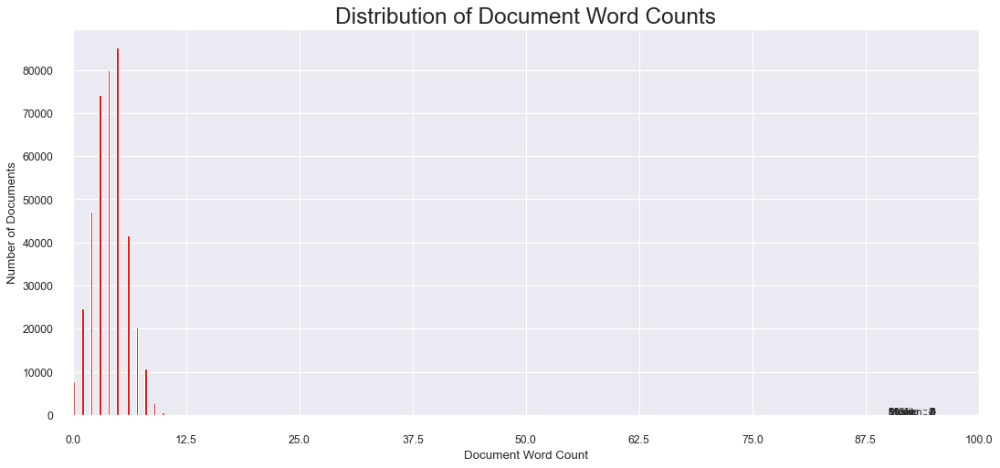

In [67]:
doc_lens = [len(d) for d in df_dominant_topic.Text]

labels = ["Mean   : " + str(round(np.mean(doc_lens))), "Median : " + str(round(np.median(doc_lens))), "Stdev   : " + str(round(np.std(doc_lens))), "1%ile    : " + str(round(np.quantile(doc_lens, q=0.01))), "99%ile  : " + str(round(np.quantile(doc_lens, q=0.99)))]
colors = ['red']

plt.figure(figsize=(16,7), dpi=80)

plt.hist(doc_lens, bins = 100, color='red')
plt.text(90, 100, "Mean   : " + str(round(np.mean(doc_lens))))
plt.text(90, 80, "Median : " + str(round(np.median(doc_lens))))
plt.text(90, 60, "Stdev   : " + str(round(np.std(doc_lens))))
plt.text(90, 40, "1%ile    : " + str(round(np.quantile(doc_lens, q=0.01))))
plt.text(90, 20, "99%ile  : " + str(round(np.quantile(doc_lens, q=0.99))))

plt.gca().set(xlim=(0, 100), ylabel='Number of Documents', xlabel='Document Word Count')
plt.tick_params(size=16)
plt.xticks(np.linspace(0,100,9))
plt.title('Distribution of Document Word Counts', fontdict=dict(size=22))

plt.show()

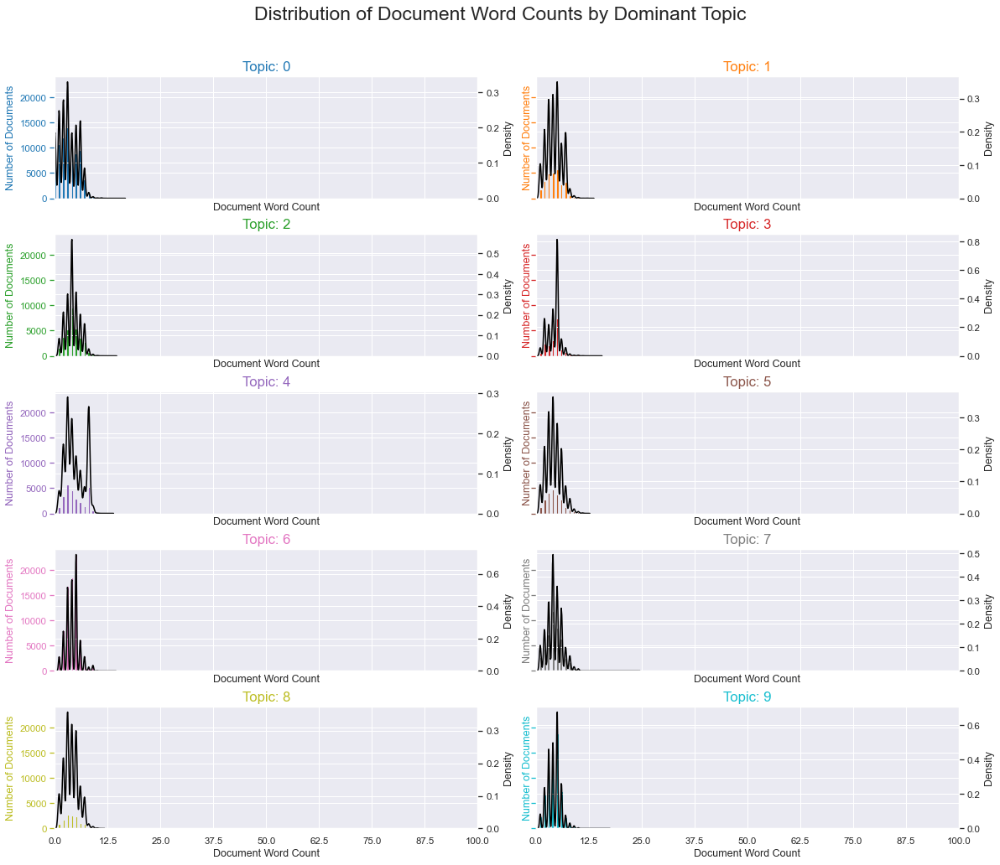

In [68]:
import seaborn as sns
import matplotlib.colors as mcolors
cols = [color for name, color in mcolors.TABLEAU_COLORS.items()]  # more colors: 'mcolors.XKCD_COLORS'

fig, axes = plt.subplots(5,2,figsize=(16,14), dpi=75, sharex=True, sharey=True)

for i, ax in enumerate(axes.flatten()):    
    df_dominant_topic_sub = df_dominant_topic.loc[df_dominant_topic.Dominant_Topic == i, :]
    doc_lens = [len(d) for d in df_dominant_topic_sub.Text]
    ax.hist(doc_lens, bins = 100, histtype='step', color=cols[i])
    ax.tick_params(axis='y', labelcolor=cols[i], color=cols[i])
    sns.kdeplot(doc_lens, color="black", shade=False, ax=ax.twinx())
    ax.set(xlim=(0, 100), xlabel='Document Word Count')
    ax.set_ylabel('Number of Documents', color=cols[i])
    ax.set_title('Topic: '+str(i), fontdict=dict(size=16, color=cols[i]))

fig.tight_layout()
fig.subplots_adjust(top=0.90)
plt.xticks(np.linspace(0,100,9))
fig.suptitle('Distribution of Document Word Counts by Dominant Topic', fontsize=22)
plt.show()

###  Word Clouds of Top N Keywords in Each Topic

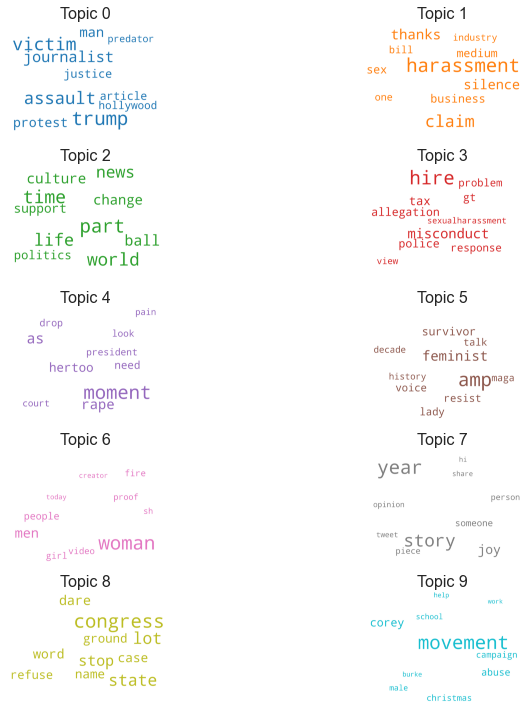

In [69]:
# 1. Wordcloud of Top N words in each topic
from matplotlib import pyplot as plt
from wordcloud import WordCloud, STOPWORDS
import matplotlib.colors as mcolors

cols = [color for name, color in mcolors.TABLEAU_COLORS.items()]  # more colors: 'mcolors.XKCD_COLORS'

cloud = WordCloud(stopwords=stop_words,
                  background_color='white',
                  width=2500,
                  height=1800,
                  max_words=10,
                  colormap='tab10',
                  color_func=lambda *args, **kwargs: cols[i],
                  prefer_horizontal=1.0)

topics = lda_model.show_topics(formatted=False)

fig, axes = plt.subplots(5, 2, figsize=(13,10), sharex=True, sharey=True)

for i, ax in enumerate(axes.flatten()):
    fig.add_subplot(ax)
    topic_words = dict(topics[i][1])
    cloud.generate_from_frequencies(topic_words, max_font_size=300)
    plt.gca().imshow(cloud)
    plt.gca().set_title('Topic ' + str(i), fontdict=dict(size=16))
    plt.gca().axis('off')


plt.subplots_adjust(wspace=0, hspace=0)
plt.axis('off')
plt.margins(x=0, y=0)
plt.tight_layout()
plt.show()

### Word Counts of Topic Keywords

/var/folders/b8/_n0wmgqx529ccytp_4mtnhsh0000gn/T/ipykernel_1464/2946622741.py:24: UserWarning: FixedFormatter should only be used together with FixedLocator
  ax.set_xticklabels(df.loc[df.topic_id==i, 'word'], rotation=30, horizontalalignment= 'right')
/var/folders/b8/_n0wmgqx529ccytp_4mtnhsh0000gn/T/ipykernel_1464/2946622741.py:24: UserWarning: FixedFormatter should only be used together with FixedLocator
  ax.set_xticklabels(df.loc[df.topic_id==i, 'word'], rotation=30, horizontalalignment= 'right')
/var/folders/b8/_n0wmgqx529ccytp_4mtnhsh0000gn/T/ipykernel_1464/2946622741.py:24: UserWarning: FixedFormatter should only be used together with FixedLocator
  ax.set_xticklabels(df.loc[df.topic_id==i, 'word'], rotation=30, horizontalalignment= 'right')
/var/folders/b8/_n0wmgqx529ccytp_4mtnhsh0000gn/T/ipykernel_1464/2946622741.py:24: UserWarning: FixedFormatter should only be used together with FixedLocator
  ax.set_xticklabels(df.loc[df.topic_id==i, 'word'], rotation=30, horizontalalignmen

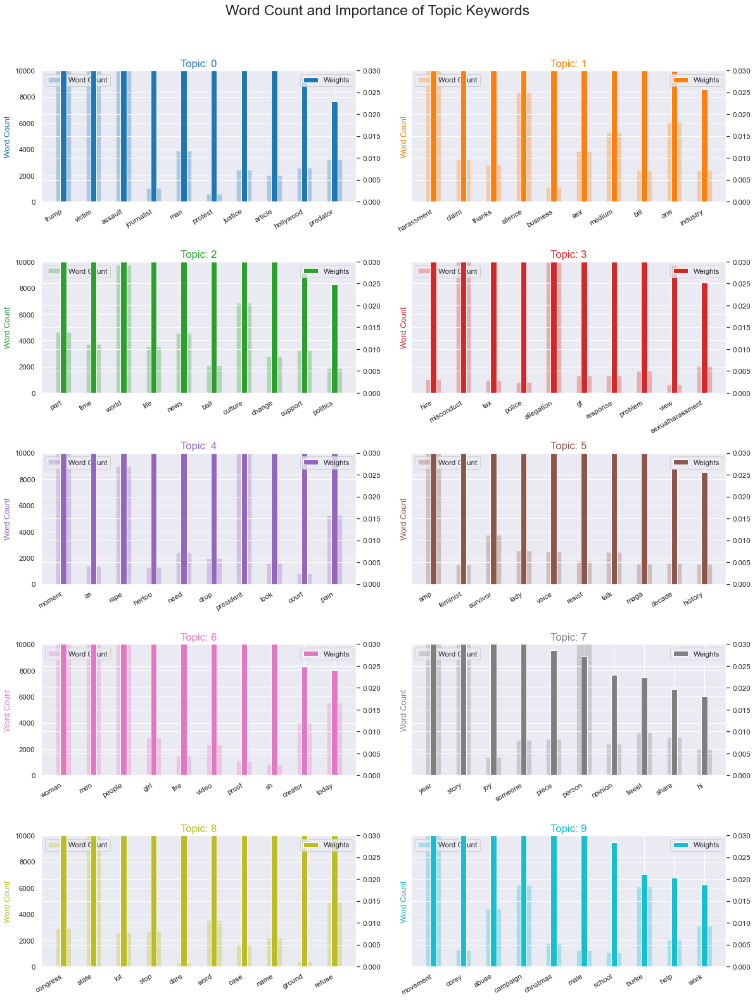

In [70]:
from collections import Counter
topics = lda_model.show_topics(formatted=False)
data_flat = [w for w_list in tokens for w in w_list]
counter = Counter(data_flat)

out = []
for i, topic in topics:
    for word, weight in topic:
        out.append([word, i , weight, counter[word]])

df = pd.DataFrame(out, columns=['word', 'topic_id', 'importance', 'word_count'])        

# Plot Word Count and Weights of Topic Keywords
fig, axes = plt.subplots(5, 2, figsize=(16,20), sharey=True, dpi=75)
cols = [color for name, color in mcolors.TABLEAU_COLORS.items()]
for i, ax in enumerate(axes.flatten()):
    ax.bar(x='word', height="word_count", data=df.loc[df.topic_id==i, :], color=cols[i], width=0.5, alpha=0.3, label='Word Count')
    ax_twin = ax.twinx()
    ax_twin.bar(x='word', height="importance", data=df.loc[df.topic_id==i, :], color=cols[i], width=0.2, label='Weights')
    ax.set_ylabel('Word Count', color=cols[i])
    ax_twin.set_ylim(0, 0.030); ax.set_ylim(0, 10000)
    ax.set_title('Topic: ' + str(i), color=cols[i], fontsize=16)
    ax.tick_params(axis='y', left=False)
    ax.set_xticklabels(df.loc[df.topic_id==i, 'word'], rotation=30, horizontalalignment= 'right')
    ax.legend(loc='upper left'); ax_twin.legend(loc='upper right')

fig.tight_layout(w_pad=2)    
fig.suptitle('Word Count and Importance of Topic Keywords', fontsize=22, y=1.05)    
plt.show()

### The most discussed topics in the documents

In [71]:
# Sentence Coloring of N Sentences
def topics_per_document(model, corpus, start=0, end=1):
    corpus_sel = corpus[start:end]
    dominant_topics = []
    topic_percentages = []
    for i, corp in enumerate(corpus_sel):
        topic_percs = model[corp]
        dominant_topic = sorted(topic_percs, key = lambda x: x[1], reverse=True)[0][0]
        dominant_topics.append((i, dominant_topic))
        topic_percentages.append(topic_percs)
    return(dominant_topics, topic_percentages)

dominant_topics, topic_percentages = topics_per_document(model=lda_model, corpus=corpus, end=-1)            

# Distribution of Dominant Topics in Each Document
df = pd.DataFrame(dominant_topics, columns=['Document_Id', 'Dominant_Topic'])
dominant_topic_in_each_doc = df.groupby('Dominant_Topic').size()
df_dominant_topic_in_each_doc = dominant_topic_in_each_doc.to_frame(name='count').reset_index()

# Total Topic Distribution by actual weight
topic_weightage_by_doc = pd.DataFrame([dict(t) for t in topic_percentages])
df_topic_weightage_by_doc = topic_weightage_by_doc.sum().to_frame(name='count').reset_index()

# Top 3 Keywords for each Topic
topic_top3words = [(i, topic) for i, topics in lda_model.show_topics(formatted=False) 
                                 for j, (topic, wt) in enumerate(topics) if j < 3]

df_top3words_stacked = pd.DataFrame(topic_top3words, columns=['topic_id', 'words'])
df_top3words = df_top3words_stacked.groupby('topic_id').agg(', \n'.join)
df_top3words.reset_index(level=0,inplace=True)

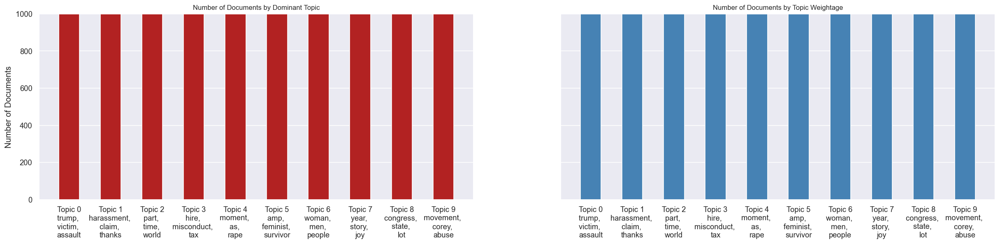

In [72]:
from matplotlib.ticker import FuncFormatter

# Plot
fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(25, 5), dpi=120, sharey=True)

# Topic Distribution by Dominant Topics
ax1.bar(x='Dominant_Topic', height='count', data=df_dominant_topic_in_each_doc, width=.5, color='firebrick')
ax1.set_xticks(range(df_dominant_topic_in_each_doc.Dominant_Topic.unique().__len__()))
tick_formatter = FuncFormatter(lambda x, pos: 'Topic ' + str(x)+ '\n' + df_top3words.loc[df_top3words.topic_id==x, 'words'].values[0])
ax1.xaxis.set_major_formatter(tick_formatter)
ax1.set_title('Number of Documents by Dominant Topic', fontdict=dict(size=10))
ax1.set_ylabel('Number of Documents')
ax1.set_ylim(0, 1000)

# Topic Distribution by Topic Weights
ax2.bar(x='index', height='count', data=df_topic_weightage_by_doc, width=.5, color='steelblue')
ax2.set_xticks(range(df_topic_weightage_by_doc.index.unique().__len__()))
ax2.xaxis.set_major_formatter(tick_formatter)
ax2.set_title('Number of Documents by Topic Weightage', fontdict=dict(size=10))

plt.show()